In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import gym
import torch
import random
import torch.nn as nn

In [2]:
class Env():
    def __init__(self):
        self.env = gym.make('CarRacing-v0')
        self.reward_threshold = self.env.spec.reward_threshold

    def reset(self):
        self.counter = 0
        self.av_r = self.reward_memory()
        self.die = False
        img_rgb = self.env.reset()
        img_gray = self.rgb2gray(img_rgb)
        self.stack = [img_gray] * 4
        return np.array(self.stack)

    def step(self, action):
        total_reward = 0
        for i in range(8):
            img_rgb, reward, die, _ = self.env.step(action)
            # don't penalize "die state"
            if die:
                reward += 100
            # green penalty
            if np.mean(img_rgb[:, :, 1]) > 185.0:
                reward -= 0.05
            total_reward += reward
            # if no reward recently, end the episode
            done = True if self.av_r(reward) <= -0.1 else False
            if done or die:
                break
        img_gray = self.rgb2gray(img_rgb)
        self.stack.pop(0)
        self.stack.append(img_gray)
        assert len(self.stack) == 4
        return np.array(self.stack), total_reward, done, die

    def render(self):
        self.env.render()
        
    def close(self):
        self.env.close()

    @staticmethod
    def rgb2gray(rgb, norm=True):
        gray = np.dot(rgb[..., :], [0.299, 0.587, 0.114])
        if norm:
            # normalize
            gray = gray / 128. - 1.
        return gray

    @staticmethod
    def reward_memory():
        count = 0
        length = 100
        history = np.zeros(length)

        def memory(reward):
            nonlocal count
            history[count] = reward
            count = (count + 1) % length
            return np.mean(history)

        return memory
        
class Classifier(nn.Module):
    def __init__(self,ch=2):
        super(Classifier,self).__init__()
        self.layer1 = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels=4,out_channels=ch*8,kernel_size=7),
            torch.nn.ReLU(),
            torch.nn.Conv2d(in_channels=ch*8,out_channels=ch*16,kernel_size=5,stride=2),
            torch.nn.ReLU(),
            torch.nn.Conv2d(in_channels=ch*16,out_channels=ch*32,kernel_size=3,stride=2),
            torch.nn.ReLU(),
            torch.nn.Conv2d(in_channels=ch*32,out_channels=ch*32,kernel_size=3,stride=2),
            torch.nn.ReLU(),
            torch.nn.Conv2d(in_channels=ch*32,out_channels=ch*64,kernel_size=3,stride=2),
            torch.nn.ReLU(),
            torch.nn.Conv2d(in_channels=ch*64,out_channels=ch*64,kernel_size=3,stride=2),
            torch.nn.ReLU()
        )
        self.v = torch.nn.Sequential(
            torch.nn.Linear(64*ch*1*1,256),
            torch.nn.ReLU()
        )
        self.fc = torch.nn.Linear(256,3)
        self.ch = ch
        
    def forward(self,x):
        x = self.layer1(x)
        x = x.view(x.size(0),-1)
        x = self.v(x)
        x = self.fc(x)
        
        x[:,0] = torch.tanh(x[:,0])
        x[:,1] = torch.sigmoid(x[:,1])
        x[:,2] = torch.sigmoid(x[:,2])
        return x

Track generation: 1240..1555 -> 315-tiles track


C:\Users\awds2588\anaconda3\lib\site-packages\pyglet\image\codecs\wic.py:289: UserWarning: [WinError -2147417850] 執行緒模式設定後就不能再變更它。
  warnings.warn(str(err))


Epoch: 1
DAgger	mean: 1016.60	variance: 0.00


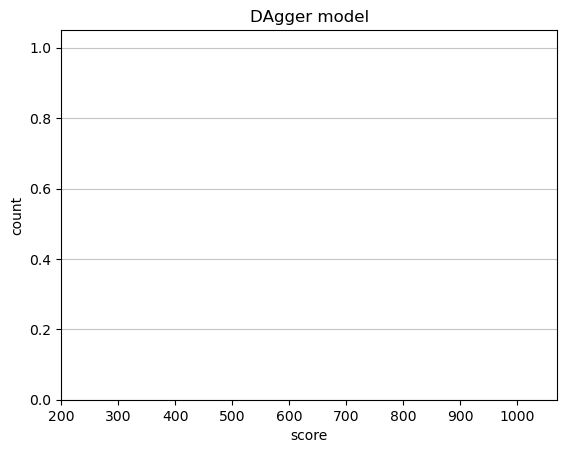

Track generation: 1125..1420 -> 295-tiles track
Epoch: 2
DAgger	mean: 1022.55	variance: 5.95


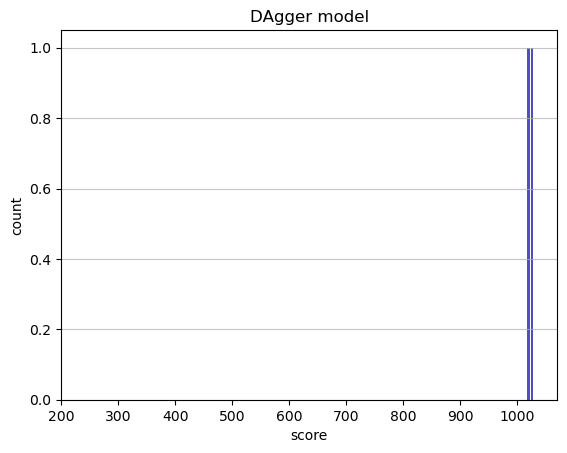

Track generation: 1062..1346 -> 284-tiles track
Epoch: 3
DAgger	mean: 1023.07	variance: 4.91


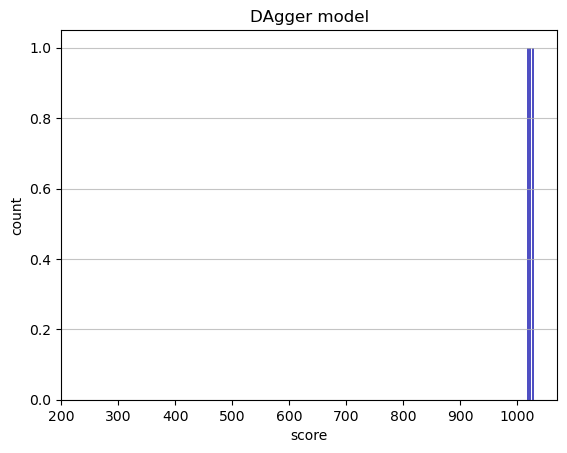

Track generation: 1148..1444 -> 296-tiles track
Epoch: 4
DAgger	mean: 991.43	variance: 54.96


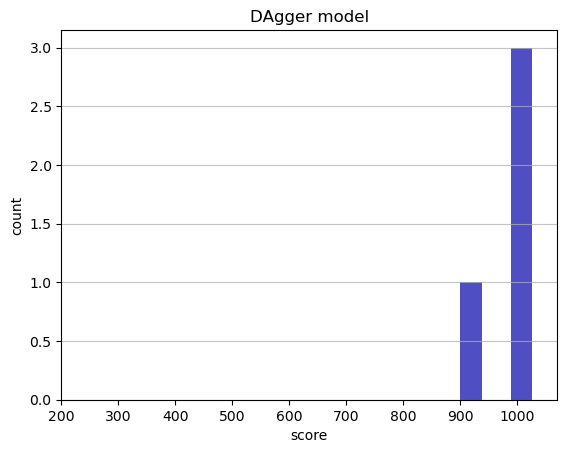

Track generation: 1178..1475 -> 297-tiles track
Epoch: 5
DAgger	mean: 972.68	variance: 61.83


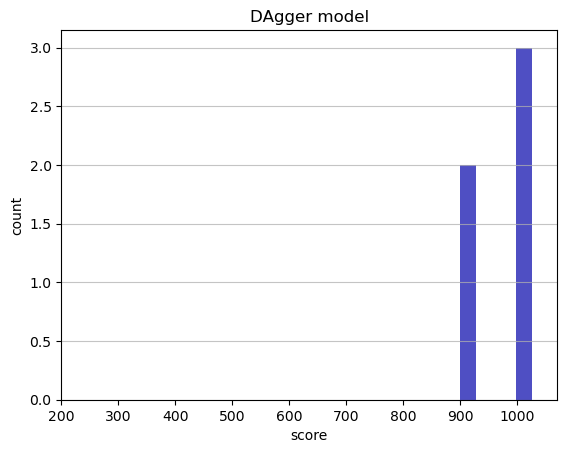

Track generation: 1119..1407 -> 288-tiles track
Epoch: 6
DAgger	mean: 938.48	variance: 95.05


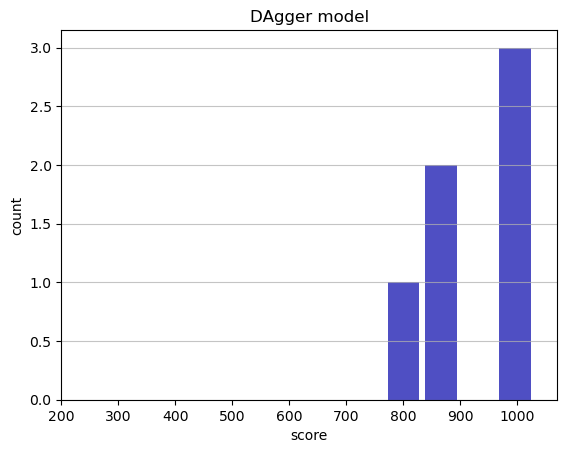

Track generation: 1008..1264 -> 256-tiles track
Epoch: 7
DAgger	mean: 872.76	variance: 183.45


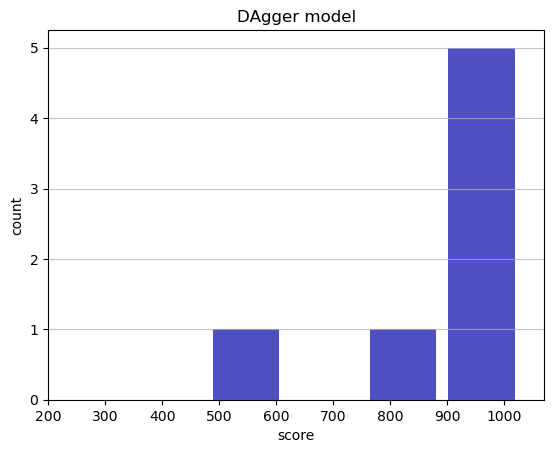

Track generation: 1085..1362 -> 277-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1168..1464 -> 296-tiles track
Epoch: 8
DAgger	mean: 891.93	variance: 178.94


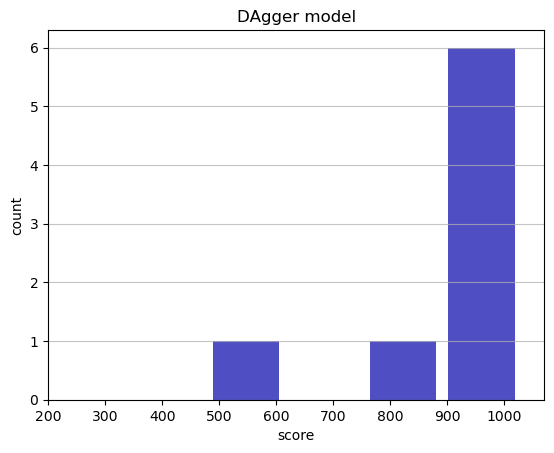

Track generation: 1204..1509 -> 305-tiles track
Epoch: 9
DAgger	mean: 854.78	variance: 198.76


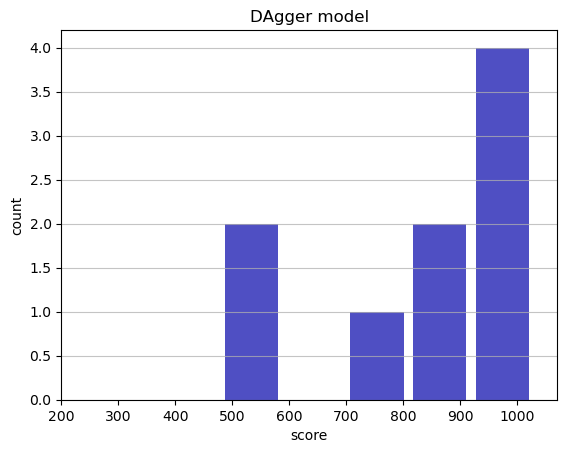

Track generation: 1096..1374 -> 278-tiles track
Epoch: 10
DAgger	mean: 859.19	variance: 189.03


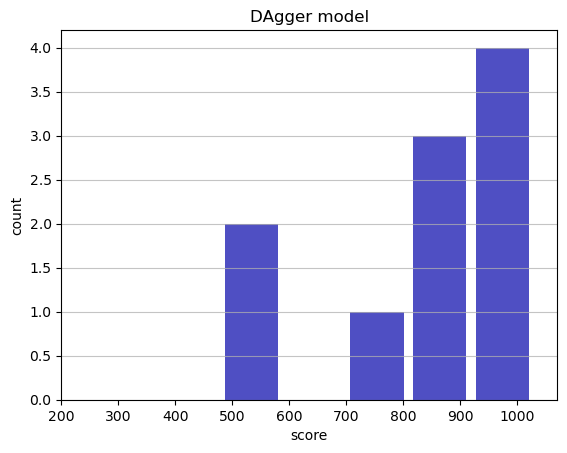

Track generation: 1103..1383 -> 280-tiles track
Epoch: 11
DAgger	mean: 875.18	variance: 187.18


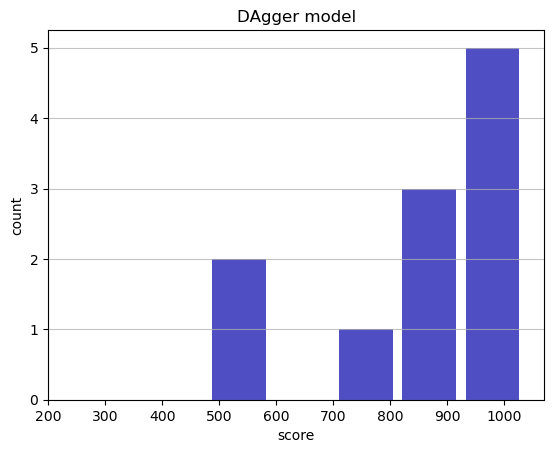

Track generation: 1000..1254 -> 254-tiles track
Epoch: 12
DAgger	mean: 840.08	variance: 213.70


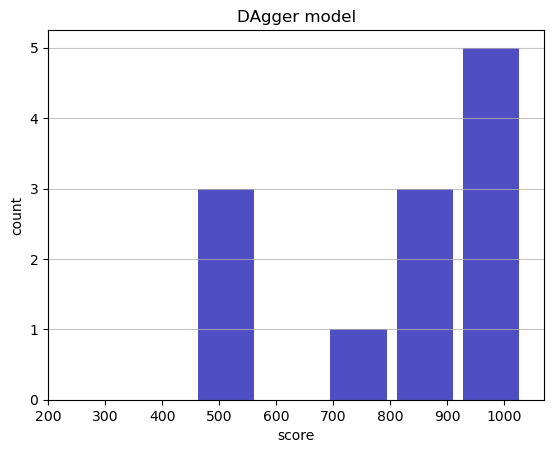

Track generation: 1176..1474 -> 298-tiles track
Epoch: 13
DAgger	mean: 844.73	variance: 205.94


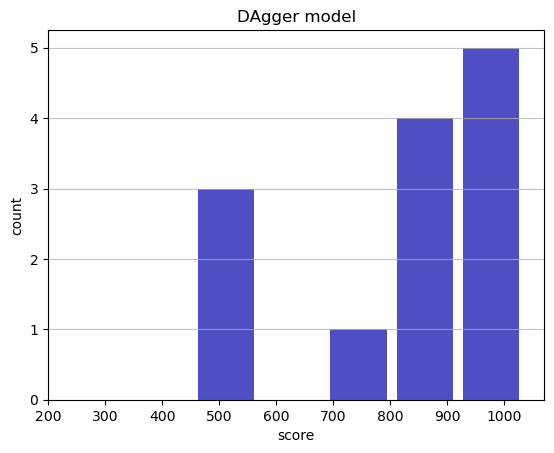

Track generation: 1289..1625 -> 336-tiles track
Epoch: 14
DAgger	mean: 856.97	variance: 203.30


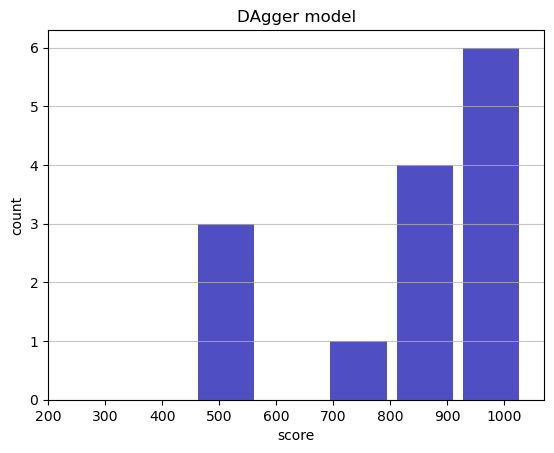

Track generation: 1120..1404 -> 284-tiles track
Epoch: 15
DAgger	mean: 868.31	variance: 200.93


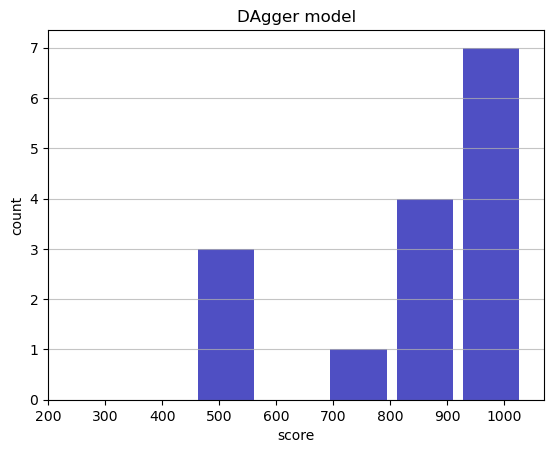

Track generation: 1043..1316 -> 273-tiles track
Epoch: 16
DAgger	mean: 869.74	variance: 194.63


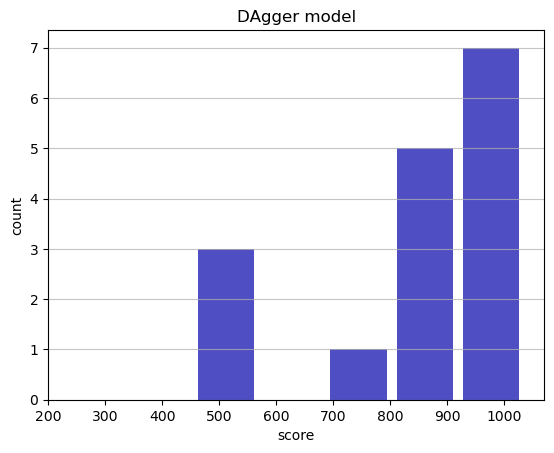

Track generation: 1125..1410 -> 285-tiles track
Epoch: 17
DAgger	mean: 879.08	variance: 192.48


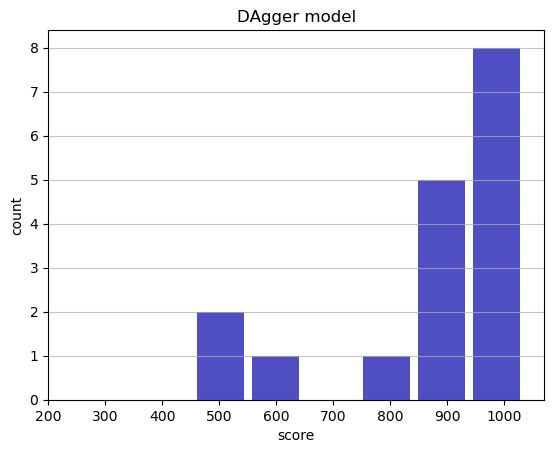

Track generation: 1150..1446 -> 296-tiles track
Epoch: 18
DAgger	mean: 880.08	variance: 187.10


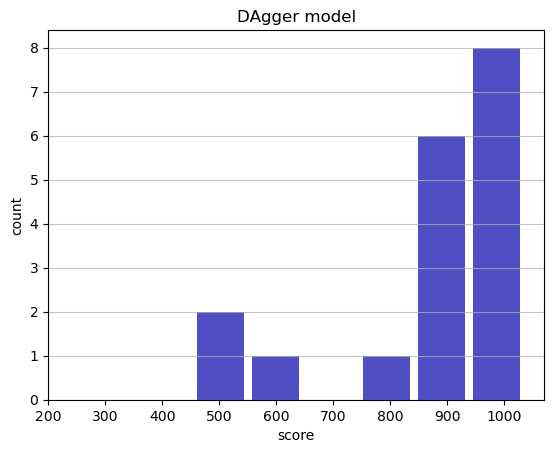

Track generation: 1167..1463 -> 296-tiles track
Epoch: 19
DAgger	mean: 887.67	variance: 184.94


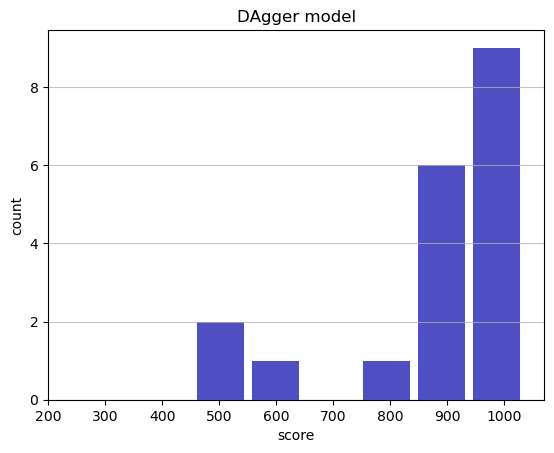

Track generation: 1015..1282 -> 267-tiles track
Epoch: 20
DAgger	mean: 888.56	variance: 180.30


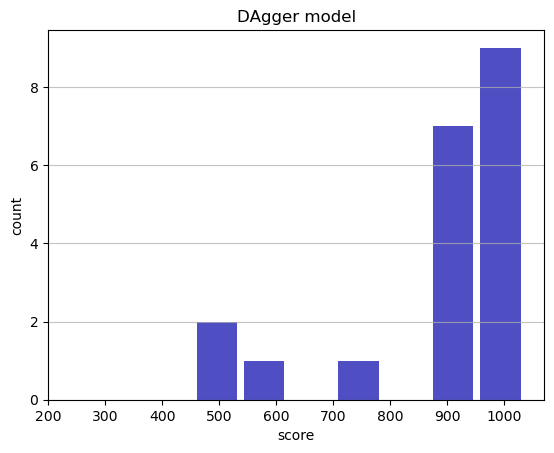

Track generation: 1204..1509 -> 305-tiles track
Epoch: 21
DAgger	mean: 894.78	variance: 178.14


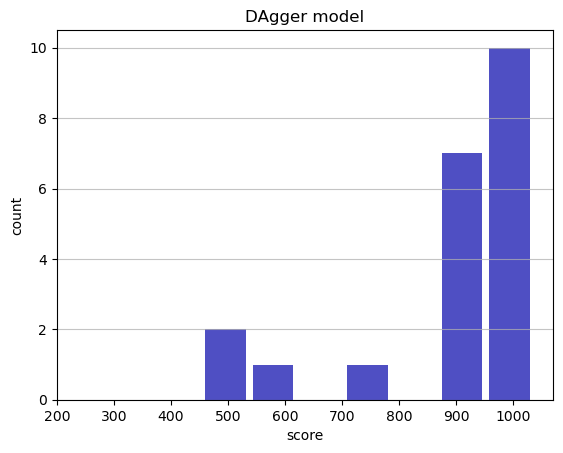

Track generation: 1120..1404 -> 284-tiles track
Epoch: 22
DAgger	mean: 900.88	variance: 176.28


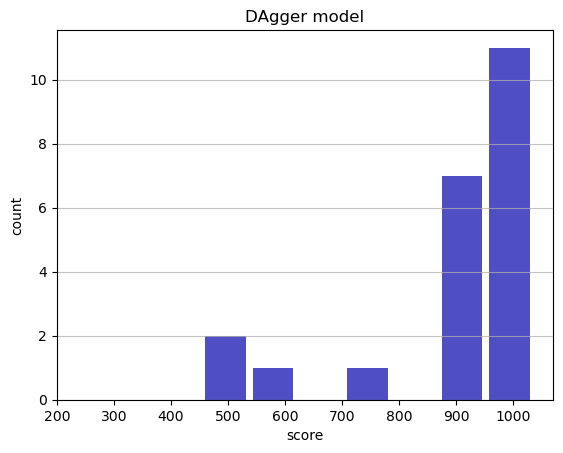

Track generation: 1219..1528 -> 309-tiles track
Epoch: 23
DAgger	mean: 905.91	variance: 174.01


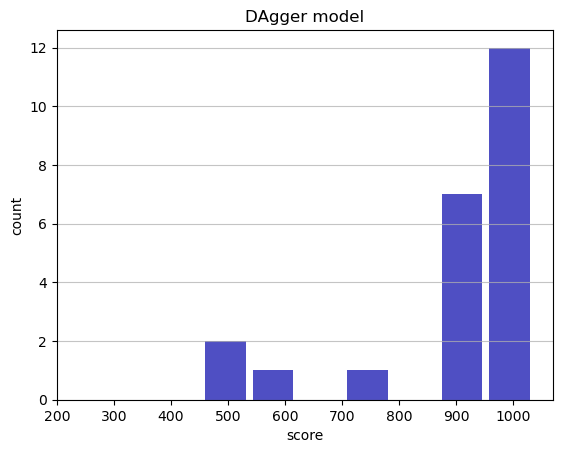

Track generation: 1002..1263 -> 261-tiles track
Epoch: 24
DAgger	mean: 905.94	variance: 170.35


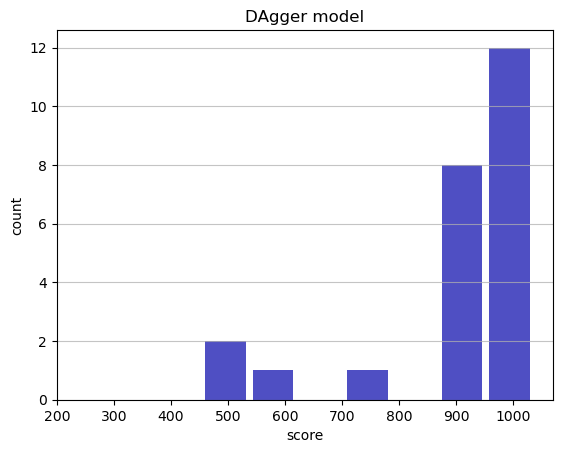

Track generation: 1135..1423 -> 288-tiles track
Epoch: 25
DAgger	mean: 910.71	variance: 168.54


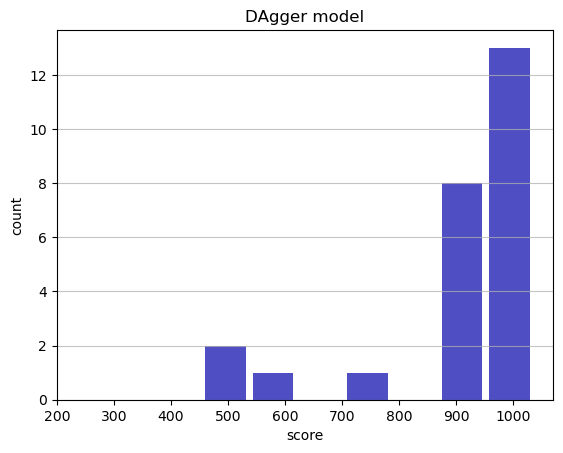

Track generation: 1178..1481 -> 303-tiles track
Epoch: 26
DAgger	mean: 914.96	variance: 166.62


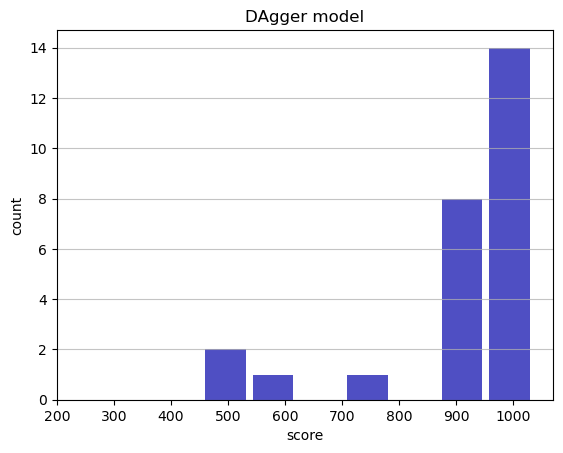

Track generation: 1197..1500 -> 303-tiles track
Epoch: 27
DAgger	mean: 918.78	variance: 164.67


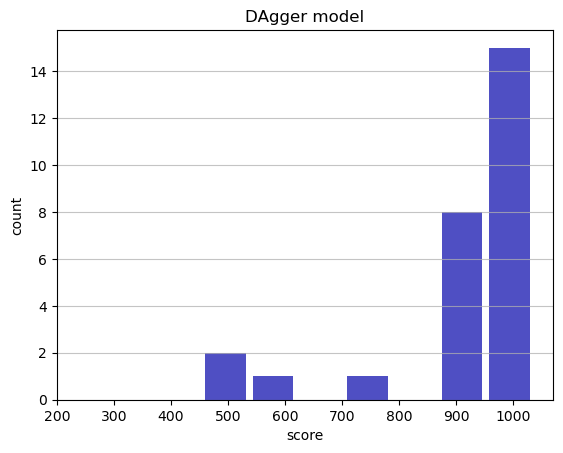

Track generation: 1028..1289 -> 261-tiles track
Epoch: 28
DAgger	mean: 923.04	variance: 163.21


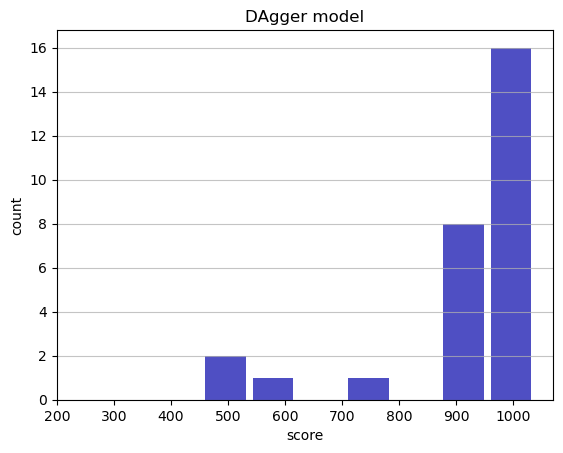

Track generation: 1124..1409 -> 285-tiles track
Epoch: 29
DAgger	mean: 926.68	variance: 161.52


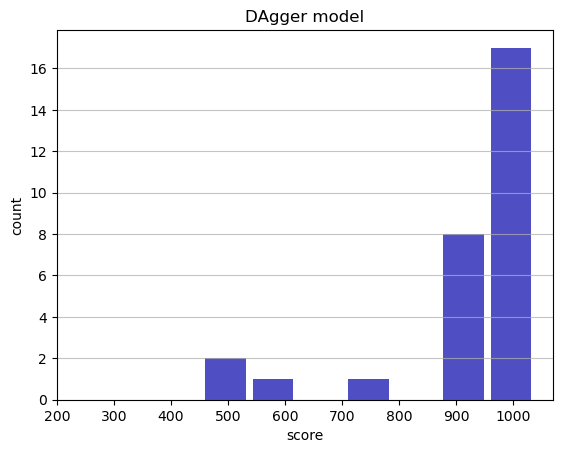

Track generation: 1152..1444 -> 292-tiles track
Epoch: 30
DAgger	mean: 930.01	variance: 159.81


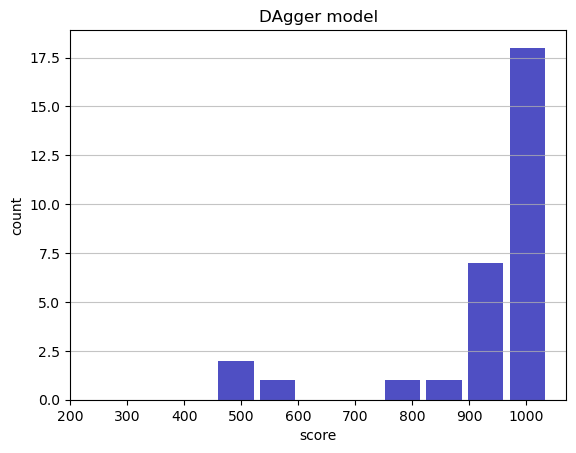

Track generation: 1169..1498 -> 329-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1120..1404 -> 284-tiles track
Epoch: 31
DAgger	mean: 933.23	variance: 158.20


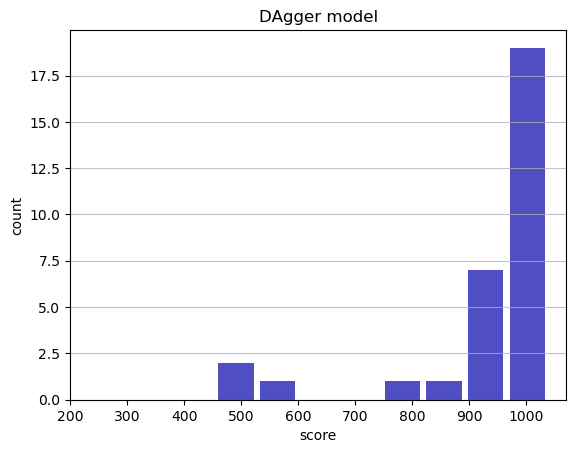

Track generation: 1152..1444 -> 292-tiles track
Epoch: 32
DAgger	mean: 936.19	variance: 156.58


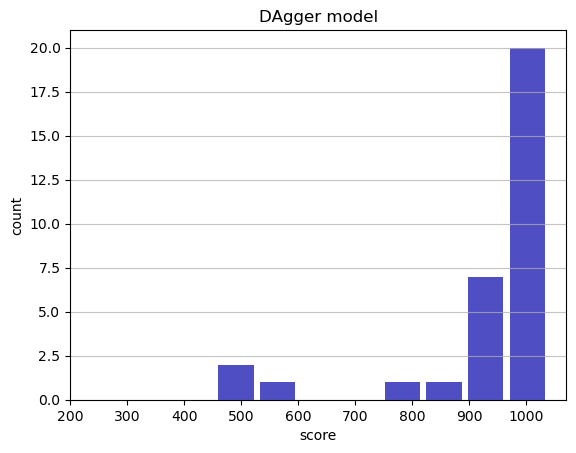

Track generation: 1112..1399 -> 287-tiles track
Epoch: 33
DAgger	mean: 938.80	variance: 154.89


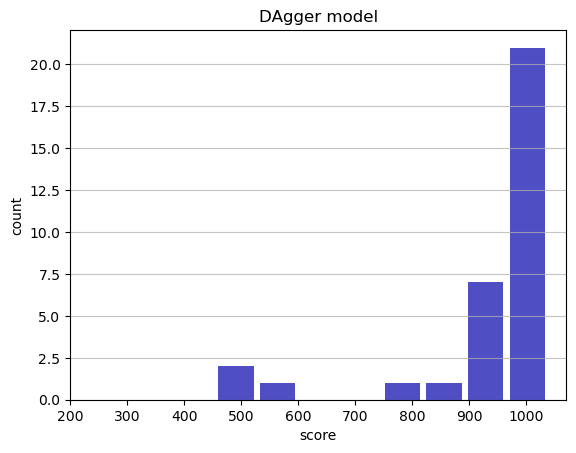

Track generation: 902..1136 -> 234-tiles track
Epoch: 34
DAgger	mean: 941.80	variance: 153.57


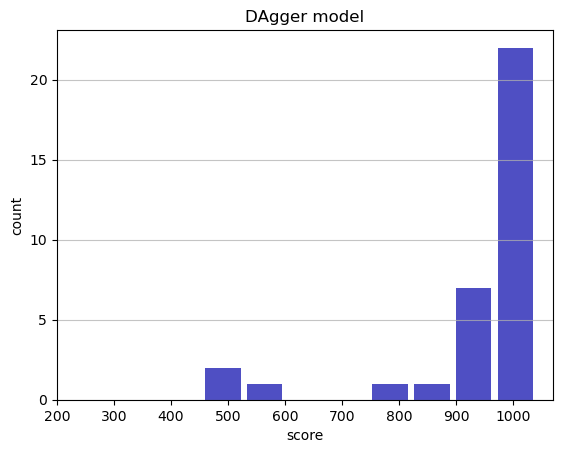

Track generation: 1094..1378 -> 284-tiles track
Epoch: 35
DAgger	mean: 944.19	variance: 152.00


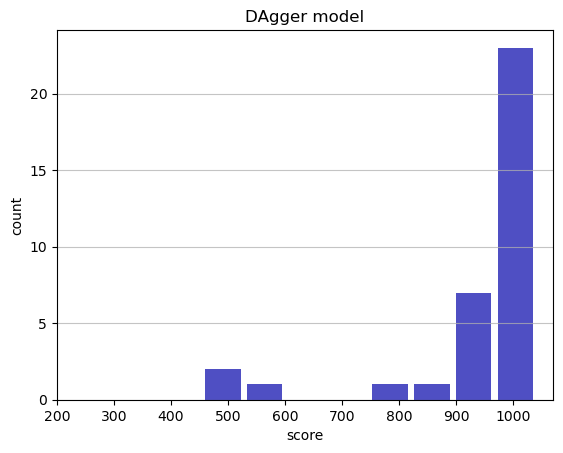

Track generation: 1132..1419 -> 287-tiles track
Epoch: 36
DAgger	mean: 946.52	variance: 150.51


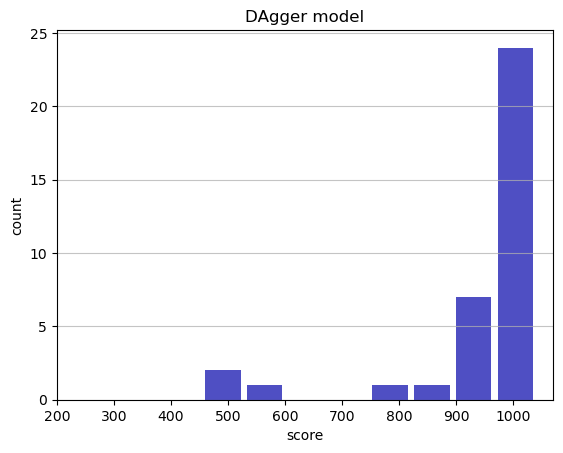

Track generation: 1136..1424 -> 288-tiles track
Epoch: 37
DAgger	mean: 948.79	variance: 149.08


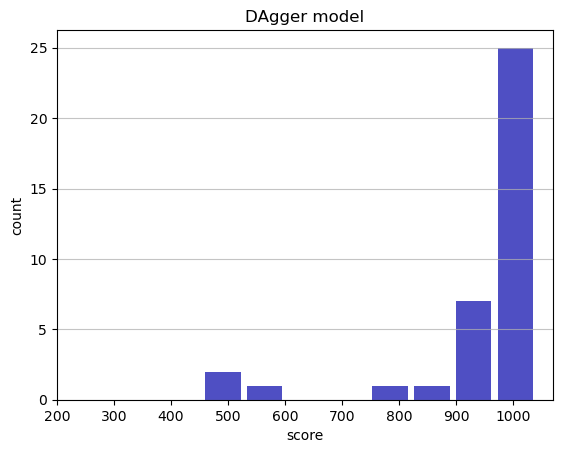

Track generation: 1019..1285 -> 266-tiles track
Epoch: 38
DAgger	mean: 950.96	variance: 147.70


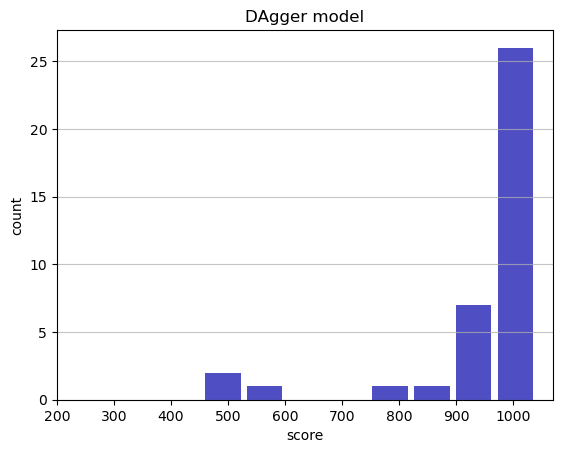

Track generation: 1285..1610 -> 325-tiles track
Epoch: 39
DAgger	mean: 949.54	variance: 146.05


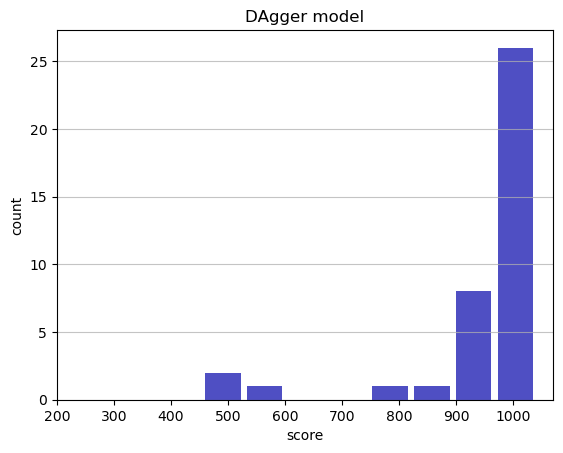

Track generation: 1155..1448 -> 293-tiles track
Epoch: 40
DAgger	mean: 947.61	variance: 144.72


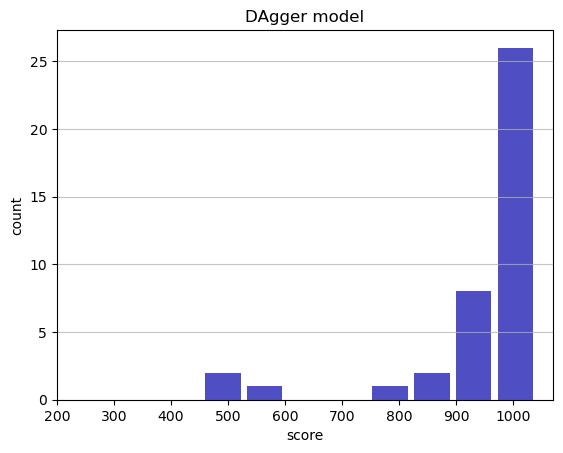

Track generation: 1435..1798 -> 363-tiles track
Epoch: 41
DAgger	mean: 948.62	variance: 143.08


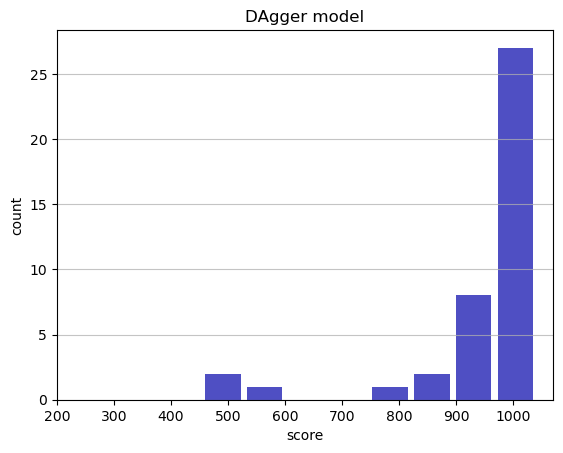

Track generation: 1096..1379 -> 283-tiles track
Epoch: 42
DAgger	mean: 950.46	variance: 141.86


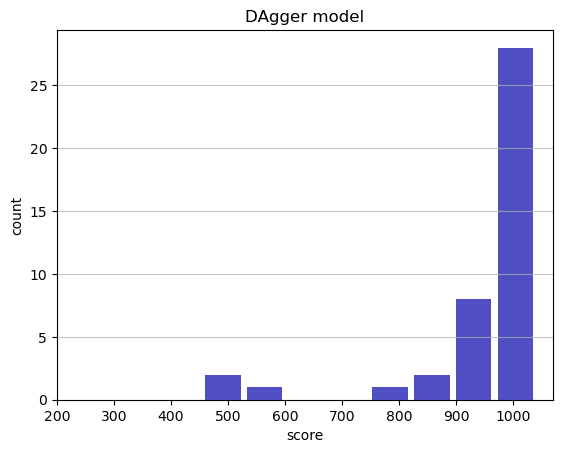

Track generation: 1122..1417 -> 295-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1096..1374 -> 278-tiles track
Epoch: 43
DAgger	mean: 952.30	variance: 140.71


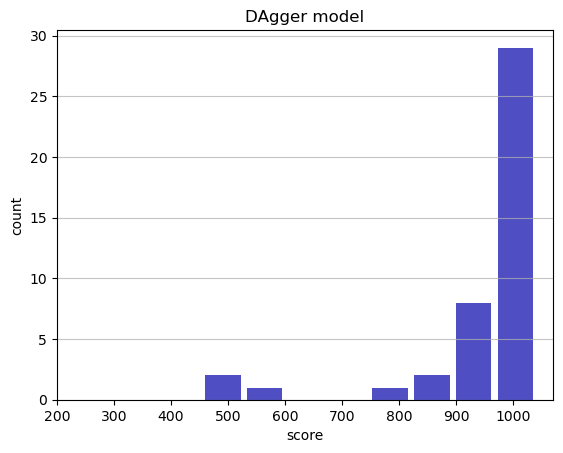

Track generation: 1219..1528 -> 309-tiles track
Epoch: 44
DAgger	mean: 953.87	variance: 139.48


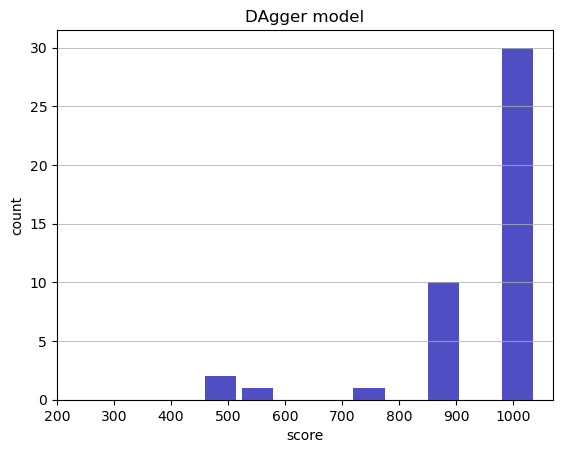

Track generation: 1155..1448 -> 293-tiles track
Epoch: 45
DAgger	mean: 952.11	variance: 138.42


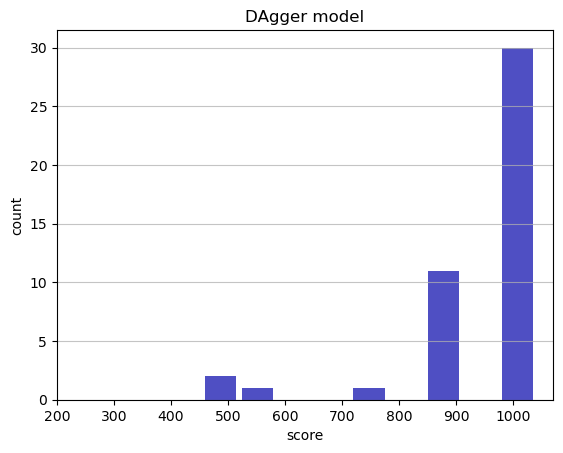

Track generation: 1180..1479 -> 299-tiles track
Epoch: 46
DAgger	mean: 953.62	variance: 137.28


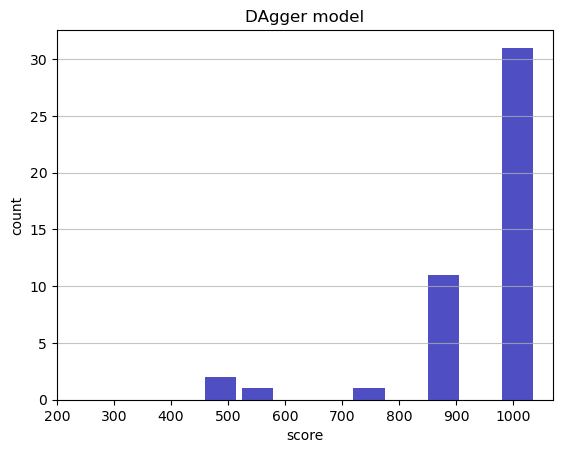

Track generation: 1265..1594 -> 329-tiles track
Epoch: 47
DAgger	mean: 954.79	variance: 136.05


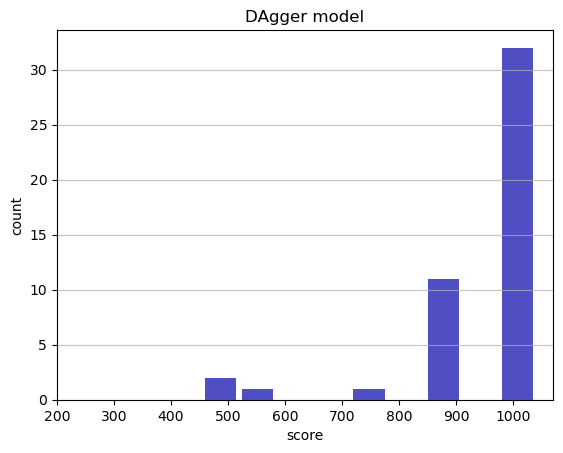

Track generation: 1179..1478 -> 299-tiles track
Epoch: 48
DAgger	mean: 956.32	variance: 135.03


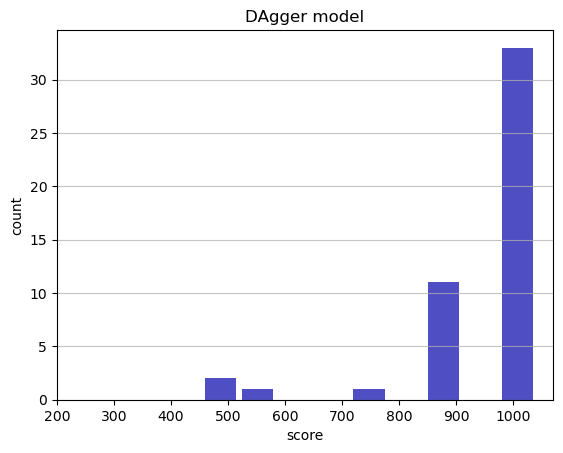

Track generation: 1148..1441 -> 293-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1073..1345 -> 272-tiles track
Epoch: 49
DAgger	mean: 955.14	variance: 133.90


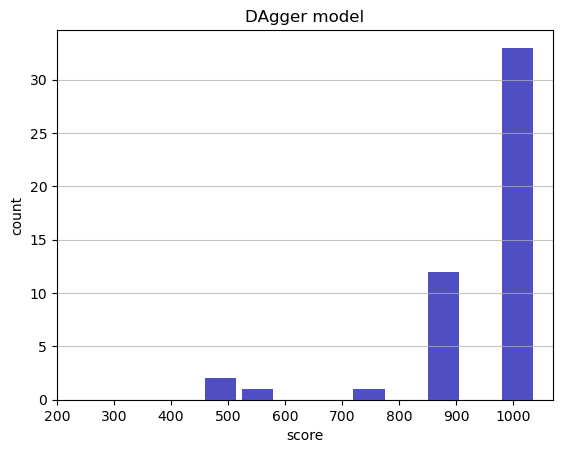

Track generation: 1258..1577 -> 319-tiles track
Epoch: 50
DAgger	mean: 956.39	variance: 132.84


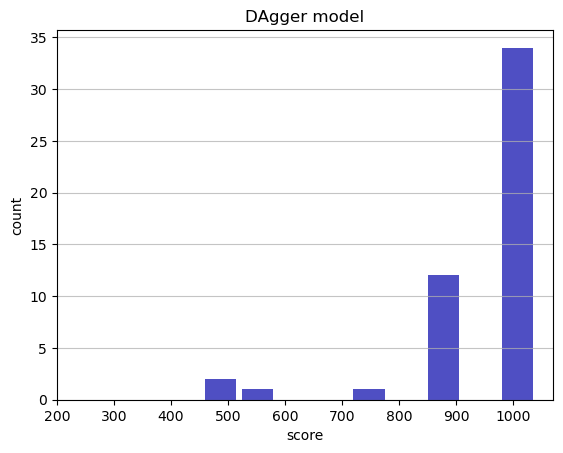

Track generation: 1144..1434 -> 290-tiles track
Epoch: 51
DAgger	mean: 955.06	variance: 131.86


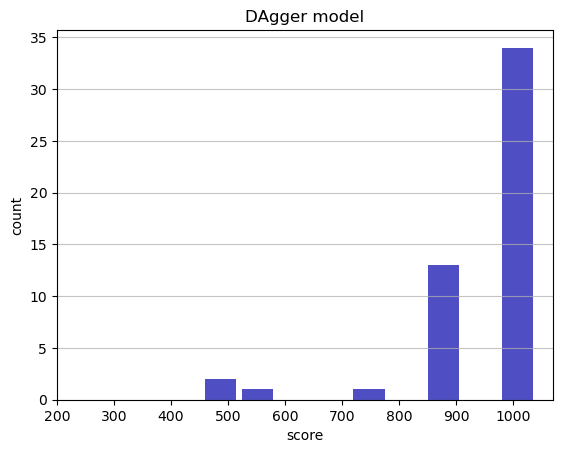

Track generation: 1417..1775 -> 358-tiles track
Epoch: 52
DAgger	mean: 955.99	variance: 130.76


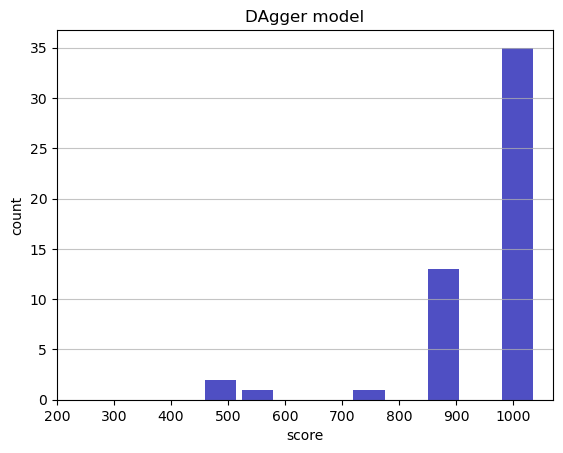

Track generation: 1175..1472 -> 297-tiles track
Epoch: 53
DAgger	mean: 957.27	variance: 129.85


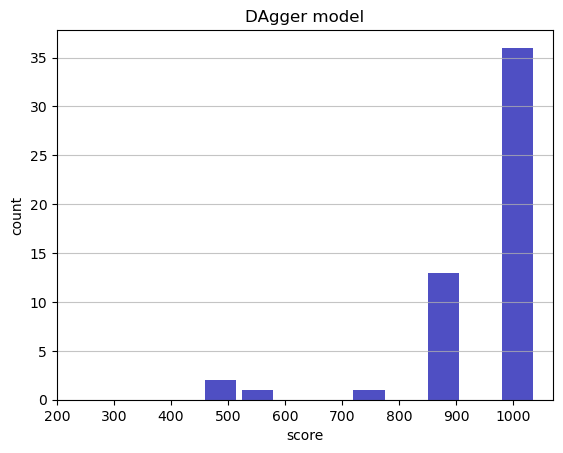

Track generation: 1162..1462 -> 300-tiles track
Epoch: 54
DAgger	mean: 958.45	variance: 128.93


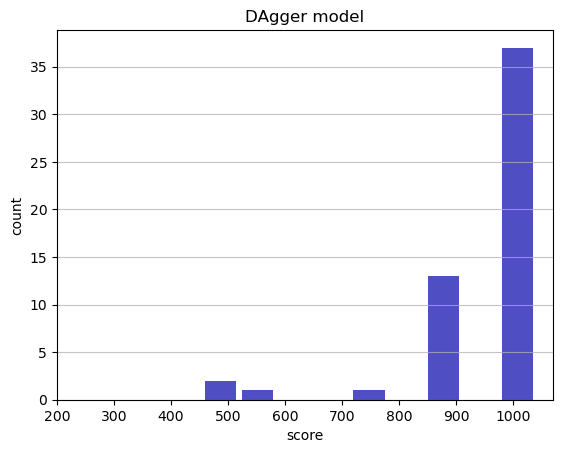

Track generation: 1155..1448 -> 293-tiles track
Epoch: 55
DAgger	mean: 957.56	variance: 127.92


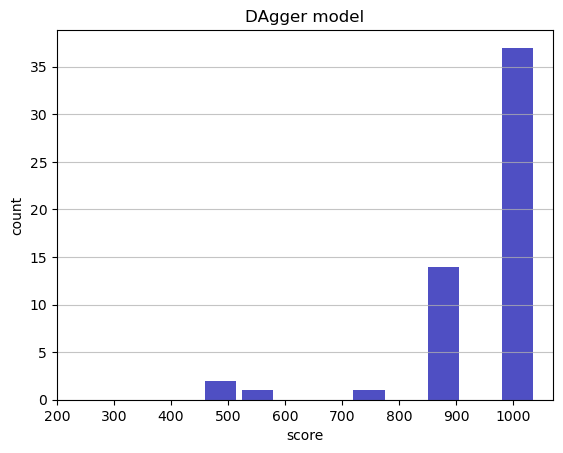

Track generation: 1143..1433 -> 290-tiles track
Epoch: 56
DAgger	mean: 956.53	variance: 127.00


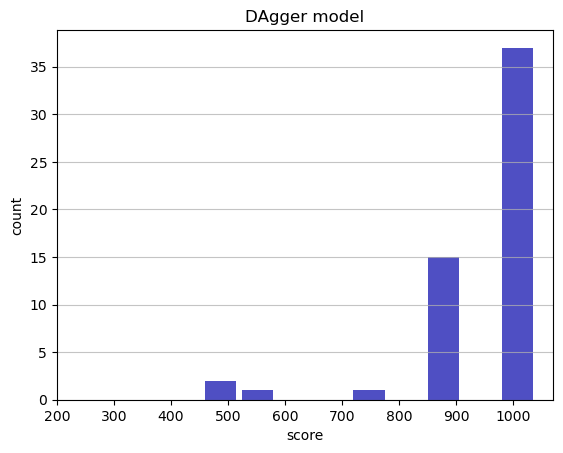

Track generation: 1076..1356 -> 280-tiles track
Epoch: 57
DAgger	mean: 955.44	variance: 126.15


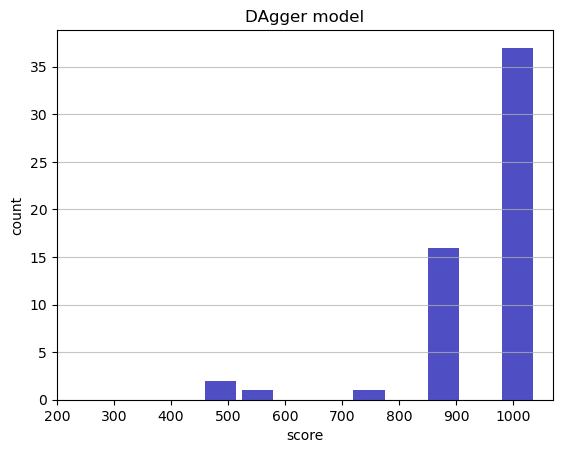

Track generation: 1021..1280 -> 259-tiles track
Epoch: 58
DAgger	mean: 956.78	variance: 125.46


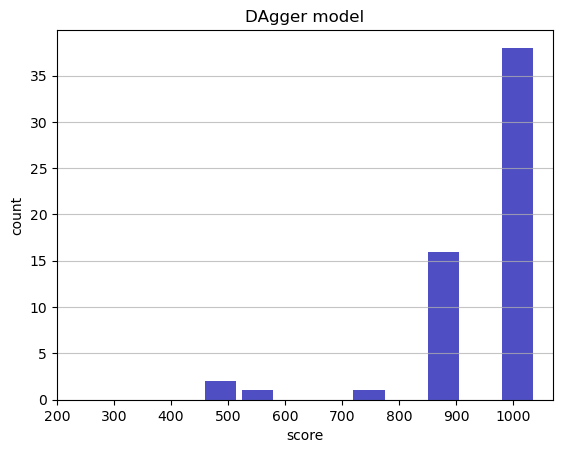

Track generation: 1337..1675 -> 338-tiles track
Epoch: 59
DAgger	mean: 957.66	variance: 124.58


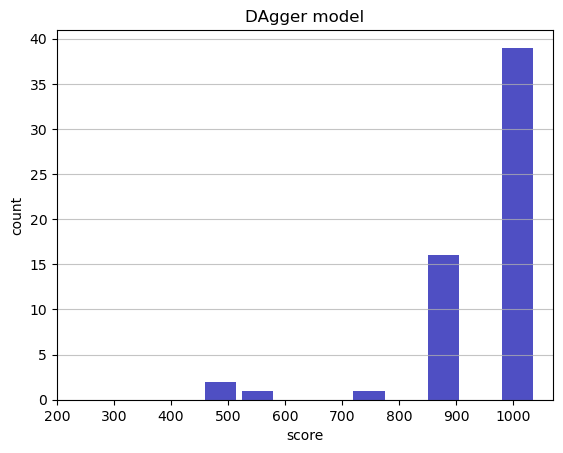

Track generation: 1132..1419 -> 287-tiles track
Epoch: 60
DAgger	mean: 958.88	variance: 123.89


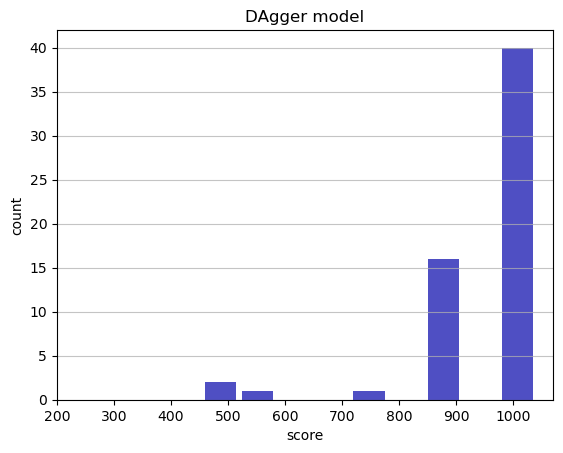

Track generation: 1192..1504 -> 312-tiles track
Epoch: 61
DAgger	mean: 957.97	variance: 123.08


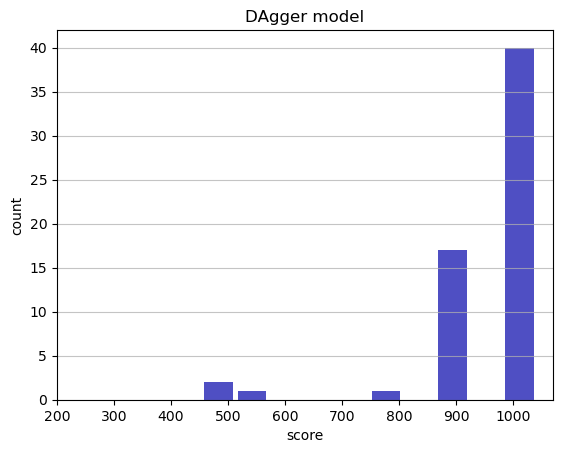

Track generation: 1075..1352 -> 277-tiles track
Epoch: 62
DAgger	mean: 957.14	variance: 122.25


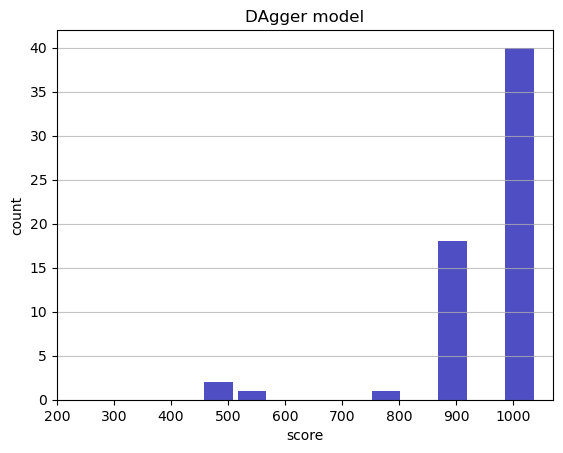

Track generation: 1236..1549 -> 313-tiles track
Epoch: 63
DAgger	mean: 956.24	variance: 121.49


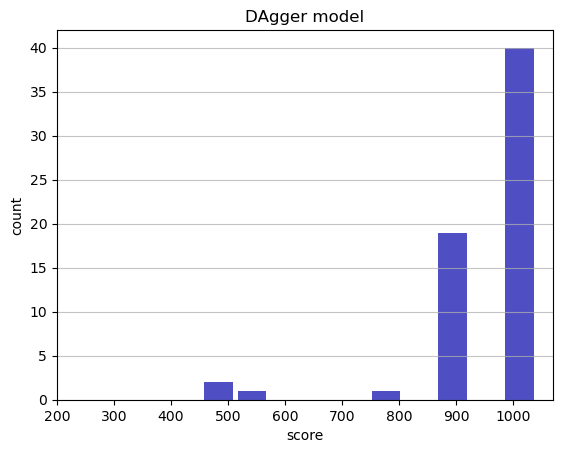

Track generation: 1264..1584 -> 320-tiles track
Epoch: 64
DAgger	mean: 957.17	variance: 120.76


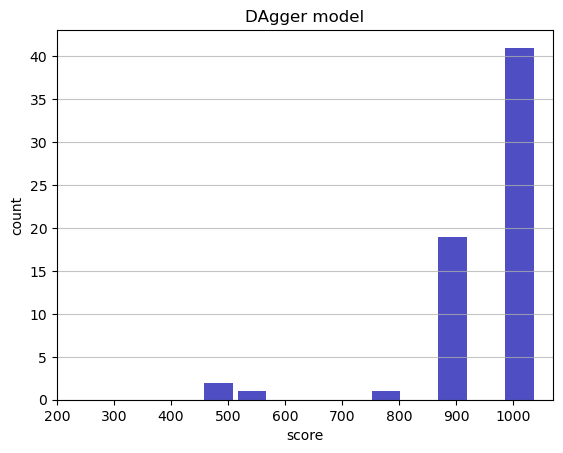

Track generation: 1108..1389 -> 281-tiles track
Epoch: 65
DAgger	mean: 955.89	variance: 120.26


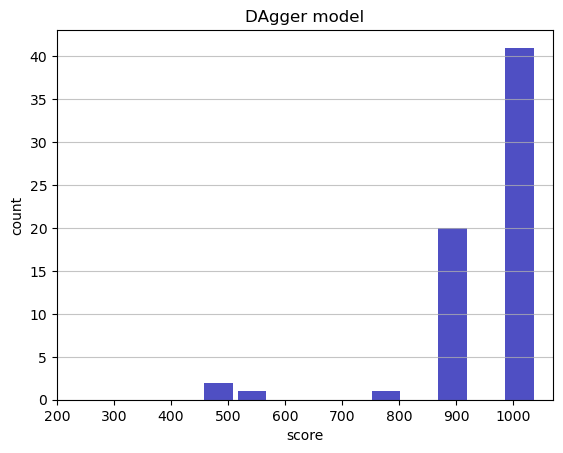

Track generation: 1156..1449 -> 293-tiles track
Epoch: 66
DAgger	mean: 950.22	variance: 127.80


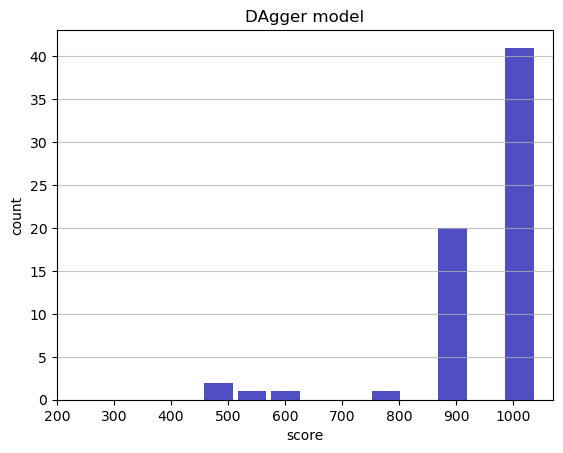

Track generation: 1320..1654 -> 334-tiles track
Epoch: 67
DAgger	mean: 950.74	variance: 126.92


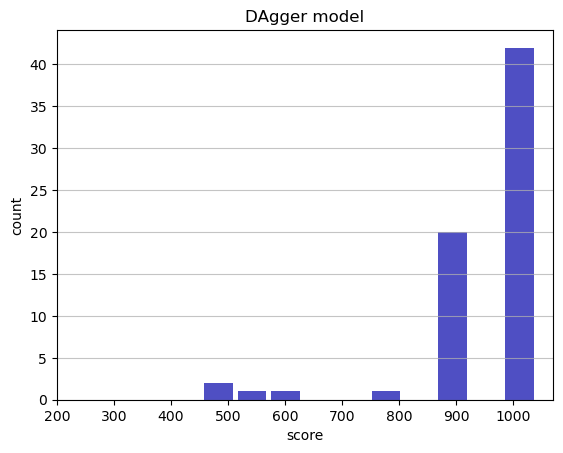

Track generation: 1087..1363 -> 276-tiles track
Epoch: 68
DAgger	mean: 950.12	variance: 126.08


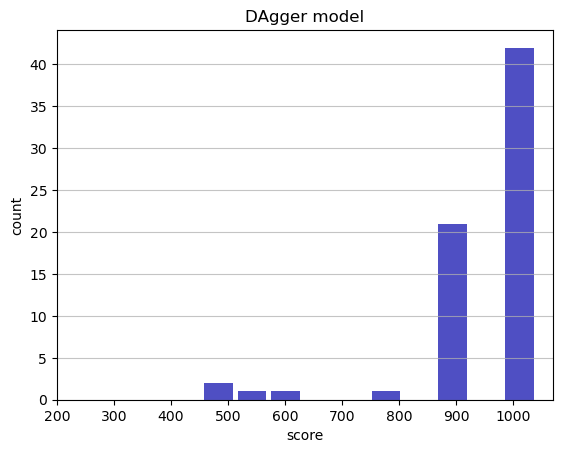

Track generation: 1034..1298 -> 264-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1220..1529 -> 309-tiles track
Epoch: 69
DAgger	mean: 951.15	variance: 125.45


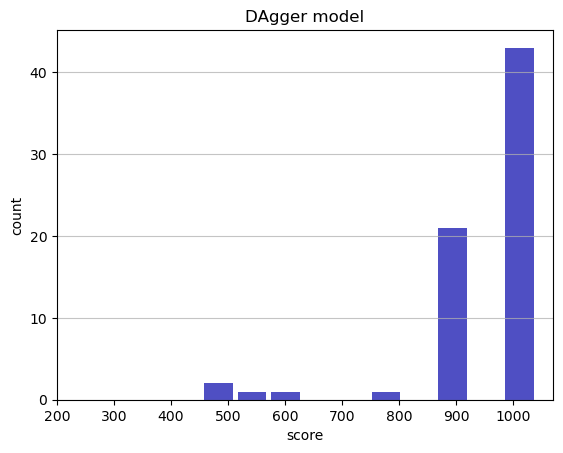

Track generation: 1280..1604 -> 324-tiles track
Epoch: 70
DAgger	mean: 952.00	variance: 124.75


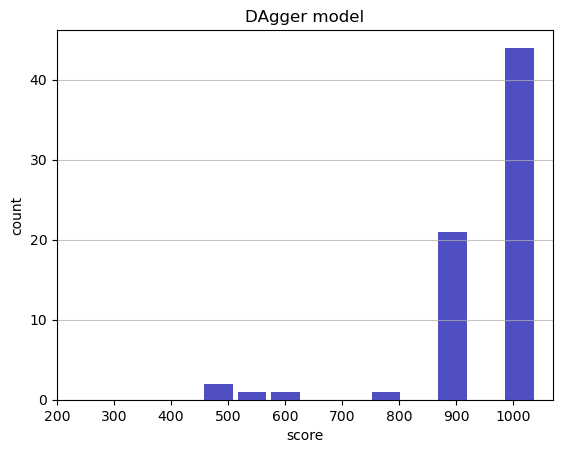

Track generation: 1152..1453 -> 301-tiles track
Epoch: 71
DAgger	mean: 950.85	variance: 124.25


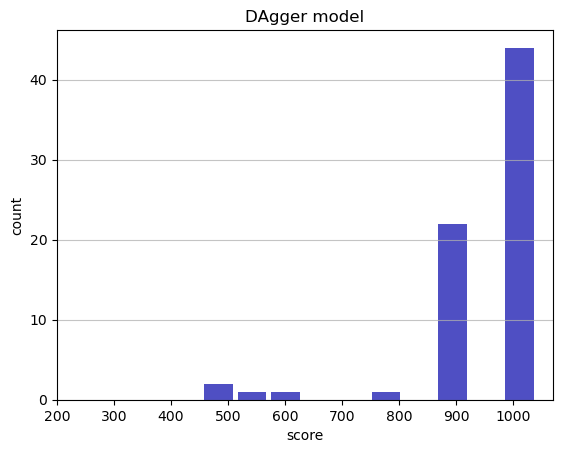

Track generation: 1109..1395 -> 286-tiles track
Epoch: 72
DAgger	mean: 949.91	variance: 123.63


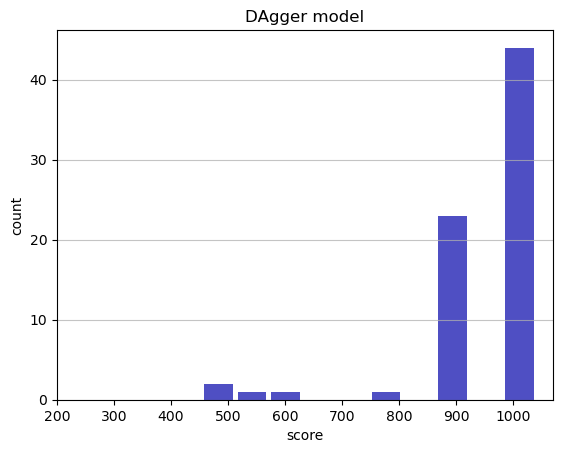

Track generation: 1208..1514 -> 306-tiles track
Epoch: 73
DAgger	mean: 950.86	variance: 123.04


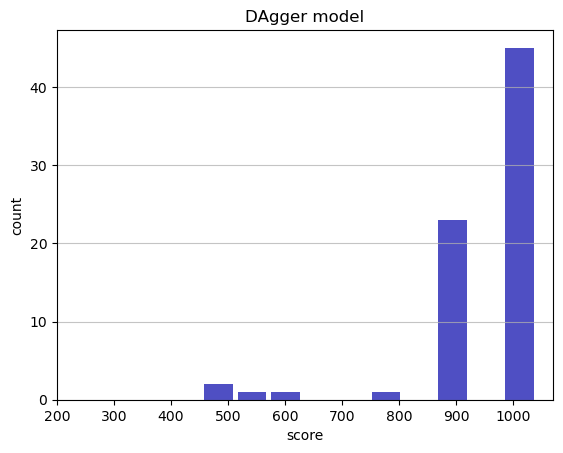

Track generation: 1157..1456 -> 299-tiles track
Epoch: 74
DAgger	mean: 951.87	variance: 122.52


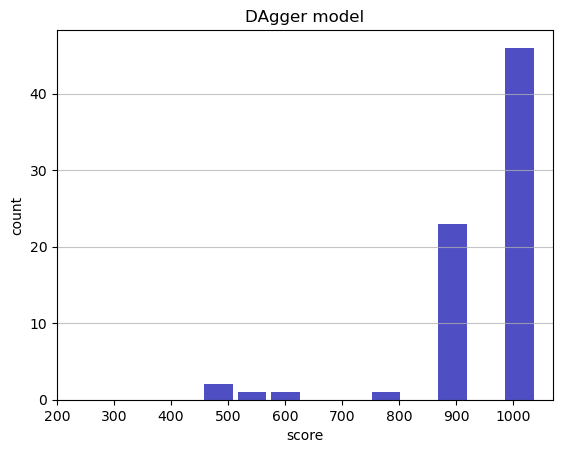

Track generation: 1220..1529 -> 309-tiles track
Epoch: 75
DAgger	mean: 952.89	variance: 122.01


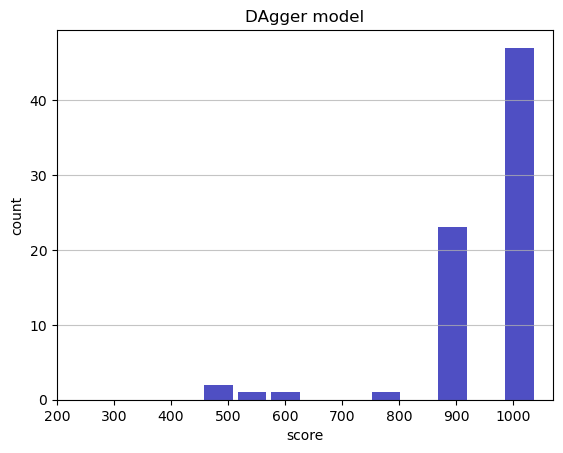

Track generation: 1230..1542 -> 312-tiles track
Epoch: 76
DAgger	mean: 953.75	variance: 121.44


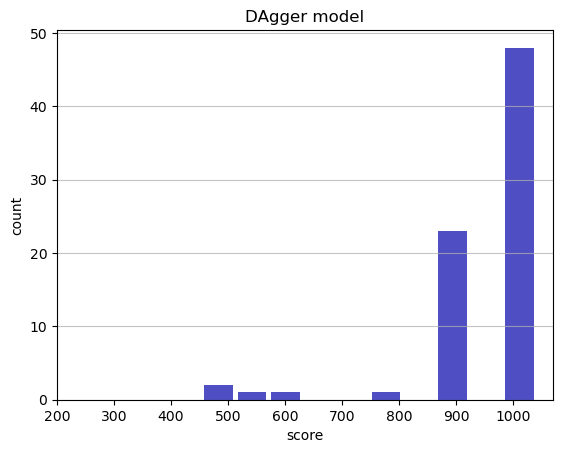

Track generation: 1225..1536 -> 311-tiles track
Epoch: 77
DAgger	mean: 953.09	variance: 120.78


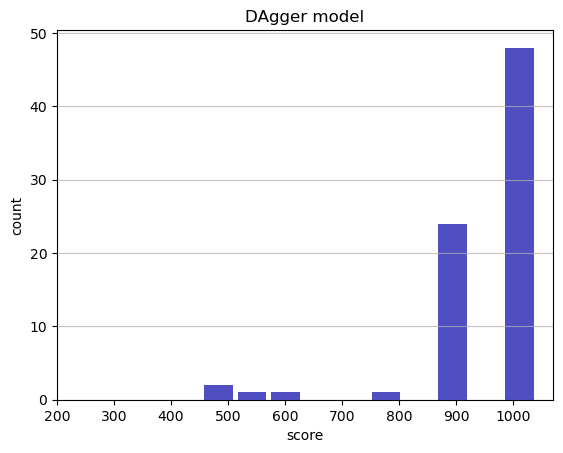

Track generation: 1039..1303 -> 264-tiles track
Epoch: 78
DAgger	mean: 954.14	variance: 120.36


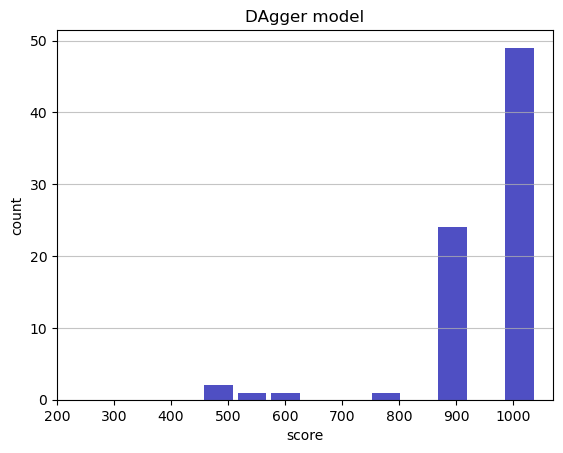

Track generation: 1337..1675 -> 338-tiles track
Epoch: 79
DAgger	mean: 954.79	variance: 119.74


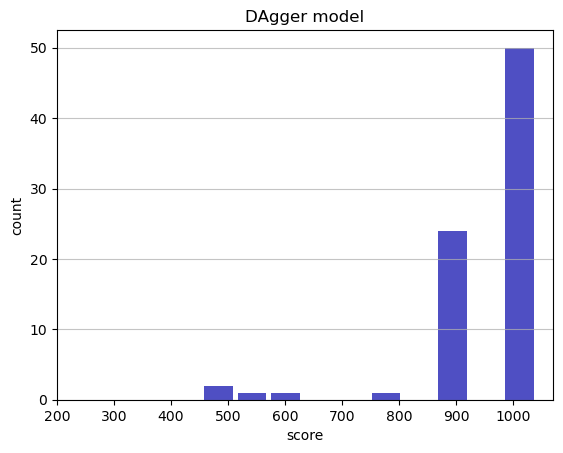

Track generation: 995..1254 -> 259-tiles track
Epoch: 80
DAgger	mean: 954.20	variance: 119.10


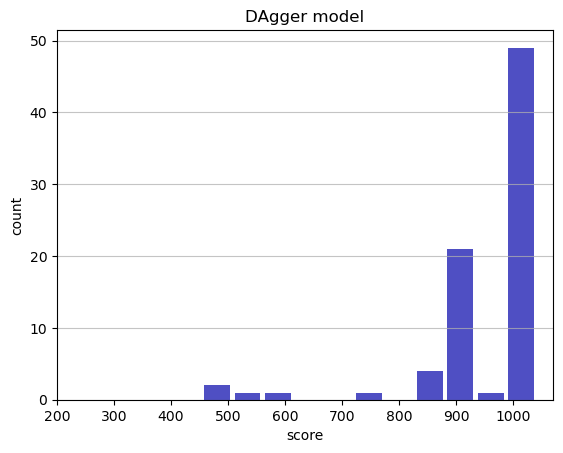

Track generation: 1260..1579 -> 319-tiles track
Epoch: 81
DAgger	mean: 953.51	variance: 118.53


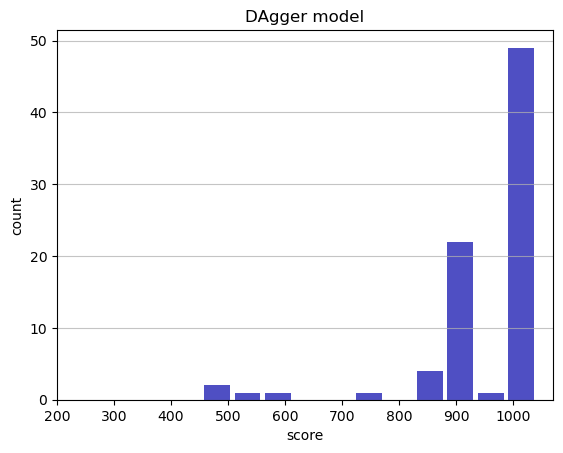

Track generation: 1111..1393 -> 282-tiles track
Epoch: 82
DAgger	mean: 952.90	variance: 117.93


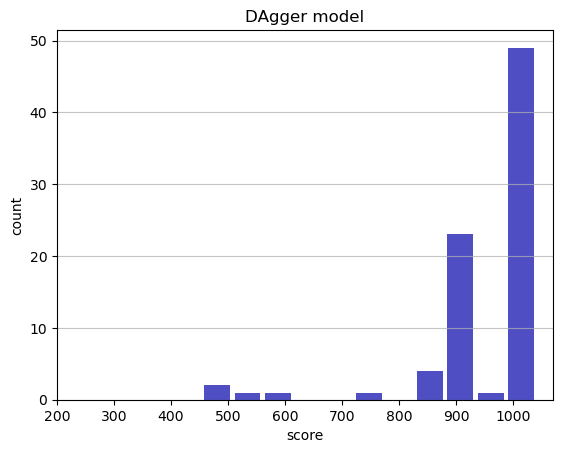

Track generation: 1236..1549 -> 313-tiles track
Epoch: 83
DAgger	mean: 953.69	variance: 117.44


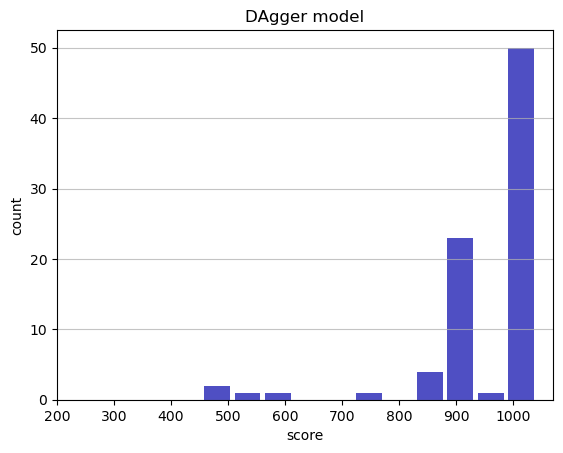

Track generation: 1265..1586 -> 321-tiles track
Epoch: 84
DAgger	mean: 954.48	variance: 116.96


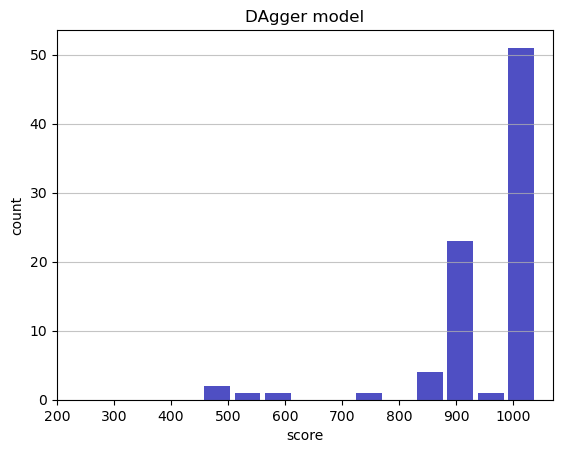

Track generation: 1338..1676 -> 338-tiles track
Epoch: 85
DAgger	mean: 955.09	variance: 116.40


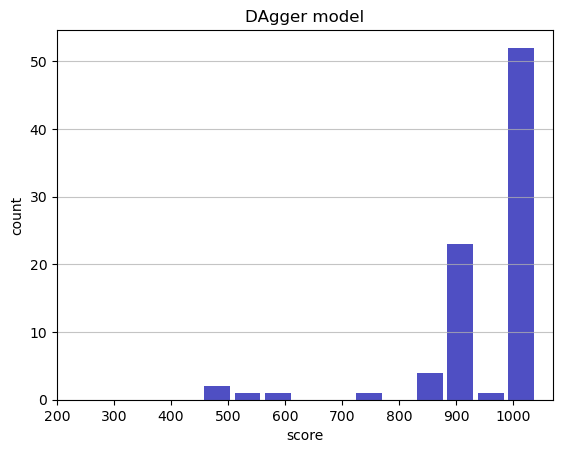

Track generation: 967..1220 -> 253-tiles track
Epoch: 86
DAgger	mean: 956.08	variance: 116.09


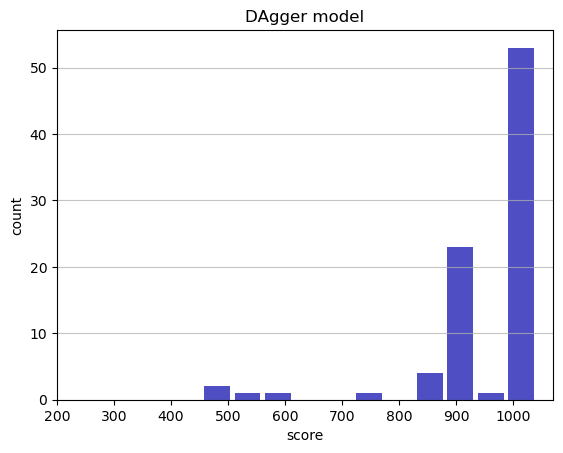

Track generation: 1195..1497 -> 302-tiles track
Epoch: 87
DAgger	mean: 956.88	variance: 115.65


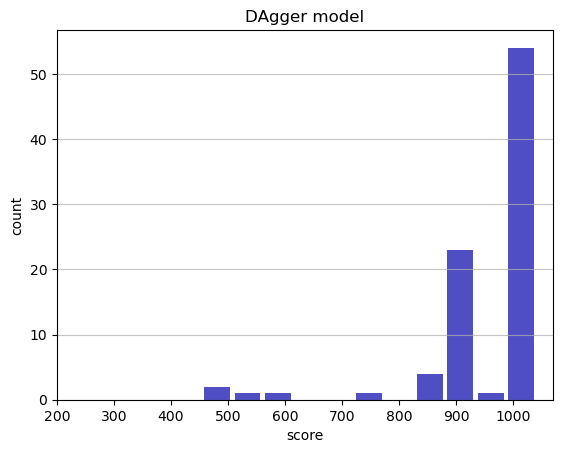

Track generation: 1207..1513 -> 306-tiles track
Epoch: 88
DAgger	mean: 957.60	variance: 115.19


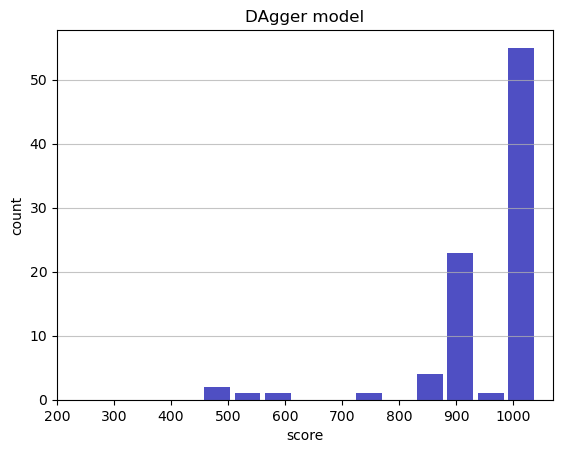

Track generation: 1206..1511 -> 305-tiles track
Epoch: 89
DAgger	mean: 958.35	variance: 114.76


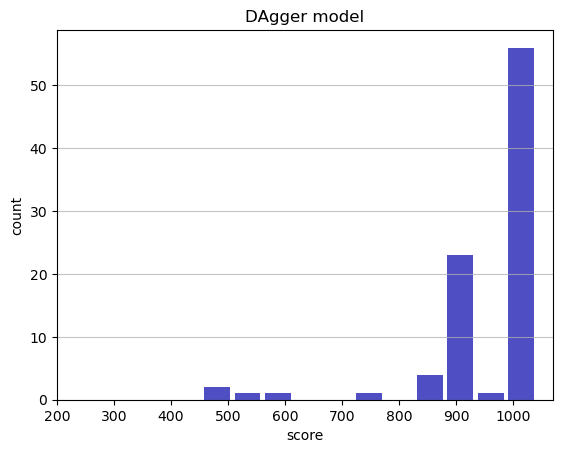

Track generation: 1235..1548 -> 313-tiles track
Epoch: 90
DAgger	mean: 957.58	variance: 114.35


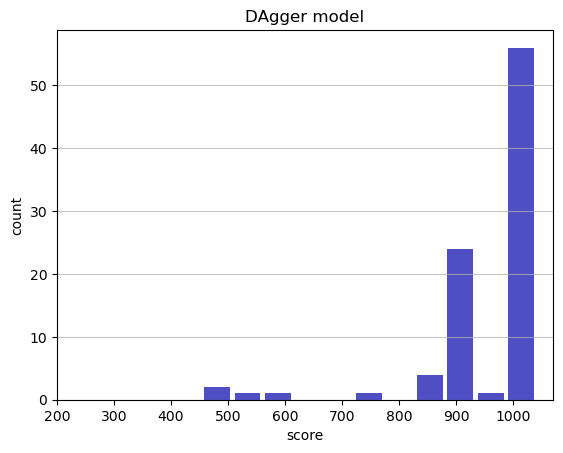

Track generation: 1099..1378 -> 279-tiles track
Epoch: 91
DAgger	mean: 952.51	variance: 123.45


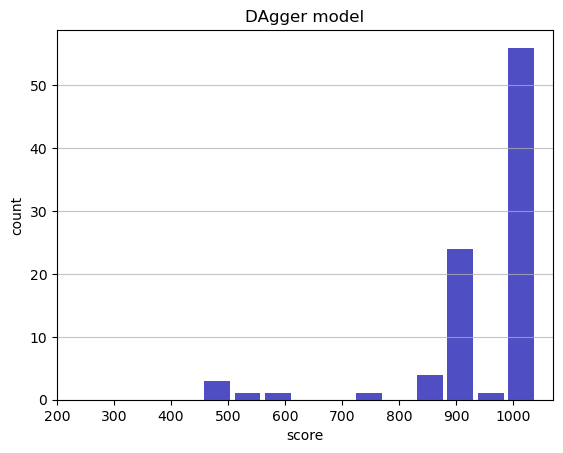

Track generation: 1299..1628 -> 329-tiles track
Epoch: 92
DAgger	mean: 951.90	variance: 122.92


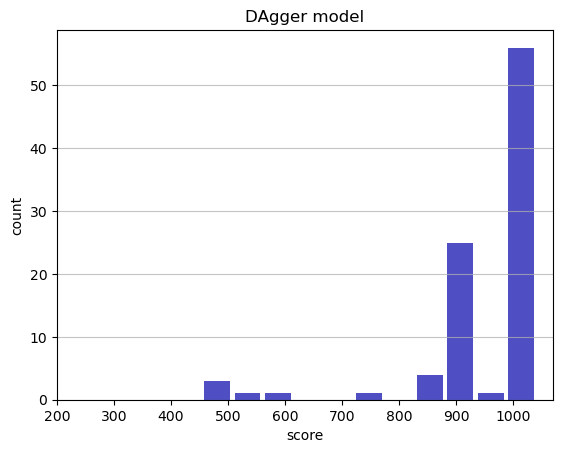

Track generation: 1096..1374 -> 278-tiles track
Epoch: 93
DAgger	mean: 951.51	variance: 122.32


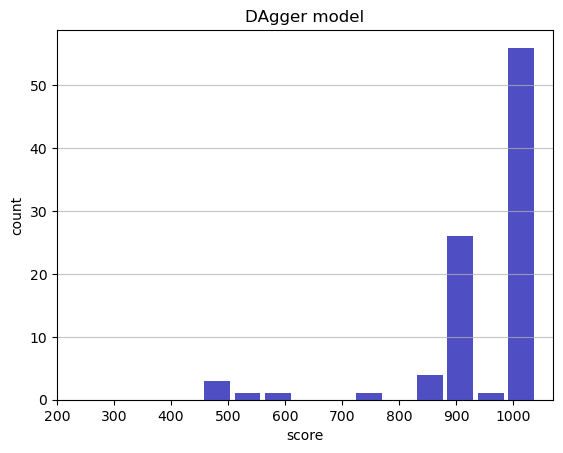

Track generation: 1156..1449 -> 293-tiles track
Epoch: 94
DAgger	mean: 951.05	variance: 121.74


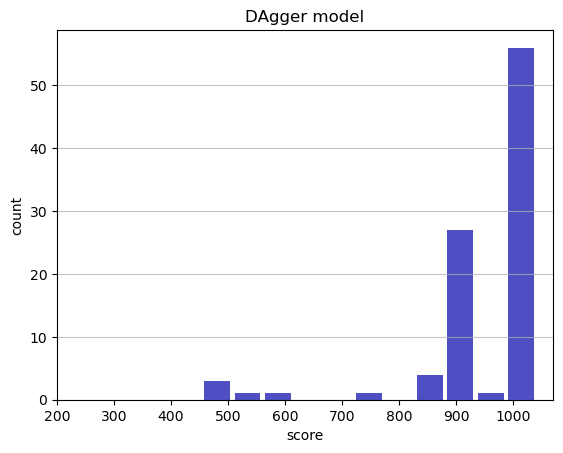

Track generation: 1201..1505 -> 304-tiles track
Epoch: 95
DAgger	mean: 951.82	variance: 121.33


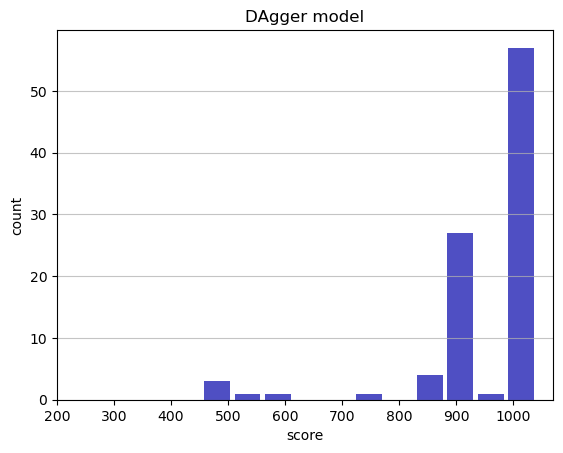

Track generation: 1122..1414 -> 292-tiles track
Epoch: 96
DAgger	mean: 951.29	variance: 120.80


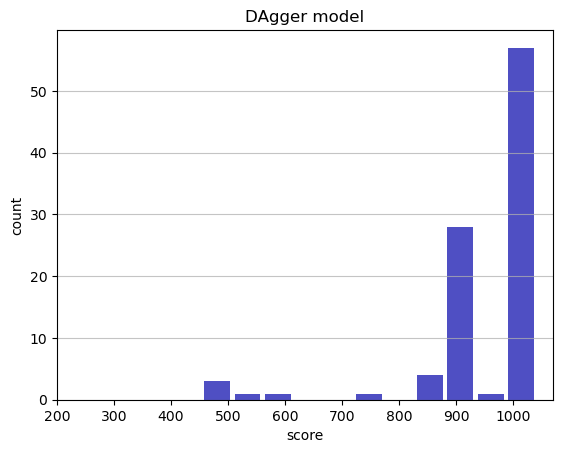

Track generation: 1225..1535 -> 310-tiles track
Epoch: 97
DAgger	mean: 951.98	variance: 120.36


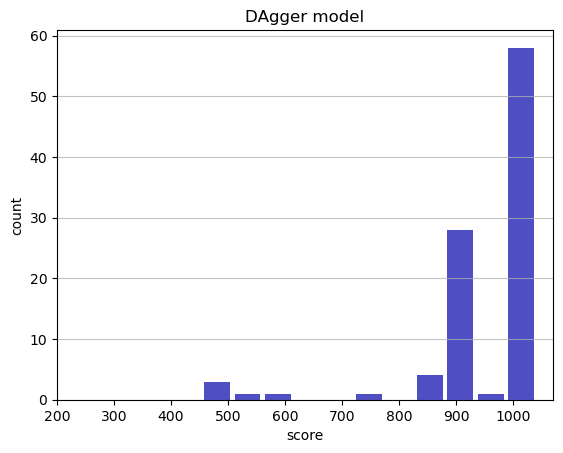

Track generation: 1041..1305 -> 264-tiles track
Epoch: 98
DAgger	mean: 952.79	variance: 120.01


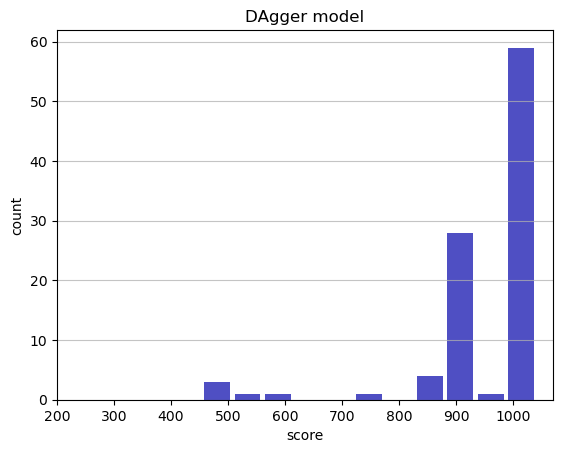

Track generation: 1171..1468 -> 297-tiles track
Epoch: 99
DAgger	mean: 953.54	variance: 119.64


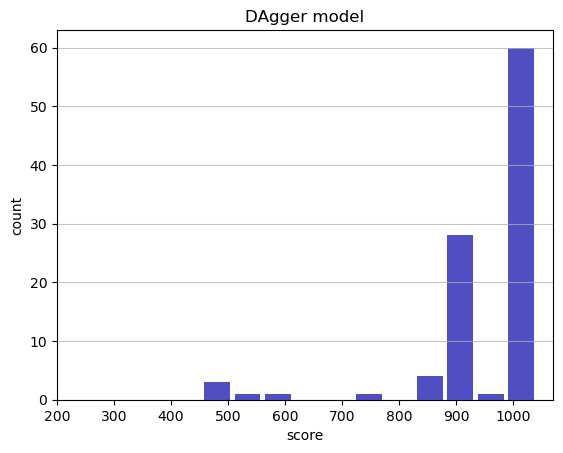

Track generation: 1219..1528 -> 309-tiles track
Epoch: 100
DAgger	mean: 954.26	variance: 119.26


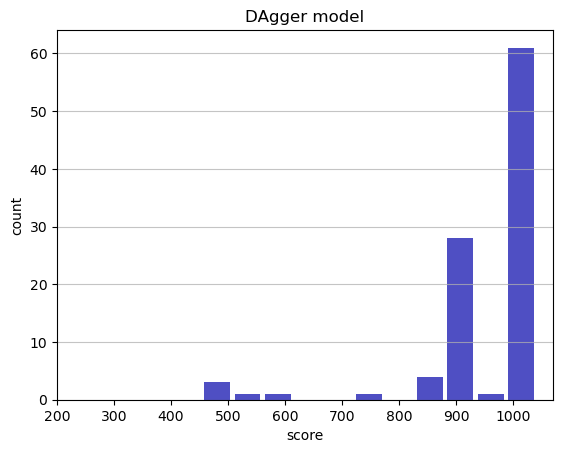

Track generation: 991..1243 -> 252-tiles track
Epoch: 101
DAgger	mean: 955.06	variance: 118.93


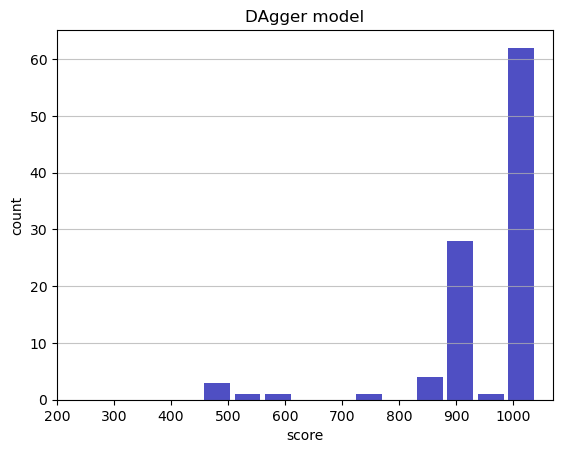

Track generation: 1140..1432 -> 292-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1283..1608 -> 325-tiles track
Epoch: 102
DAgger	mean: 955.29	variance: 118.37


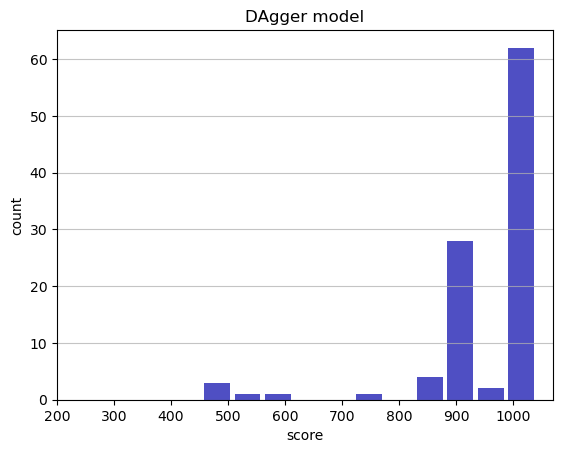

Track generation: 1235..1548 -> 313-tiles track
Epoch: 103
DAgger	mean: 955.91	variance: 117.96


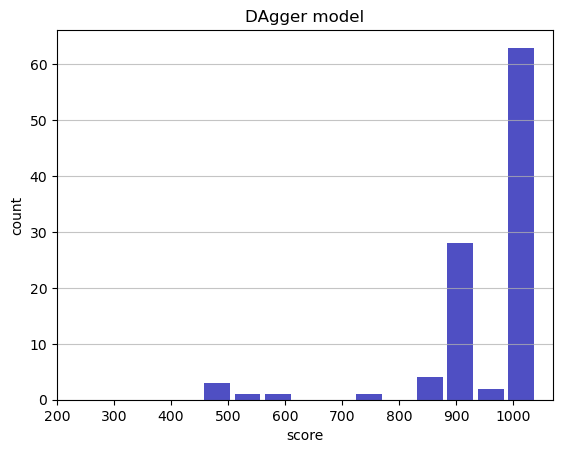

Track generation: 1080..1354 -> 274-tiles track
Epoch: 104
DAgger	mean: 956.69	variance: 117.66


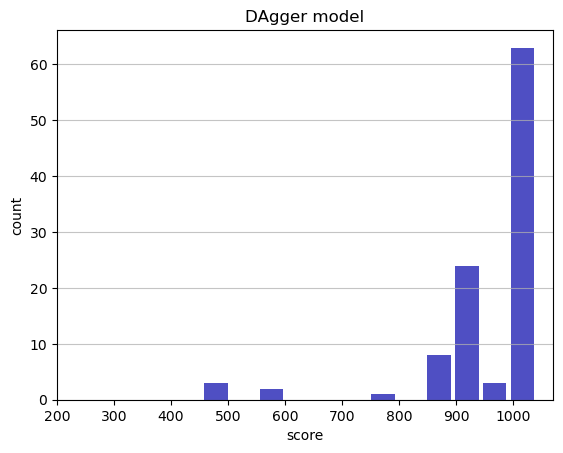

Track generation: 1222..1532 -> 310-tiles track
Epoch: 105
DAgger	mean: 957.33	variance: 117.28


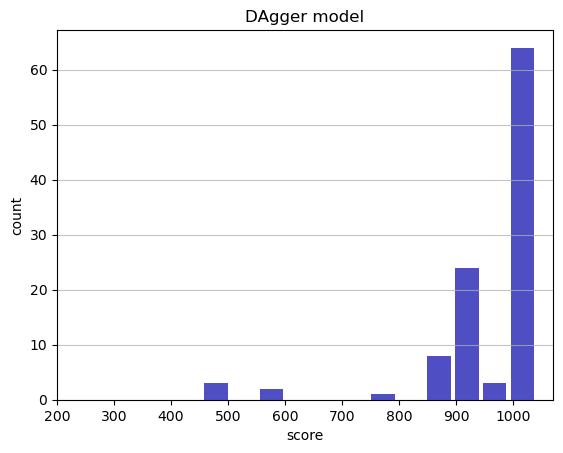

Track generation: 1116..1407 -> 291-tiles track
Epoch: 106
DAgger	mean: 952.43	variance: 127.06


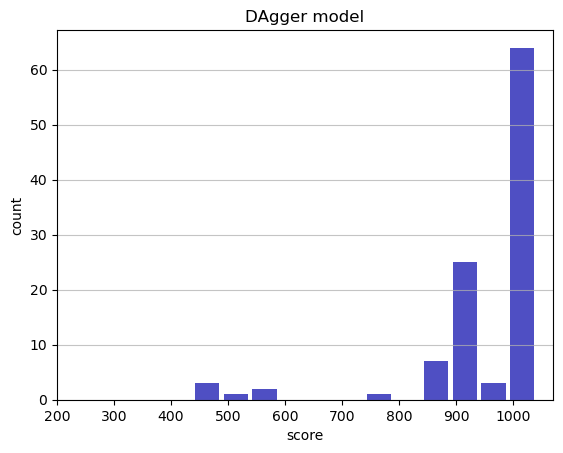

Track generation: 1235..1548 -> 313-tiles track
Epoch: 107
DAgger	mean: 951.52	variance: 126.81


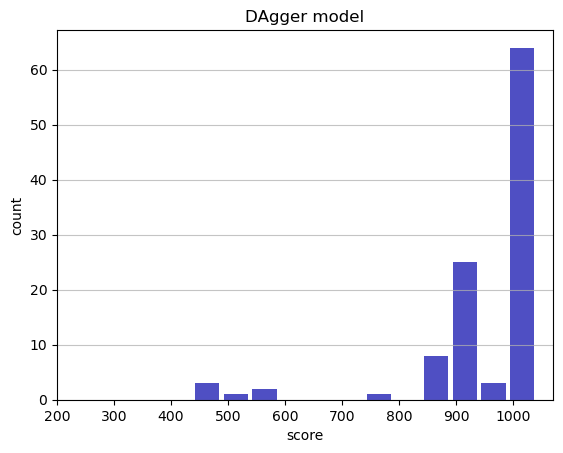

Track generation: 1108..1389 -> 281-tiles track
Epoch: 108
DAgger	mean: 951.00	variance: 126.33


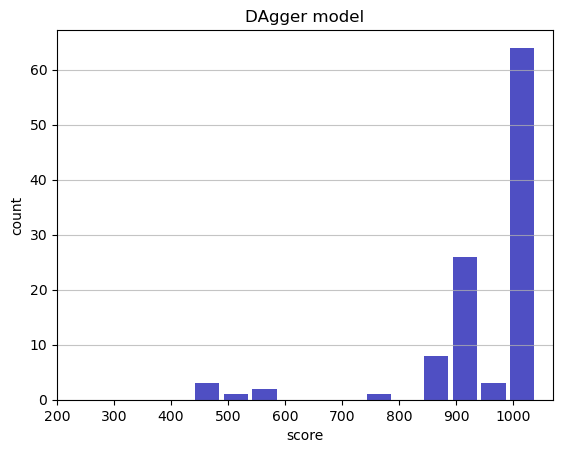

Track generation: 1187..1487 -> 300-tiles track
Epoch: 109
DAgger	mean: 951.64	variance: 125.92


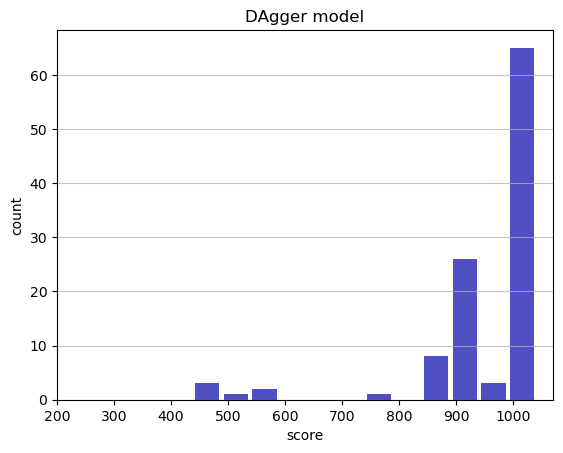

Track generation: 1191..1493 -> 302-tiles track
Epoch: 110
DAgger	mean: 952.29	variance: 125.54


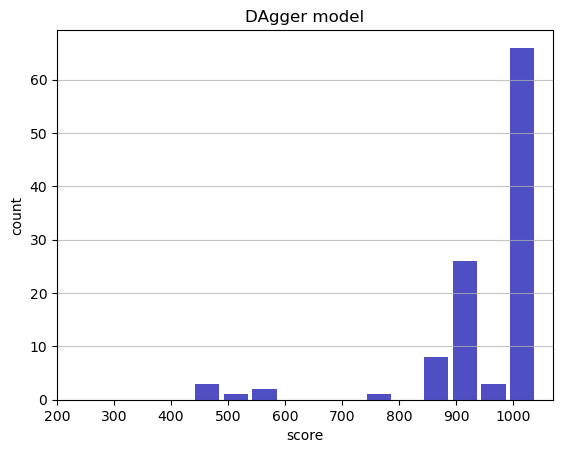

Track generation: 1110..1391 -> 281-tiles track
Epoch: 111
DAgger	mean: 951.81	variance: 125.07


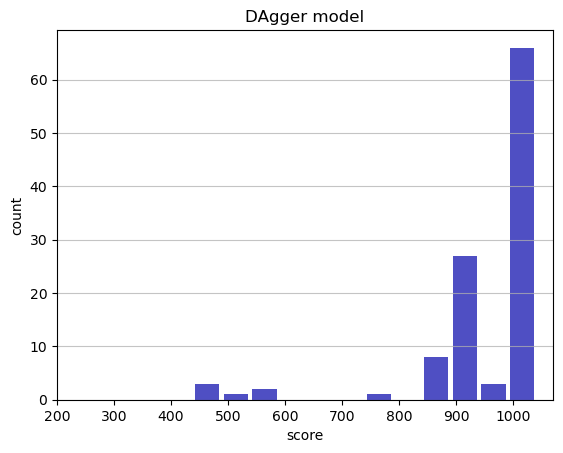

Track generation: 1376..1724 -> 348-tiles track
Epoch: 112
DAgger	mean: 952.30	variance: 124.62


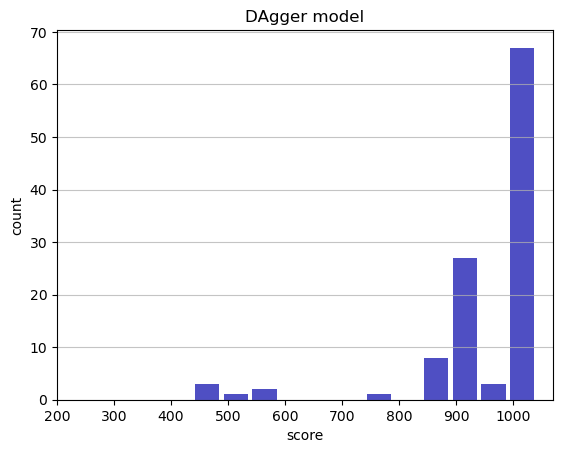

Track generation: 1132..1427 -> 295-tiles track
Epoch: 113
DAgger	mean: 952.93	variance: 124.24


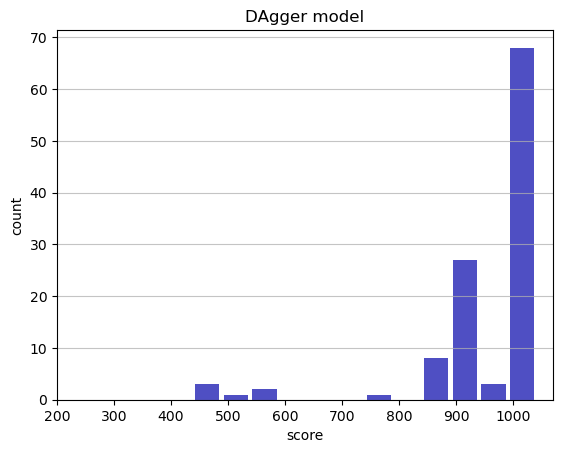

Track generation: 1126..1412 -> 286-tiles track
Epoch: 114
DAgger	mean: 953.57	variance: 123.88


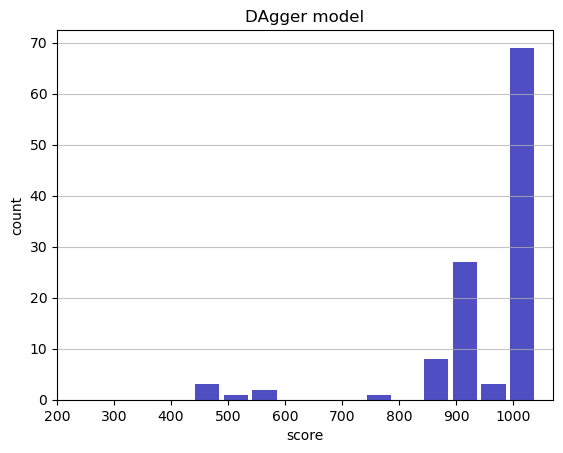

Track generation: 1047..1317 -> 270-tiles track
Epoch: 115
DAgger	mean: 953.13	variance: 123.43


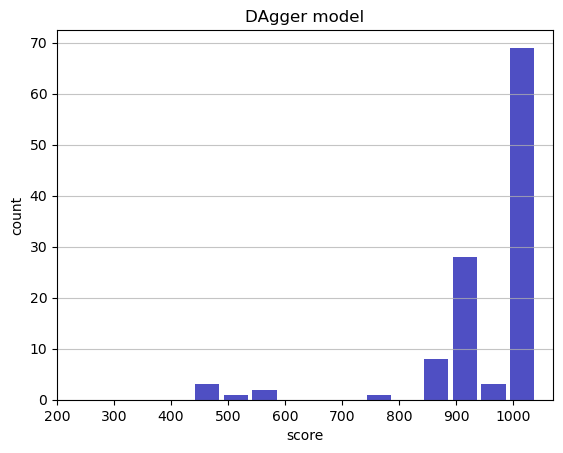

Track generation: 984..1234 -> 250-tiles track
Epoch: 116
DAgger	mean: 953.88	variance: 123.16


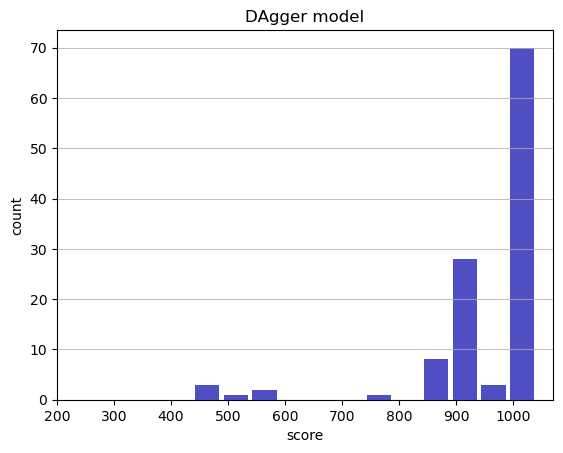

Track generation: 1115..1398 -> 283-tiles track
Epoch: 117
DAgger	mean: 953.35	variance: 122.76


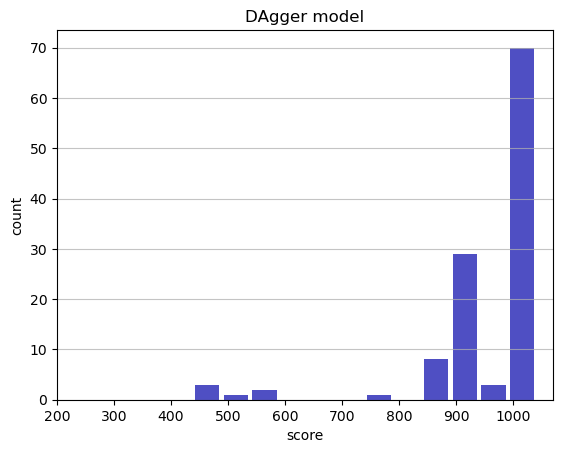

Track generation: 1160..1454 -> 294-tiles track
Epoch: 118
DAgger	mean: 953.95	variance: 122.41


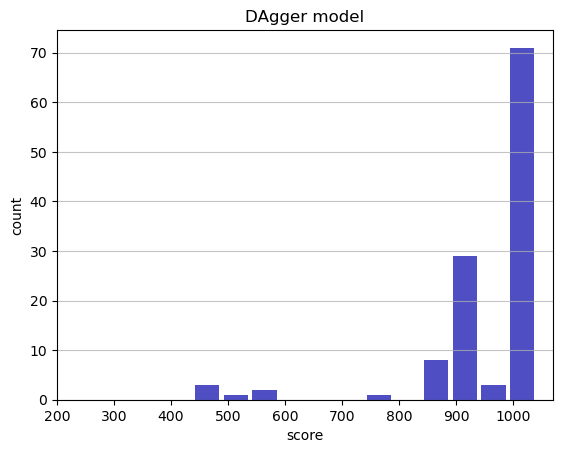

Track generation: 1179..1478 -> 299-tiles track
Epoch: 119
DAgger	mean: 954.55	variance: 122.07


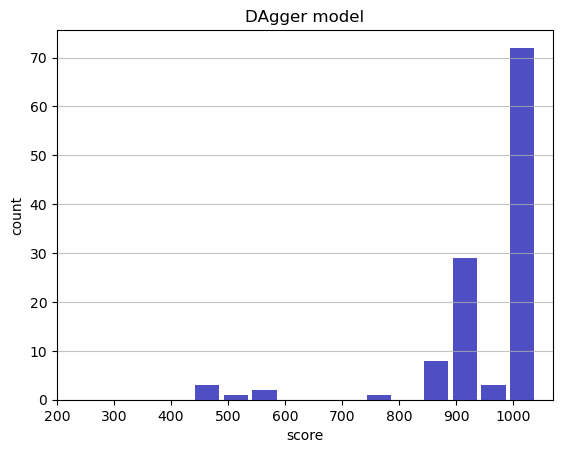

Track generation: 1430..1791 -> 361-tiles track
Epoch: 120
DAgger	mean: 954.69	variance: 121.57


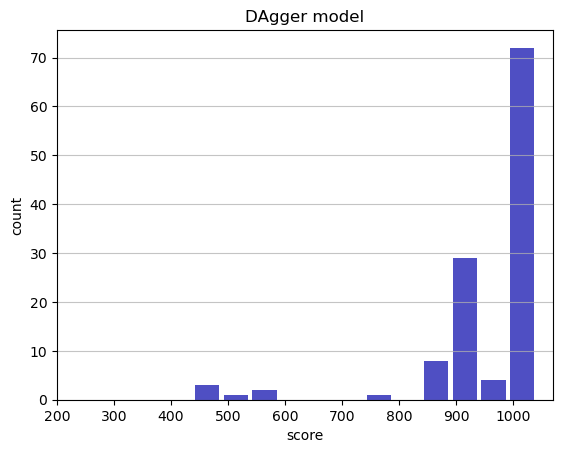

Track generation: 1146..1445 -> 299-tiles track
Epoch: 121
DAgger	mean: 954.04	variance: 121.28


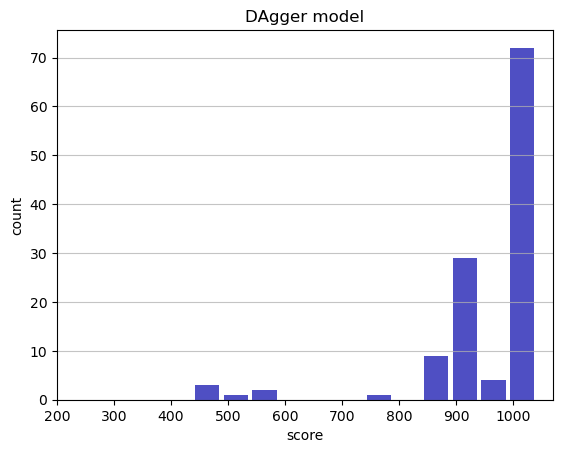

Track generation: 1136..1424 -> 288-tiles track
Epoch: 122
DAgger	mean: 954.65	variance: 120.97


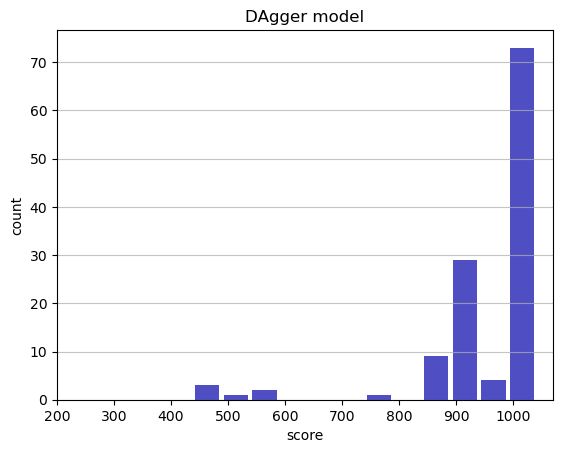

Track generation: 1249..1566 -> 317-tiles track
Epoch: 123
DAgger	mean: 949.45	variance: 133.44


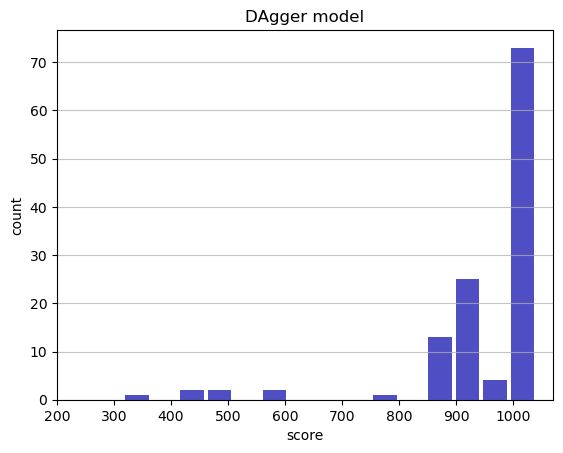

Track generation: 1174..1471 -> 297-tiles track
Epoch: 124
DAgger	mean: 950.04	variance: 133.06


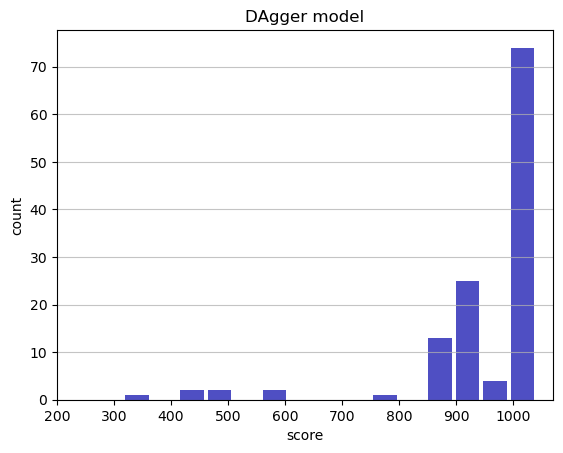

Track generation: 1007..1263 -> 256-tiles track
Epoch: 125
DAgger	mean: 949.69	variance: 132.58


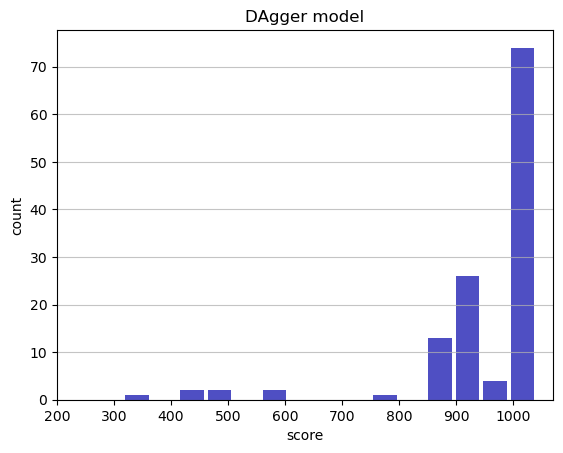

Track generation: 1048..1323 -> 275-tiles track
Epoch: 126
DAgger	mean: 950.31	variance: 132.24


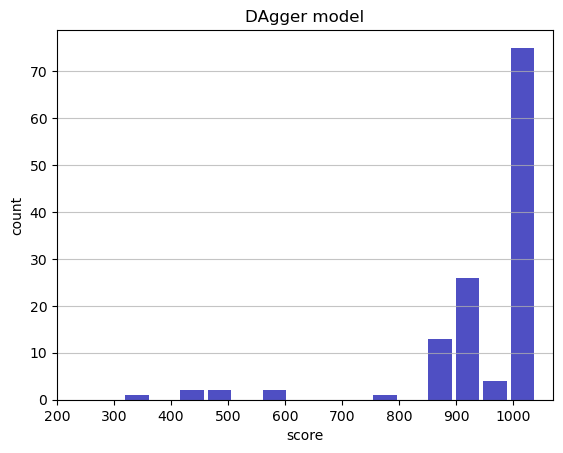

Track generation: 1195..1498 -> 303-tiles track
Epoch: 127
DAgger	mean: 950.86	variance: 131.86


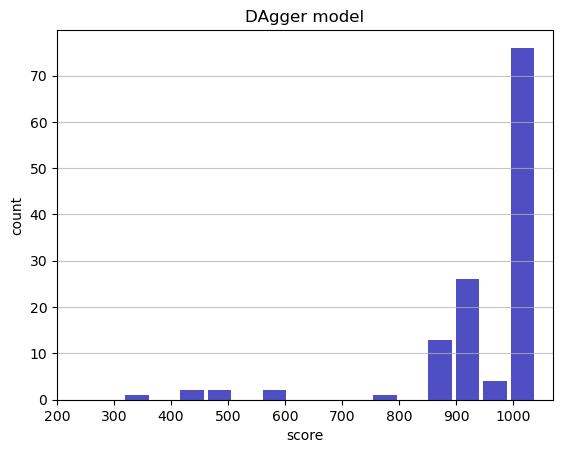

Track generation: 1176..1474 -> 298-tiles track
Epoch: 128
DAgger	mean: 951.41	variance: 131.49


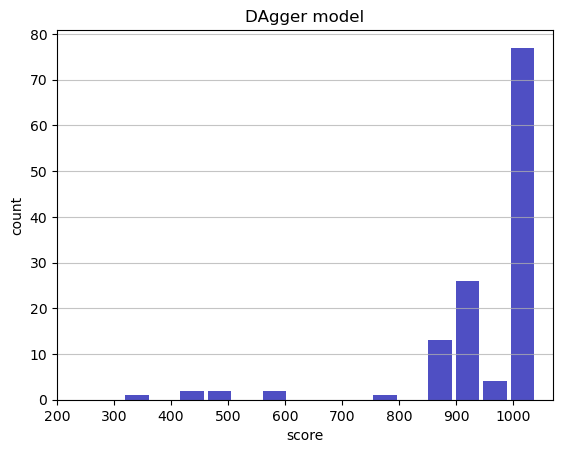

Track generation: 989..1241 -> 252-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1194..1503 -> 309-tiles track
Epoch: 129
DAgger	mean: 951.93	variance: 131.11


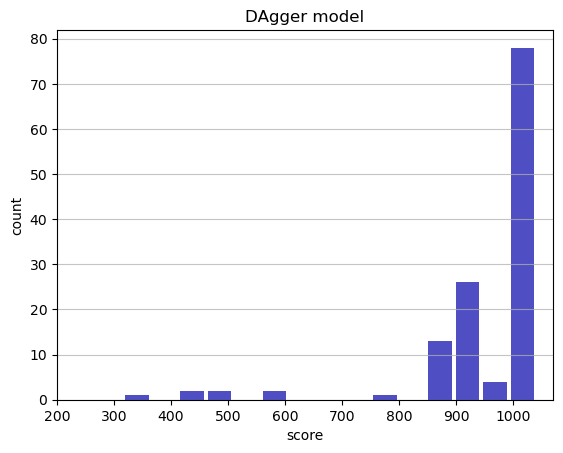

Track generation: 1130..1426 -> 296-tiles track
Epoch: 130
DAgger	mean: 952.45	variance: 130.74


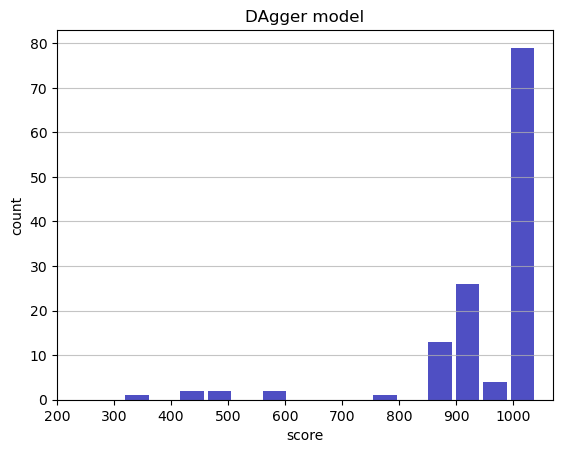

Track generation: 1056..1325 -> 269-tiles track
Epoch: 131
DAgger	mean: 953.06	variance: 130.43


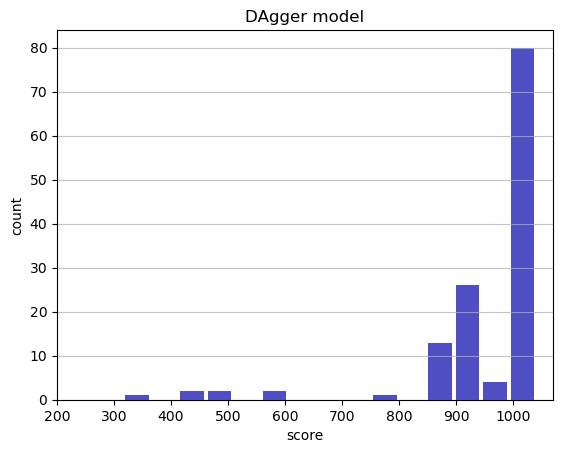

Track generation: 1124..1409 -> 285-tiles track
Epoch: 132
DAgger	mean: 953.65	variance: 130.11


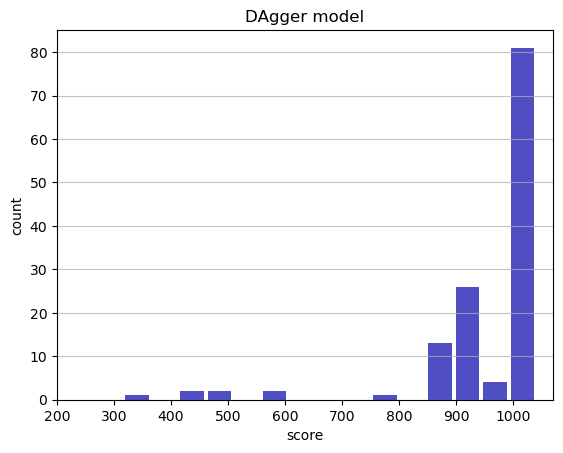

Track generation: 1150..1442 -> 292-tiles track
Epoch: 133
DAgger	mean: 954.18	variance: 129.76


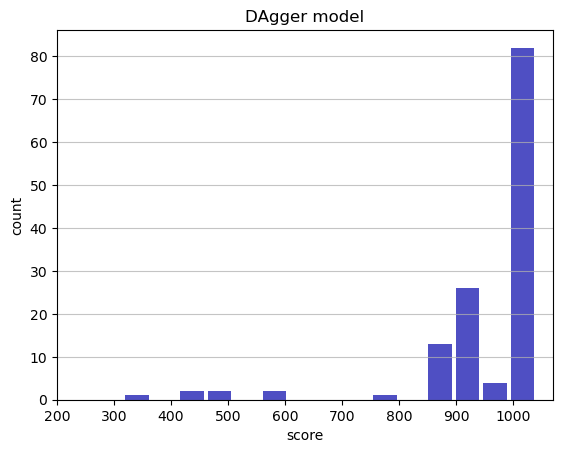

Track generation: 1149..1450 -> 301-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1266..1586 -> 320-tiles track
Epoch: 134
DAgger	mean: 954.62	variance: 129.38


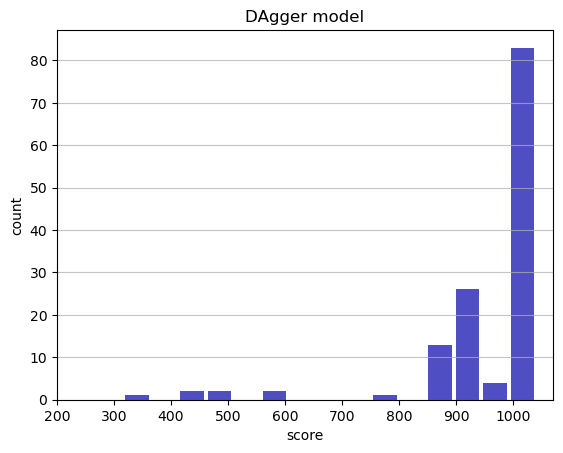

Track generation: 1152..1444 -> 292-tiles track
Epoch: 135
DAgger	mean: 955.19	variance: 129.06


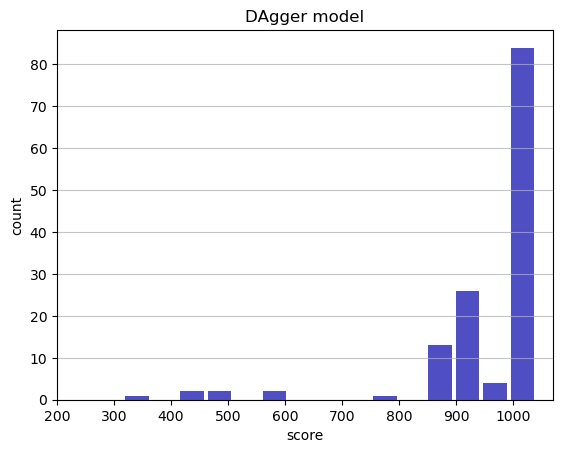

Track generation: 1020..1289 -> 269-tiles track
Epoch: 136
DAgger	mean: 954.82	variance: 128.66


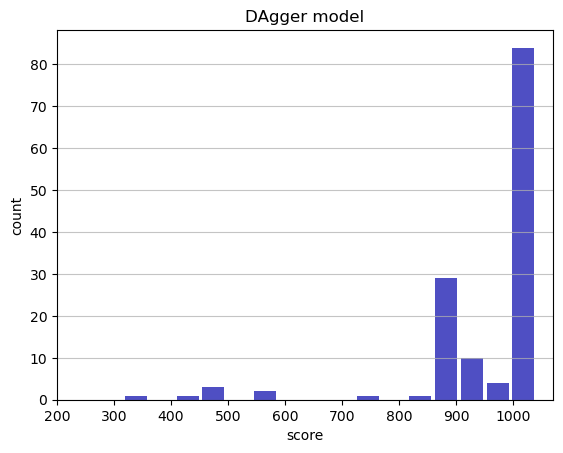

Track generation: 1241..1565 -> 324-tiles track
Epoch: 137
DAgger	mean: 955.25	variance: 128.29


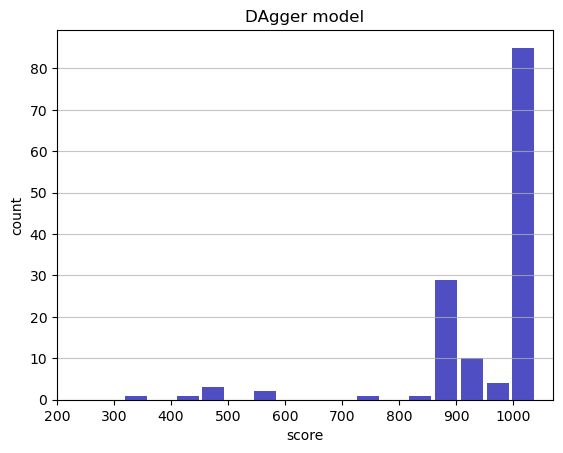

Track generation: 1024..1284 -> 260-tiles track
Epoch: 138
DAgger	mean: 955.85	variance: 128.01


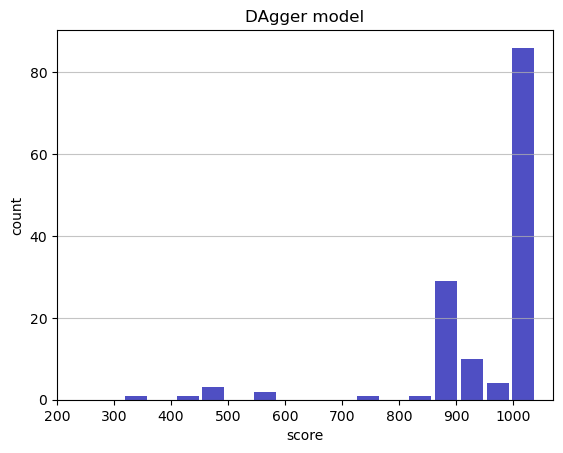

Track generation: 1005..1265 -> 260-tiles track
Epoch: 139
DAgger	mean: 955.59	variance: 127.58


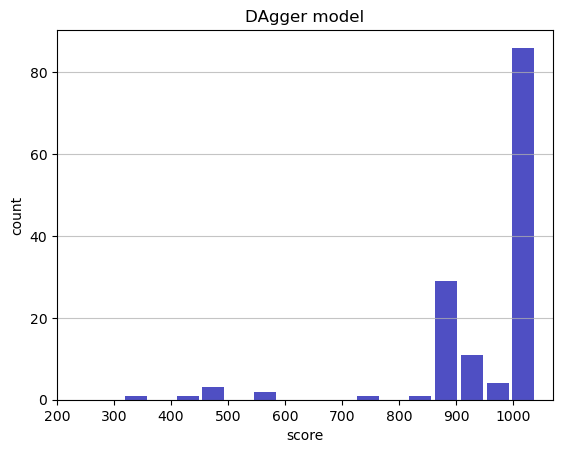

Track generation: 1305..1635 -> 330-tiles track
Epoch: 140
DAgger	mean: 956.05	variance: 127.24


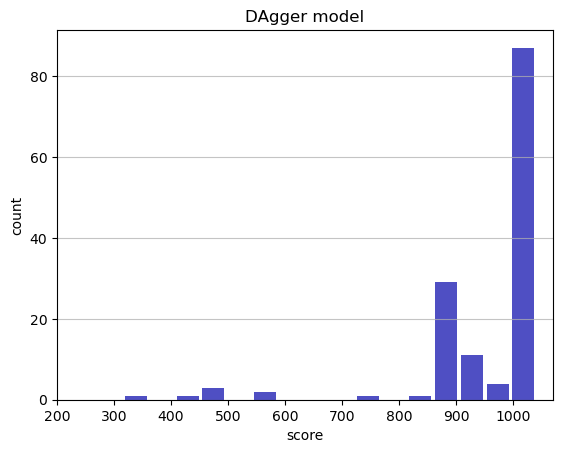

Track generation: 1260..1579 -> 319-tiles track
Epoch: 141
DAgger	mean: 955.44	variance: 126.99


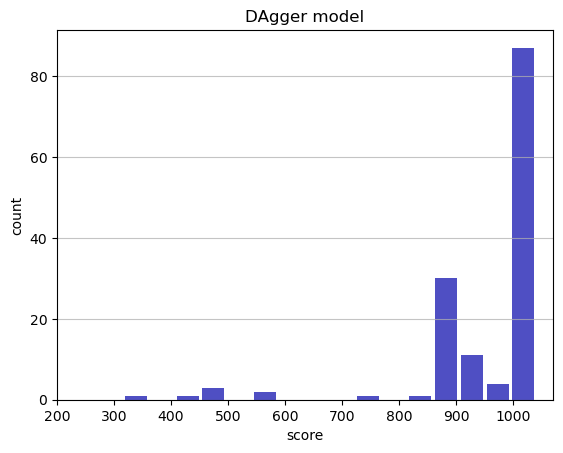

Track generation: 1024..1292 -> 268-tiles track
Epoch: 142
DAgger	mean: 955.16	variance: 126.59


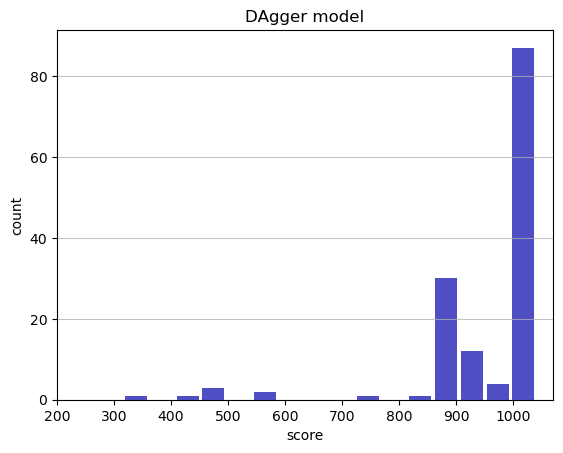

Track generation: 1132..1426 -> 294-tiles track
Epoch: 143
DAgger	mean: 951.68	variance: 132.81


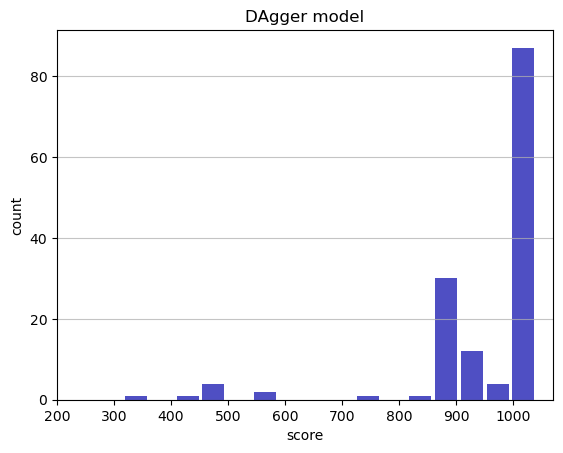

Track generation: 1204..1509 -> 305-tiles track
Epoch: 144
DAgger	mean: 952.18	variance: 132.49


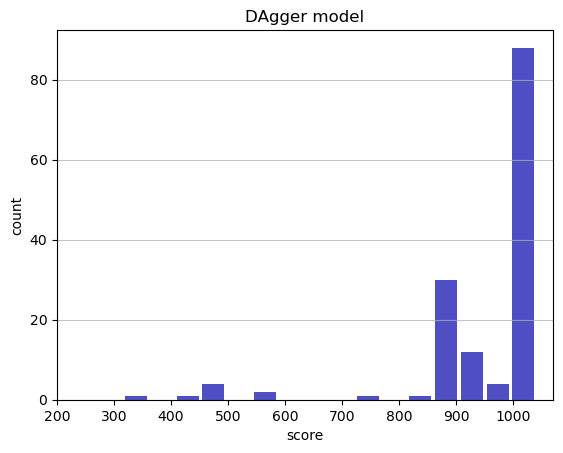

Track generation: 1252..1569 -> 317-tiles track
Epoch: 145
DAgger	mean: 951.79	variance: 132.11


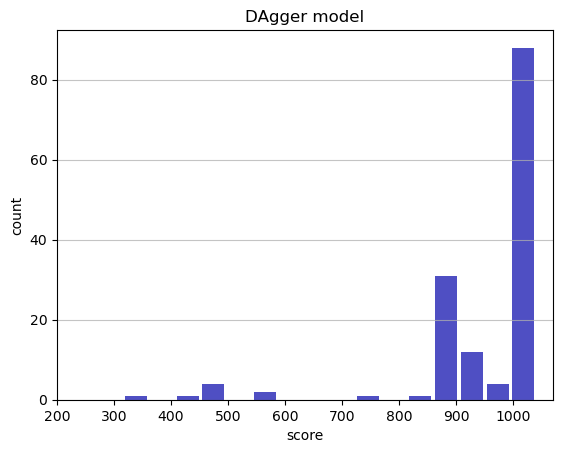

Track generation: 1280..1604 -> 324-tiles track
Epoch: 146
DAgger	mean: 952.22	variance: 131.76


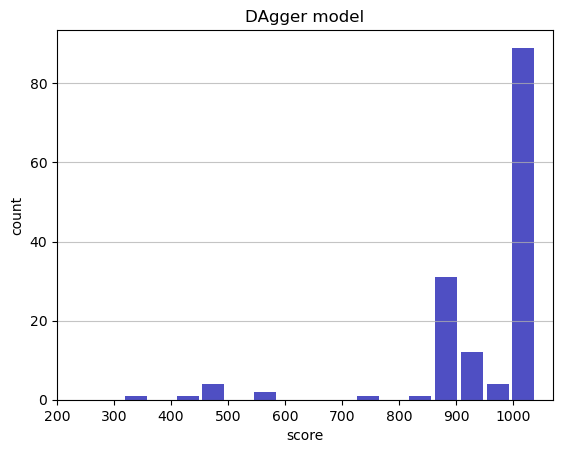

Track generation: 1205..1510 -> 305-tiles track
Epoch: 147
DAgger	mean: 952.72	variance: 131.45


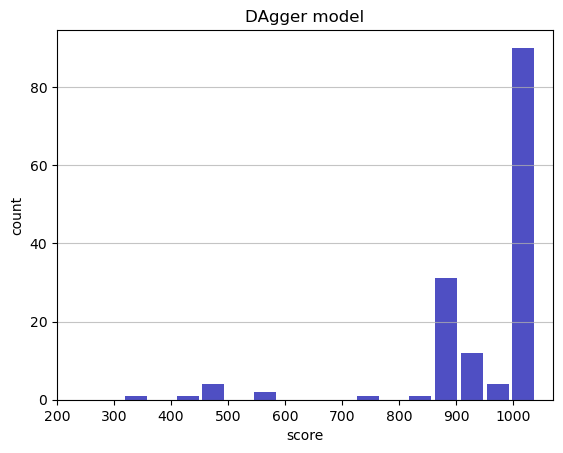

Track generation: 1275..1598 -> 323-tiles track
Epoch: 148
DAgger	mean: 947.68	variance: 144.59


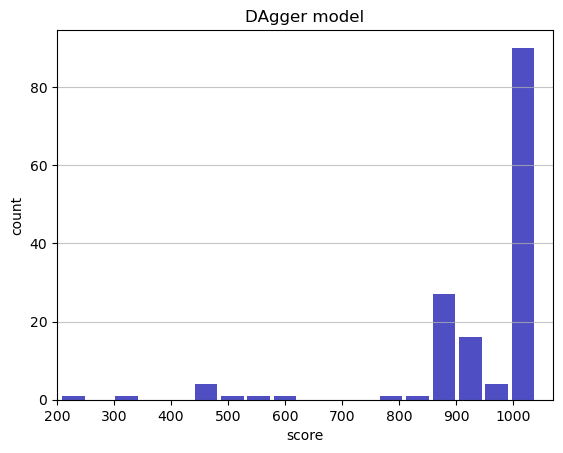

Track generation: 969..1215 -> 246-tiles track
Epoch: 149
DAgger	mean: 947.23	variance: 144.20


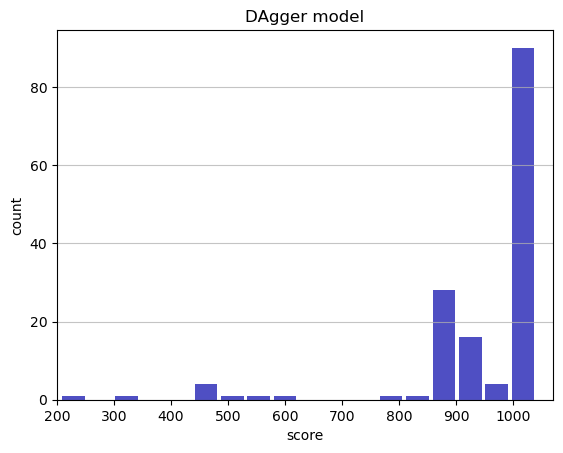

Track generation: 1200..1504 -> 304-tiles track
Epoch: 150
DAgger	mean: 947.74	variance: 143.86


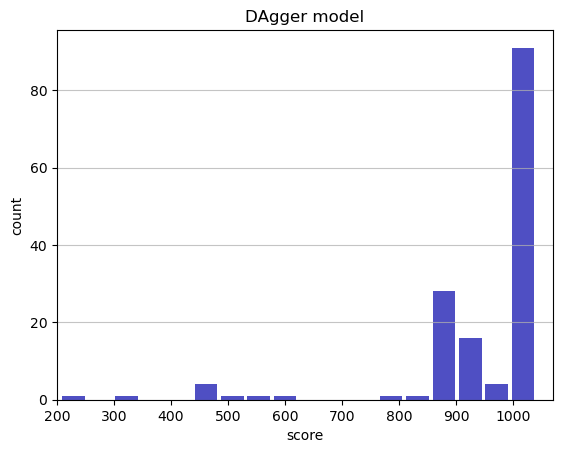

Track generation: 1164..1459 -> 295-tiles track
Epoch: 151
DAgger	mean: 948.22	variance: 143.50


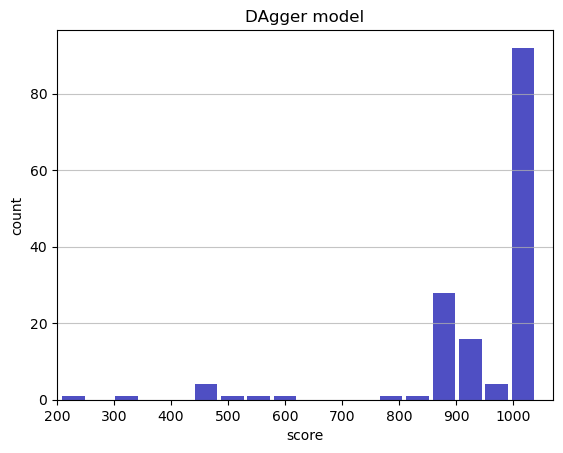

Track generation: 1220..1529 -> 309-tiles track
Epoch: 152
DAgger	mean: 948.73	variance: 143.16


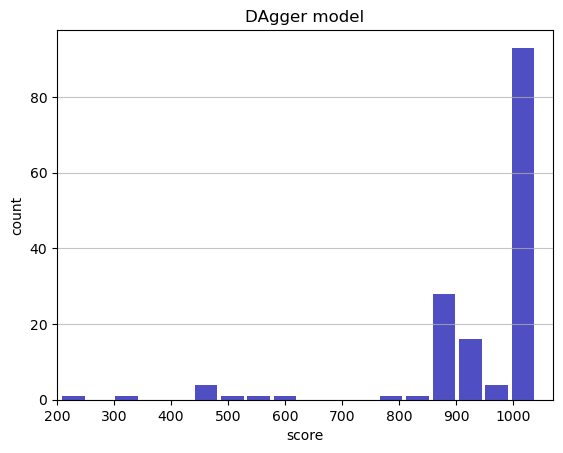

Track generation: 1103..1382 -> 279-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1028..1289 -> 261-tiles track
Epoch: 153
DAgger	mean: 949.30	variance: 142.87


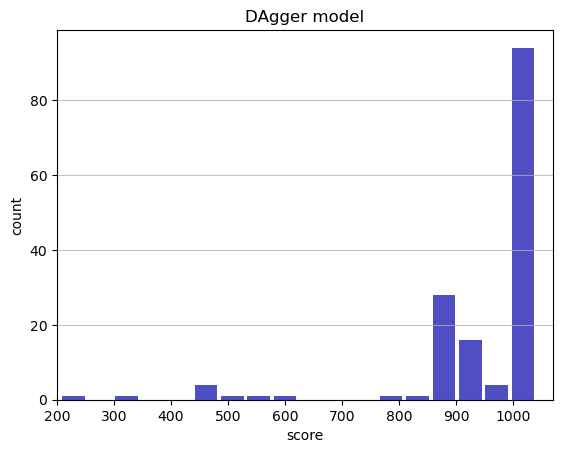

Track generation: 1277..1600 -> 323-tiles track
Epoch: 154
DAgger	mean: 948.95	variance: 142.47


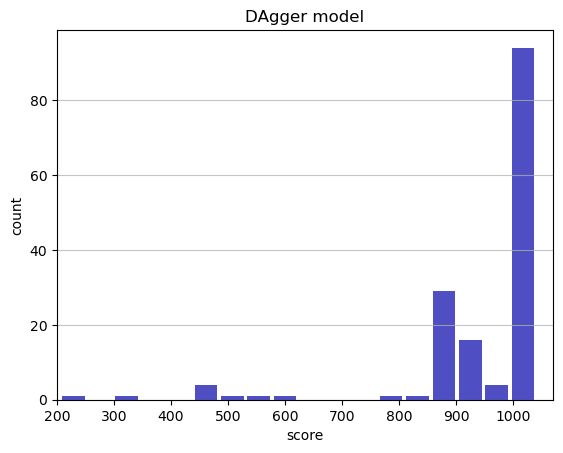

Track generation: 1051..1321 -> 270-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1163..1458 -> 295-tiles track
Epoch: 155
DAgger	mean: 949.41	variance: 142.13


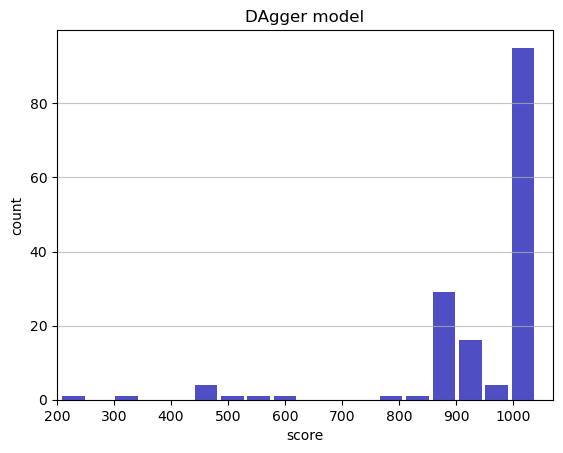

Track generation: 991..1249 -> 258-tiles track
Epoch: 156
DAgger	mean: 949.19	variance: 141.70


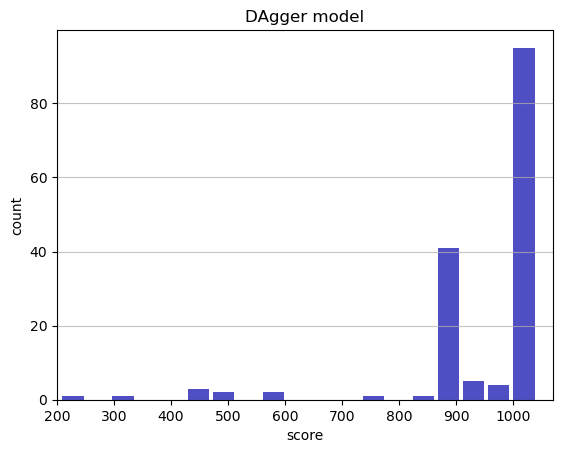

Track generation: 1119..1407 -> 288-tiles track
Epoch: 157
DAgger	mean: 949.67	variance: 141.37


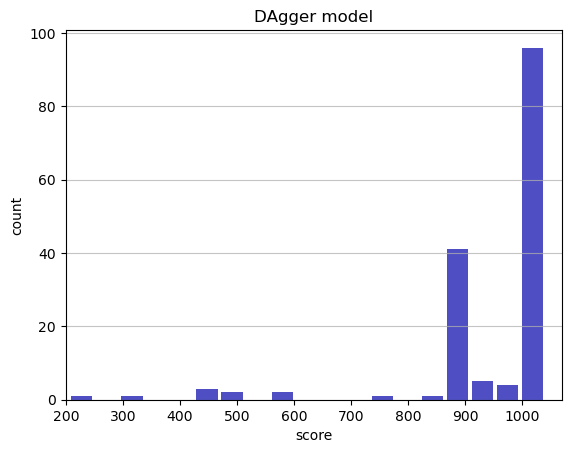

Track generation: 983..1240 -> 257-tiles track
Epoch: 158
DAgger	mean: 950.20	variance: 141.08


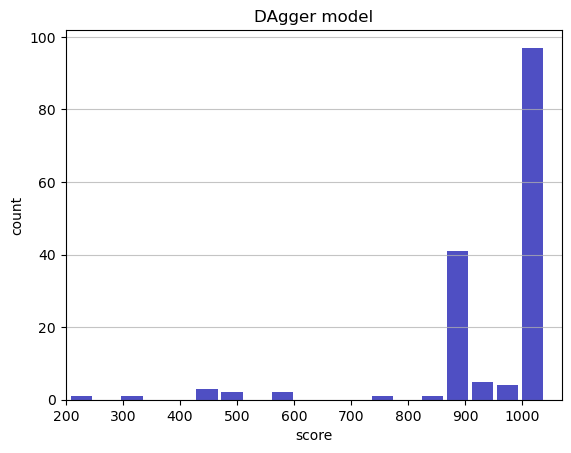

Track generation: 1025..1289 -> 264-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1107..1395 -> 288-tiles track
Epoch: 159
DAgger	mean: 950.70	variance: 140.78


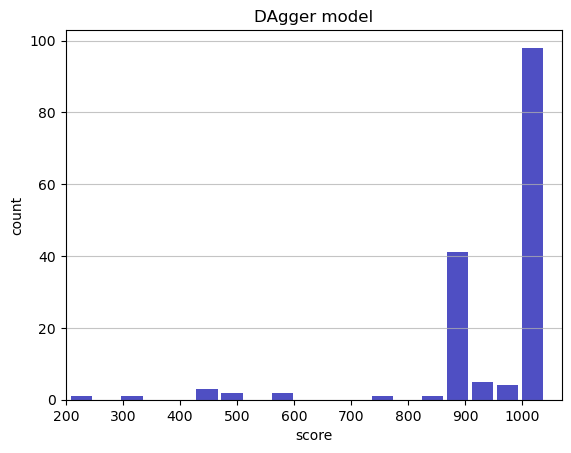

Track generation: 936..1181 -> 245-tiles track
Epoch: 160
DAgger	mean: 951.25	variance: 140.50


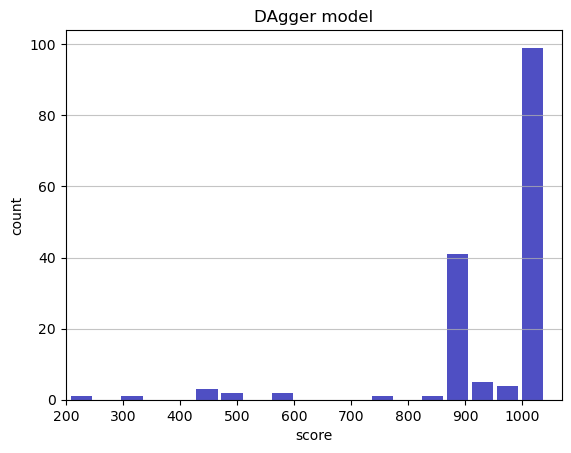

Track generation: 1228..1539 -> 311-tiles track
Epoch: 161
DAgger	mean: 950.91	variance: 140.13


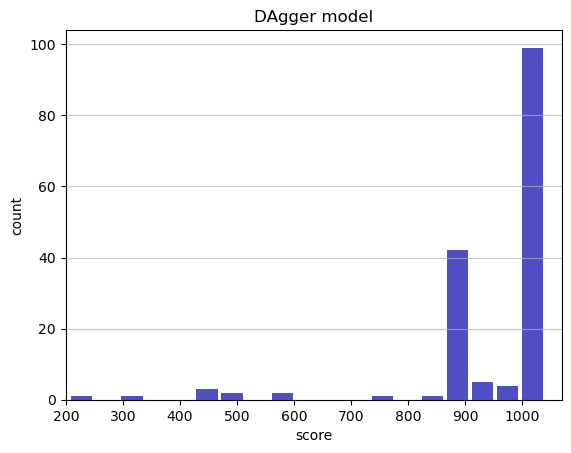

Track generation: 870..1098 -> 228-tiles track
Epoch: 162
DAgger	mean: 951.47	variance: 139.88


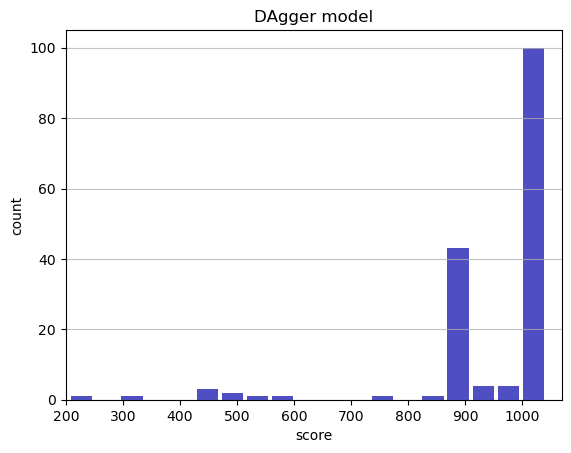

Track generation: 1076..1349 -> 273-tiles track
Epoch: 163
DAgger	mean: 951.97	variance: 139.59


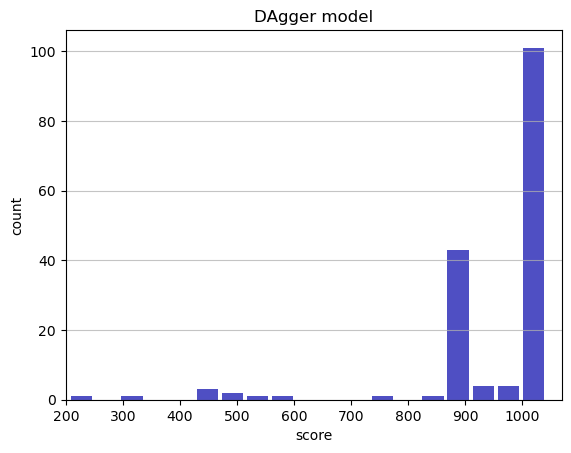

Track generation: 1179..1478 -> 299-tiles track
Epoch: 164
DAgger	mean: 950.22	variance: 140.94


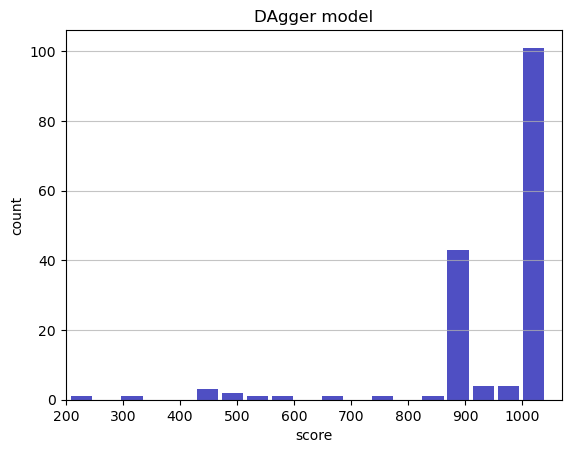

Track generation: 1157..1454 -> 297-tiles track
Epoch: 165
DAgger	mean: 950.65	variance: 140.62


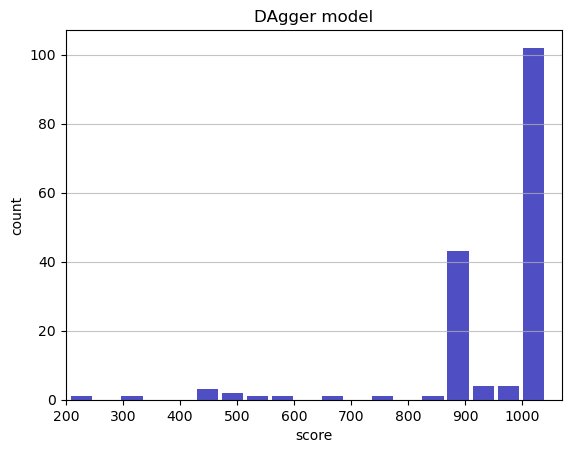

Track generation: 1180..1479 -> 299-tiles track
Epoch: 166
DAgger	mean: 951.06	variance: 140.30


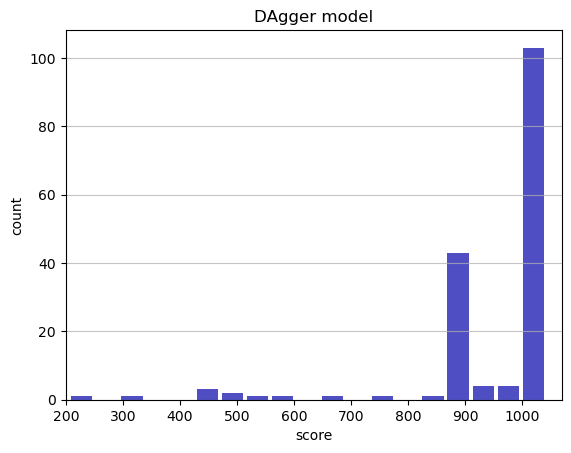

Track generation: 1160..1454 -> 294-tiles track
Epoch: 167
DAgger	mean: 950.78	variance: 139.93


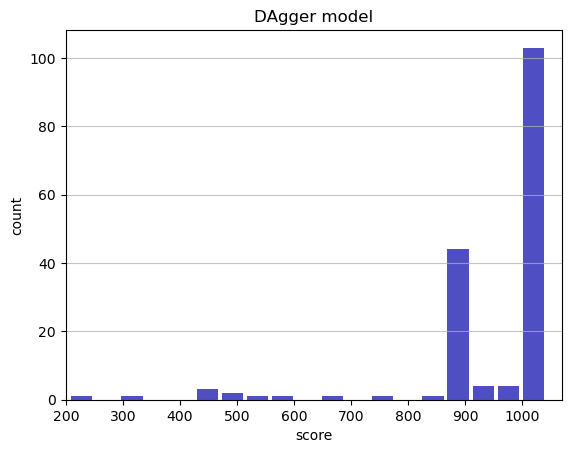

Track generation: 1149..1440 -> 291-tiles track
Epoch: 168
DAgger	mean: 950.38	variance: 139.60


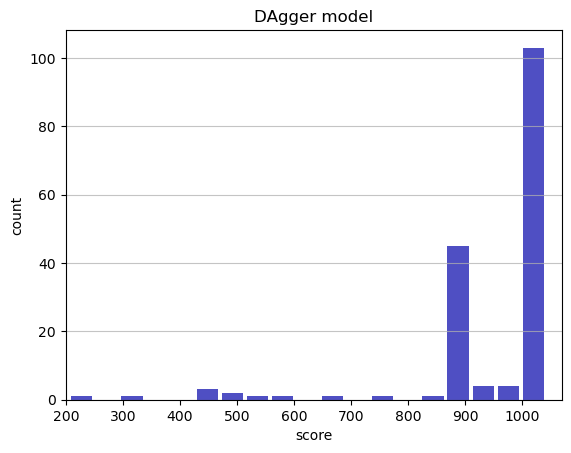

Track generation: 1075..1348 -> 273-tiles track
Epoch: 169
DAgger	mean: 950.90	variance: 139.35


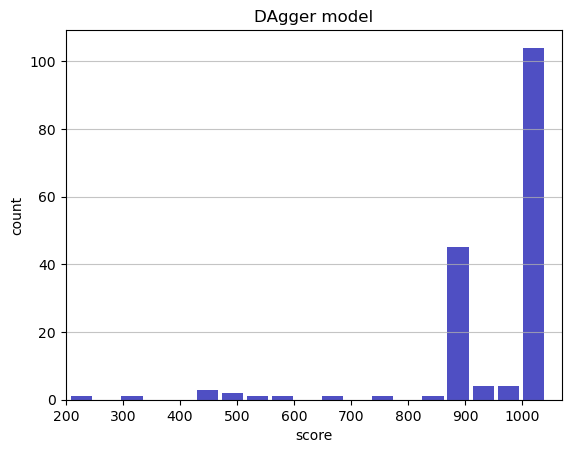

Track generation: 1277..1600 -> 323-tiles track
Epoch: 170
DAgger	mean: 950.53	variance: 139.02


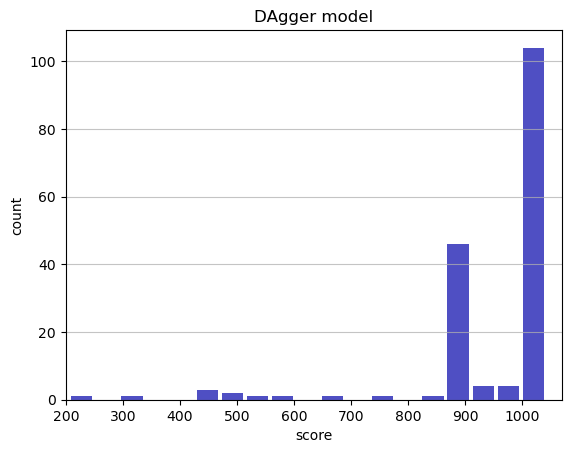

Track generation: 1127..1413 -> 286-tiles track
Epoch: 171
DAgger	mean: 950.97	variance: 138.73


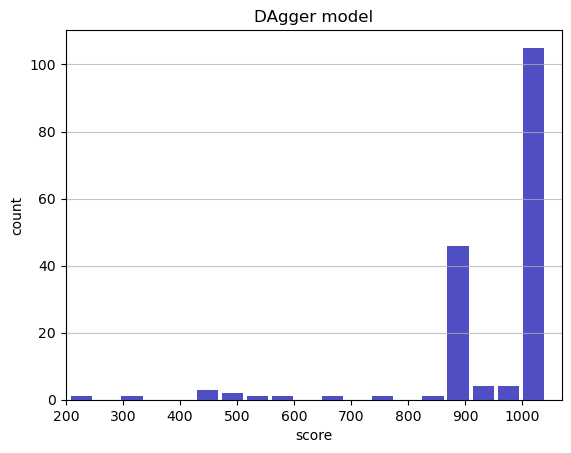

Track generation: 1118..1402 -> 284-tiles track
Epoch: 172
DAgger	mean: 951.40	variance: 138.45


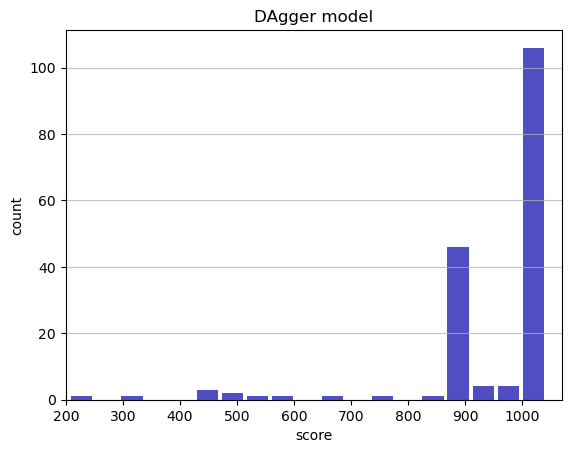

Track generation: 1131..1418 -> 287-tiles track
Epoch: 173
DAgger	mean: 951.08	variance: 138.11


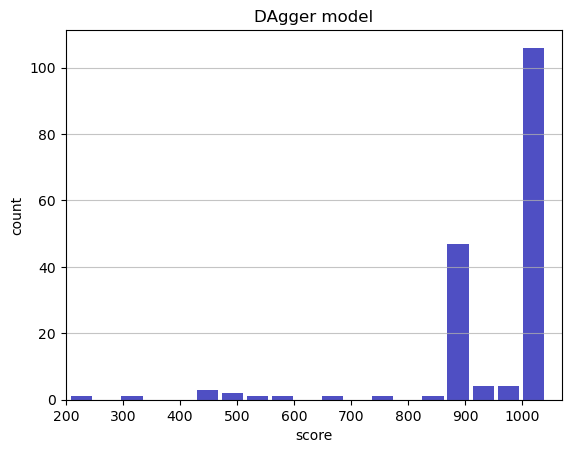

Track generation: 1118..1402 -> 284-tiles track
Epoch: 174
DAgger	mean: 950.71	variance: 137.80


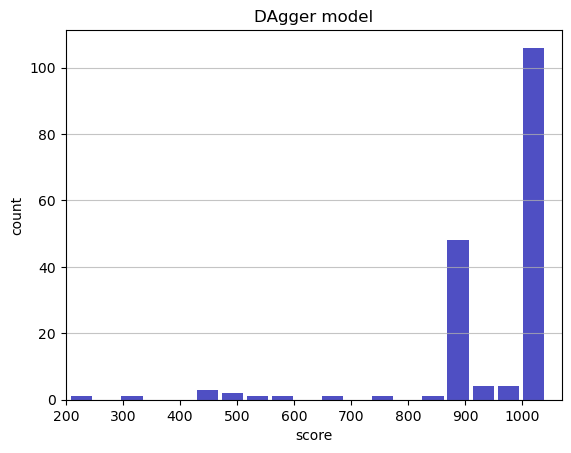

Track generation: 1048..1316 -> 268-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1174..1472 -> 298-tiles track
Epoch: 175
DAgger	mean: 949.61	variance: 138.16


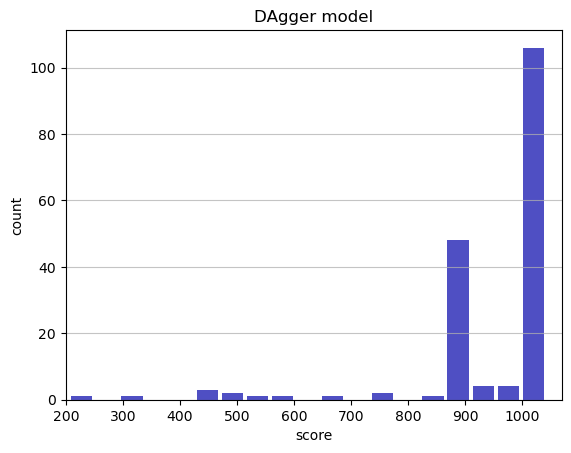

Track generation: 913..1150 -> 237-tiles track
Epoch: 176
DAgger	mean: 950.12	variance: 137.93


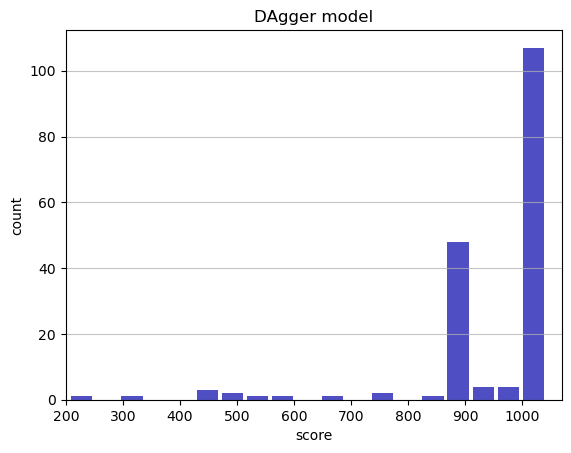

Track generation: 1253..1570 -> 317-tiles track
Epoch: 177
DAgger	mean: 950.49	variance: 137.63


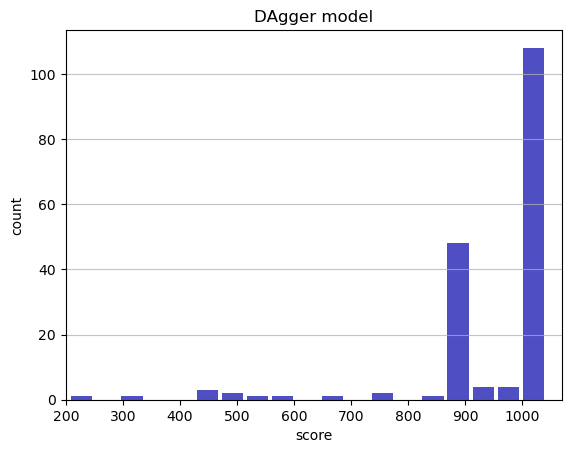

Track generation: 1155..1448 -> 293-tiles track
Epoch: 178
DAgger	mean: 950.92	variance: 137.36


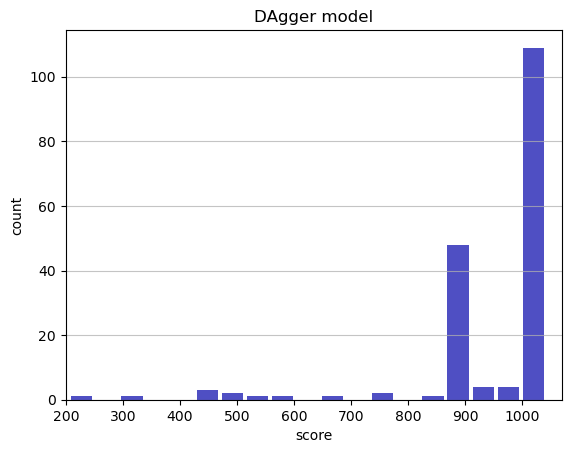

Track generation: 1022..1281 -> 259-tiles track
Epoch: 179
DAgger	mean: 951.37	variance: 137.11


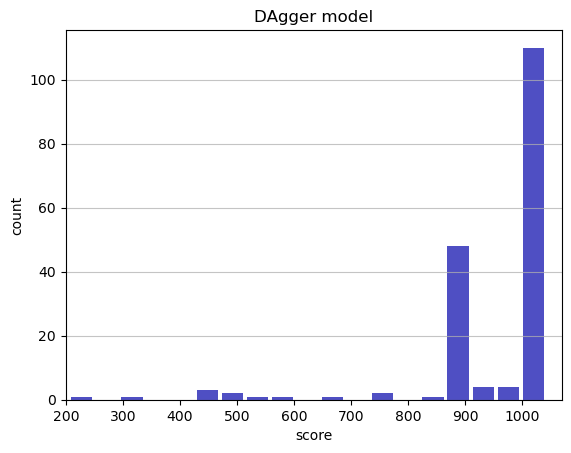

Track generation: 1068..1349 -> 281-tiles track
Epoch: 180
DAgger	mean: 951.10	variance: 136.78


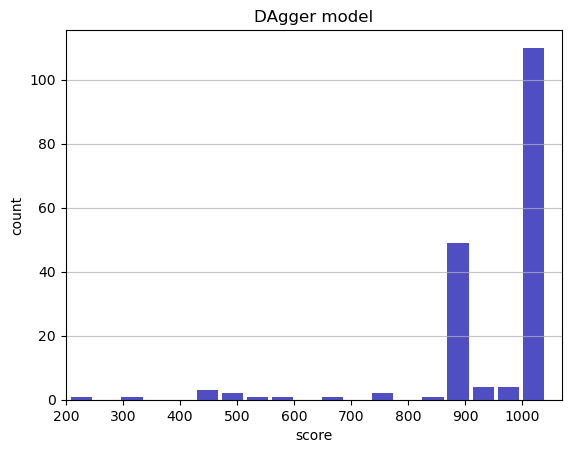

Track generation: 1096..1381 -> 285-tiles track
Epoch: 181
DAgger	mean: 950.82	variance: 136.45


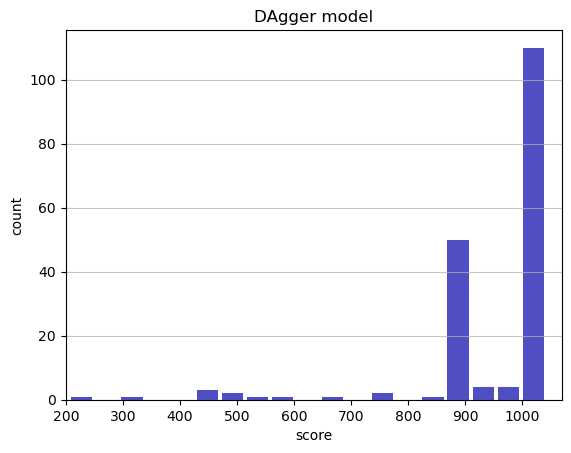

Track generation: 1124..1409 -> 285-tiles track
Epoch: 182
DAgger	mean: 950.62	variance: 136.11


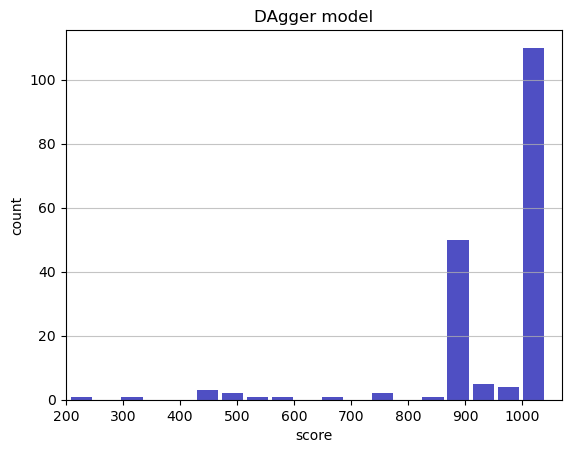

Track generation: 1223..1533 -> 310-tiles track
Epoch: 183
DAgger	mean: 950.96	variance: 135.81


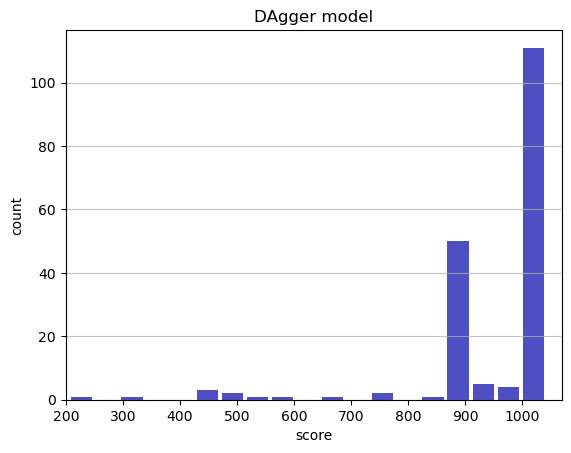

Track generation: 1356..1699 -> 343-tiles track
Epoch: 184
DAgger	mean: 951.27	variance: 135.51


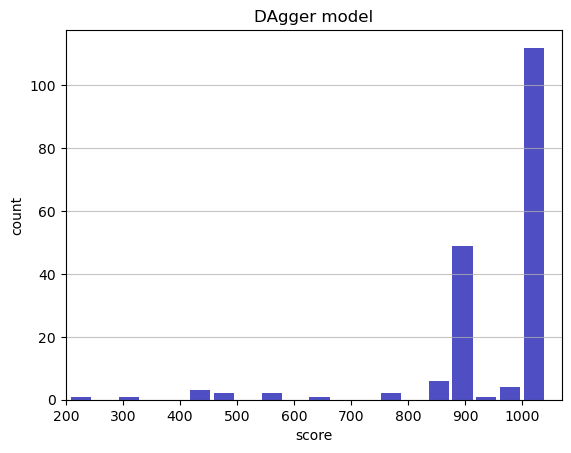

Track generation: 1127..1420 -> 293-tiles track
Epoch: 185
DAgger	mean: 951.62	variance: 135.22


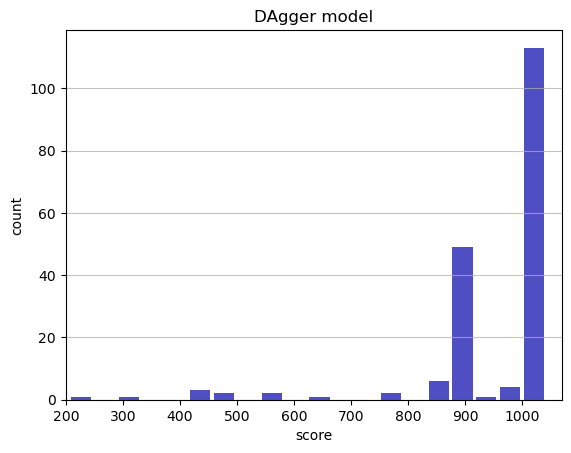

Track generation: 1080..1354 -> 274-tiles track
Epoch: 186
DAgger	mean: 952.07	variance: 135.00


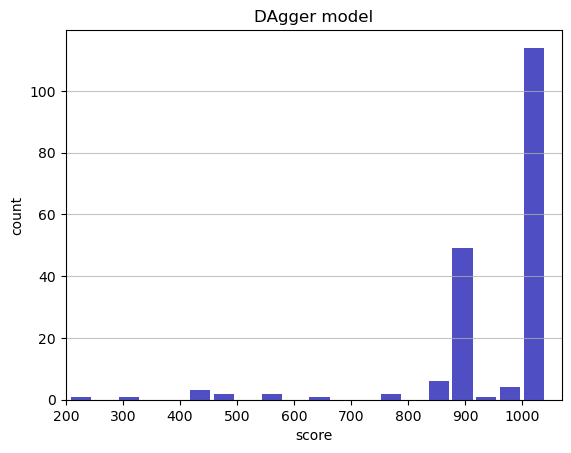

Track generation: 1104..1384 -> 280-tiles track
Epoch: 187
DAgger	mean: 952.49	variance: 134.76


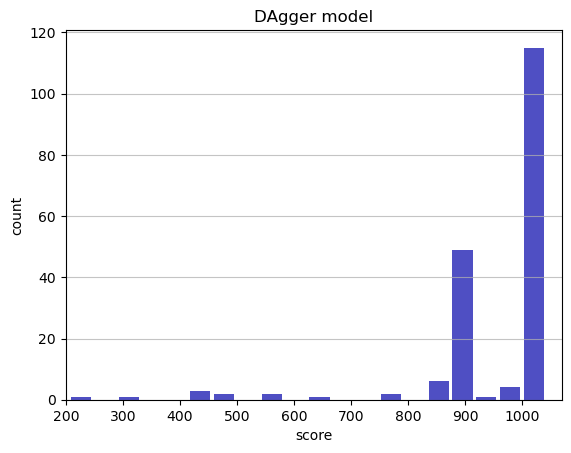

Track generation: 1224..1534 -> 310-tiles track
Epoch: 188
DAgger	mean: 952.84	variance: 134.49


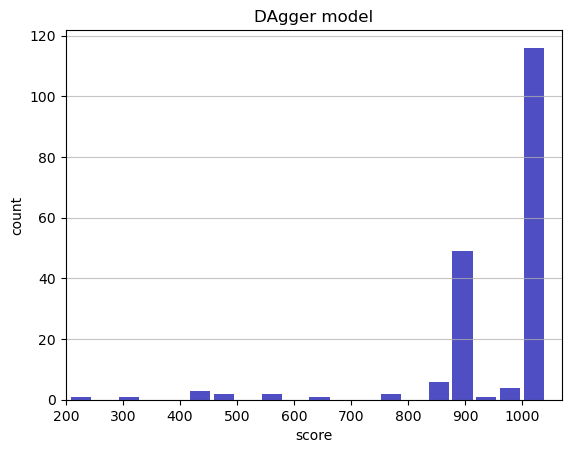

Track generation: 1191..1499 -> 308-tiles track
Epoch: 189
DAgger	mean: 953.19	variance: 134.21


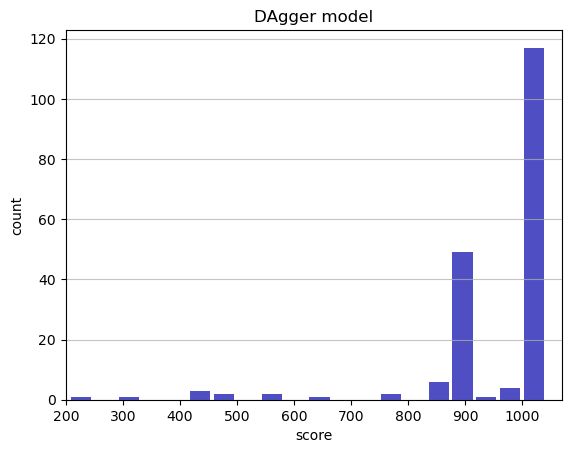

Track generation: 1102..1382 -> 280-tiles track
Epoch: 190
DAgger	mean: 953.58	variance: 133.97


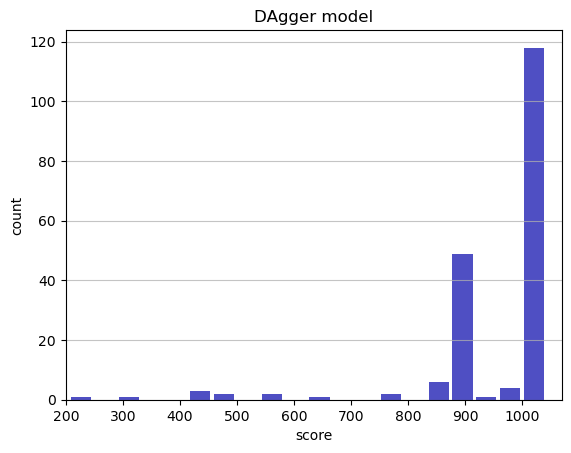

Track generation: 1190..1492 -> 302-tiles track
Epoch: 191
DAgger	mean: 953.93	variance: 133.71


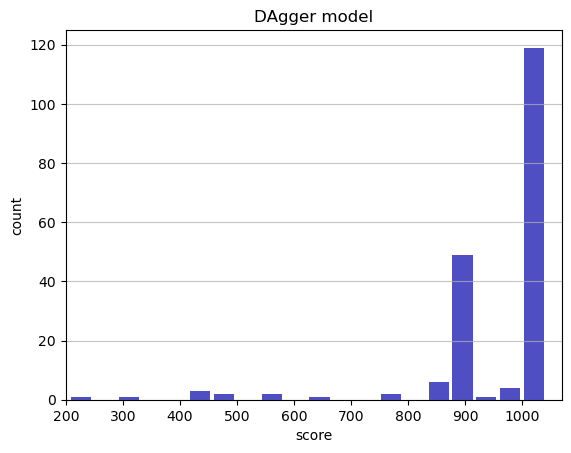

Track generation: 1062..1339 -> 277-tiles track
Epoch: 192
DAgger	mean: 954.31	variance: 133.46


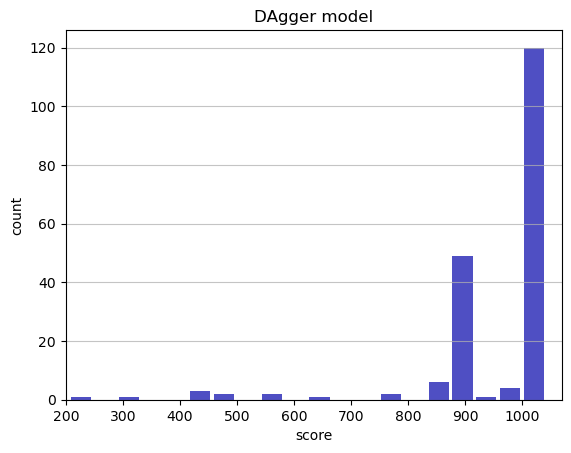

Track generation: 1174..1471 -> 297-tiles track
Epoch: 193
DAgger	mean: 954.67	variance: 133.21


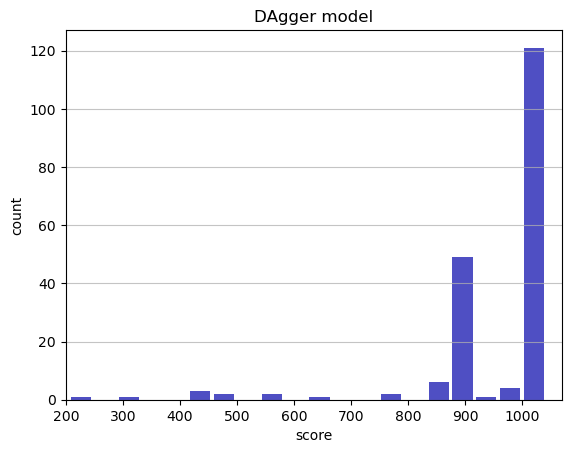

Track generation: 1168..1464 -> 296-tiles track
Epoch: 194
DAgger	mean: 955.02	variance: 132.95


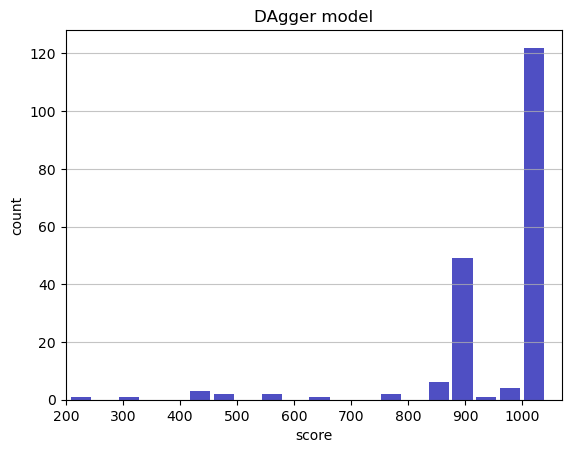

Track generation: 1107..1388 -> 281-tiles track
Epoch: 195
DAgger	mean: 954.62	variance: 132.72


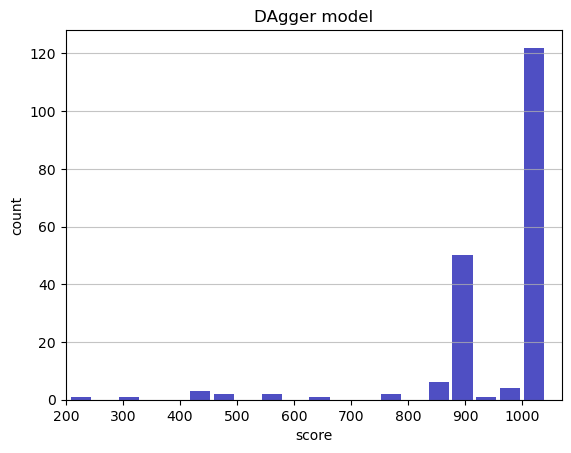

Track generation: 1148..1439 -> 291-tiles track
Epoch: 196
DAgger	mean: 954.96	variance: 132.47


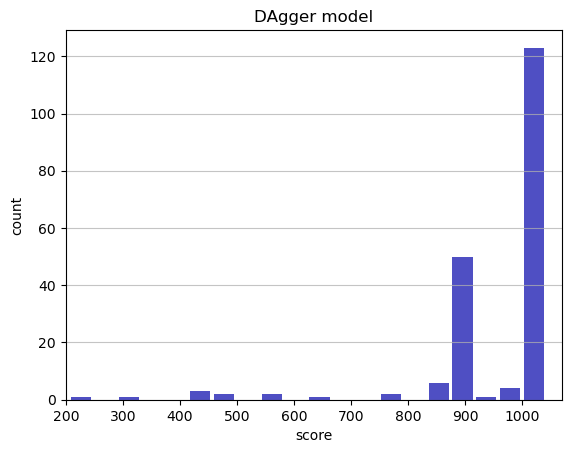

Track generation: 1275..1598 -> 323-tiles track
Epoch: 197
DAgger	mean: 955.27	variance: 132.20


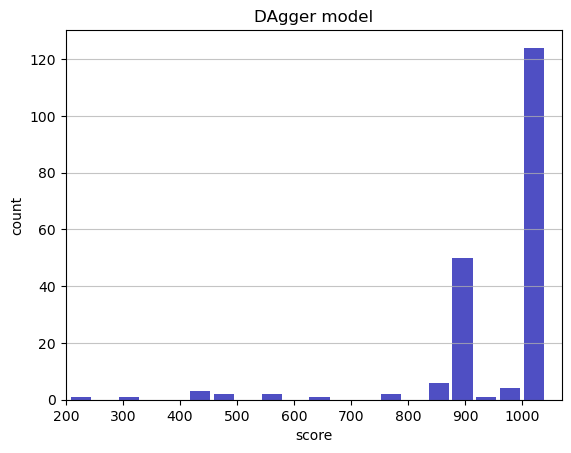

Track generation: 1238..1554 -> 316-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1212..1529 -> 317-tiles track
Epoch: 198
DAgger	mean: 955.57	variance: 131.93


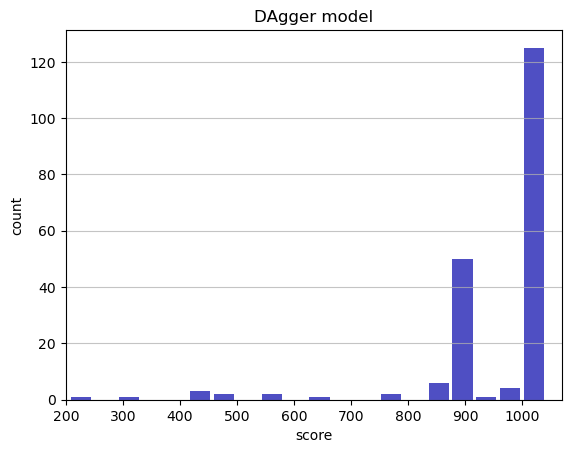

Track generation: 1177..1475 -> 298-tiles track
Epoch: 199
DAgger	mean: 955.91	variance: 131.69


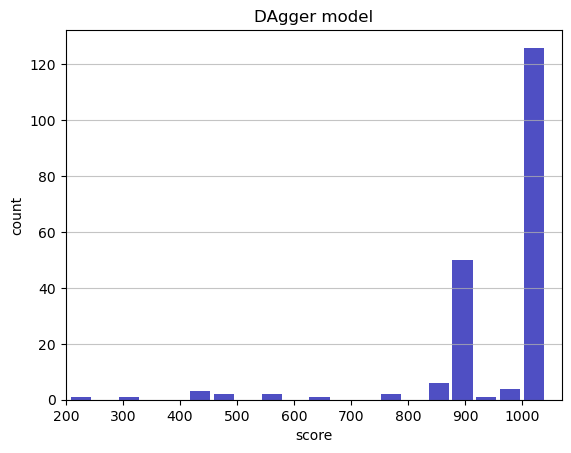

Track generation: 1075..1348 -> 273-tiles track
Epoch: 200
DAgger	mean: 955.71	variance: 131.39


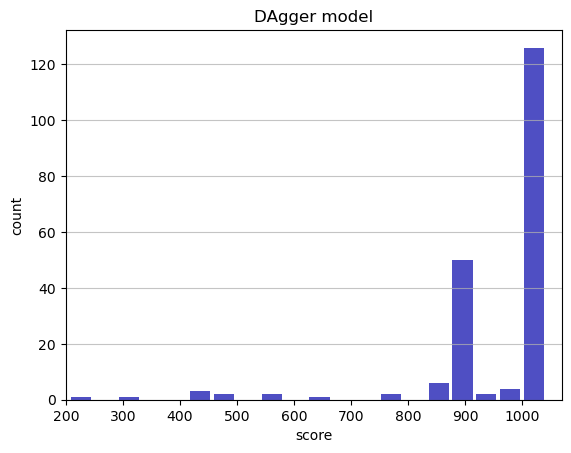

Track generation: 984..1234 -> 250-tiles track
Epoch: 201
DAgger	mean: 956.14	variance: 131.20


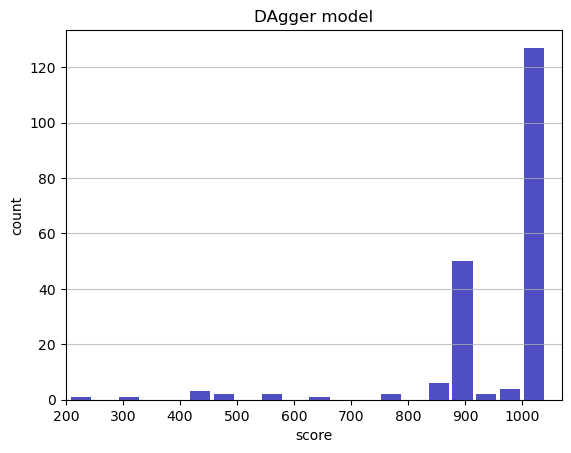

Track generation: 1279..1603 -> 324-tiles track
Epoch: 202
DAgger	mean: 955.75	variance: 130.99


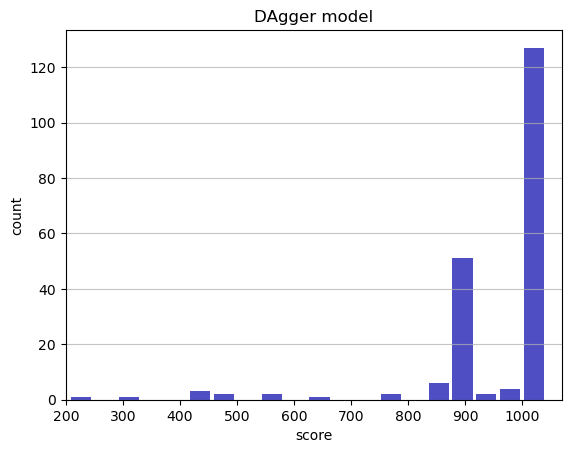

Track generation: 1007..1263 -> 256-tiles track
Epoch: 203
DAgger	mean: 956.15	variance: 130.79


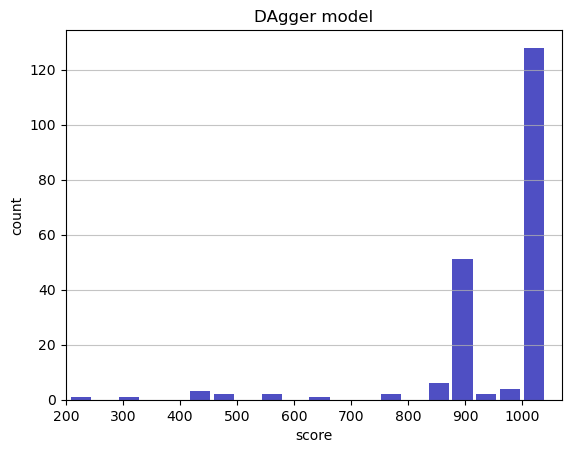

Track generation: 1154..1455 -> 301-tiles track
Epoch: 204
DAgger	mean: 955.07	variance: 131.37


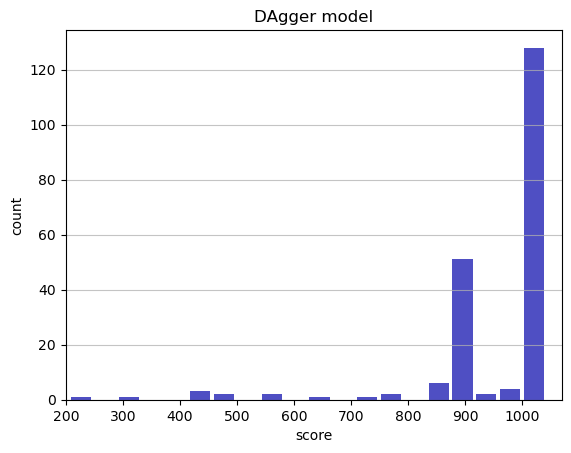

Track generation: 1142..1439 -> 297-tiles track
Epoch: 205
DAgger	mean: 955.38	variance: 131.13


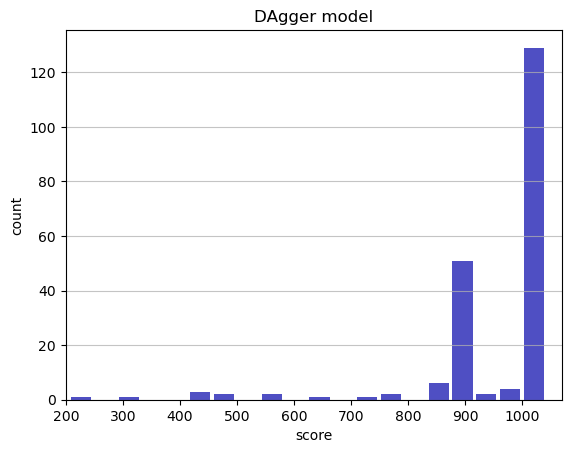

Track generation: 1037..1303 -> 266-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1159..1463 -> 304-tiles track
Epoch: 206
DAgger	mean: 955.70	variance: 130.89


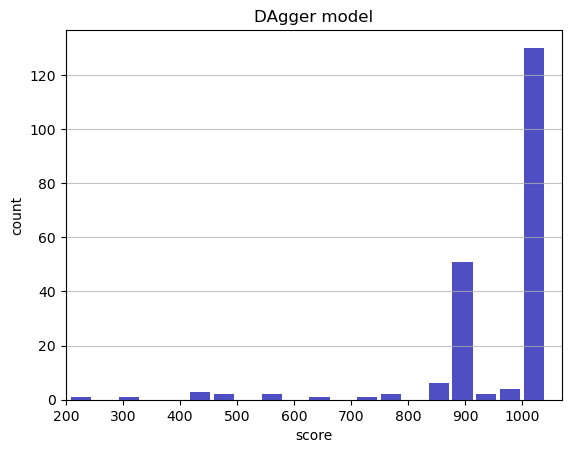

Track generation: 1231..1543 -> 312-tiles track
Epoch: 207
DAgger	mean: 956.02	variance: 130.65


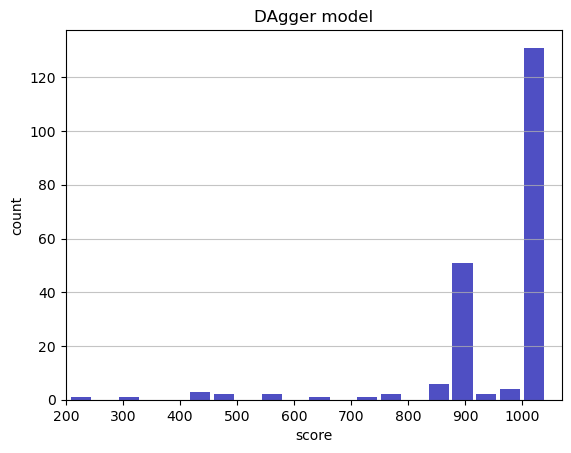

Track generation: 1298..1626 -> 328-tiles track
Epoch: 208
DAgger	mean: 956.31	variance: 130.41


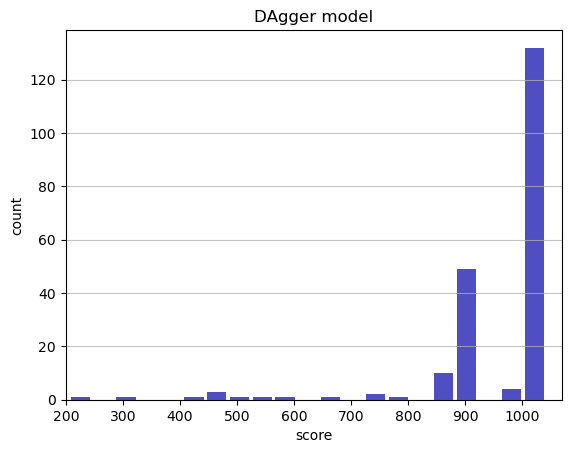

Track generation: 1124..1409 -> 285-tiles track
Epoch: 209
DAgger	mean: 956.65	variance: 130.19


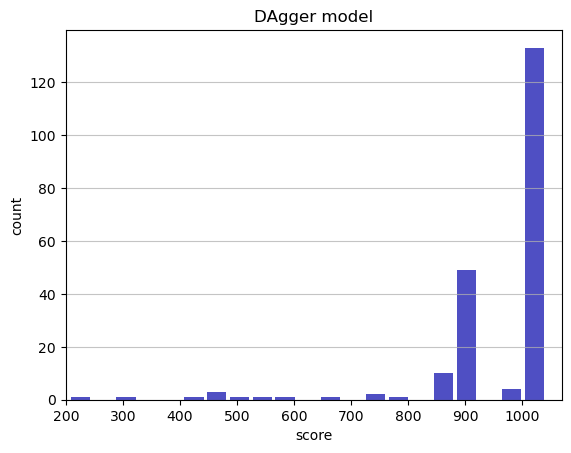

Track generation: 1111..1392 -> 281-tiles track
Epoch: 210
DAgger	mean: 956.11	variance: 130.11


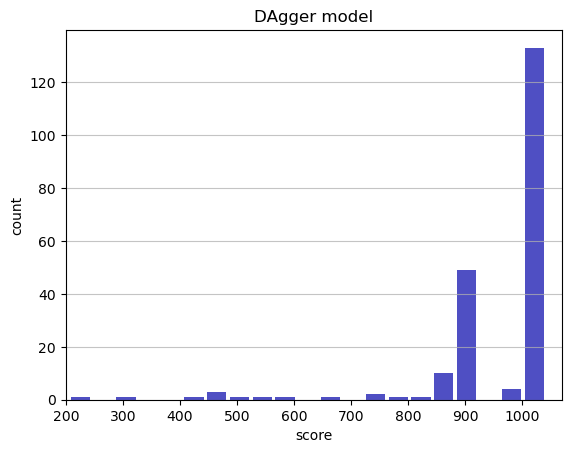

Track generation: 1176..1475 -> 299-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1122..1406 -> 284-tiles track
Epoch: 211
DAgger	mean: 956.43	variance: 129.89


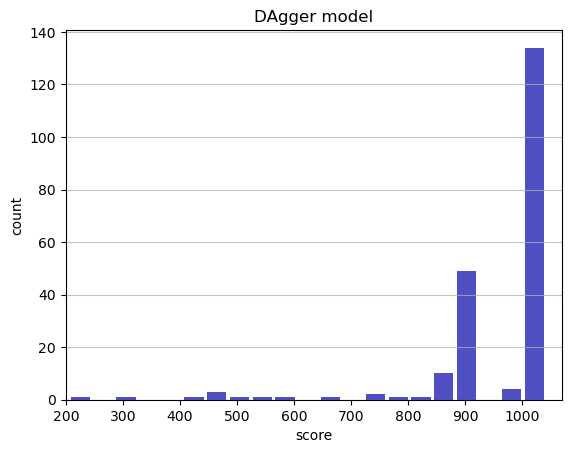

Track generation: 1077..1351 -> 274-tiles track
Epoch: 212
DAgger	mean: 956.78	variance: 129.68


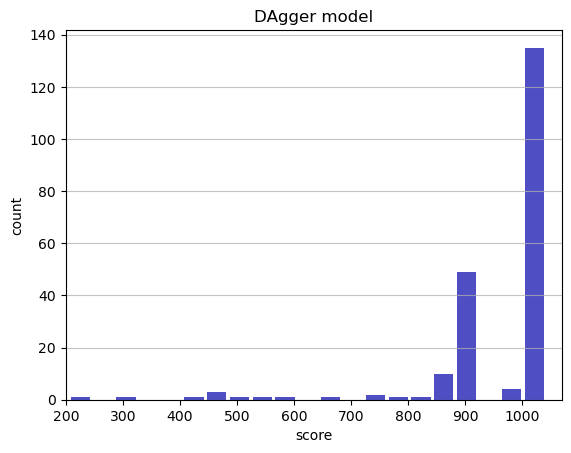

Track generation: 1223..1533 -> 310-tiles track
Epoch: 213
DAgger	mean: 957.07	variance: 129.45


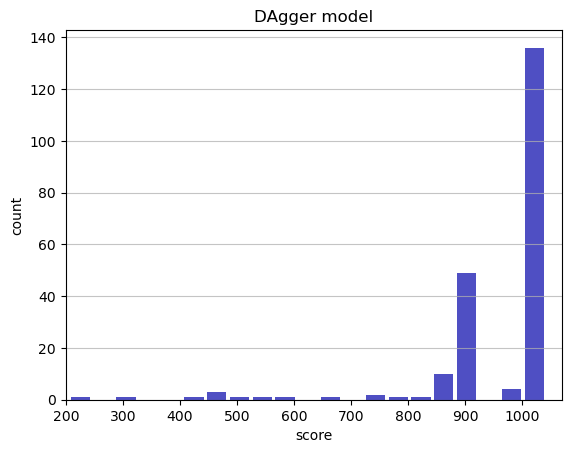

Track generation: 1203..1508 -> 305-tiles track
Epoch: 214
DAgger	mean: 957.37	variance: 129.22


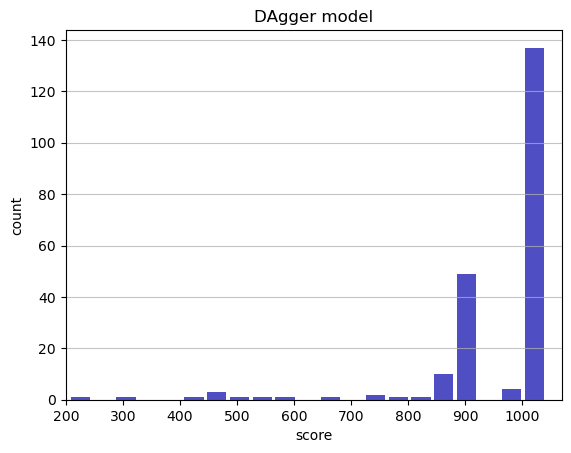

Track generation: 1061..1330 -> 269-tiles track
Epoch: 215
DAgger	mean: 957.15	variance: 128.96


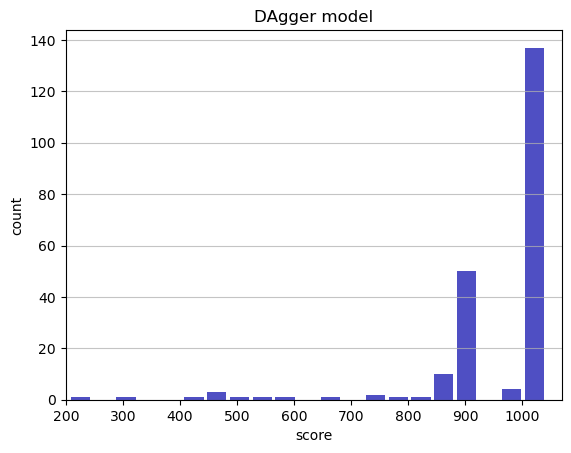

Track generation: 1221..1530 -> 309-tiles track
Epoch: 216
DAgger	mean: 956.76	variance: 128.78


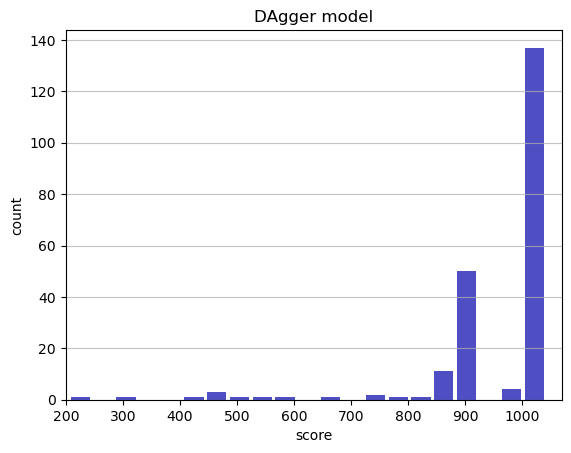

Track generation: 1219..1528 -> 309-tiles track
Epoch: 217
DAgger	mean: 957.06	variance: 128.56


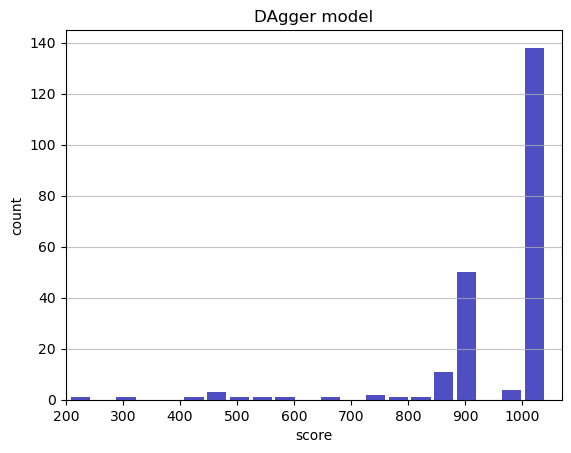

Track generation: 1343..1683 -> 340-tiles track
Epoch: 218
DAgger	mean: 954.01	variance: 135.88


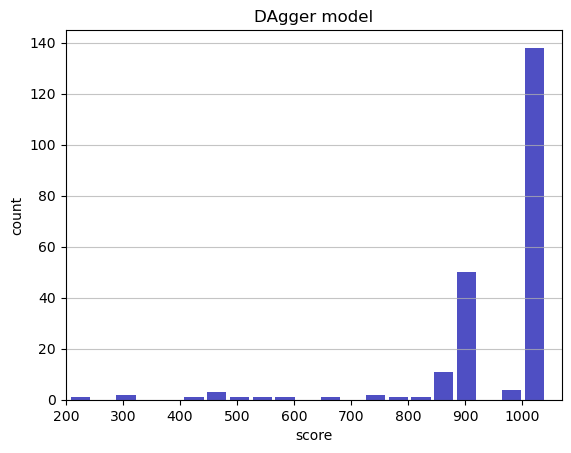

Track generation: 1075..1355 -> 280-tiles track
Epoch: 219
DAgger	mean: 954.34	variance: 135.66


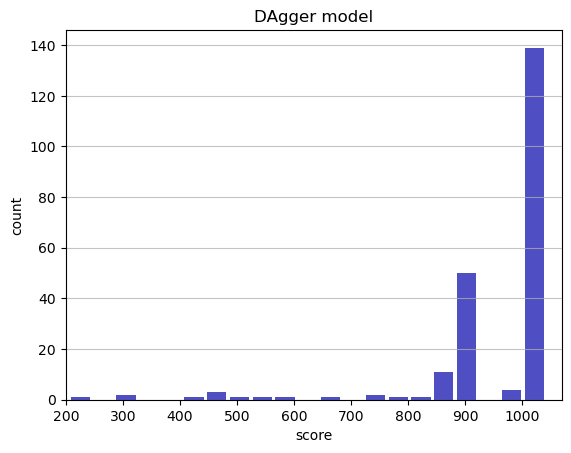

Track generation: 1235..1548 -> 313-tiles track
Epoch: 220
DAgger	mean: 954.63	variance: 135.42


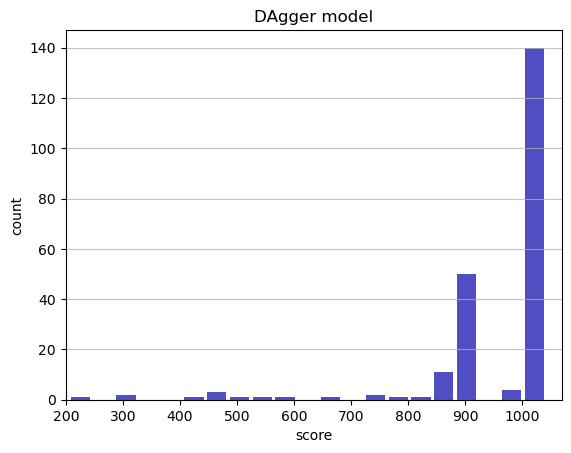

Track generation: 999..1260 -> 261-tiles track
Epoch: 221
DAgger	mean: 954.99	variance: 135.21


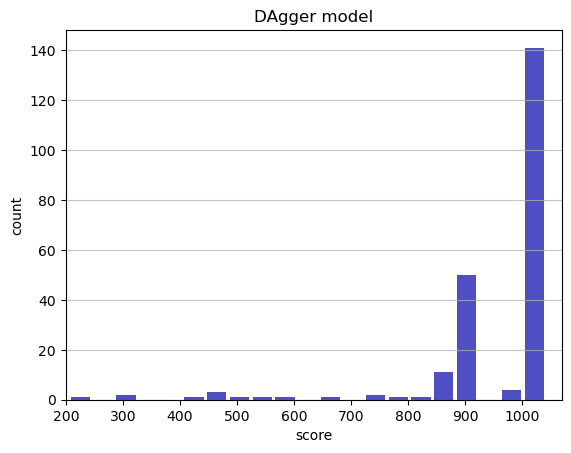

Track generation: 1113..1395 -> 282-tiles track
Epoch: 222
DAgger	mean: 955.29	variance: 134.98


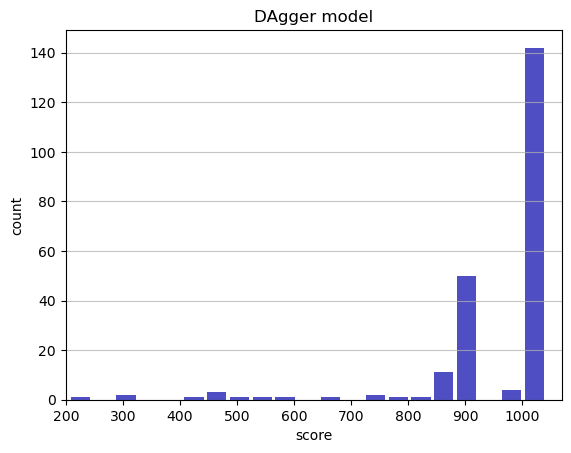

Track generation: 1152..1444 -> 292-tiles track
Epoch: 223
DAgger	mean: 955.05	variance: 134.73


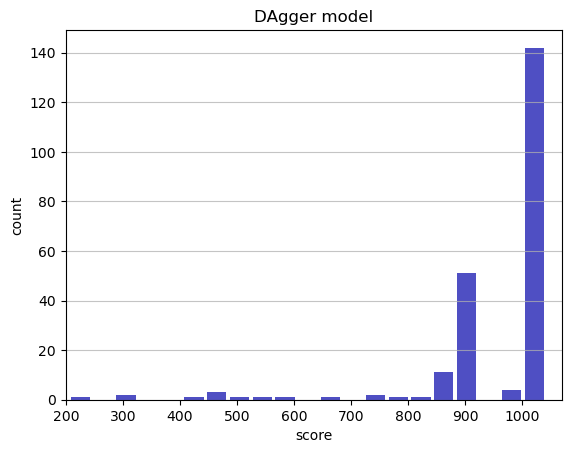

Track generation: 1060..1338 -> 278-tiles track
Epoch: 224
DAgger	mean: 955.38	variance: 134.52


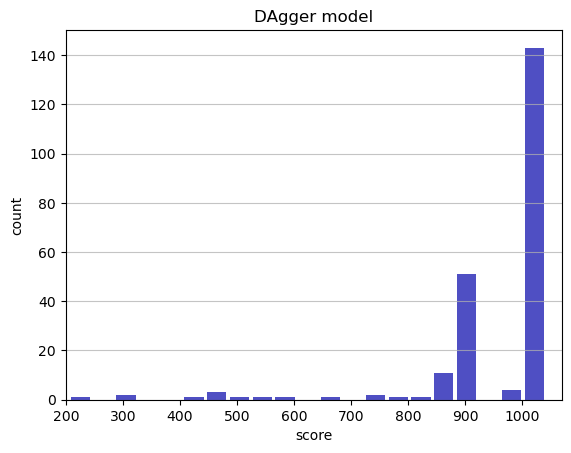

Track generation: 1146..1442 -> 296-tiles track
Epoch: 225
DAgger	mean: 955.69	variance: 134.30


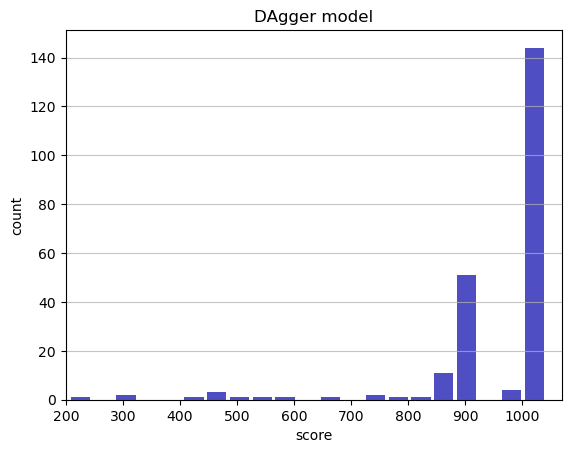

Track generation: 1160..1454 -> 294-tiles track
Epoch: 226
DAgger	mean: 956.01	variance: 134.09


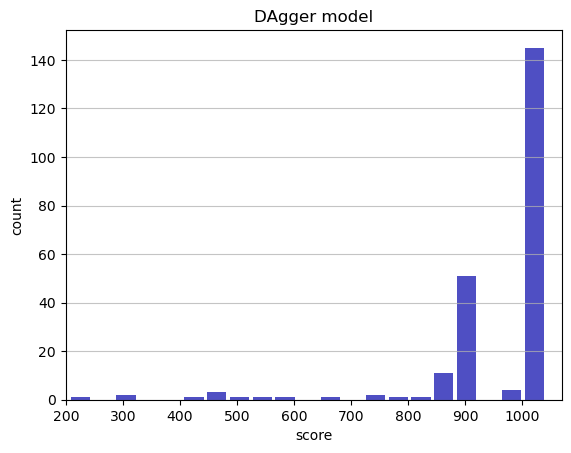

Track generation: 1045..1314 -> 269-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1130..1419 -> 289-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1258..1577 -> 319-tiles track
Epoch: 227
DAgger	mean: 956.27	variance: 133.85


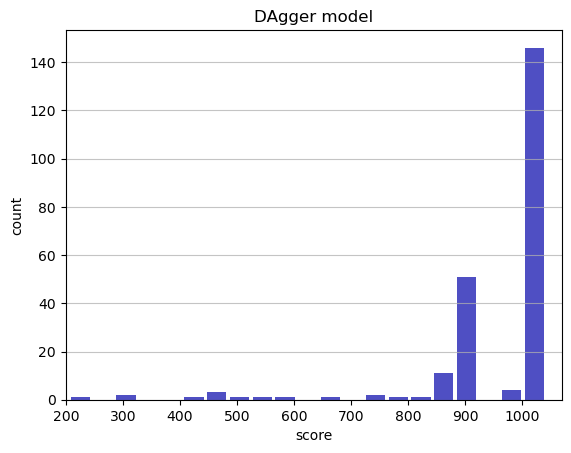

Track generation: 1123..1408 -> 285-tiles track
Epoch: 228
DAgger	mean: 956.08	variance: 133.59


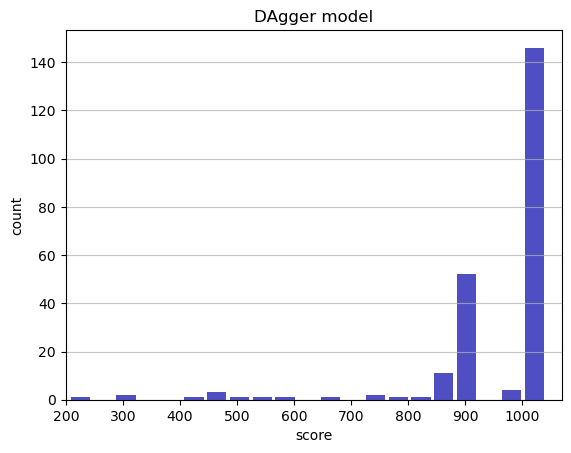

Track generation: 1119..1403 -> 284-tiles track
Epoch: 229
DAgger	mean: 956.39	variance: 133.38


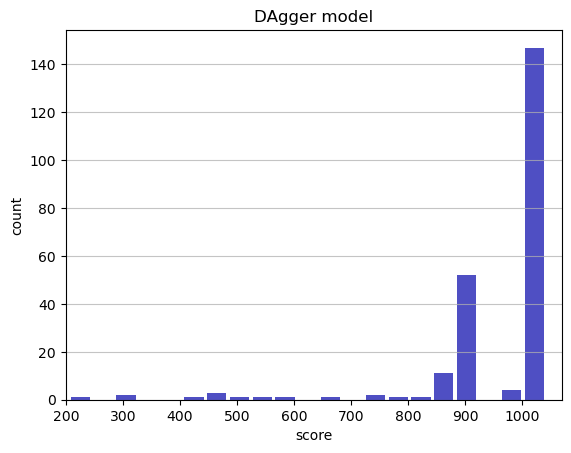

Track generation: 1100..1379 -> 279-tiles track
Epoch: 230
DAgger	mean: 956.16	variance: 133.13


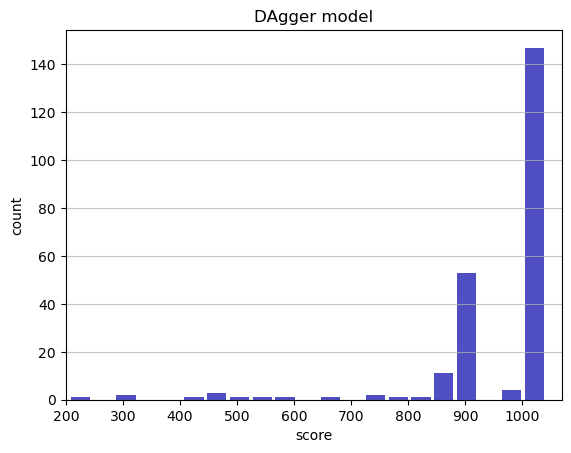

Track generation: 1259..1578 -> 319-tiles track
Epoch: 231
DAgger	mean: 956.43	variance: 132.90


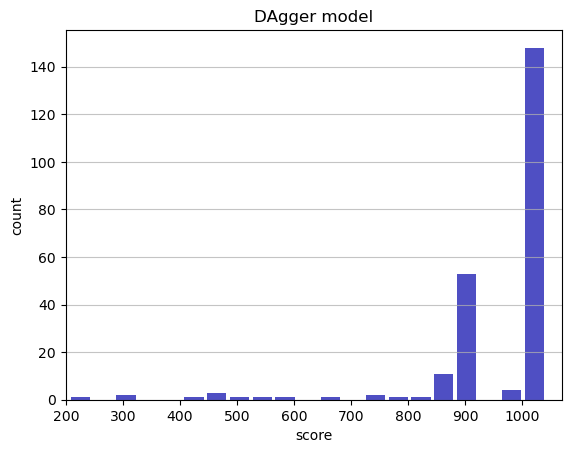

Track generation: 1149..1440 -> 291-tiles track
Epoch: 232
DAgger	mean: 956.19	variance: 132.67


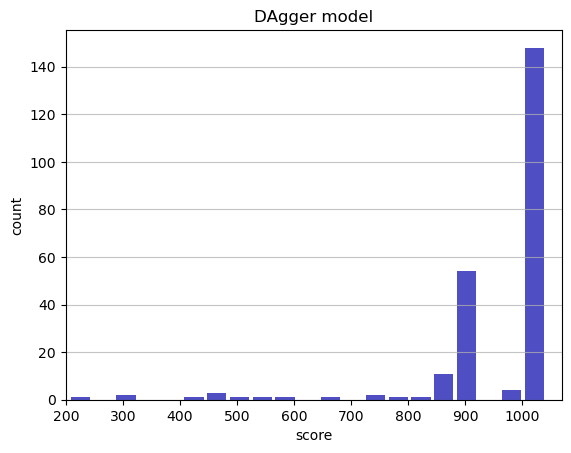

Track generation: 1139..1428 -> 289-tiles track
Epoch: 233
DAgger	mean: 956.50	variance: 132.47


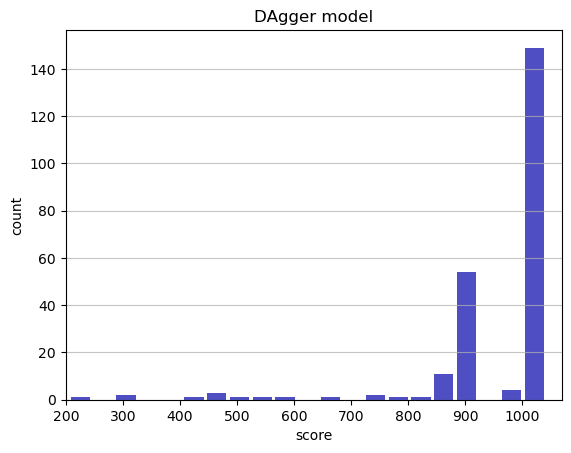

Track generation: 1191..1496 -> 305-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1131..1427 -> 296-tiles track
Epoch: 234
DAgger	mean: 956.81	variance: 132.27


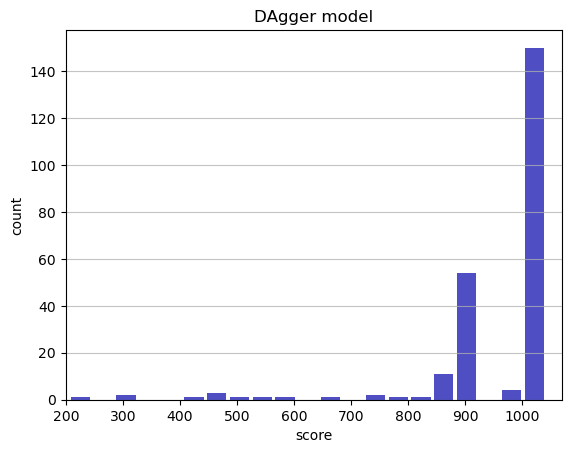

Track generation: 1111..1394 -> 283-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1031..1293 -> 262-tiles track
Epoch: 235
DAgger	mean: 956.53	variance: 132.05


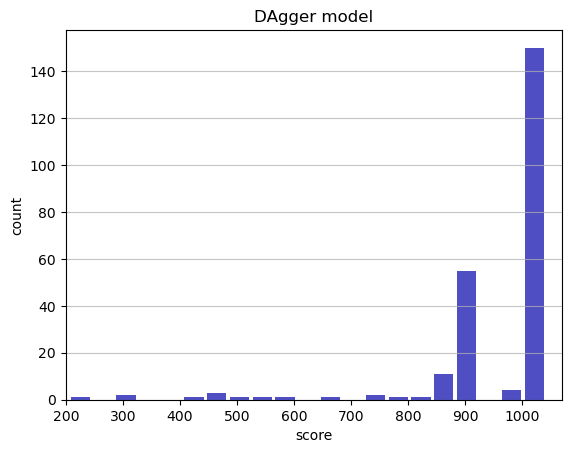

Track generation: 1059..1328 -> 269-tiles track
Epoch: 236
DAgger	mean: 956.33	variance: 131.81


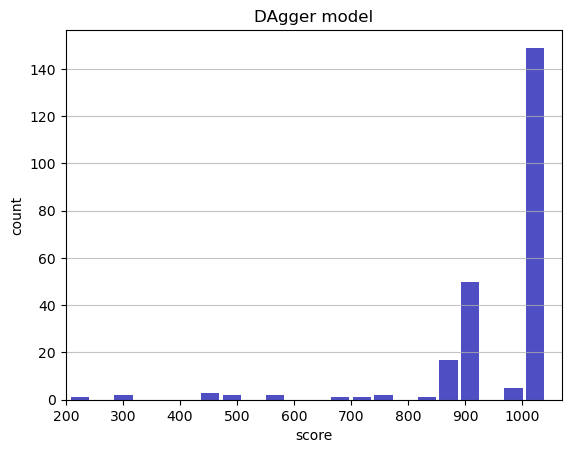

Track generation: 1072..1344 -> 272-tiles track
Epoch: 237
DAgger	mean: 956.65	variance: 131.62


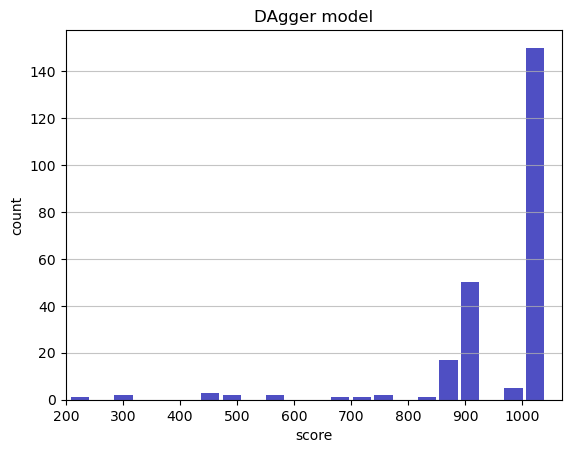

Track generation: 1251..1568 -> 317-tiles track
Epoch: 238
DAgger	mean: 956.90	variance: 131.40


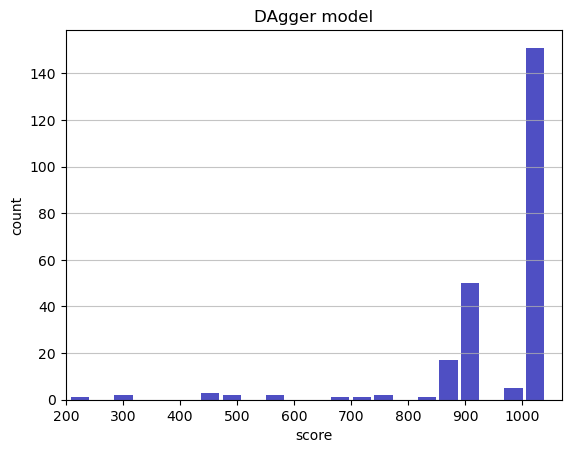

Track generation: 1175..1473 -> 298-tiles track
Epoch: 239
DAgger	mean: 956.68	variance: 131.17


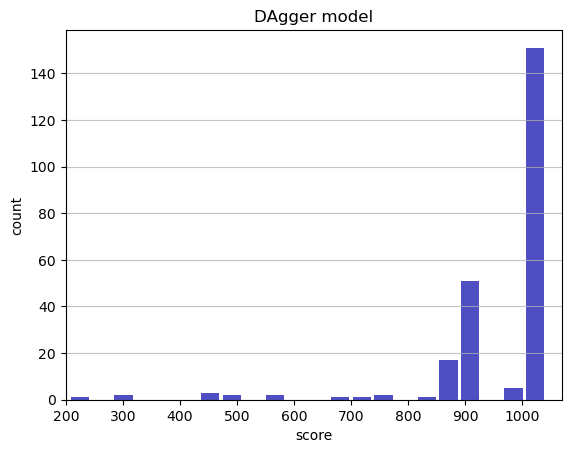

Track generation: 1035..1298 -> 263-tiles track
Epoch: 240
DAgger	mean: 957.03	variance: 131.00


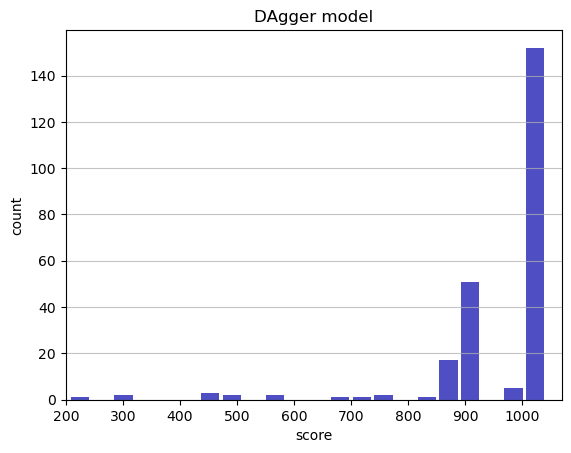

Track generation: 1065..1344 -> 279-tiles track
Epoch: 241
DAgger	mean: 957.32	variance: 130.81


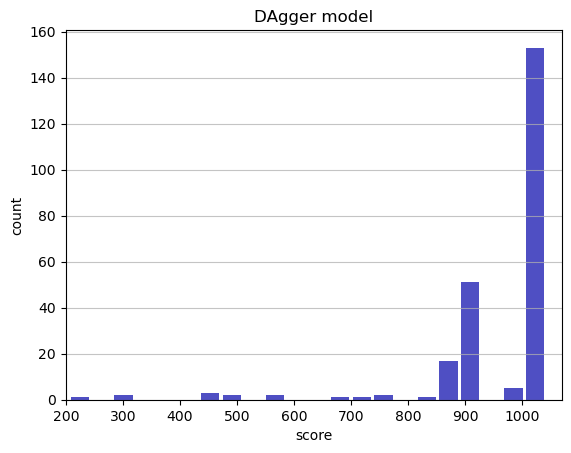

Track generation: 944..1192 -> 248-tiles track
Epoch: 242
DAgger	mean: 957.63	variance: 130.63


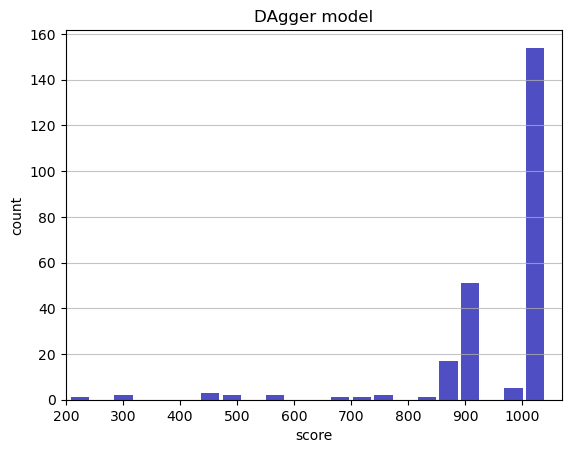

Track generation: 1161..1455 -> 294-tiles track
Epoch: 243
DAgger	mean: 957.92	variance: 130.44


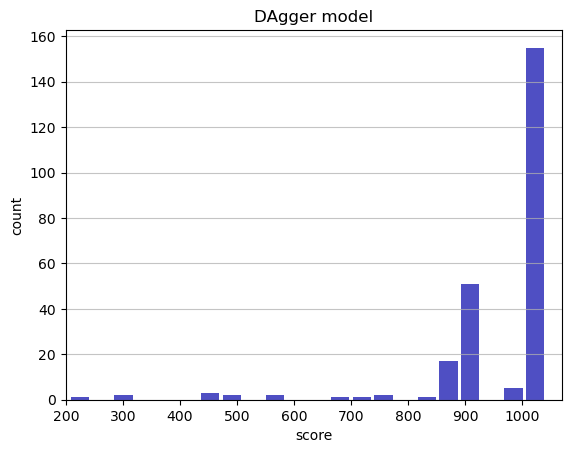

Track generation: 1143..1433 -> 290-tiles track
Epoch: 244
DAgger	mean: 958.20	variance: 130.24


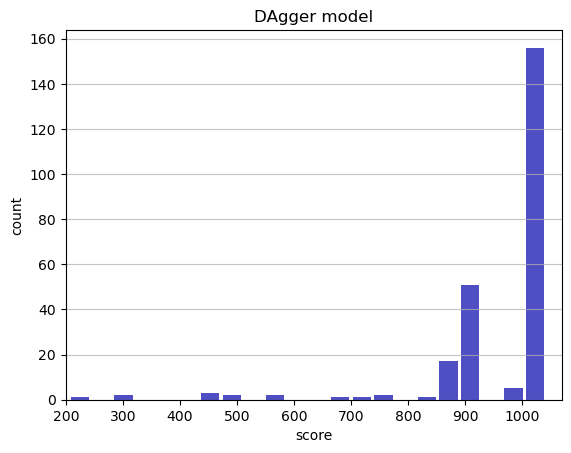

Track generation: 1179..1478 -> 299-tiles track
Epoch: 245
DAgger	mean: 957.97	variance: 130.02


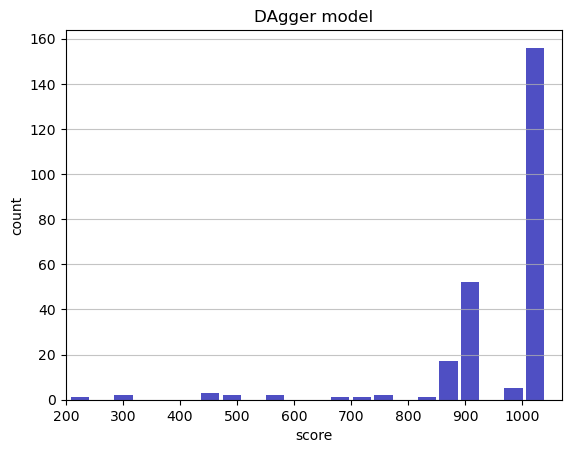

Track generation: 1172..1469 -> 297-tiles track
Epoch: 246
DAgger	mean: 957.69	variance: 129.83


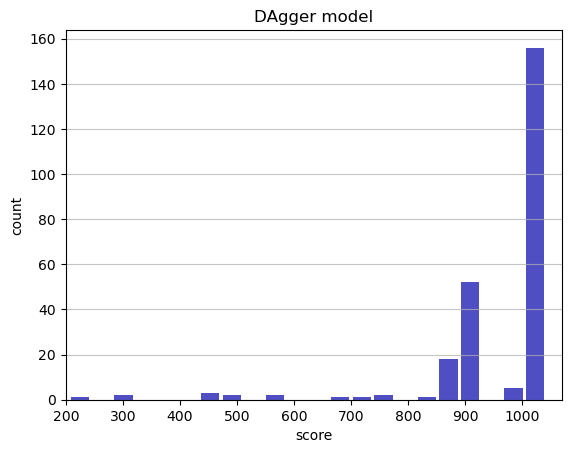

Track generation: 1086..1368 -> 282-tiles track
Epoch: 247
DAgger	mean: 957.98	variance: 129.65


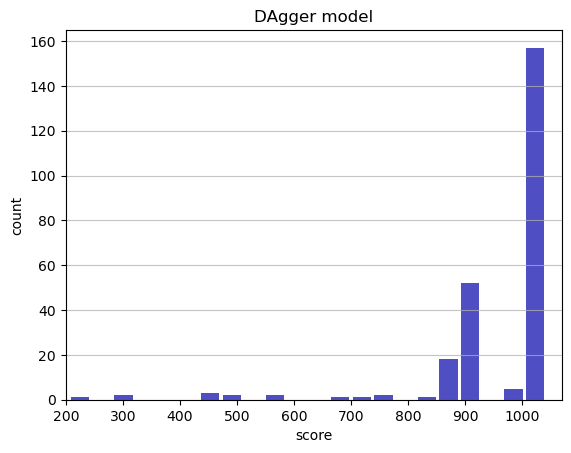

Track generation: 1341..1680 -> 339-tiles track
Epoch: 248
DAgger	mean: 958.20	variance: 129.44


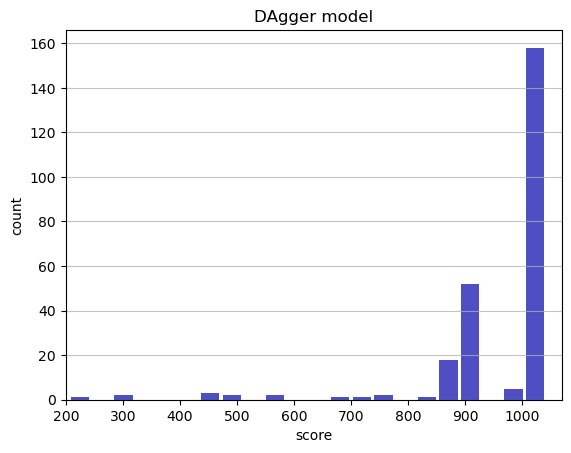

Track generation: 1312..1644 -> 332-tiles track
Epoch: 249
DAgger	mean: 957.95	variance: 129.24


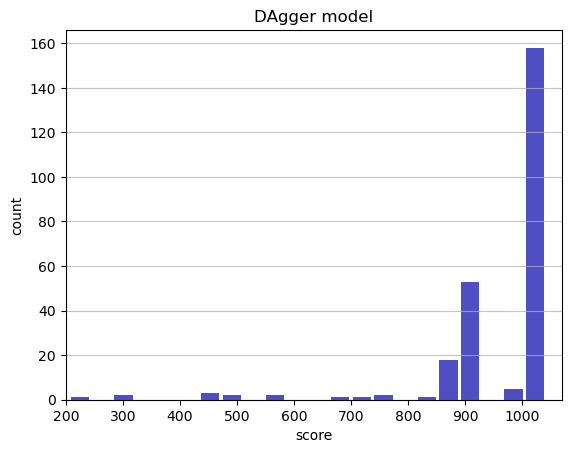

Track generation: 1225..1535 -> 310-tiles track
Epoch: 250
DAgger	mean: 957.76	variance: 129.01


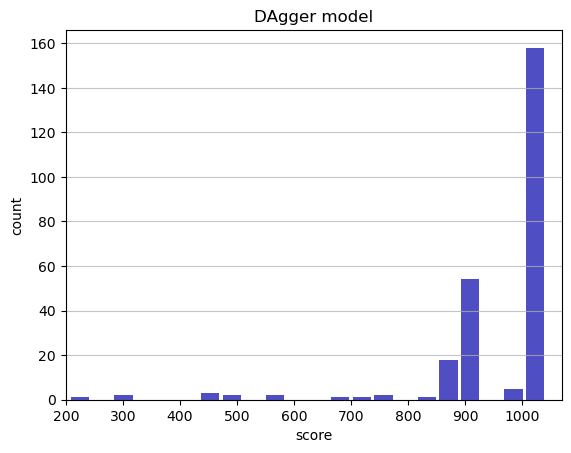

Track generation: 1184..1484 -> 300-tiles track
Epoch: 251
DAgger	mean: 958.00	variance: 128.82


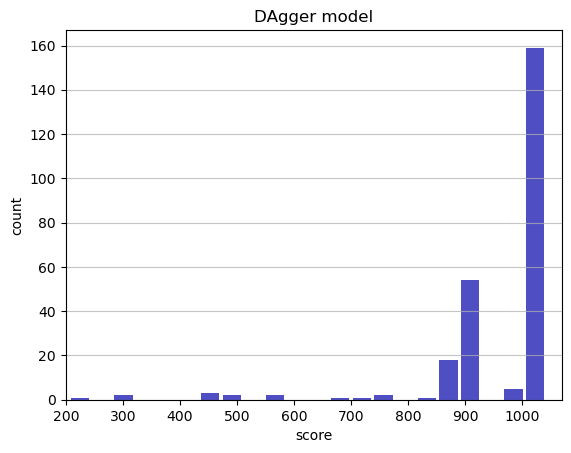

Track generation: 1120..1404 -> 284-tiles track
Epoch: 252
DAgger	mean: 958.27	variance: 128.63


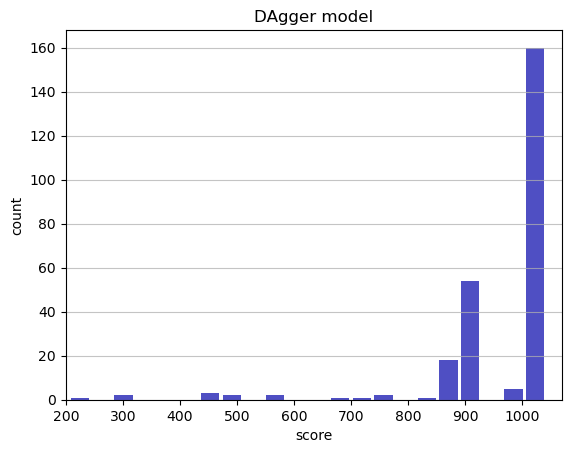

Track generation: 1125..1420 -> 295-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1249..1565 -> 316-tiles track
Epoch: 253
DAgger	mean: 958.49	variance: 128.43


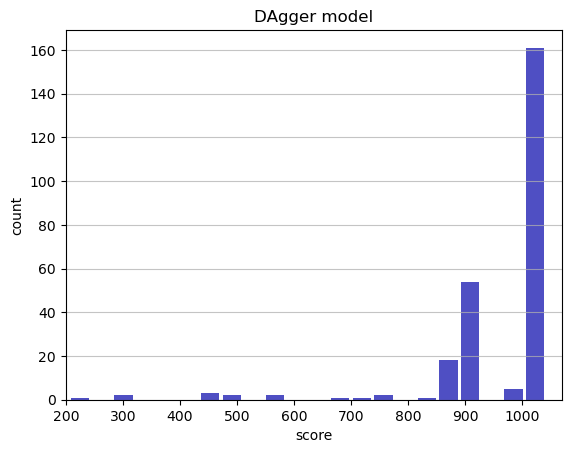

Track generation: 1305..1635 -> 330-tiles track
Epoch: 254
DAgger	mean: 958.71	variance: 128.22


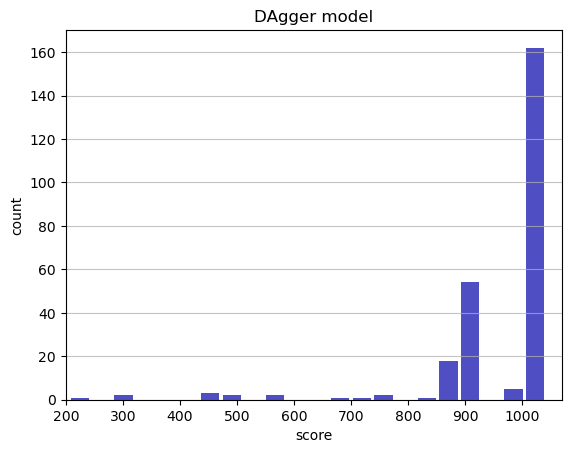

Track generation: 1254..1572 -> 318-tiles track
Epoch: 255
DAgger	mean: 958.95	variance: 128.03


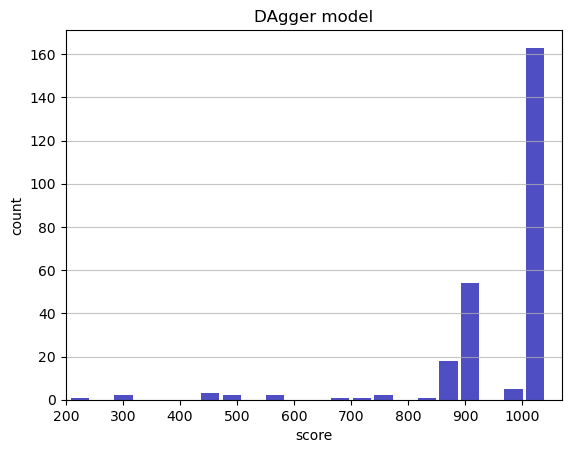

Track generation: 1248..1564 -> 316-tiles track
Epoch: 256
DAgger	mean: 959.20	variance: 127.83


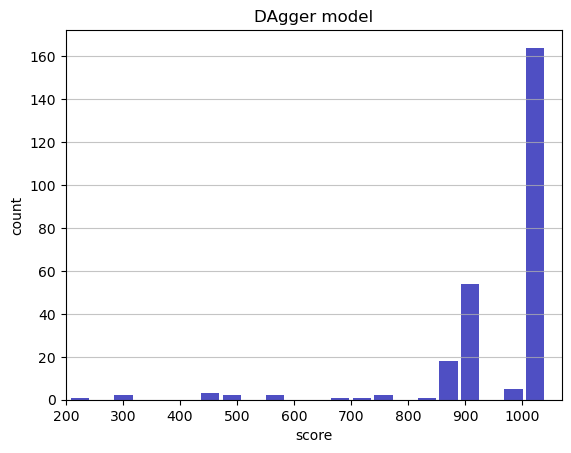

Track generation: 1117..1400 -> 283-tiles track
Epoch: 257
DAgger	mean: 957.11	variance: 131.87


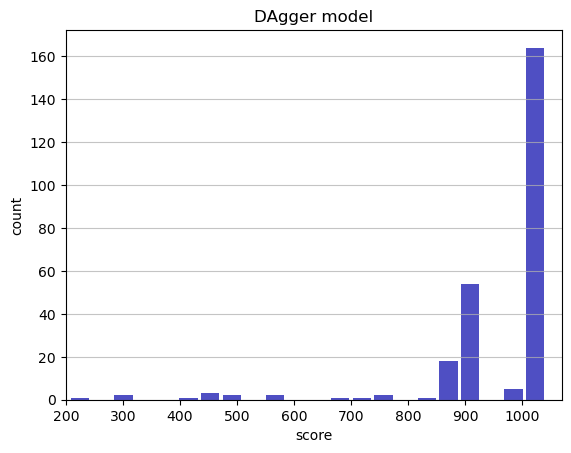

Track generation: 1142..1432 -> 290-tiles track
Epoch: 258
DAgger	mean: 957.37	variance: 131.68


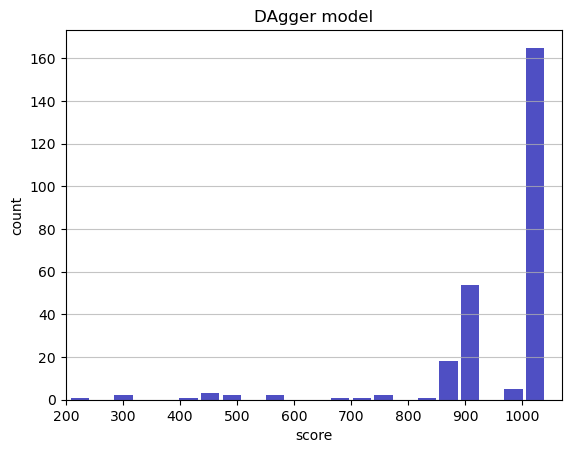

Track generation: 1240..1554 -> 314-tiles track
Epoch: 259
DAgger	mean: 957.18	variance: 131.46


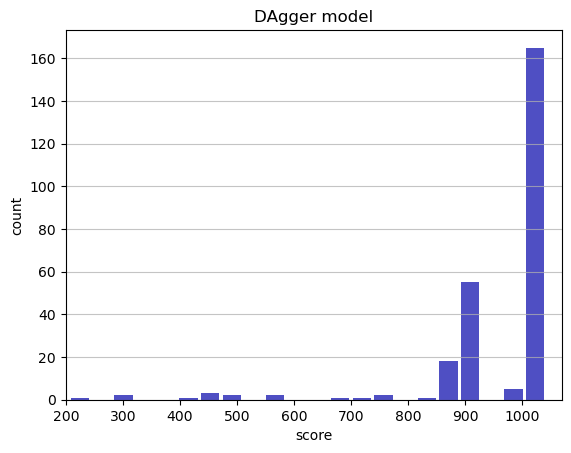

Track generation: 1232..1544 -> 312-tiles track
Epoch: 260
DAgger	mean: 957.43	variance: 131.27


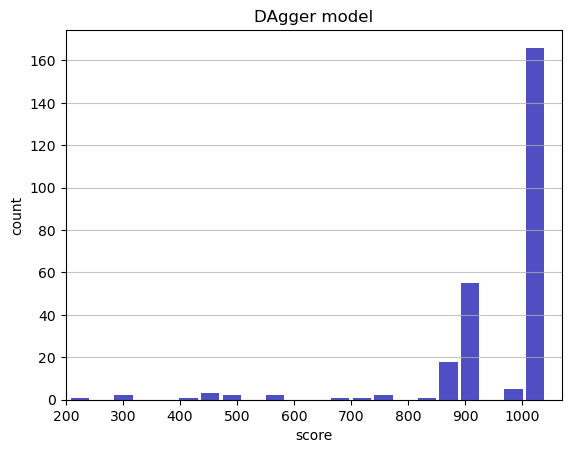

Track generation: 1184..1484 -> 300-tiles track
Epoch: 261
DAgger	mean: 955.15	variance: 136.06


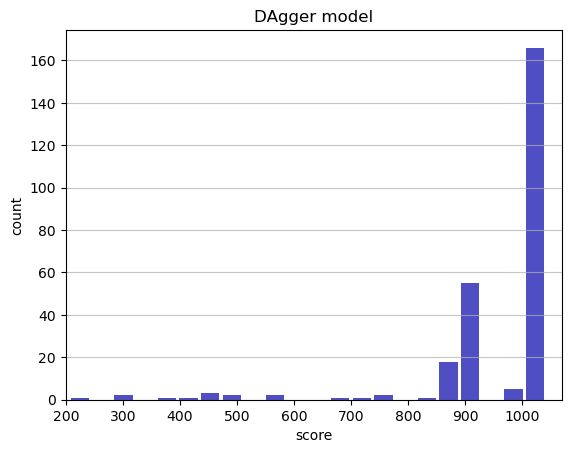

Track generation: 1173..1470 -> 297-tiles track
Epoch: 262
DAgger	mean: 954.92	variance: 135.85


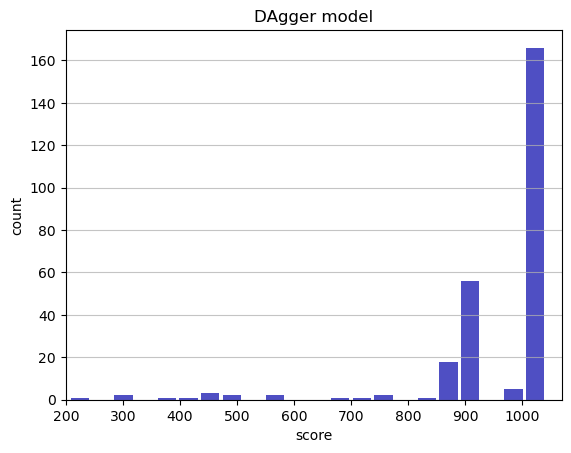

Track generation: 1124..1416 -> 292-tiles track
Epoch: 263
DAgger	mean: 954.71	variance: 135.64


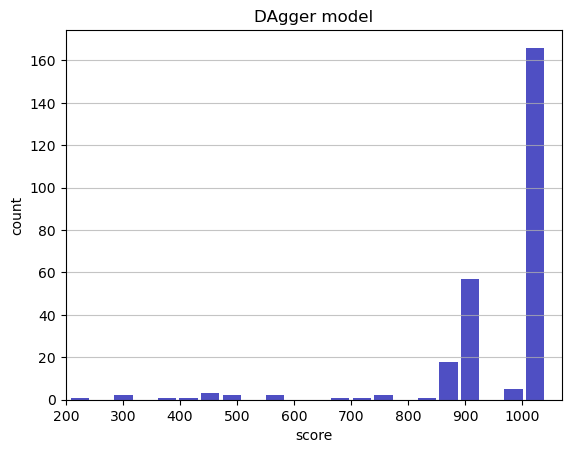

Track generation: 1010..1273 -> 263-tiles track
Epoch: 264
DAgger	mean: 954.51	variance: 135.42


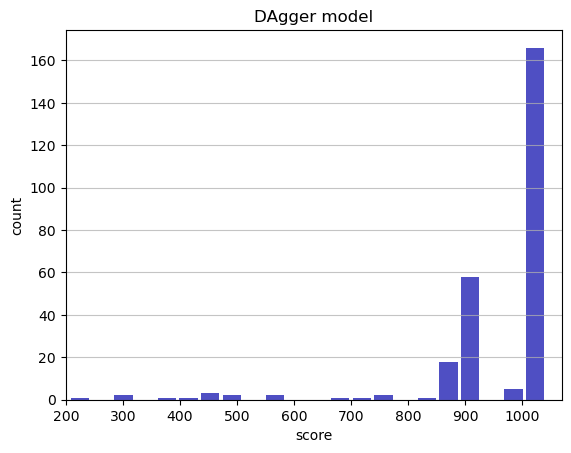

Track generation: 1256..1574 -> 318-tiles track
Epoch: 265
DAgger	mean: 951.94	variance: 141.47


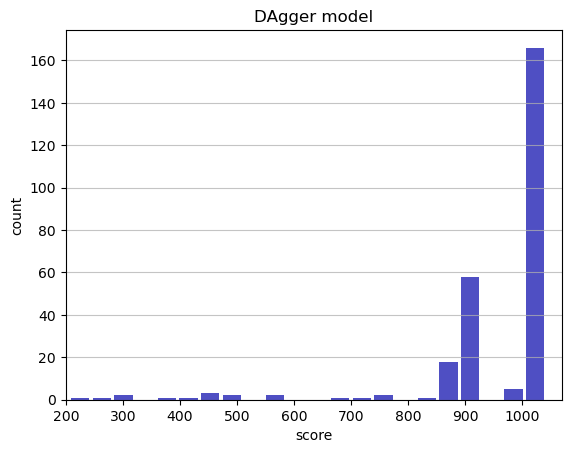

Track generation: 1069..1346 -> 277-tiles track
Epoch: 266
DAgger	mean: 951.77	variance: 141.23


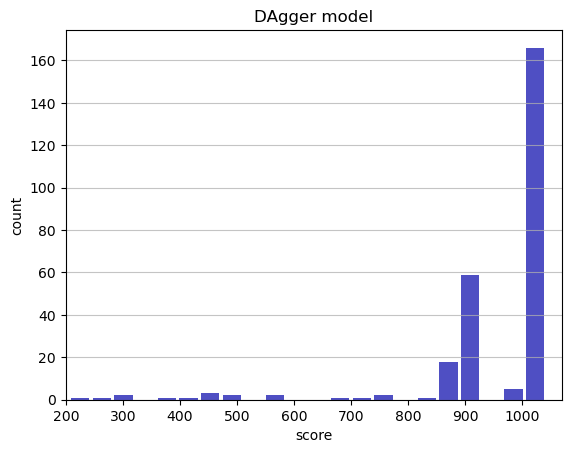

Track generation: 1148..1439 -> 291-tiles track
Epoch: 267
DAgger	mean: 952.05	variance: 141.04


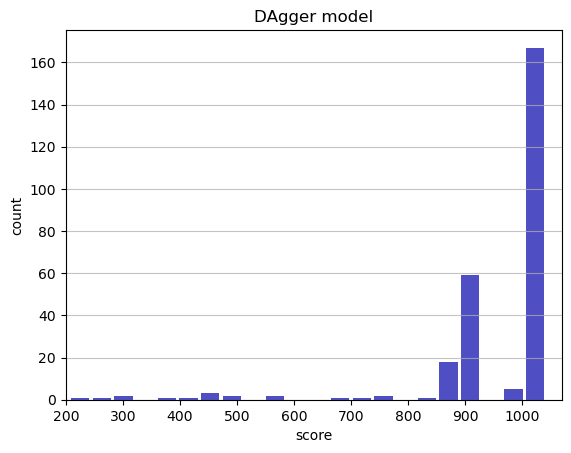

Track generation: 1009..1271 -> 262-tiles track
Epoch: 268
DAgger	mean: 952.35	variance: 140.86


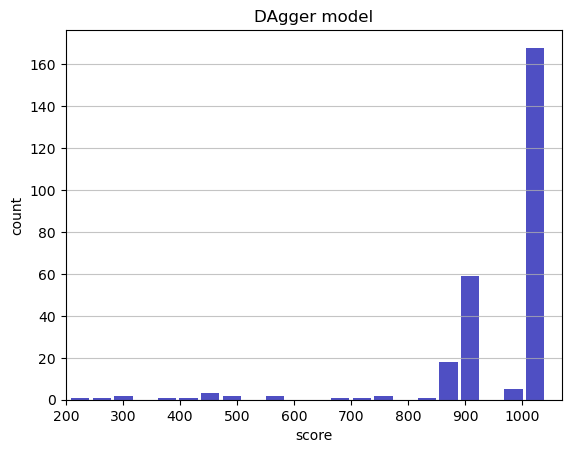

Track generation: 1144..1434 -> 290-tiles track
Epoch: 269
DAgger	mean: 952.63	variance: 140.68


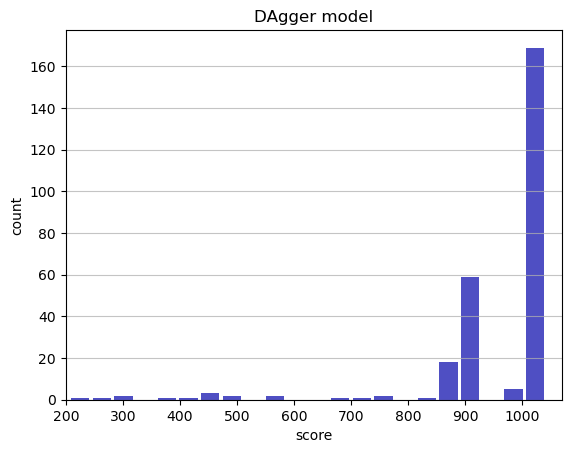

Track generation: 1307..1638 -> 331-tiles track
Epoch: 270
DAgger	mean: 952.70	variance: 140.42


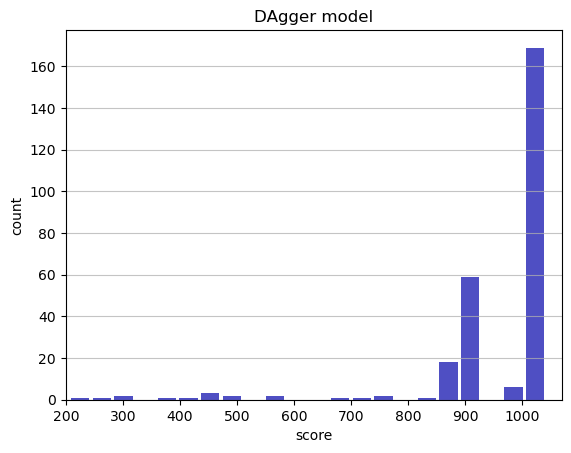

Track generation: 1255..1573 -> 318-tiles track
Epoch: 271
DAgger	mean: 950.82	variance: 143.55


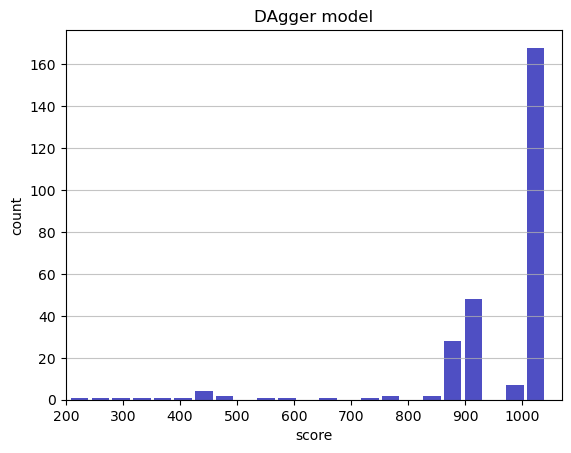

Track generation: 1333..1675 -> 342-tiles track
Epoch: 272
DAgger	mean: 951.04	variance: 143.33


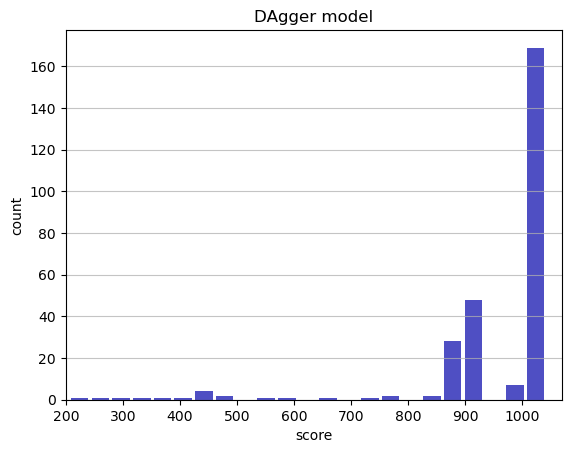

Track generation: 987..1242 -> 255-tiles track
Epoch: 273
DAgger	mean: 951.34	variance: 143.15


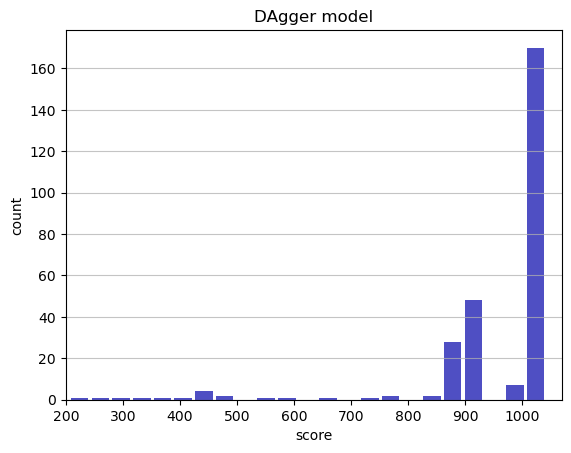

Track generation: 1196..1499 -> 303-tiles track
Epoch: 274
DAgger	mean: 951.61	variance: 142.96


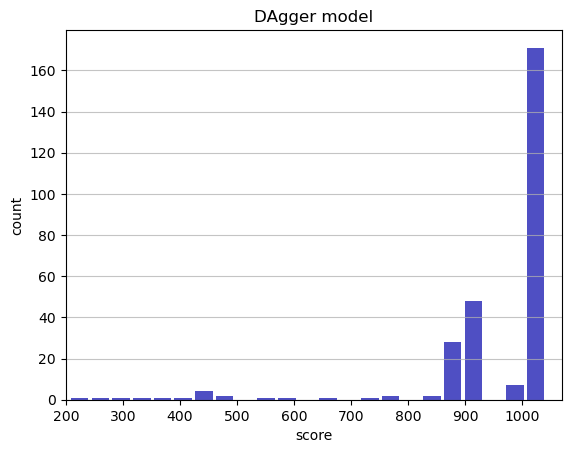

Track generation: 1183..1483 -> 300-tiles track
Epoch: 275
DAgger	mean: 951.88	variance: 142.78


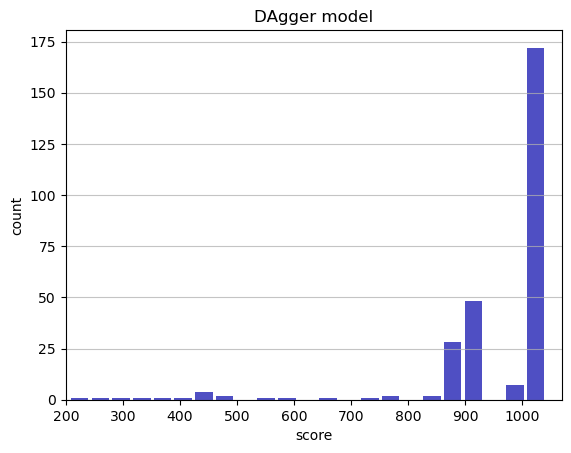

Track generation: 1100..1379 -> 279-tiles track
Epoch: 276
DAgger	mean: 952.17	variance: 142.60


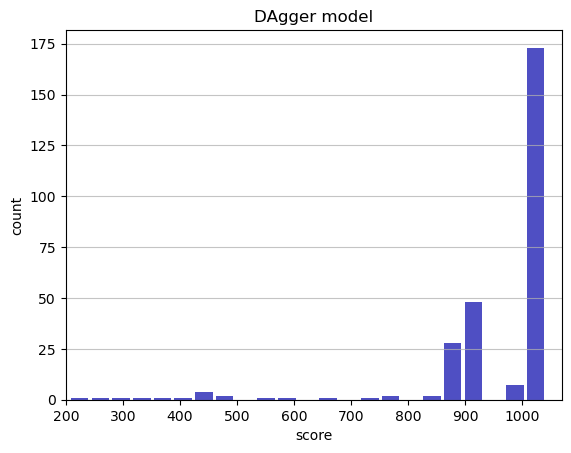

Track generation: 1290..1627 -> 337-tiles track
Epoch: 277
DAgger	mean: 951.33	variance: 143.01


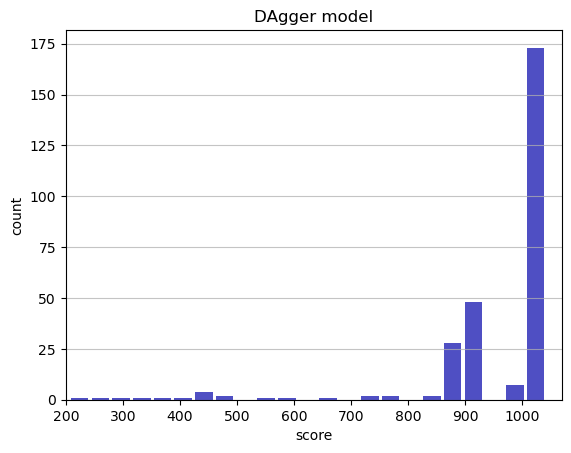

Track generation: 1178..1484 -> 306-tiles track
Epoch: 278
DAgger	mean: 951.58	variance: 142.81


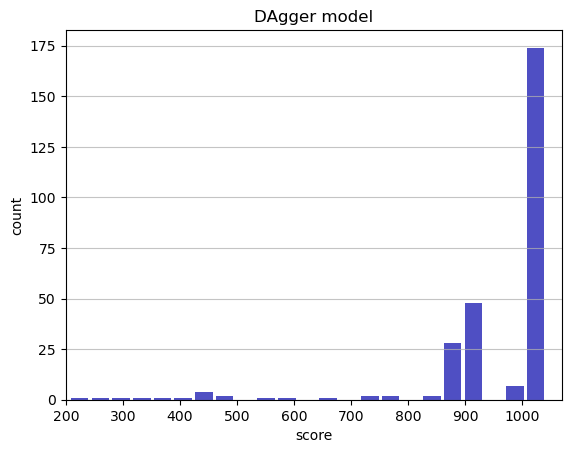

Track generation: 1236..1549 -> 313-tiles track
Epoch: 279
DAgger	mean: 951.35	variance: 142.60


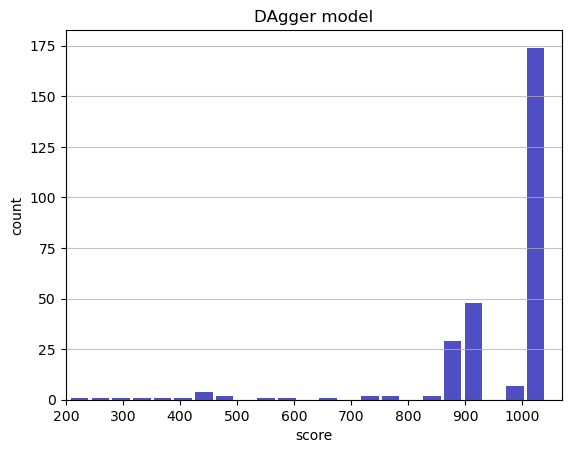

Track generation: 1218..1527 -> 309-tiles track
Epoch: 280
DAgger	mean: 951.60	variance: 142.41


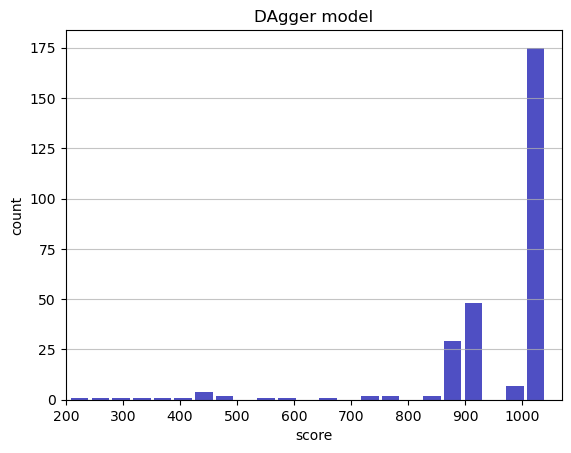

Track generation: 1296..1624 -> 328-tiles track
Epoch: 281
DAgger	mean: 951.80	variance: 142.19


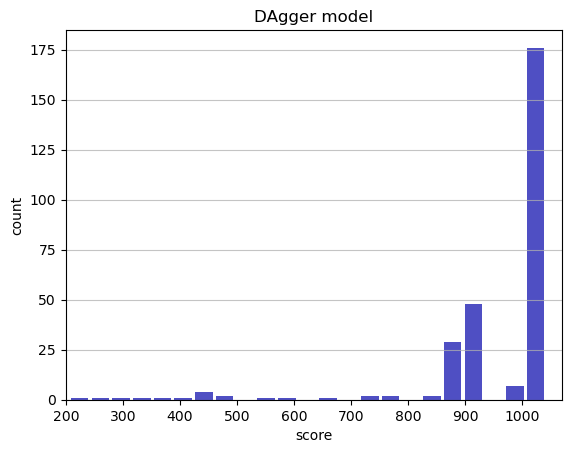

Track generation: 1220..1529 -> 309-tiles track
Epoch: 282
DAgger	mean: 952.04	variance: 142.00


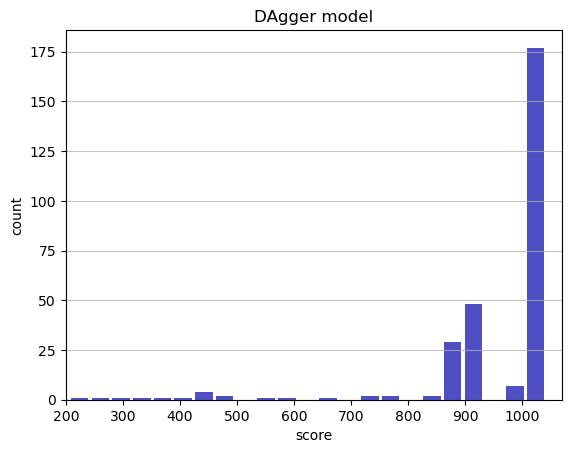

Track generation: 1091..1368 -> 277-tiles track
Epoch: 283
DAgger	mean: 952.32	variance: 141.82


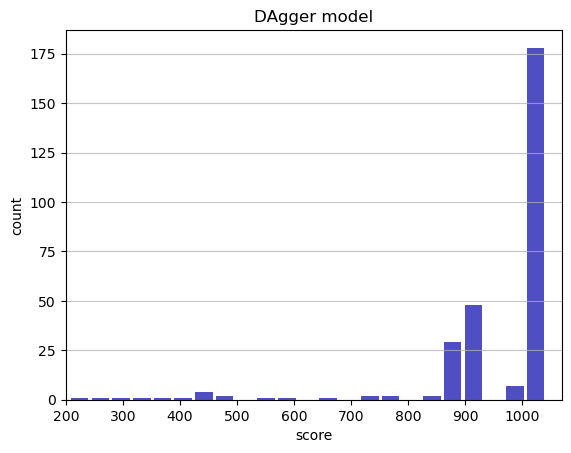

Track generation: 1130..1416 -> 286-tiles track
Epoch: 284
DAgger	mean: 952.16	variance: 141.60


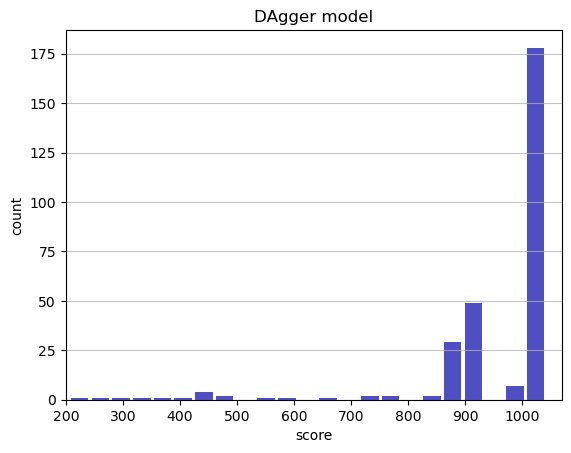

Track generation: 1184..1484 -> 300-tiles track
Epoch: 285
DAgger	mean: 951.88	variance: 141.43


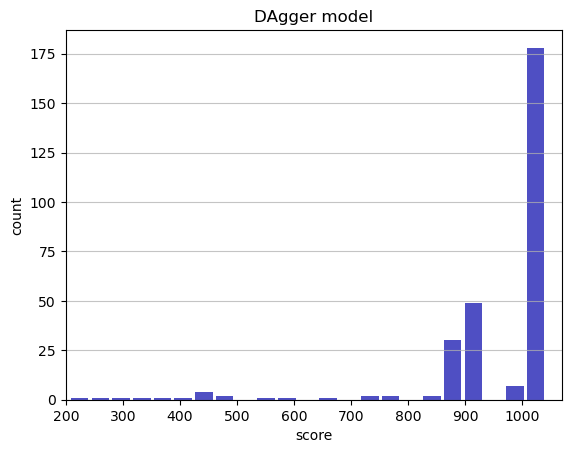

Track generation: 1270..1598 -> 328-tiles track
Epoch: 286
DAgger	mean: 951.62	variance: 141.25


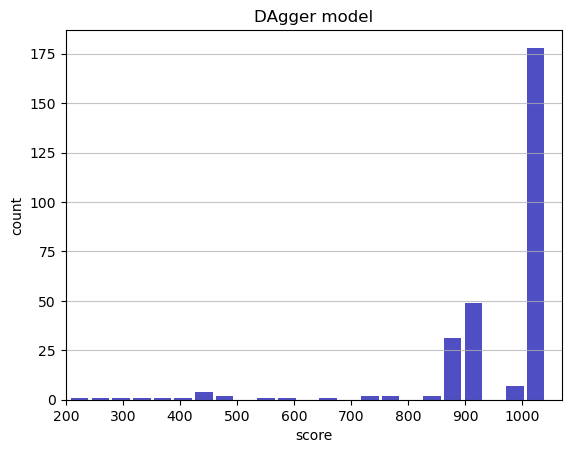

Track generation: 1203..1508 -> 305-tiles track
Epoch: 287
DAgger	mean: 951.88	variance: 141.07


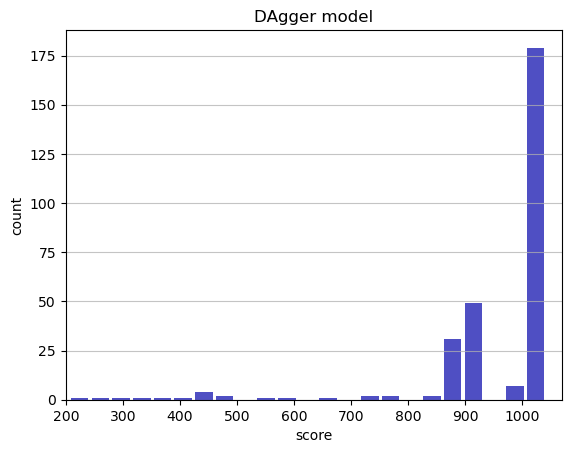

Track generation: 1205..1510 -> 305-tiles track
Epoch: 288
DAgger	mean: 952.13	variance: 140.89


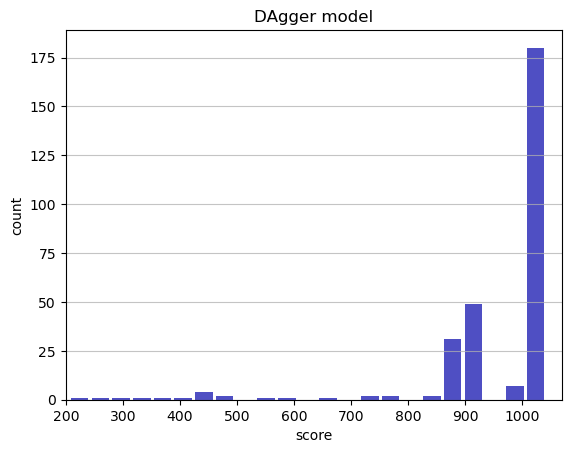

Track generation: 1331..1668 -> 337-tiles track
Epoch: 289
DAgger	mean: 951.91	variance: 140.69


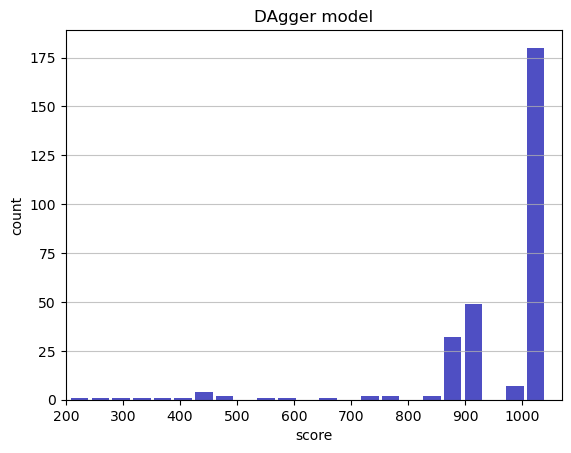

Track generation: 1196..1499 -> 303-tiles track
Epoch: 290
DAgger	mean: 952.13	variance: 140.50


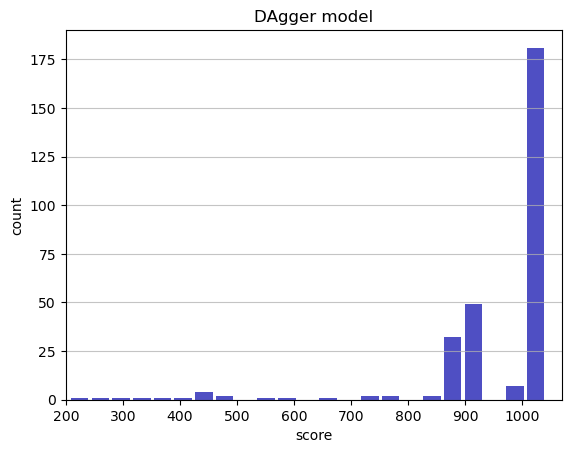

Track generation: 1096..1374 -> 278-tiles track
Epoch: 291
DAgger	mean: 951.97	variance: 140.29


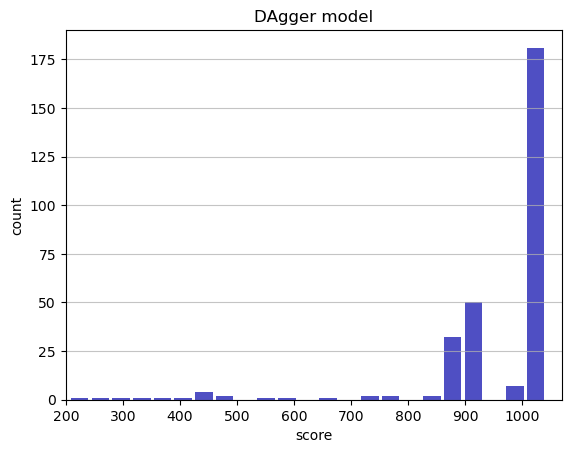

Track generation: 1182..1488 -> 306-tiles track
Epoch: 292
DAgger	mean: 952.22	variance: 140.11


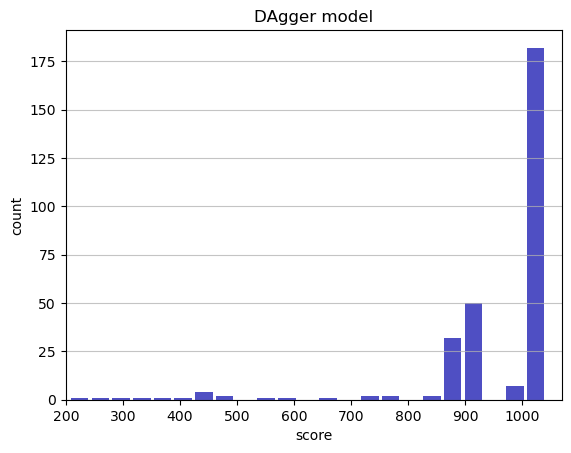

Track generation: 1196..1499 -> 303-tiles track
Epoch: 293
DAgger	mean: 952.00	variance: 139.92


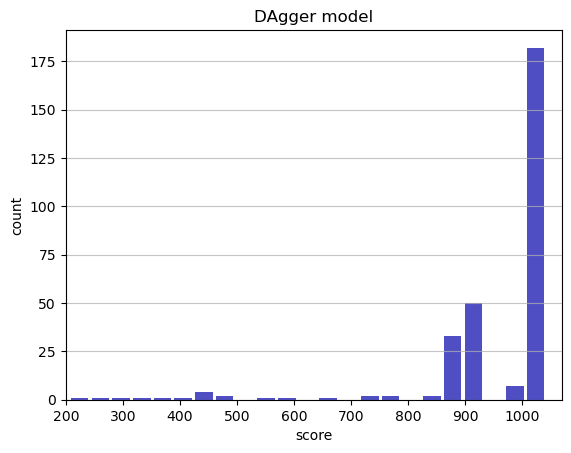

Track generation: 1108..1389 -> 281-tiles track
Epoch: 294
DAgger	mean: 952.27	variance: 139.76


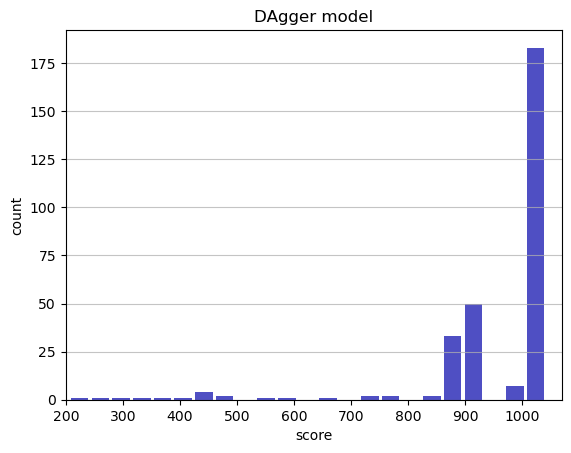

Track generation: 1074..1357 -> 283-tiles track
Epoch: 295
DAgger	mean: 952.08	variance: 139.56


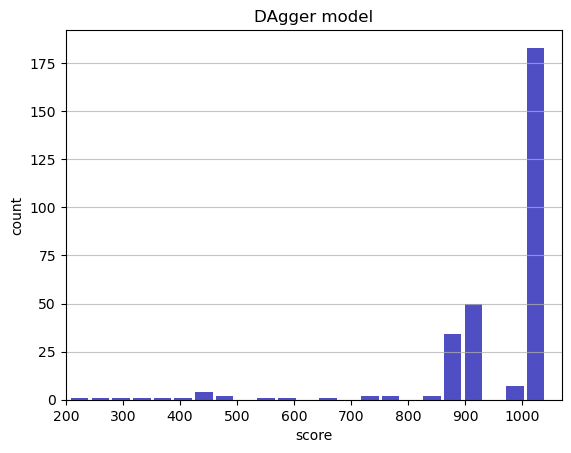

Track generation: 1325..1660 -> 335-tiles track
Epoch: 296
DAgger	mean: 952.28	variance: 139.36


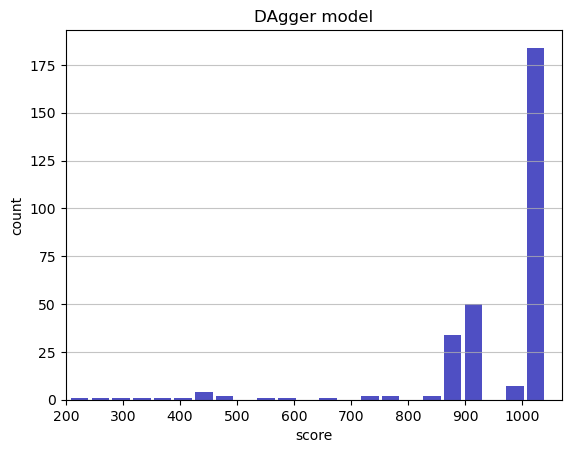

Track generation: 1218..1536 -> 318-tiles track
Epoch: 297
DAgger	mean: 952.49	variance: 139.18


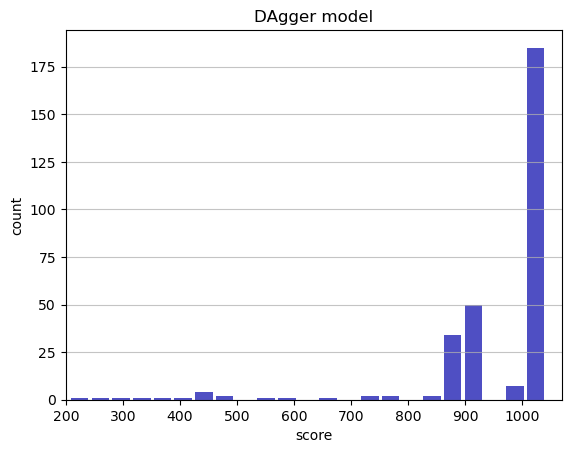

Track generation: 1232..1543 -> 311-tiles track
Epoch: 298
DAgger	mean: 952.71	variance: 139.00


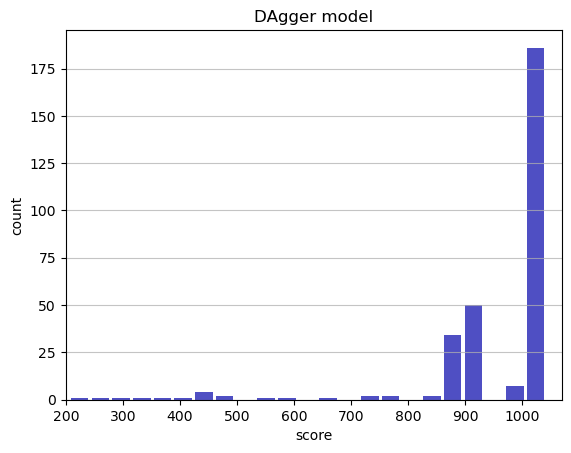

Track generation: 1218..1532 -> 314-tiles track
Epoch: 299
DAgger	mean: 952.92	variance: 138.81


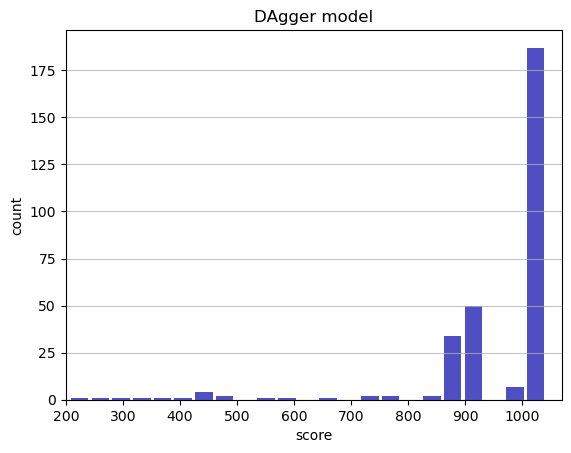

Track generation: 1100..1388 -> 288-tiles track
Epoch: 300
DAgger	mean: 952.69	variance: 138.63


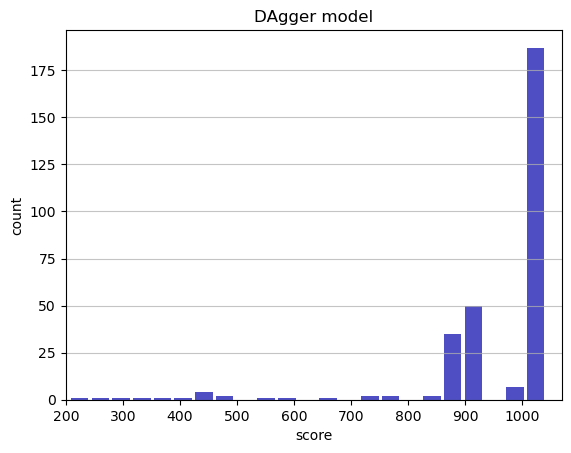

Track generation: 1108..1388 -> 280-tiles track
Epoch: 301
DAgger	mean: 952.95	variance: 138.48


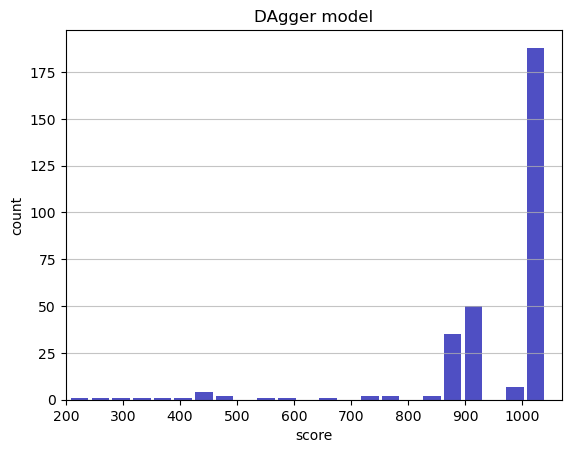

Track generation: 1107..1398 -> 291-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1084..1359 -> 275-tiles track
Epoch: 302
DAgger	mean: 952.85	variance: 138.26


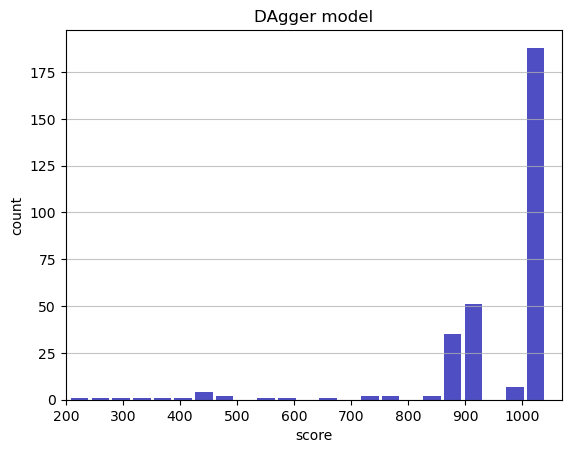

Track generation: 1061..1330 -> 269-tiles track
Epoch: 303
DAgger	mean: 952.66	variance: 138.07


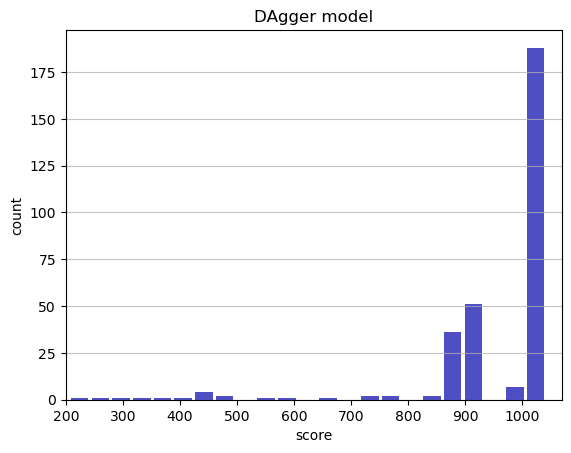

Track generation: 1303..1633 -> 330-tiles track
Epoch: 304
DAgger	mean: 952.40	variance: 137.92


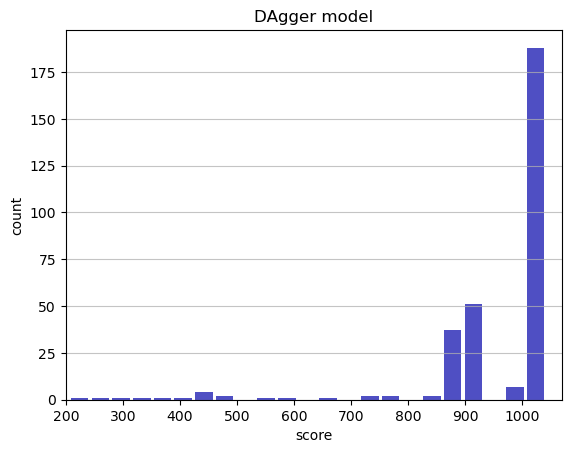

Track generation: 1088..1364 -> 276-tiles track
Epoch: 305
DAgger	mean: 952.20	variance: 137.74


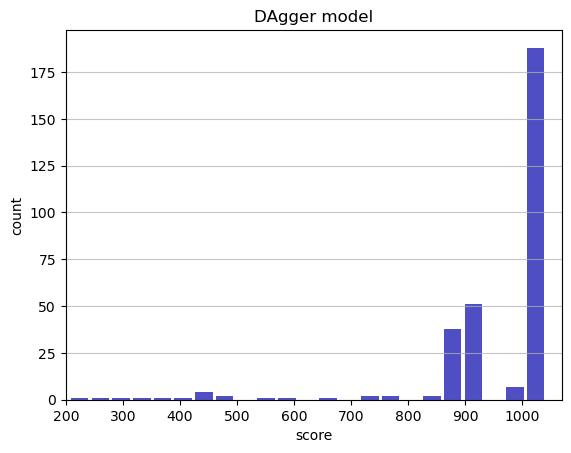

Track generation: 1208..1512 -> 304-tiles track
Epoch: 306
DAgger	mean: 950.21	variance: 141.84


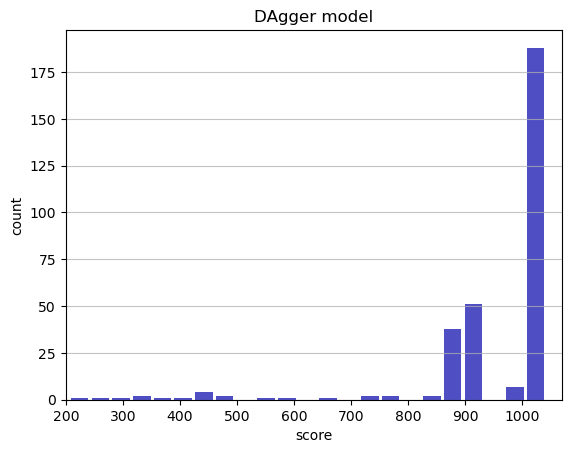

Track generation: 1194..1506 -> 312-tiles track
Epoch: 307
DAgger	mean: 950.42	variance: 141.66


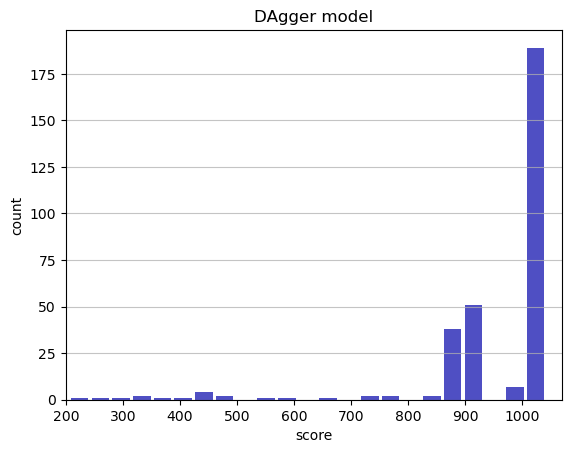

Track generation: 1215..1523 -> 308-tiles track
Epoch: 308
DAgger	mean: 950.66	variance: 141.49


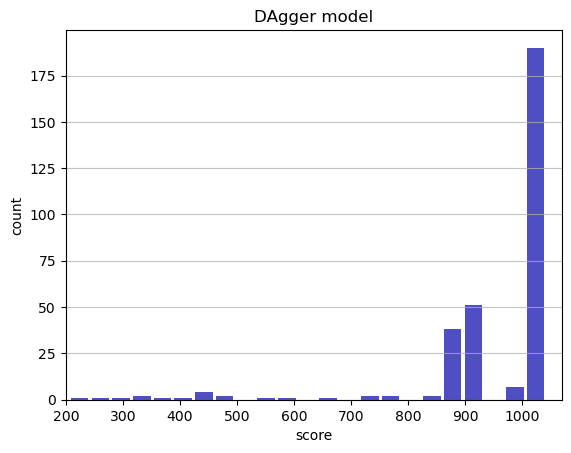

Track generation: 1111..1394 -> 283-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1171..1468 -> 297-tiles track
Epoch: 309
DAgger	mean: 950.90	variance: 141.32


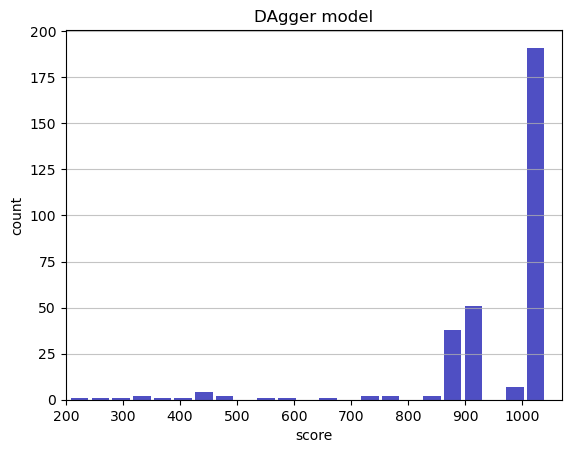

Track generation: 1307..1638 -> 331-tiles track
Epoch: 310
DAgger	mean: 951.09	variance: 141.13


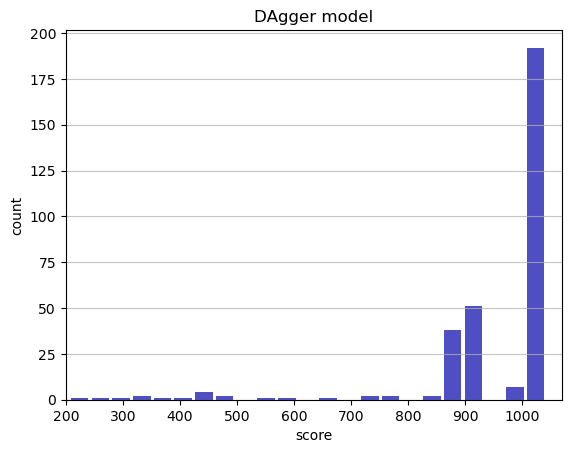

Track generation: 1115..1398 -> 283-tiles track
Epoch: 311
DAgger	mean: 951.33	variance: 140.97


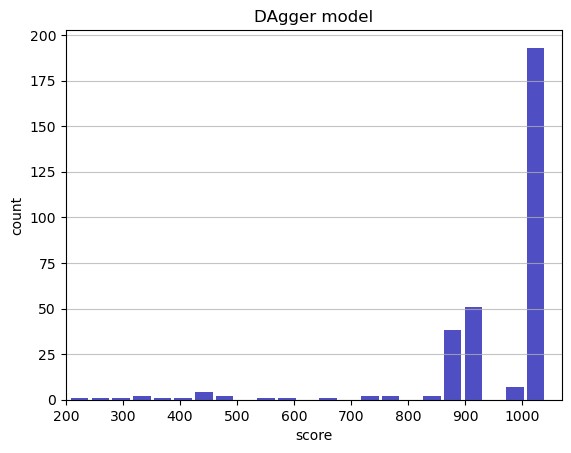

Track generation: 1259..1578 -> 319-tiles track
Epoch: 312
DAgger	mean: 951.56	variance: 140.80


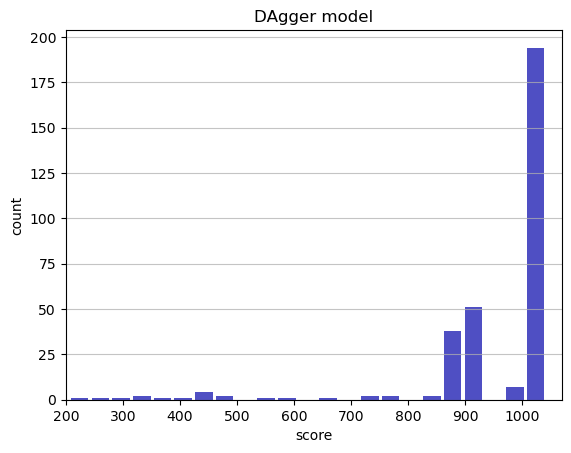

Track generation: 1294..1622 -> 328-tiles track
Epoch: 313
DAgger	mean: 951.75	variance: 140.62


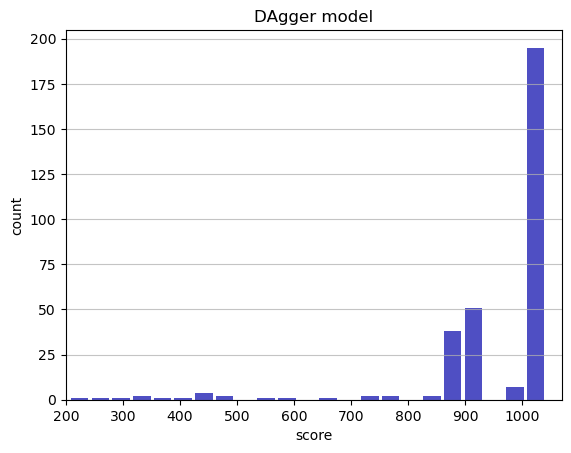

Track generation: 935..1180 -> 245-tiles track
Epoch: 314
DAgger	mean: 951.62	variance: 140.41


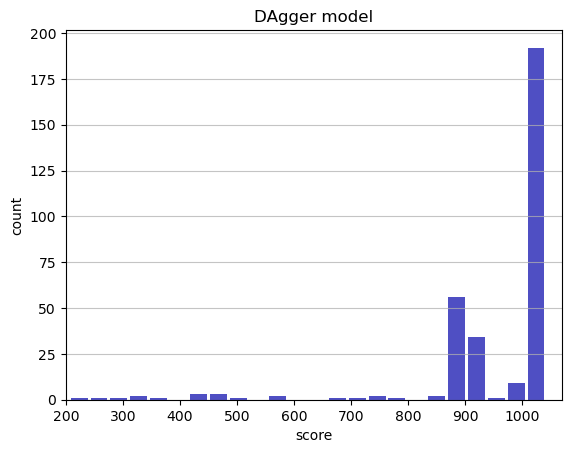

Track generation: 1074..1354 -> 280-tiles track
Epoch: 315
DAgger	mean: 950.34	variance: 141.99


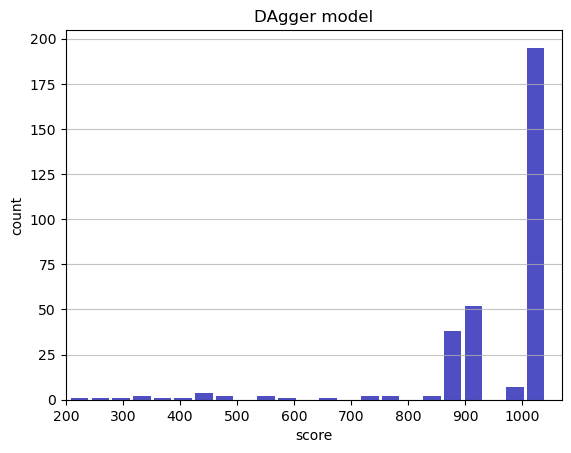

Track generation: 1284..1609 -> 325-tiles track
Epoch: 316
DAgger	mean: 950.13	variance: 141.82


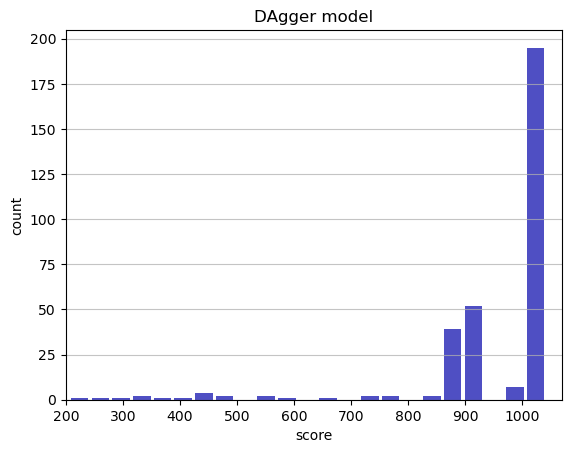

Track generation: 1067..1338 -> 271-tiles track
Epoch: 317
DAgger	mean: 950.40	variance: 141.67


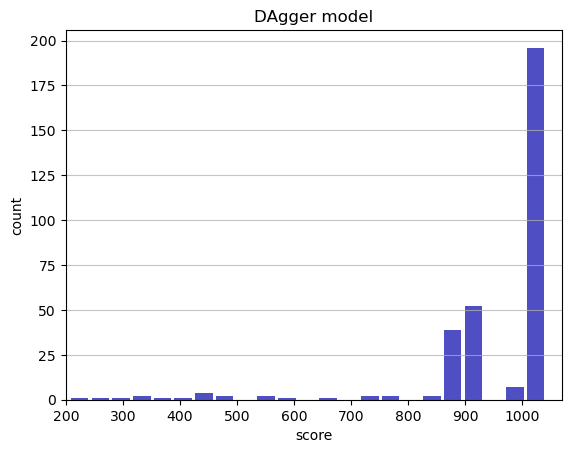

Track generation: 1214..1529 -> 315-tiles track
Epoch: 318
DAgger	mean: 950.52	variance: 141.47


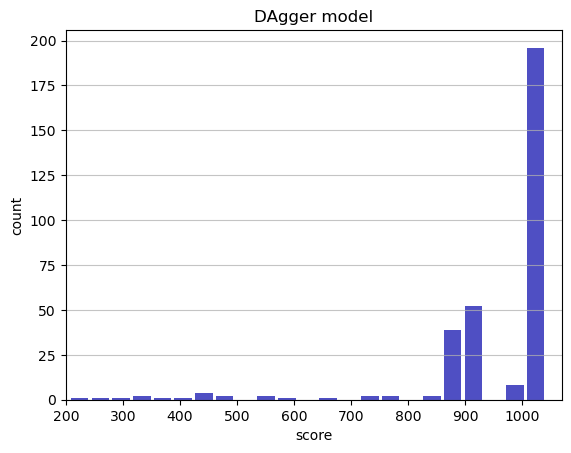

Track generation: 1177..1480 -> 303-tiles track
Epoch: 319
DAgger	mean: 950.35	variance: 141.28


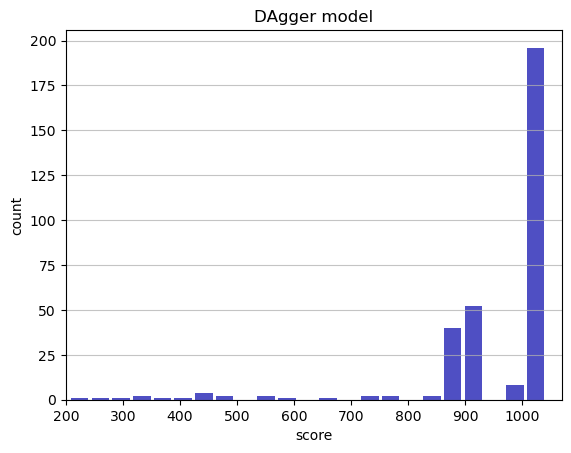

Track generation: 1010..1267 -> 257-tiles track
Epoch: 320
DAgger	mean: 950.62	variance: 141.14


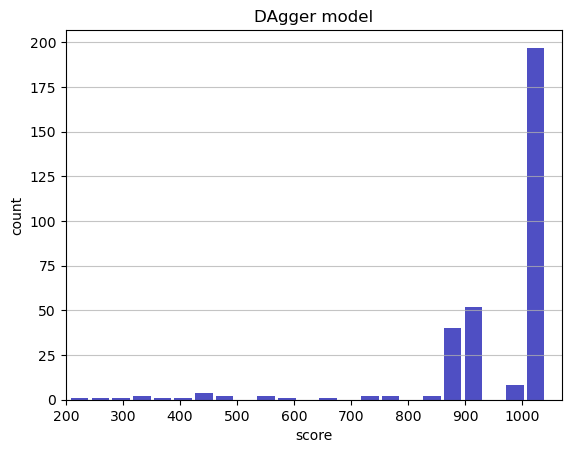

Track generation: 1071..1343 -> 272-tiles track
Epoch: 321
DAgger	mean: 950.48	variance: 140.94


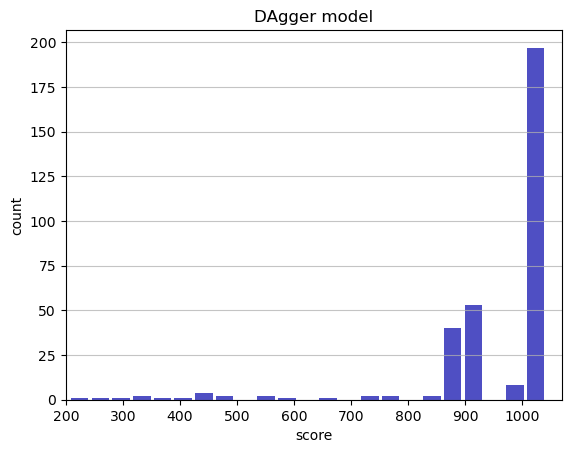

Track generation: 1196..1499 -> 303-tiles track
Epoch: 322
DAgger	mean: 950.71	variance: 140.78


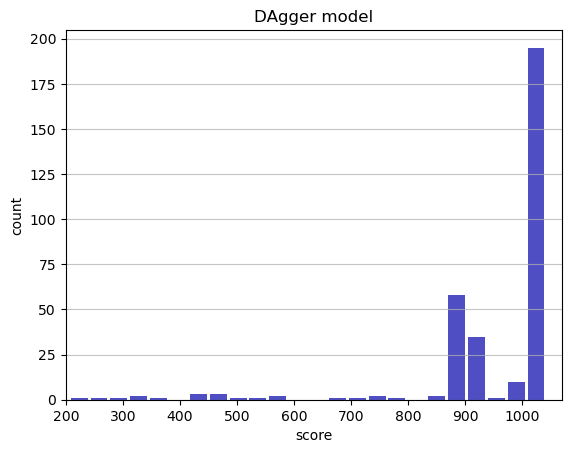

Track generation: 1300..1629 -> 329-tiles track
Epoch: 323
DAgger	mean: 948.83	variance: 144.56


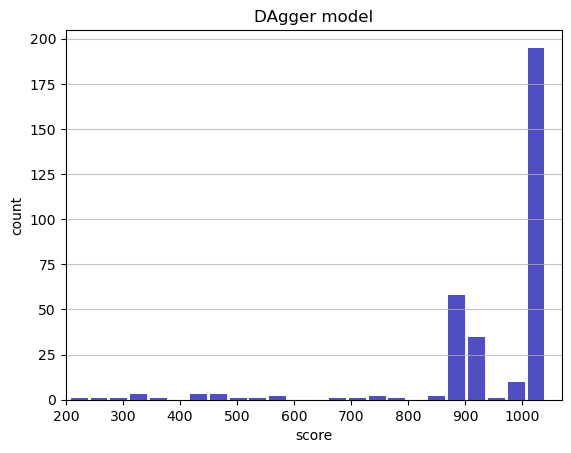

Track generation: 1115..1407 -> 292-tiles track
Epoch: 324
DAgger	mean: 949.04	variance: 144.39


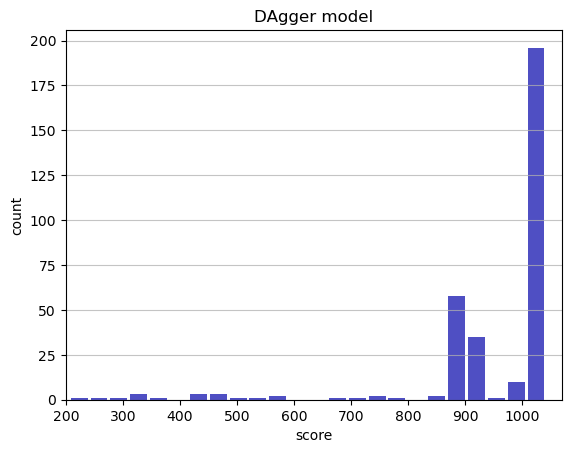

Track generation: 1217..1525 -> 308-tiles track
Epoch: 325
DAgger	mean: 948.80	variance: 144.23


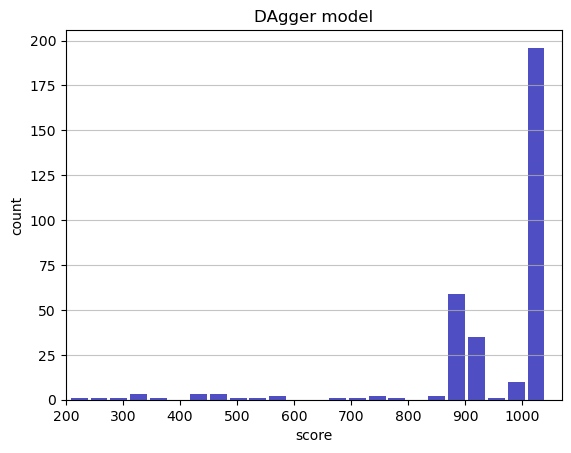

Track generation: 1060..1336 -> 276-tiles track
Epoch: 326
DAgger	mean: 948.70	variance: 144.02


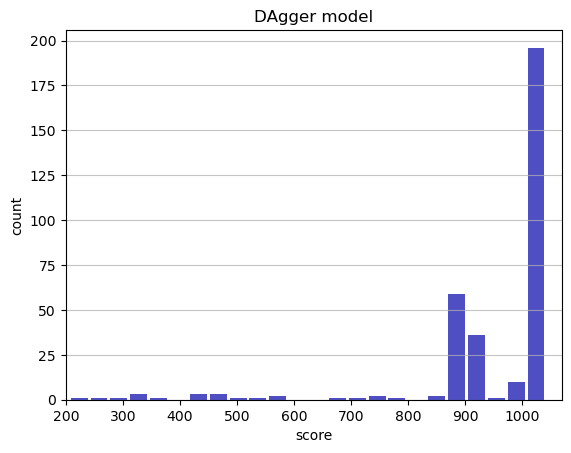

Track generation: 1115..1398 -> 283-tiles track
Epoch: 327
DAgger	mean: 948.96	variance: 143.88


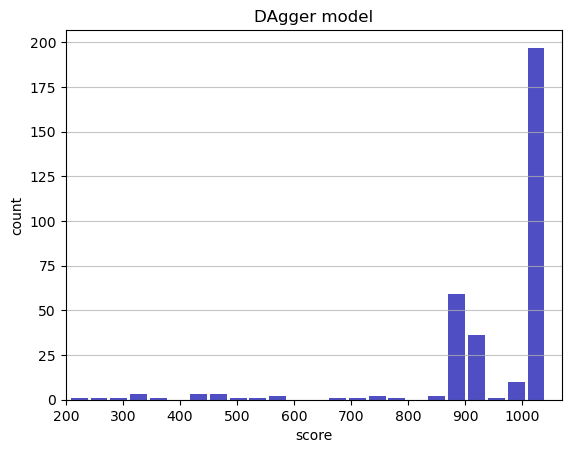

Track generation: 1190..1491 -> 301-tiles track
Epoch: 328
DAgger	mean: 949.17	variance: 143.71


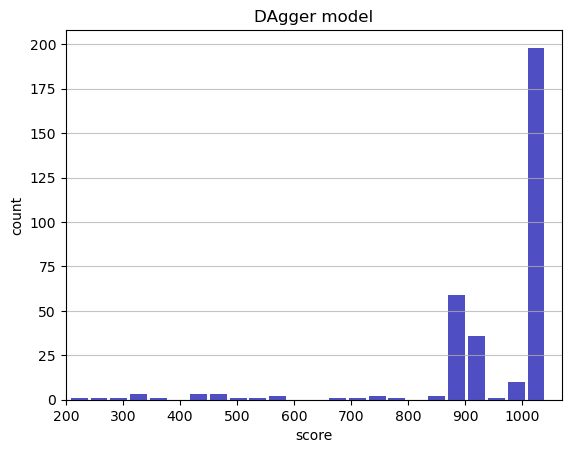

Track generation: 1115..1398 -> 283-tiles track
Epoch: 329
DAgger	mean: 949.02	variance: 143.52


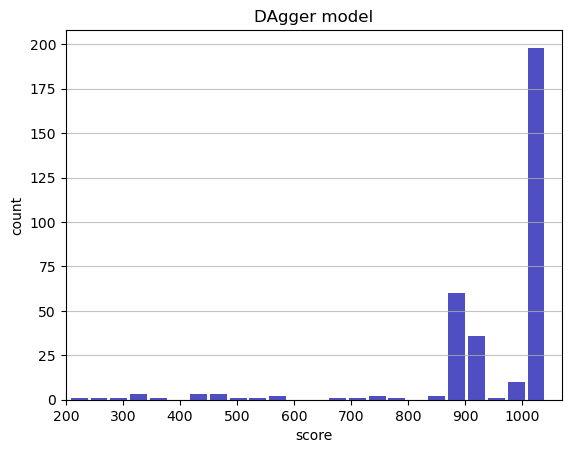

Track generation: 1155..1448 -> 293-tiles track
Epoch: 330
DAgger	mean: 949.25	variance: 143.36


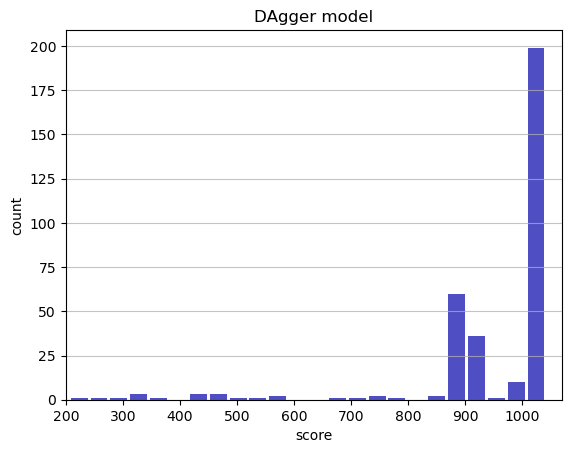

Track generation: 1172..1469 -> 297-tiles track
Epoch: 331
DAgger	mean: 949.09	variance: 143.17


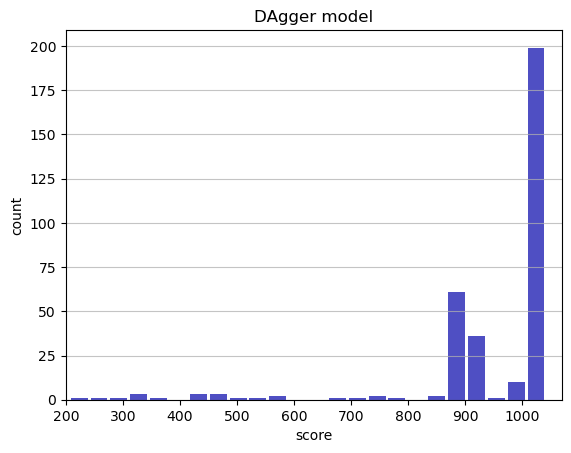

Track generation: 1244..1559 -> 315-tiles track
Epoch: 332
DAgger	mean: 949.32	variance: 143.01


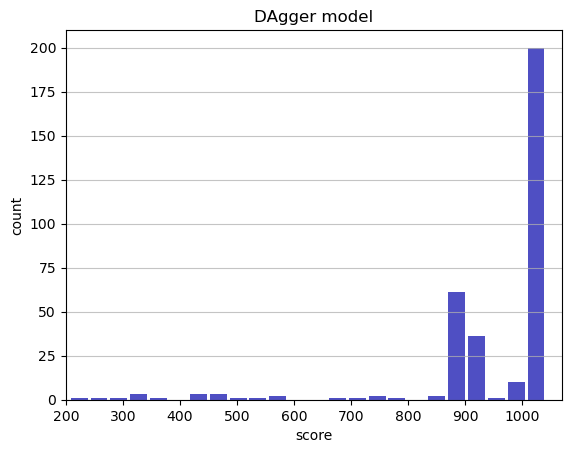

Track generation: 1153..1445 -> 292-tiles track
Epoch: 333
DAgger	mean: 949.53	variance: 142.86


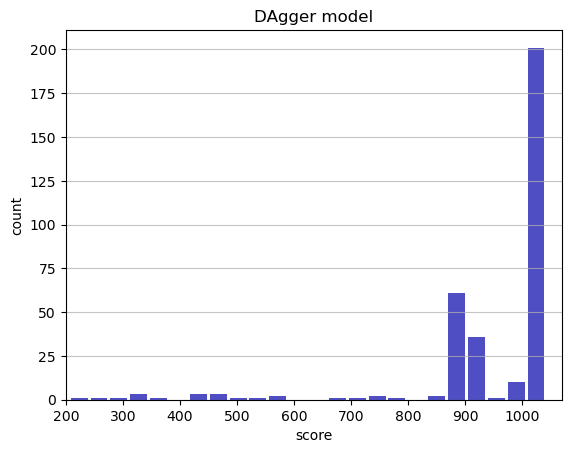

Track generation: 1079..1353 -> 274-tiles track
Epoch: 334
DAgger	mean: 949.79	variance: 142.72


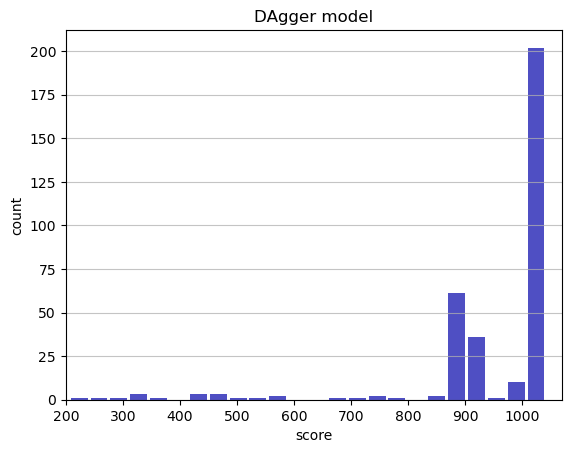

Track generation: 996..1249 -> 253-tiles track
Epoch: 335
DAgger	mean: 950.06	variance: 142.59


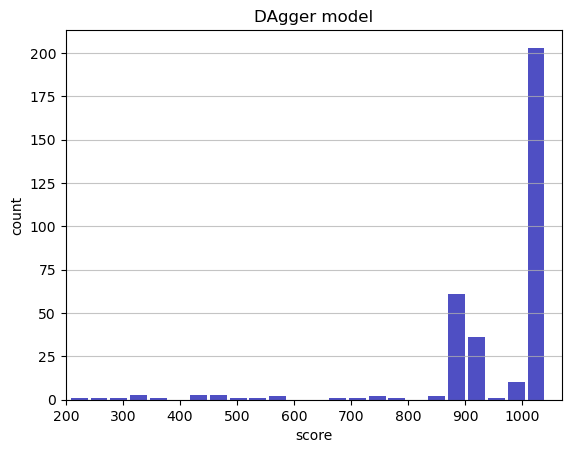

Track generation: 1057..1325 -> 268-tiles track
Epoch: 336
DAgger	mean: 950.32	variance: 142.45


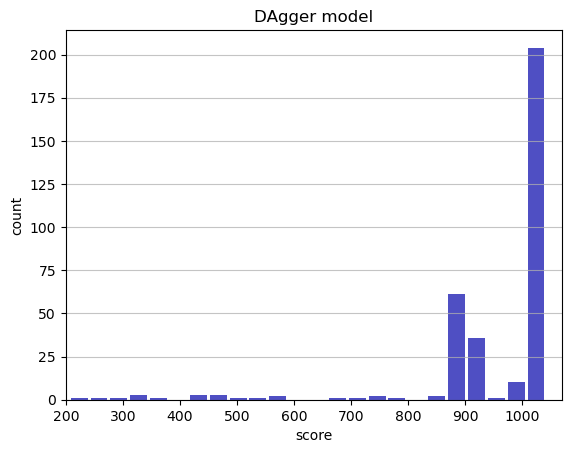

Track generation: 1076..1349 -> 273-tiles track
Epoch: 337
DAgger	mean: 950.21	variance: 142.26


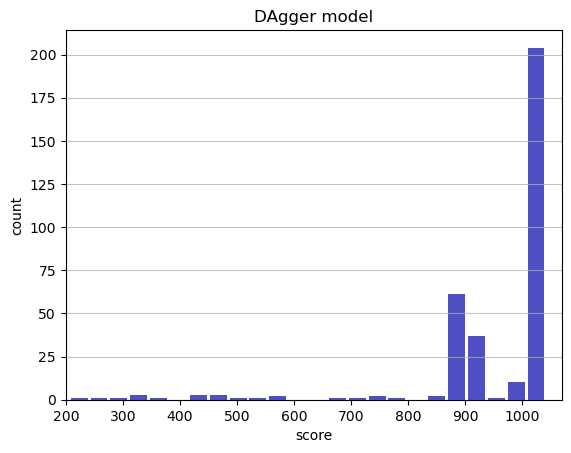

Track generation: 1075..1348 -> 273-tiles track
Epoch: 338
DAgger	mean: 950.45	variance: 142.11


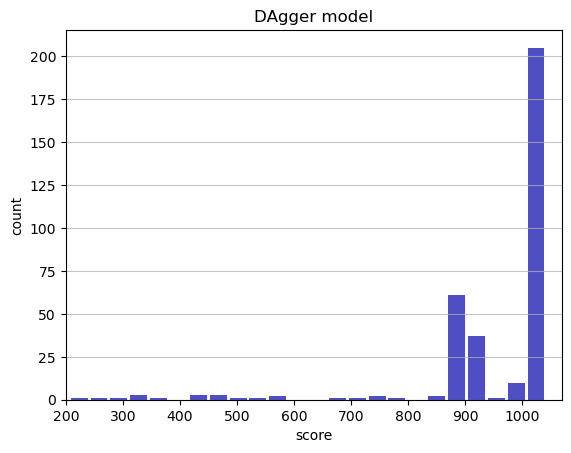

Track generation: 1252..1569 -> 317-tiles track
Epoch: 339
DAgger	mean: 950.27	variance: 141.94


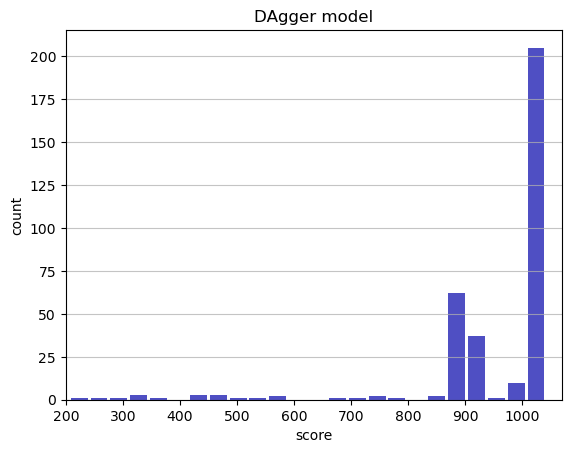

Track generation: 1160..1454 -> 294-tiles track
Epoch: 340
DAgger	mean: 950.10	variance: 141.77


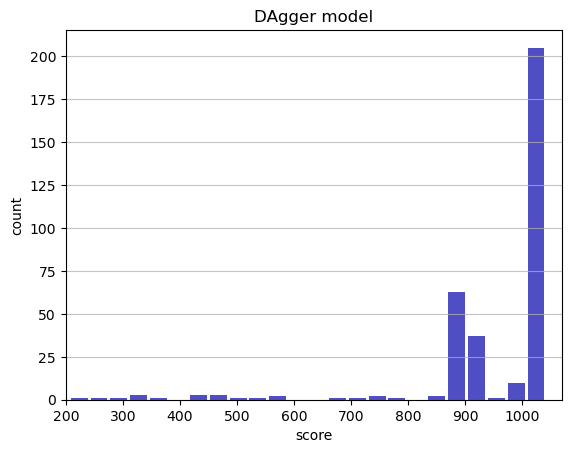

Track generation: 1342..1690 -> 348-tiles track
Epoch: 341
DAgger	mean: 950.17	variance: 141.57


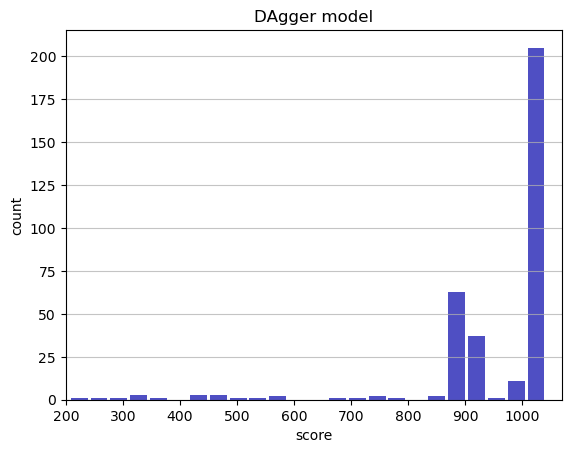

Track generation: 1023..1288 -> 265-tiles track
Epoch: 342
DAgger	mean: 950.02	variance: 141.38


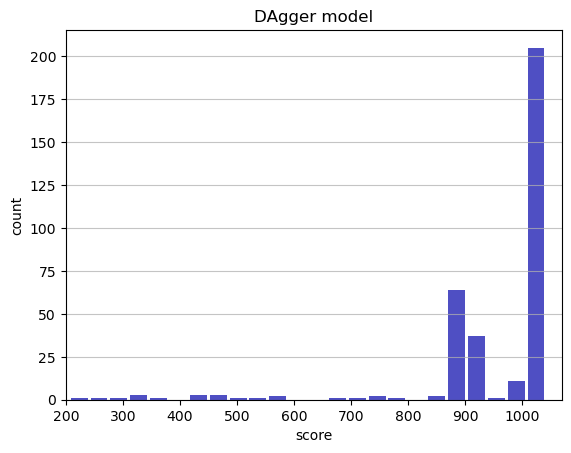

Track generation: 1123..1407 -> 284-tiles track
Epoch: 343
DAgger	mean: 950.26	variance: 141.25


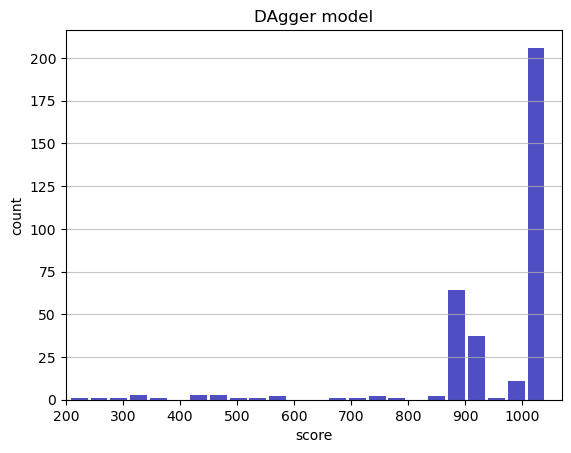

Track generation: 1344..1684 -> 340-tiles track
Epoch: 344
DAgger	mean: 950.43	variance: 141.07


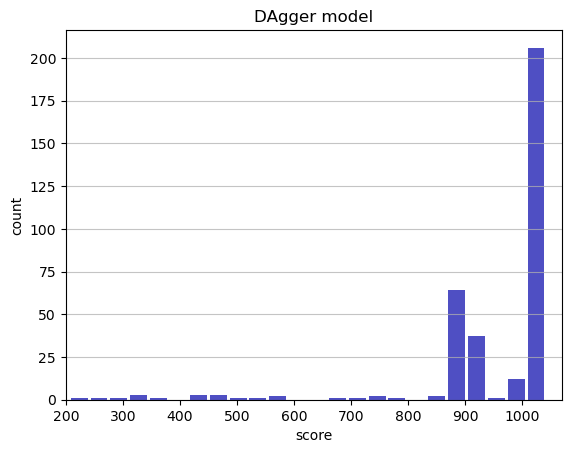

Track generation: 1180..1479 -> 299-tiles track
Epoch: 345
DAgger	mean: 950.64	variance: 140.93


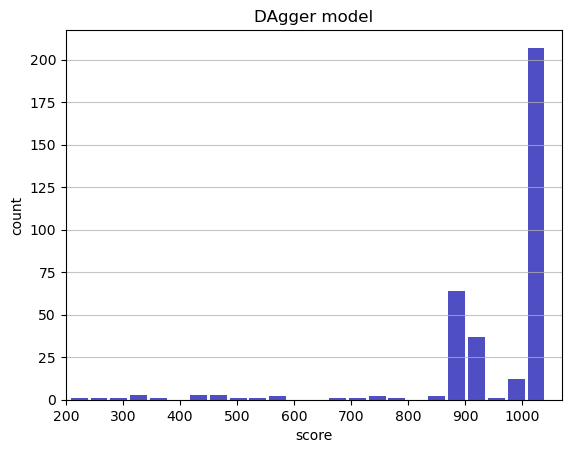

Track generation: 1048..1314 -> 266-tiles track
Epoch: 346
DAgger	mean: 950.88	variance: 140.79


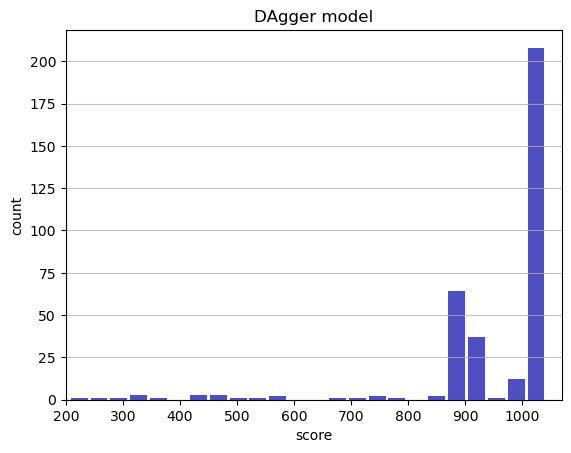

Track generation: 1041..1305 -> 264-tiles track
Epoch: 347
DAgger	mean: 950.72	variance: 140.62


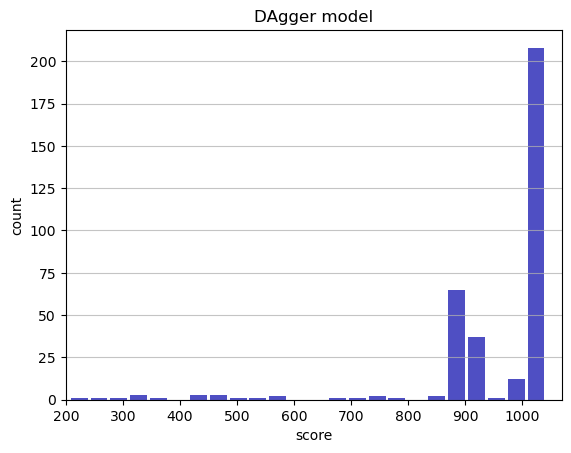

Track generation: 1120..1407 -> 287-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1136..1424 -> 288-tiles track
Epoch: 348
DAgger	mean: 949.73	variance: 141.60


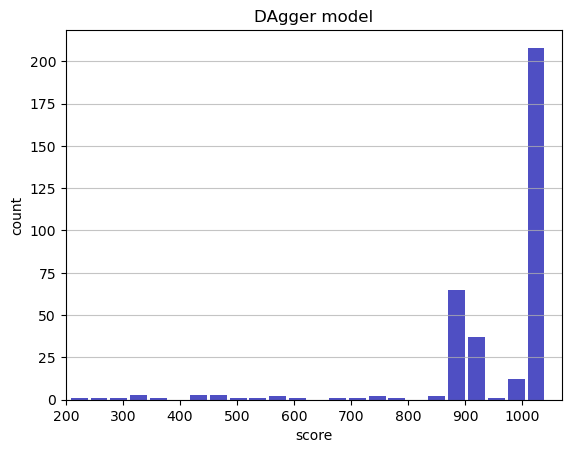

Track generation: 1190..1499 -> 309-tiles track
Epoch: 349
DAgger	mean: 949.61	variance: 141.42


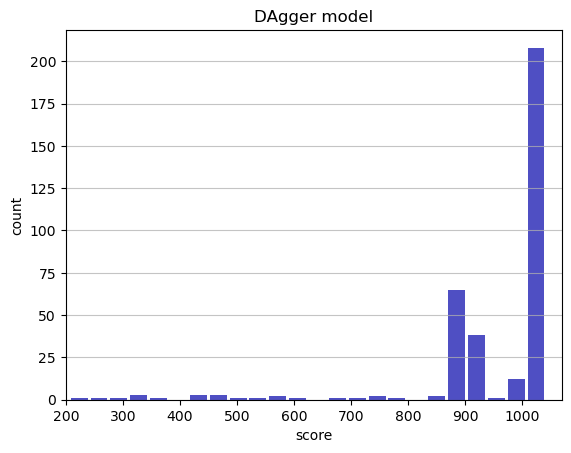

Track generation: 1240..1554 -> 314-tiles track
Epoch: 350
DAgger	mean: 949.80	variance: 141.26


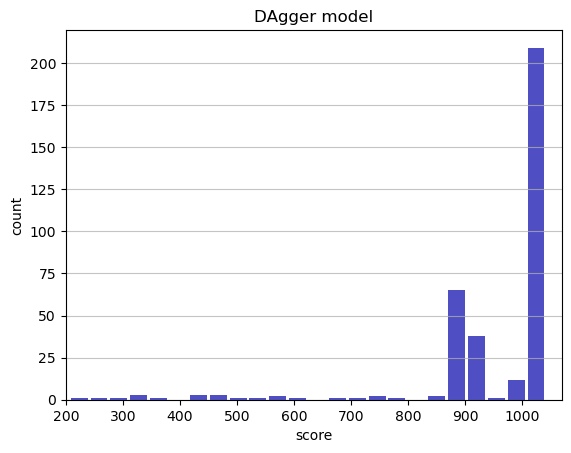

Track generation: 1075..1348 -> 273-tiles track
Epoch: 351
DAgger	mean: 950.02	variance: 141.12


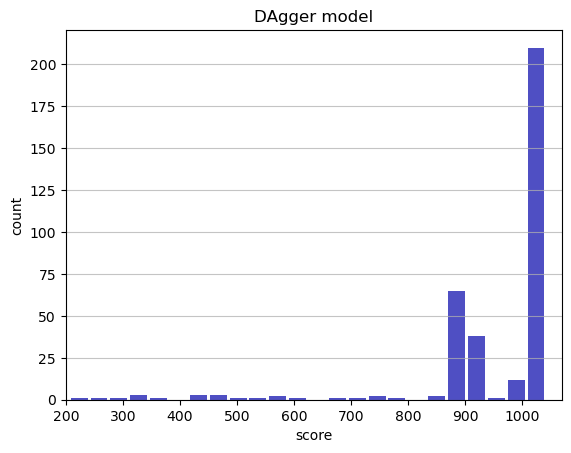

Track generation: 1067..1343 -> 276-tiles track
Epoch: 352
DAgger	mean: 950.26	variance: 140.99


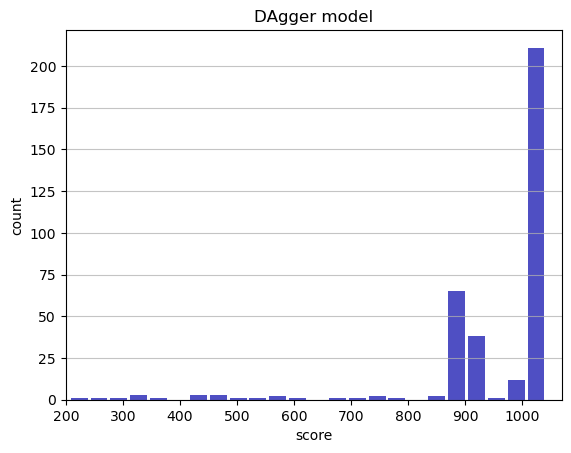

Track generation: 1292..1619 -> 327-tiles track
Epoch: 353
DAgger	mean: 948.82	variance: 143.35


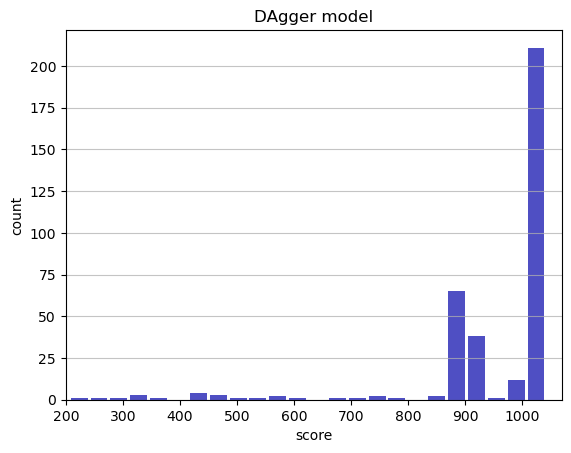

Track generation: 1075..1348 -> 273-tiles track
Epoch: 354
DAgger	mean: 948.11	variance: 143.78


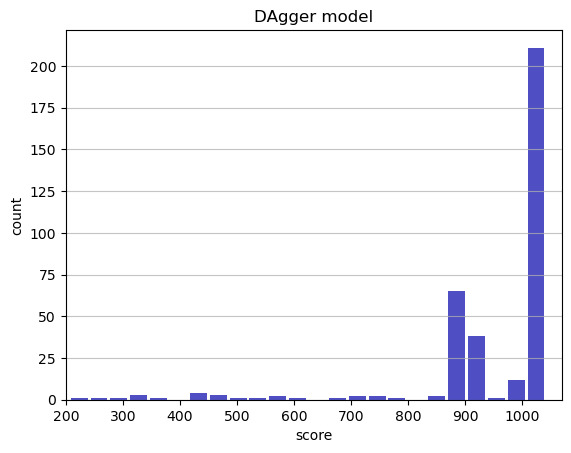

Track generation: 1283..1618 -> 335-tiles track
Epoch: 355
DAgger	mean: 948.28	variance: 143.61


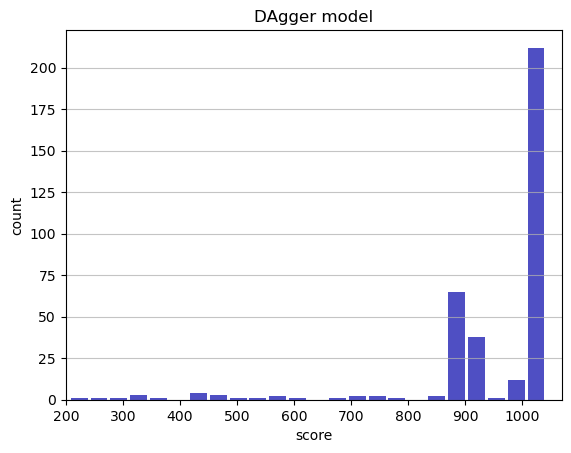

Track generation: 1180..1479 -> 299-tiles track
Epoch: 356
DAgger	mean: 948.50	variance: 143.47


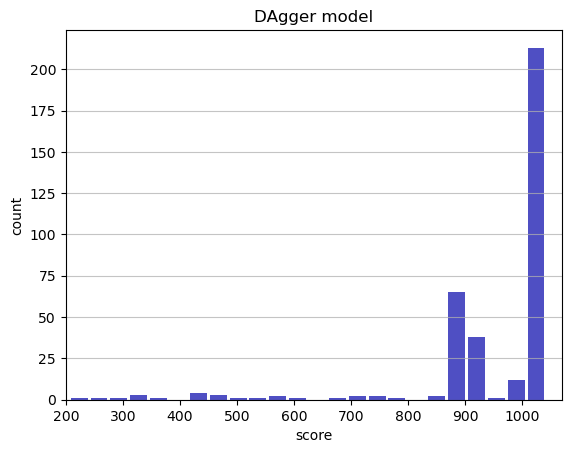

Track generation: 1144..1442 -> 298-tiles track
Epoch: 357
DAgger	mean: 948.34	variance: 143.29


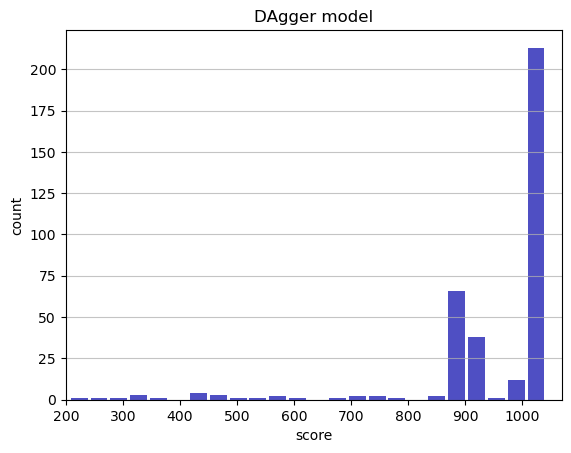

Track generation: 1269..1589 -> 320-tiles track
Epoch: 358
DAgger	mean: 948.51	variance: 143.13


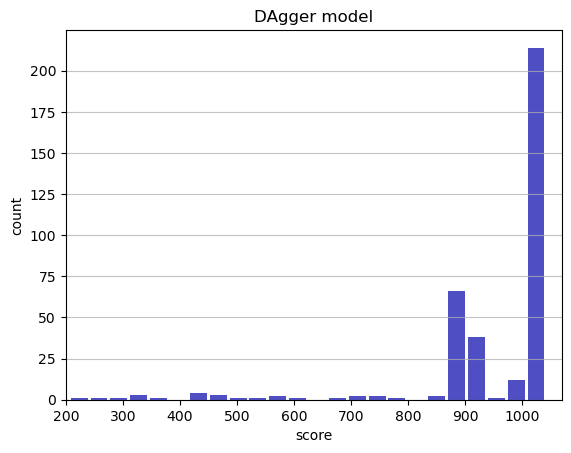

Track generation: 1107..1388 -> 281-tiles track
Epoch: 359
DAgger	mean: 948.37	variance: 142.95


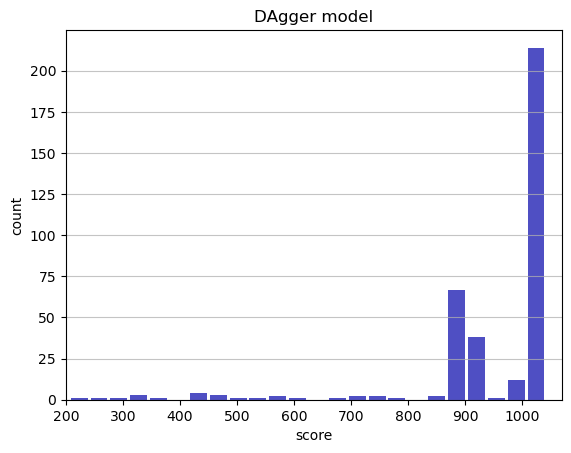

Track generation: 1099..1378 -> 279-tiles track
Epoch: 360
DAgger	mean: 948.59	variance: 142.82


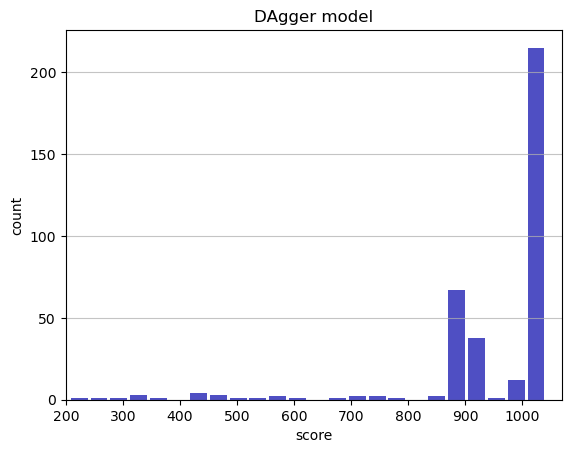

Track generation: 1092..1369 -> 277-tiles track
Epoch: 361
DAgger	mean: 948.82	variance: 142.68


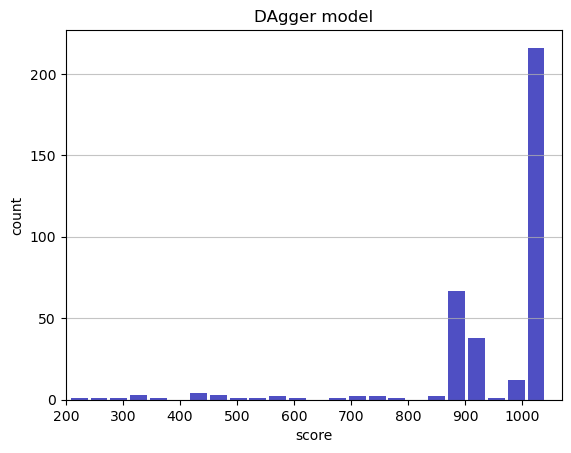

Track generation: 1058..1327 -> 269-tiles track
Epoch: 362
DAgger	mean: 949.03	variance: 142.54


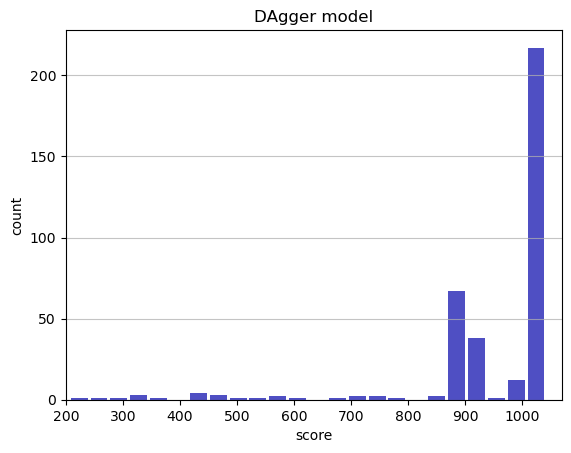

Track generation: 1084..1359 -> 275-tiles track
Epoch: 363
DAgger	mean: 948.87	variance: 142.38


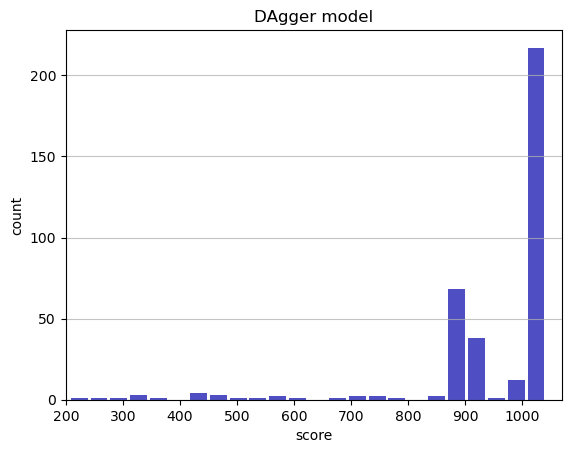

Track generation: 1156..1449 -> 293-tiles track
Epoch: 364
DAgger	mean: 949.08	variance: 142.24


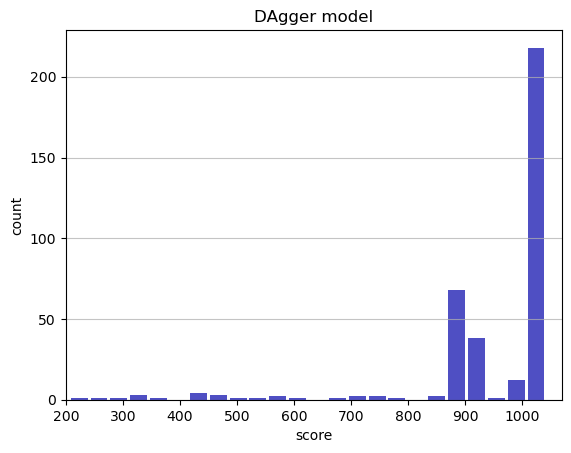

Track generation: 1385..1744 -> 359-tiles track
Epoch: 365
DAgger	mean: 949.07	variance: 142.05


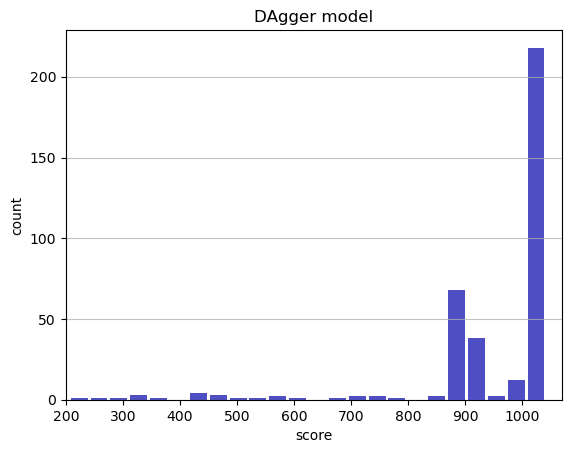

Track generation: 1300..1629 -> 329-tiles track
Epoch: 366
DAgger	mean: 948.89	variance: 141.90


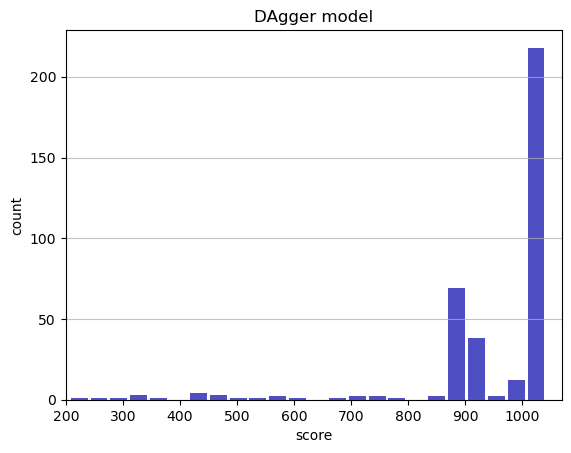

Track generation: 1251..1568 -> 317-tiles track
Epoch: 367
DAgger	mean: 949.06	variance: 141.75


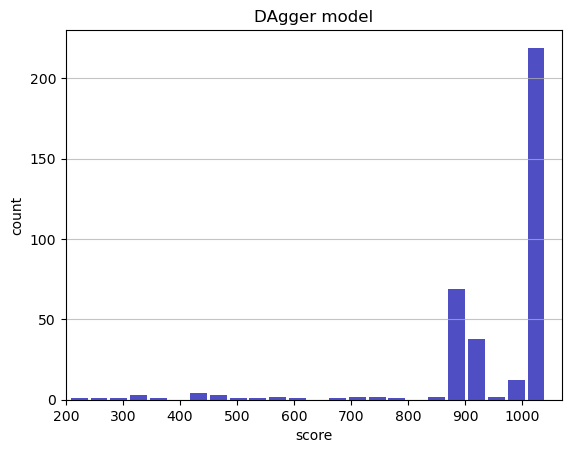

Track generation: 1068..1339 -> 271-tiles track
Epoch: 368
DAgger	mean: 948.96	variance: 141.57


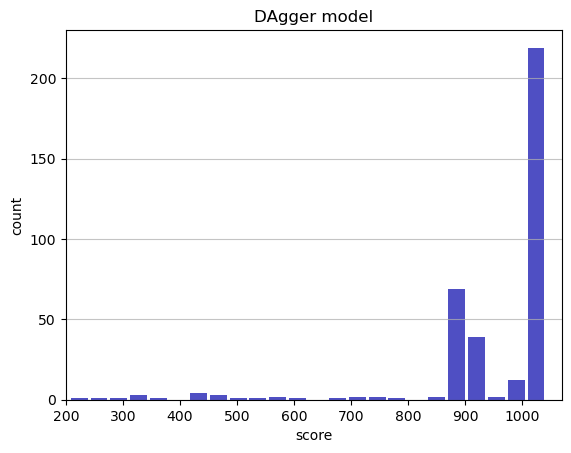

Track generation: 1258..1577 -> 319-tiles track
Epoch: 369
DAgger	mean: 948.83	variance: 141.40


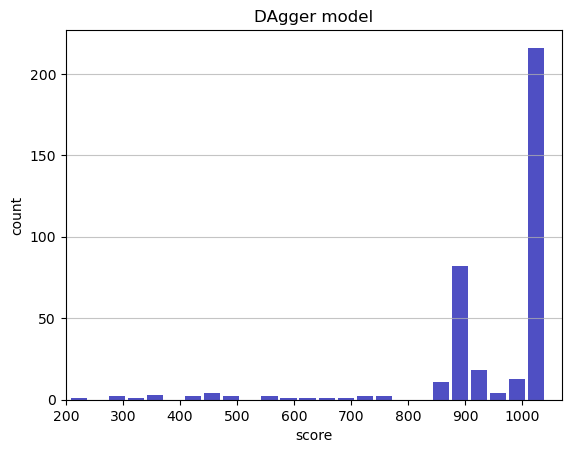

Track generation: 1131..1418 -> 287-tiles track
Epoch: 370
DAgger	mean: 947.74	variance: 142.75


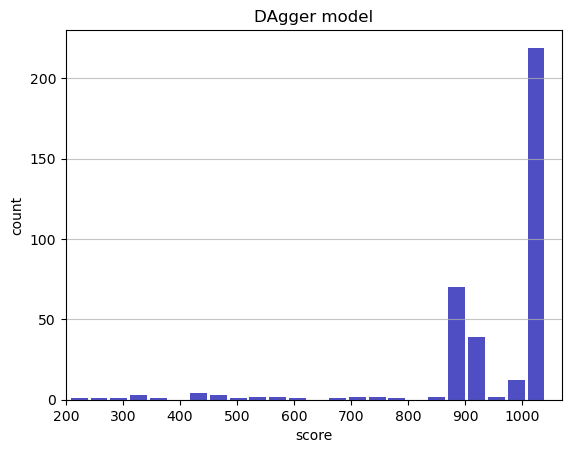

Track generation: 974..1222 -> 248-tiles track
Epoch: 371
DAgger	mean: 948.00	variance: 142.64


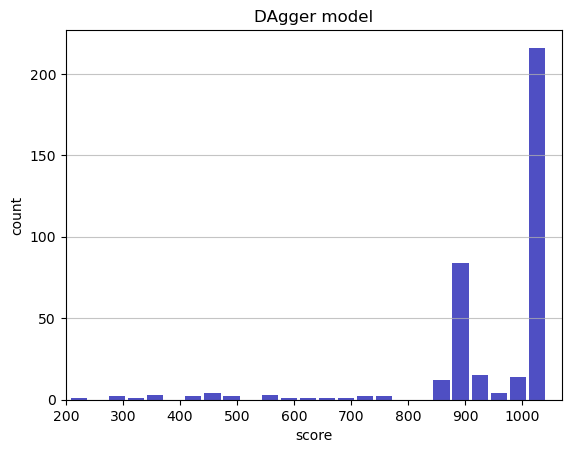

Track generation: 1085..1367 -> 282-tiles track
Epoch: 372
DAgger	mean: 948.21	variance: 142.51


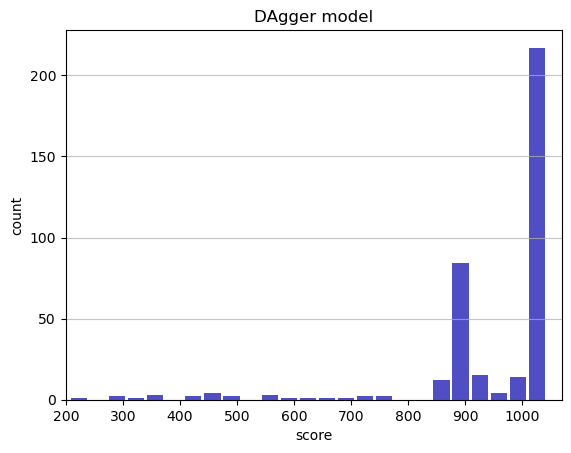

Track generation: 1124..1409 -> 285-tiles track
Epoch: 373
DAgger	mean: 948.43	variance: 142.38


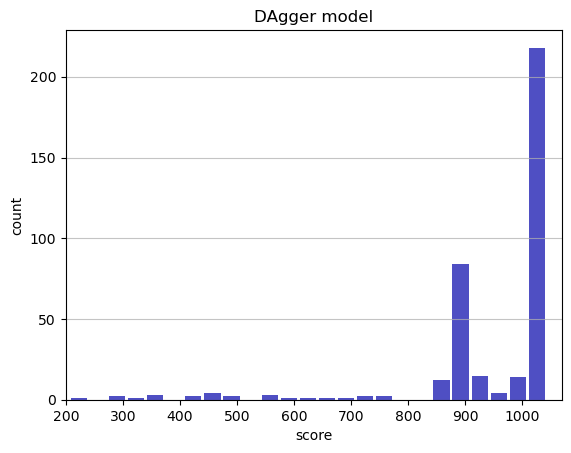

Track generation: 1160..1454 -> 294-tiles track
Epoch: 374
DAgger	mean: 948.21	variance: 142.25


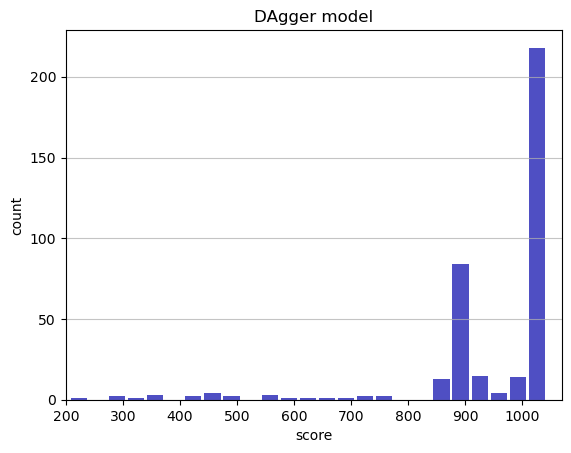

Track generation: 1194..1497 -> 303-tiles track
Epoch: 375
DAgger	mean: 948.41	variance: 142.12


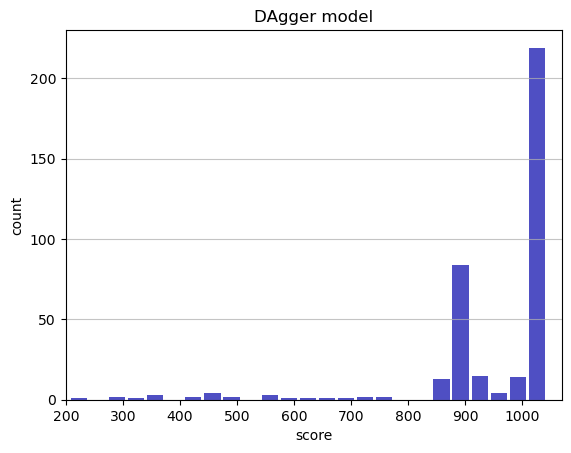

Track generation: 980..1231 -> 251-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1126..1412 -> 286-tiles track
Epoch: 376
DAgger	mean: 948.61	variance: 141.98


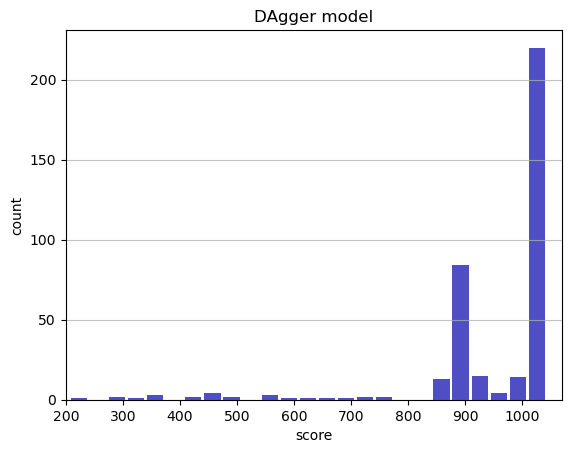

Track generation: 1120..1404 -> 284-tiles track
Epoch: 377
DAgger	mean: 948.83	variance: 141.86


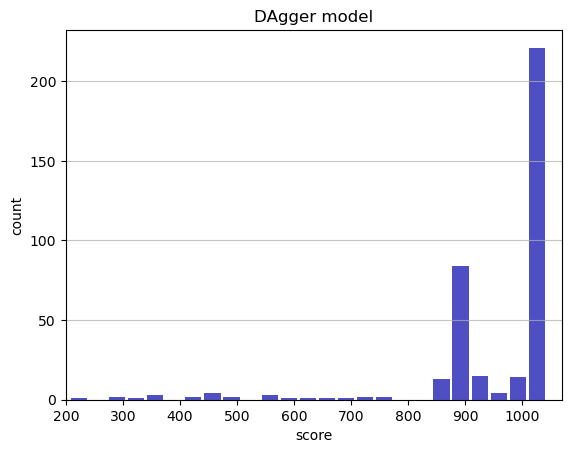

Track generation: 1209..1515 -> 306-tiles track
Epoch: 378
DAgger	mean: 949.01	variance: 141.71


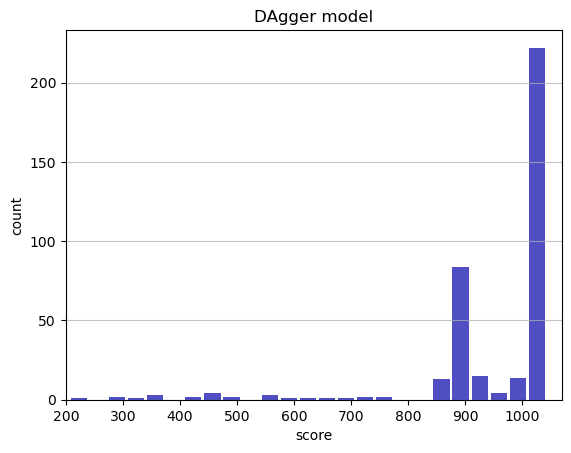

Track generation: 1162..1463 -> 301-tiles track
Epoch: 379
DAgger	mean: 949.20	variance: 141.57


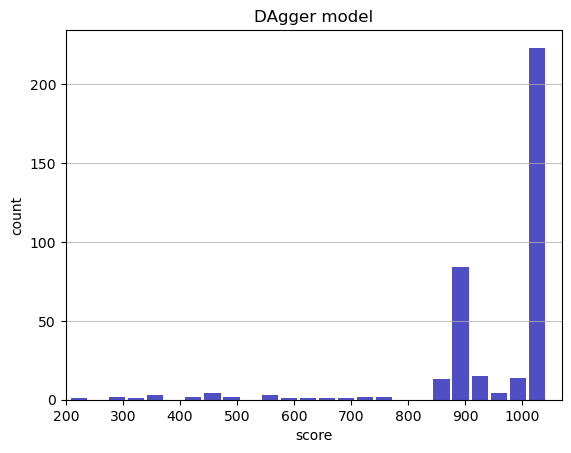

Track generation: 1144..1434 -> 290-tiles track
Epoch: 380
DAgger	mean: 949.38	variance: 141.43


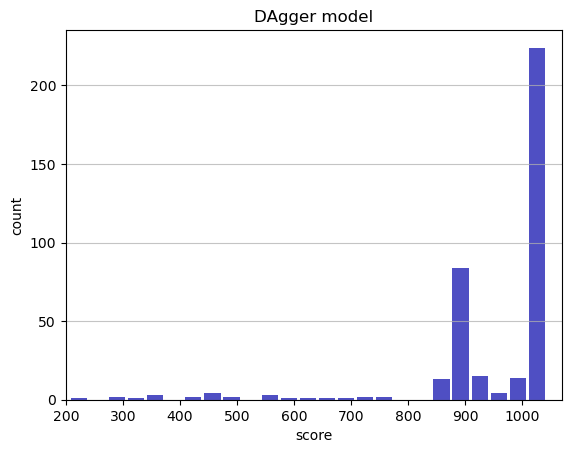

Track generation: 1183..1483 -> 300-tiles track
Epoch: 381
DAgger	mean: 949.58	variance: 141.30


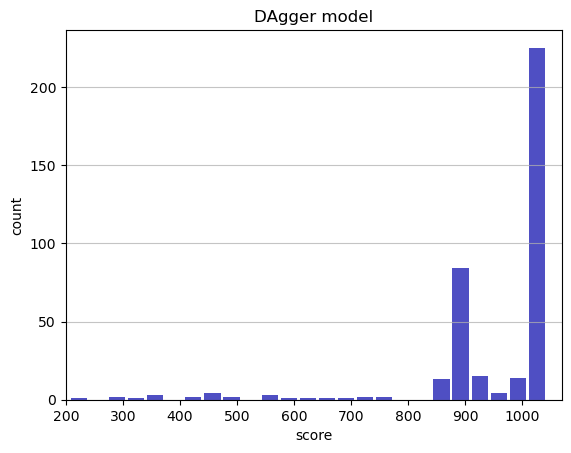

Track generation: 1053..1322 -> 269-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1176..1474 -> 298-tiles track
Epoch: 382
DAgger	mean: 949.77	variance: 141.17


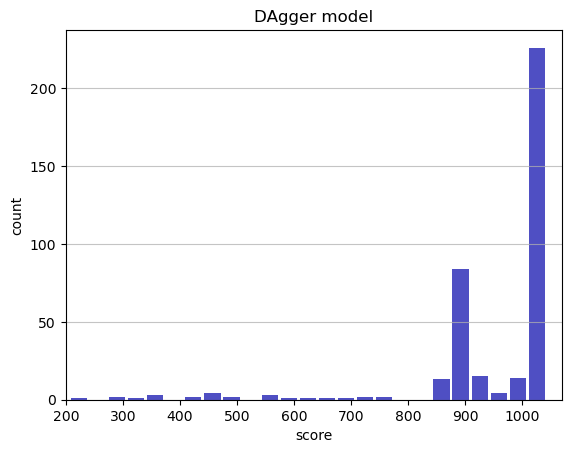

Track generation: 1141..1430 -> 289-tiles track
Epoch: 383
DAgger	mean: 949.65	variance: 141.00


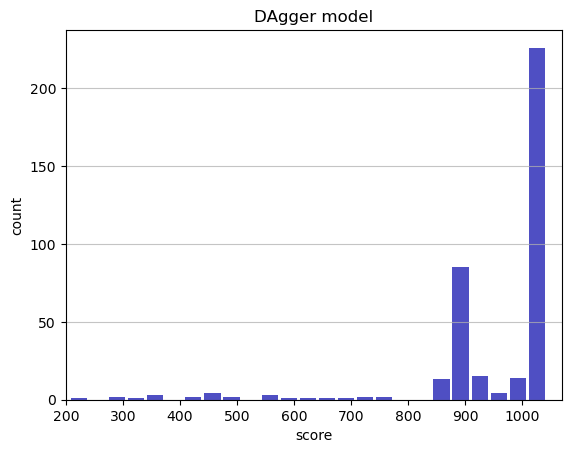

Track generation: 1176..1483 -> 307-tiles track
Epoch: 384
DAgger	mean: 949.47	variance: 140.86


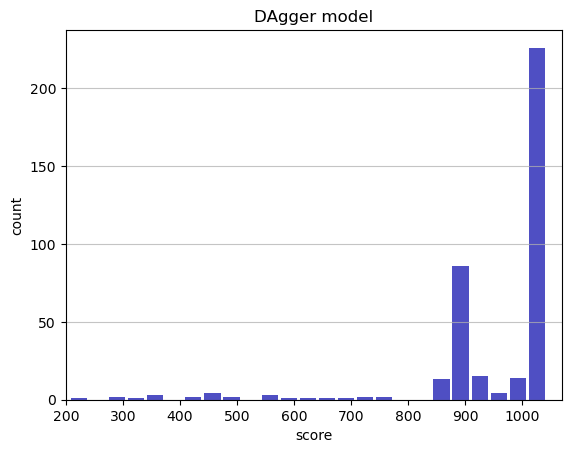

Track generation: 1105..1394 -> 289-tiles track
Epoch: 385
DAgger	mean: 949.68	variance: 140.74


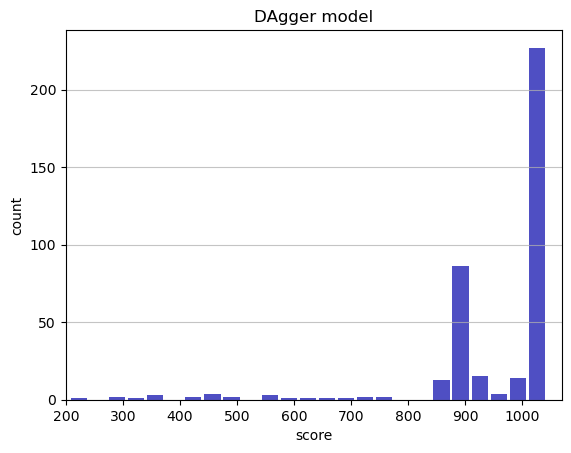

Track generation: 1252..1569 -> 317-tiles track
Epoch: 386
DAgger	mean: 949.56	variance: 140.57


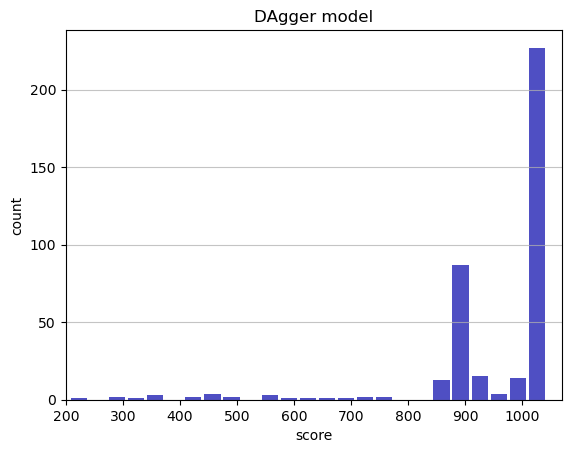

Track generation: 1338..1676 -> 338-tiles track
Epoch: 387
DAgger	mean: 949.65	variance: 140.40


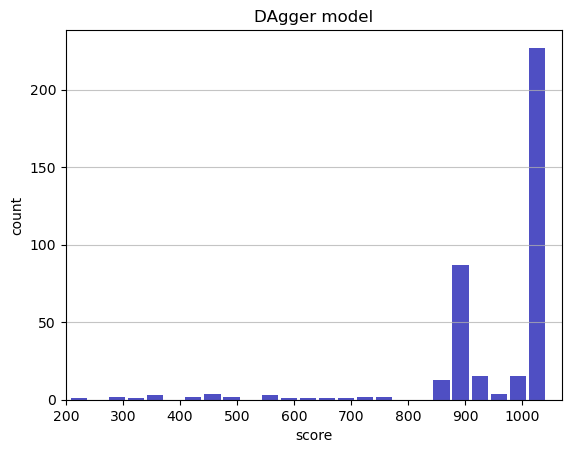

Track generation: 1135..1429 -> 294-tiles track
Epoch: 388
DAgger	mean: 949.84	variance: 140.27


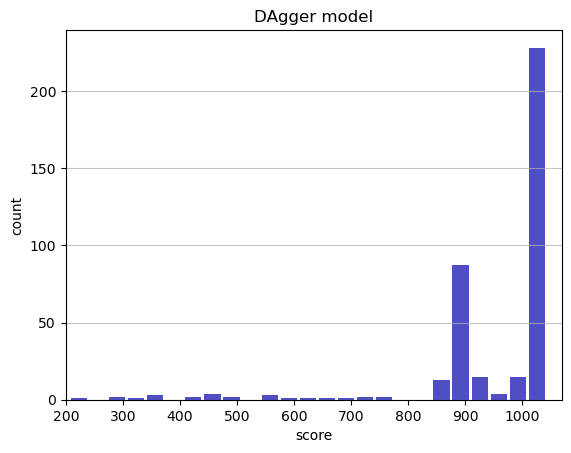

Track generation: 1189..1490 -> 301-tiles track
Epoch: 389
DAgger	mean: 950.03	variance: 140.14


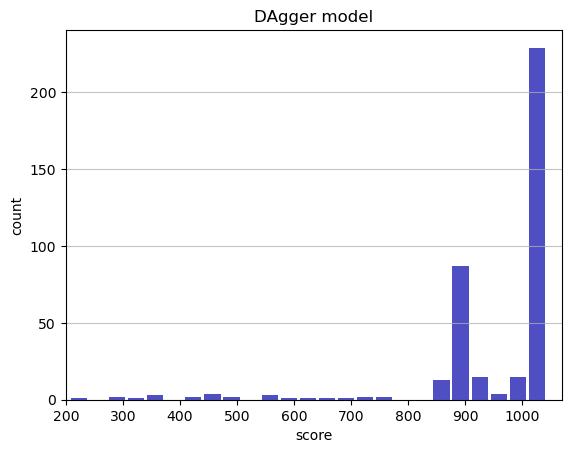

Track generation: 1076..1356 -> 280-tiles track
Epoch: 390
DAgger	mean: 950.24	variance: 140.02


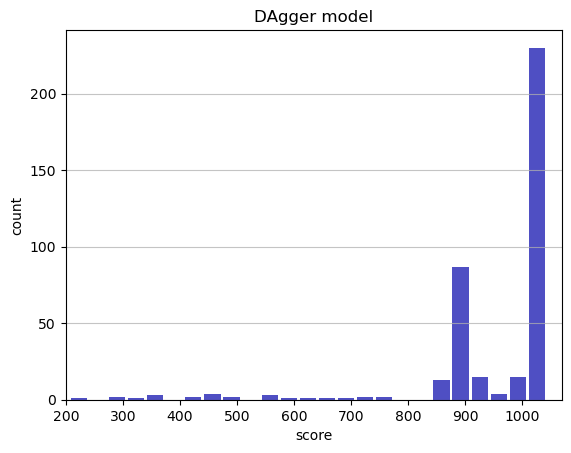

Track generation: 1255..1573 -> 318-tiles track
Epoch: 391
DAgger	mean: 950.41	variance: 139.88


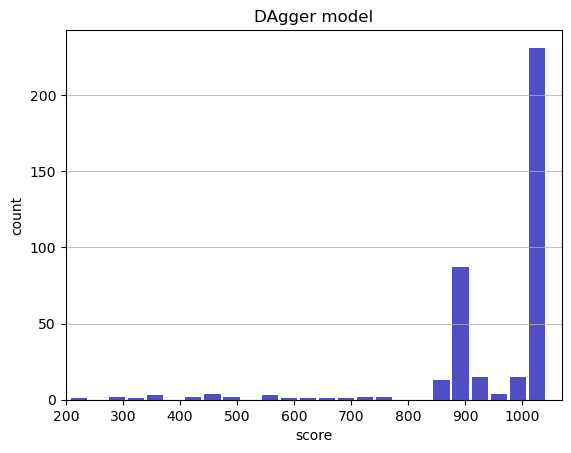

Track generation: 1131..1418 -> 287-tiles track
Epoch: 392
DAgger	mean: 950.29	variance: 139.72


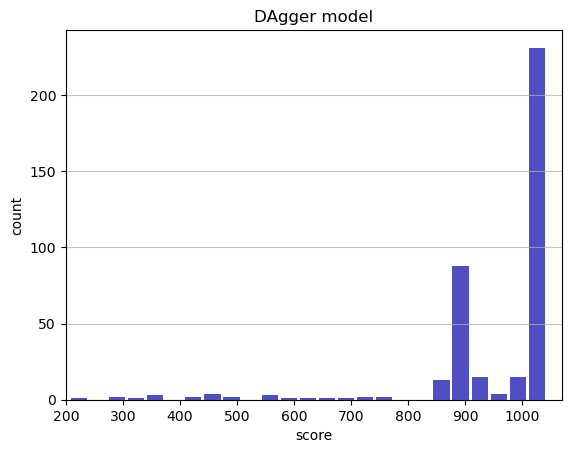

Track generation: 1178..1484 -> 306-tiles track
Epoch: 393
DAgger	mean: 950.46	variance: 139.58


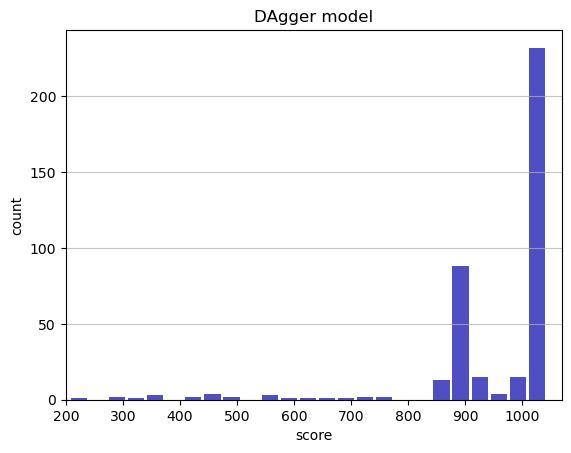

Track generation: 1212..1519 -> 307-tiles track
Epoch: 394
DAgger	mean: 950.64	variance: 139.45


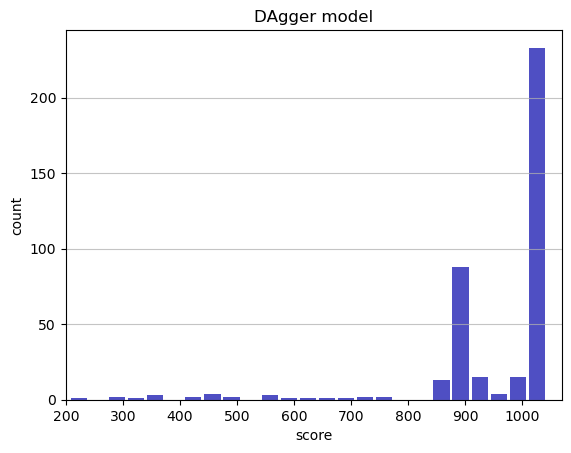

Track generation: 1035..1307 -> 272-tiles track
Epoch: 395
DAgger	mean: 950.84	variance: 139.33


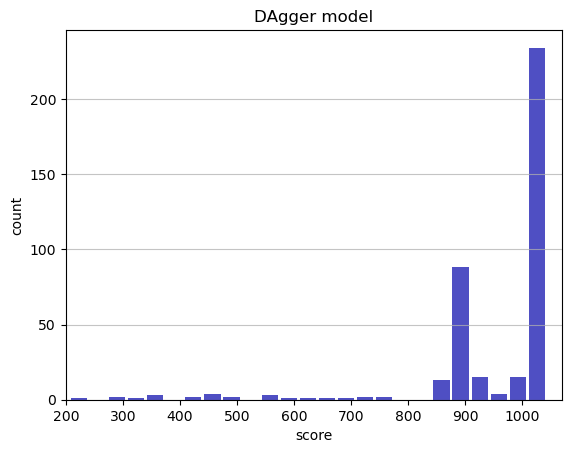

Track generation: 1156..1449 -> 293-tiles track
Epoch: 396
DAgger	mean: 950.74	variance: 139.17


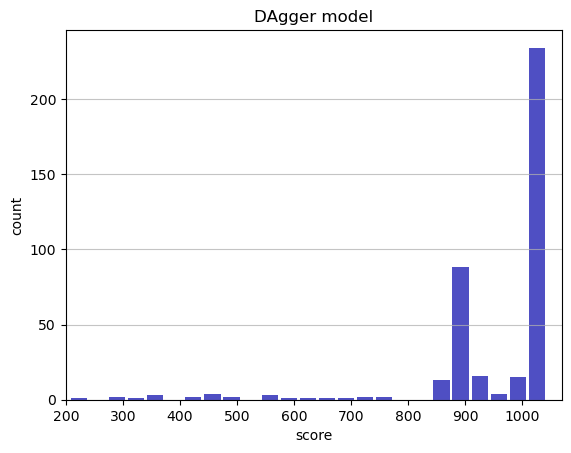

Track generation: 1075..1348 -> 273-tiles track
Epoch: 397
DAgger	mean: 950.94	variance: 139.05


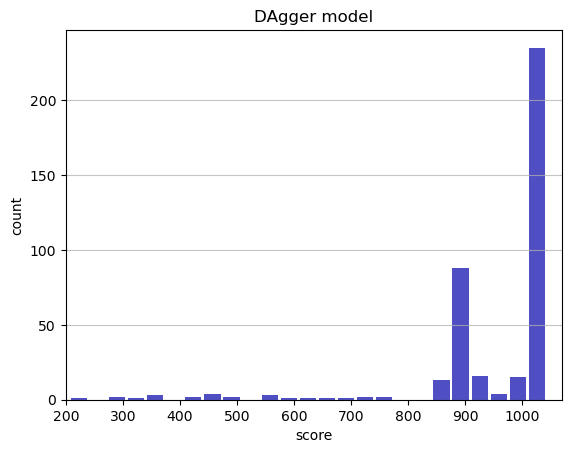

Track generation: 1111..1393 -> 282-tiles track
Epoch: 398
DAgger	mean: 951.14	variance: 138.94


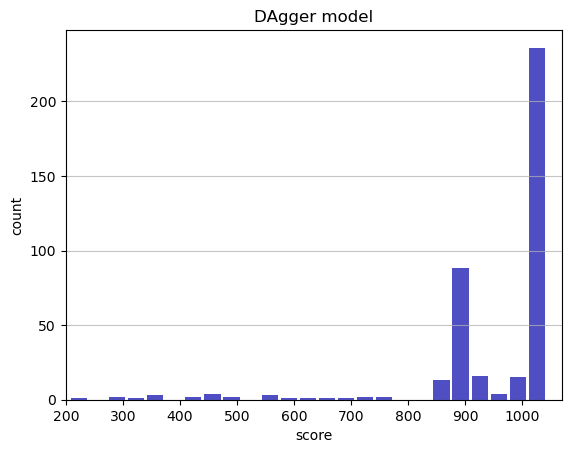

Track generation: 1216..1523 -> 307-tiles track
Epoch: 399
DAgger	mean: 951.32	variance: 138.81


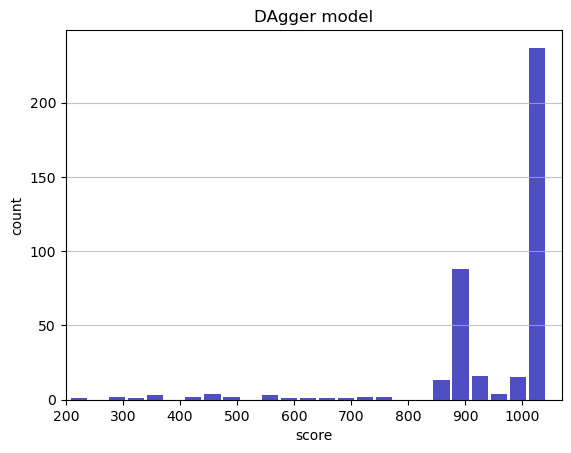

Track generation: 1224..1534 -> 310-tiles track
Epoch: 400
DAgger	mean: 951.18	variance: 138.66


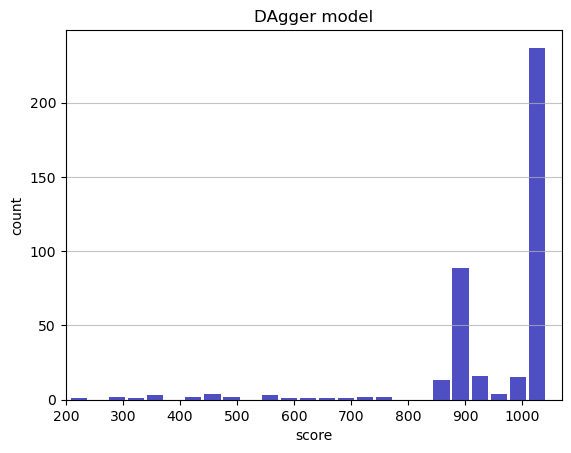

Track generation: 1024..1286 -> 262-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1215..1523 -> 308-tiles track
Epoch: 401
DAgger	mean: 951.04	variance: 138.52


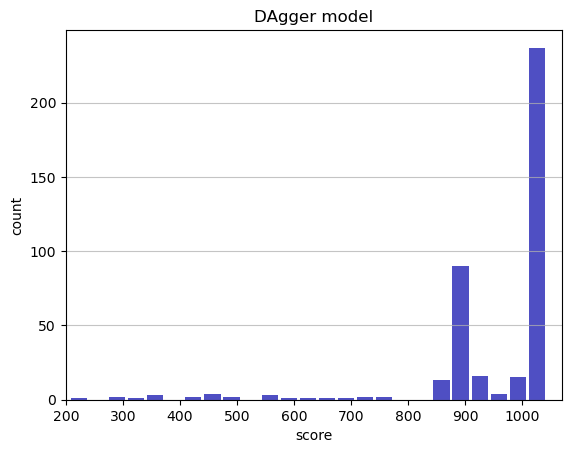

Track generation: 1239..1553 -> 314-tiles track
Epoch: 402
DAgger	mean: 951.22	variance: 138.39


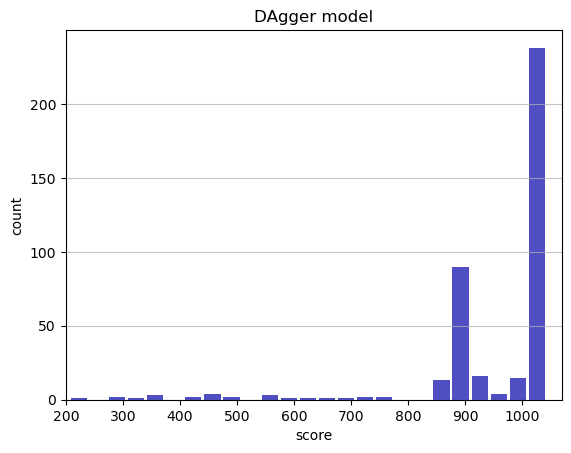

Track generation: 1044..1312 -> 268-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1162..1464 -> 302-tiles track
Epoch: 403
DAgger	mean: 951.39	variance: 138.26


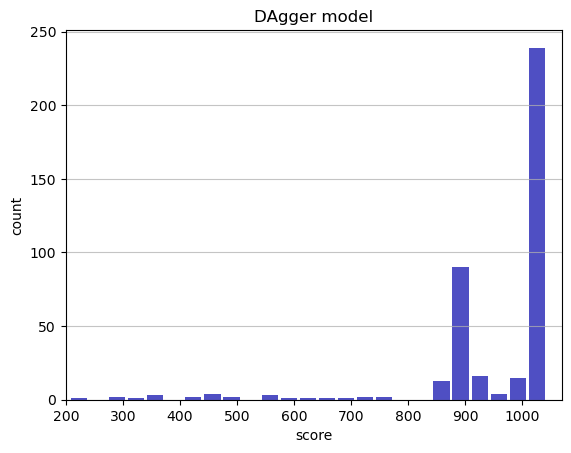

Track generation: 1092..1369 -> 277-tiles track
Epoch: 404
DAgger	mean: 951.59	variance: 138.14


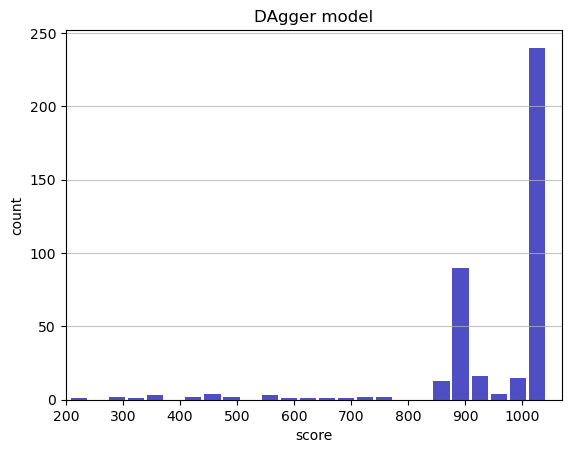

Track generation: 1143..1433 -> 290-tiles track
Epoch: 405
DAgger	mean: 951.49	variance: 137.99


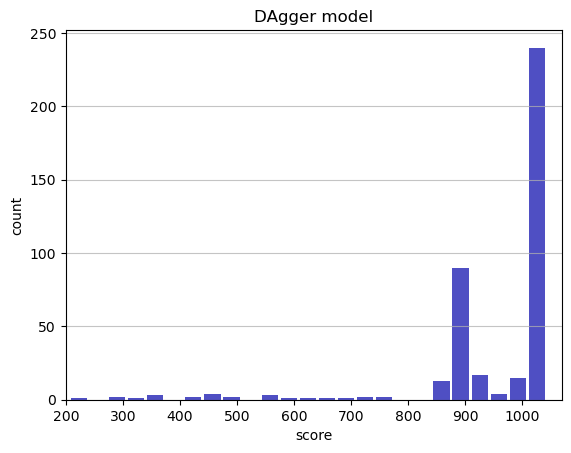

Track generation: 1228..1539 -> 311-tiles track
Epoch: 406
DAgger	mean: 951.36	variance: 137.84


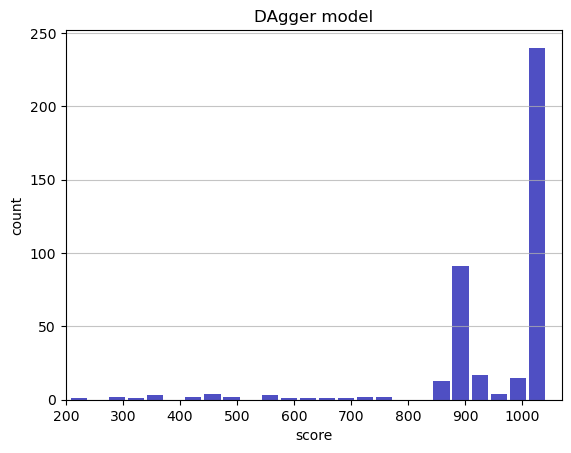

Track generation: 1042..1312 -> 270-tiles track
Epoch: 407
DAgger	mean: 951.56	variance: 137.73


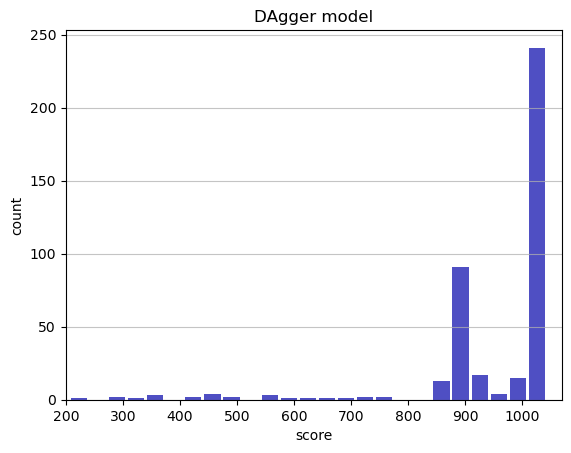

Track generation: 1106..1391 -> 285-tiles track
Epoch: 408
DAgger	mean: 951.74	variance: 137.61


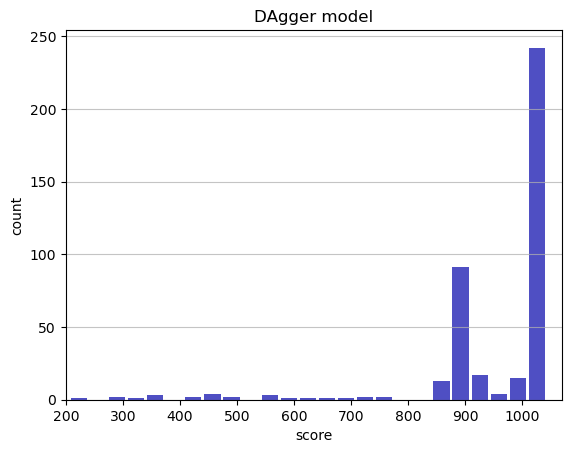

Track generation: 1084..1359 -> 275-tiles track
Epoch: 409
DAgger	mean: 951.59	variance: 137.48


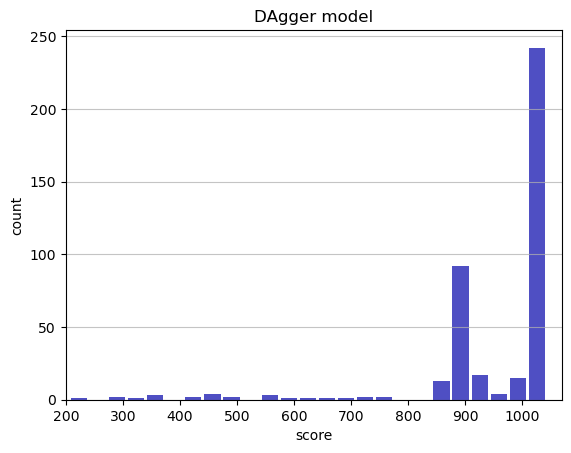

Track generation: 1068..1339 -> 271-tiles track
Epoch: 410
DAgger	mean: 951.79	variance: 137.37


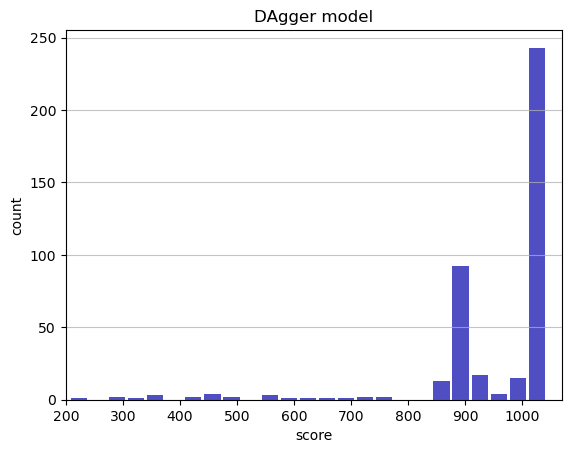

Track generation: 1115..1406 -> 291-tiles track
Epoch: 411
DAgger	mean: 951.97	variance: 137.25


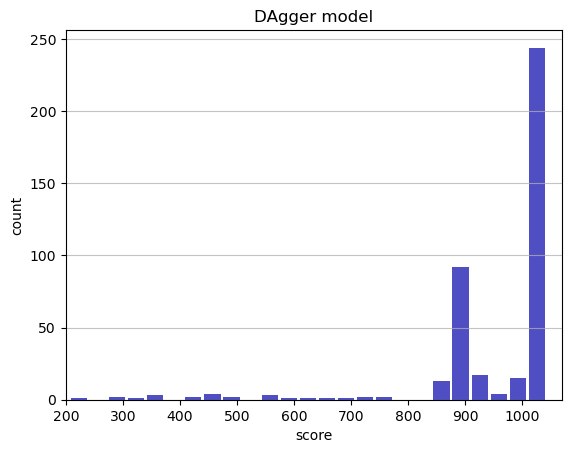

Track generation: 1196..1499 -> 303-tiles track
Epoch: 412
DAgger	mean: 951.81	variance: 137.12


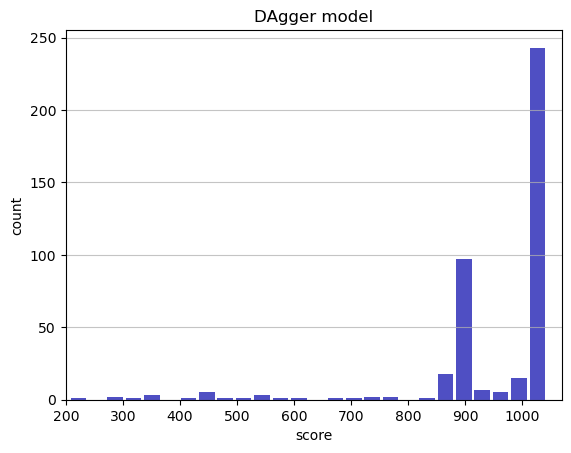

Track generation: 1187..1488 -> 301-tiles track
Epoch: 413
DAgger	mean: 951.99	variance: 137.00


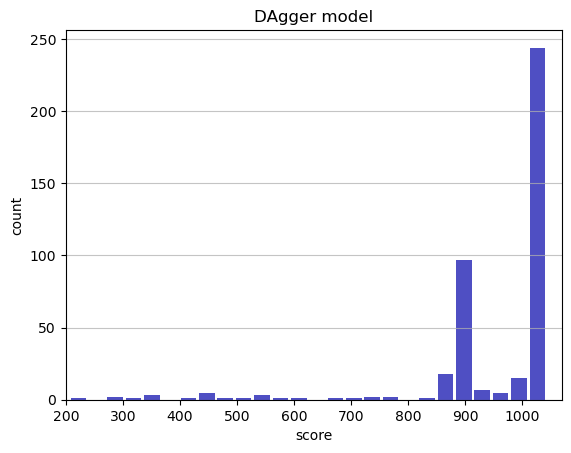

Track generation: 1091..1375 -> 284-tiles track
Epoch: 414
DAgger	mean: 951.87	variance: 136.86


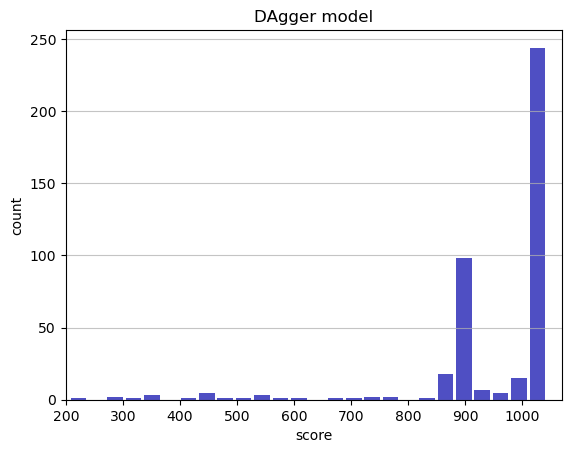

Track generation: 1136..1424 -> 288-tiles track
Epoch: 415
DAgger	mean: 951.75	variance: 136.72


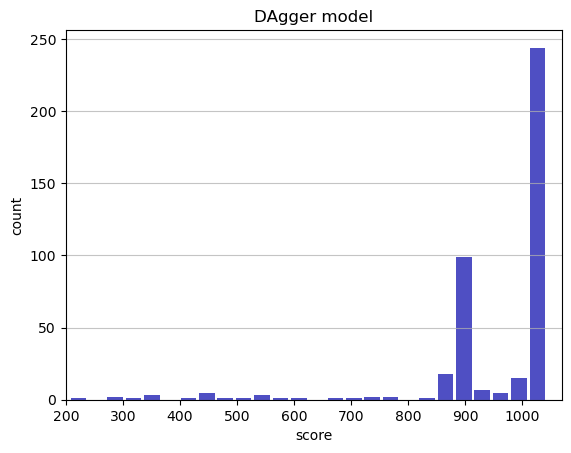

Track generation: 1248..1564 -> 316-tiles track
Epoch: 416
DAgger	mean: 951.91	variance: 136.59


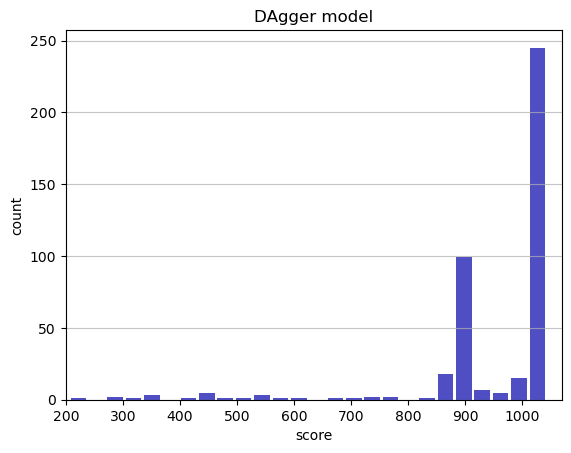

Track generation: 1115..1404 -> 289-tiles track
Epoch: 417
DAgger	mean: 952.09	variance: 136.48


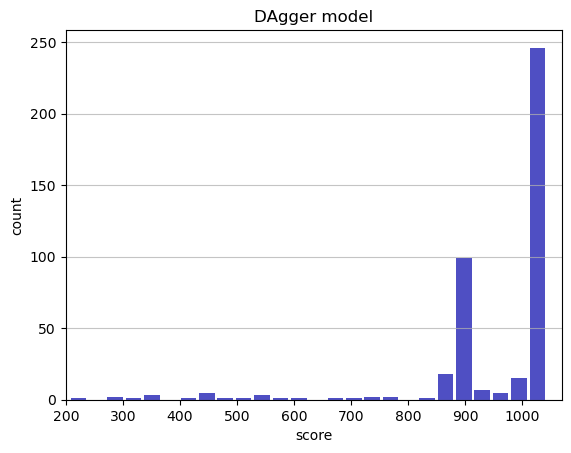

Track generation: 1196..1499 -> 303-tiles track
Epoch: 418
DAgger	mean: 951.98	variance: 136.33


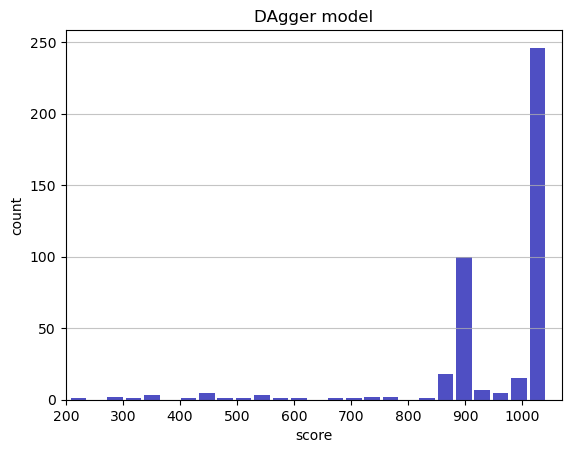

Track generation: 1059..1328 -> 269-tiles track
Epoch: 419
DAgger	mean: 951.87	variance: 136.19


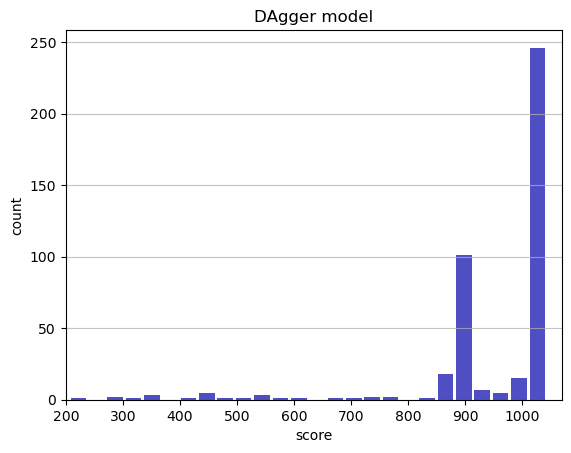

Track generation: 1324..1659 -> 335-tiles track
Epoch: 420
DAgger	mean: 952.00	variance: 136.05


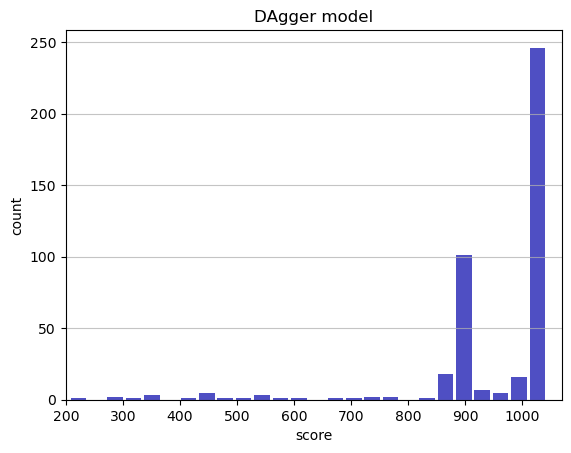

Track generation: 1276..1599 -> 323-tiles track
Epoch: 421
DAgger	mean: 952.14	variance: 135.92


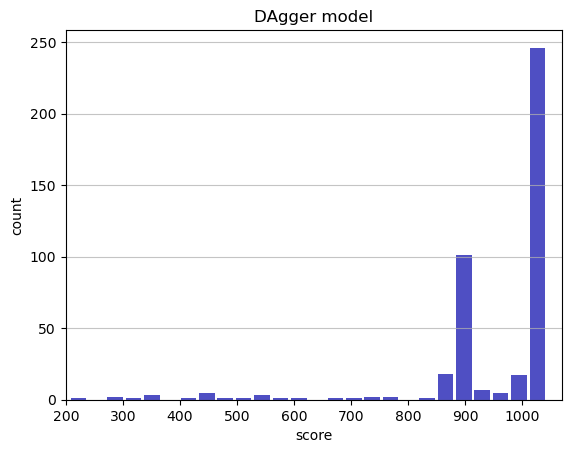

Track generation: 1129..1416 -> 287-tiles track
Epoch: 422
DAgger	mean: 952.04	variance: 135.77


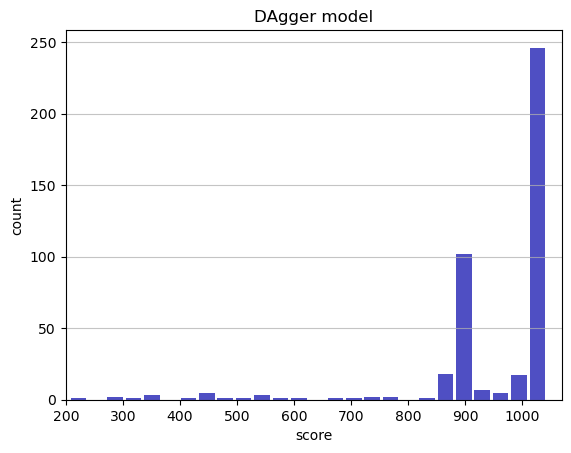

Track generation: 1277..1600 -> 323-tiles track
Epoch: 423
DAgger	mean: 952.18	variance: 135.64


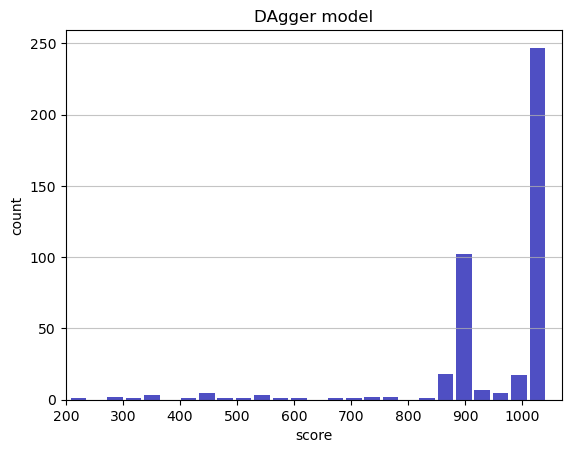

Track generation: 1093..1373 -> 280-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1327..1663 -> 336-tiles track
Epoch: 424
DAgger	mean: 952.33	variance: 135.52


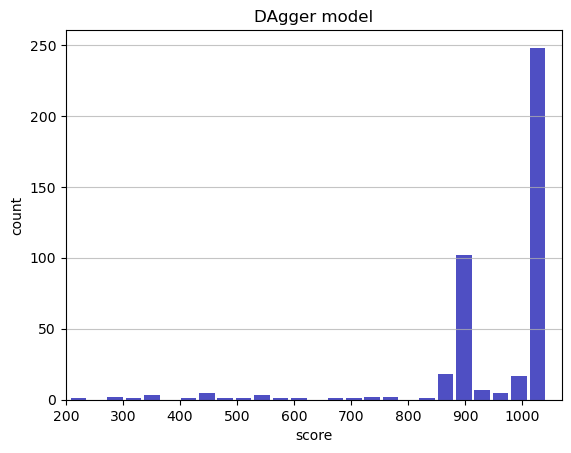

Track generation: 1168..1464 -> 296-tiles track
Epoch: 425
DAgger	mean: 952.23	variance: 135.37


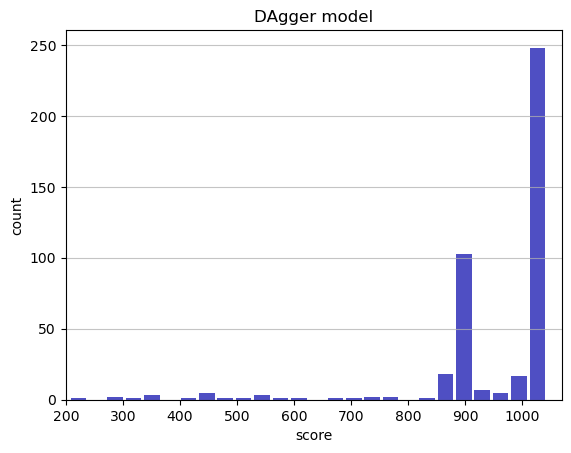

Track generation: 1072..1344 -> 272-tiles track
Epoch: 426
DAgger	mean: 952.43	variance: 135.27


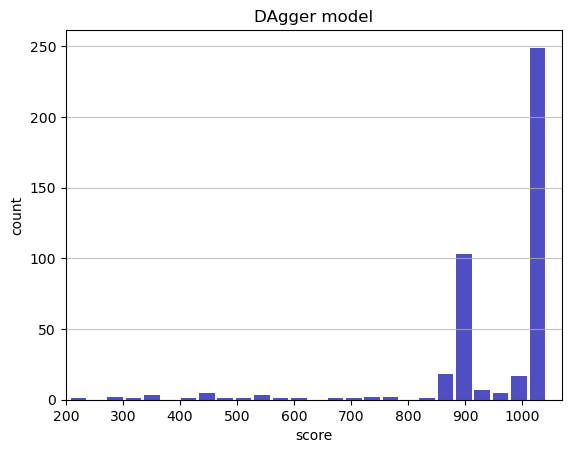

Track generation: 1424..1784 -> 360-tiles track
Epoch: 427
DAgger	mean: 952.50	variance: 135.12


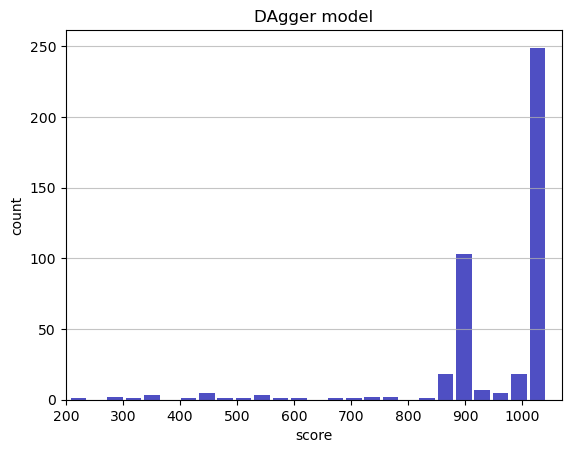

Track generation: 1291..1625 -> 334-tiles track
Epoch: 428
DAgger	mean: 952.62	variance: 134.99


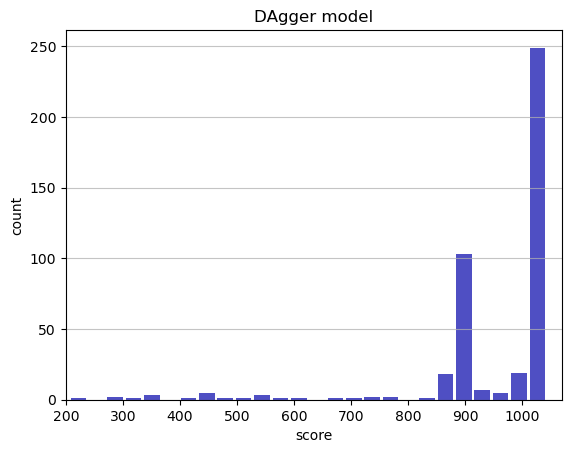

Track generation: 1068..1341 -> 273-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1113..1395 -> 282-tiles track
Epoch: 429
DAgger	mean: 952.79	variance: 134.87


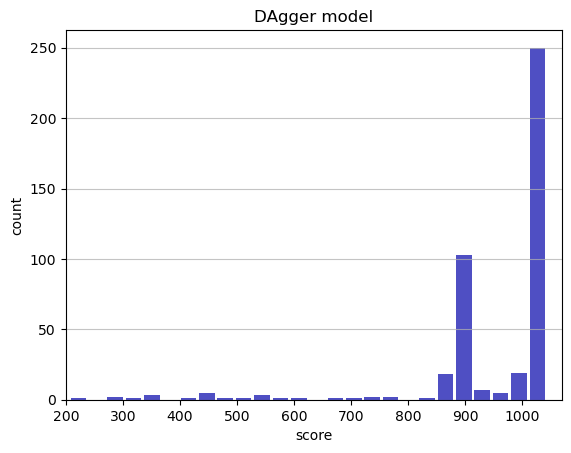

Track generation: 1082..1353 -> 271-tiles track
Epoch: 430
DAgger	mean: 952.64	variance: 134.75


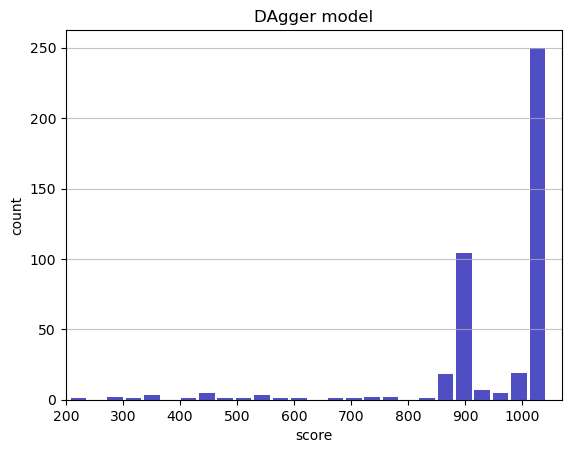

Track generation: 1255..1573 -> 318-tiles track
Epoch: 431
DAgger	mean: 952.50	variance: 134.62


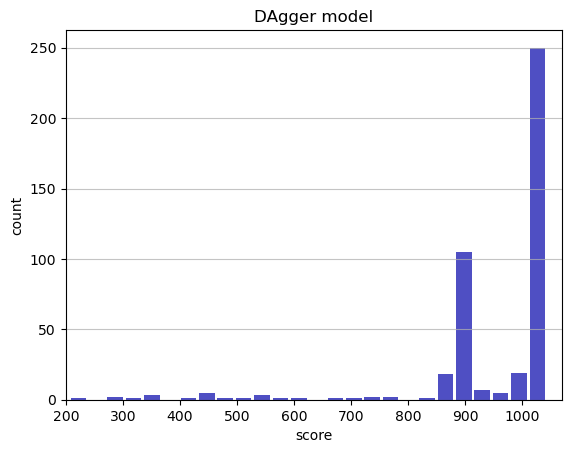

Track generation: 1212..1519 -> 307-tiles track
Epoch: 432
DAgger	mean: 952.67	variance: 134.51


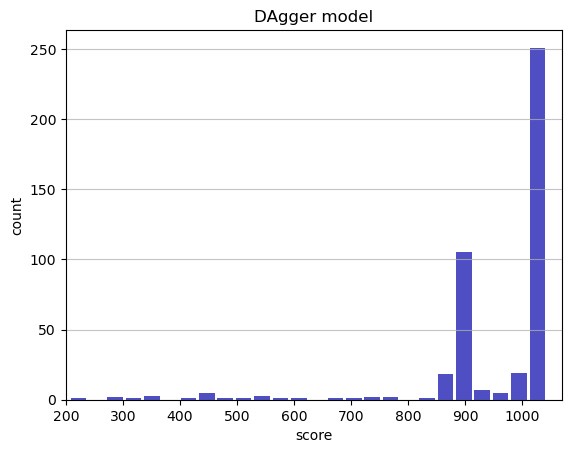

Track generation: 1200..1504 -> 304-tiles track
Epoch: 433
DAgger	mean: 952.83	variance: 134.40


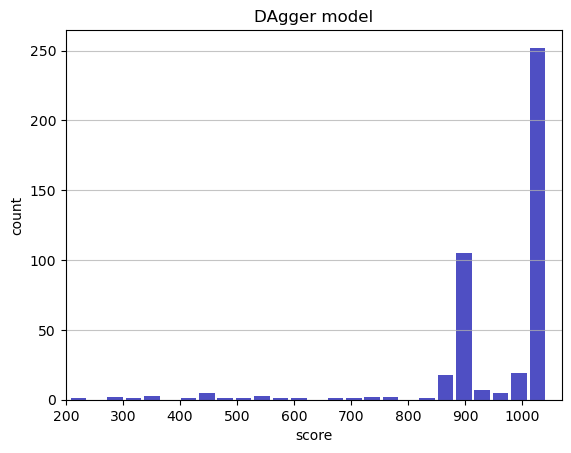

Track generation: 1090..1367 -> 277-tiles track
Epoch: 434
DAgger	mean: 952.71	variance: 134.26


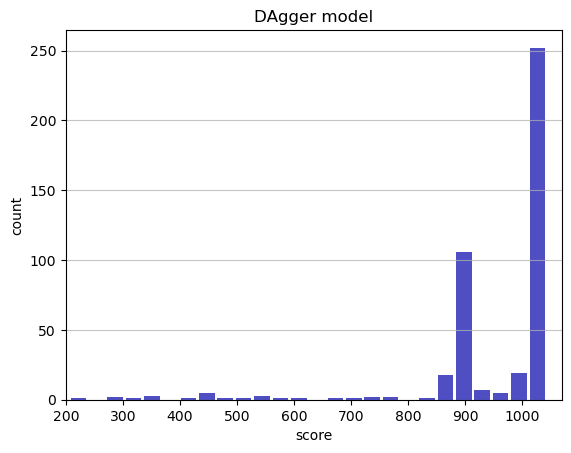

Track generation: 1112..1396 -> 284-tiles track
Epoch: 435
DAgger	mean: 952.61	variance: 134.12


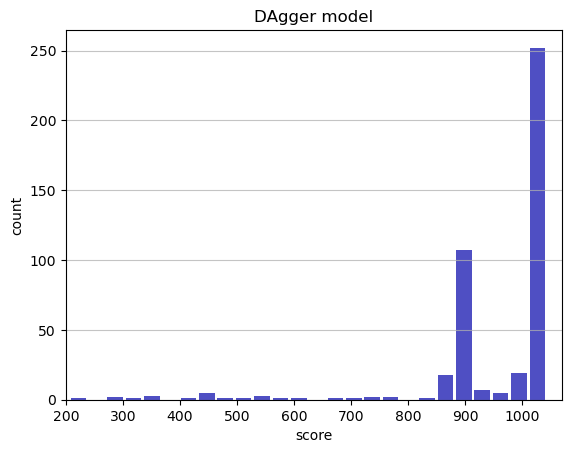

Track generation: 1188..1489 -> 301-tiles track
Epoch: 436
DAgger	mean: 952.78	variance: 134.01


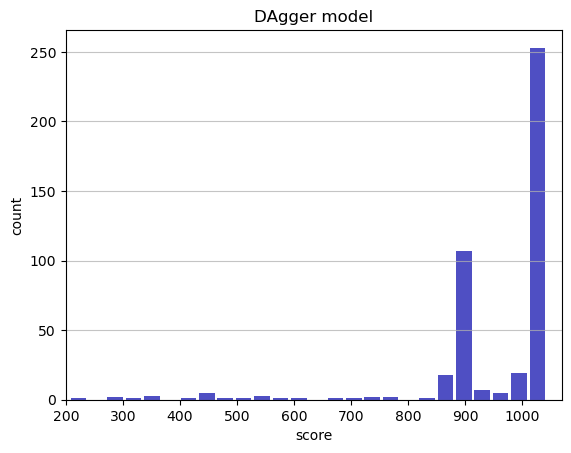

Track generation: 926..1169 -> 243-tiles track
Epoch: 437
DAgger	mean: 952.98	variance: 133.92


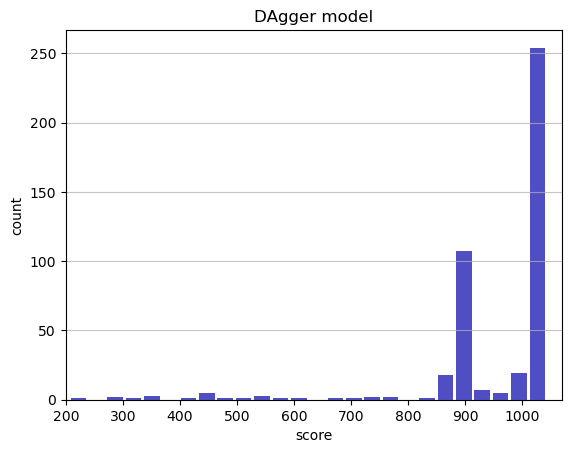

Track generation: 1177..1475 -> 298-tiles track
Epoch: 438
DAgger	mean: 952.85	variance: 133.80


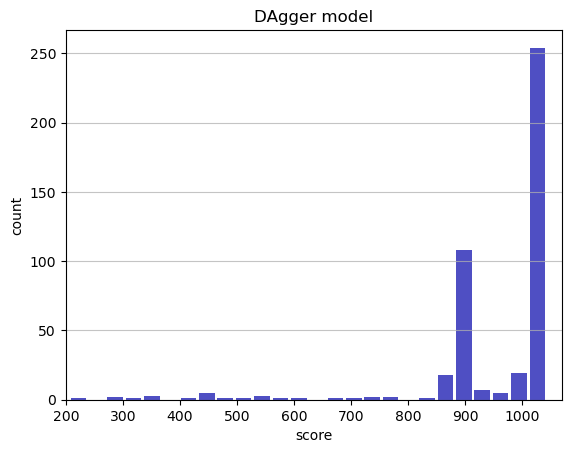

Track generation: 1175..1473 -> 298-tiles track
Epoch: 439
DAgger	mean: 953.01	variance: 133.68


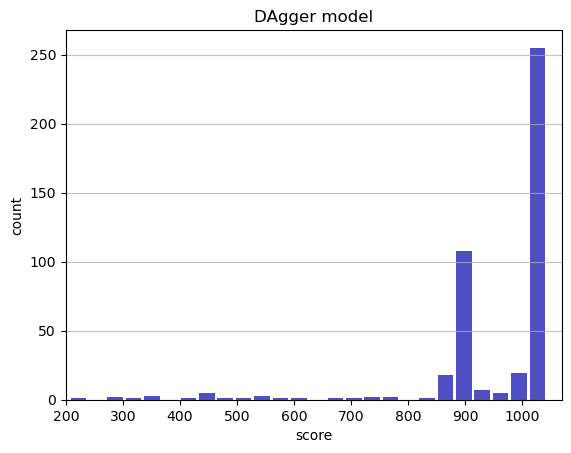

Track generation: 1242..1557 -> 315-tiles track
Epoch: 440
DAgger	mean: 953.16	variance: 133.57


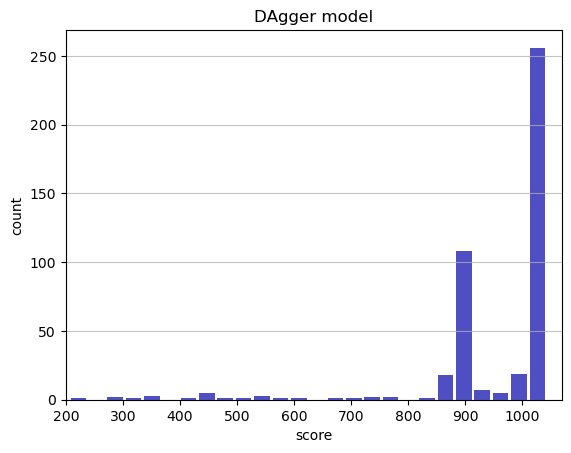

Track generation: 1138..1426 -> 288-tiles track
Epoch: 441
DAgger	mean: 953.31	variance: 133.46


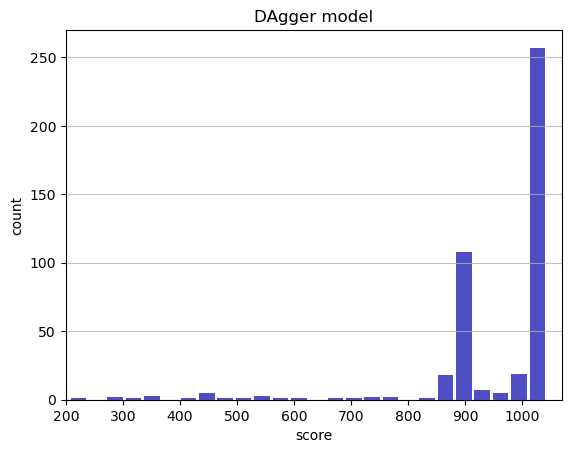

Track generation: 1168..1471 -> 303-tiles track
Epoch: 442
DAgger	mean: 953.48	variance: 133.35


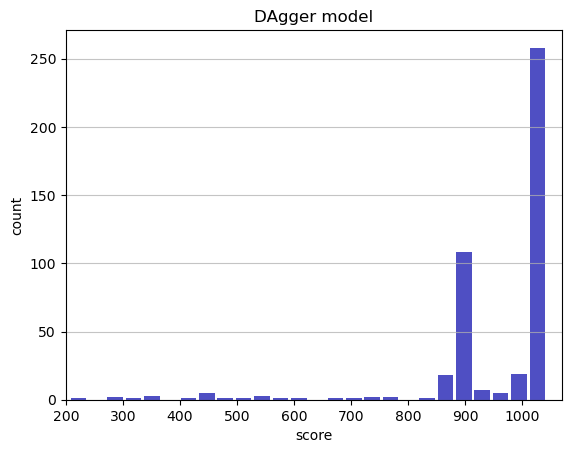

Track generation: 1052..1326 -> 274-tiles track
Epoch: 443
DAgger	mean: 953.38	variance: 133.22


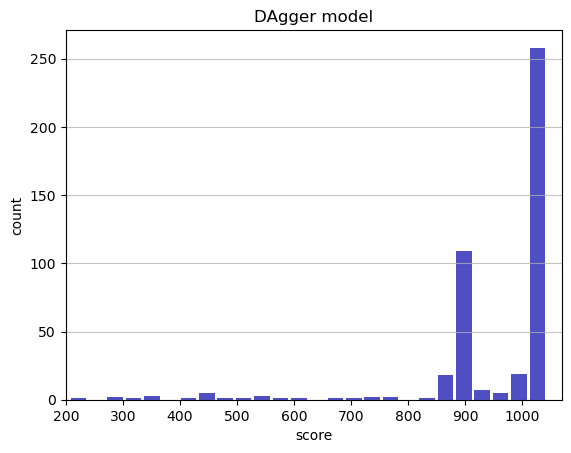

Track generation: 1095..1373 -> 278-tiles track
Epoch: 444
DAgger	mean: 951.89	variance: 136.74


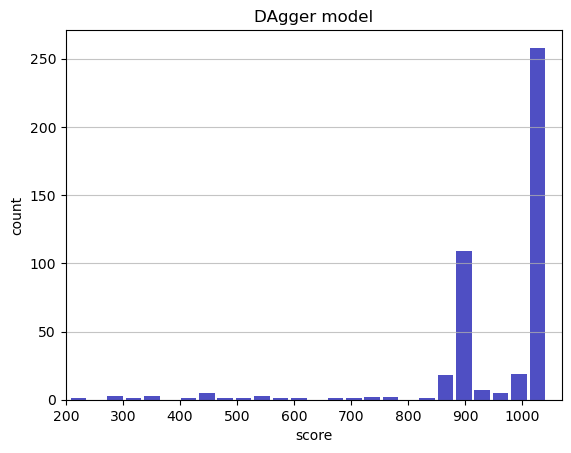

Track generation: 1065..1337 -> 272-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1170..1467 -> 297-tiles track
Epoch: 445
DAgger	mean: 952.06	variance: 136.63


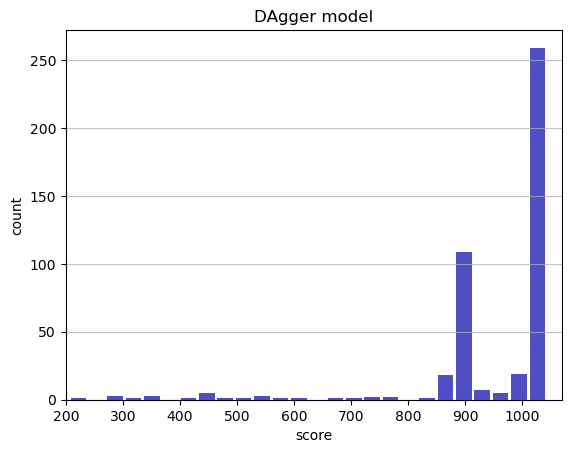

Track generation: 1191..1493 -> 302-tiles track
Epoch: 446
DAgger	mean: 951.93	variance: 136.50


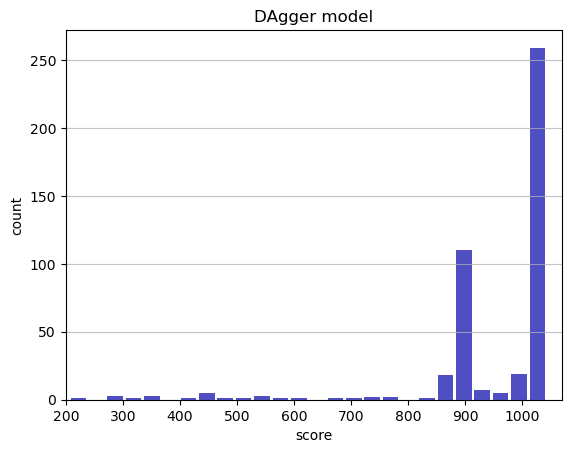

Track generation: 1156..1449 -> 293-tiles track
Epoch: 447
DAgger	mean: 952.09	variance: 136.40


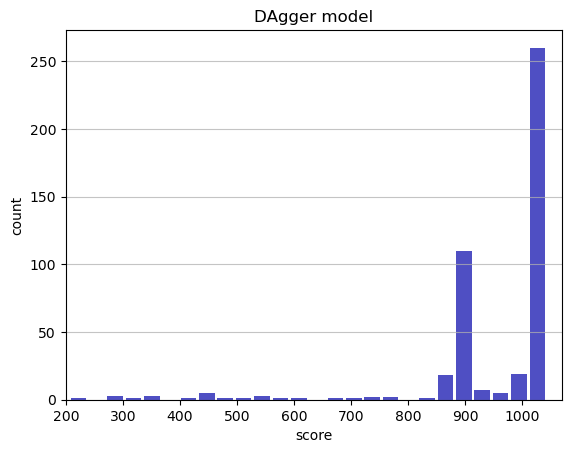

Track generation: 1196..1507 -> 311-tiles track
Epoch: 448
DAgger	mean: 952.25	variance: 136.28


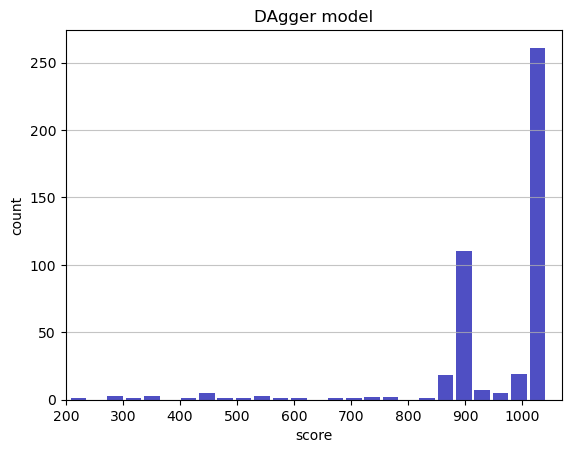

Track generation: 1278..1608 -> 330-tiles track
Epoch: 449
DAgger	mean: 952.30	variance: 136.14


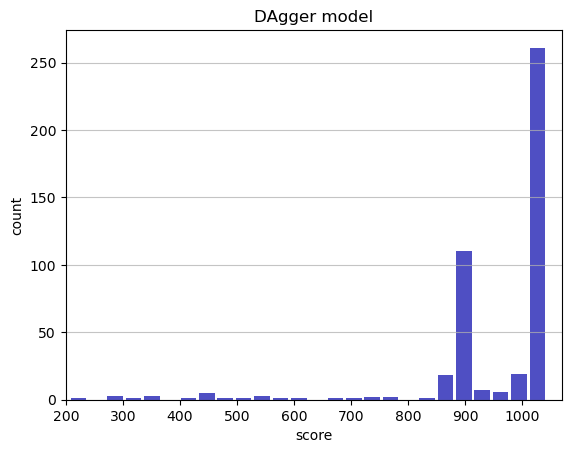

Track generation: 1192..1494 -> 302-tiles track
Epoch: 450
DAgger	mean: 952.46	variance: 136.03


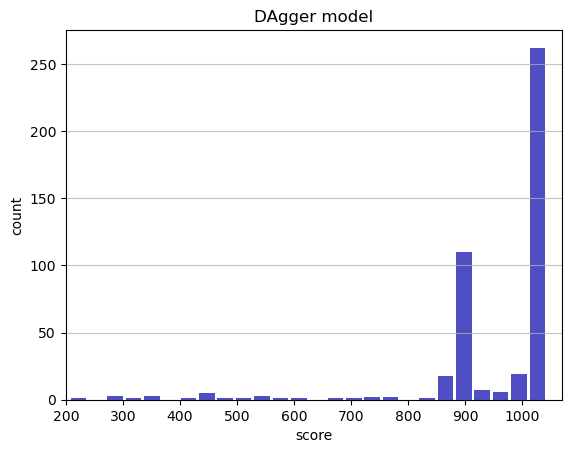

Track generation: 1079..1353 -> 274-tiles track
Epoch: 451
DAgger	mean: 952.63	variance: 135.92


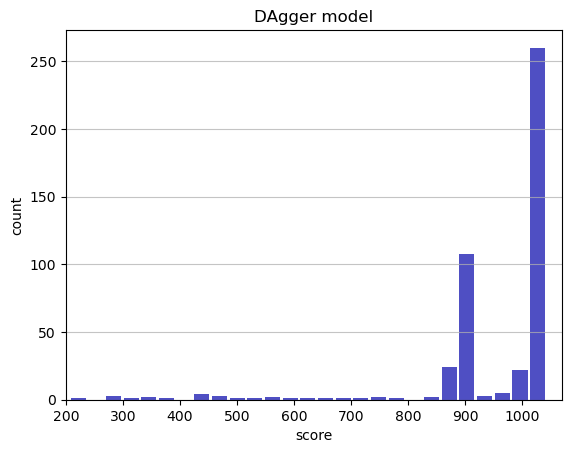

Track generation: 1177..1474 -> 297-tiles track
Epoch: 452
DAgger	mean: 952.50	variance: 135.80


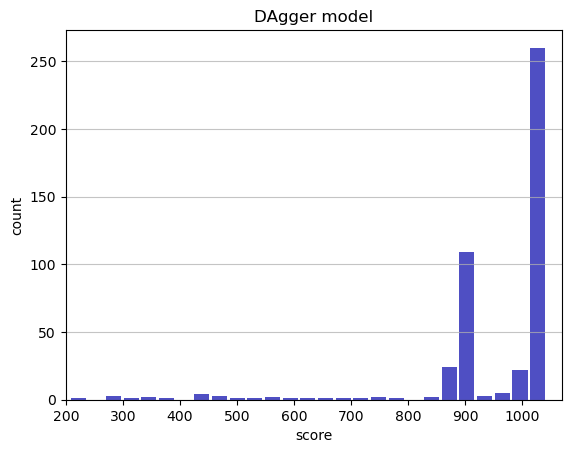

Track generation: 991..1245 -> 254-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1033..1295 -> 262-tiles track
Epoch: 453
DAgger	mean: 952.68	variance: 135.70


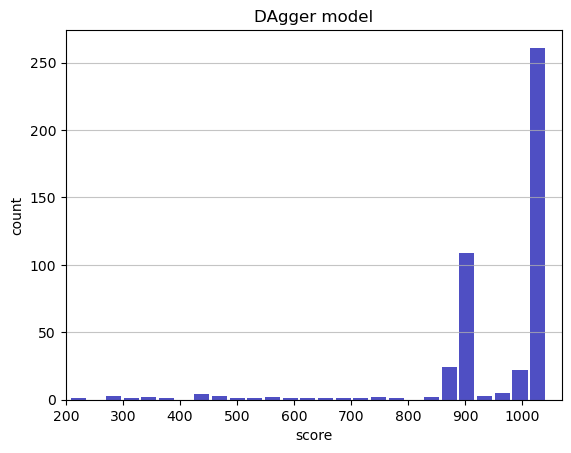

Track generation: 1221..1530 -> 309-tiles track
Epoch: 454
DAgger	mean: 952.83	variance: 135.59


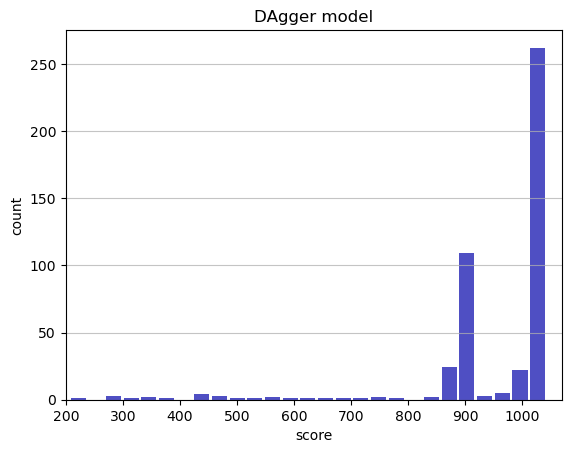

Track generation: 1147..1438 -> 291-tiles track
Epoch: 455
DAgger	mean: 952.99	variance: 135.49


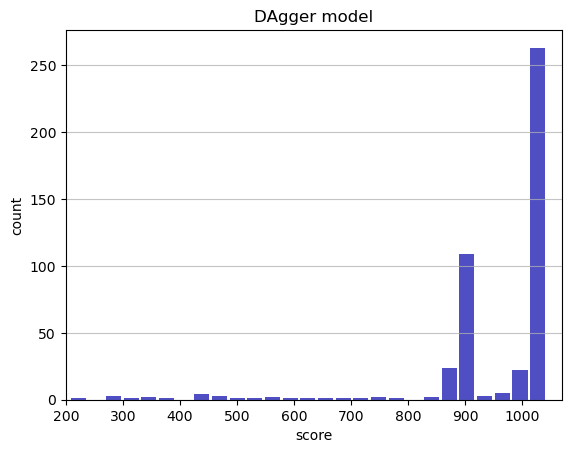

Track generation: 1251..1568 -> 317-tiles track
Epoch: 456
DAgger	mean: 952.89	variance: 135.36


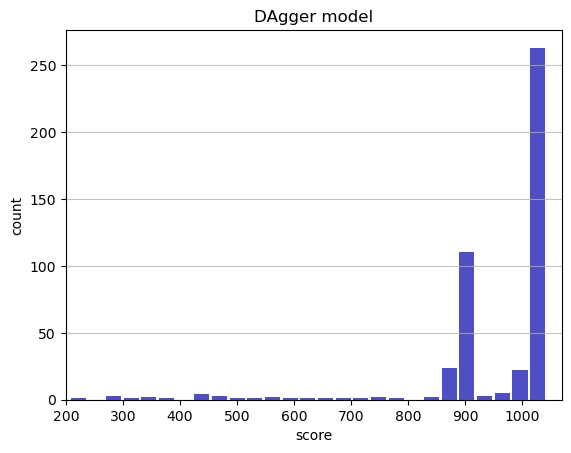

Track generation: 1019..1278 -> 259-tiles track
Epoch: 457
DAgger	mean: 953.06	variance: 135.26


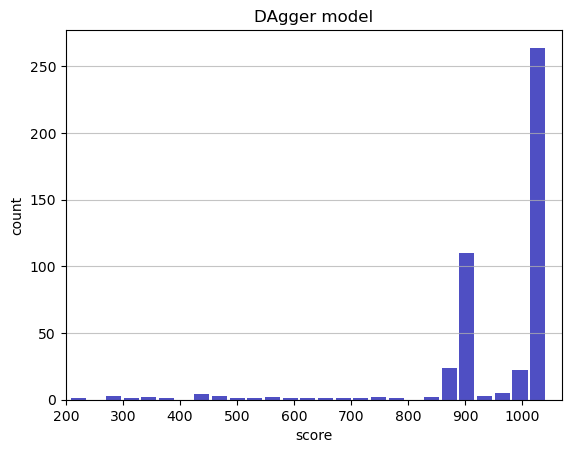

Track generation: 1229..1540 -> 311-tiles track
Epoch: 458
DAgger	mean: 952.92	variance: 135.15


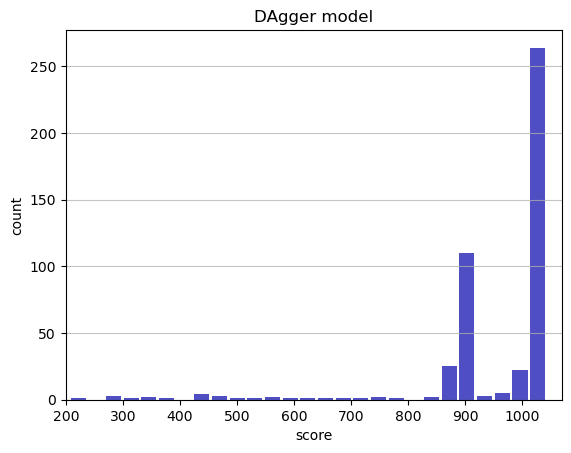

Track generation: 1152..1444 -> 292-tiles track
Epoch: 459
DAgger	mean: 953.09	variance: 135.05


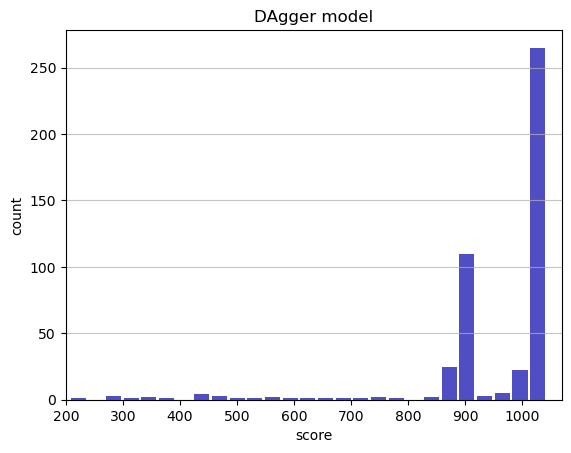

Track generation: 1139..1428 -> 289-tiles track
Epoch: 460
DAgger	mean: 953.24	variance: 134.94


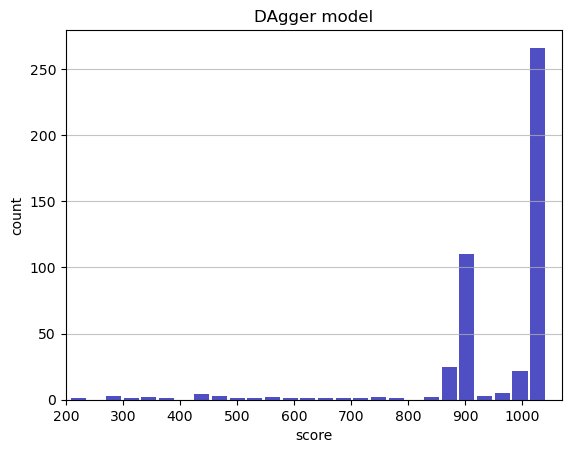

Track generation: 1193..1495 -> 302-tiles track
Epoch: 461
DAgger	mean: 953.38	variance: 134.83


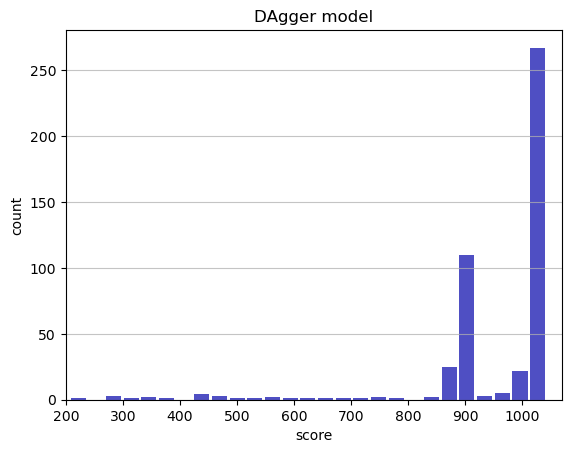

Track generation: 1178..1477 -> 299-tiles track
Epoch: 462
DAgger	mean: 953.26	variance: 134.71


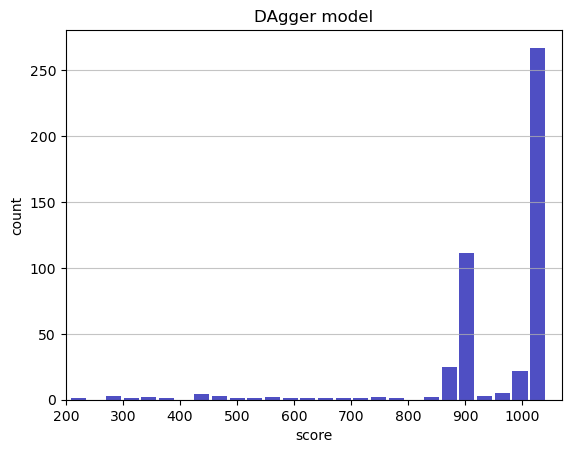

Track generation: 1080..1354 -> 274-tiles track
Epoch: 463
DAgger	mean: 953.42	variance: 134.61


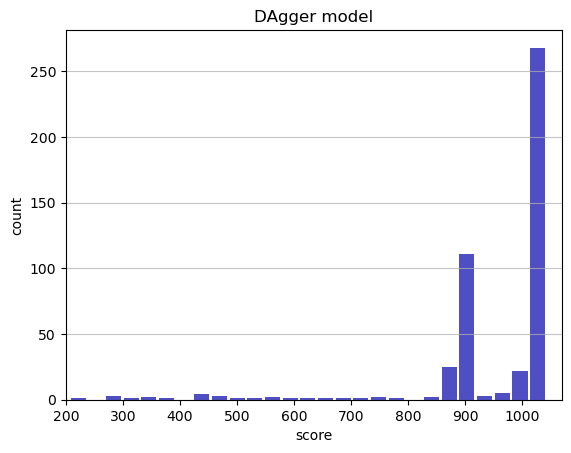

Track generation: 1263..1583 -> 320-tiles track
Epoch: 464
DAgger	mean: 953.57	variance: 134.50


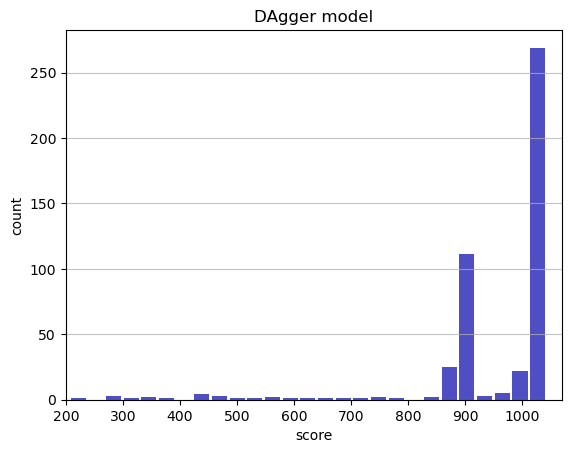

Track generation: 1111..1393 -> 282-tiles track
Epoch: 465
DAgger	mean: 953.73	variance: 134.40


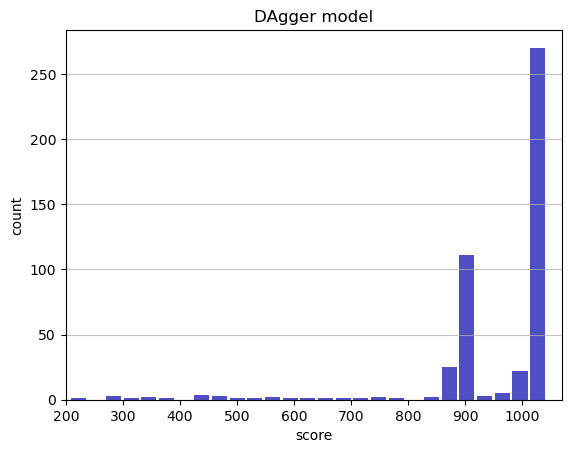

Track generation: 1022..1284 -> 262-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1202..1513 -> 311-tiles track
Epoch: 466
DAgger	mean: 953.86	variance: 134.29


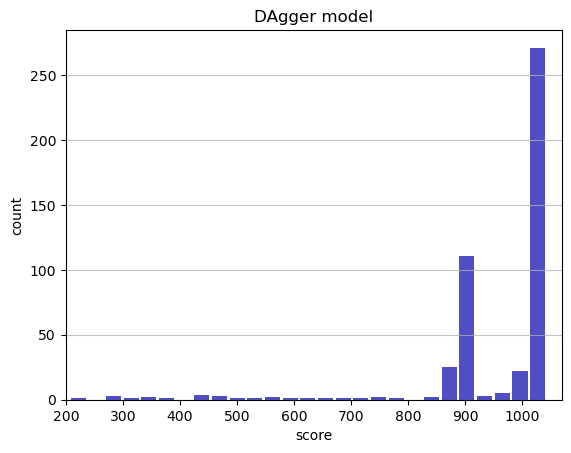

Track generation: 980..1229 -> 249-tiles track
Epoch: 467
DAgger	mean: 953.80	variance: 134.15


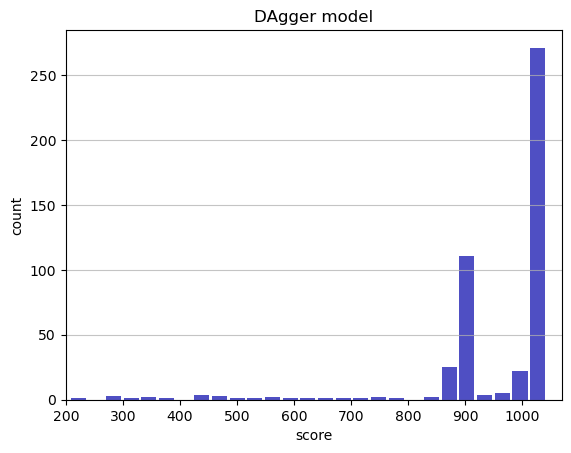

Track generation: 1140..1429 -> 289-tiles track
Epoch: 468
DAgger	mean: 953.95	variance: 134.05


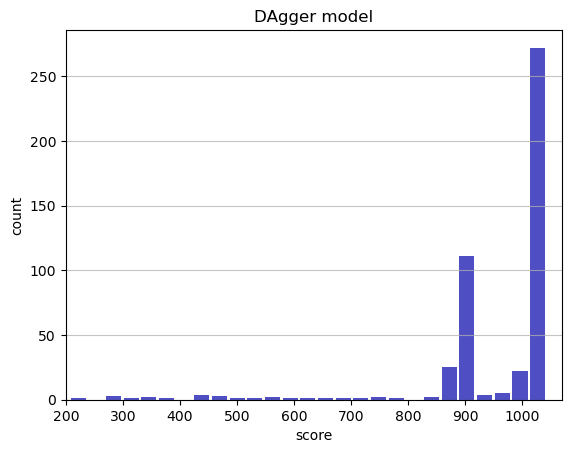

Track generation: 916..1157 -> 241-tiles track
Epoch: 469
DAgger	mean: 954.13	variance: 133.96


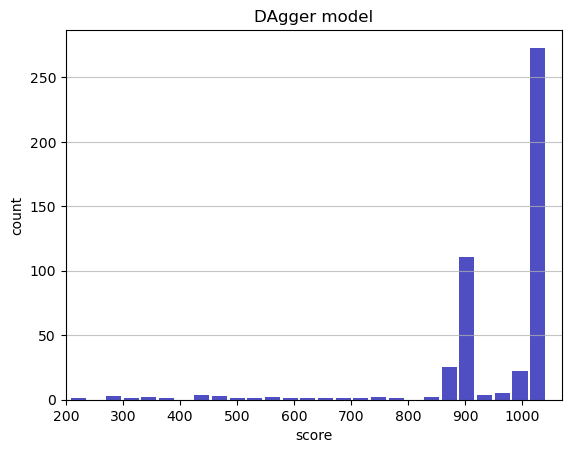

Track generation: 1085..1360 -> 275-tiles track
Epoch: 470
DAgger	mean: 953.95	variance: 133.87


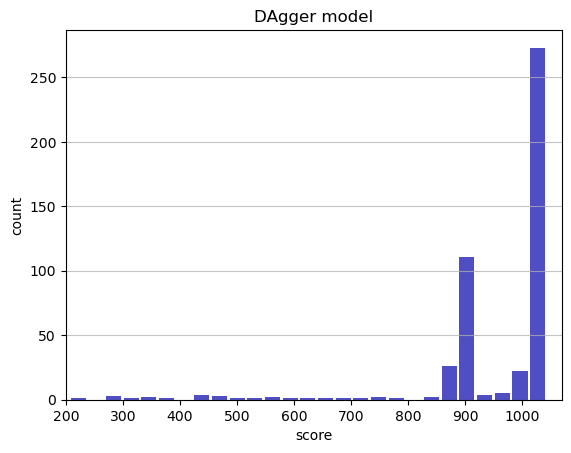

Track generation: 1171..1474 -> 303-tiles track
Epoch: 471
DAgger	mean: 954.09	variance: 133.77


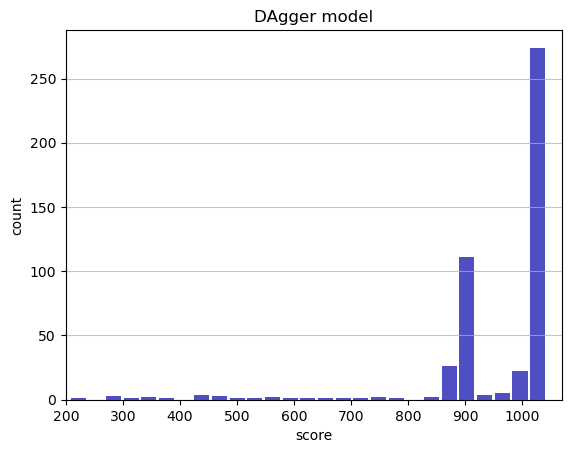

Track generation: 1144..1434 -> 290-tiles track
Epoch: 472
DAgger	mean: 954.26	variance: 133.67


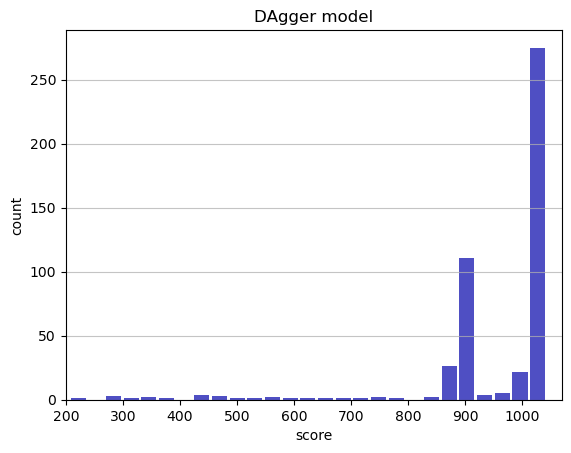

Track generation: 1211..1518 -> 307-tiles track
Epoch: 473
DAgger	mean: 954.14	variance: 133.55


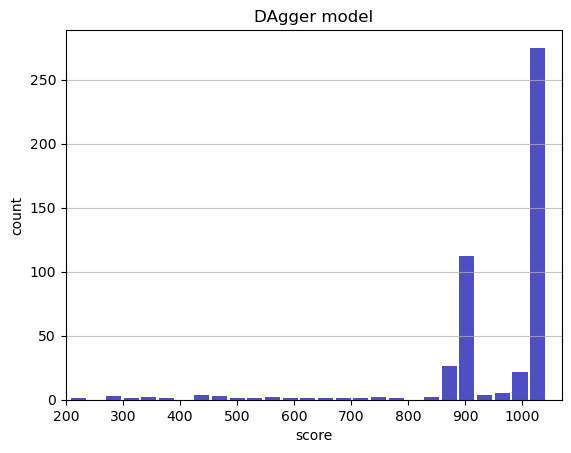

Track generation: 1276..1599 -> 323-tiles track
Epoch: 474
DAgger	mean: 954.27	variance: 133.44


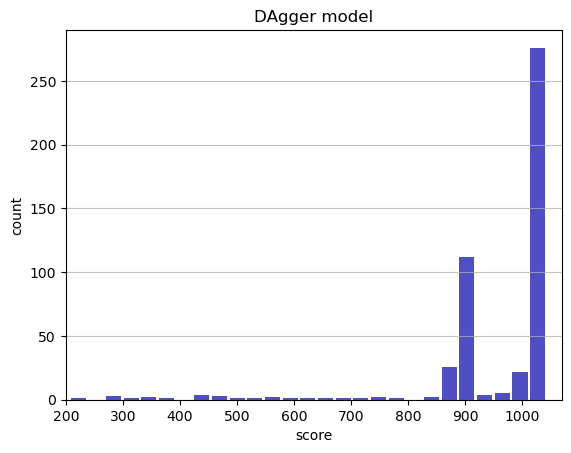

Track generation: 1284..1609 -> 325-tiles track
Epoch: 475
DAgger	mean: 954.16	variance: 133.33


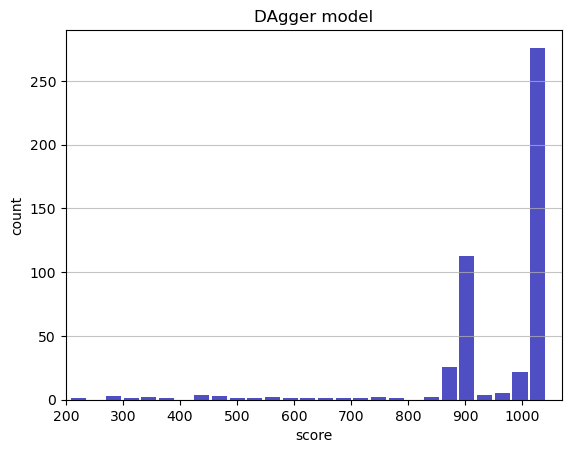

Track generation: 1275..1598 -> 323-tiles track
Epoch: 476
DAgger	mean: 954.02	variance: 133.22


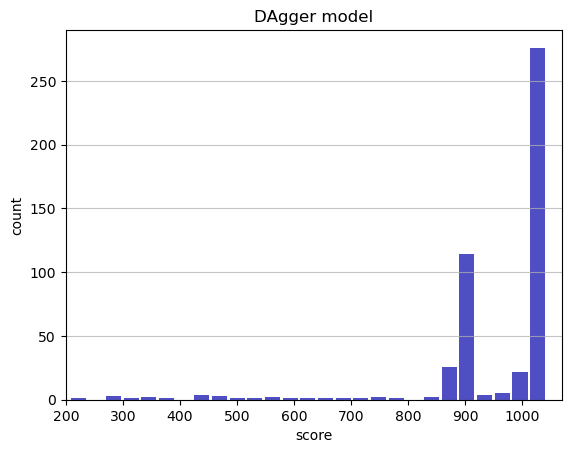

Track generation: 1017..1283 -> 266-tiles track
Epoch: 477
DAgger	mean: 953.93	variance: 133.09


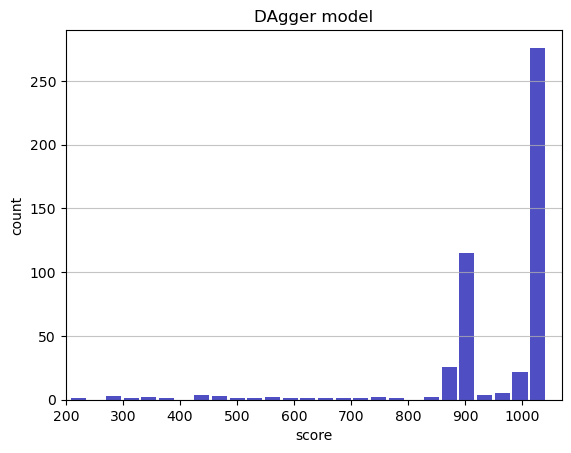

Track generation: 1165..1464 -> 299-tiles track
Epoch: 478
DAgger	mean: 954.07	variance: 132.99


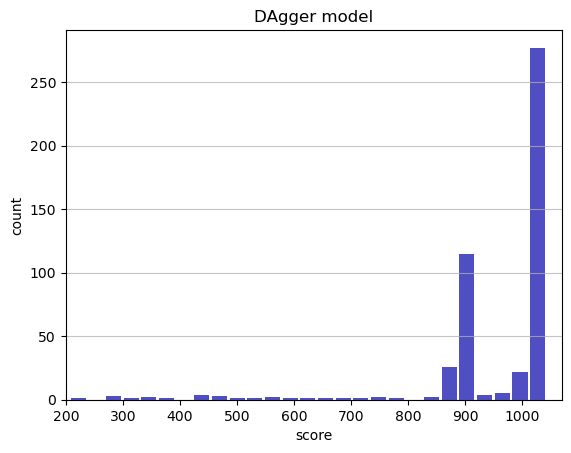

Track generation: 1143..1441 -> 298-tiles track
Epoch: 479
DAgger	mean: 954.21	variance: 132.89


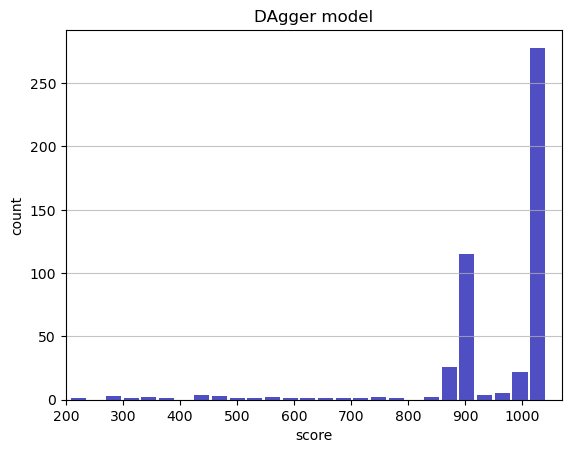

Track generation: 1043..1308 -> 265-tiles track
Epoch: 480
DAgger	mean: 954.37	variance: 132.80


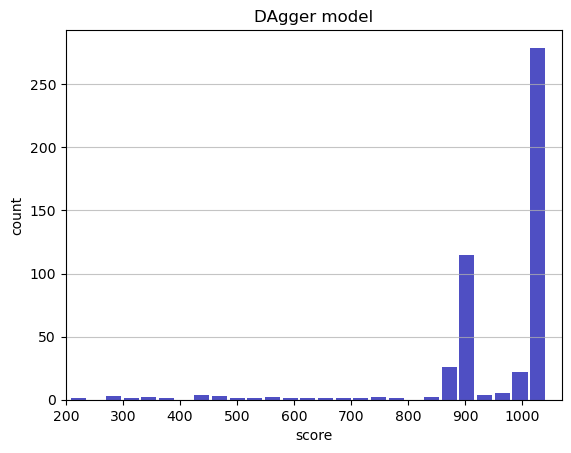

Track generation: 1328..1667 -> 339-tiles track
Epoch: 481
DAgger	mean: 954.47	variance: 132.68


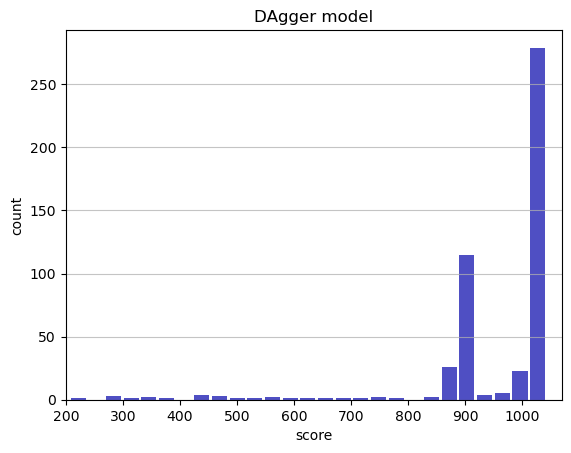

Track generation: 1273..1594 -> 321-tiles track
Epoch: 482
DAgger	mean: 954.61	variance: 132.57


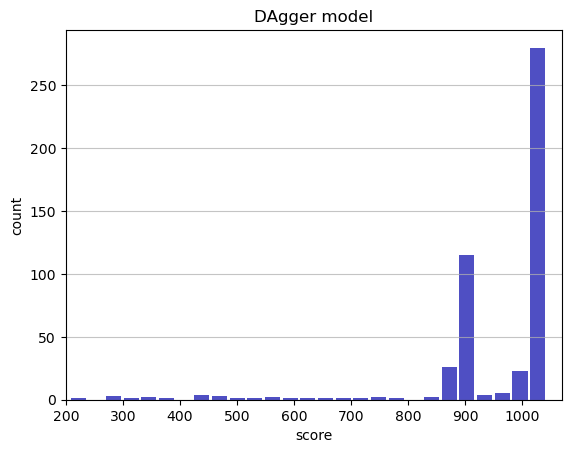

Track generation: 1224..1534 -> 310-tiles track
Epoch: 483
DAgger	mean: 954.75	variance: 132.47


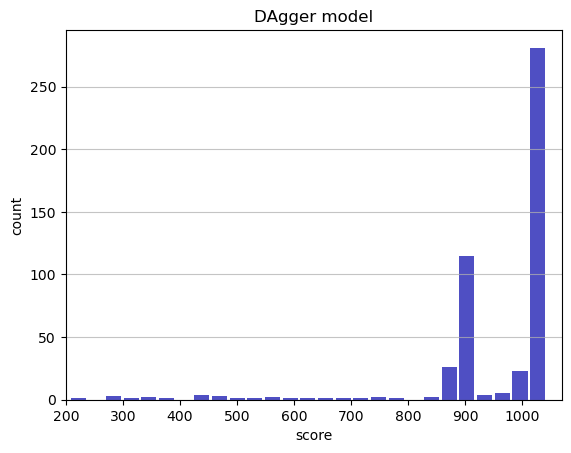

Track generation: 1232..1544 -> 312-tiles track
Epoch: 484
DAgger	mean: 954.63	variance: 132.36


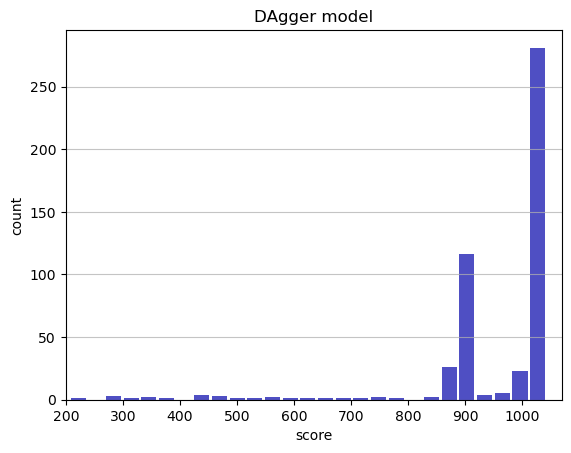

Track generation: 1048..1318 -> 270-tiles track
Epoch: 485
DAgger	mean: 954.79	variance: 132.27


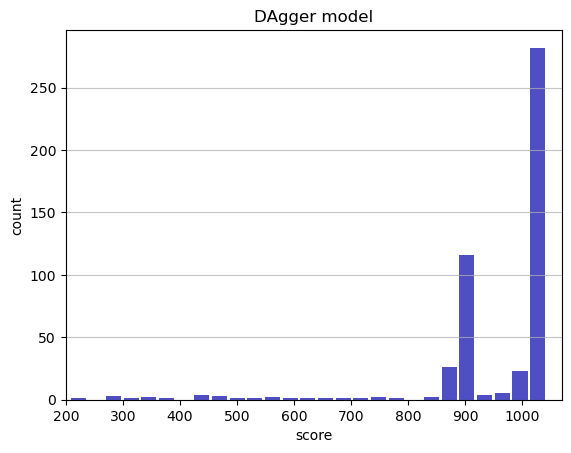

Track generation: 1062..1331 -> 269-tiles track
Epoch: 486
DAgger	mean: 954.95	variance: 132.18


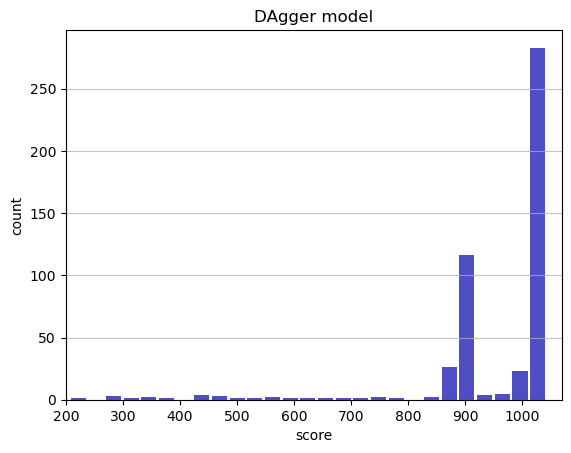

Track generation: 1136..1424 -> 288-tiles track
Epoch: 487
DAgger	mean: 954.86	variance: 132.06


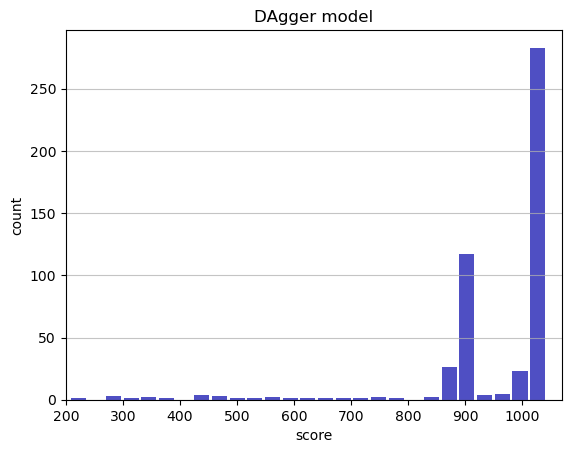

Track generation: 1107..1388 -> 281-tiles track
Epoch: 488
DAgger	mean: 955.02	variance: 131.97


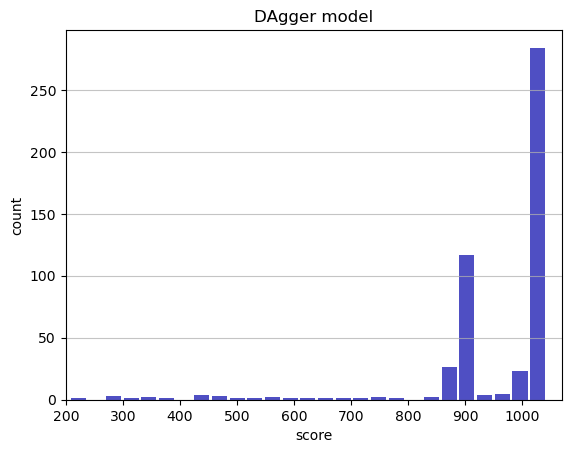

Track generation: 1076..1349 -> 273-tiles track
Epoch: 489
DAgger	mean: 955.17	variance: 131.88


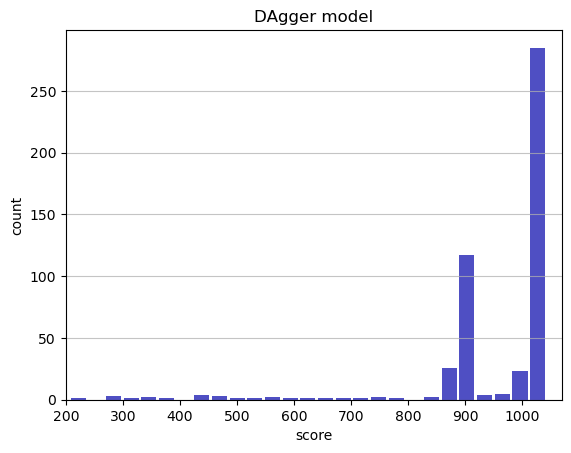

Track generation: 1162..1457 -> 295-tiles track
Epoch: 490
DAgger	mean: 955.30	variance: 131.77


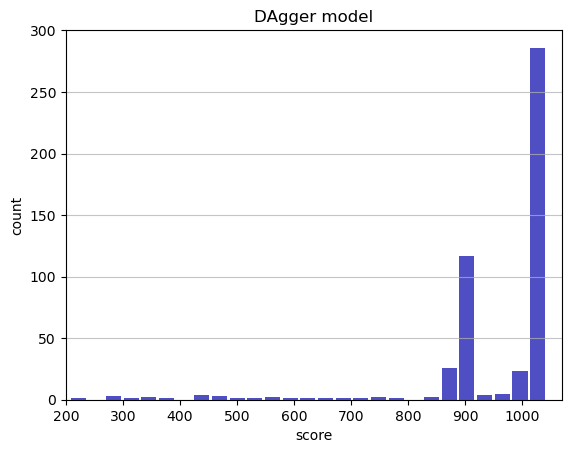

Track generation: 930..1173 -> 243-tiles track
Epoch: 491
DAgger	mean: 954.49	variance: 132.85


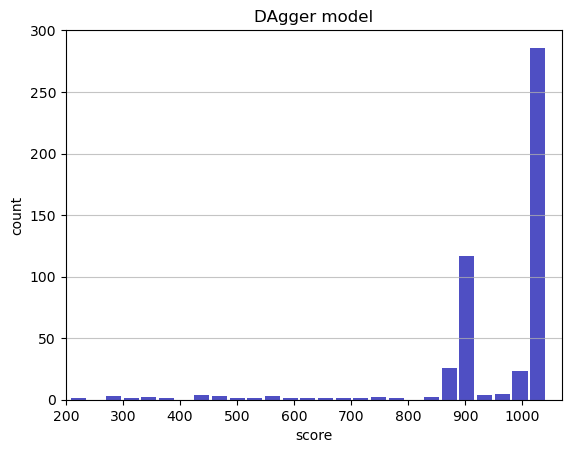

Track generation: 1151..1443 -> 292-tiles track
Epoch: 492
DAgger	mean: 954.39	variance: 132.74


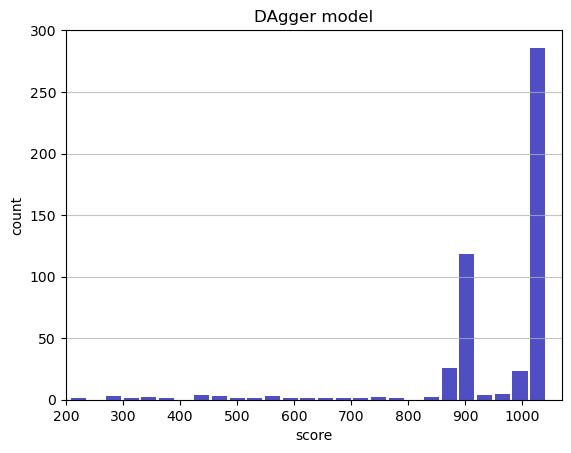

Track generation: 1160..1454 -> 294-tiles track
Epoch: 493
DAgger	mean: 954.52	variance: 132.63


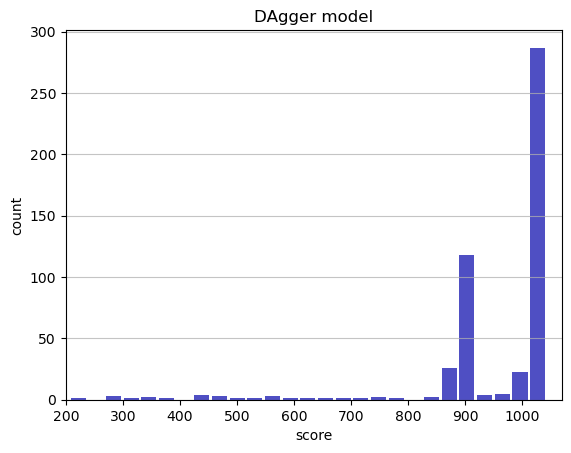

Track generation: 1127..1413 -> 286-tiles track
Epoch: 494
DAgger	mean: 954.40	variance: 132.52


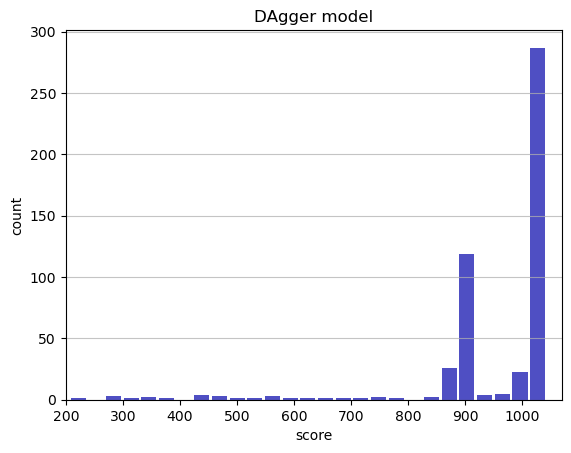

Track generation: 1207..1512 -> 305-tiles track
Epoch: 495
DAgger	mean: 954.53	variance: 132.42


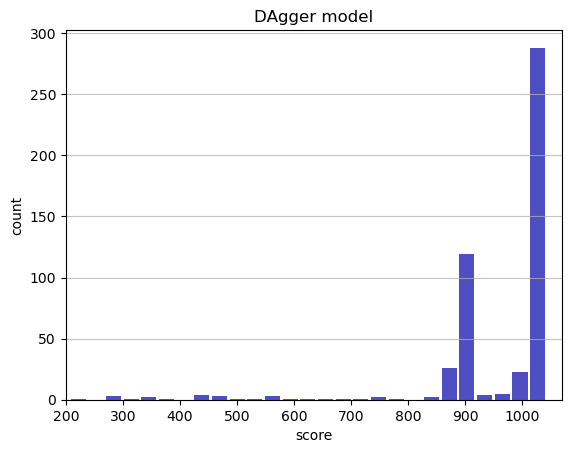

Track generation: 1080..1354 -> 274-tiles track
Epoch: 496
DAgger	mean: 954.40	variance: 132.32


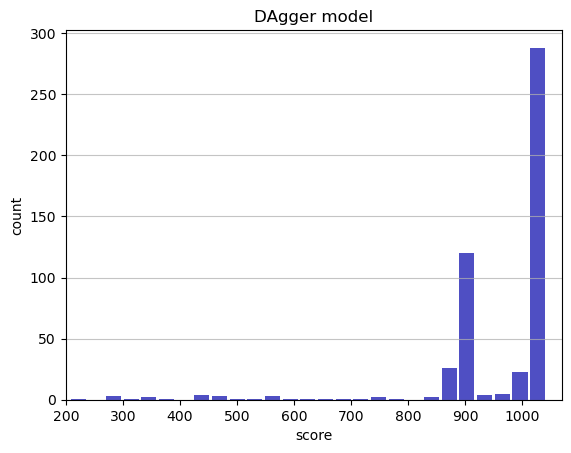

Track generation: 1186..1487 -> 301-tiles track
Epoch: 497
DAgger	mean: 954.25	variance: 132.23


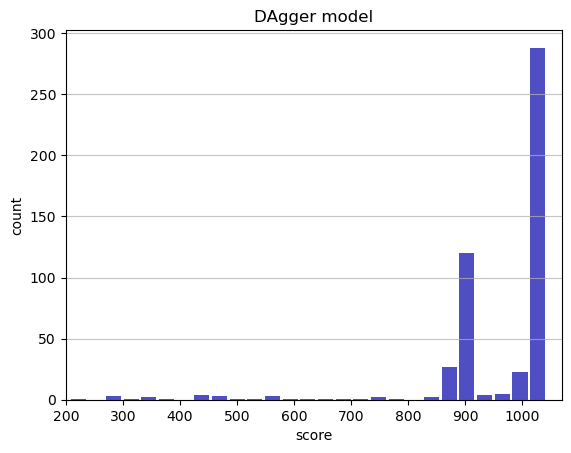

Track generation: 1164..1464 -> 300-tiles track
Epoch: 498
DAgger	mean: 954.39	variance: 132.13


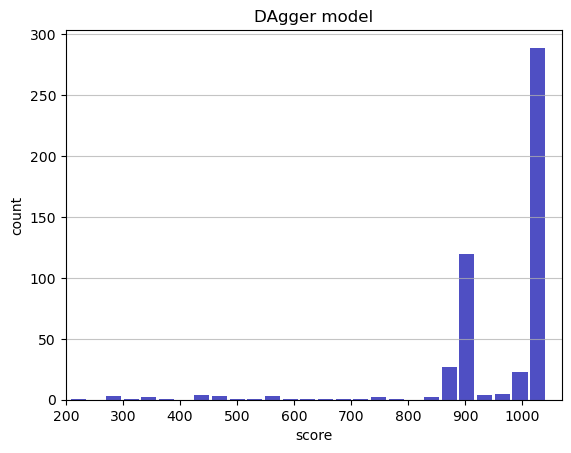

Track generation: 1231..1543 -> 312-tiles track
Epoch: 499
DAgger	mean: 954.53	variance: 132.03


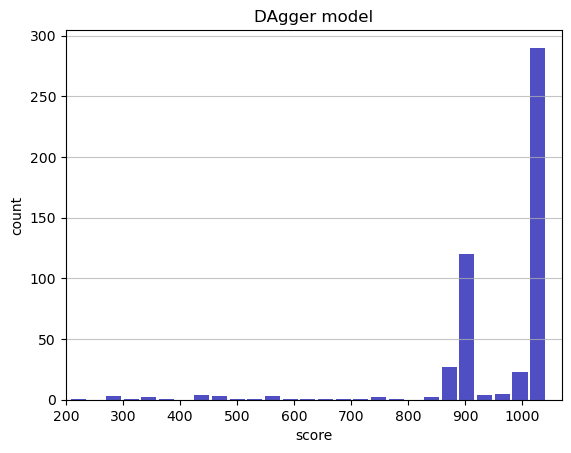

Track generation: 1108..1389 -> 281-tiles track
Epoch: 500
DAgger	mean: 954.67	variance: 131.94


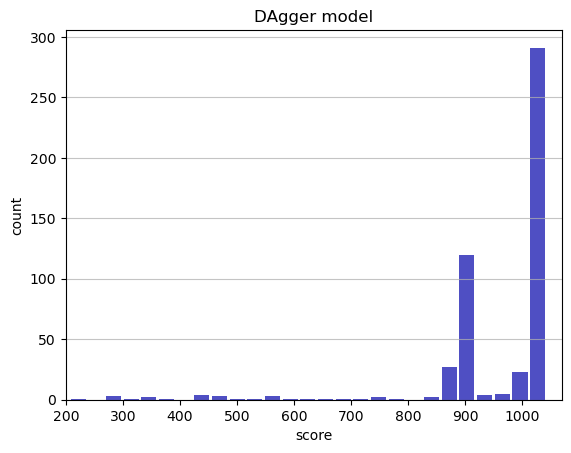

Track generation: 1189..1491 -> 302-tiles track
Epoch: 501
DAgger	mean: 954.80	variance: 131.84


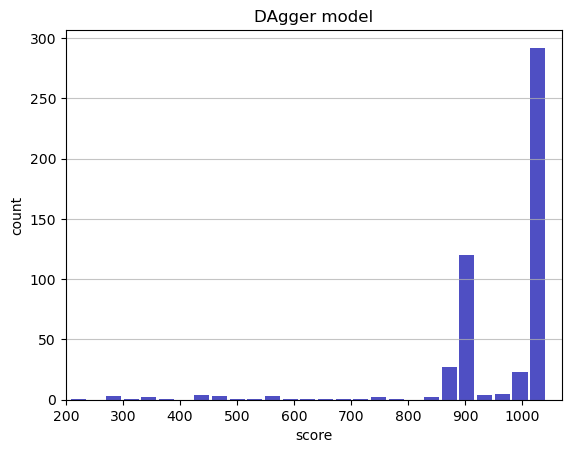

Track generation: 1166..1462 -> 296-tiles track
Epoch: 502
DAgger	mean: 954.70	variance: 131.73


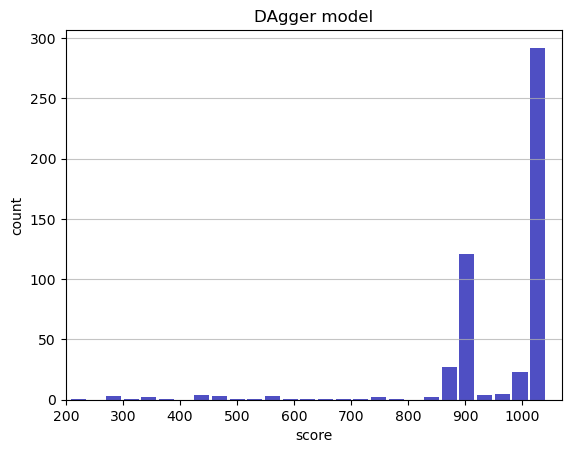

Track generation: 1026..1297 -> 271-tiles track
Epoch: 503
DAgger	mean: 954.85	variance: 131.64


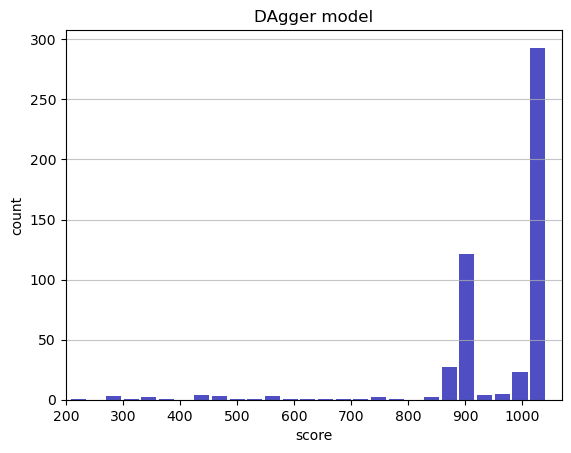

Track generation: 1040..1304 -> 264-tiles track
Epoch: 504
DAgger	mean: 955.01	variance: 131.56


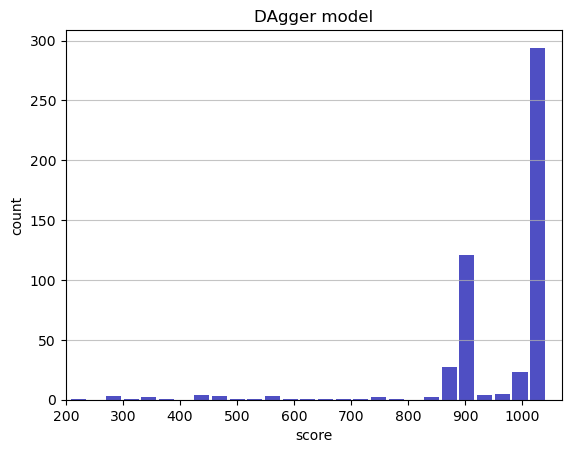

Track generation: 1208..1514 -> 306-tiles track
Epoch: 505
DAgger	mean: 955.14	variance: 131.46


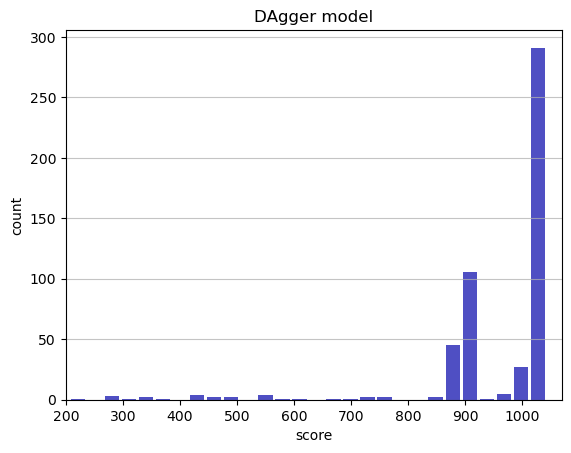

Track generation: 1285..1610 -> 325-tiles track
Epoch: 506
DAgger	mean: 954.71	variance: 131.70


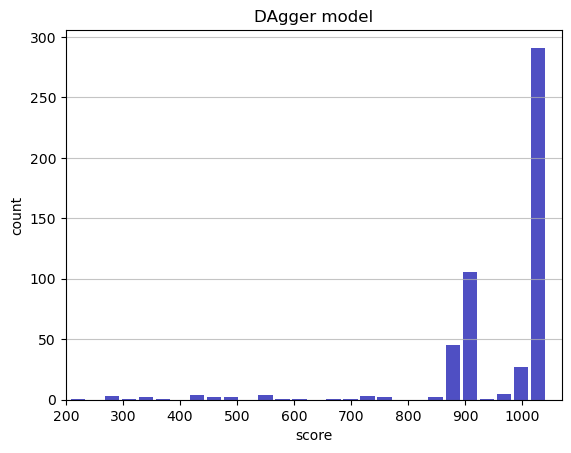

Track generation: 1243..1558 -> 315-tiles track
Epoch: 507
DAgger	mean: 954.83	variance: 131.60


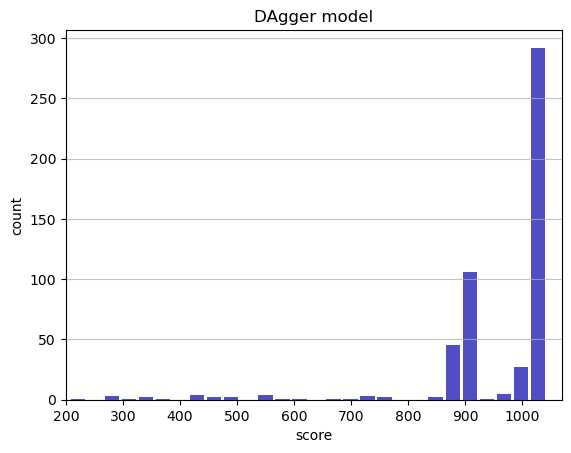

Track generation: 1173..1470 -> 297-tiles track
Epoch: 508
DAgger	mean: 954.72	variance: 131.49


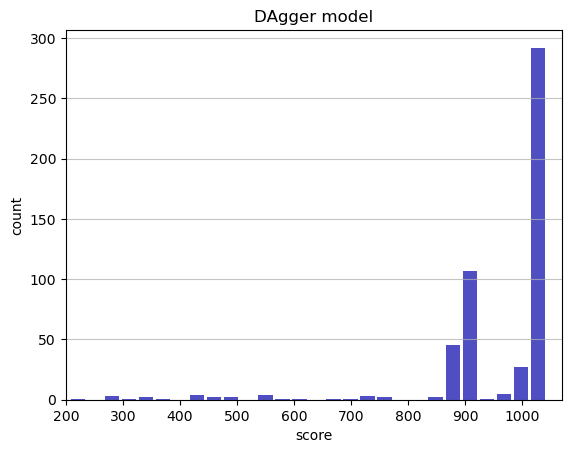

Track generation: 1173..1470 -> 297-tiles track
Epoch: 509
DAgger	mean: 954.85	variance: 131.39


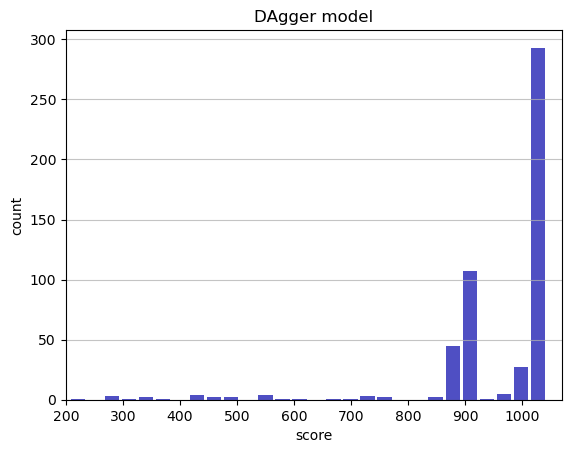

Track generation: 1183..1483 -> 300-tiles track
Epoch: 510
DAgger	mean: 954.74	variance: 131.29


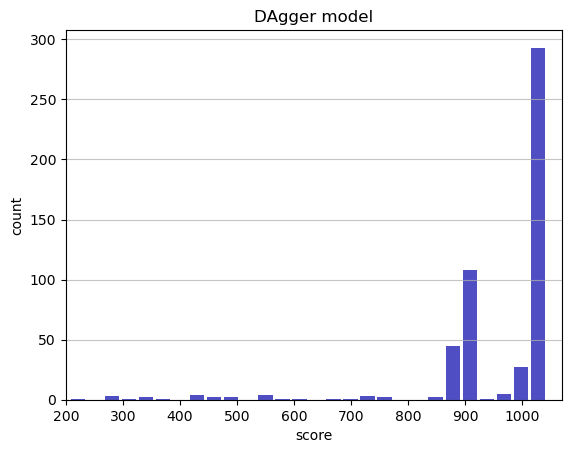

Track generation: 1284..1609 -> 325-tiles track
Epoch: 511
DAgger	mean: 954.86	variance: 131.19


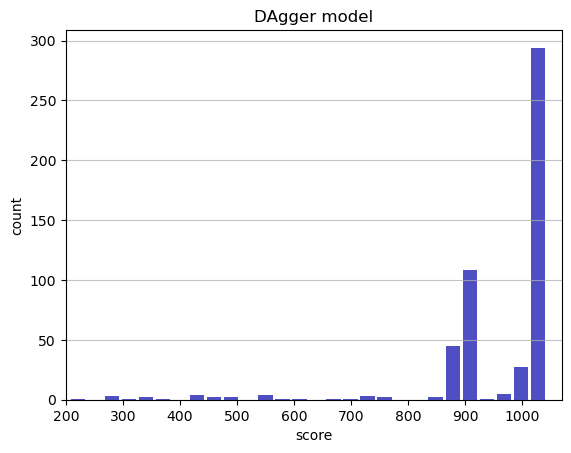

Track generation: 1287..1612 -> 325-tiles track
Epoch: 512
DAgger	mean: 954.98	variance: 131.08


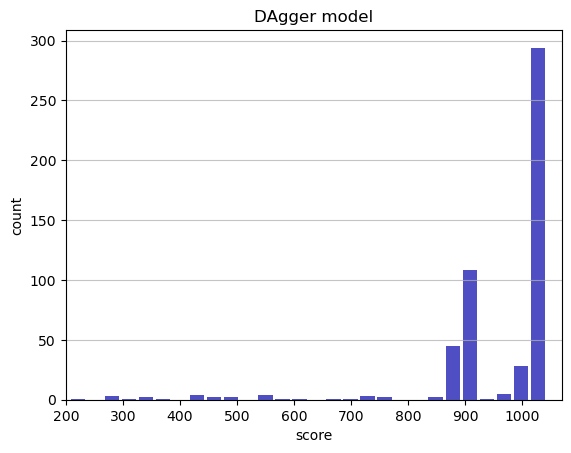

Track generation: 1322..1654 -> 332-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1112..1394 -> 282-tiles track
Epoch: 513
DAgger	mean: 954.88	variance: 130.97


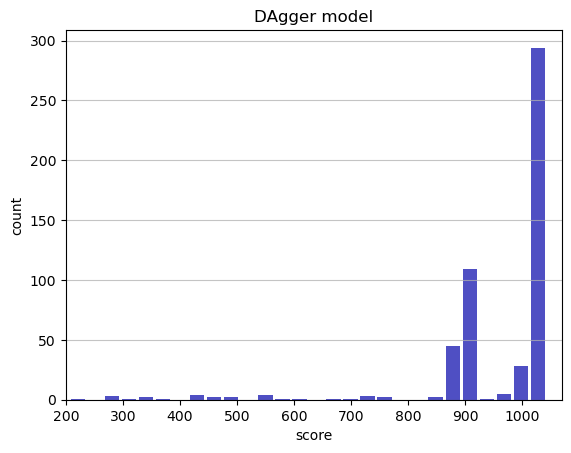

Track generation: 1210..1517 -> 307-tiles track
Epoch: 514
DAgger	mean: 954.76	variance: 130.88


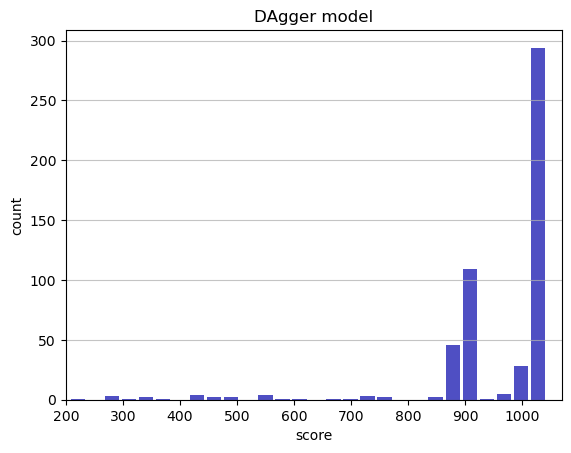

Track generation: 1073..1349 -> 276-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1136..1424 -> 288-tiles track
Epoch: 515
DAgger	mean: 954.89	variance: 130.78


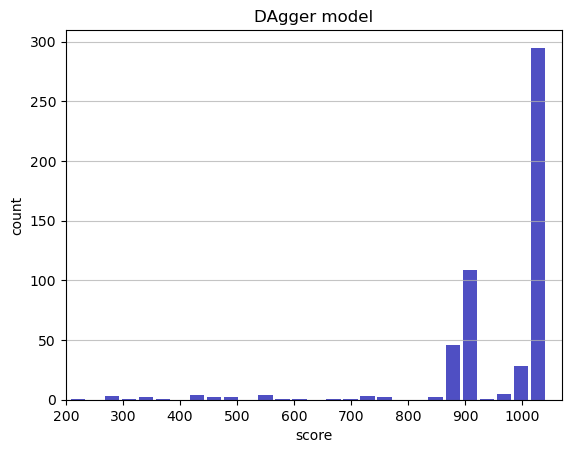

Track generation: 1097..1375 -> 278-tiles track
Epoch: 516
DAgger	mean: 954.74	variance: 130.70


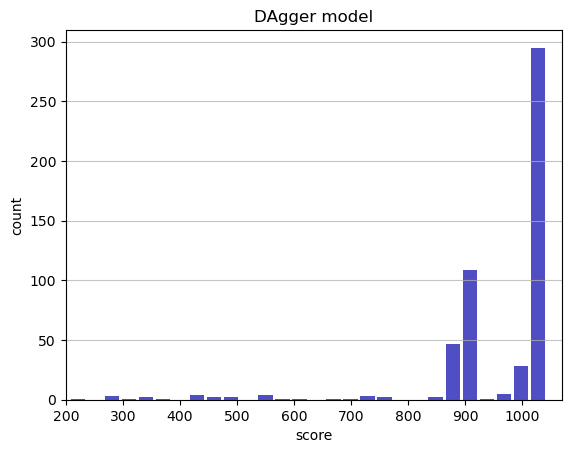

Track generation: 1260..1579 -> 319-tiles track
Epoch: 517
DAgger	mean: 953.64	variance: 132.93


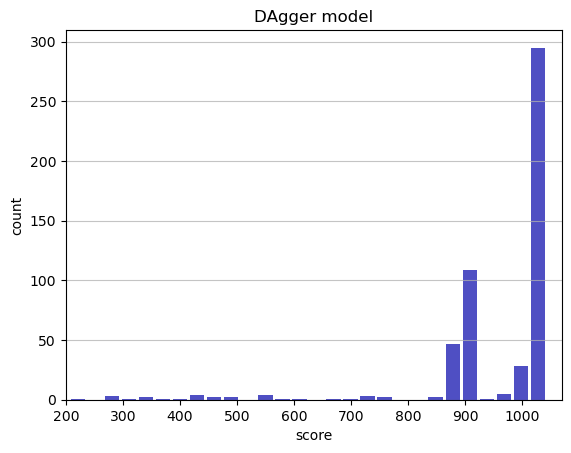

Track generation: 1215..1523 -> 308-tiles track
Epoch: 518
DAgger	mean: 953.77	variance: 132.83


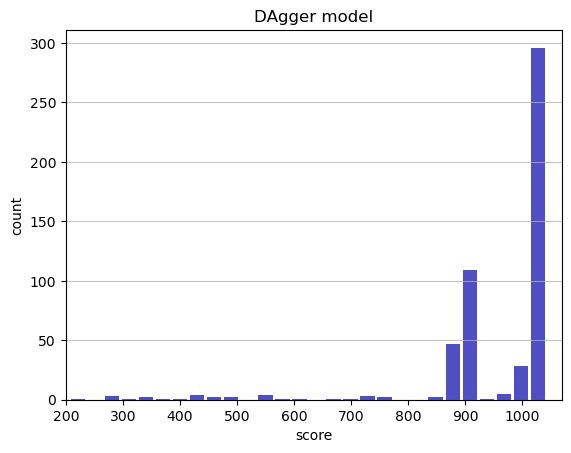

Track generation: 1101..1380 -> 279-tiles track
Epoch: 519
DAgger	mean: 953.65	variance: 132.73


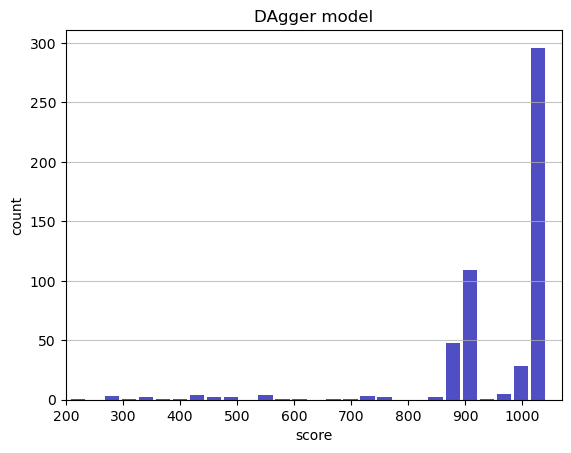

Track generation: 1260..1579 -> 319-tiles track
Epoch: 520
DAgger	mean: 953.78	variance: 132.63


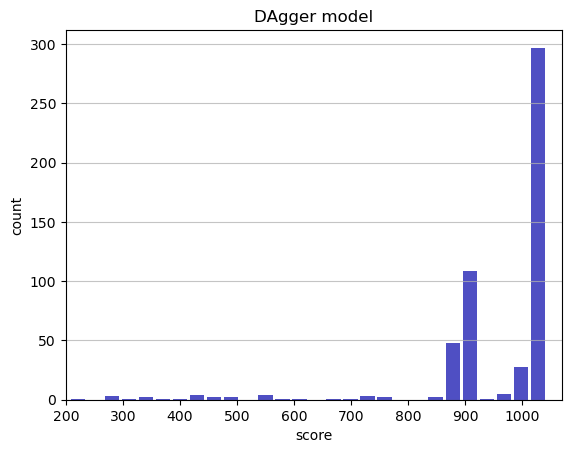

Track generation: 1283..1608 -> 325-tiles track
Epoch: 521
DAgger	mean: 953.65	variance: 132.54


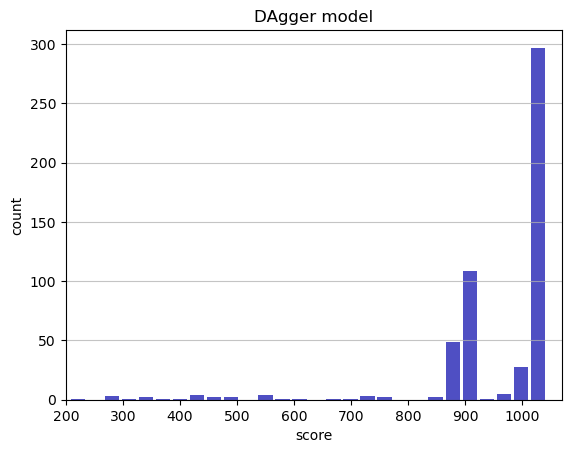

Track generation: 1255..1573 -> 318-tiles track
Epoch: 522
DAgger	mean: 953.55	variance: 132.43


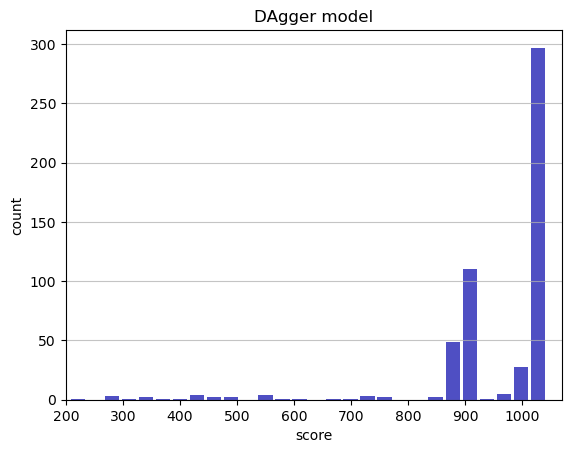

Track generation: 1204..1509 -> 305-tiles track
Epoch: 523
DAgger	mean: 953.69	variance: 132.34


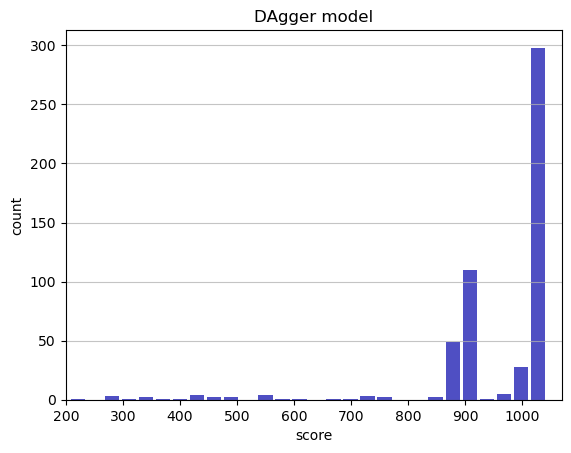

Track generation: 1171..1470 -> 299-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 980..1234 -> 254-tiles track
Epoch: 524
DAgger	mean: 953.85	variance: 132.26


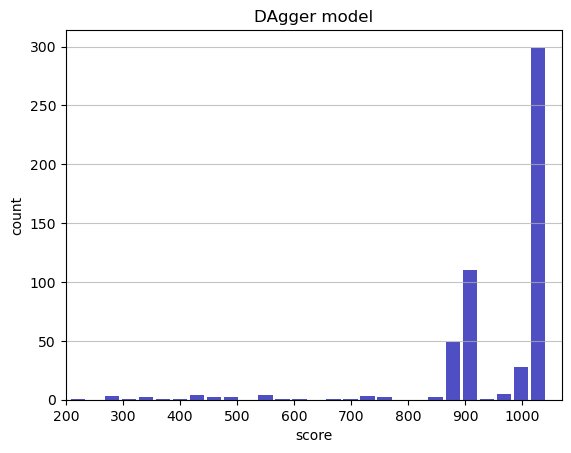

Track generation: 1103..1383 -> 280-tiles track
Epoch: 525
DAgger	mean: 954.00	variance: 132.18


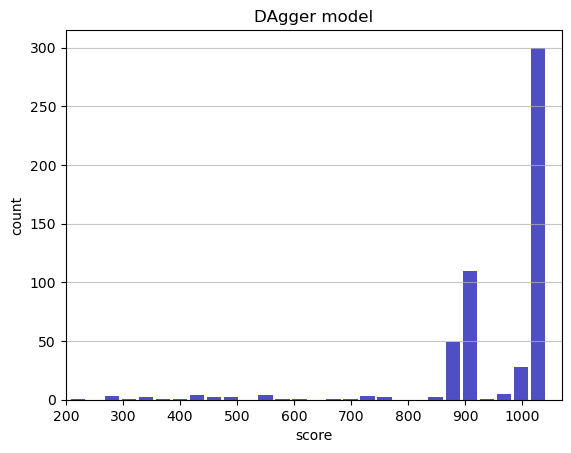

Track generation: 1152..1441 -> 289-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1063..1335 -> 272-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1017..1275 -> 258-tiles track
Epoch: 526
DAgger	mean: 954.14	variance: 132.10


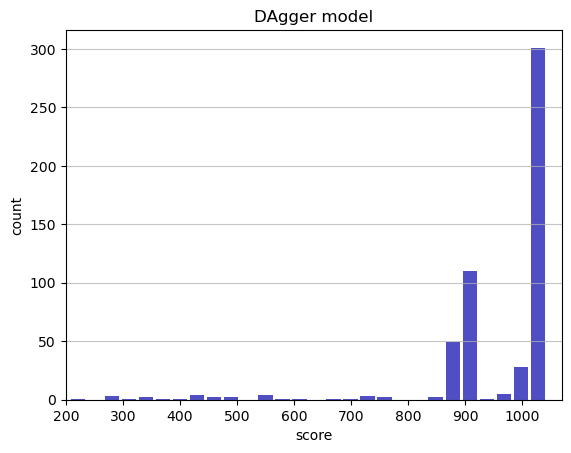

Track generation: 1012..1278 -> 266-tiles track
Epoch: 527
DAgger	mean: 954.29	variance: 132.02


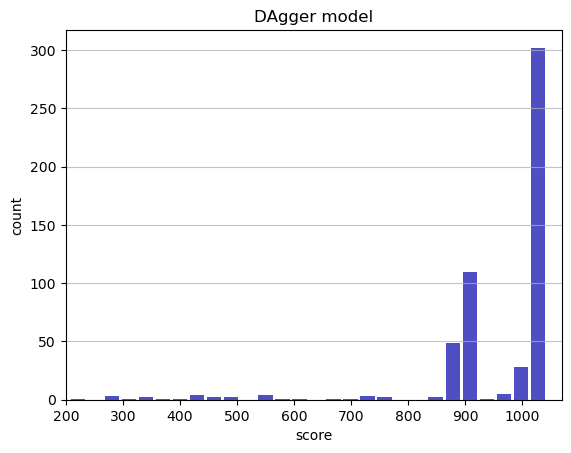

Track generation: 1122..1415 -> 293-tiles track
Epoch: 528
DAgger	mean: 954.43	variance: 131.93


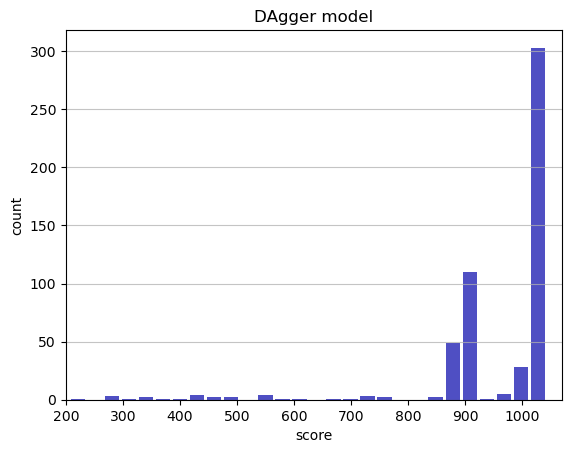

Track generation: 1096..1374 -> 278-tiles track
Epoch: 529
DAgger	mean: 954.32	variance: 131.83


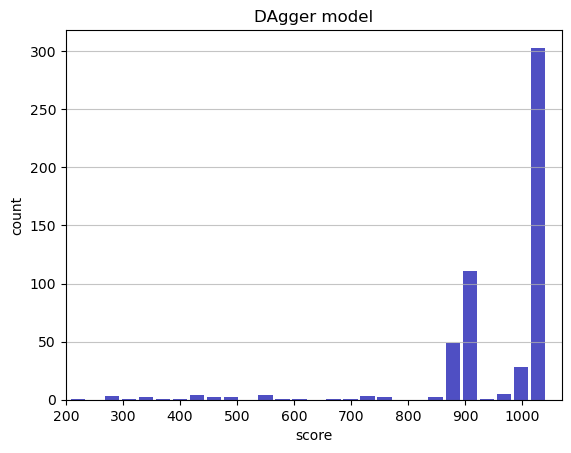

Track generation: 1264..1584 -> 320-tiles track
Epoch: 530
DAgger	mean: 954.44	variance: 131.74


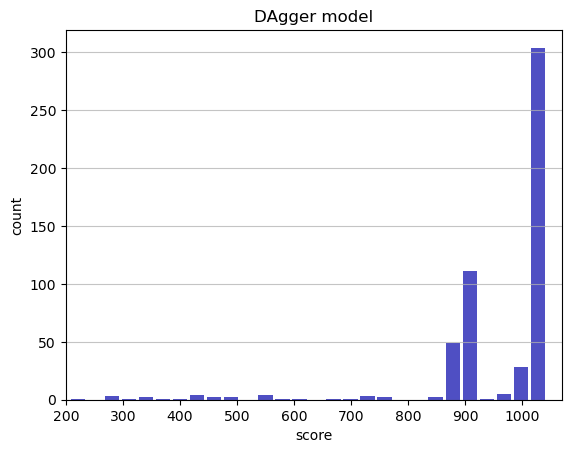

Track generation: 1125..1415 -> 290-tiles track
Epoch: 531
DAgger	mean: 954.36	variance: 131.63


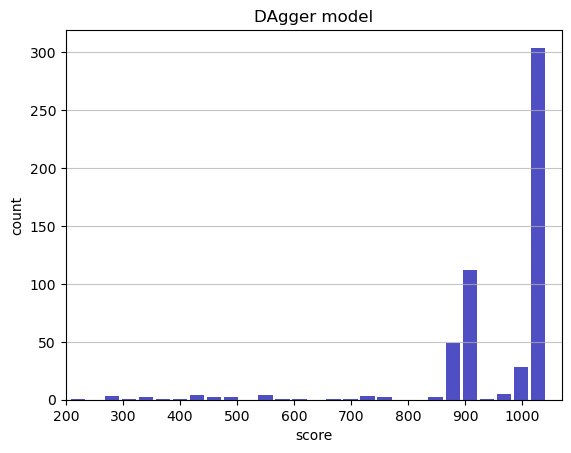

Track generation: 1312..1644 -> 332-tiles track
Epoch: 532
DAgger	mean: 954.43	variance: 131.52


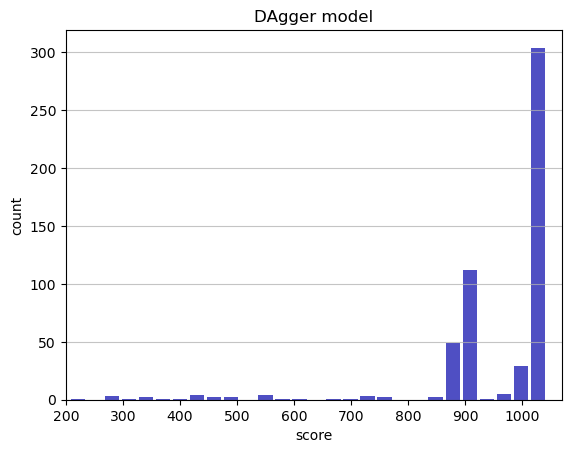

Track generation: 1111..1393 -> 282-tiles track
Epoch: 533
DAgger	mean: 954.57	variance: 131.43


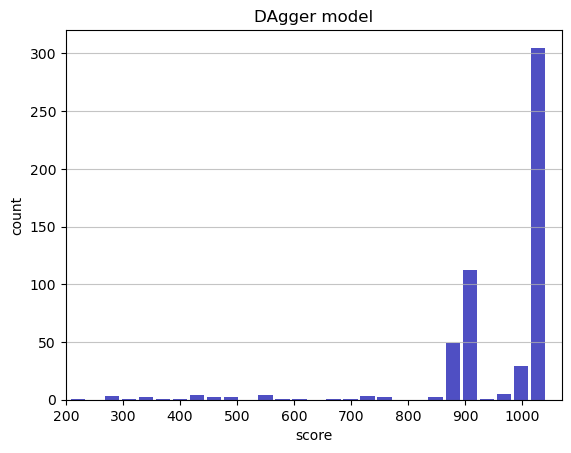

Track generation: 1155..1448 -> 293-tiles track
Epoch: 534
DAgger	mean: 954.45	variance: 131.33


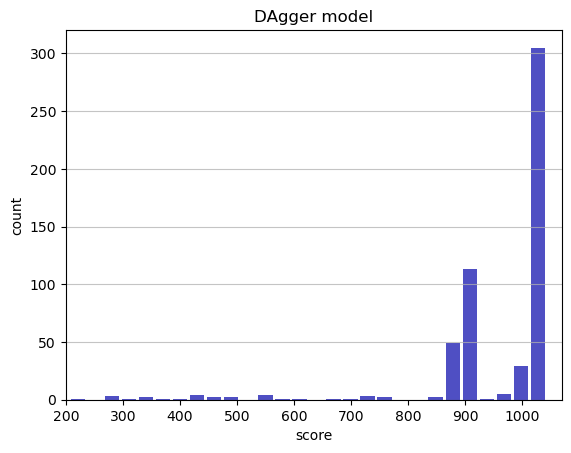

Track generation: 1167..1463 -> 296-tiles track
Epoch: 535
DAgger	mean: 954.58	variance: 131.24


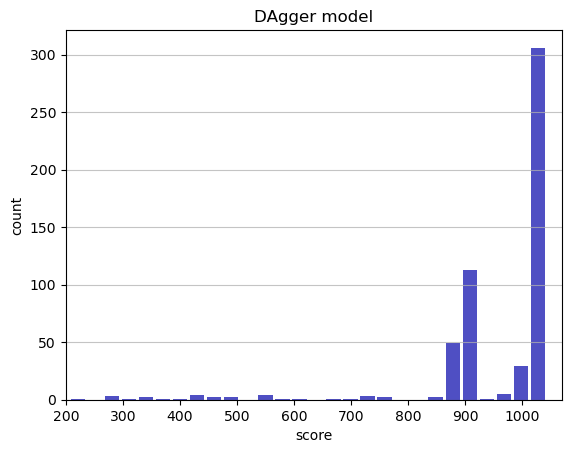

Track generation: 1023..1283 -> 260-tiles track
Epoch: 536
DAgger	mean: 954.42	variance: 131.17


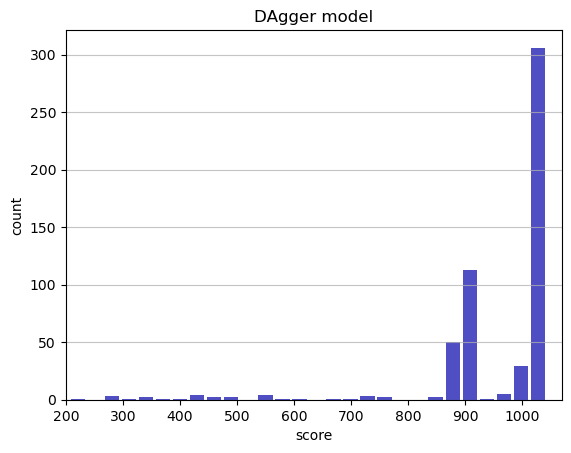

Track generation: 1131..1417 -> 286-tiles track
Epoch: 537
DAgger	mean: 954.33	variance: 131.06


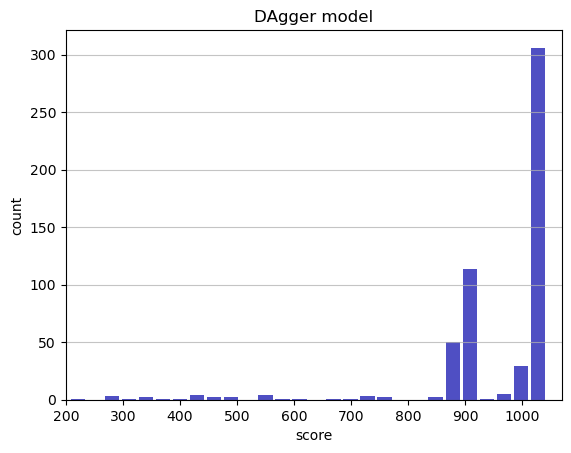

Track generation: 1117..1400 -> 283-tiles track
Epoch: 538
DAgger	mean: 954.47	variance: 130.98


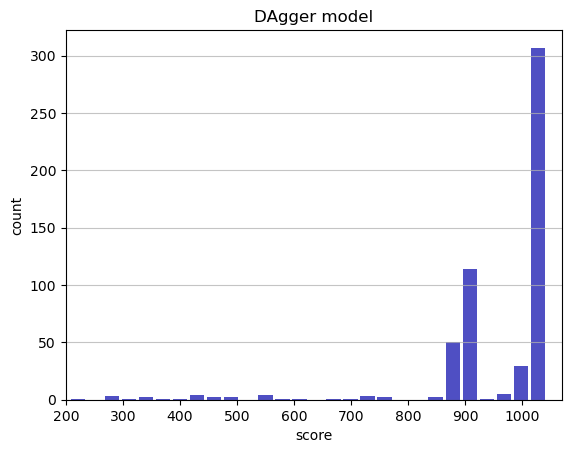

Track generation: 1199..1503 -> 304-tiles track
Epoch: 539
DAgger	mean: 954.60	variance: 130.90


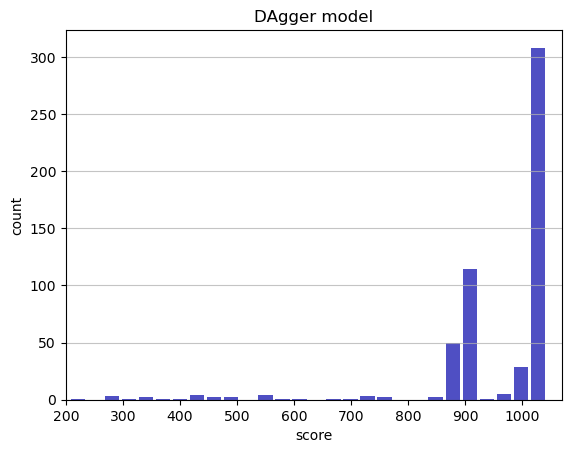

Track generation: 1097..1376 -> 279-tiles track
Epoch: 540
DAgger	mean: 954.50	variance: 130.80


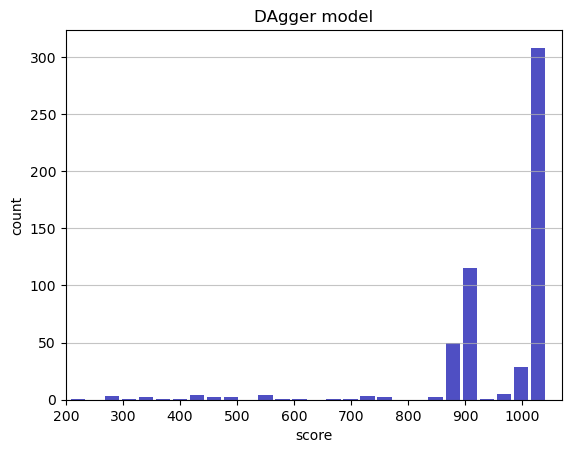

Track generation: 1070..1345 -> 275-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1127..1413 -> 286-tiles track
Epoch: 541
DAgger	mean: 954.42	variance: 130.69


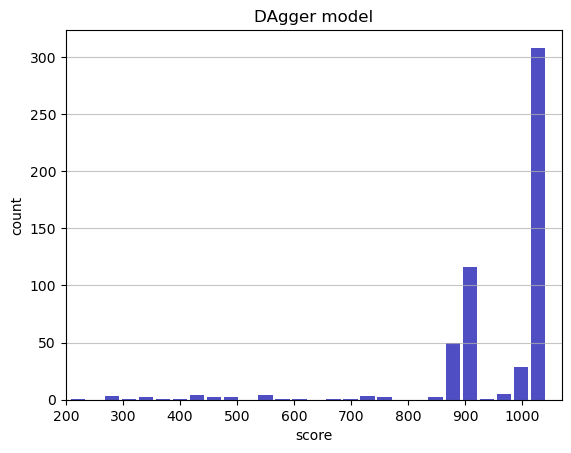

Track generation: 1183..1483 -> 300-tiles track
Epoch: 542
DAgger	mean: 954.09	variance: 130.79


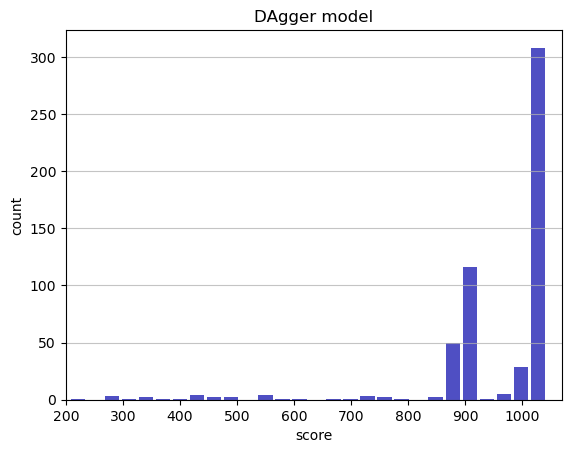

Track generation: 1120..1404 -> 284-tiles track
Epoch: 543
DAgger	mean: 953.45	variance: 131.52


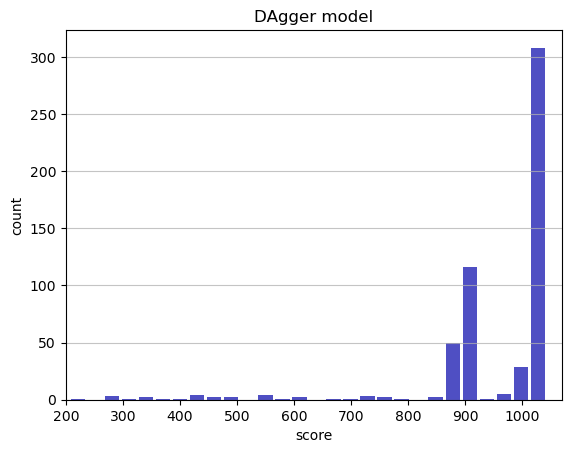

Track generation: 1263..1583 -> 320-tiles track
Epoch: 544
DAgger	mean: 953.57	variance: 131.43


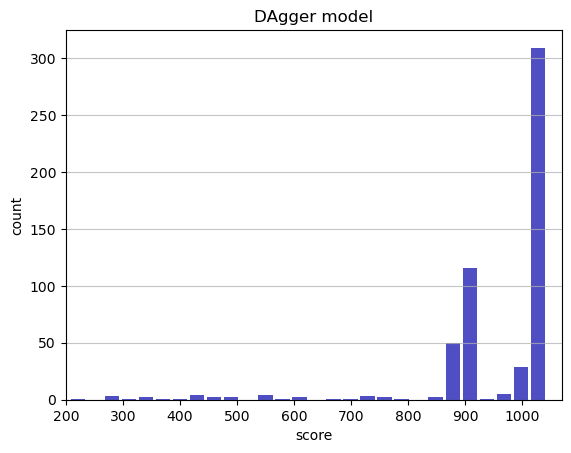

Track generation: 1265..1584 -> 319-tiles track
Epoch: 545
DAgger	mean: 953.68	variance: 131.33


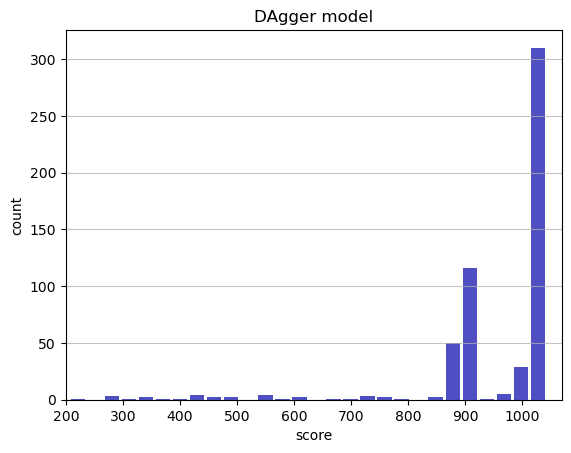

Track generation: 987..1249 -> 262-tiles track
Epoch: 546
DAgger	mean: 953.60	variance: 131.22


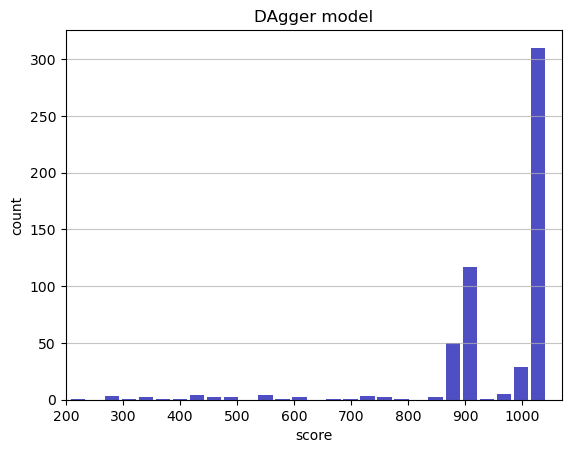

Track generation: 1185..1485 -> 300-tiles track
Epoch: 547
DAgger	mean: 952.45	variance: 133.82


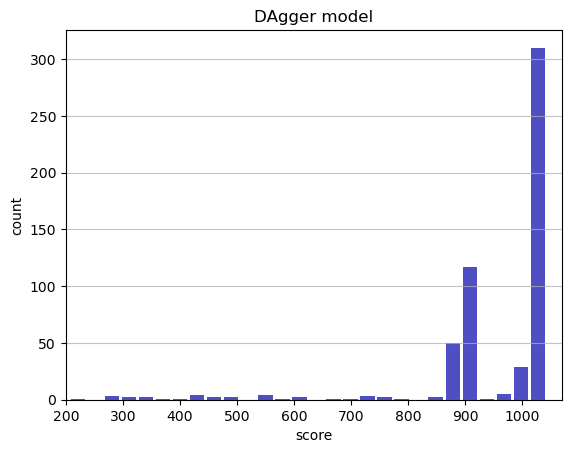

Track generation: 1075..1352 -> 277-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1228..1539 -> 311-tiles track
Epoch: 548
DAgger	mean: 952.57	variance: 133.73


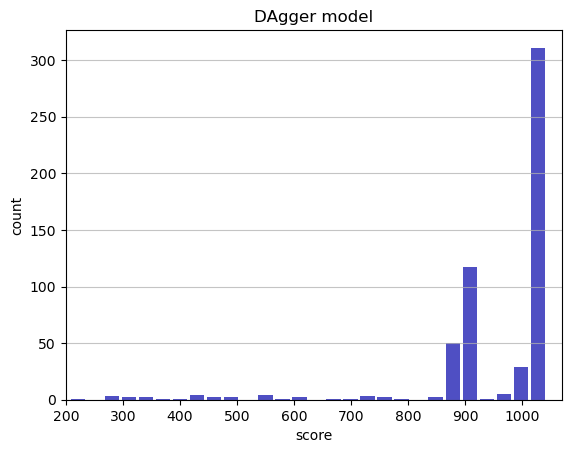

Track generation: 1247..1563 -> 316-tiles track
Epoch: 549
DAgger	mean: 952.46	variance: 133.63


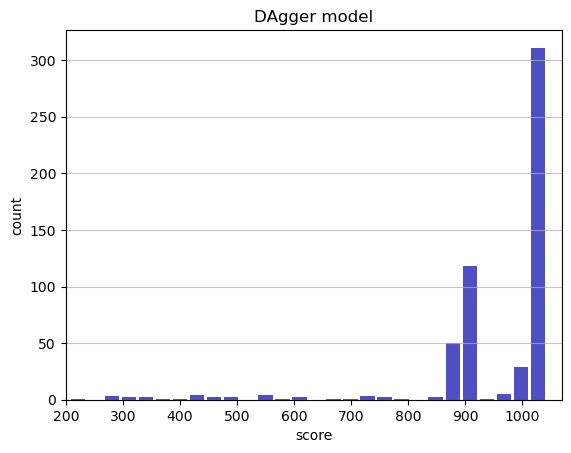

Track generation: 1117..1400 -> 283-tiles track
Epoch: 550
DAgger	mean: 952.38	variance: 133.52


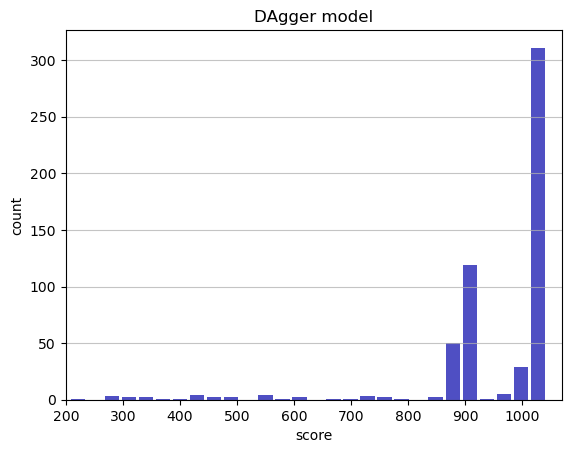

Track generation: 1109..1390 -> 281-tiles track
Epoch: 551
DAgger	mean: 952.26	variance: 133.43


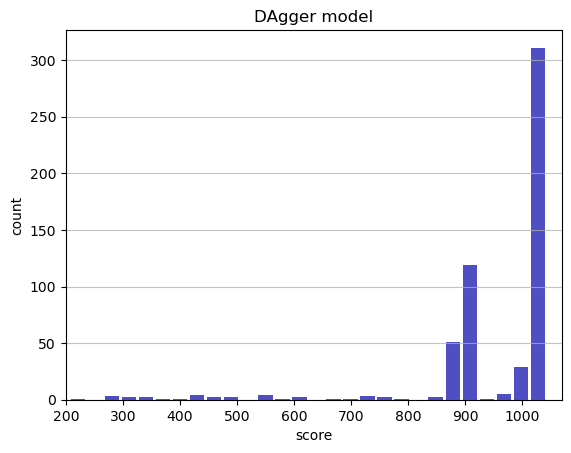

Track generation: 1337..1686 -> 349-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 996..1249 -> 253-tiles track
Epoch: 552
DAgger	mean: 952.17	variance: 133.33


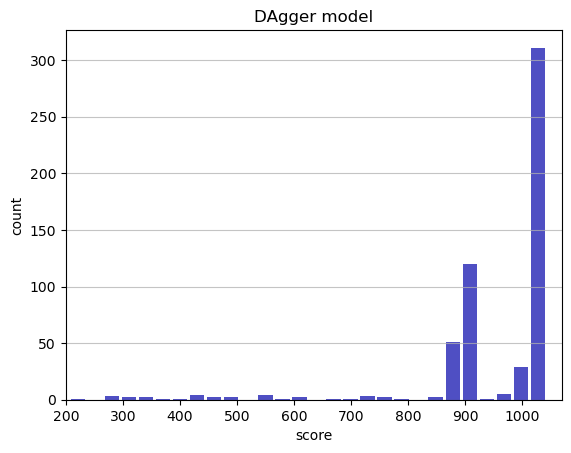

Track generation: 1216..1525 -> 309-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1112..1394 -> 282-tiles track
Epoch: 553
DAgger	mean: 952.11	variance: 133.21


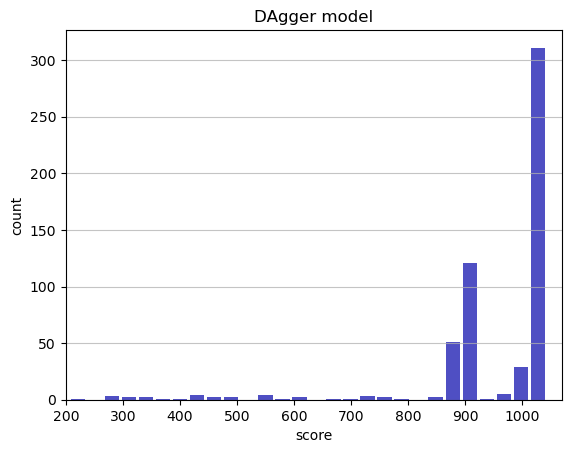

Track generation: 1103..1383 -> 280-tiles track
Epoch: 554
DAgger	mean: 952.25	variance: 133.14


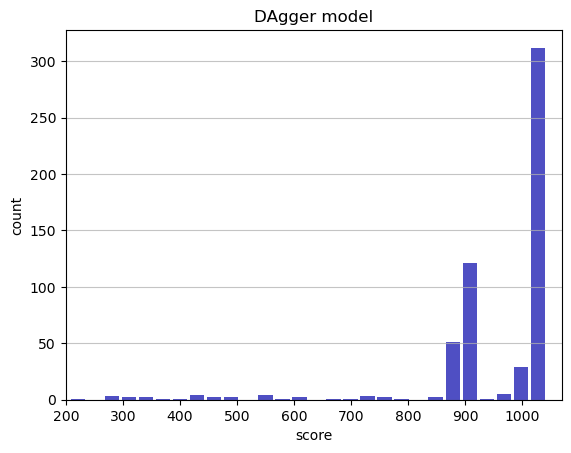

Track generation: 1027..1288 -> 261-tiles track
Epoch: 555
DAgger	mean: 952.40	variance: 133.06


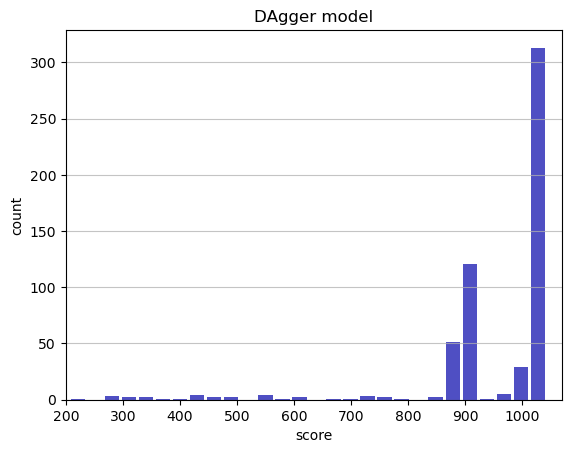

Track generation: 1118..1401 -> 283-tiles track
Epoch: 556
DAgger	mean: 952.53	variance: 132.98


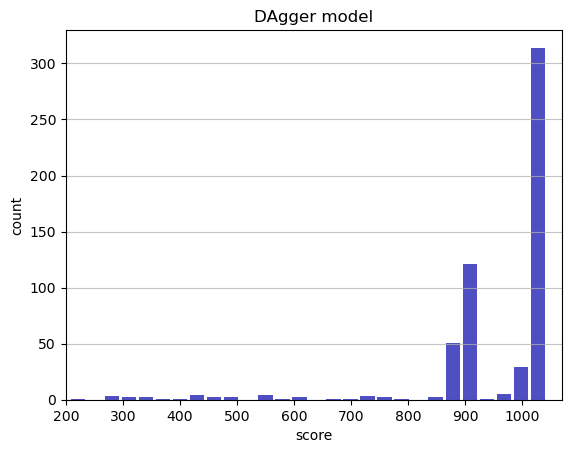

Track generation: 1190..1492 -> 302-tiles track
Epoch: 557
DAgger	mean: 952.42	variance: 132.88


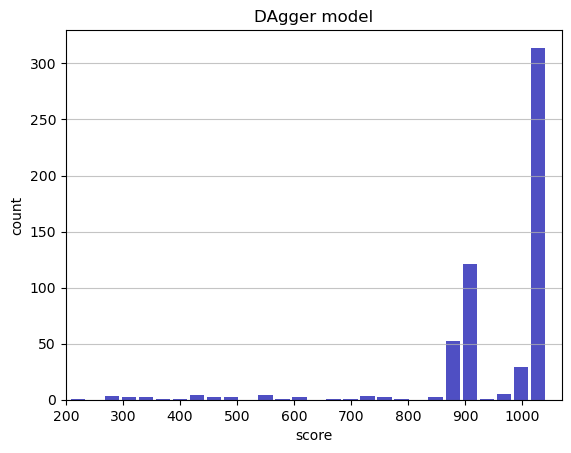

Track generation: 1259..1577 -> 318-tiles track
Epoch: 558
DAgger	mean: 952.41	variance: 132.76


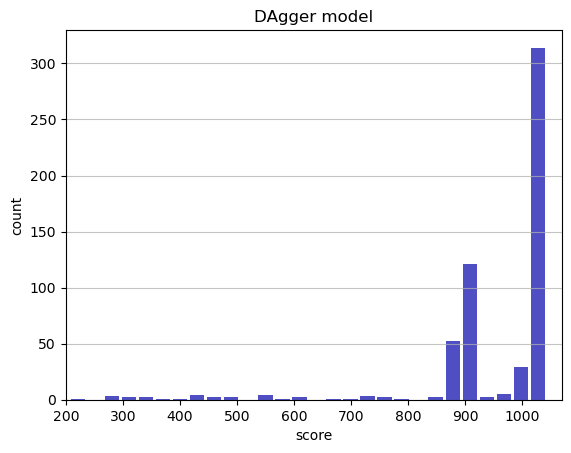

Track generation: 1284..1609 -> 325-tiles track
Epoch: 559
DAgger	mean: 952.52	variance: 132.67


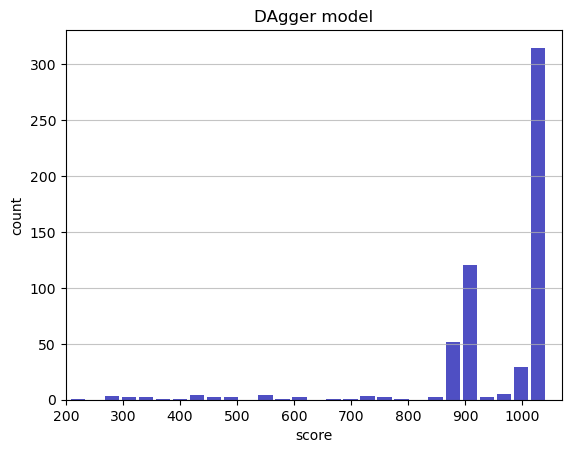

Track generation: 1188..1489 -> 301-tiles track
Epoch: 560
DAgger	mean: 952.64	variance: 132.58


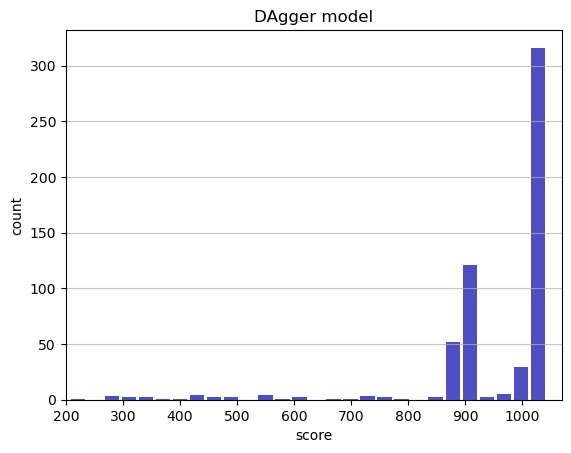

Track generation: 1224..1534 -> 310-tiles track
Epoch: 561
DAgger	mean: 952.76	variance: 132.49


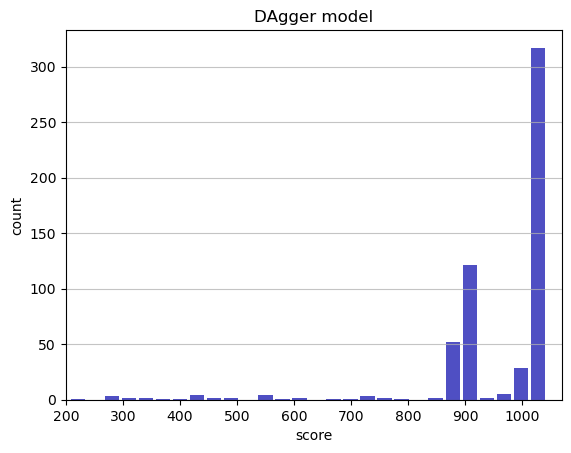

Track generation: 1057..1324 -> 267-tiles track
Epoch: 562
DAgger	mean: 952.90	variance: 132.42


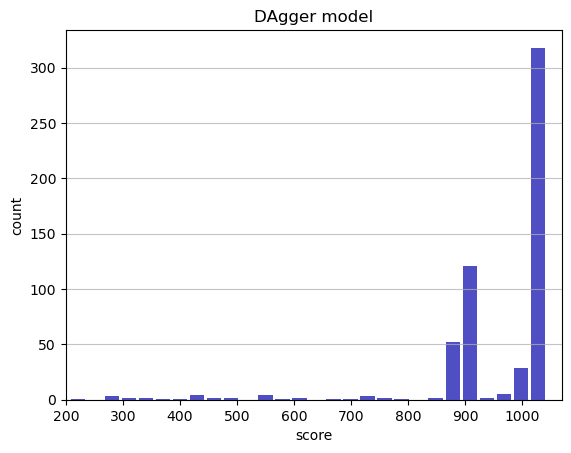

Track generation: 1235..1548 -> 313-tiles track
Epoch: 563
DAgger	mean: 953.02	variance: 132.33


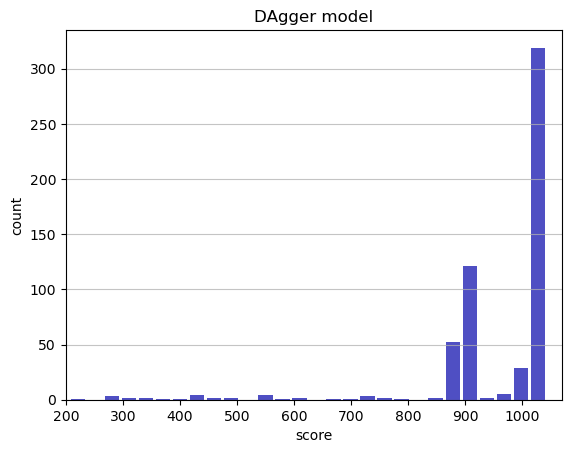

Track generation: 1038..1302 -> 264-tiles track
Epoch: 564
DAgger	mean: 953.17	variance: 132.26


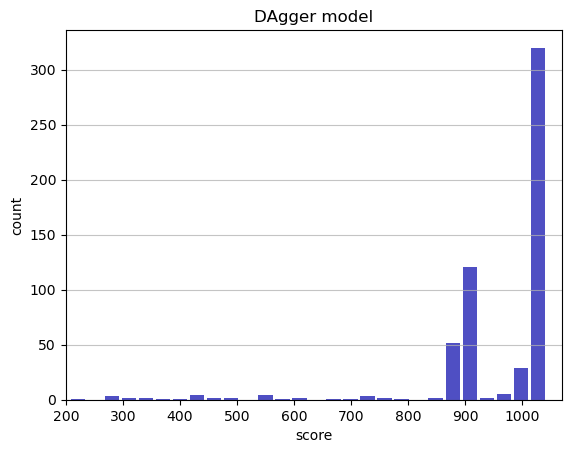

Track generation: 1043..1309 -> 266-tiles track
Epoch: 565
DAgger	mean: 953.30	variance: 132.18


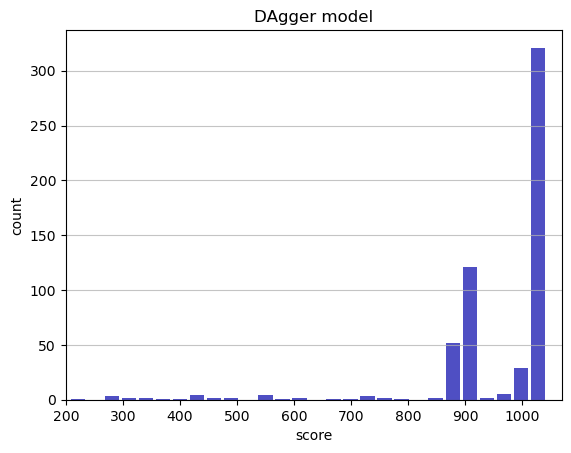

Track generation: 1221..1530 -> 309-tiles track
Epoch: 566
DAgger	mean: 953.42	variance: 132.09


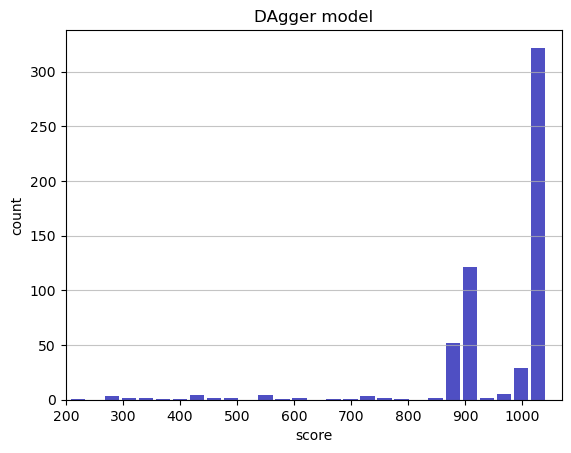

Track generation: 1152..1444 -> 292-tiles track
Epoch: 567
DAgger	mean: 953.55	variance: 132.01


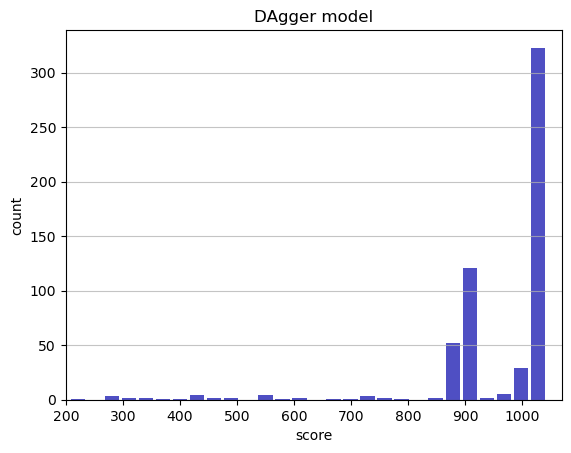

Track generation: 1115..1398 -> 283-tiles track
Epoch: 568
DAgger	mean: 953.67	variance: 131.93


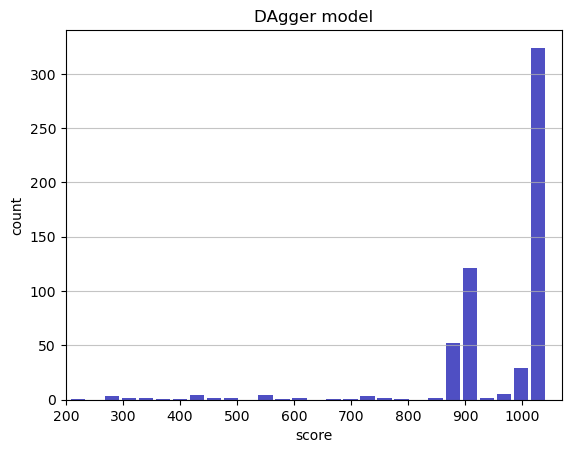

Track generation: 997..1251 -> 254-tiles track
Epoch: 569
DAgger	mean: 953.82	variance: 131.86


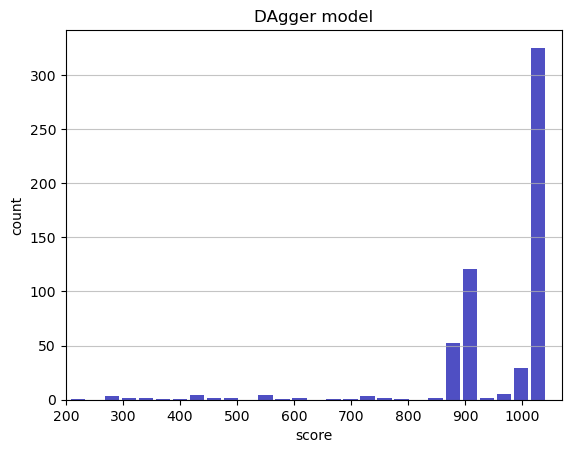

Track generation: 1080..1354 -> 274-tiles track
Epoch: 570
DAgger	mean: 953.74	variance: 131.75


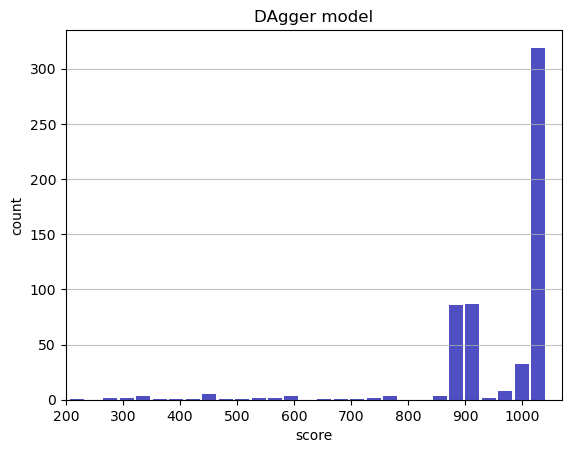

Track generation: 1182..1482 -> 300-tiles track
Epoch: 571
DAgger	mean: 953.86	variance: 131.67


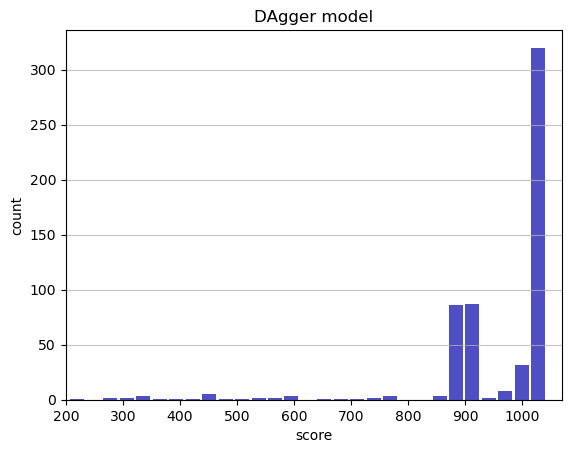

Track generation: 1259..1578 -> 319-tiles track
Epoch: 572
DAgger	mean: 953.98	variance: 131.58


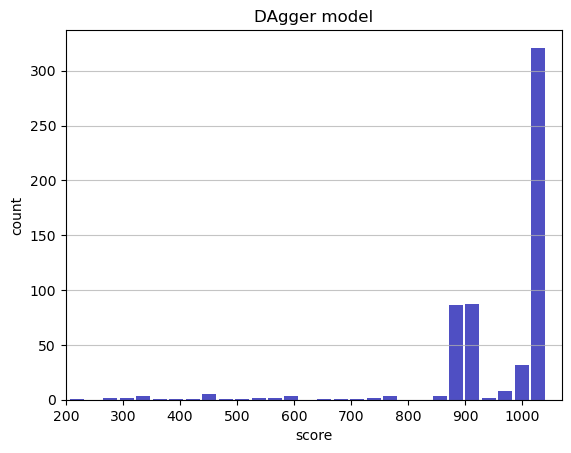

Track generation: 1235..1548 -> 313-tiles track
Epoch: 573
DAgger	mean: 954.10	variance: 131.50


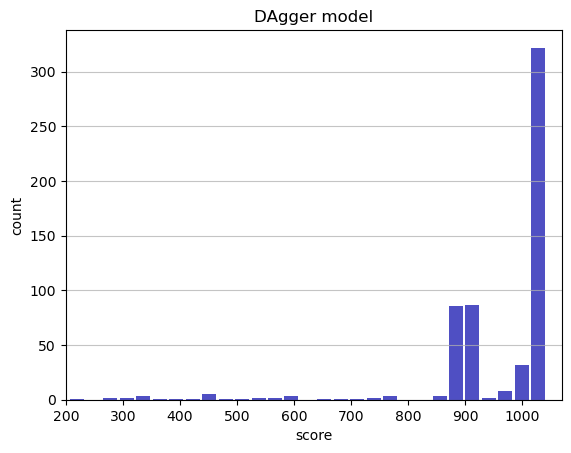

Track generation: 1174..1471 -> 297-tiles track
Epoch: 574
DAgger	mean: 954.21	variance: 131.41


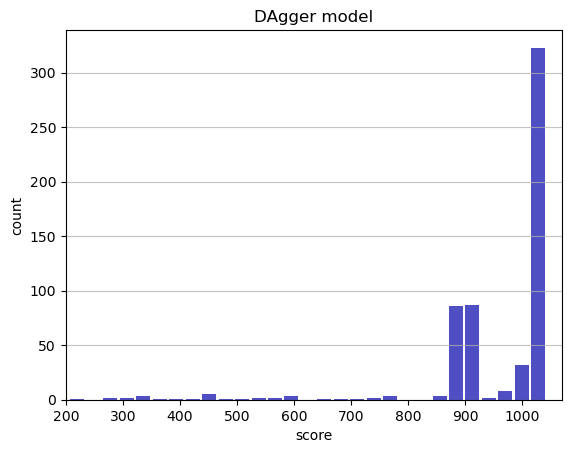

Track generation: 1095..1373 -> 278-tiles track
Epoch: 575
DAgger	mean: 954.35	variance: 131.34


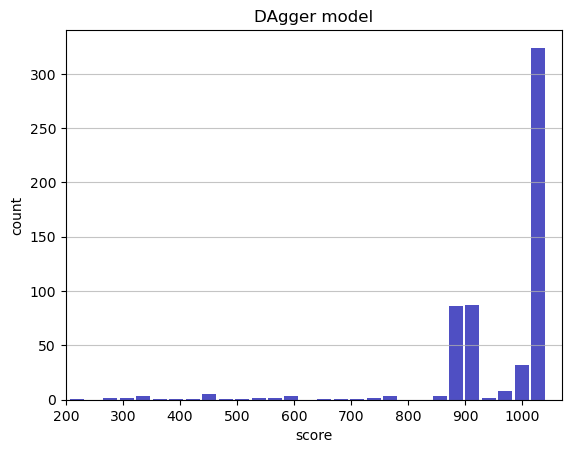

Track generation: 1123..1408 -> 285-tiles track
Epoch: 576
DAgger	mean: 954.27	variance: 131.24


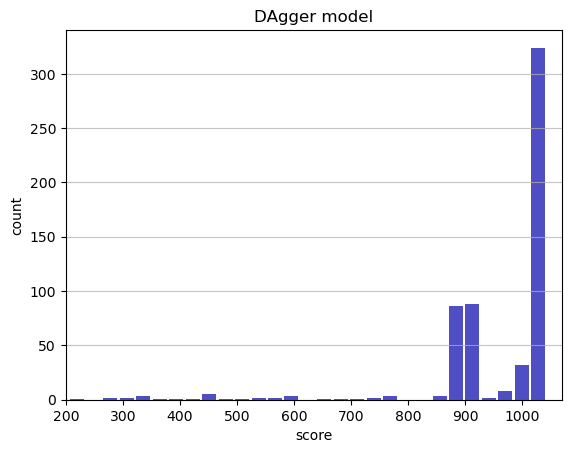

Track generation: 1282..1607 -> 325-tiles track
Epoch: 577
DAgger	mean: 954.38	variance: 131.15


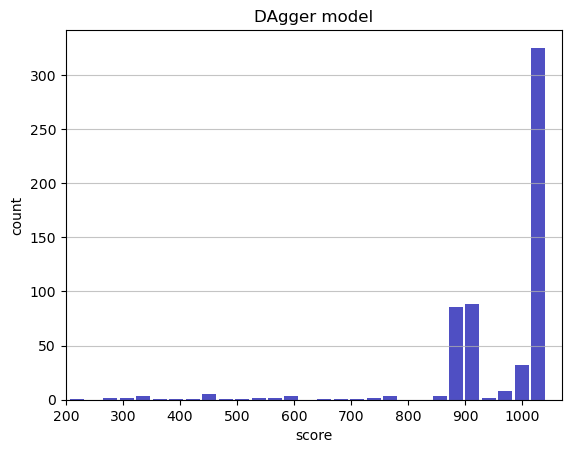

Track generation: 1132..1419 -> 287-tiles track
Epoch: 578
DAgger	mean: 954.50	variance: 131.07


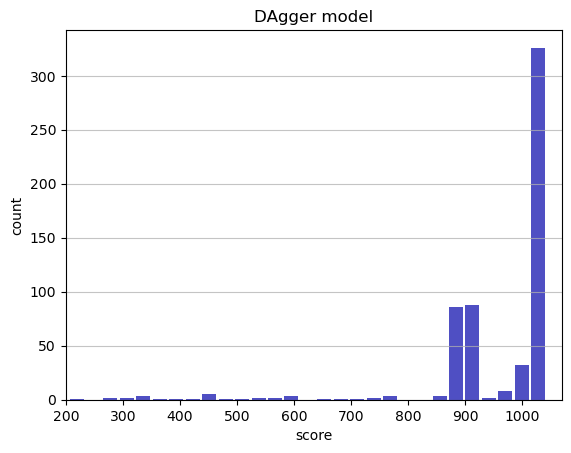

Track generation: 1175..1473 -> 298-tiles track
Epoch: 579
DAgger	mean: 954.62	variance: 130.99


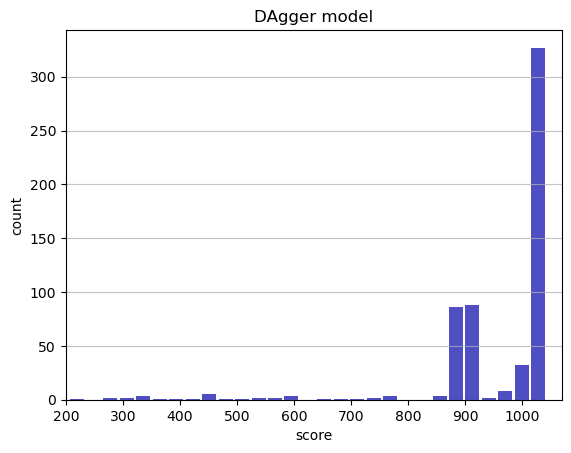

Track generation: 1143..1433 -> 290-tiles track
Epoch: 580
DAgger	mean: 953.71	variance: 132.67


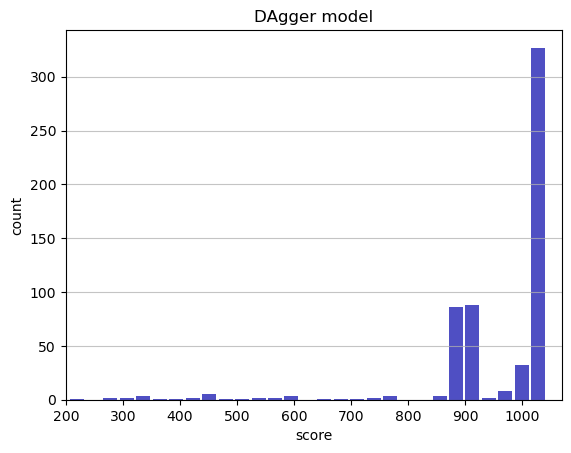

Track generation: 935..1177 -> 242-tiles track
Epoch: 581
DAgger	mean: 953.48	variance: 132.67


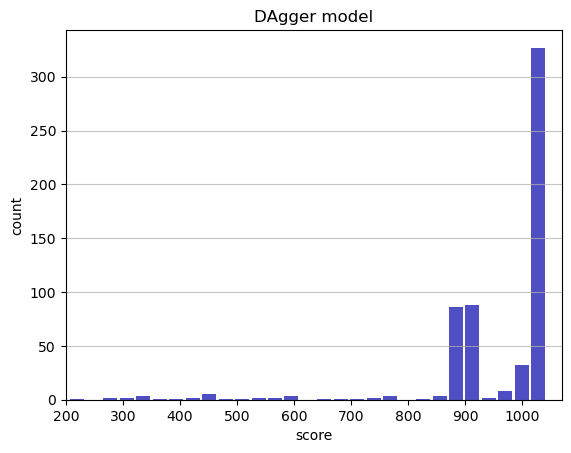

Track generation: 1188..1489 -> 301-tiles track
Epoch: 582
DAgger	mean: 953.40	variance: 132.57


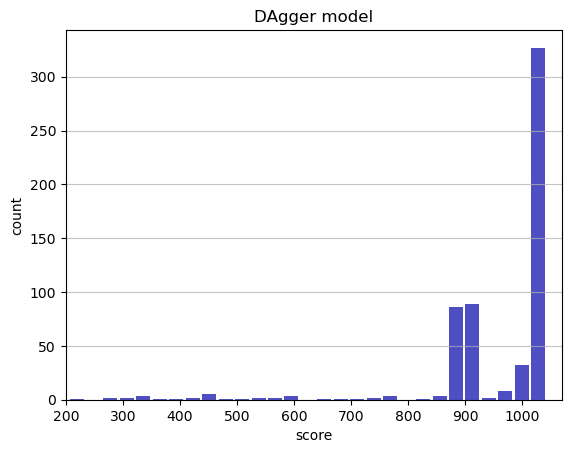

Track generation: 1113..1395 -> 282-tiles track
Epoch: 583
DAgger	mean: 953.52	variance: 132.49


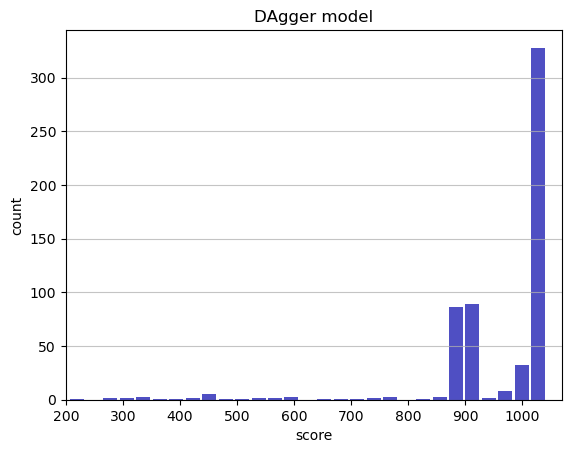

Track generation: 1069..1346 -> 277-tiles track
Epoch: 584
DAgger	mean: 953.66	variance: 132.42


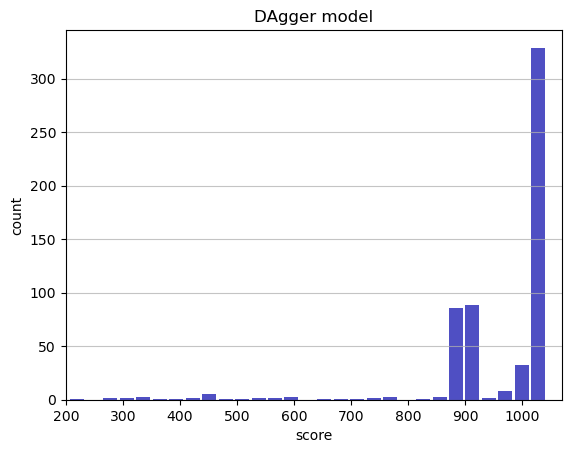

Track generation: 1129..1422 -> 293-tiles track
Epoch: 585
DAgger	mean: 953.78	variance: 132.34


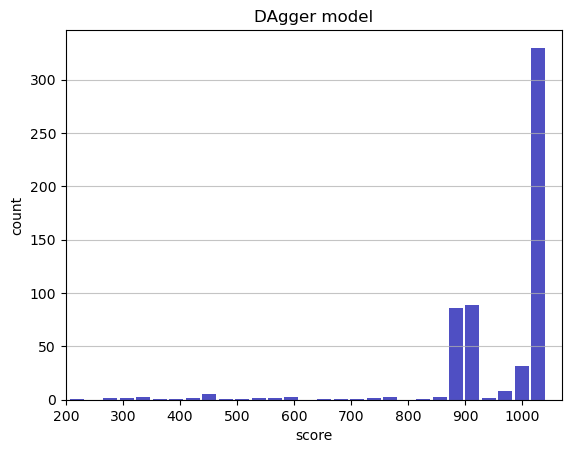

Track generation: 1051..1318 -> 267-tiles track
Epoch: 586
DAgger	mean: 953.71	variance: 132.24


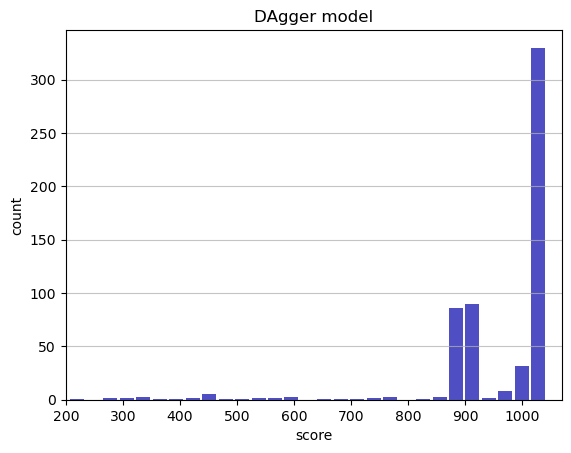

Track generation: 1139..1428 -> 289-tiles track
Epoch: 587
DAgger	mean: 953.57	variance: 132.17


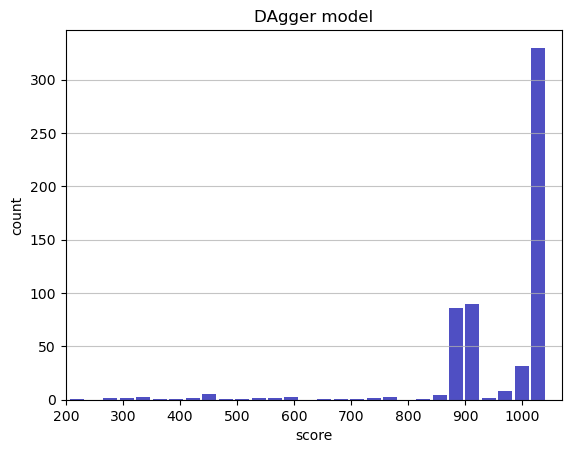

Track generation: 1173..1471 -> 298-tiles track
Epoch: 588
DAgger	mean: 953.68	variance: 132.09


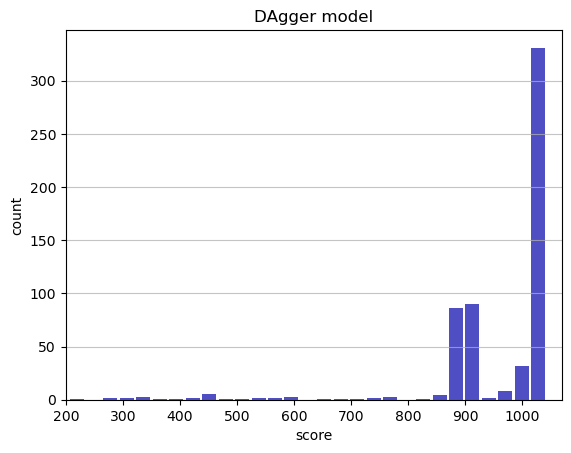

Track generation: 1140..1429 -> 289-tiles track
Epoch: 589
DAgger	mean: 953.61	variance: 131.99


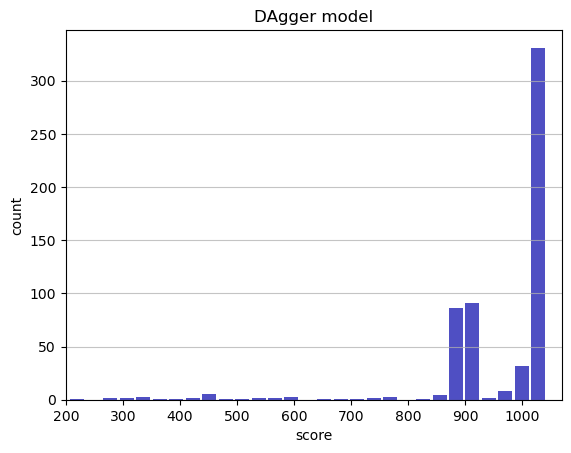

Track generation: 1146..1437 -> 291-tiles track
Epoch: 590
DAgger	mean: 953.74	variance: 131.91


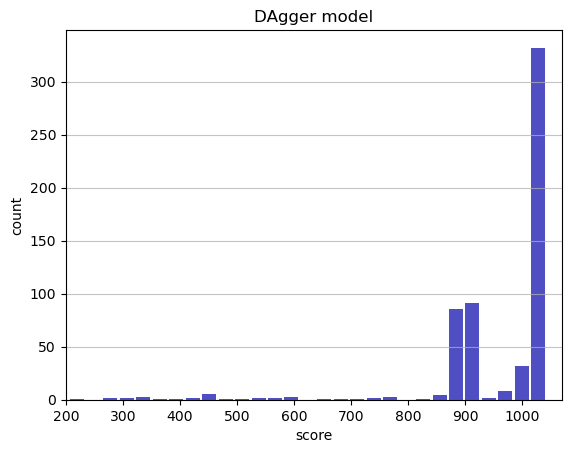

Track generation: 1145..1439 -> 294-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1183..1483 -> 300-tiles track
Epoch: 591
DAgger	mean: 953.84	variance: 131.82


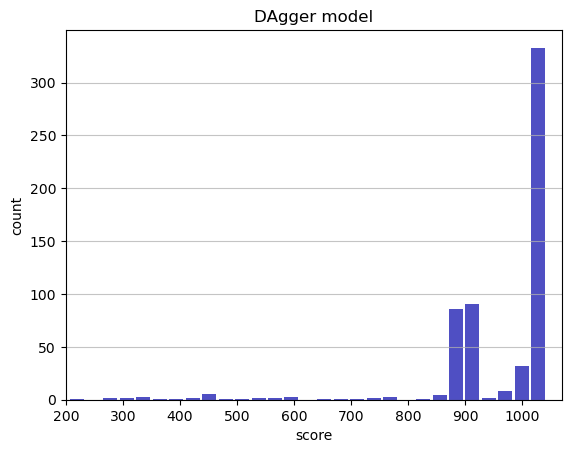

Track generation: 953..1199 -> 246-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1148..1439 -> 291-tiles track
Epoch: 592
DAgger	mean: 953.96	variance: 131.74


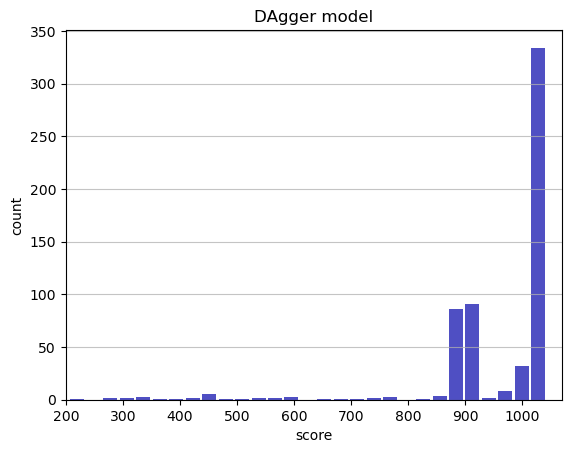

Track generation: 1147..1438 -> 291-tiles track
Epoch: 593
DAgger	mean: 954.08	variance: 131.67


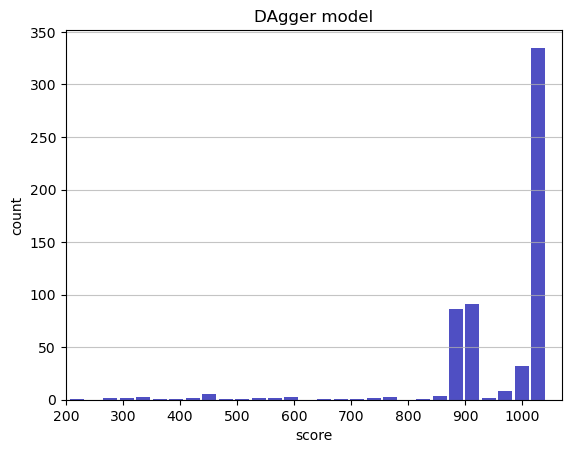

Track generation: 992..1254 -> 262-tiles track
Epoch: 594
DAgger	mean: 953.90	variance: 131.63


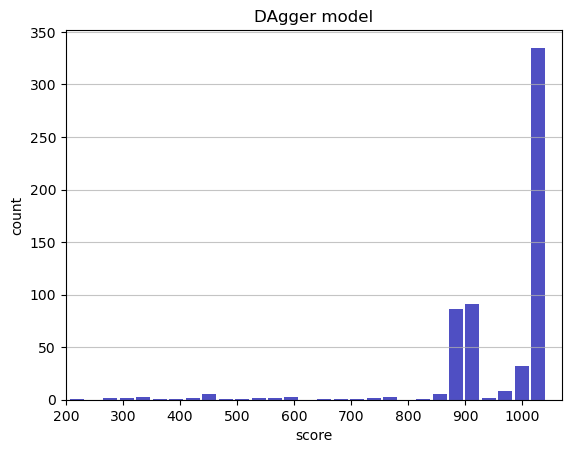

Track generation: 1143..1433 -> 290-tiles track
Epoch: 595
DAgger	mean: 954.03	variance: 131.56


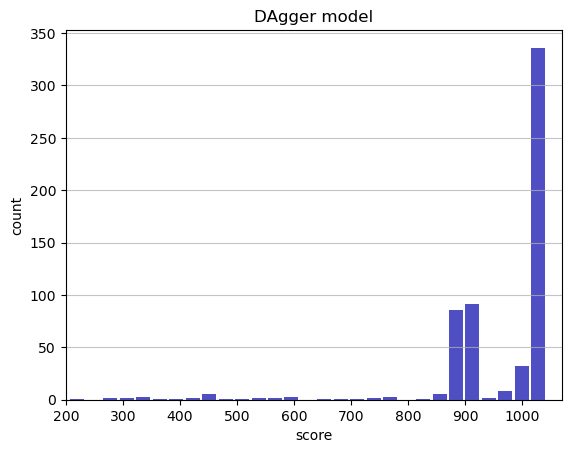

Track generation: 991..1243 -> 252-tiles track
Epoch: 596
DAgger	mean: 953.95	variance: 131.46


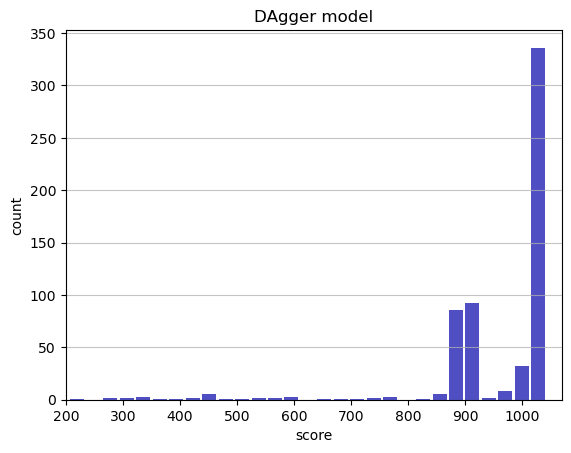

Track generation: 956..1199 -> 243-tiles track
Epoch: 597
DAgger	mean: 954.10	variance: 131.40


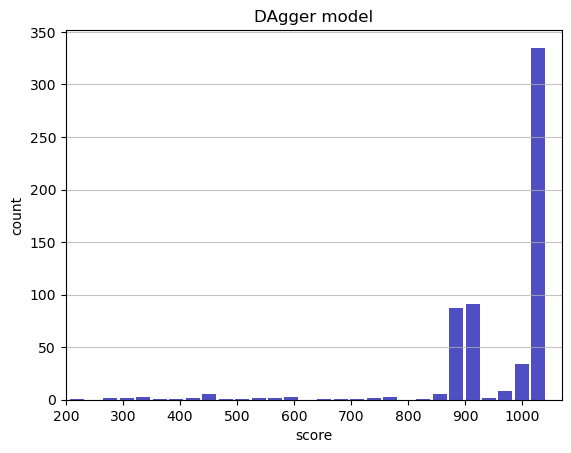

Track generation: 1331..1678 -> 347-tiles track
Epoch: 598
DAgger	mean: 954.15	variance: 131.30


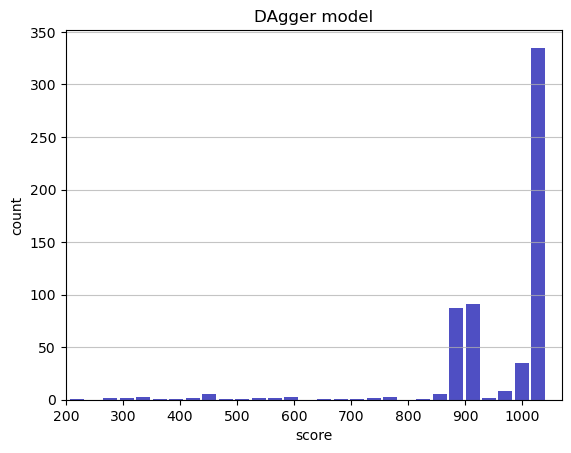

Track generation: 1029..1290 -> 261-tiles track
Epoch: 599
DAgger	mean: 954.07	variance: 131.20


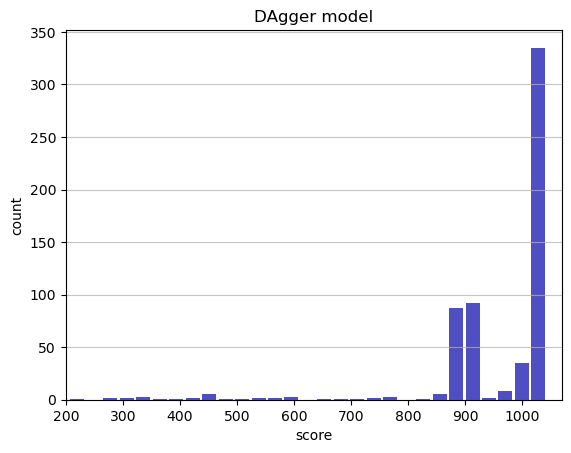

Track generation: 994..1246 -> 252-tiles track
Epoch: 600
DAgger	mean: 954.21	variance: 131.14


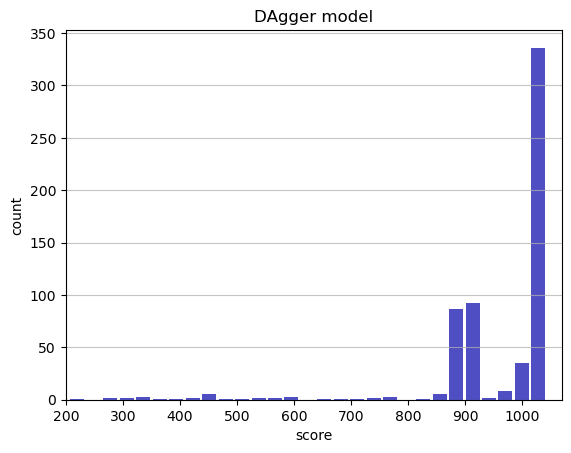

Track generation: 1004..1259 -> 255-tiles track
Epoch: 601
DAgger	mean: 954.34	variance: 131.07


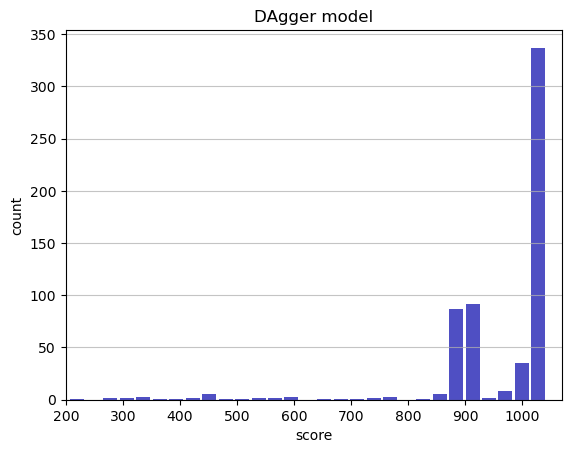

Track generation: 1127..1413 -> 286-tiles track
Epoch: 602
DAgger	mean: 954.46	variance: 130.99


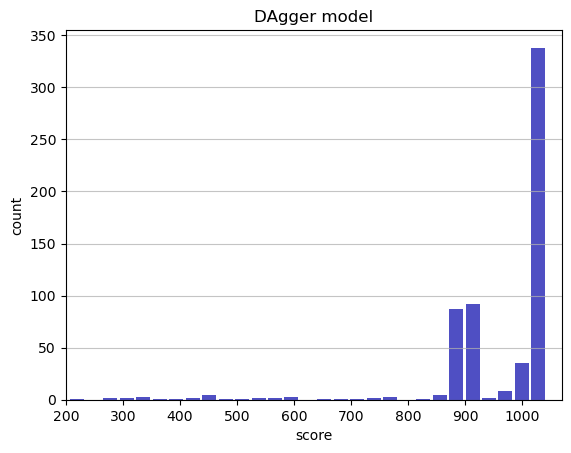

Track generation: 1265..1586 -> 321-tiles track
Epoch: 603
DAgger	mean: 954.56	variance: 130.91


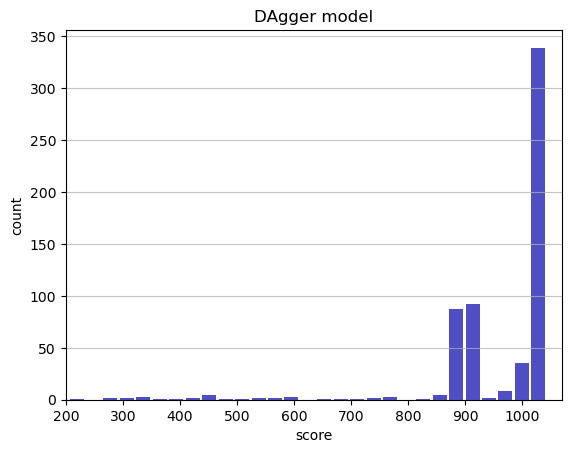

Track generation: 1137..1428 -> 291-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1089..1374 -> 285-tiles track
Epoch: 604
DAgger	mean: 954.68	variance: 130.83


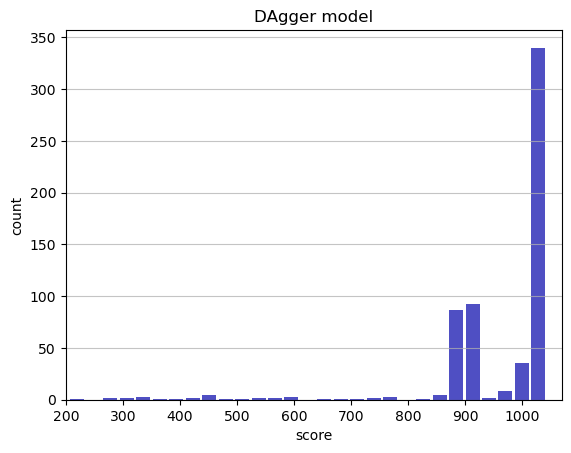

Track generation: 1138..1435 -> 297-tiles track
Epoch: 605
DAgger	mean: 954.60	variance: 130.74


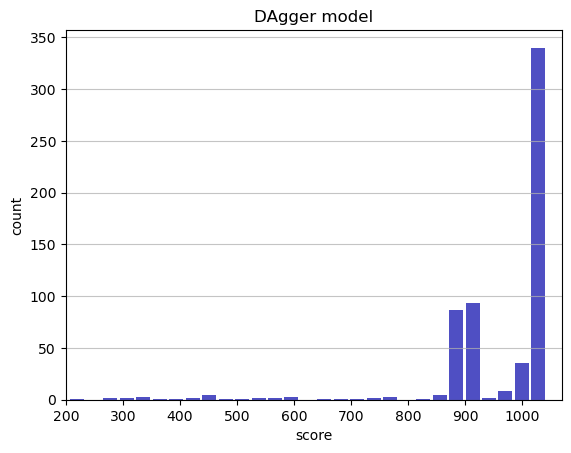

Track generation: 1114..1397 -> 283-tiles track
Epoch: 606
DAgger	mean: 954.72	variance: 130.66


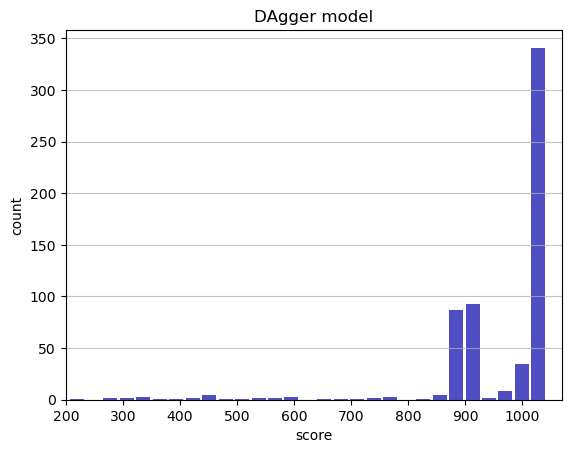

Track generation: 1033..1301 -> 268-tiles track
Epoch: 607
DAgger	mean: 954.86	variance: 130.60


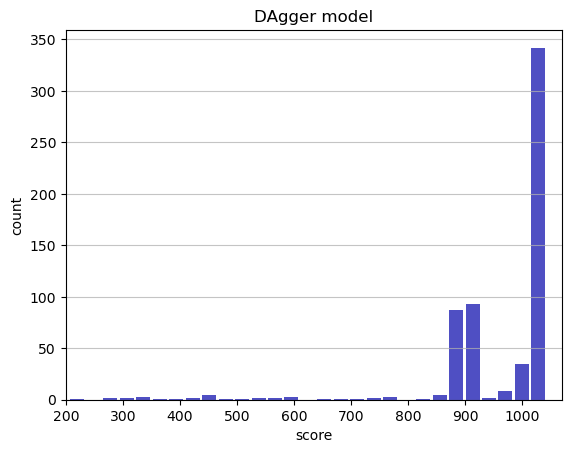

Track generation: 1116..1399 -> 283-tiles track
Epoch: 608
DAgger	mean: 954.98	variance: 130.53


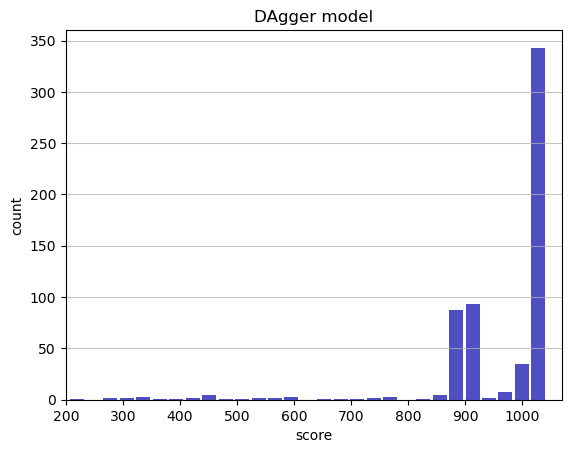

Track generation: 1215..1523 -> 308-tiles track
Epoch: 609
DAgger	mean: 953.94	variance: 132.92


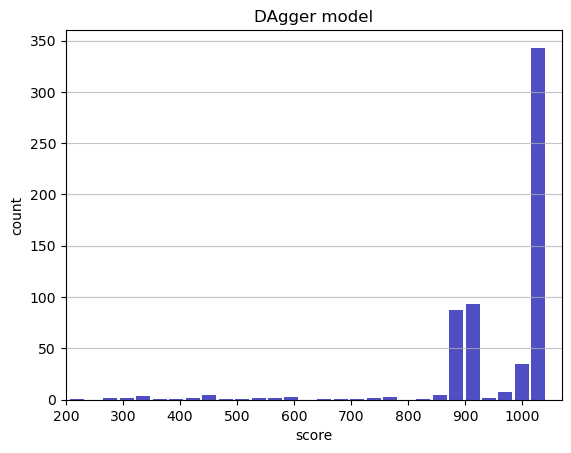

Track generation: 1147..1438 -> 291-tiles track
Epoch: 610
DAgger	mean: 954.06	variance: 132.84


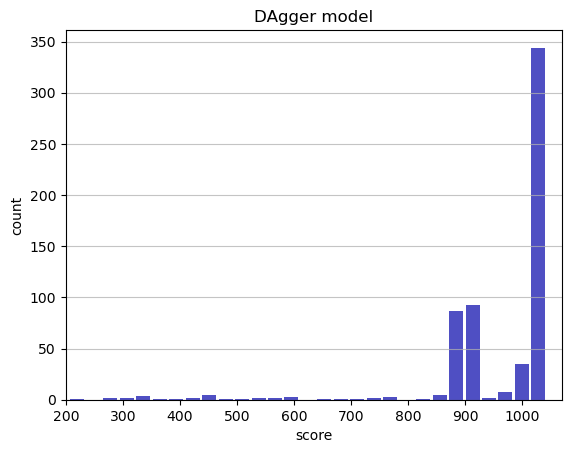

Track generation: 1127..1413 -> 286-tiles track
Epoch: 611
DAgger	mean: 954.19	variance: 132.77


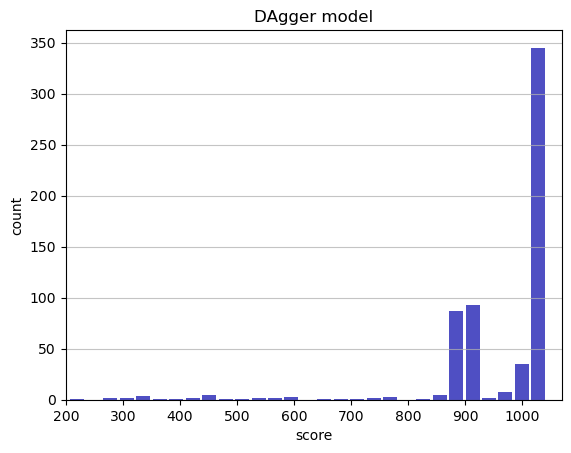

Track generation: 1215..1529 -> 314-tiles track
Epoch: 612
DAgger	mean: 954.02	variance: 132.73


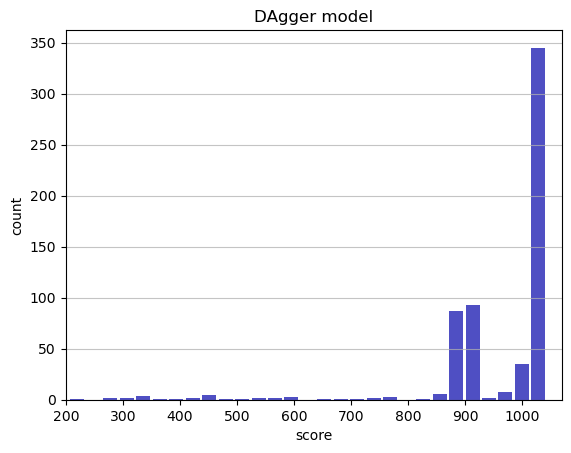

Track generation: 1064..1334 -> 270-tiles track
Epoch: 613
DAgger	mean: 954.15	variance: 132.66


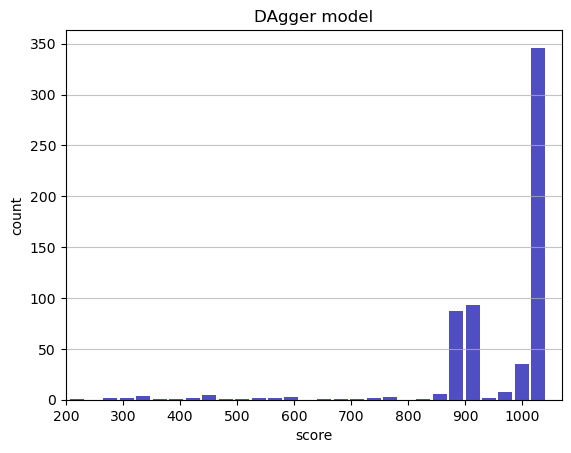

Track generation: 1174..1471 -> 297-tiles track
Epoch: 614
DAgger	mean: 954.25	variance: 132.58


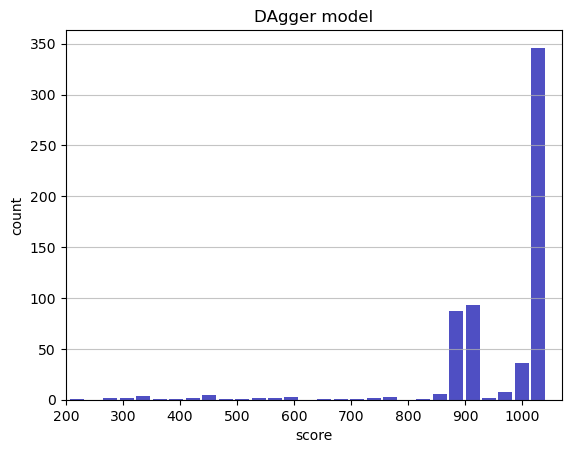

Track generation: 1132..1419 -> 287-tiles track
Epoch: 615
DAgger	mean: 954.16	variance: 132.49


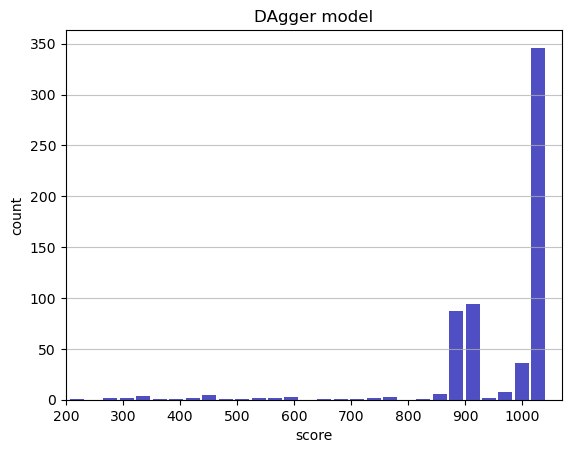

Track generation: 1096..1374 -> 278-tiles track
Epoch: 616
DAgger	mean: 954.29	variance: 132.42


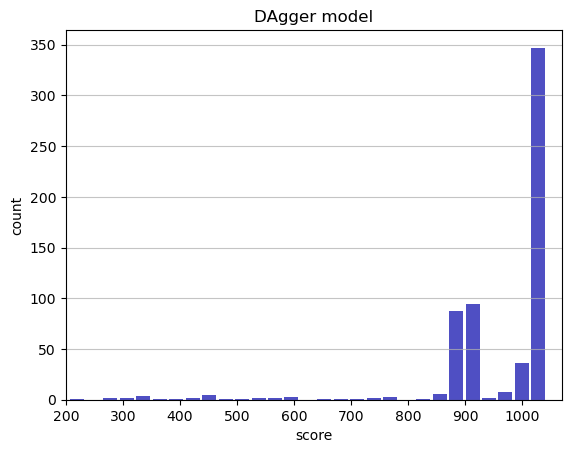

Track generation: 1255..1573 -> 318-tiles track
Epoch: 617
DAgger	mean: 954.39	variance: 132.33


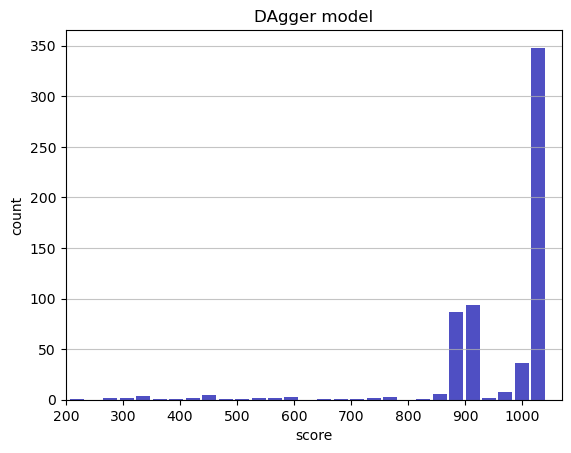

Track generation: 1024..1290 -> 266-tiles track
Epoch: 618
DAgger	mean: 954.52	variance: 132.27


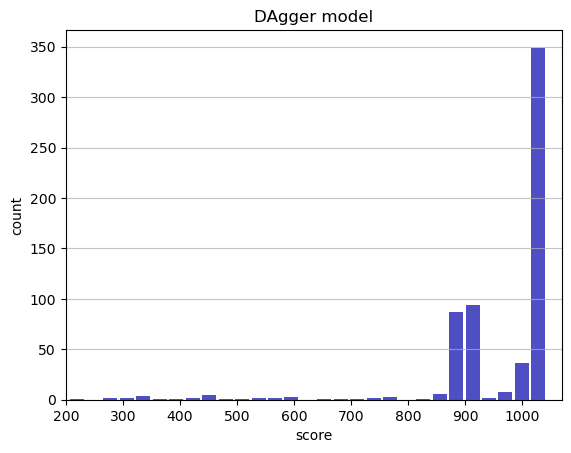

Track generation: 1079..1353 -> 274-tiles track
Epoch: 619
DAgger	mean: 954.65	variance: 132.20


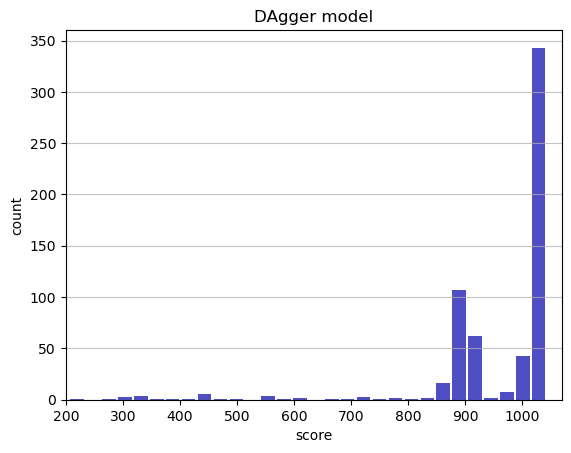

Track generation: 1121..1407 -> 286-tiles track
Epoch: 620
DAgger	mean: 954.77	variance: 132.12


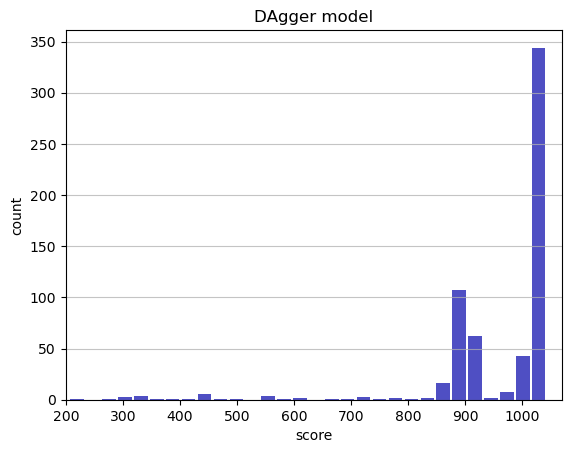

Track generation: 1273..1597 -> 324-tiles track
Epoch: 621
DAgger	mean: 953.65	variance: 134.91


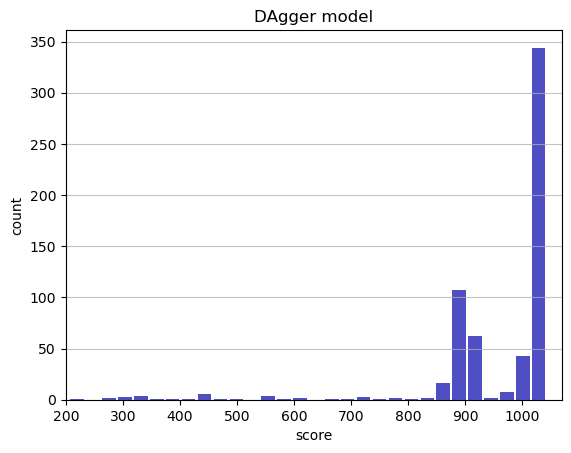

Track generation: 1250..1567 -> 317-tiles track
Epoch: 622
DAgger	mean: 953.75	variance: 134.82


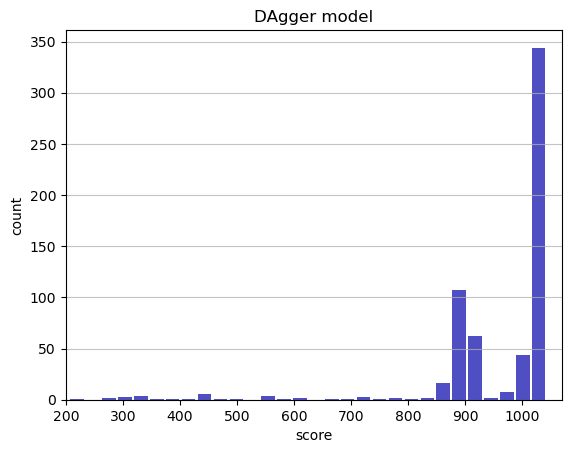

Track generation: 1067..1338 -> 271-tiles track
Epoch: 623
DAgger	mean: 953.88	variance: 134.76


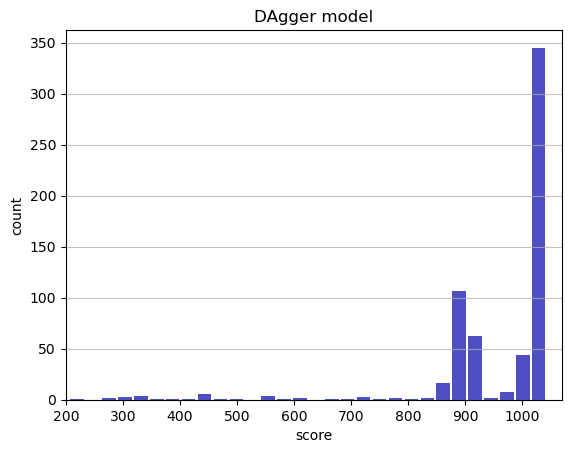

Track generation: 1100..1379 -> 279-tiles track
Epoch: 624
DAgger	mean: 954.01	variance: 134.69


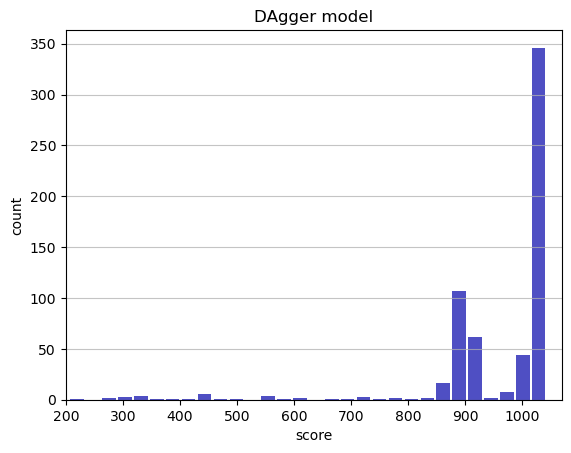

Track generation: 1041..1305 -> 264-tiles track
Epoch: 625
DAgger	mean: 953.92	variance: 134.60


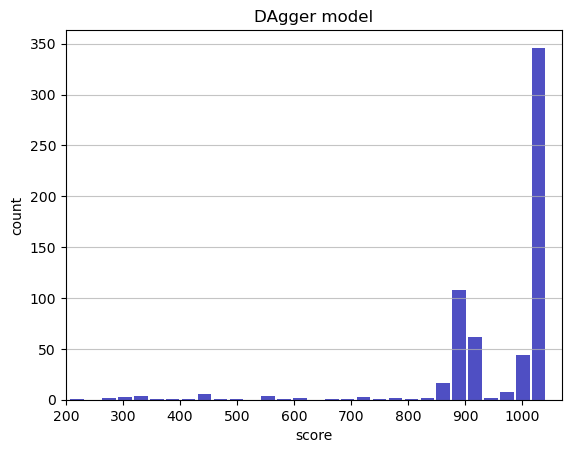

Track generation: 1274..1597 -> 323-tiles track
Epoch: 626
DAgger	mean: 954.01	variance: 134.51


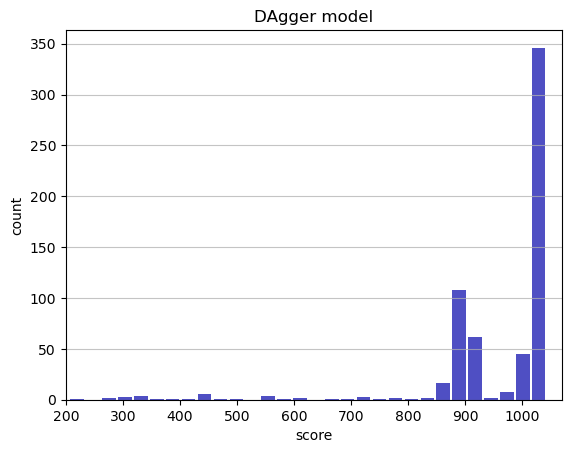

Track generation: 1312..1644 -> 332-tiles track
Epoch: 627
DAgger	mean: 954.10	variance: 134.43


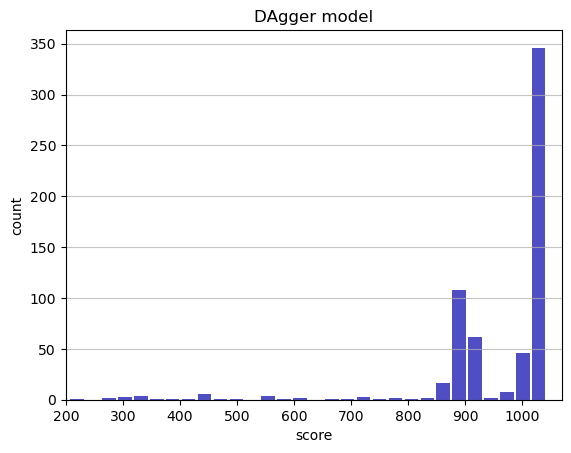

Track generation: 1111..1393 -> 282-tiles track
Epoch: 628
DAgger	mean: 954.21	variance: 134.35


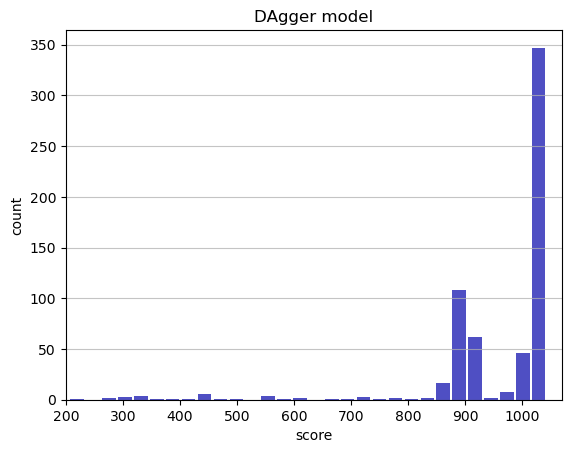

Track generation: 1149..1440 -> 291-tiles track
Epoch: 629
DAgger	mean: 954.08	variance: 134.28


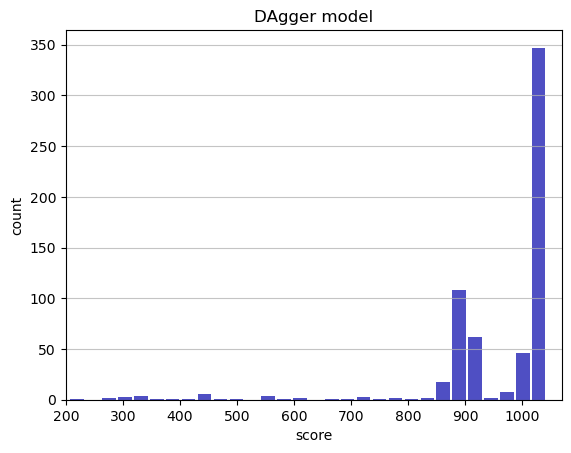

Track generation: 1301..1631 -> 330-tiles track
Epoch: 630
DAgger	mean: 953.99	variance: 134.19


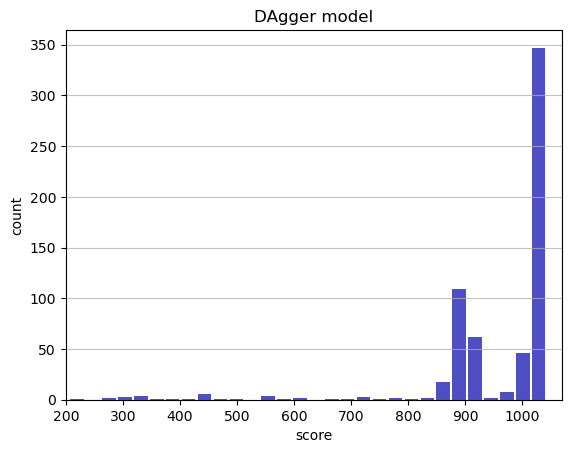

Track generation: 1050..1324 -> 274-tiles track
Epoch: 631
DAgger	mean: 954.11	variance: 134.12


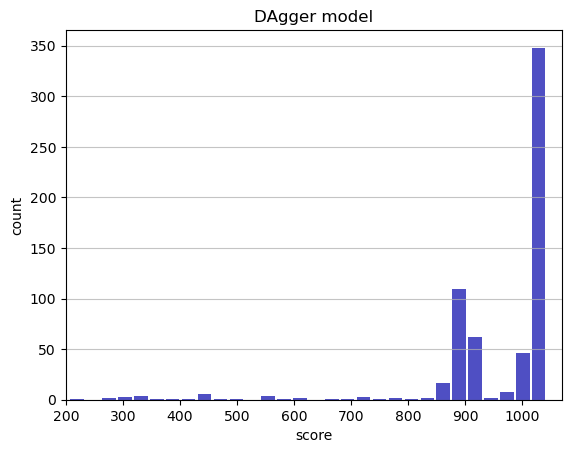

Track generation: 1345..1685 -> 340-tiles track
Epoch: 632
DAgger	mean: 954.20	variance: 134.03


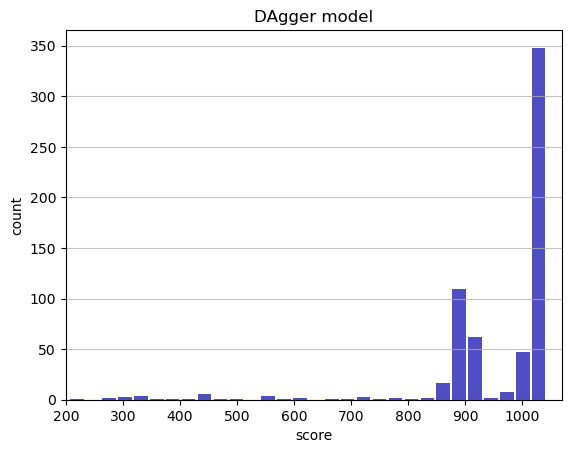

Track generation: 1115..1398 -> 283-tiles track
Epoch: 633
DAgger	mean: 954.32	variance: 133.96


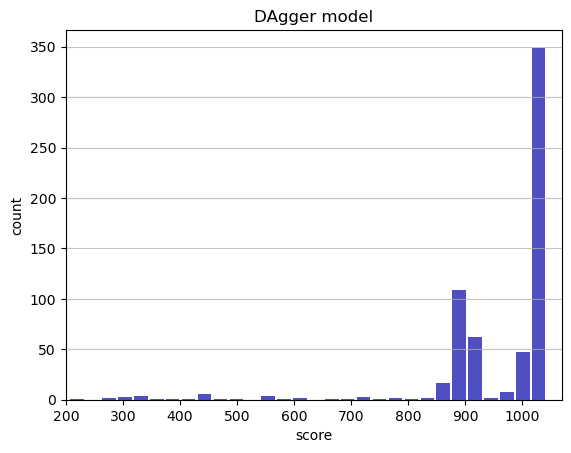

Track generation: 1013..1276 -> 263-tiles track
Epoch: 634
DAgger	mean: 954.45	variance: 133.90


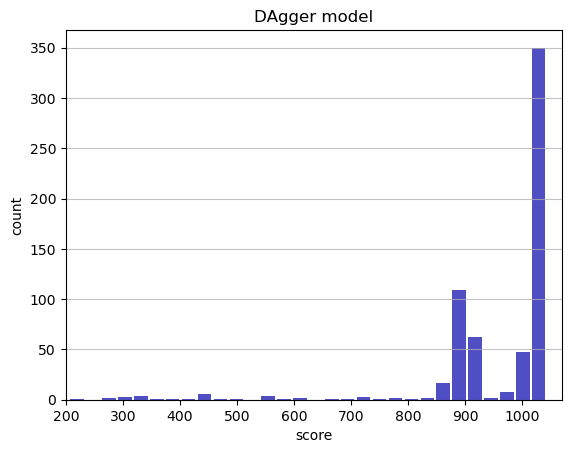

Track generation: 1218..1527 -> 309-tiles track
Epoch: 635
DAgger	mean: 954.35	variance: 133.82


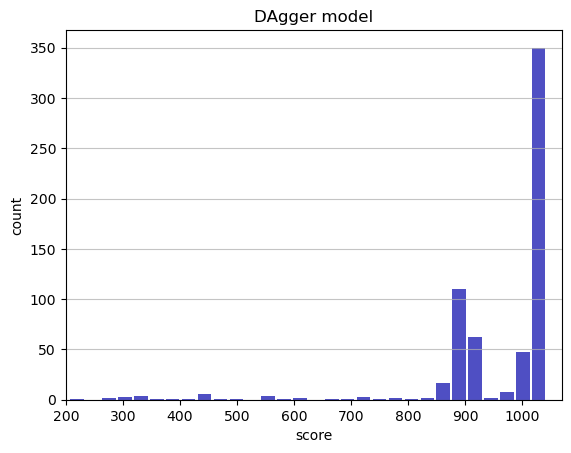

Track generation: 1124..1409 -> 285-tiles track
Epoch: 636
DAgger	mean: 954.47	variance: 133.75


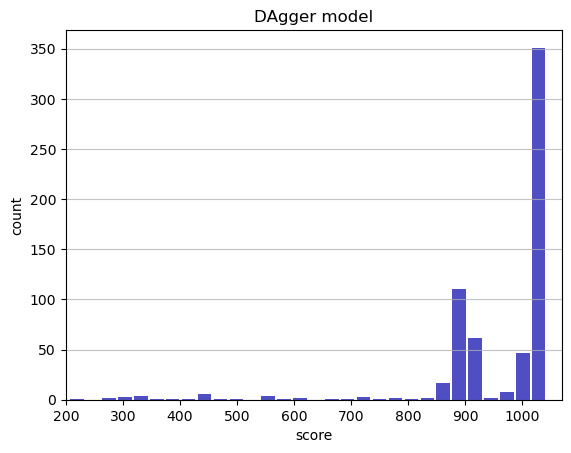

Track generation: 1187..1488 -> 301-tiles track
Epoch: 637
DAgger	mean: 954.58	variance: 133.67


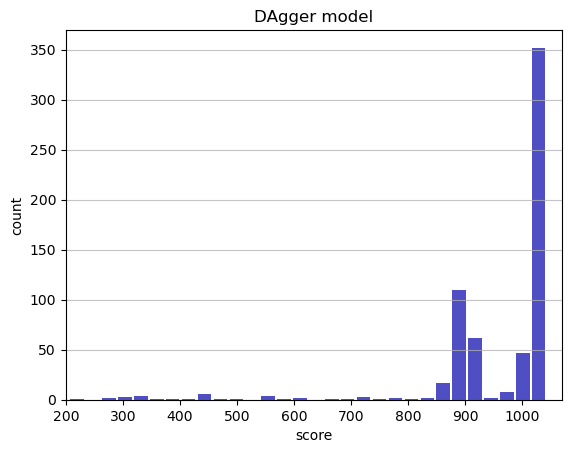

Track generation: 1095..1373 -> 278-tiles track
Epoch: 638
DAgger	mean: 954.71	variance: 133.61


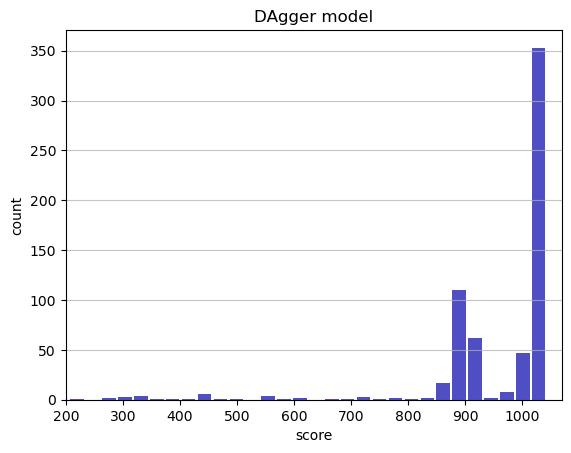

Track generation: 1277..1605 -> 328-tiles track
Epoch: 639
DAgger	mean: 954.80	variance: 133.52


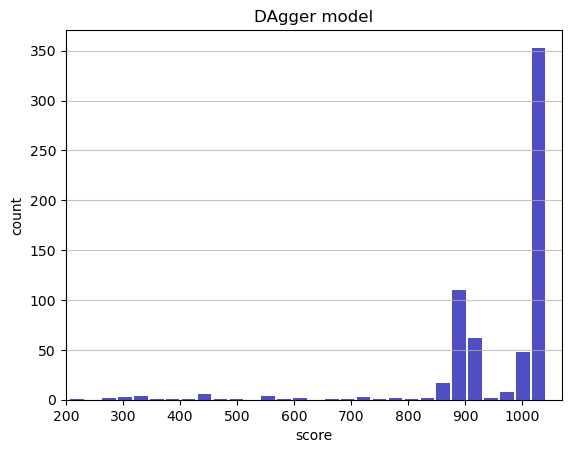

Track generation: 1377..1725 -> 348-tiles track
Epoch: 640
DAgger	mean: 954.88	variance: 133.43


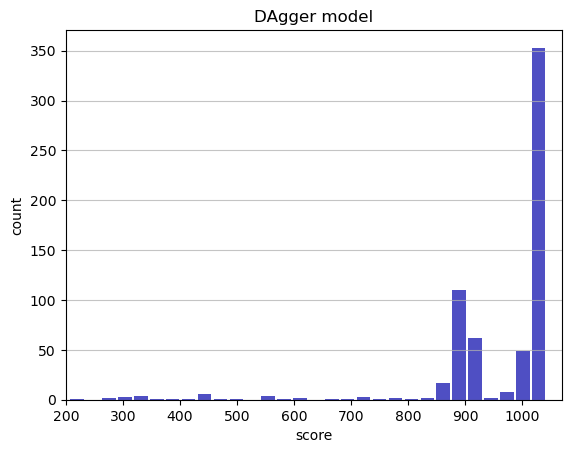

Track generation: 1004..1259 -> 255-tiles track
Epoch: 641
DAgger	mean: 955.01	variance: 133.37


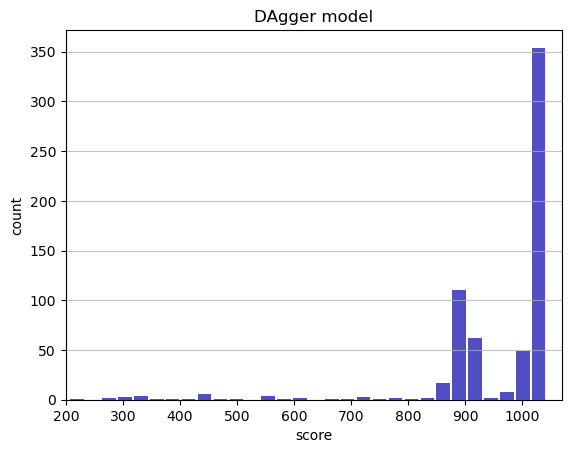

Track generation: 1104..1384 -> 280-tiles track
Epoch: 642
DAgger	mean: 954.90	variance: 133.29


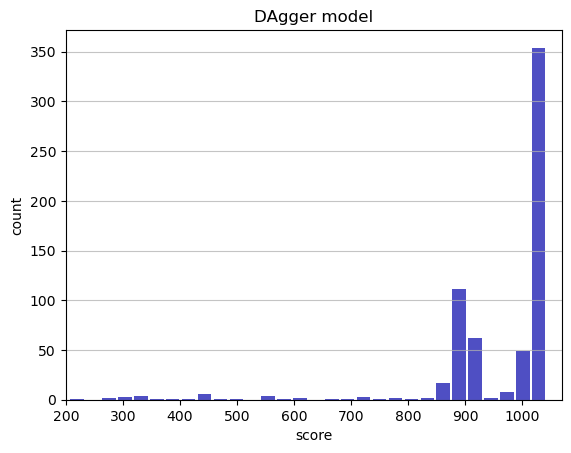

Track generation: 1239..1553 -> 314-tiles track
Epoch: 643
DAgger	mean: 955.01	variance: 133.21


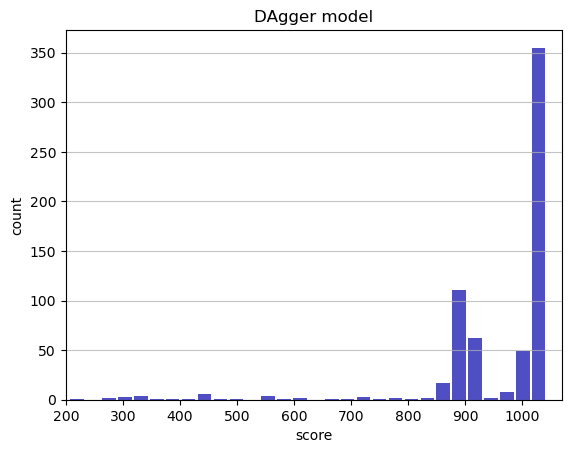

Track generation: 1148..1439 -> 291-tiles track
Epoch: 644
DAgger	mean: 955.12	variance: 133.14


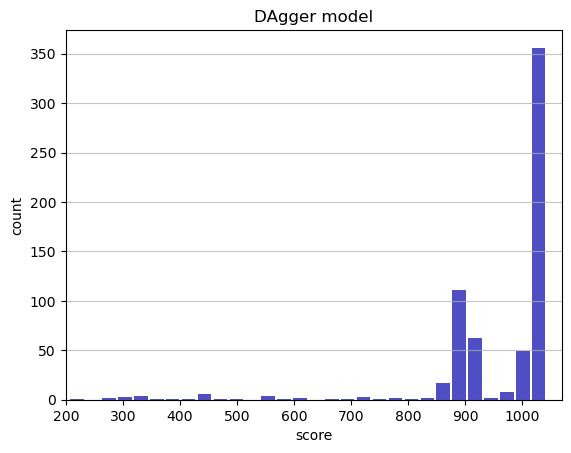

Track generation: 1128..1414 -> 286-tiles track
Epoch: 645
DAgger	mean: 955.23	variance: 133.07


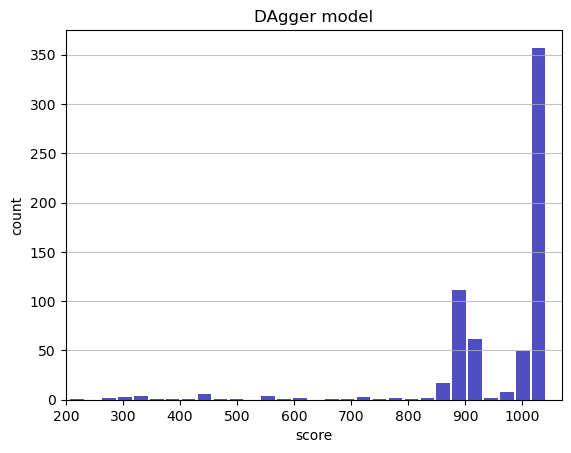

Track generation: 954..1200 -> 246-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1059..1332 -> 273-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1065..1335 -> 270-tiles track
Epoch: 646
DAgger	mean: 955.35	variance: 133.00


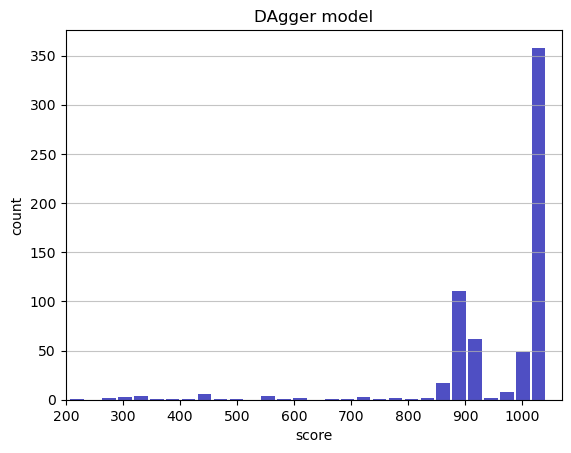

Track generation: 1187..1488 -> 301-tiles track
Epoch: 647
DAgger	mean: 955.23	variance: 132.93


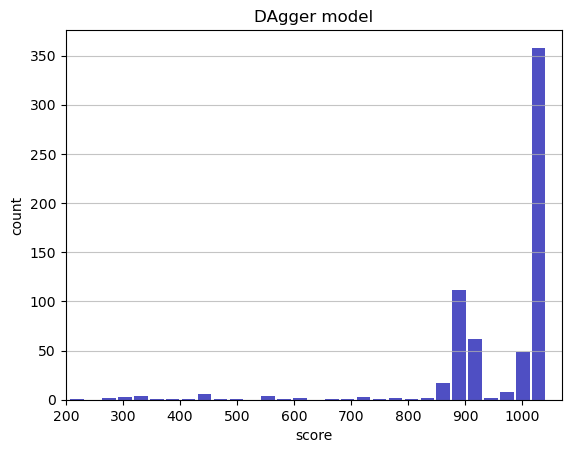

Track generation: 1047..1316 -> 269-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1047..1313 -> 266-tiles track
Epoch: 648
DAgger	mean: 954.45	variance: 134.31


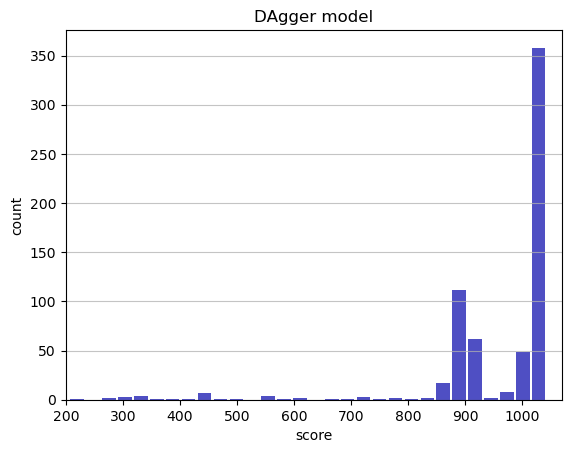

Track generation: 852..1074 -> 222-tiles track
Epoch: 649
DAgger	mean: 954.59	variance: 134.25


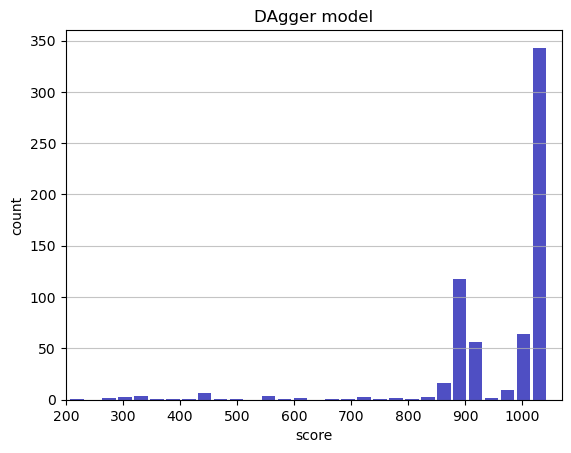

Track generation: 926..1165 -> 239-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1106..1394 -> 288-tiles track
Epoch: 650
DAgger	mean: 954.70	variance: 134.18


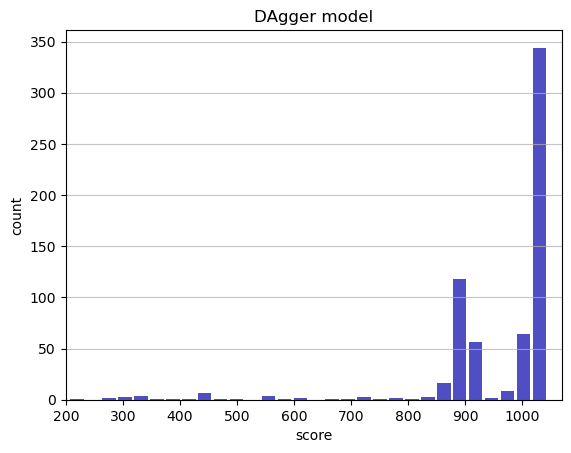

Track generation: 1134..1427 -> 293-tiles track
Epoch: 651
DAgger	mean: 953.82	variance: 135.91


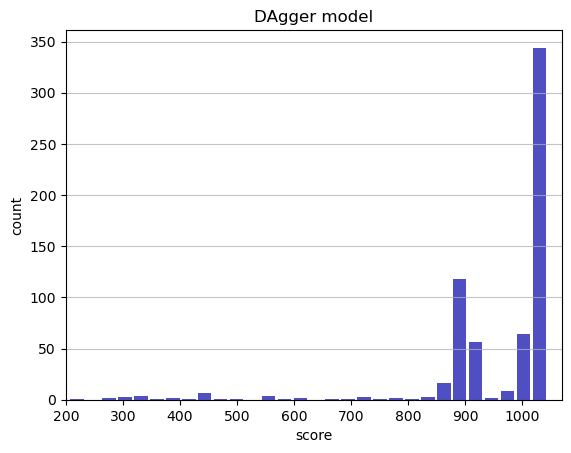

Track generation: 1073..1347 -> 274-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1152..1452 -> 300-tiles track
Epoch: 652
DAgger	mean: 953.93	variance: 135.83


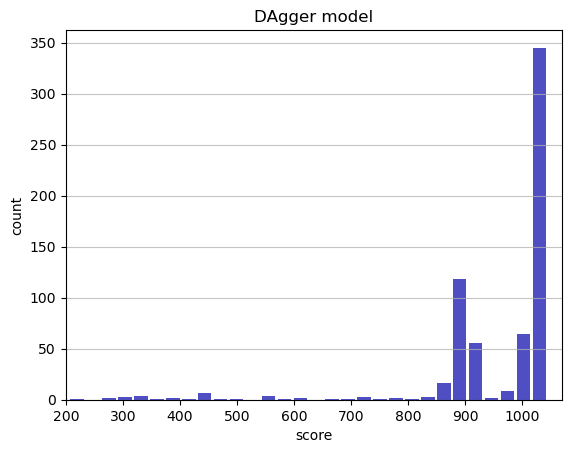

Track generation: 1305..1635 -> 330-tiles track
Epoch: 653
DAgger	mean: 954.01	variance: 135.74


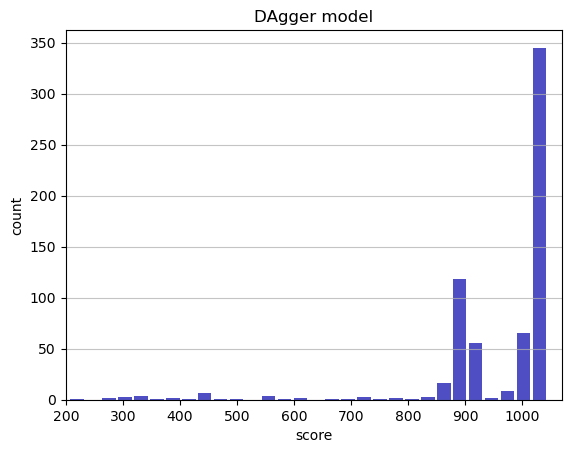

Track generation: 1124..1409 -> 285-tiles track
Epoch: 654
DAgger	mean: 954.12	variance: 135.67


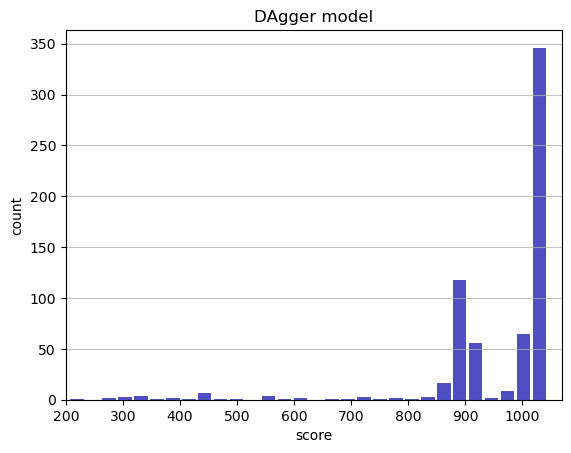

Track generation: 1133..1420 -> 287-tiles track
Epoch: 655
DAgger	mean: 954.23	variance: 135.59


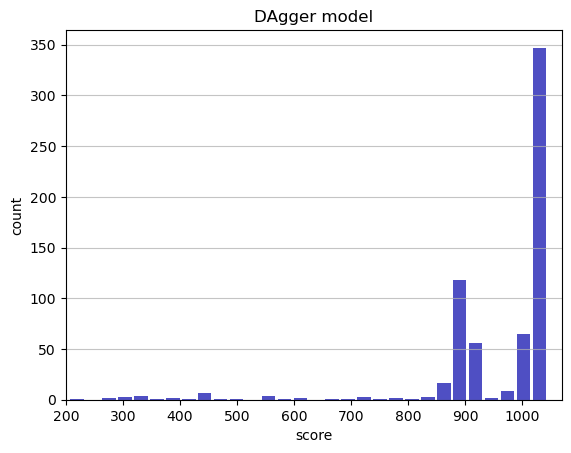

Track generation: 1220..1529 -> 309-tiles track
Epoch: 656
DAgger	mean: 954.33	variance: 135.51


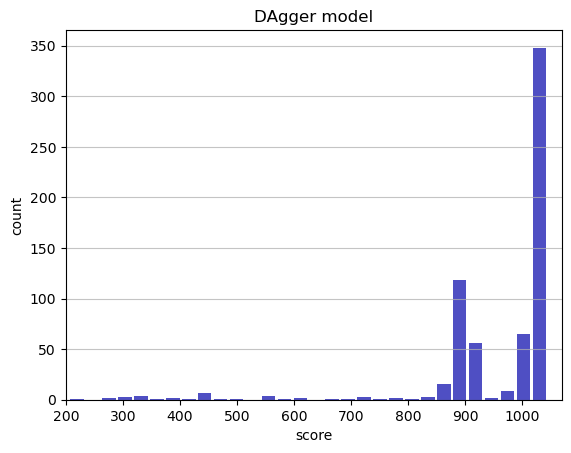

Track generation: 1080..1354 -> 274-tiles track
Epoch: 657
DAgger	mean: 954.45	variance: 135.45


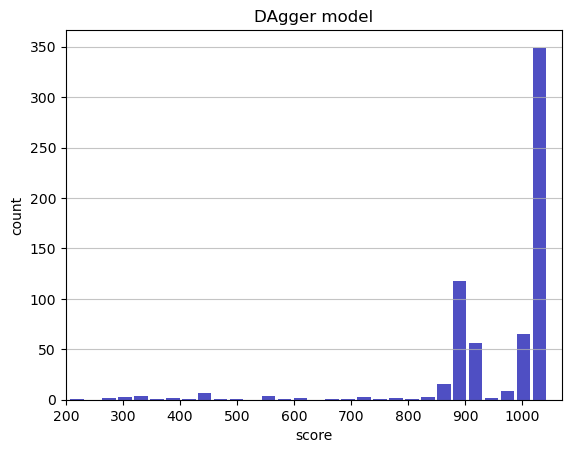

Track generation: 1155..1448 -> 293-tiles track
Epoch: 658
DAgger	mean: 954.56	variance: 135.37


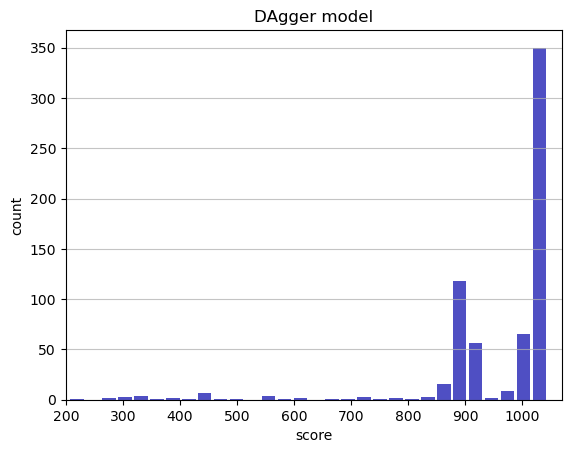

Track generation: 1142..1431 -> 289-tiles track
Epoch: 659
DAgger	mean: 954.67	variance: 135.30


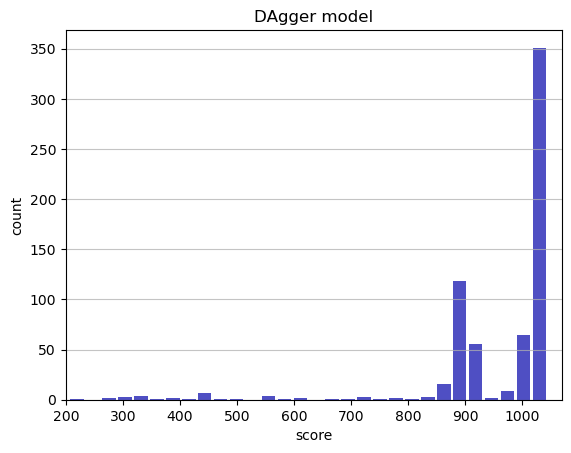

Track generation: 1113..1395 -> 282-tiles track
Epoch: 660
DAgger	mean: 954.78	variance: 135.22


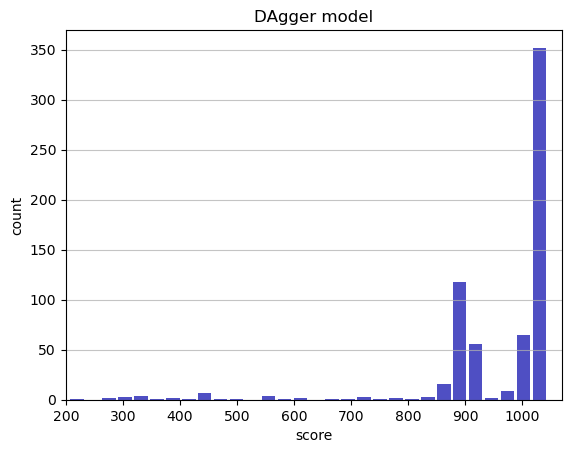

Track generation: 1280..1598 -> 318-tiles track
Epoch: 661
DAgger	mean: 954.87	variance: 135.14


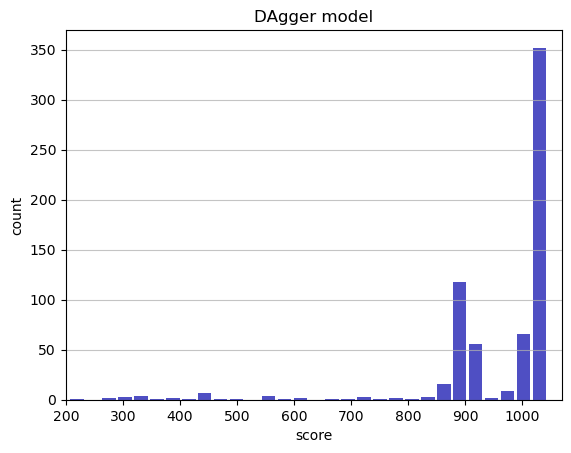

Track generation: 1200..1504 -> 304-tiles track
Epoch: 662
DAgger	mean: 954.98	variance: 135.07


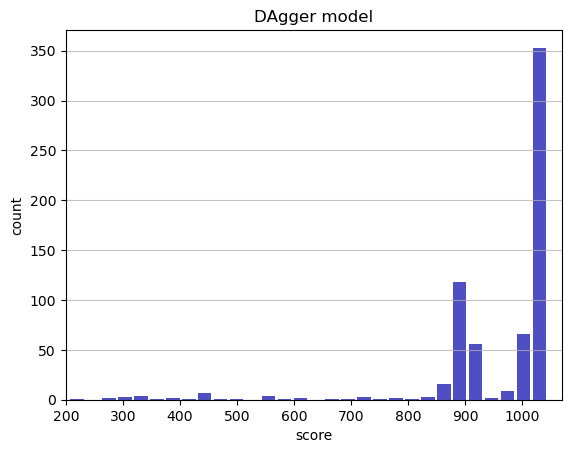

Track generation: 1059..1332 -> 273-tiles track
Epoch: 663
DAgger	mean: 955.08	variance: 134.99


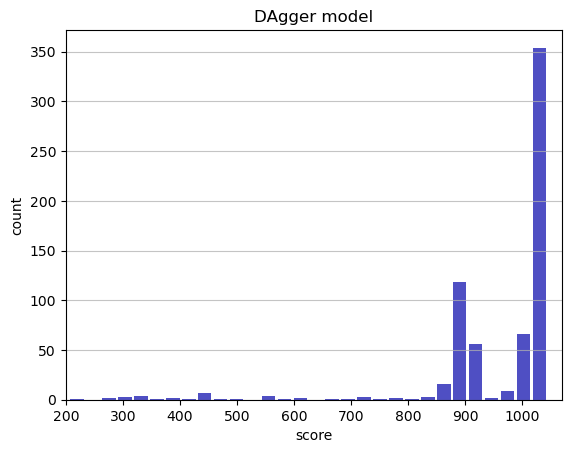

Track generation: 1180..1479 -> 299-tiles track
Epoch: 664
DAgger	mean: 954.64	variance: 135.39


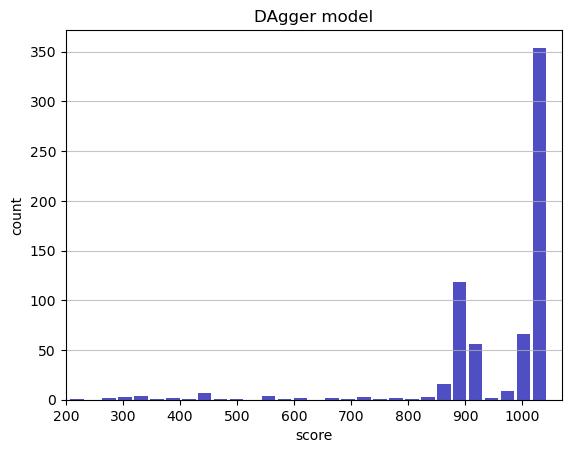

Track generation: 1275..1598 -> 323-tiles track
Epoch: 665
DAgger	mean: 954.73	variance: 135.30


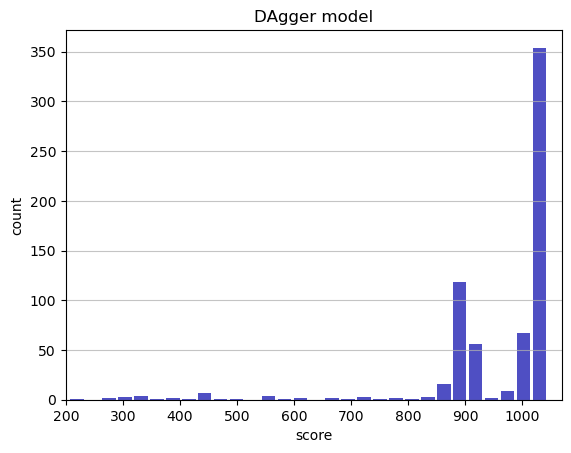

Track generation: 1175..1473 -> 298-tiles track
Epoch: 666
DAgger	mean: 954.66	variance: 135.21


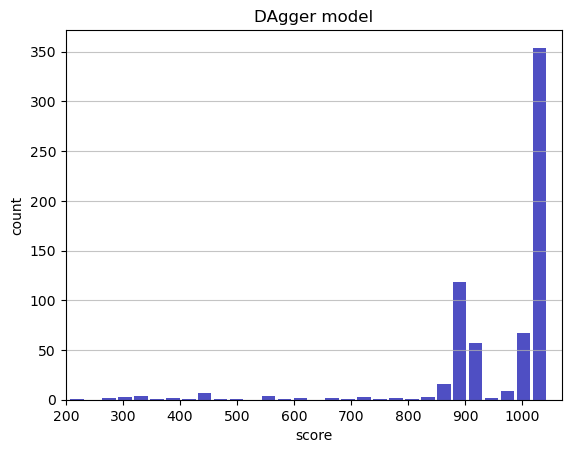

Track generation: 988..1239 -> 251-tiles track
Epoch: 667
DAgger	mean: 954.58	variance: 135.13


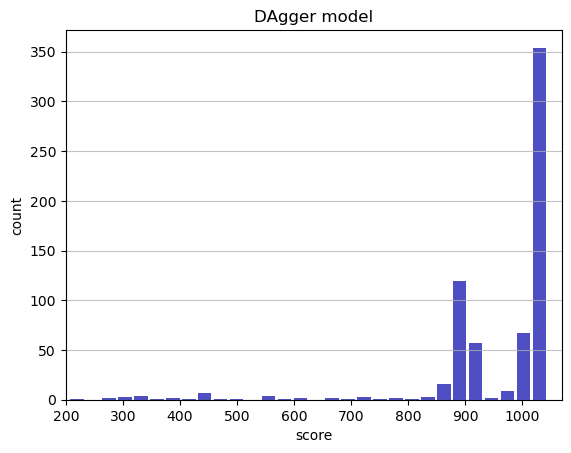

Track generation: 1248..1564 -> 316-tiles track
Epoch: 668
DAgger	mean: 954.68	variance: 135.05


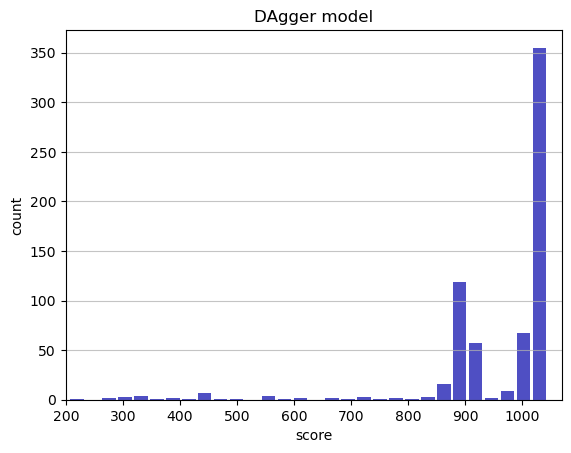

Track generation: 1123..1408 -> 285-tiles track
Epoch: 669
DAgger	mean: 954.78	variance: 134.98


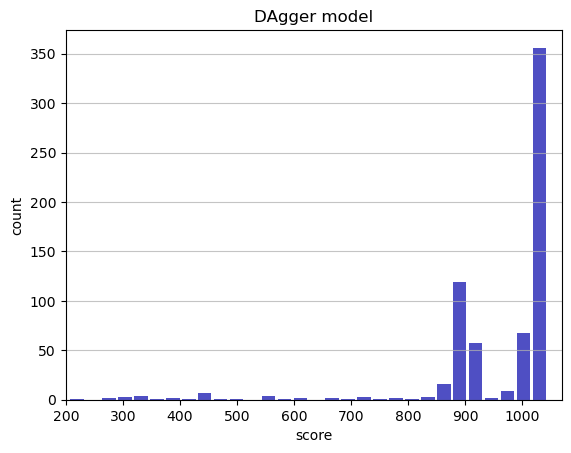

Track generation: 946..1190 -> 244-tiles track
Epoch: 670
DAgger	mean: 954.91	variance: 134.92


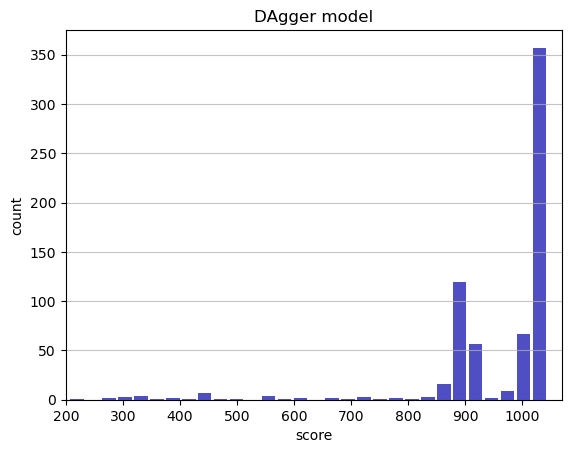

Track generation: 1034..1303 -> 269-tiles track
Epoch: 671
DAgger	mean: 955.03	variance: 134.85


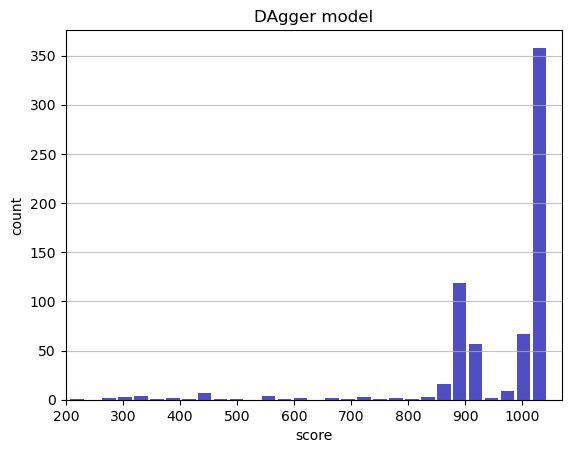

Track generation: 1087..1363 -> 276-tiles track
Epoch: 672
DAgger	mean: 954.10	variance: 136.89


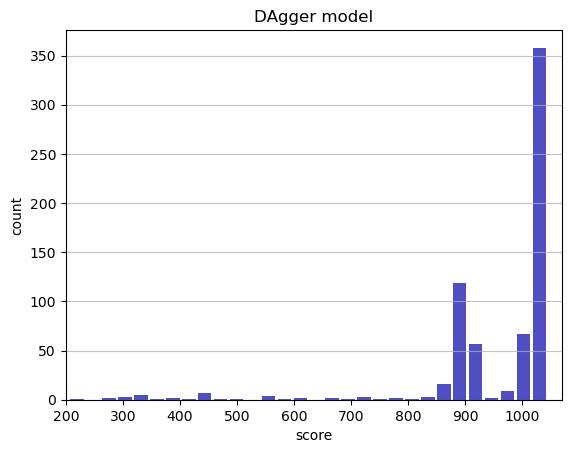

Track generation: 1202..1506 -> 304-tiles track
Epoch: 673
DAgger	mean: 954.19	variance: 136.81


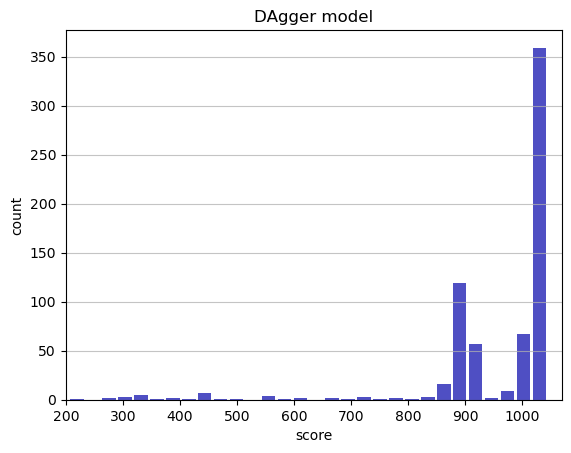

Track generation: 1089..1365 -> 276-tiles track
Epoch: 674
DAgger	mean: 954.12	variance: 136.72


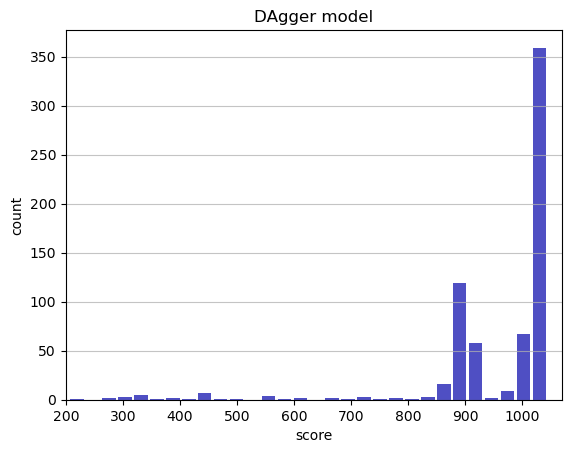

Track generation: 1164..1459 -> 295-tiles track
Epoch: 675
DAgger	mean: 954.04	variance: 136.63


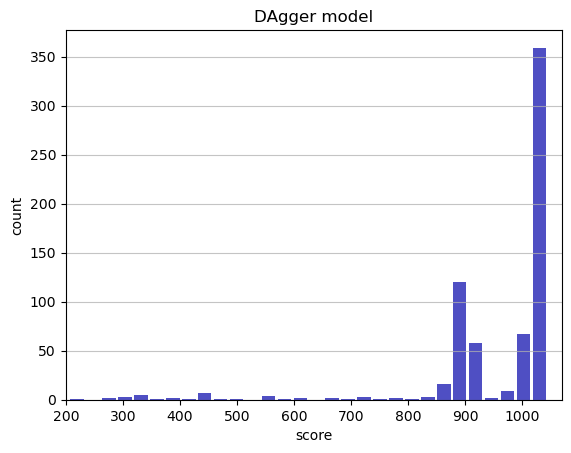

Track generation: 1295..1623 -> 328-tiles track
Epoch: 676
DAgger	mean: 954.10	variance: 136.54


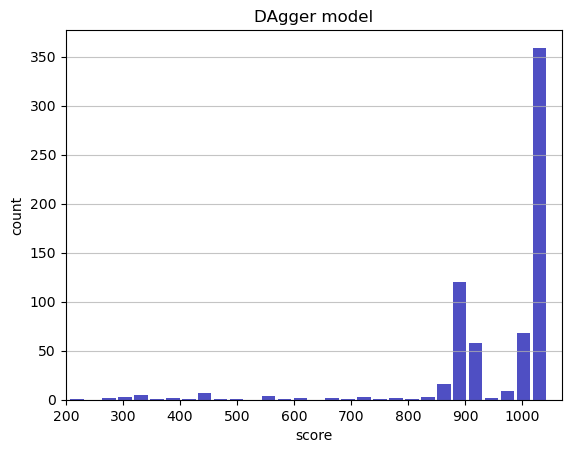

Track generation: 1095..1373 -> 278-tiles track
Epoch: 677
DAgger	mean: 954.02	variance: 136.46


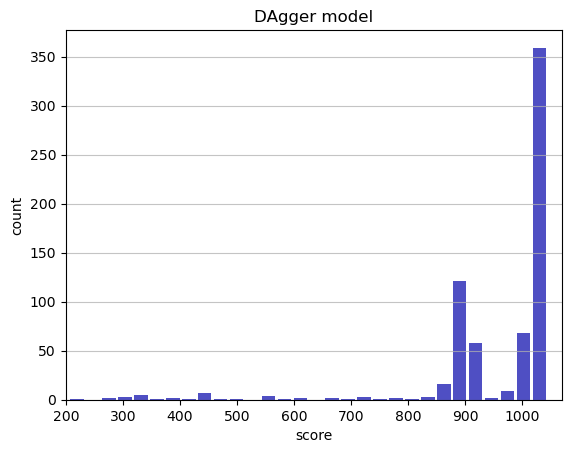

Track generation: 1140..1429 -> 289-tiles track
Epoch: 678
DAgger	mean: 954.12	variance: 136.38


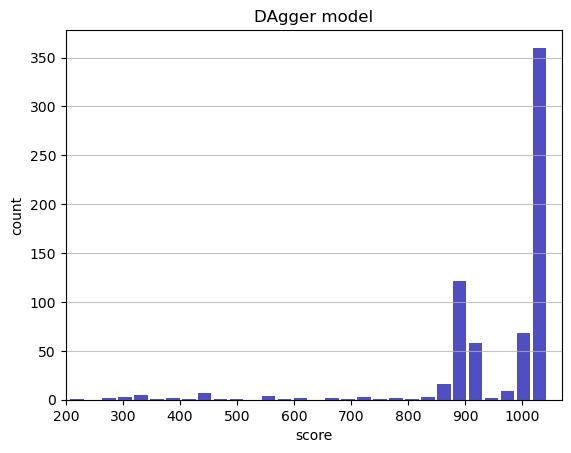

Track generation: 1227..1547 -> 320-tiles track
Epoch: 679
DAgger	mean: 954.21	variance: 136.30


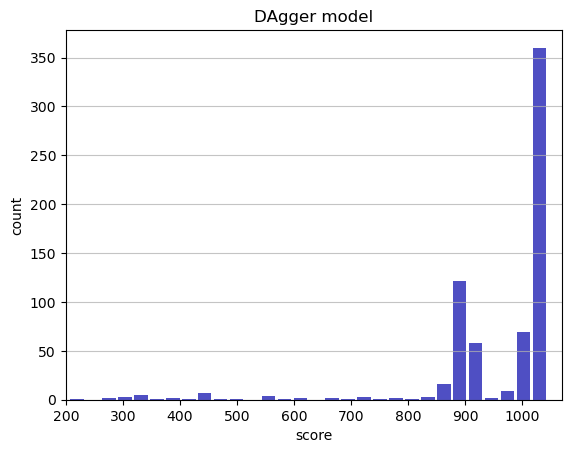

Track generation: 1148..1446 -> 298-tiles track
Epoch: 680
DAgger	mean: 953.48	variance: 137.53


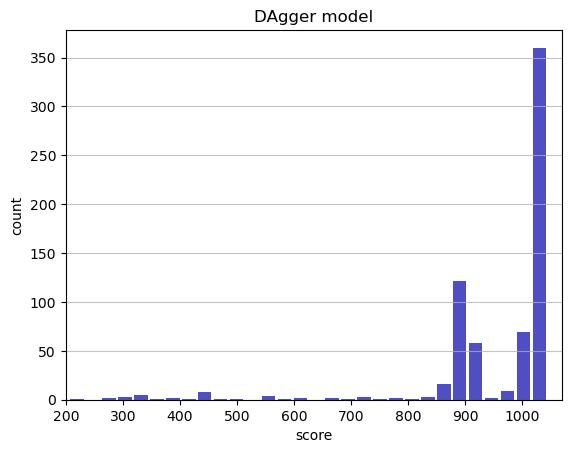

Track generation: 1316..1649 -> 333-tiles track
Epoch: 681
DAgger	mean: 953.39	variance: 137.45


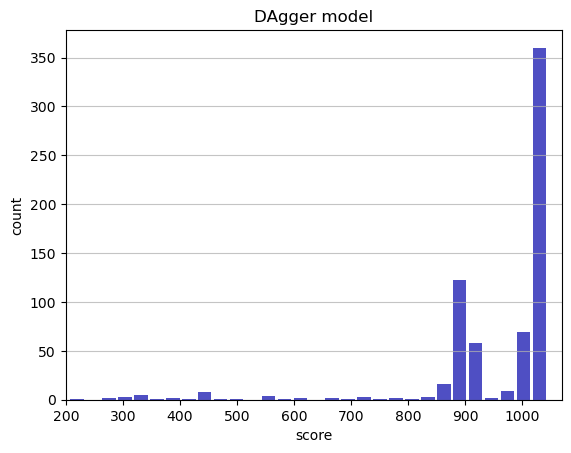

Track generation: 1048..1317 -> 269-tiles track
Epoch: 682
DAgger	mean: 953.50	variance: 137.38


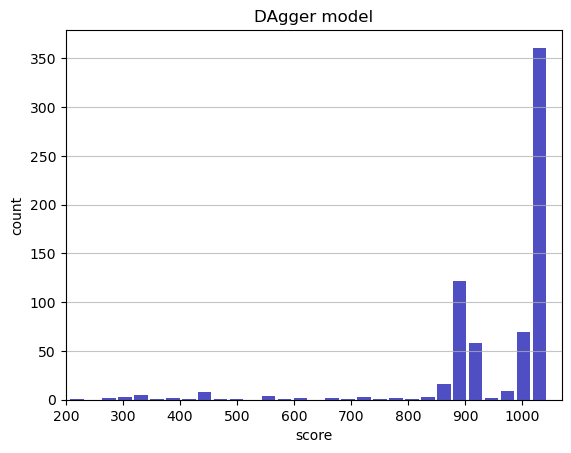

Track generation: 1079..1353 -> 274-tiles track
Epoch: 683
DAgger	mean: 953.44	variance: 137.29


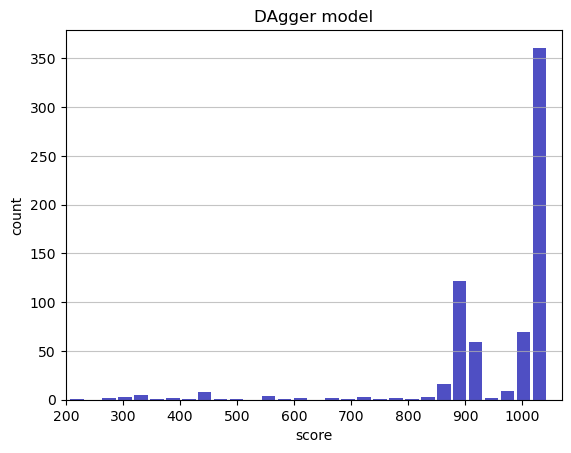

Track generation: 1340..1679 -> 339-tiles track
Epoch: 684
DAgger	mean: 953.52	variance: 137.21


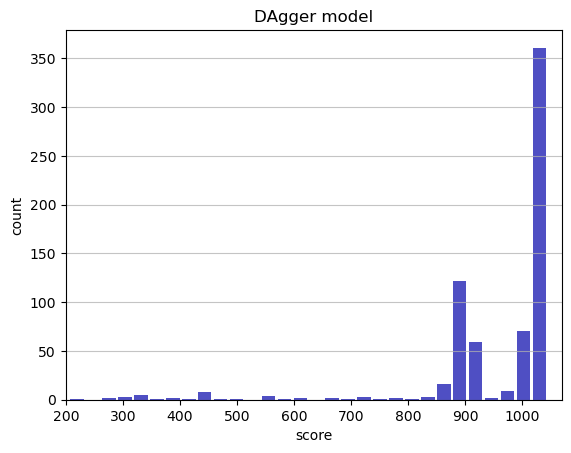

Track generation: 1168..1465 -> 297-tiles track
Epoch: 685
DAgger	mean: 953.44	variance: 137.12


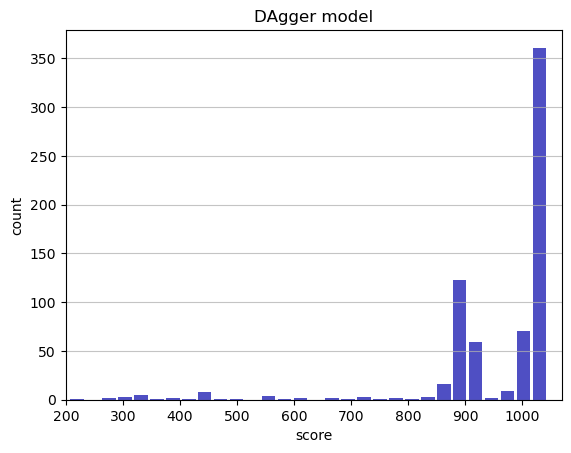

Track generation: 1068..1339 -> 271-tiles track
Epoch: 686
DAgger	mean: 953.54	variance: 137.05


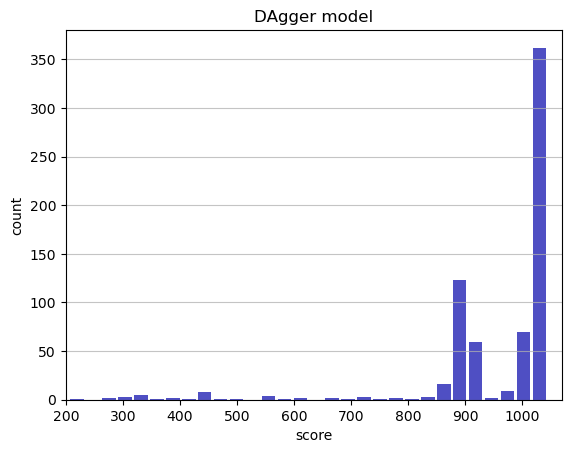

Track generation: 995..1253 -> 258-tiles track
Epoch: 687
DAgger	mean: 953.67	variance: 136.99


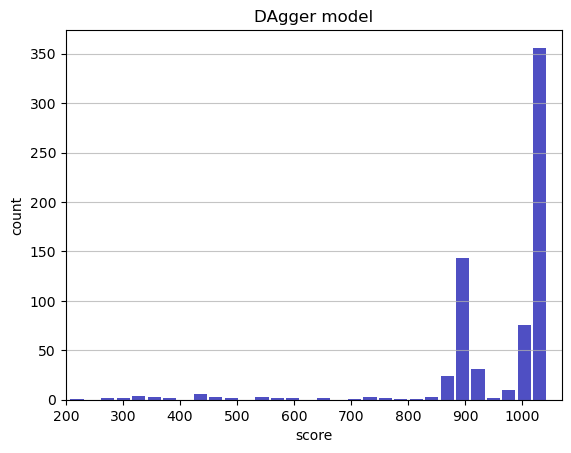

Track generation: 1184..1483 -> 299-tiles track
Epoch: 688
DAgger	mean: 953.76	variance: 136.91


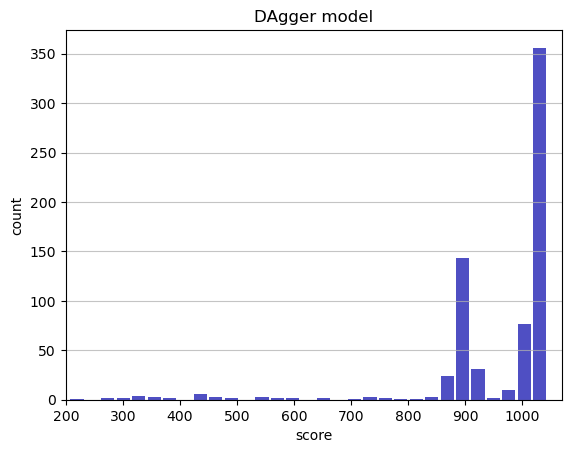

Track generation: 1015..1273 -> 258-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1287..1613 -> 326-tiles track
Epoch: 689
DAgger	mean: 953.85	variance: 136.83


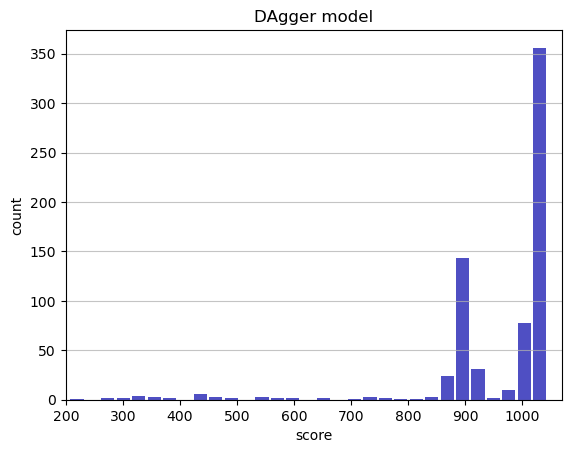

Track generation: 1179..1478 -> 299-tiles track
Epoch: 690
DAgger	mean: 953.94	variance: 136.76


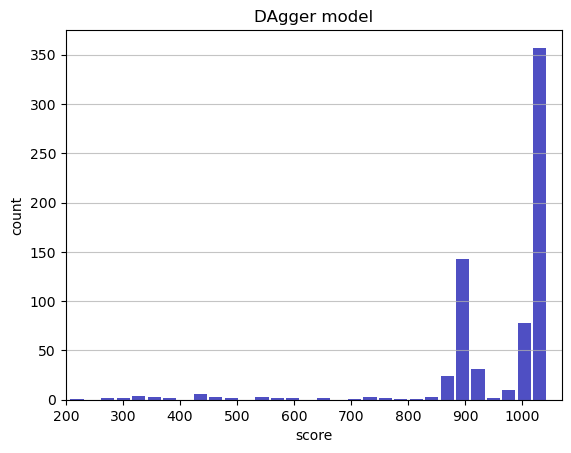

Track generation: 1283..1608 -> 325-tiles track
Epoch: 691
DAgger	mean: 953.85	variance: 136.67


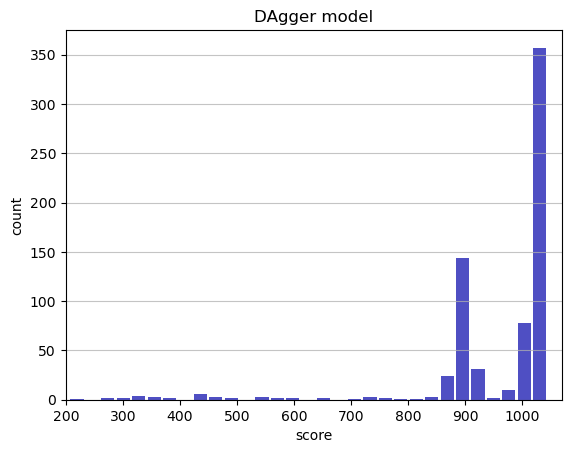

Track generation: 1072..1344 -> 272-tiles track
Epoch: 692
DAgger	mean: 953.76	variance: 136.60


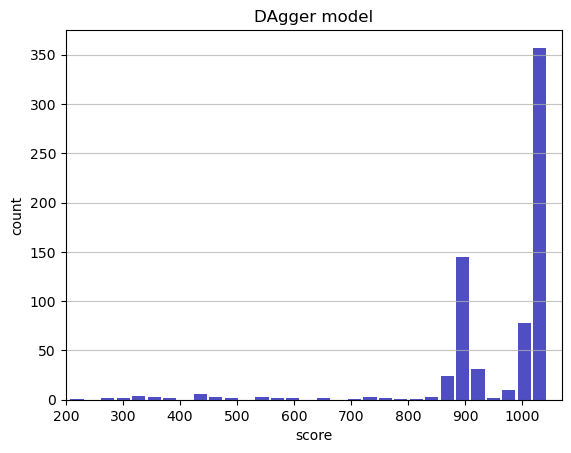

Track generation: 1103..1383 -> 280-tiles track
Epoch: 693
DAgger	mean: 953.70	variance: 136.51


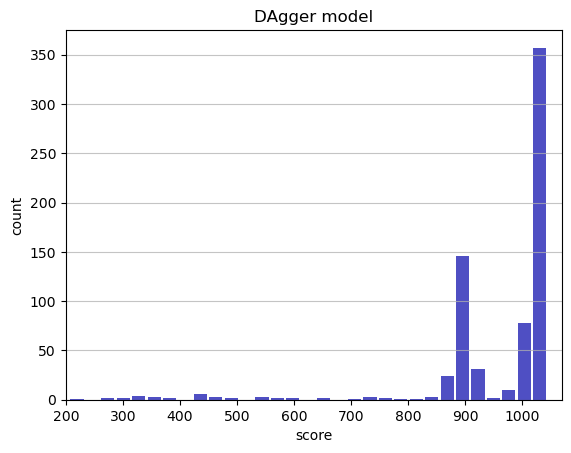

Track generation: 1183..1483 -> 300-tiles track
Epoch: 694
DAgger	mean: 953.62	variance: 136.43


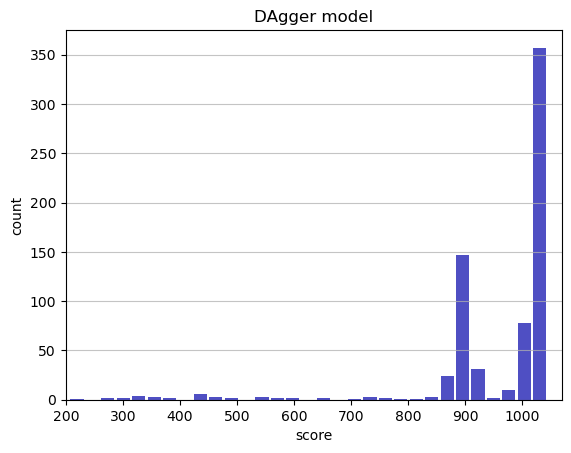

Track generation: 1041..1305 -> 264-tiles track
Epoch: 695
DAgger	mean: 953.73	variance: 136.36


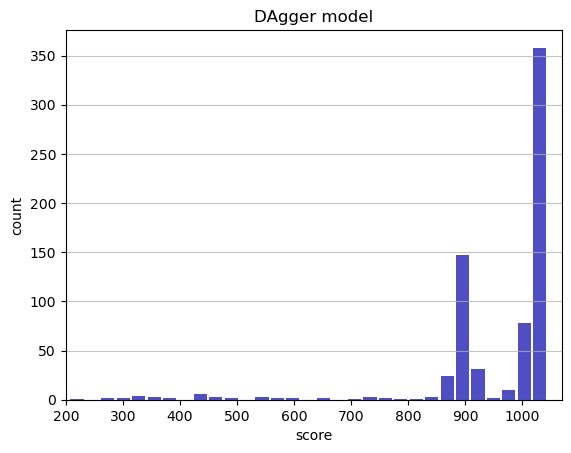

Track generation: 1131..1418 -> 287-tiles track
Epoch: 696
DAgger	mean: 953.65	variance: 136.28


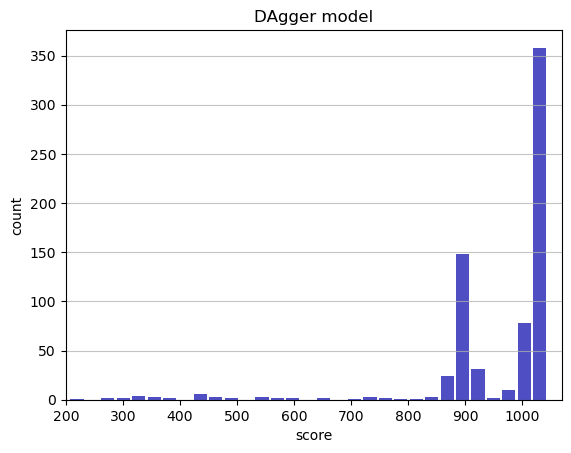

Track generation: 1092..1369 -> 277-tiles track
Epoch: 697
DAgger	mean: 953.76	variance: 136.22


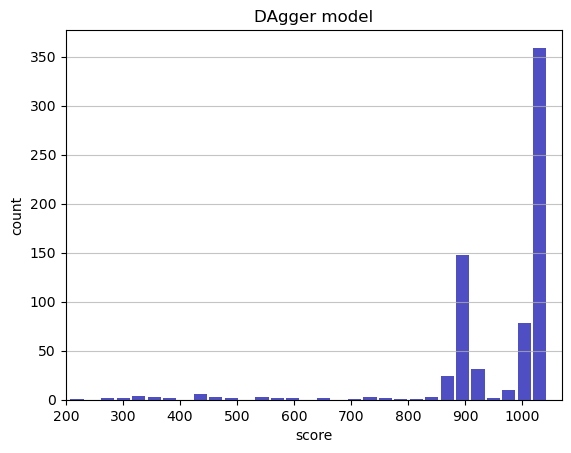

Track generation: 1180..1479 -> 299-tiles track
Epoch: 698
DAgger	mean: 953.68	variance: 136.14


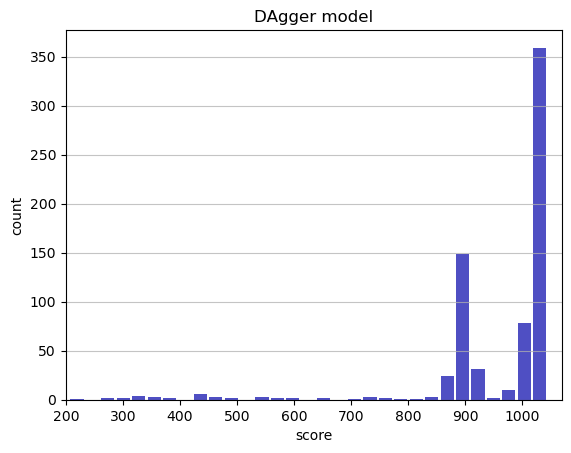

Track generation: 1153..1445 -> 292-tiles track
Epoch: 699
DAgger	mean: 953.79	variance: 136.07


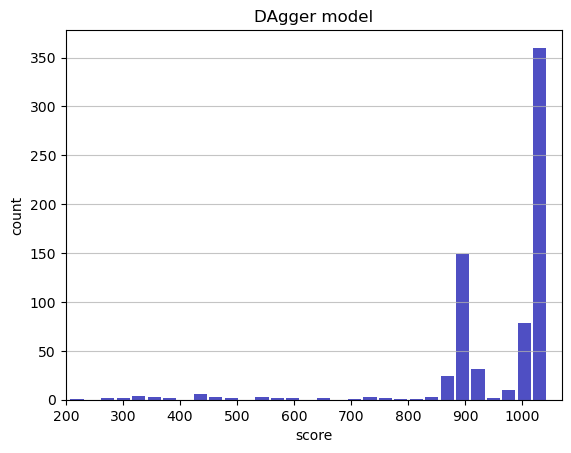

Track generation: 1259..1579 -> 320-tiles track
Epoch: 700
DAgger	mean: 953.87	variance: 135.99


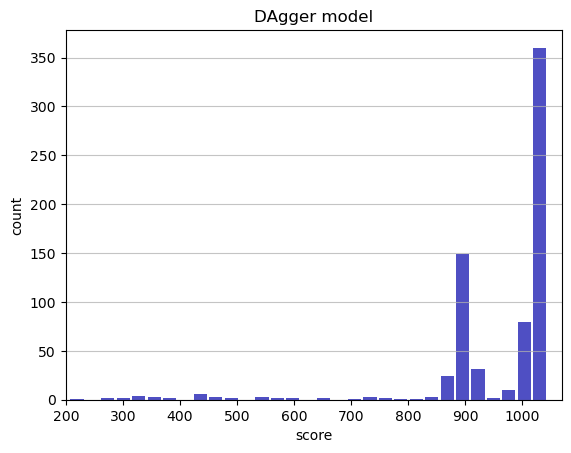

Track generation: 1188..1492 -> 304-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1181..1481 -> 300-tiles track
Epoch: 701
DAgger	mean: 953.95	variance: 135.91


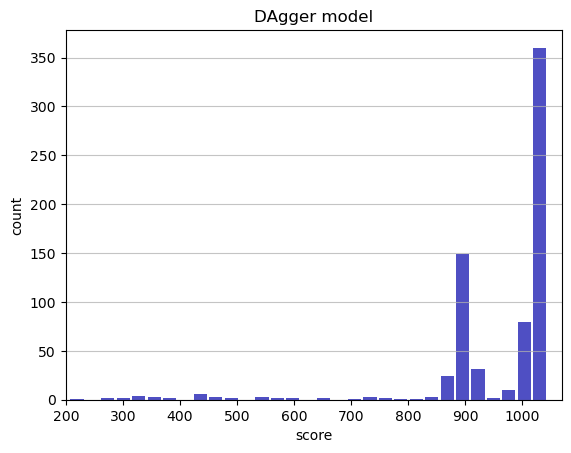

Track generation: 1083..1358 -> 275-tiles track
Epoch: 702
DAgger	mean: 953.88	variance: 135.82


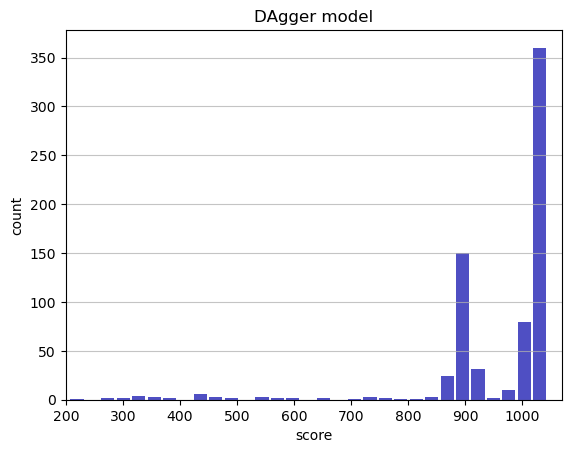

Track generation: 1248..1564 -> 316-tiles track
Epoch: 703
DAgger	mean: 953.97	variance: 135.75


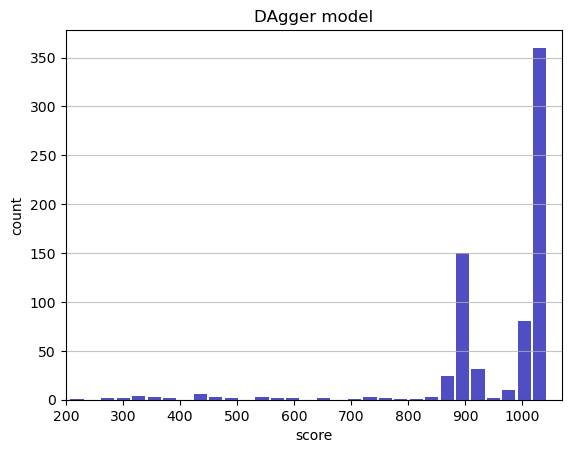

Track generation: 1176..1474 -> 298-tiles track
Epoch: 704
DAgger	mean: 953.86	variance: 135.68


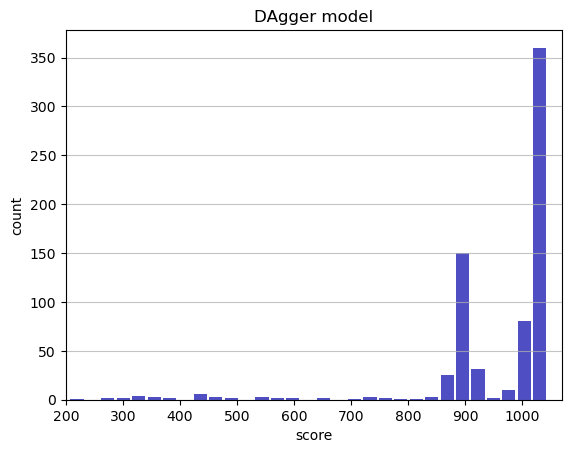

Track generation: 1376..1724 -> 348-tiles track
Epoch: 705
DAgger	mean: 953.93	variance: 135.60


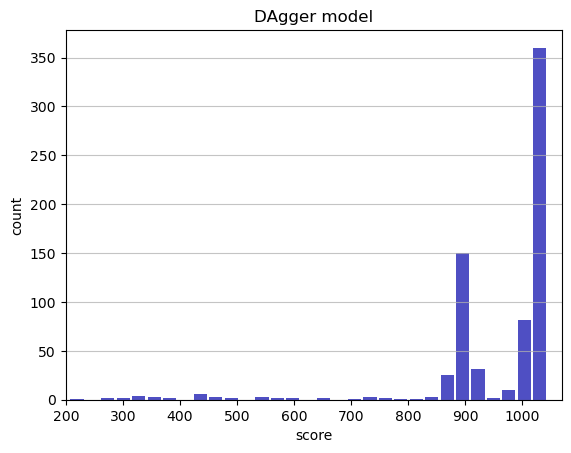

Track generation: 1119..1403 -> 284-tiles track
Epoch: 706
DAgger	mean: 954.03	variance: 135.53


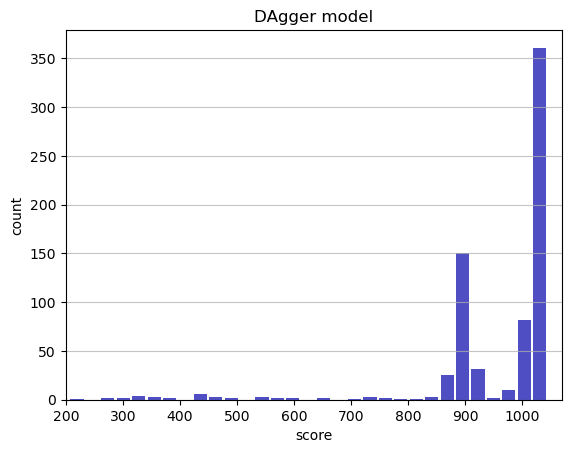

Track generation: 1157..1455 -> 298-tiles track
Epoch: 707
DAgger	mean: 954.12	variance: 135.46


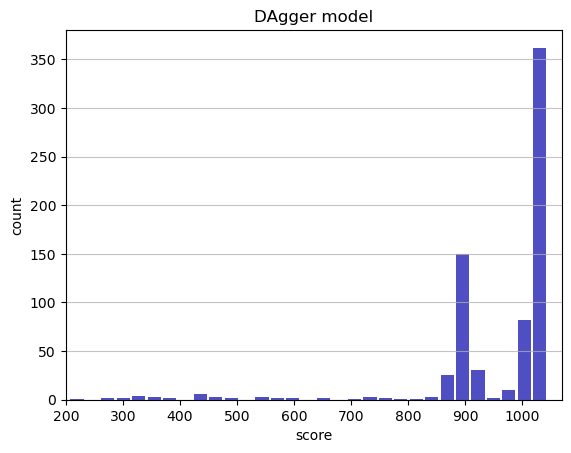

Track generation: 1378..1726 -> 348-tiles track
Epoch: 708
DAgger	mean: 954.15	variance: 135.36


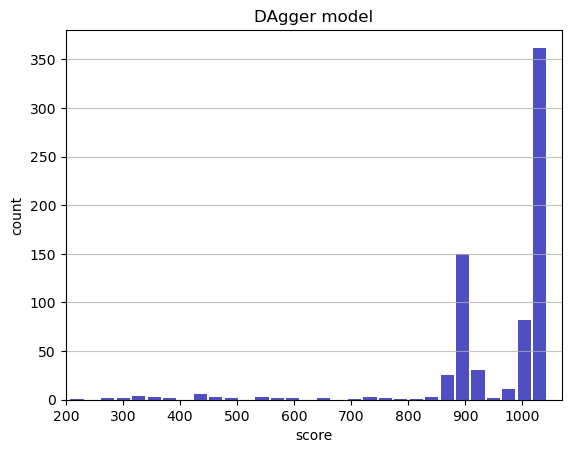

Track generation: 1087..1370 -> 283-tiles track
Epoch: 709
DAgger	mean: 954.07	variance: 135.28


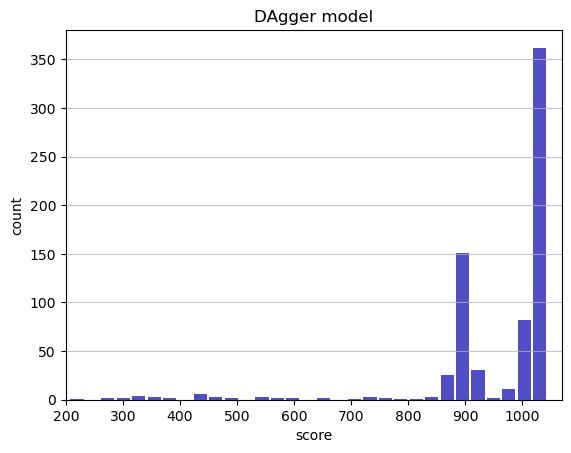

Track generation: 1312..1644 -> 332-tiles track
Epoch: 710
DAgger	mean: 954.16	variance: 135.21


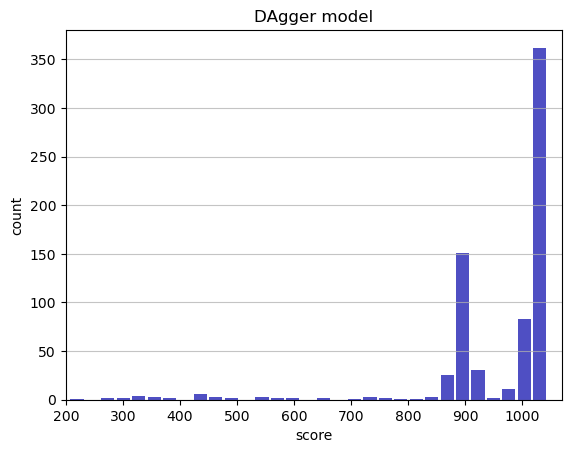

Track generation: 1147..1438 -> 291-tiles track
Epoch: 711
DAgger	mean: 954.26	variance: 135.14


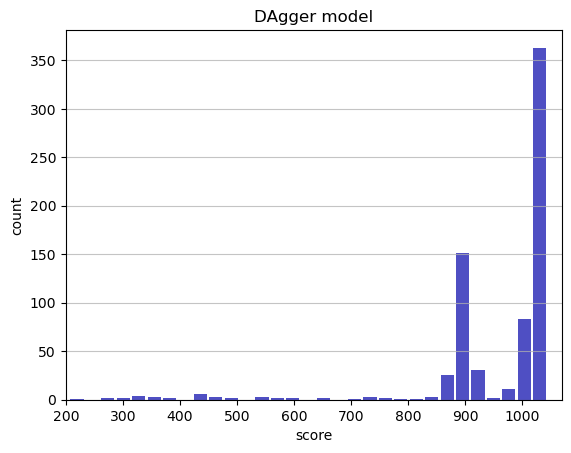

Track generation: 1133..1420 -> 287-tiles track
Epoch: 712
DAgger	mean: 954.36	variance: 135.07


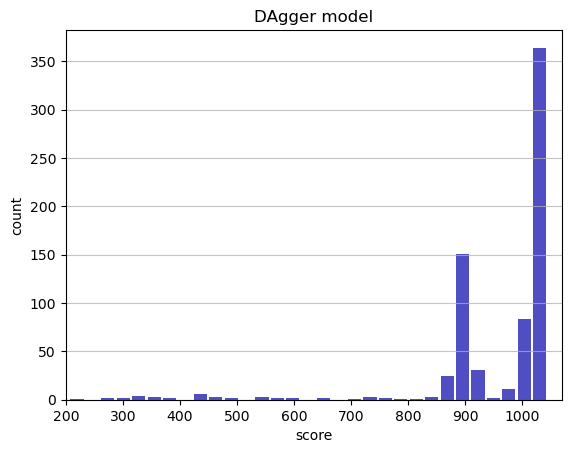

Track generation: 977..1232 -> 255-tiles track
Epoch: 713
DAgger	mean: 954.48	variance: 135.01


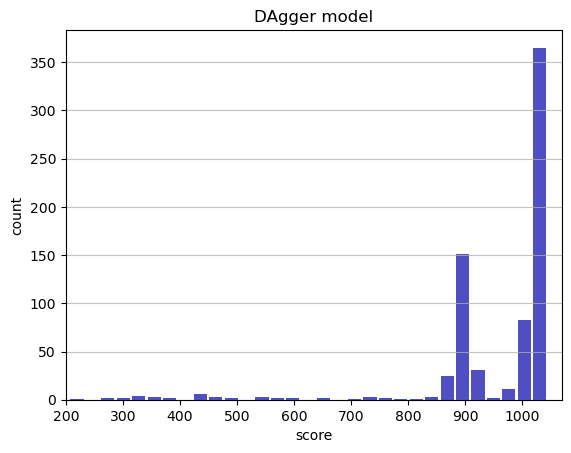

Track generation: 1133..1421 -> 288-tiles track
Epoch: 714
DAgger	mean: 954.58	variance: 134.94


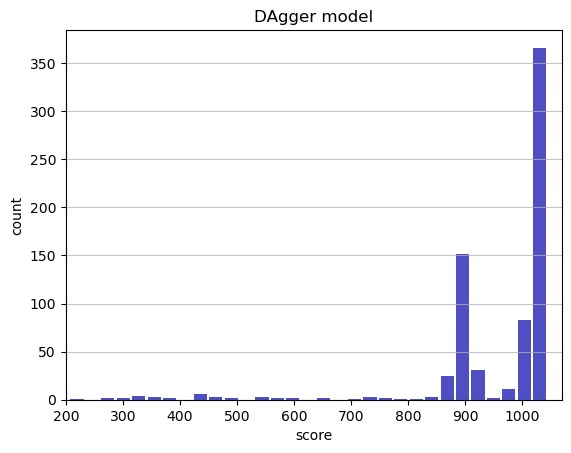

Track generation: 1152..1444 -> 292-tiles track
Epoch: 715
DAgger	mean: 954.51	variance: 134.86


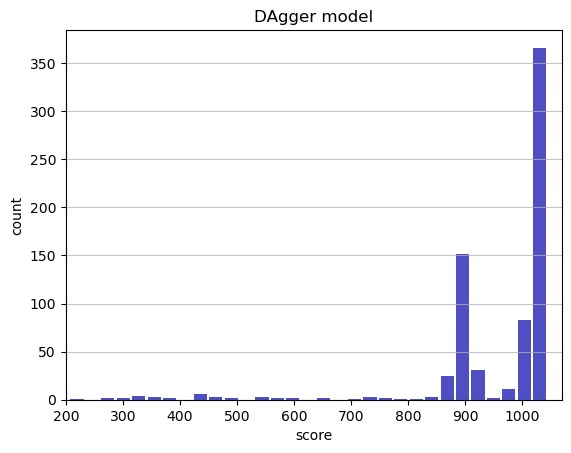

Track generation: 1228..1539 -> 311-tiles track
Epoch: 716
DAgger	mean: 954.60	variance: 134.79


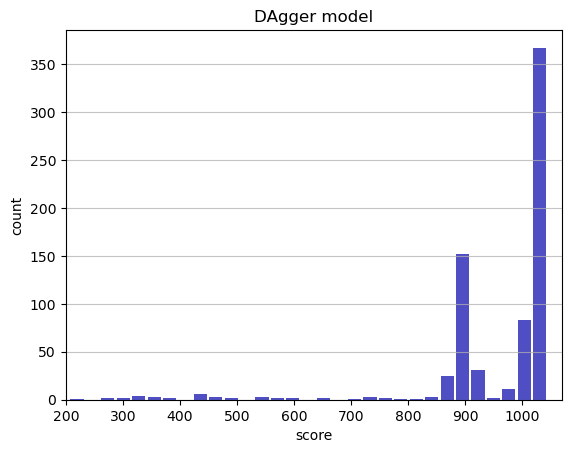

Track generation: 1219..1528 -> 309-tiles track
Epoch: 717
DAgger	mean: 954.53	variance: 134.71


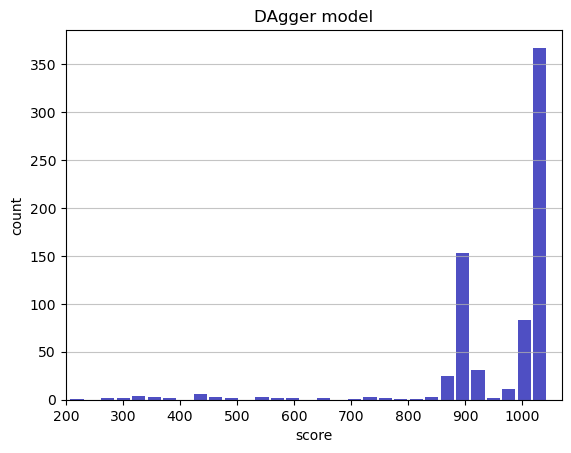

Track generation: 1151..1451 -> 300-tiles track
Epoch: 718
DAgger	mean: 954.62	variance: 134.64


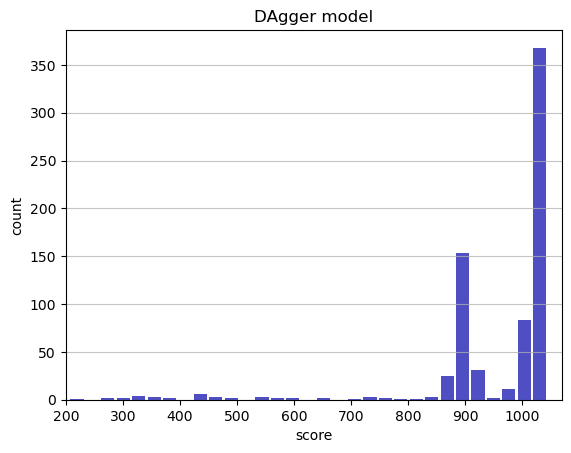

Track generation: 1144..1434 -> 290-tiles track
Epoch: 719
DAgger	mean: 954.56	variance: 134.56


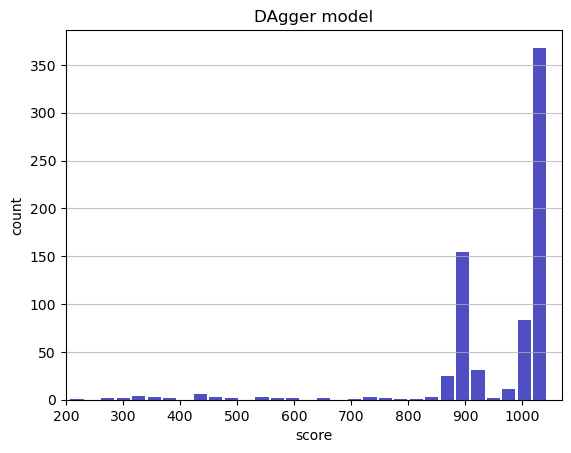

Track generation: 1367..1713 -> 346-tiles track
Epoch: 720
DAgger	mean: 954.59	variance: 134.47


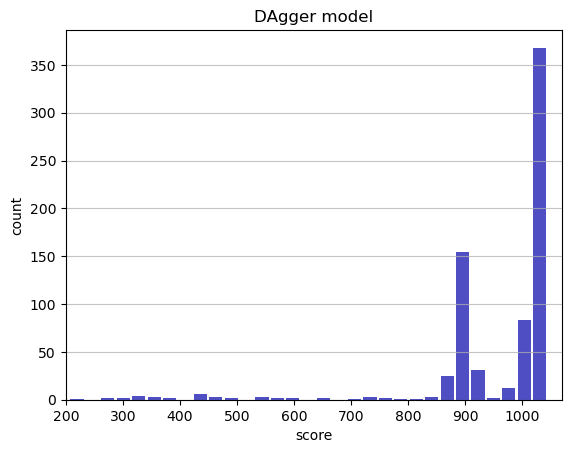

Track generation: 1064..1340 -> 276-tiles track
Epoch: 721
DAgger	mean: 954.70	variance: 134.41


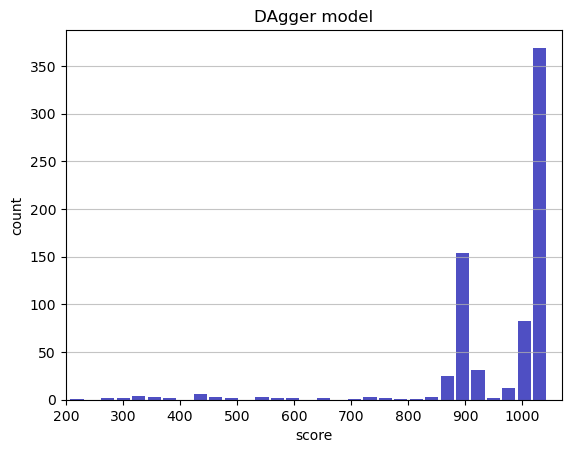

Track generation: 1054..1304 -> 250-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1078..1352 -> 274-tiles track
Epoch: 722
DAgger	mean: 954.81	variance: 134.34


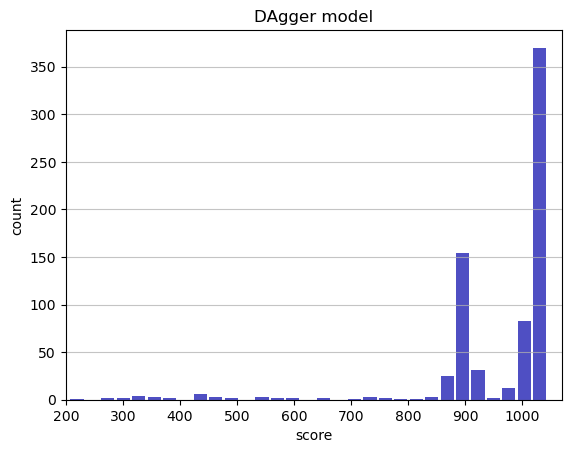

Track generation: 947..1194 -> 247-tiles track
Epoch: 723
DAgger	mean: 954.92	variance: 134.28


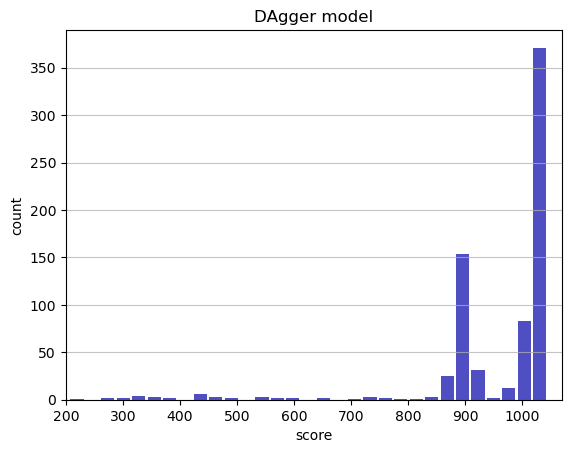

Track generation: 1156..1449 -> 293-tiles track
Epoch: 724
DAgger	mean: 955.02	variance: 134.21


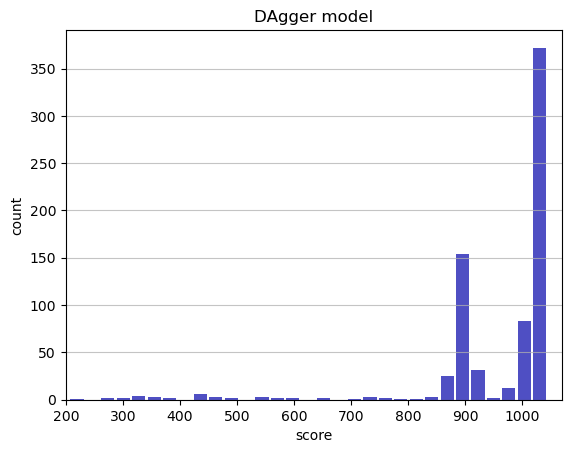

Track generation: 1274..1597 -> 323-tiles track
Epoch: 725
DAgger	mean: 955.10	variance: 134.14


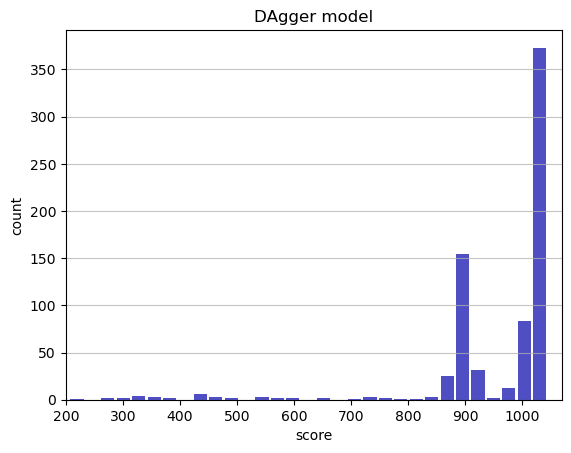

Track generation: 1168..1464 -> 296-tiles track
Epoch: 726
DAgger	mean: 955.03	variance: 134.06


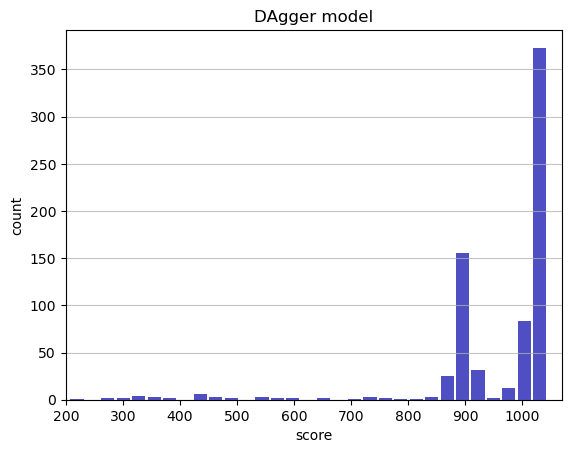

Track generation: 1299..1628 -> 329-tiles track
Epoch: 727
DAgger	mean: 955.11	variance: 133.99


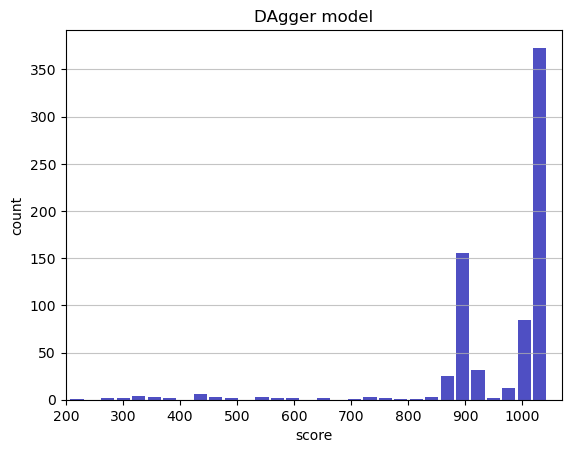

Track generation: 1031..1293 -> 262-tiles track
Epoch: 728
DAgger	mean: 955.03	variance: 133.91


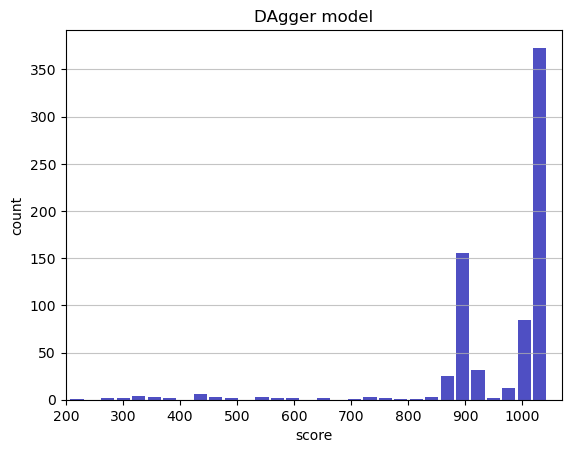

Track generation: 1108..1389 -> 281-tiles track
Epoch: 729
DAgger	mean: 954.95	variance: 133.84


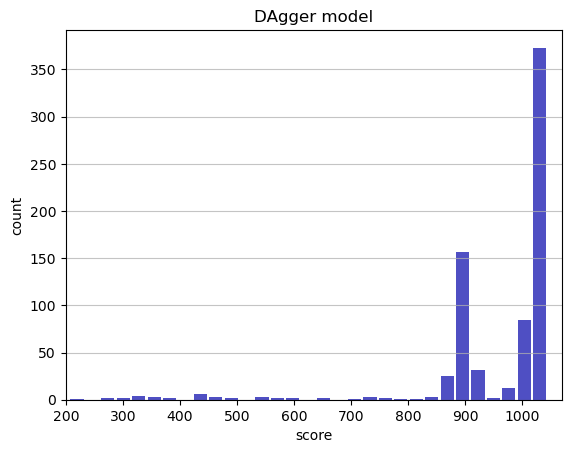

Track generation: 1208..1514 -> 306-tiles track
Epoch: 730
DAgger	mean: 954.85	variance: 133.77


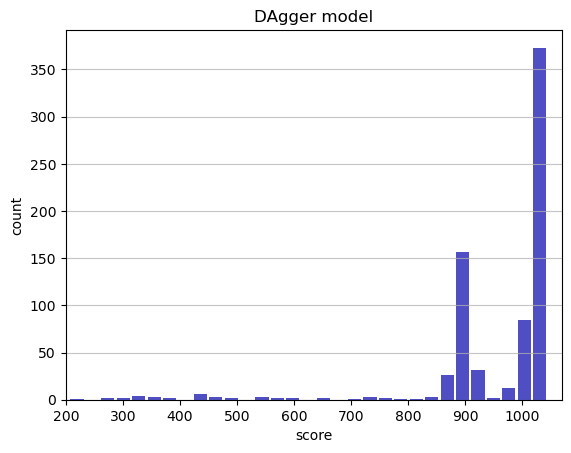

Track generation: 1191..1499 -> 308-tiles track
Epoch: 731
DAgger	mean: 954.94	variance: 133.71


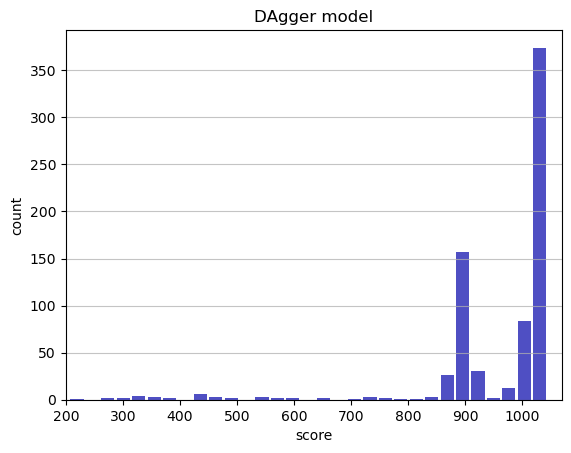

Track generation: 1271..1593 -> 322-tiles track
Epoch: 732
DAgger	mean: 954.67	variance: 133.81


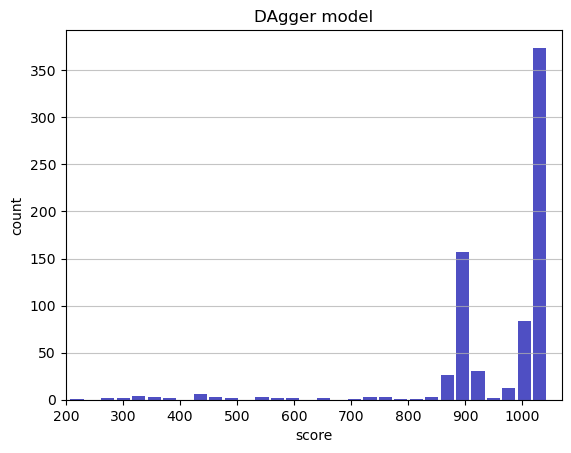

Track generation: 1306..1637 -> 331-tiles track
Epoch: 733
DAgger	mean: 954.24	variance: 134.22


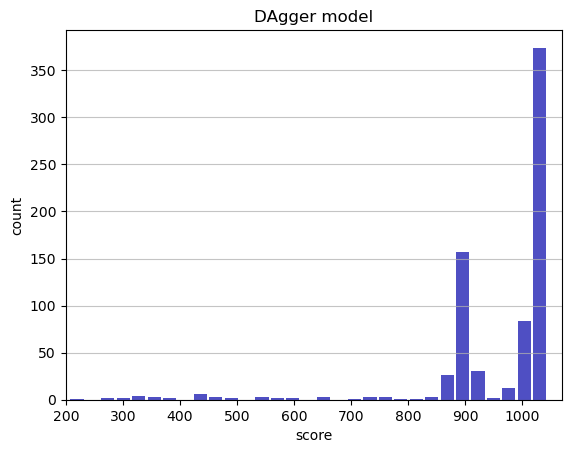

Track generation: 1239..1553 -> 314-tiles track
Epoch: 734
DAgger	mean: 954.33	variance: 134.15


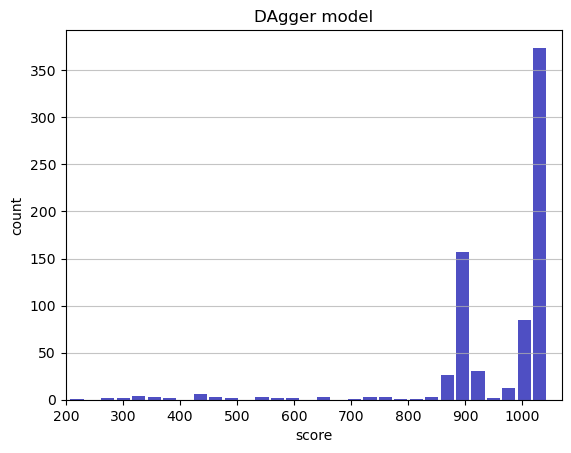

Track generation: 1080..1359 -> 279-tiles track
Epoch: 735
DAgger	mean: 954.43	variance: 134.08


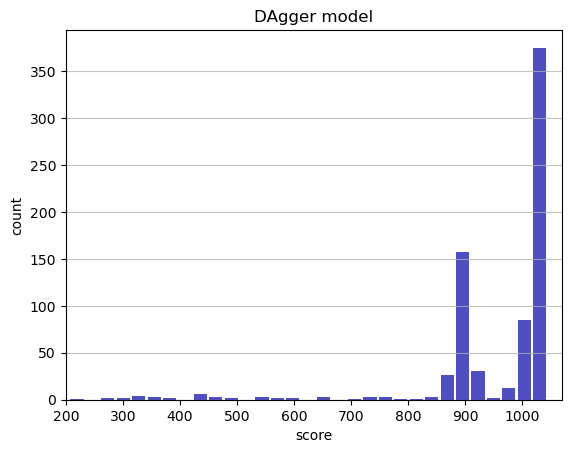

Track generation: 950..1196 -> 246-tiles track
Epoch: 736
DAgger	mean: 954.55	variance: 134.03


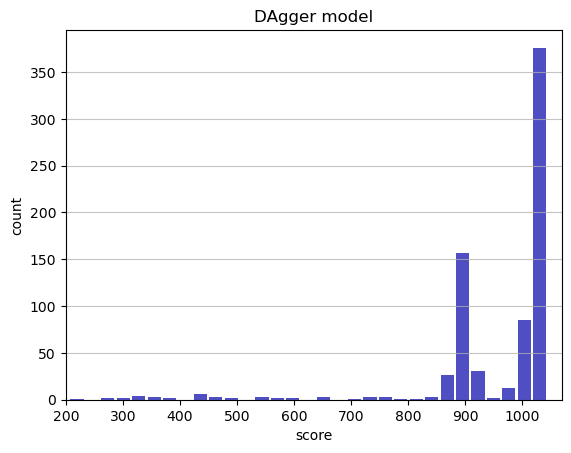

Track generation: 1139..1428 -> 289-tiles track
Epoch: 737
DAgger	mean: 954.64	variance: 133.96


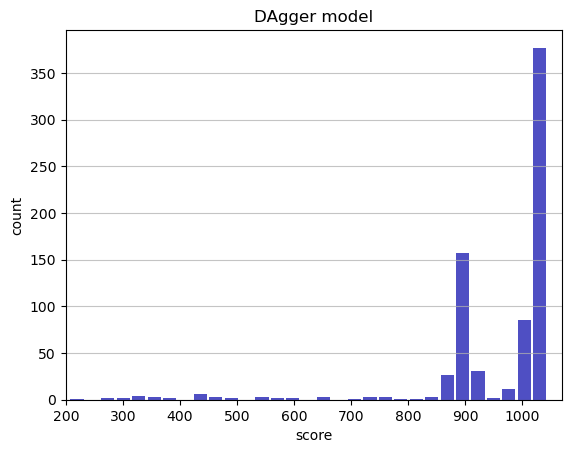

Track generation: 1125..1410 -> 285-tiles track
Epoch: 738
DAgger	mean: 954.74	variance: 133.90


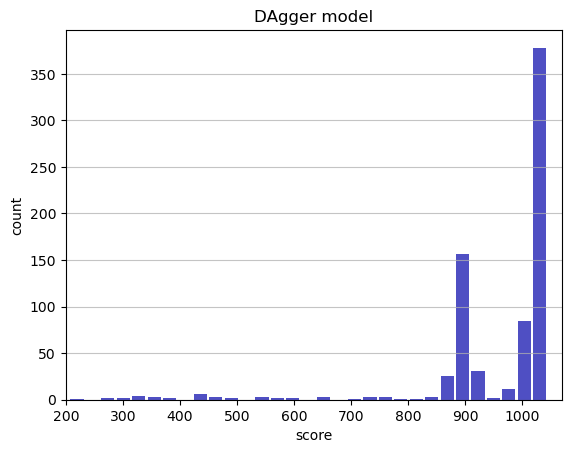

Track generation: 1138..1427 -> 289-tiles track
Epoch: 739
DAgger	mean: 954.65	variance: 133.83


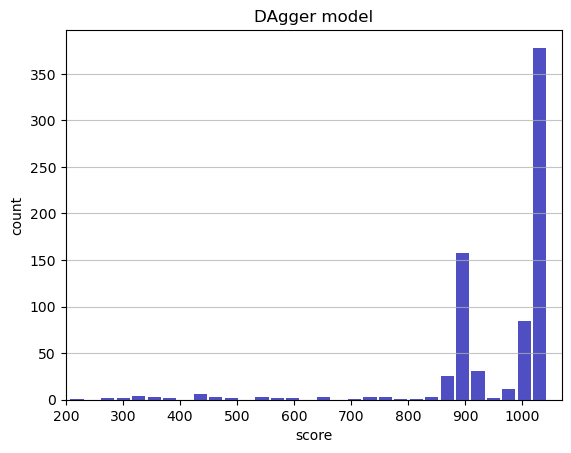

Track generation: 1062..1335 -> 273-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1284..1615 -> 331-tiles track
Epoch: 740
DAgger	mean: 954.73	variance: 133.76


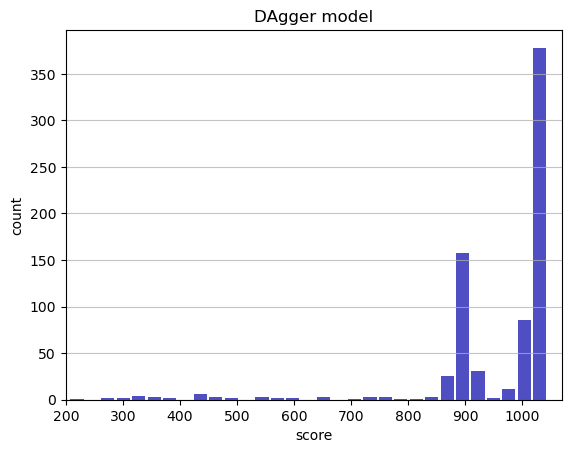

Track generation: 1287..1613 -> 326-tiles track
Epoch: 741
DAgger	mean: 954.42	variance: 133.94


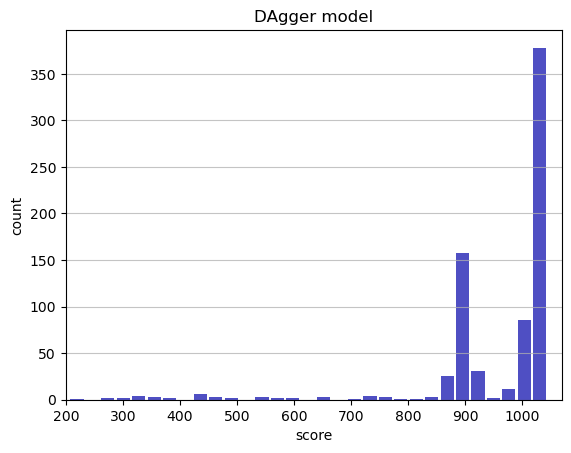

Track generation: 1219..1528 -> 309-tiles track
Epoch: 742
DAgger	mean: 954.51	variance: 133.87


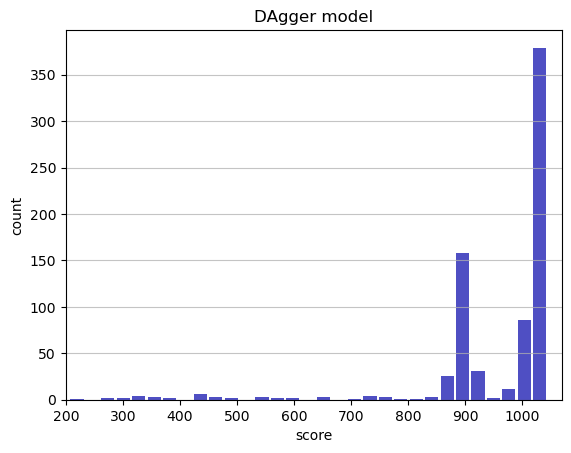

Track generation: 1111..1393 -> 282-tiles track
Epoch: 743
DAgger	mean: 954.44	variance: 133.79


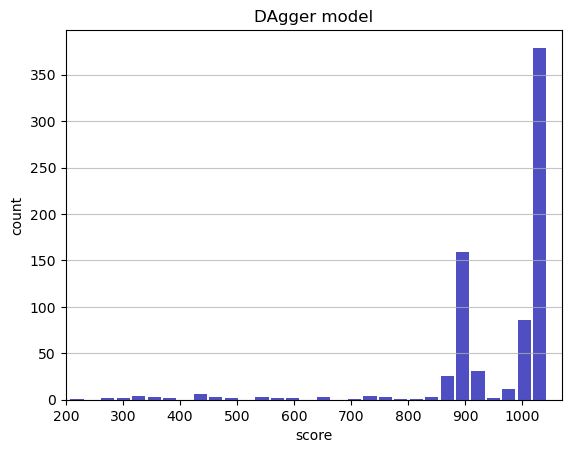

Track generation: 1152..1450 -> 298-tiles track
Epoch: 744
DAgger	mean: 954.34	variance: 133.73


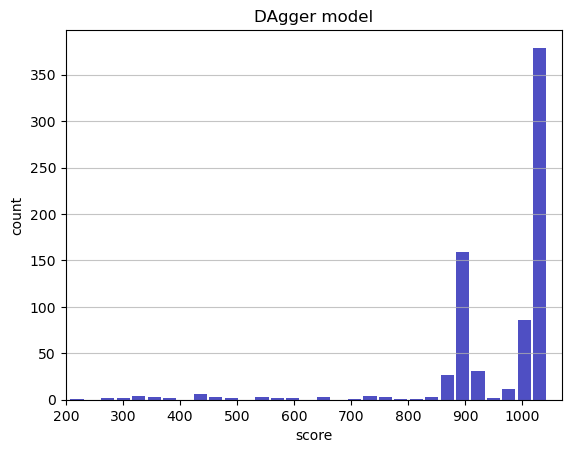

Track generation: 1024..1292 -> 268-tiles track
Epoch: 745
DAgger	mean: 954.25	variance: 133.66


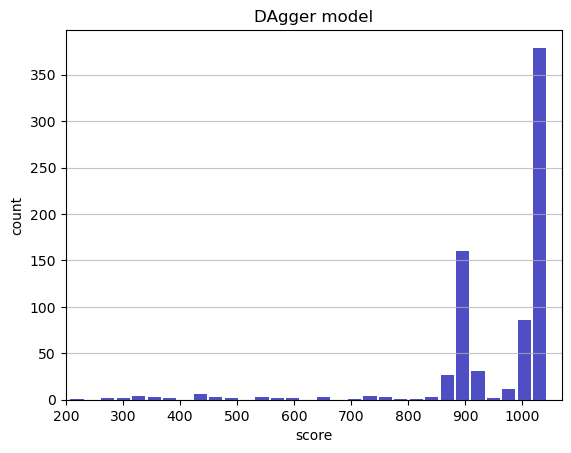

Track generation: 1187..1492 -> 305-tiles track
Epoch: 746
DAgger	mean: 954.33	variance: 133.59


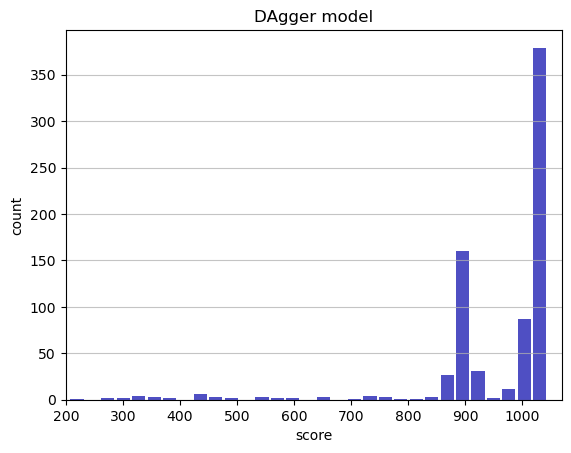

Track generation: 1165..1460 -> 295-tiles track
Epoch: 747
DAgger	mean: 954.27	variance: 133.51


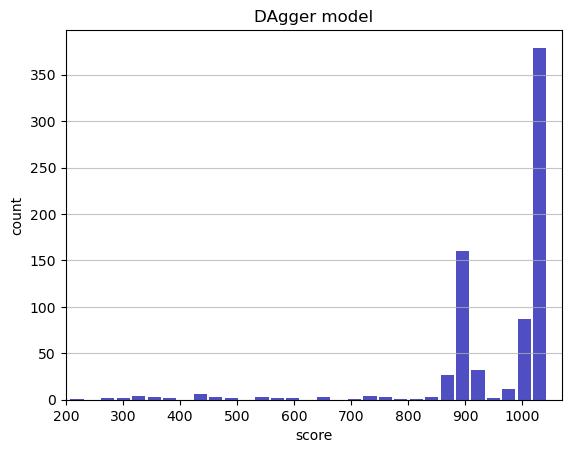

Track generation: 1039..1303 -> 264-tiles track
Epoch: 748
DAgger	mean: 954.21	variance: 133.43


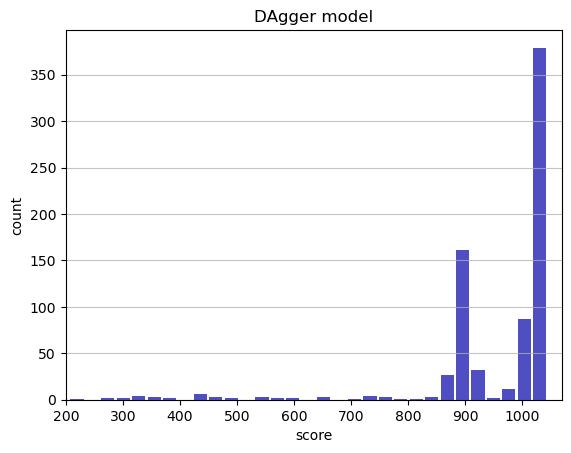

Track generation: 1089..1369 -> 280-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1116..1399 -> 283-tiles track
Epoch: 749
DAgger	mean: 954.32	variance: 133.37


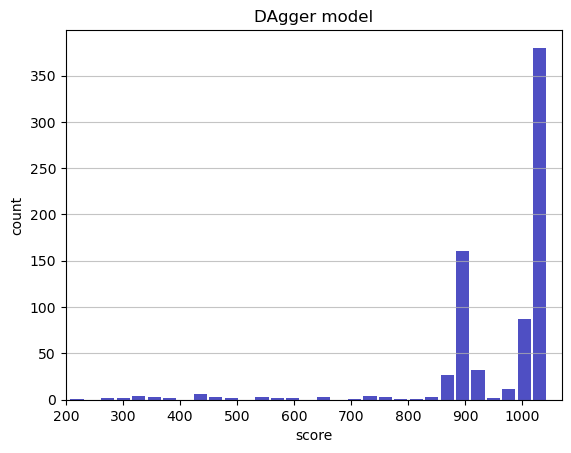

Track generation: 1048..1318 -> 270-tiles track
Epoch: 750
DAgger	mean: 954.43	variance: 133.32


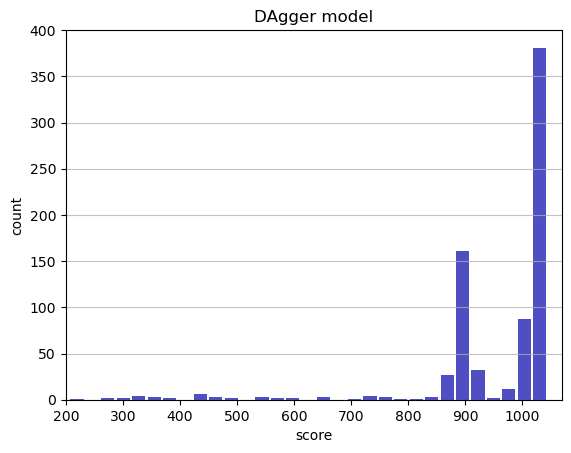

Track generation: 1239..1553 -> 314-tiles track
Epoch: 751
DAgger	mean: 954.32	variance: 133.26


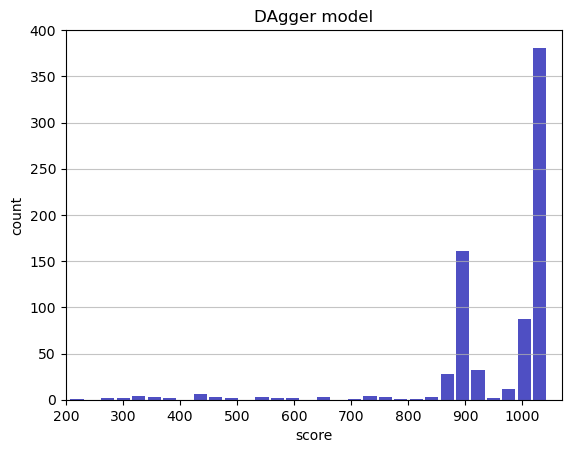

Track generation: 991..1243 -> 252-tiles track
Epoch: 752
DAgger	mean: 954.26	variance: 133.19


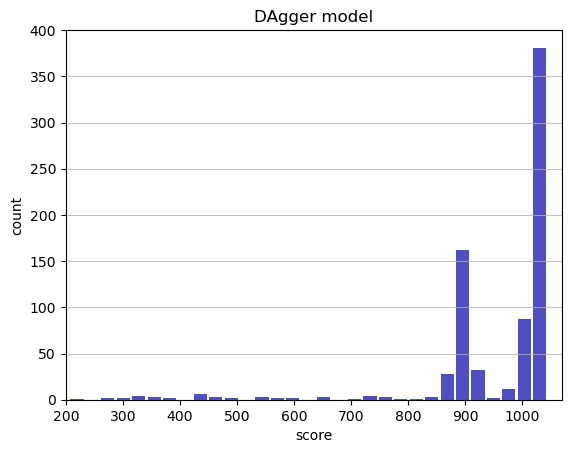

Track generation: 916..1152 -> 236-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1208..1514 -> 306-tiles track
Epoch: 753
DAgger	mean: 954.35	variance: 133.12


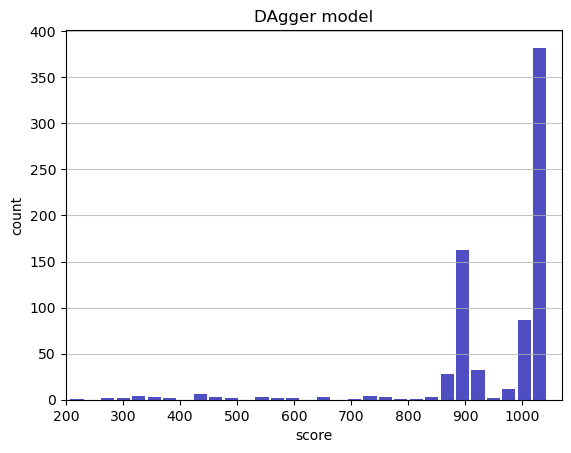

Track generation: 1064..1334 -> 270-tiles track
Epoch: 754
DAgger	mean: 954.46	variance: 133.06


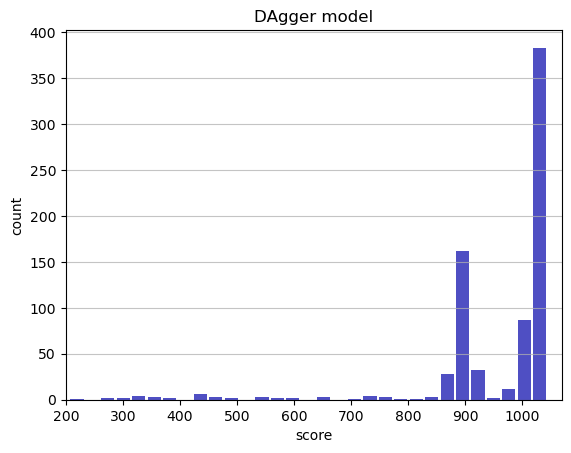

Track generation: 1176..1474 -> 298-tiles track
Epoch: 755
DAgger	mean: 954.55	variance: 133.00


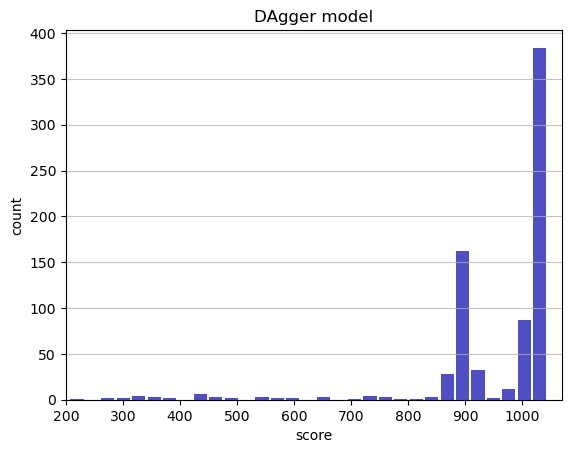

Track generation: 1071..1343 -> 272-tiles track
Epoch: 756
DAgger	mean: 954.65	variance: 132.94


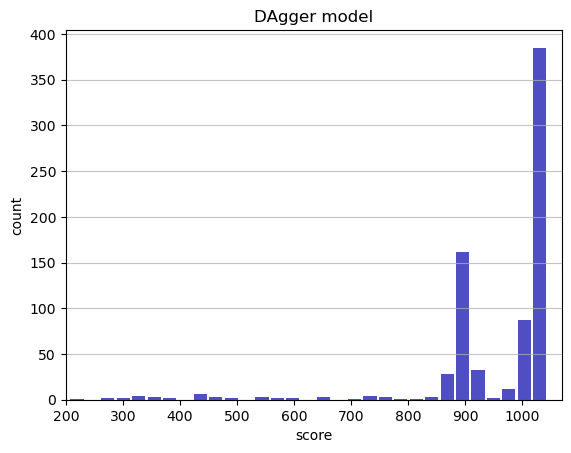

Track generation: 1156..1449 -> 293-tiles track
Epoch: 757
DAgger	mean: 954.59	variance: 132.87


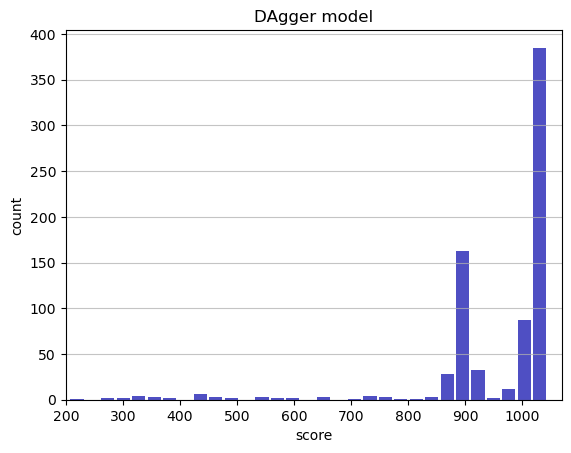

Track generation: 1124..1409 -> 285-tiles track
Epoch: 758
DAgger	mean: 954.69	variance: 132.81


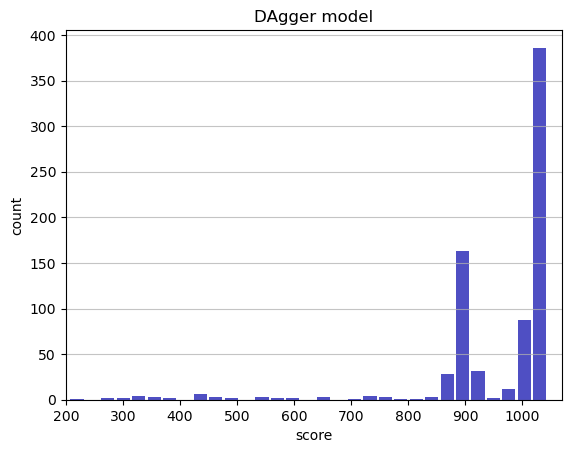

Track generation: 1155..1445 -> 290-tiles track
Epoch: 759
DAgger	mean: 954.61	variance: 132.74


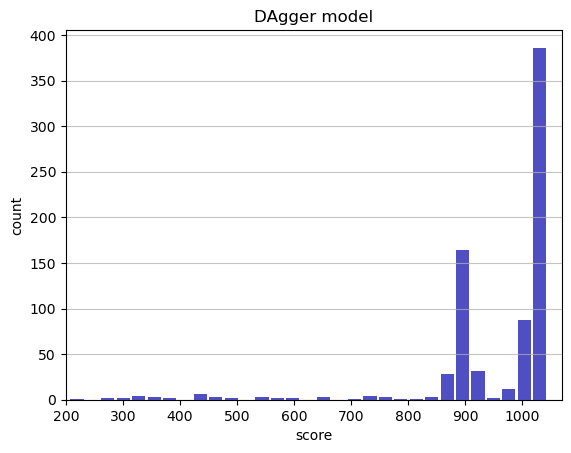

Track generation: 1083..1358 -> 275-tiles track
Epoch: 760
DAgger	mean: 954.71	variance: 132.68


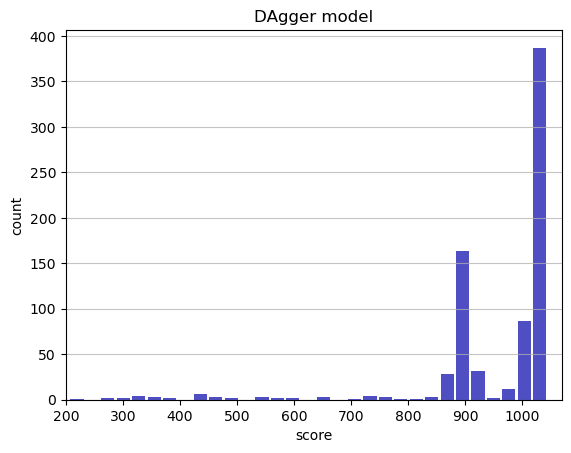

Track generation: 1175..1473 -> 298-tiles track
Epoch: 761
DAgger	mean: 954.79	variance: 132.62


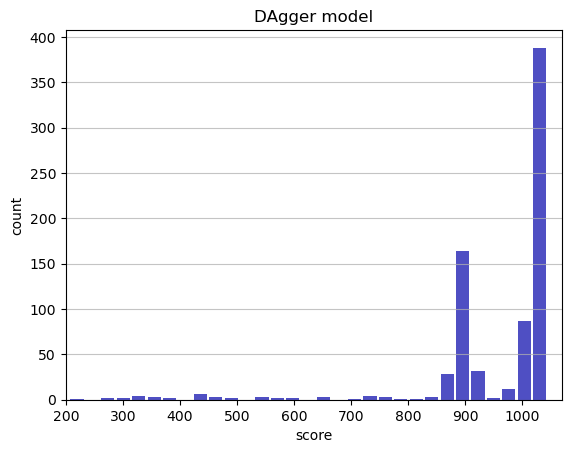

Track generation: 1117..1400 -> 283-tiles track
Epoch: 762
DAgger	mean: 954.07	variance: 134.03


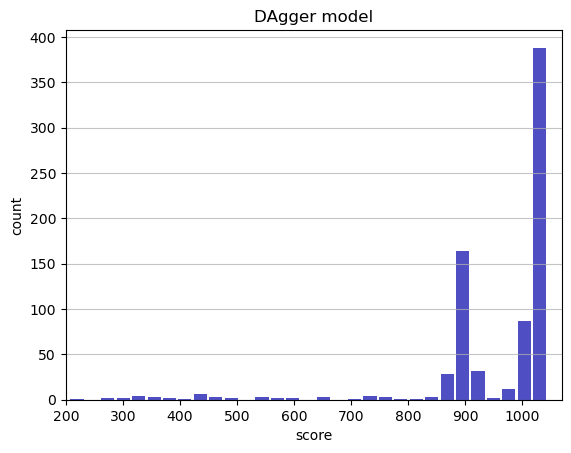

Track generation: 1048..1319 -> 271-tiles track
Epoch: 763
DAgger	mean: 954.17	variance: 133.97


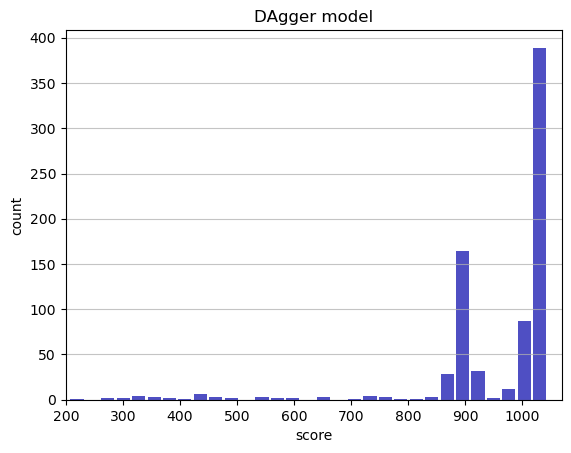

Track generation: 947..1190 -> 243-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1218..1535 -> 317-tiles track
Epoch: 764
DAgger	mean: 954.07	variance: 133.91


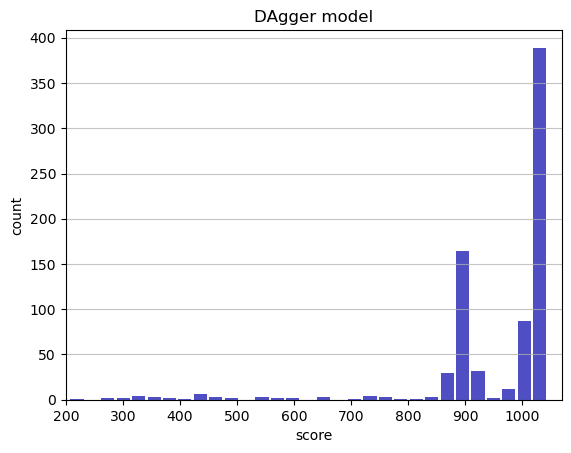

Track generation: 924..1159 -> 235-tiles track
Epoch: 765
DAgger	mean: 954.00	variance: 133.84


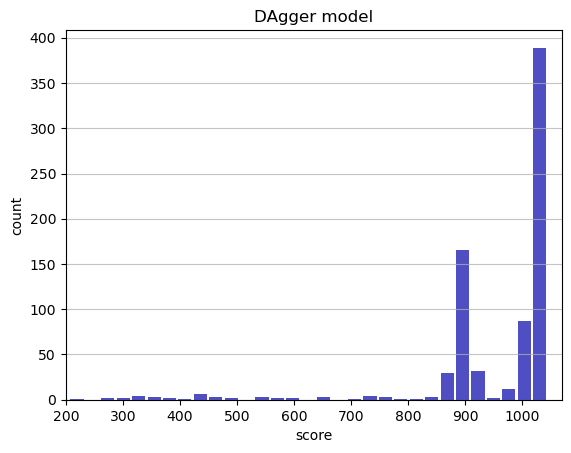

Track generation: 1086..1362 -> 276-tiles track
Epoch: 766
DAgger	mean: 954.10	variance: 133.78


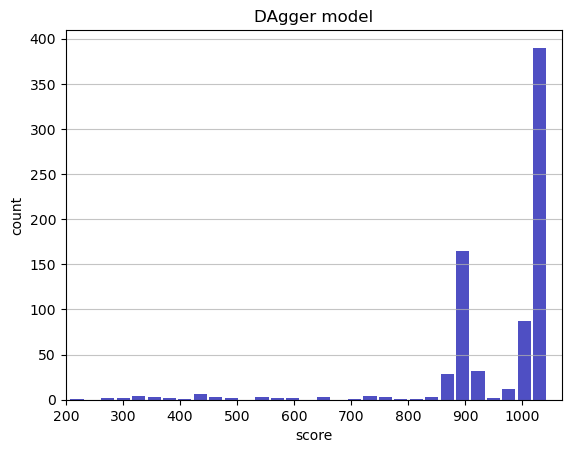

Track generation: 1296..1624 -> 328-tiles track
Epoch: 767
DAgger	mean: 954.02	variance: 133.72


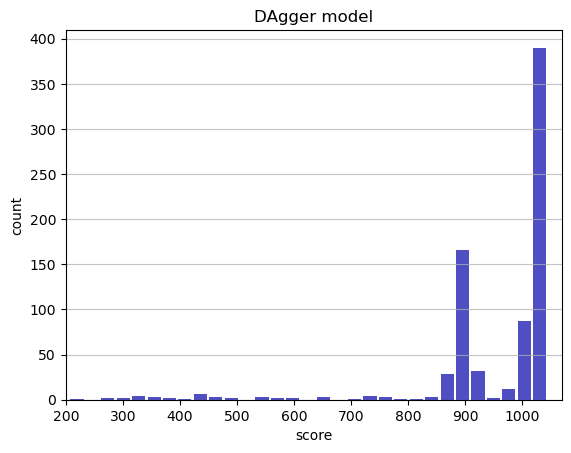

Track generation: 1088..1364 -> 276-tiles track
Epoch: 768
DAgger	mean: 954.12	variance: 133.66


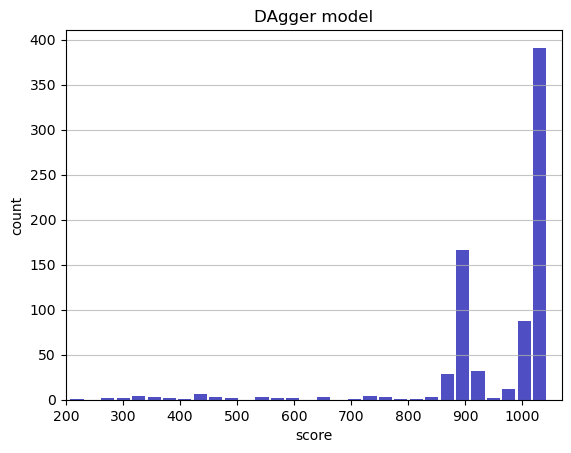

Track generation: 1223..1532 -> 309-tiles track
Epoch: 769
DAgger	mean: 954.21	variance: 133.59


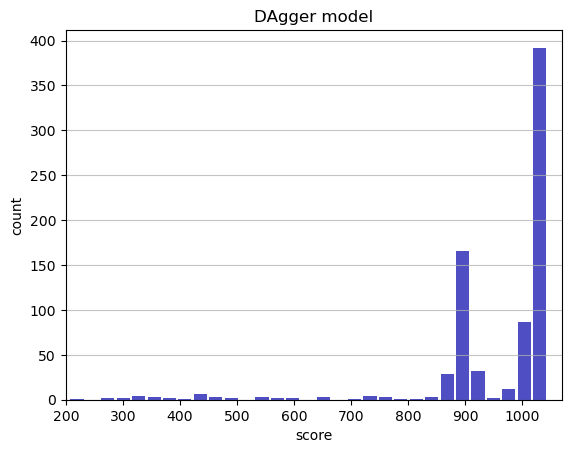

Track generation: 1295..1623 -> 328-tiles track
Epoch: 770
DAgger	mean: 954.29	variance: 133.52


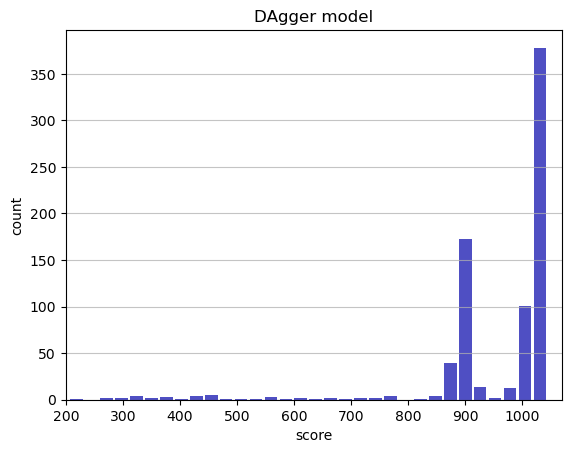

Track generation: 1181..1480 -> 299-tiles track
Epoch: 771
DAgger	mean: 953.49	variance: 135.25


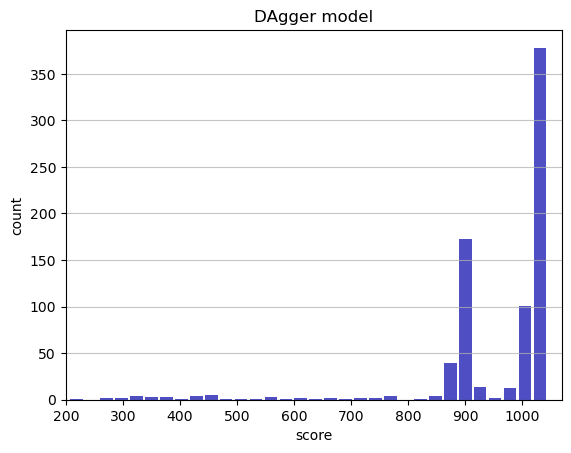

Track generation: 1092..1369 -> 277-tiles track
Epoch: 772
DAgger	mean: 953.41	variance: 135.18


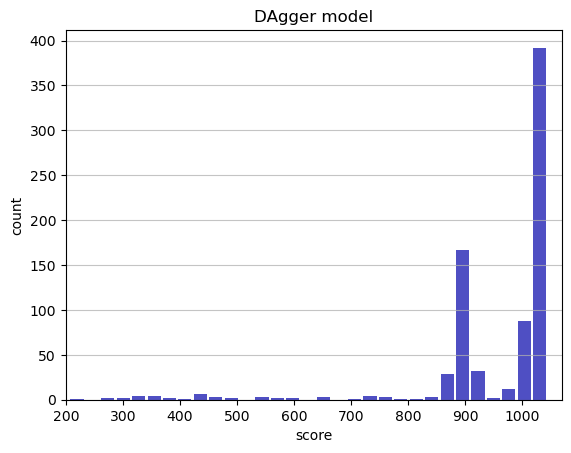

Track generation: 1063..1333 -> 270-tiles track
Epoch: 773
DAgger	mean: 953.51	variance: 135.12


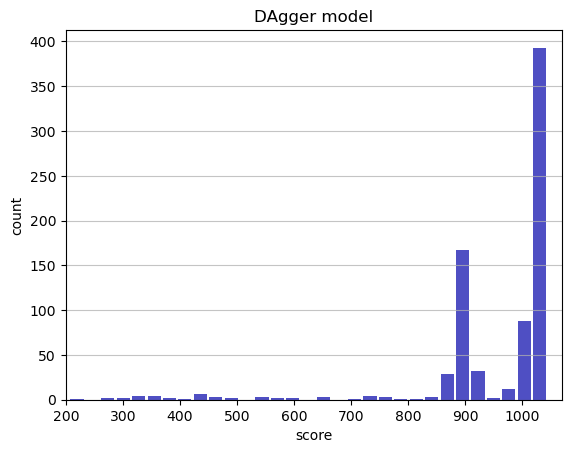

Track generation: 1224..1534 -> 310-tiles track
Epoch: 774
DAgger	mean: 953.61	variance: 135.05


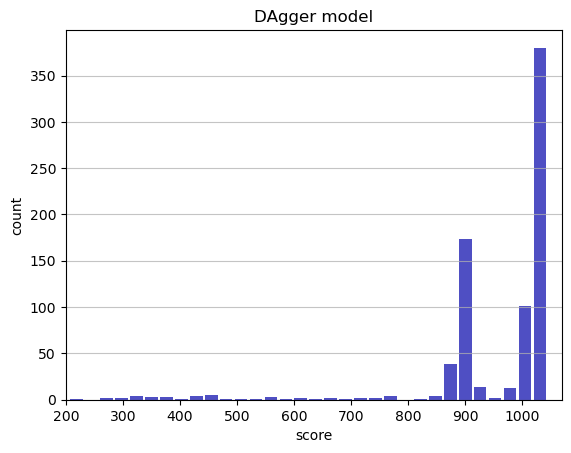

Track generation: 1288..1616 -> 328-tiles track
Epoch: 775
DAgger	mean: 952.77	variance: 136.96


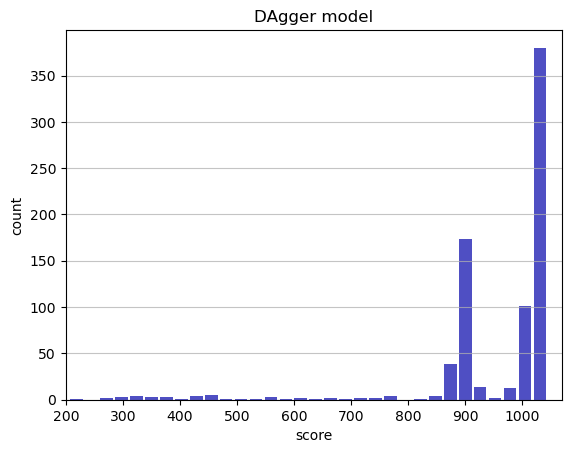

Track generation: 1094..1372 -> 278-tiles track
Epoch: 776
DAgger	mean: 952.72	variance: 136.88


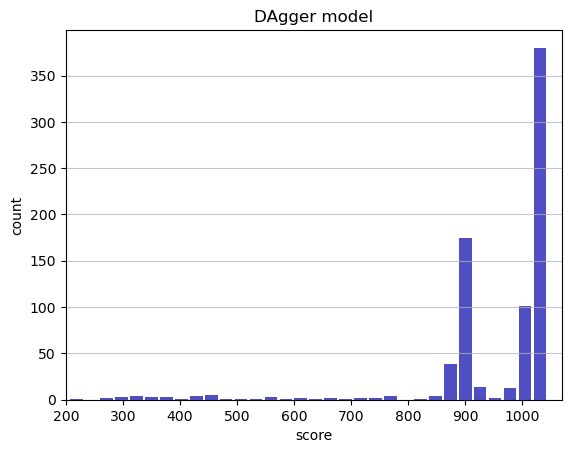

Track generation: 1173..1470 -> 297-tiles track
Epoch: 777
DAgger	mean: 952.81	variance: 136.81


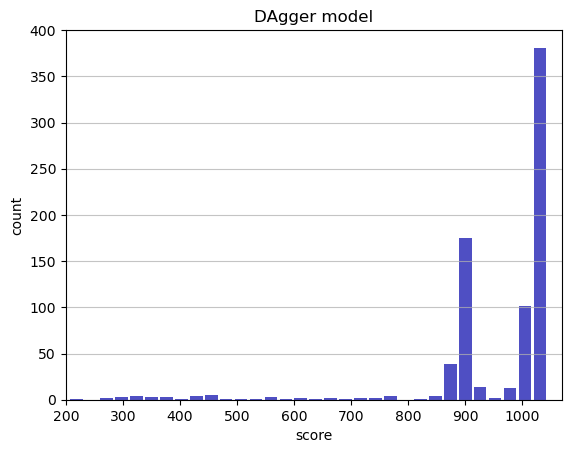

Track generation: 1148..1439 -> 291-tiles track
Epoch: 778
DAgger	mean: 952.91	variance: 136.75


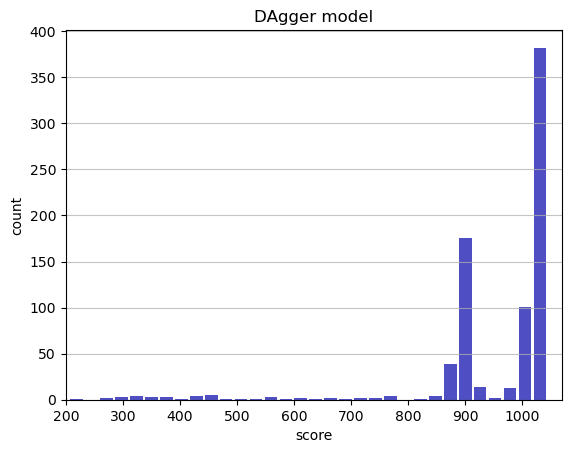

Track generation: 1291..1618 -> 327-tiles track
Epoch: 779
DAgger	mean: 952.84	variance: 136.68


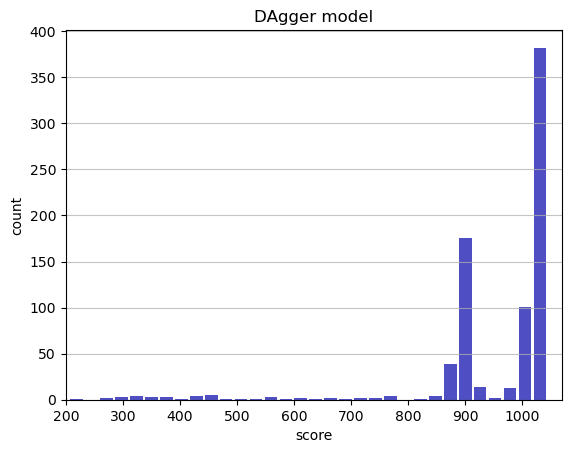

Track generation: 1012..1269 -> 257-tiles track
Epoch: 780
DAgger	mean: 952.77	variance: 136.61


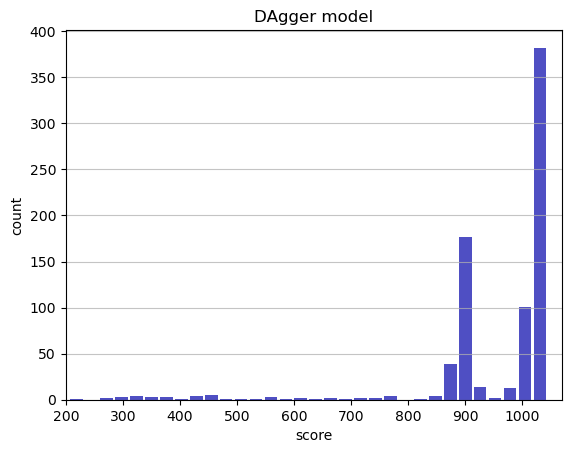

Track generation: 1256..1574 -> 318-tiles track
Epoch: 781
DAgger	mean: 952.14	variance: 137.64


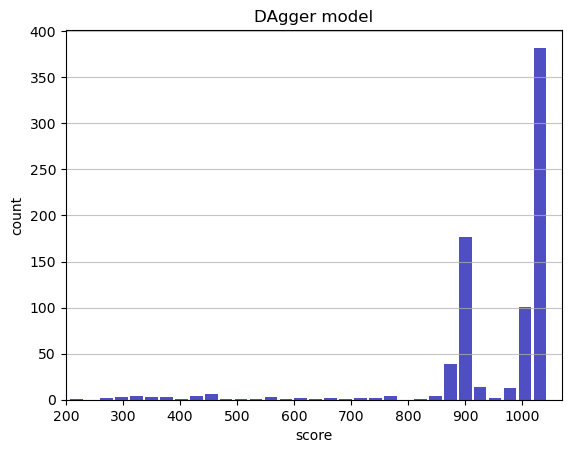

Track generation: 1010..1267 -> 257-tiles track
Epoch: 782
DAgger	mean: 952.25	variance: 137.58


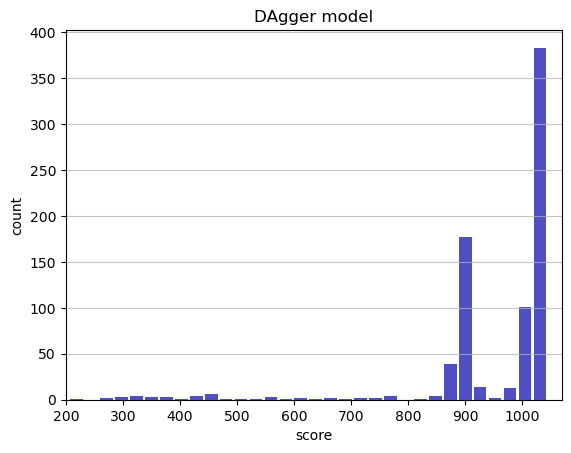

Track generation: 1092..1369 -> 277-tiles track
Epoch: 783
DAgger	mean: 952.16	variance: 137.51


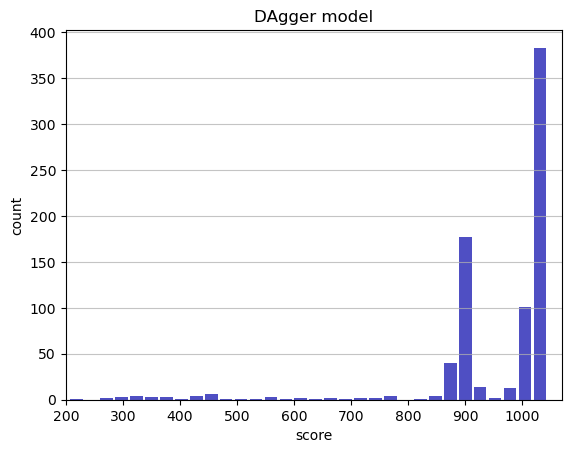

Track generation: 1253..1570 -> 317-tiles track
Epoch: 784
DAgger	mean: 952.06	variance: 137.45


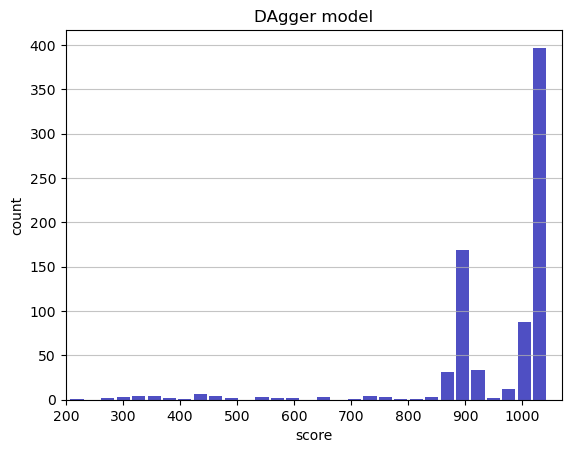

Track generation: 1191..1495 -> 304-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1079..1353 -> 274-tiles track
Epoch: 785
DAgger	mean: 951.99	variance: 137.38


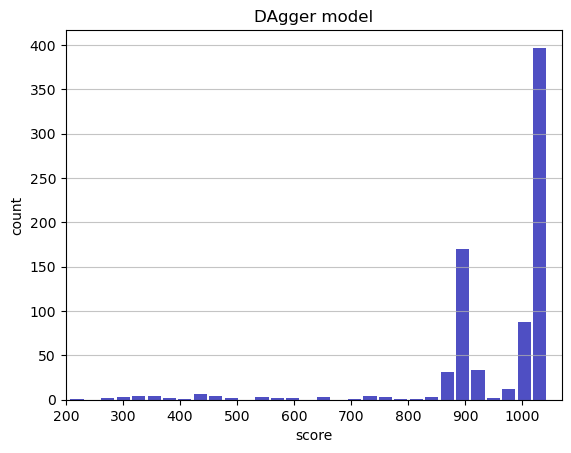

Track generation: 1220..1529 -> 309-tiles track
Epoch: 786
DAgger	mean: 952.08	variance: 137.32


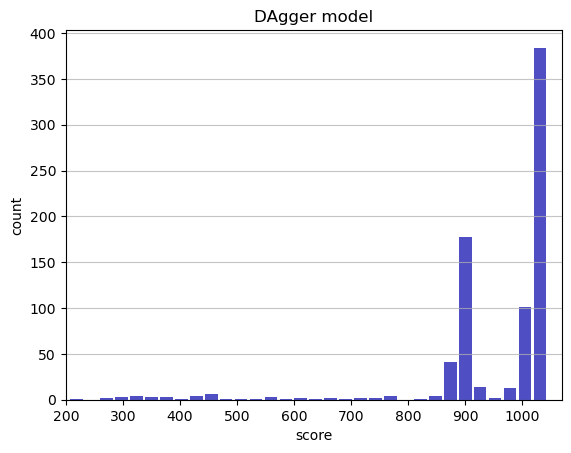

Track generation: 1067..1346 -> 279-tiles track
Epoch: 787
DAgger	mean: 952.17	variance: 137.25


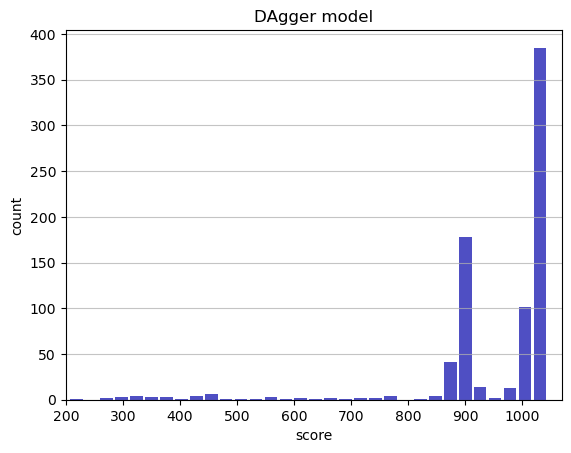

Track generation: 1259..1578 -> 319-tiles track
Epoch: 788
DAgger	mean: 952.09	variance: 137.19


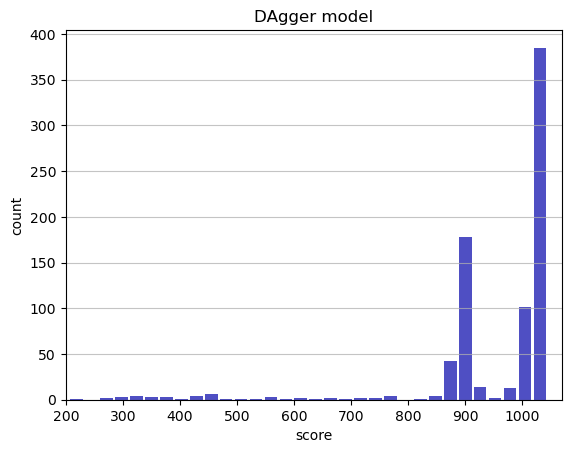

Track generation: 1144..1434 -> 290-tiles track
Epoch: 789
DAgger	mean: 952.01	variance: 137.12


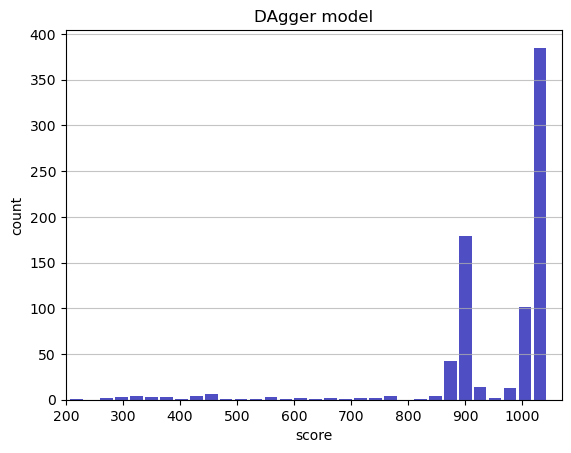

Track generation: 1079..1353 -> 274-tiles track
Epoch: 790
DAgger	mean: 952.11	variance: 137.06


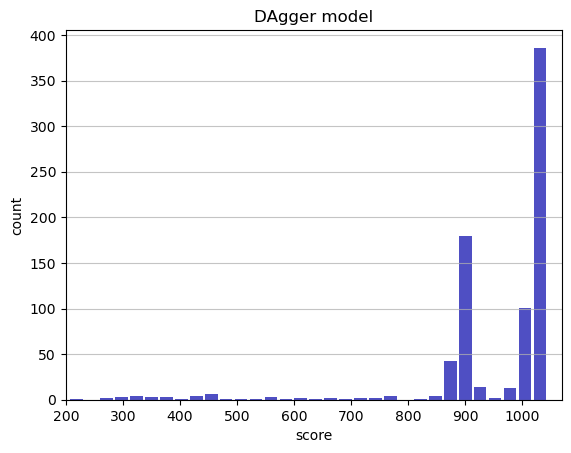

Track generation: 1212..1522 -> 310-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1086..1369 -> 283-tiles track
Epoch: 791
DAgger	mean: 951.90	variance: 137.10


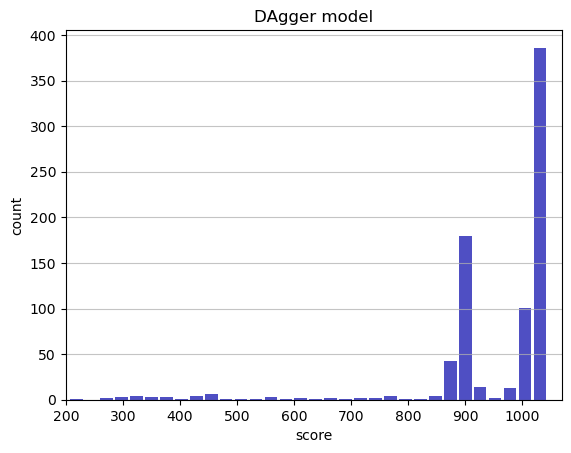

Track generation: 1225..1534 -> 309-tiles track
Epoch: 792
DAgger	mean: 951.99	variance: 137.04


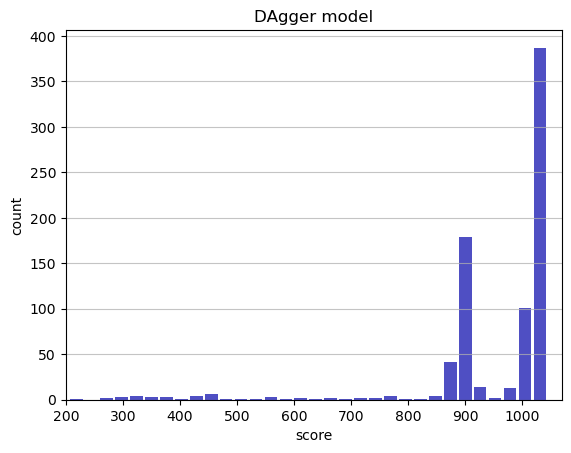

Track generation: 1079..1360 -> 281-tiles track
Epoch: 793
DAgger	mean: 952.08	variance: 136.98


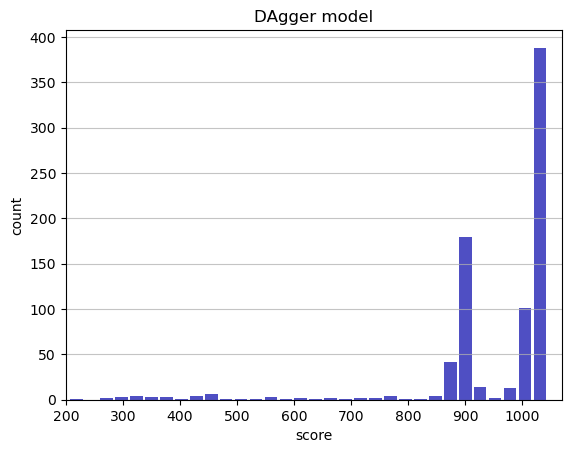

Track generation: 991..1245 -> 254-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1077..1350 -> 273-tiles track
Epoch: 794
DAgger	mean: 952.04	variance: 136.90


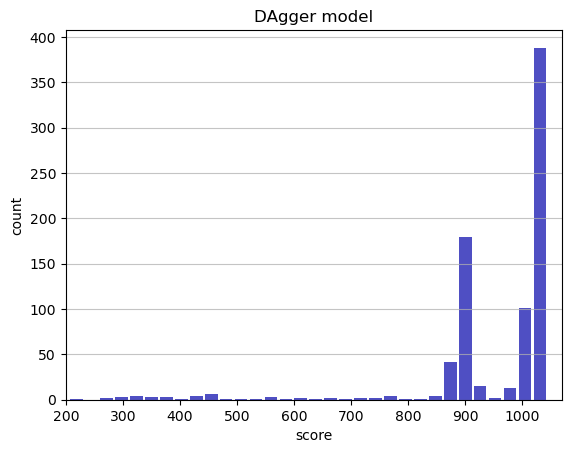

Track generation: 987..1244 -> 257-tiles track
Epoch: 795
DAgger	mean: 952.15	variance: 136.85


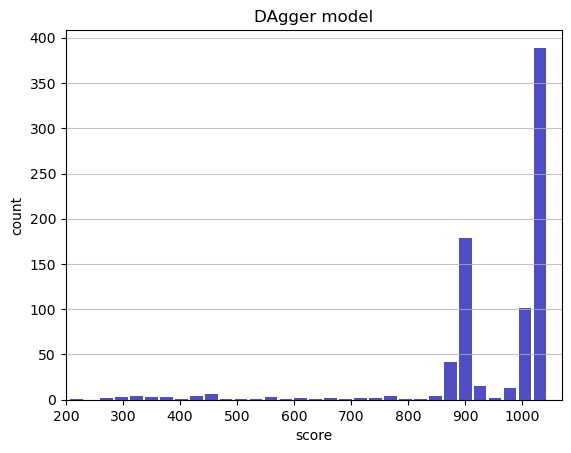

Track generation: 1091..1376 -> 285-tiles track
Epoch: 796
DAgger	mean: 952.24	variance: 136.79


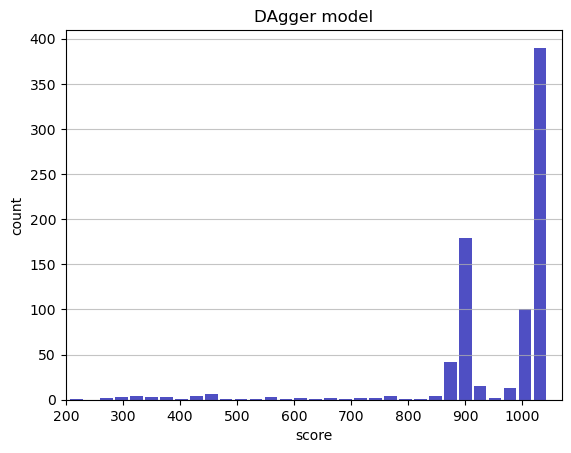

Track generation: 1224..1534 -> 310-tiles track
Epoch: 797
DAgger	mean: 952.14	variance: 136.73


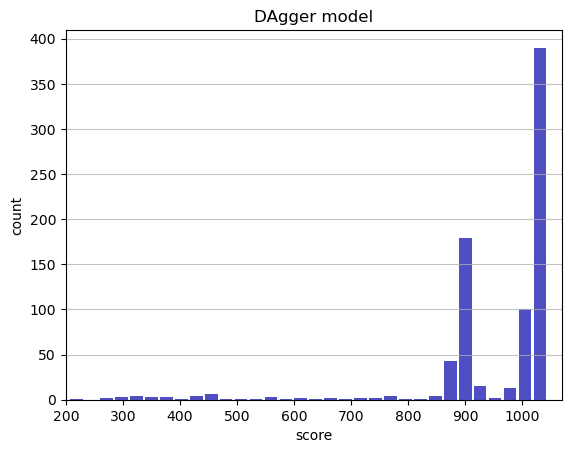

Track generation: 979..1228 -> 249-tiles track
Epoch: 798
DAgger	mean: 952.25	variance: 136.68


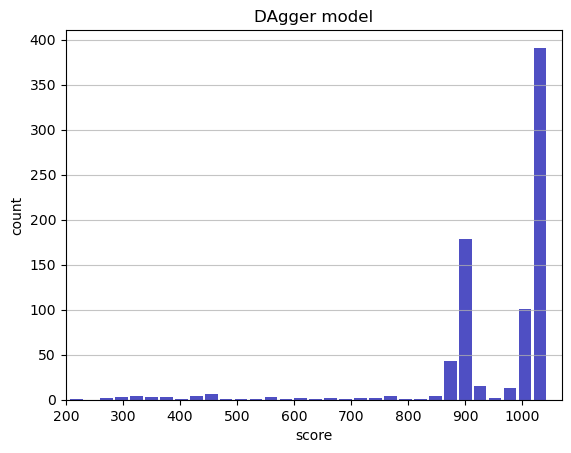

Track generation: 1301..1630 -> 329-tiles track
Epoch: 799
DAgger	mean: 952.33	variance: 136.61


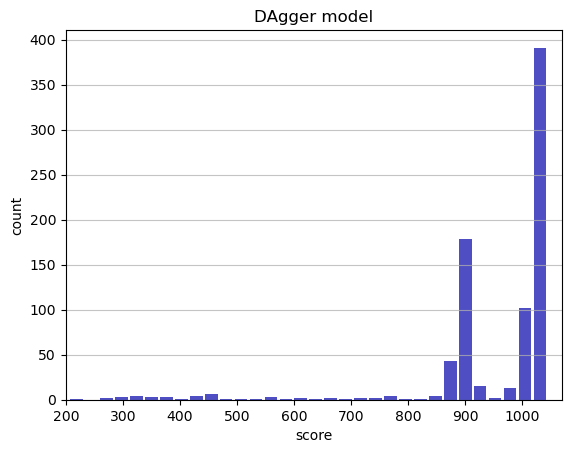

Track generation: 1335..1673 -> 338-tiles track
Epoch: 800
DAgger	mean: 952.40	variance: 136.54


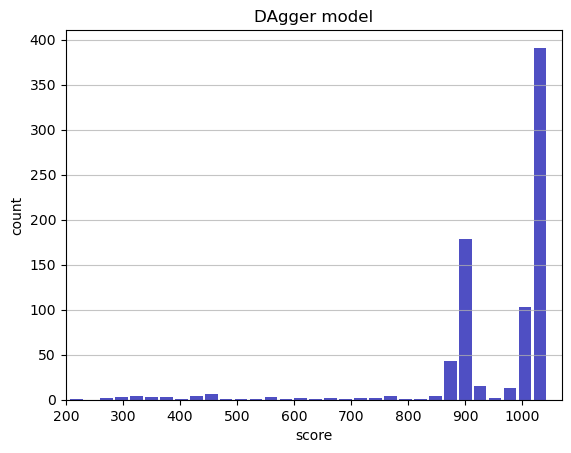

Track generation: 1134..1422 -> 288-tiles track
Epoch: 801
DAgger	mean: 952.49	variance: 136.48


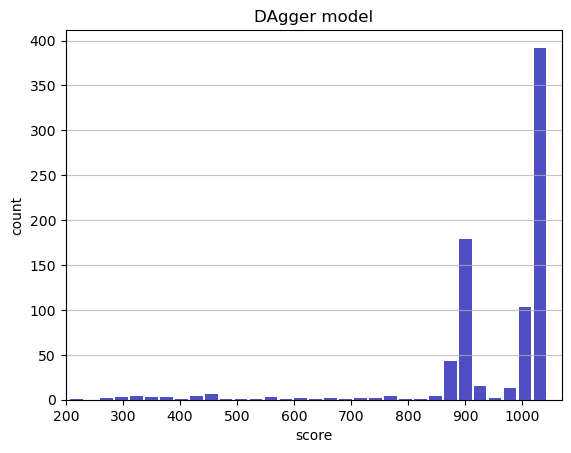

Track generation: 1231..1543 -> 312-tiles track
Epoch: 802
DAgger	mean: 952.41	variance: 136.41


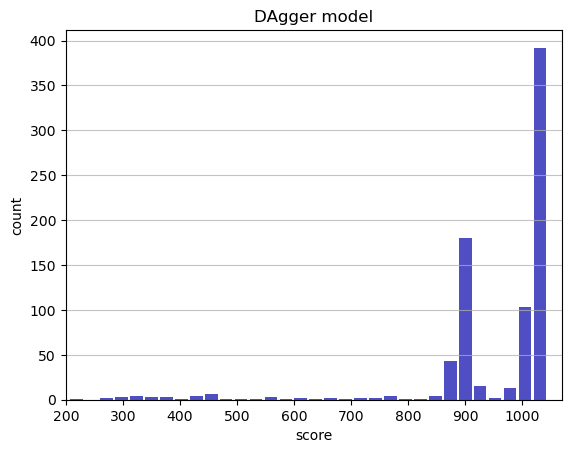

Track generation: 1004..1259 -> 255-tiles track
Epoch: 803
DAgger	mean: 952.37	variance: 136.33


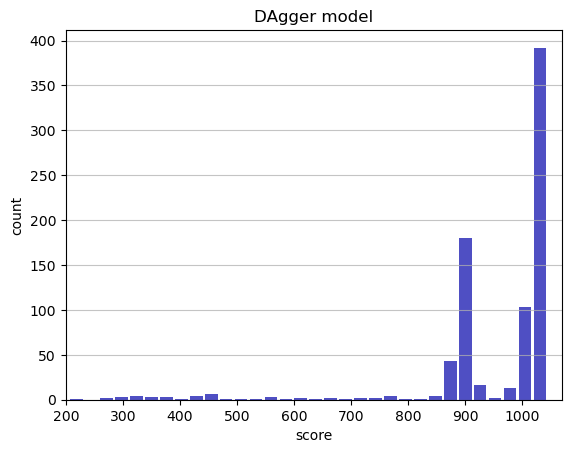

Track generation: 1139..1428 -> 289-tiles track
Epoch: 804
DAgger	mean: 952.30	variance: 136.26


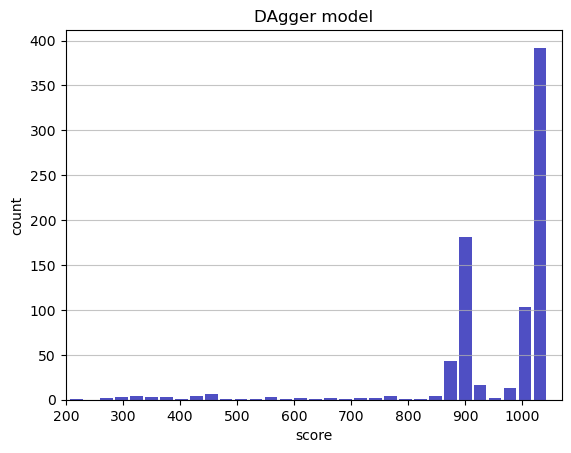

Track generation: 1221..1533 -> 312-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1042..1310 -> 268-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1117..1401 -> 284-tiles track
Epoch: 805
DAgger	mean: 952.40	variance: 136.20


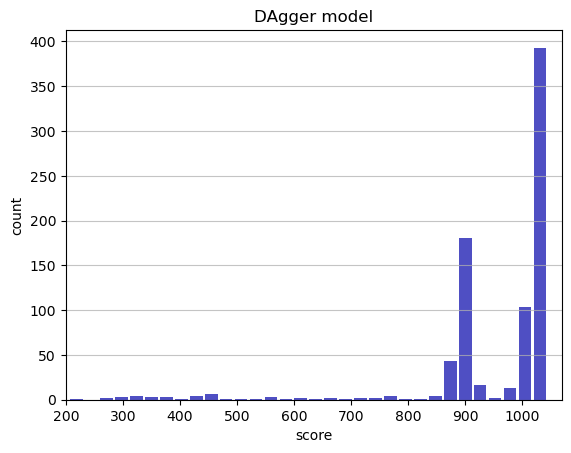

Track generation: 1350..1700 -> 350-tiles track
Epoch: 806
DAgger	mean: 952.29	variance: 136.15


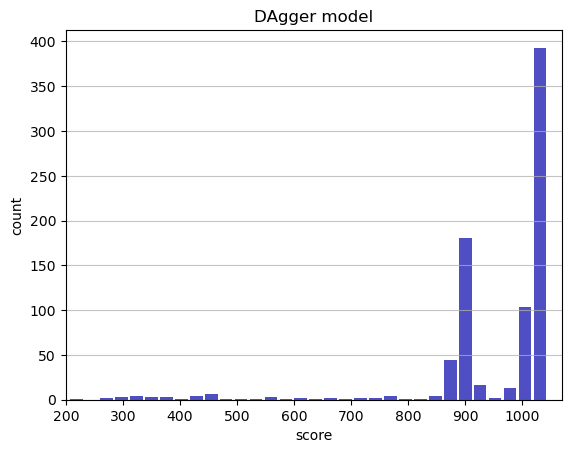

Track generation: 1043..1308 -> 265-tiles track
Epoch: 807
DAgger	mean: 951.69	variance: 137.11


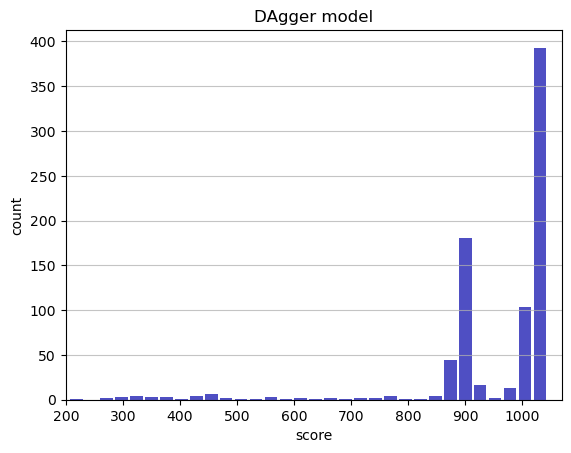

Track generation: 1126..1412 -> 286-tiles track
Epoch: 808
DAgger	mean: 951.61	variance: 137.04


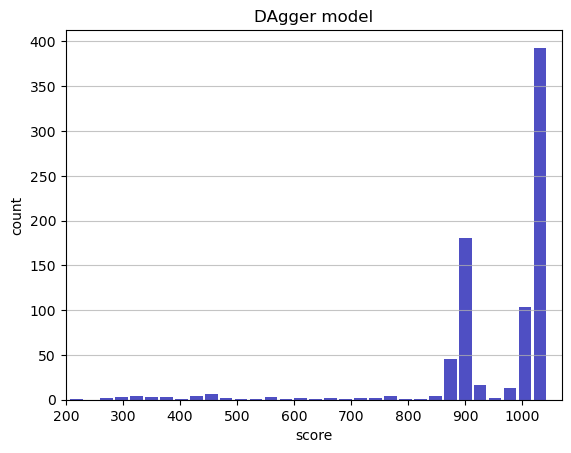

Track generation: 1180..1487 -> 307-tiles track
Epoch: 809
DAgger	mean: 951.70	variance: 136.98


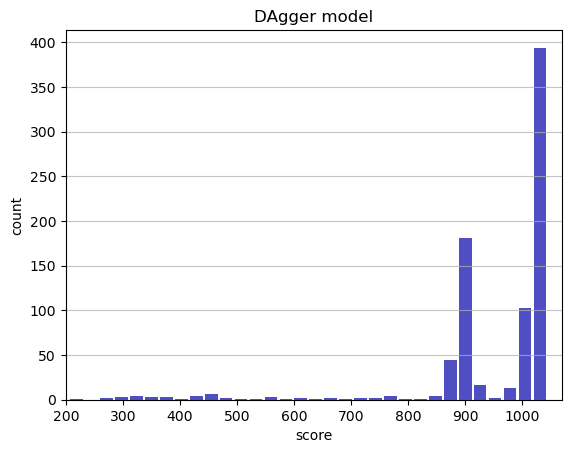

Track generation: 1149..1440 -> 291-tiles track
Epoch: 810
DAgger	mean: 951.79	variance: 136.92


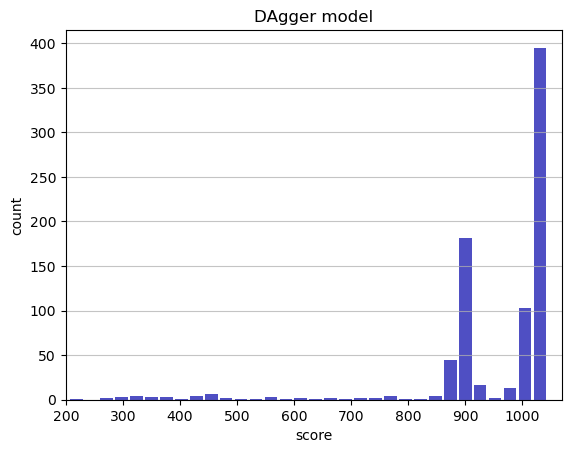

Track generation: 1134..1431 -> 297-tiles track
Epoch: 811
DAgger	mean: 951.48	variance: 137.11


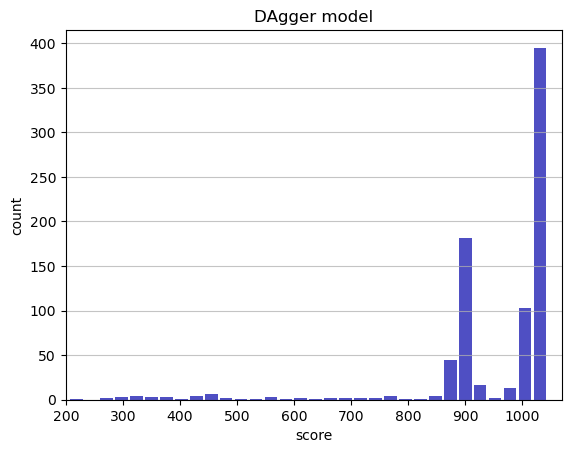

Track generation: 1279..1603 -> 324-tiles track
Epoch: 812
DAgger	mean: 951.42	variance: 137.04


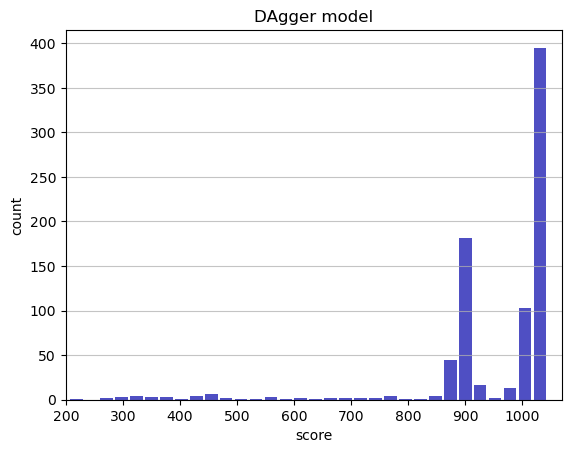

Track generation: 1111..1402 -> 291-tiles track
Epoch: 813
DAgger	mean: 951.52	variance: 136.98


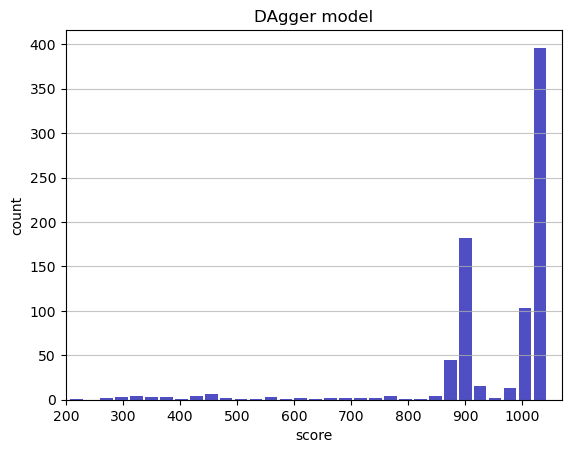

Track generation: 1156..1455 -> 299-tiles track
Epoch: 814
DAgger	mean: 951.45	variance: 136.91


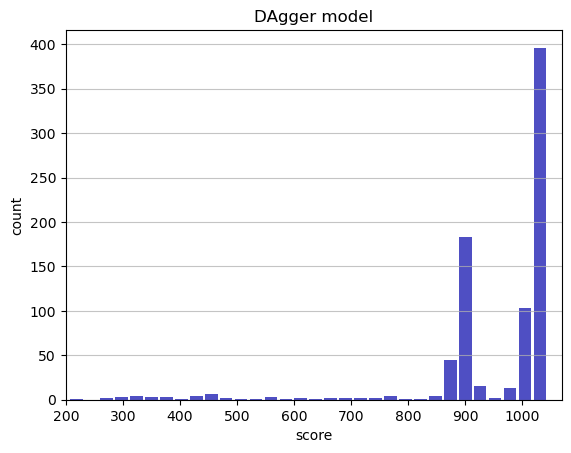

Track generation: 1288..1622 -> 334-tiles track
Epoch: 815
DAgger	mean: 951.52	variance: 136.84


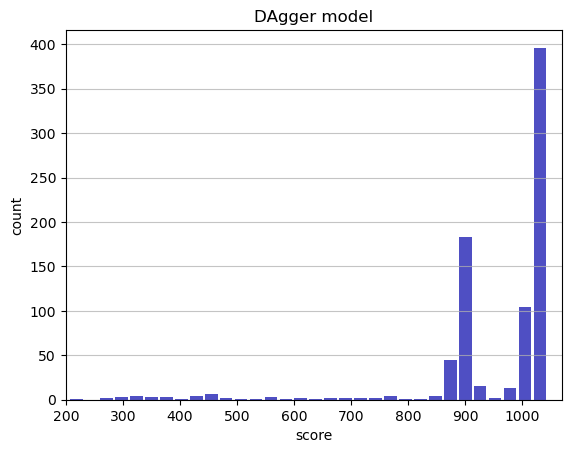

Track generation: 1331..1669 -> 338-tiles track
Epoch: 816
DAgger	mean: 951.59	variance: 136.77


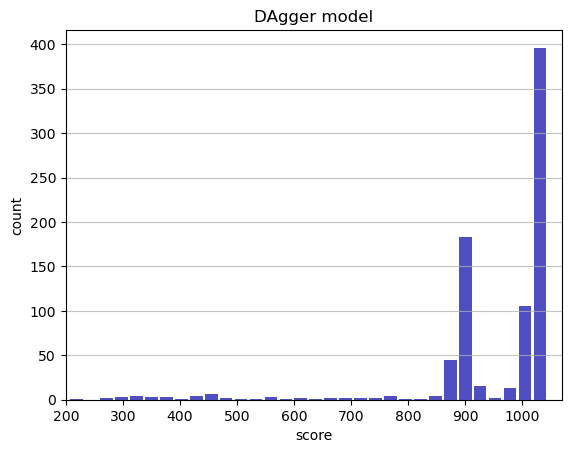

Track generation: 1124..1409 -> 285-tiles track
Epoch: 817
DAgger	mean: 951.53	variance: 136.70


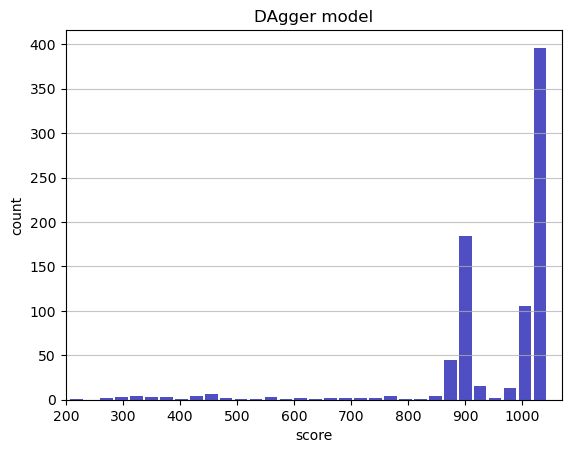

Track generation: 1220..1529 -> 309-tiles track
Epoch: 818
DAgger	mean: 951.61	variance: 136.64


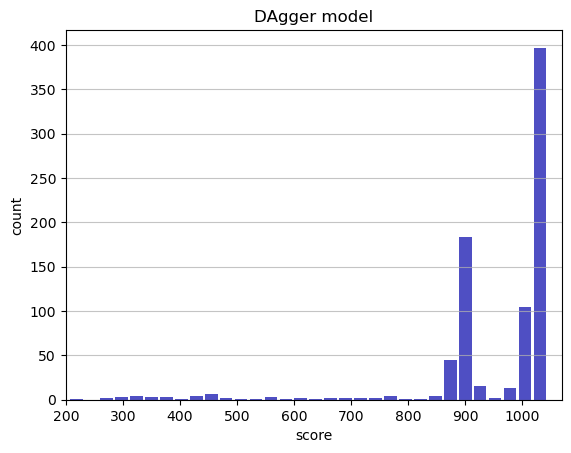

Track generation: 1186..1493 -> 307-tiles track
Epoch: 819
DAgger	mean: 951.55	variance: 136.57


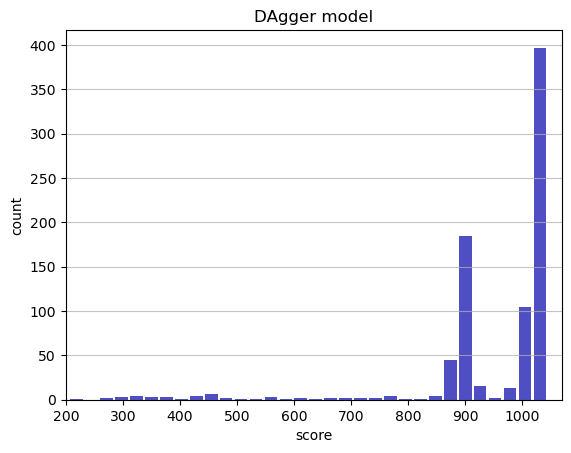

Track generation: 1176..1474 -> 298-tiles track
Epoch: 820
DAgger	mean: 951.49	variance: 136.49


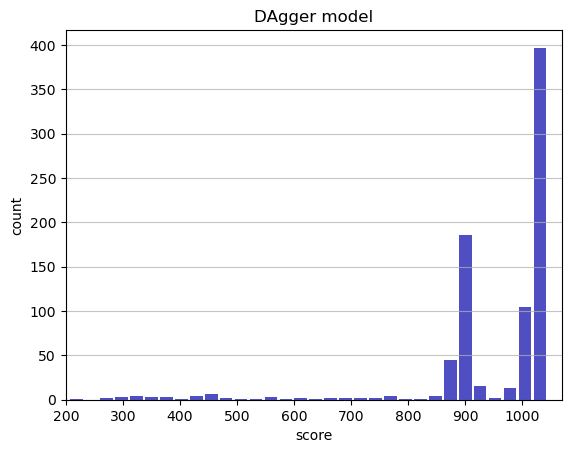

Track generation: 1079..1361 -> 282-tiles track
Epoch: 821
DAgger	mean: 951.58	variance: 136.44


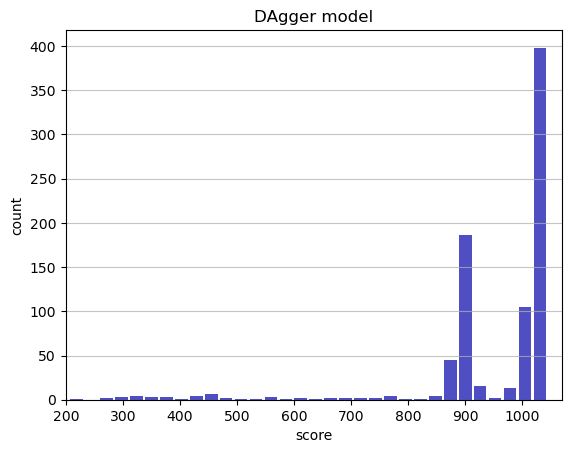

Track generation: 1213..1520 -> 307-tiles track
Epoch: 822
DAgger	mean: 951.67	variance: 136.38


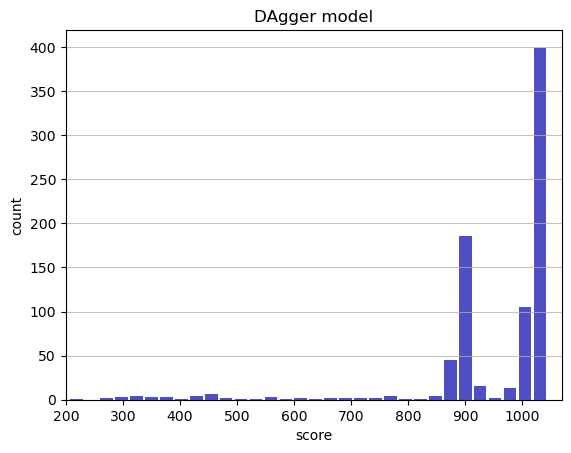

Track generation: 1116..1399 -> 283-tiles track
Epoch: 823
DAgger	mean: 951.76	variance: 136.32


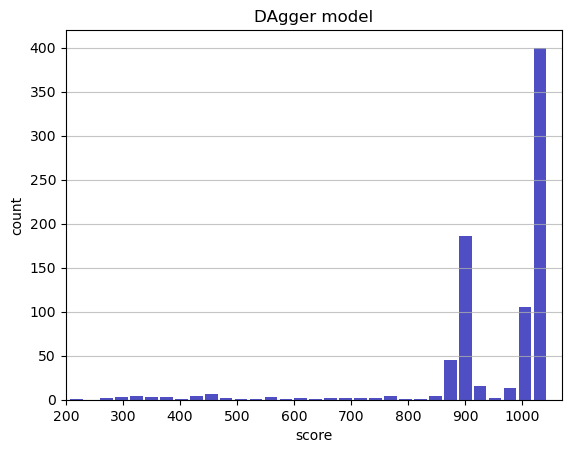

Track generation: 1179..1486 -> 307-tiles track
Epoch: 824
DAgger	mean: 951.69	variance: 136.25


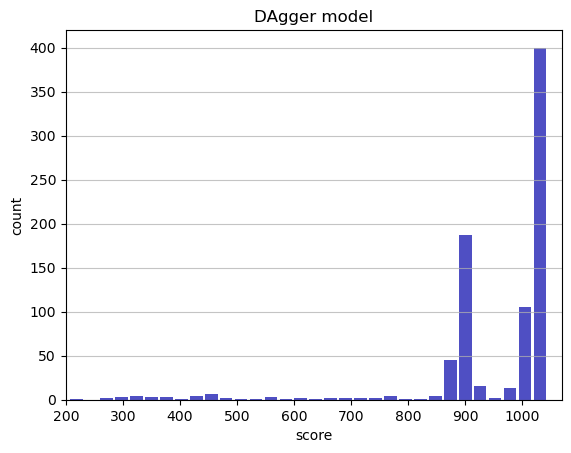

Track generation: 1135..1427 -> 292-tiles track
Epoch: 825
DAgger	mean: 951.63	variance: 136.18


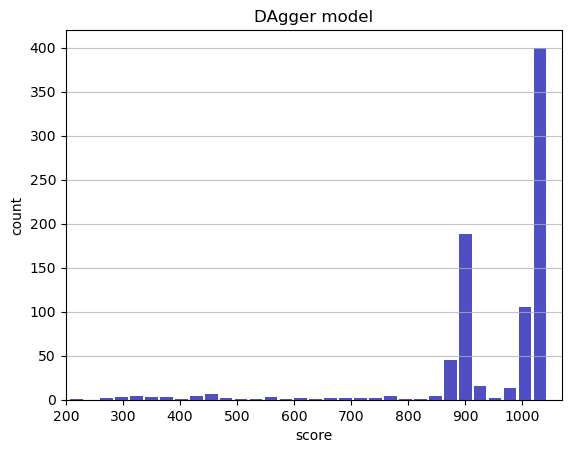

Track generation: 1055..1323 -> 268-tiles track
Epoch: 826
DAgger	mean: 951.73	variance: 136.13


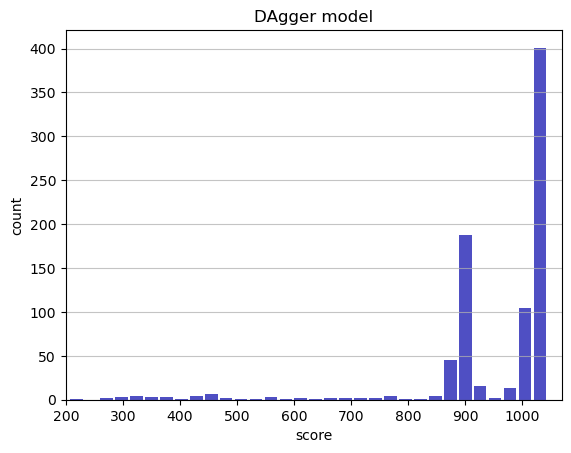

Track generation: 1036..1299 -> 263-tiles track
Epoch: 827
DAgger	mean: 951.83	variance: 136.07


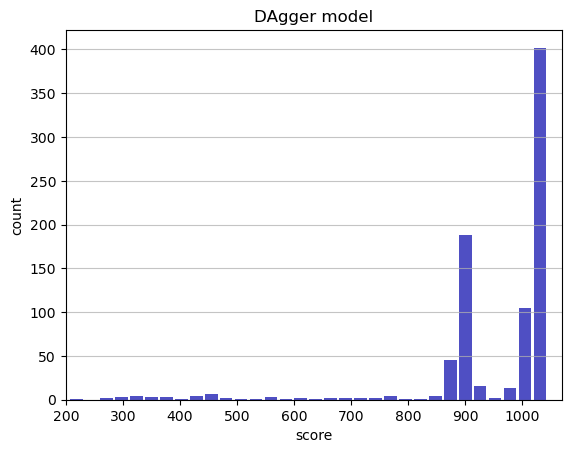

Track generation: 1139..1435 -> 296-tiles track
Epoch: 828
DAgger	mean: 951.77	variance: 136.00


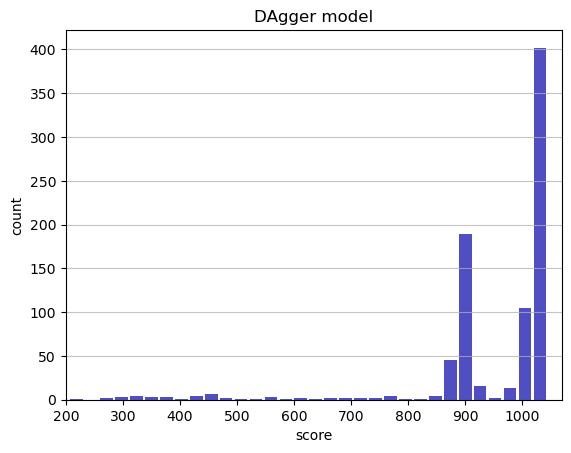

Track generation: 1047..1313 -> 266-tiles track
Epoch: 829
DAgger	mean: 951.87	variance: 135.95


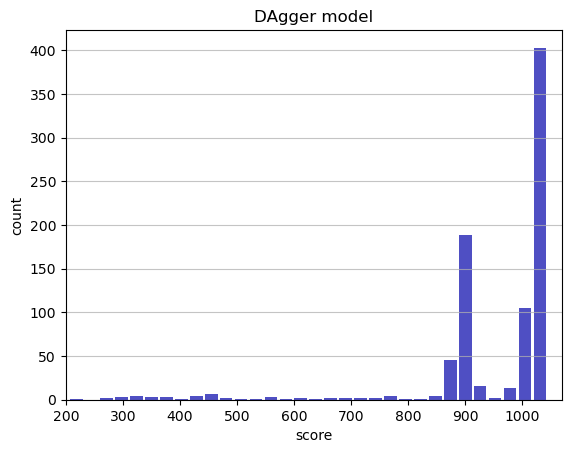

Track generation: 1052..1319 -> 267-tiles track
Epoch: 830
DAgger	mean: 951.82	variance: 135.87


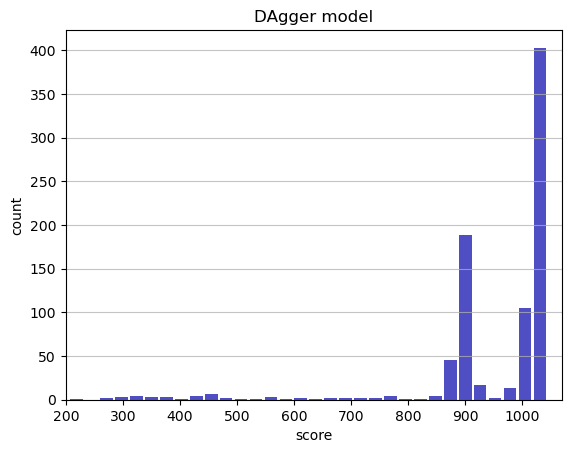

Track generation: 1060..1332 -> 272-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1215..1523 -> 308-tiles track
Epoch: 831
DAgger	mean: 951.70	variance: 135.83


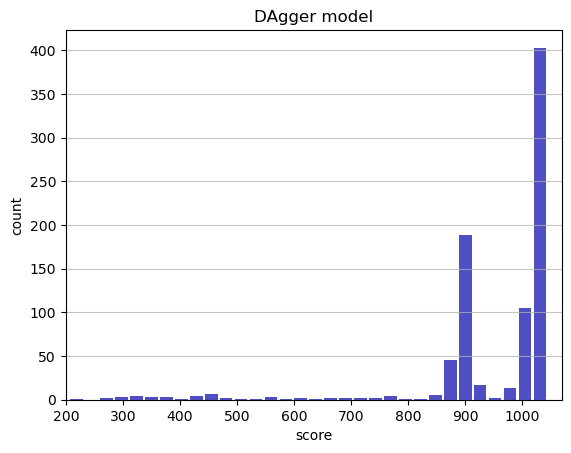

Track generation: 1246..1570 -> 324-tiles track
Epoch: 832
DAgger	mean: 951.77	variance: 135.77


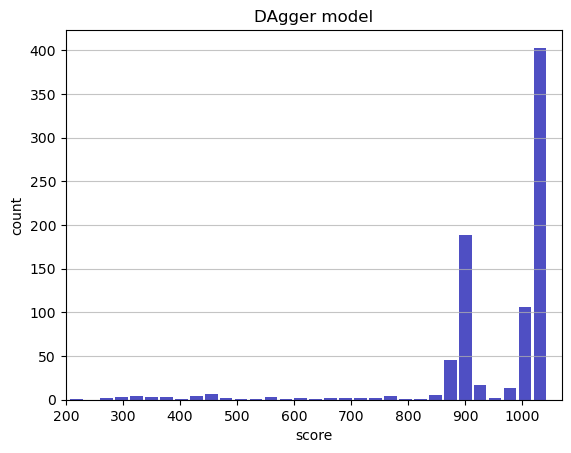

Track generation: 1147..1438 -> 291-tiles track
Epoch: 833
DAgger	mean: 951.86	variance: 135.71


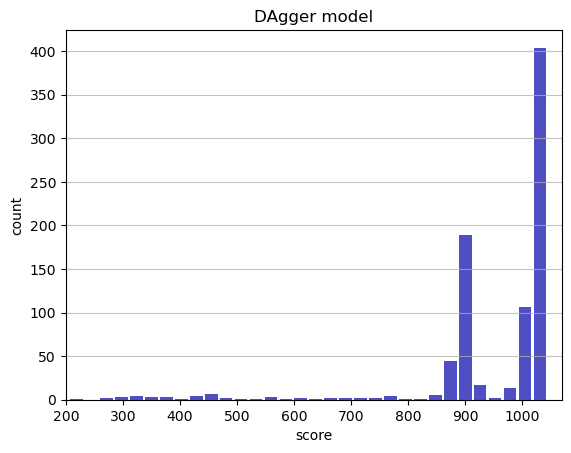

Track generation: 1199..1502 -> 303-tiles track
Epoch: 834
DAgger	mean: 951.94	variance: 135.65


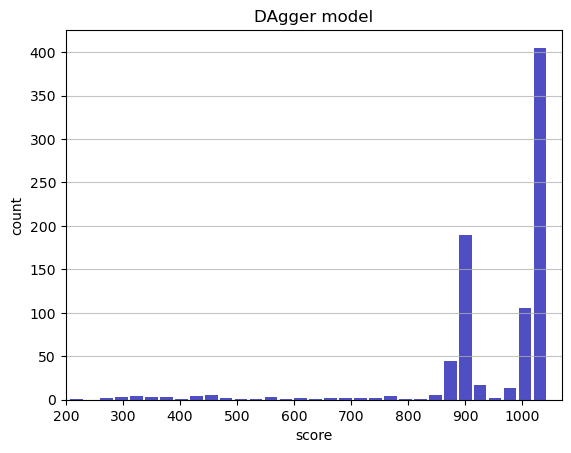

Track generation: 1359..1703 -> 344-tiles track
Epoch: 835
DAgger	mean: 952.01	variance: 135.58


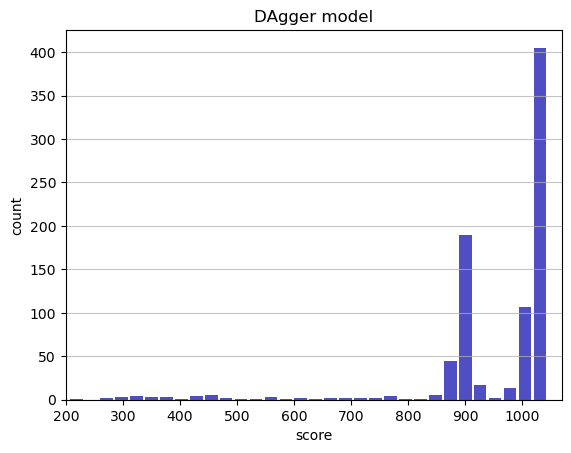

Track generation: 1271..1593 -> 322-tiles track
Epoch: 836
DAgger	mean: 952.09	variance: 135.52


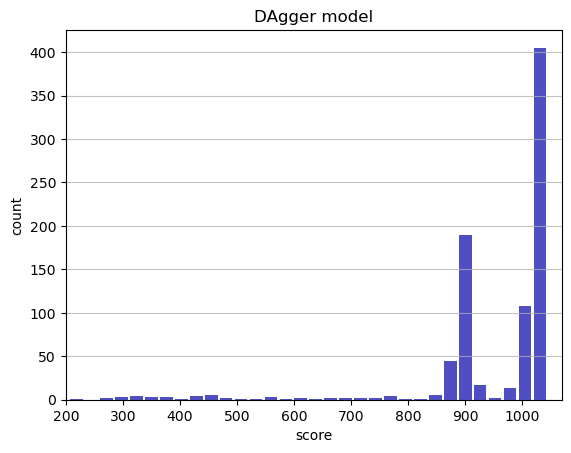

Track generation: 1196..1499 -> 303-tiles track
Epoch: 837
DAgger	mean: 952.02	variance: 135.45


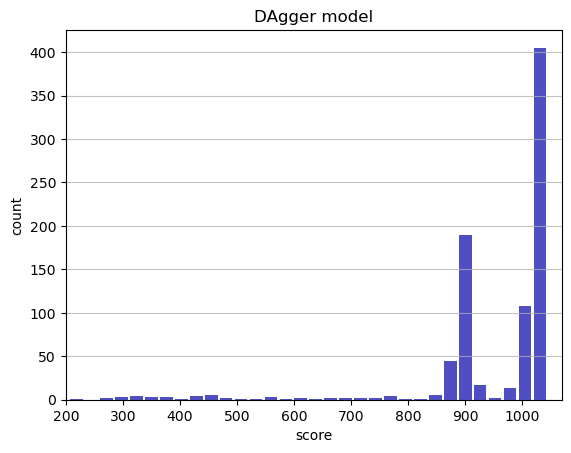

Track generation: 1296..1624 -> 328-tiles track
Epoch: 838
DAgger	mean: 951.95	variance: 135.38


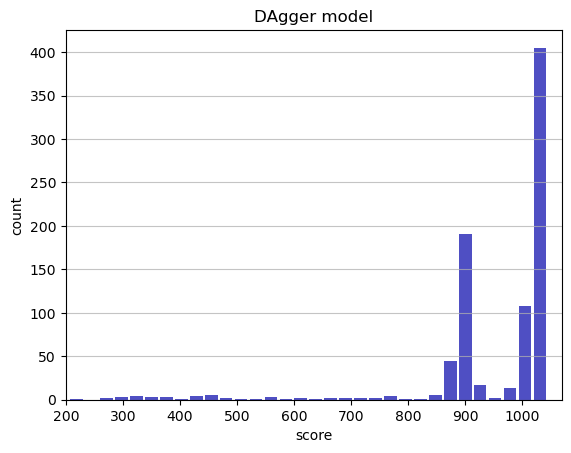

Track generation: 1124..1415 -> 291-tiles track
Epoch: 839
DAgger	mean: 952.04	variance: 135.33


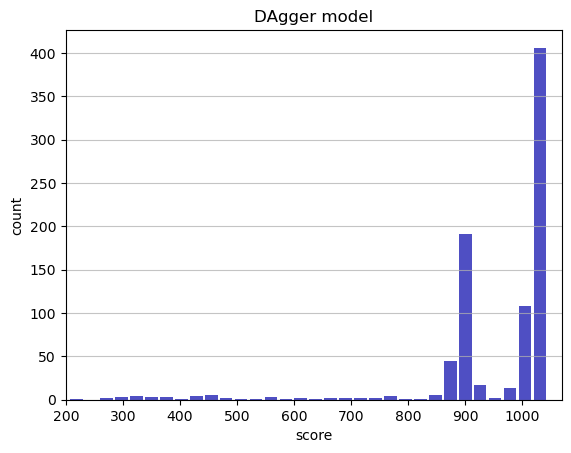

Track generation: 1208..1514 -> 306-tiles track
Epoch: 840
DAgger	mean: 952.13	variance: 135.27


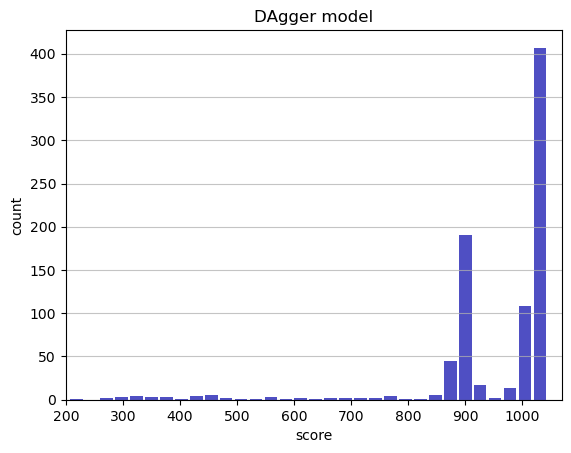

Track generation: 1180..1479 -> 299-tiles track
Epoch: 841
DAgger	mean: 952.21	variance: 135.21


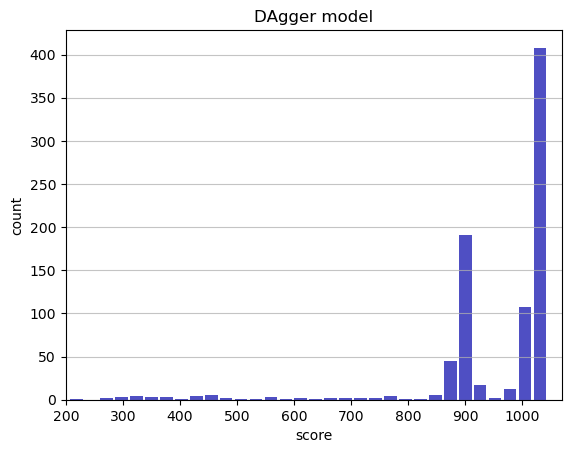

Track generation: 1087..1369 -> 282-tiles track
Epoch: 842
DAgger	mean: 952.14	variance: 135.14


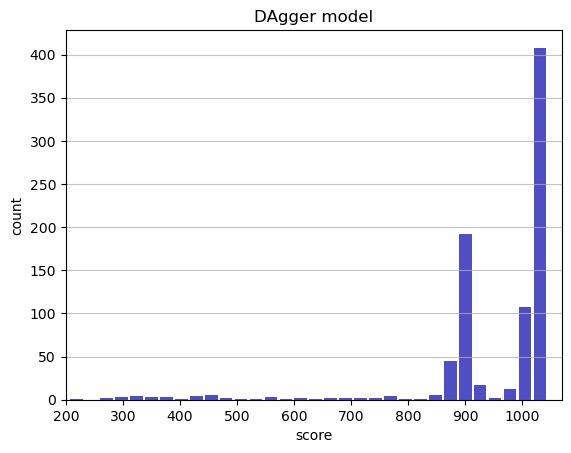

Track generation: 1079..1353 -> 274-tiles track
Epoch: 843
DAgger	mean: 952.08	variance: 135.07


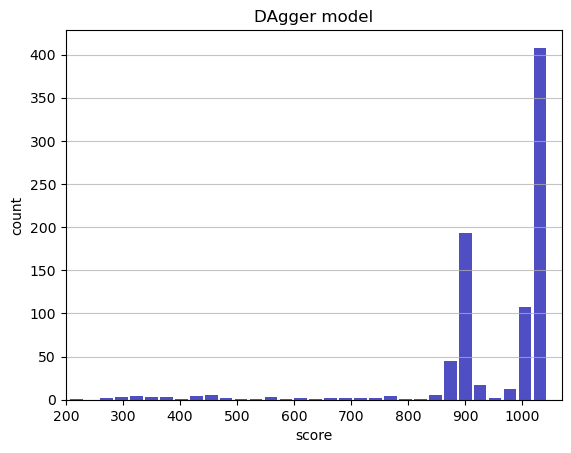

Track generation: 1184..1484 -> 300-tiles track
Epoch: 844
DAgger	mean: 952.17	variance: 135.02


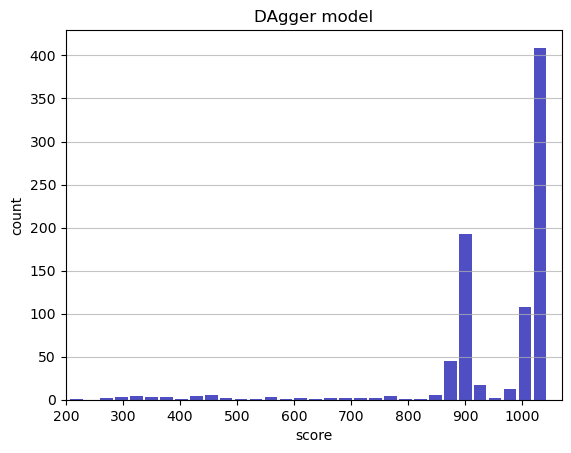

Track generation: 1079..1353 -> 274-tiles track
Epoch: 845
DAgger	mean: 951.63	variance: 135.84


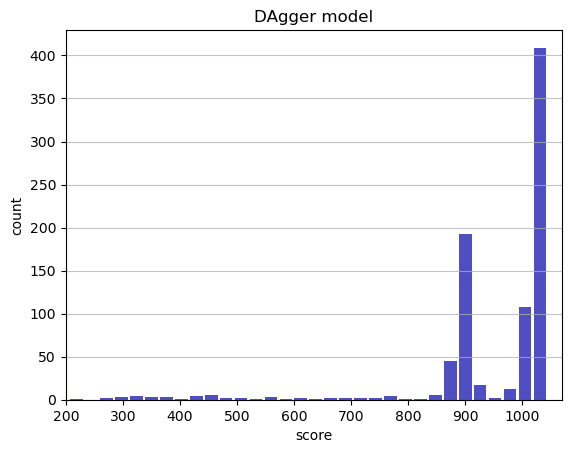

Track generation: 1215..1523 -> 308-tiles track
Epoch: 846
DAgger	mean: 951.34	variance: 136.02


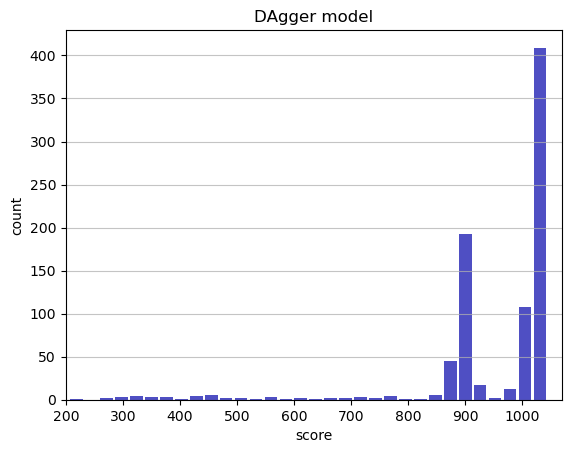

Track generation: 1191..1493 -> 302-tiles track
Epoch: 847
DAgger	mean: 951.28	variance: 135.95


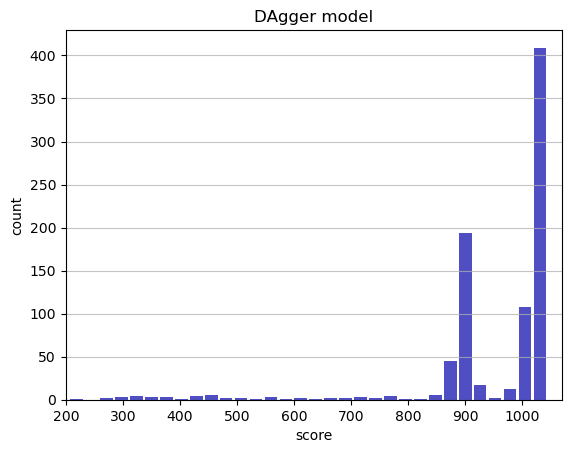

Track generation: 1215..1523 -> 308-tiles track
Epoch: 848
DAgger	mean: 951.22	variance: 135.88


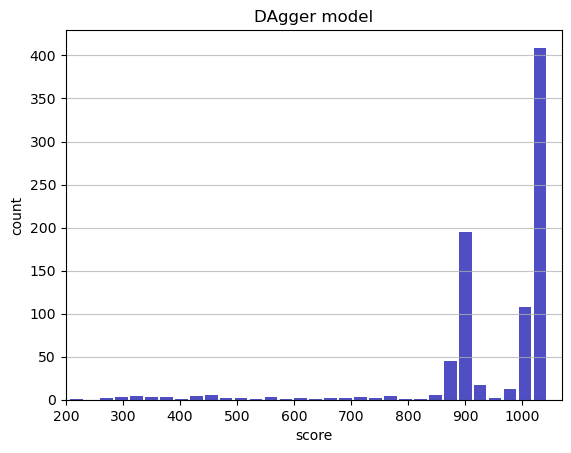

Track generation: 1115..1398 -> 283-tiles track
Epoch: 849
DAgger	mean: 951.31	variance: 135.83


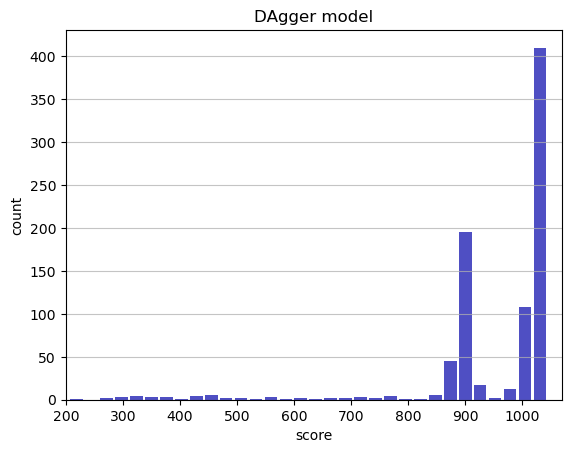

Track generation: 1150..1441 -> 291-tiles track
Epoch: 850
DAgger	mean: 950.78	variance: 136.63


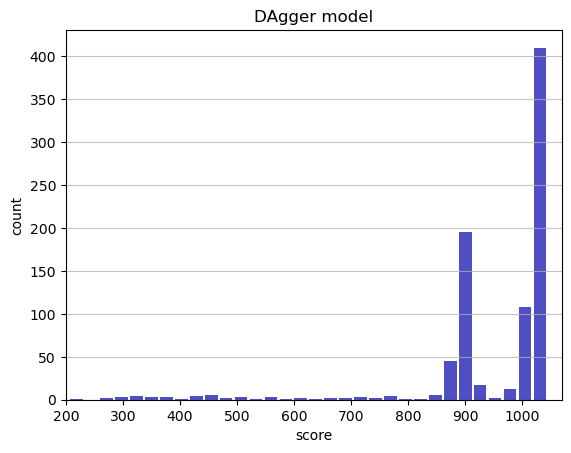

Track generation: 1162..1457 -> 295-tiles track
Epoch: 851
DAgger	mean: 950.86	variance: 136.57


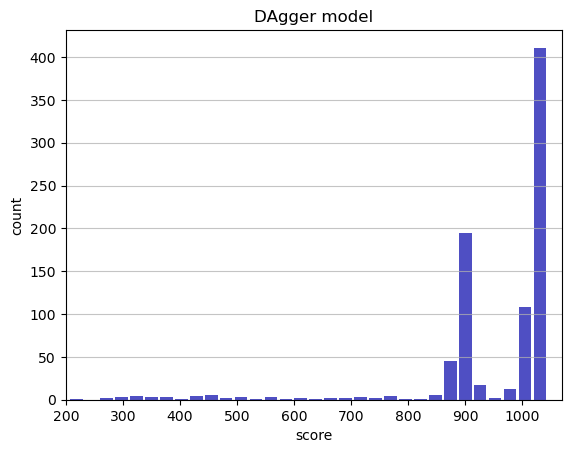

Track generation: 990..1250 -> 260-tiles track
Epoch: 852
DAgger	mean: 950.96	variance: 136.52


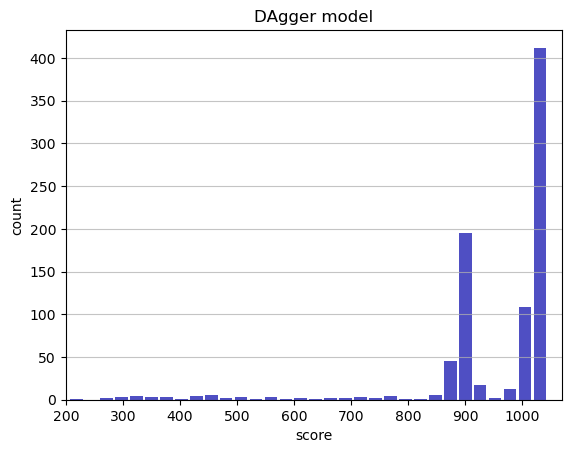

Track generation: 1112..1394 -> 282-tiles track
Epoch: 853
DAgger	mean: 951.06	variance: 136.48


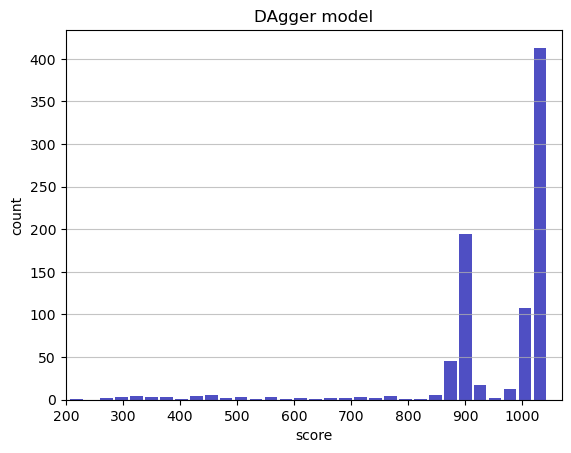

Track generation: 1307..1638 -> 331-tiles track
Epoch: 854
DAgger	mean: 951.09	variance: 136.40


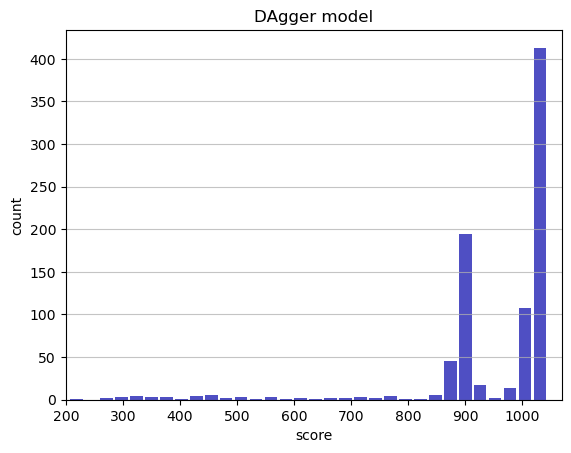

Track generation: 1365..1710 -> 345-tiles track
Epoch: 855
DAgger	mean: 951.11	variance: 136.32


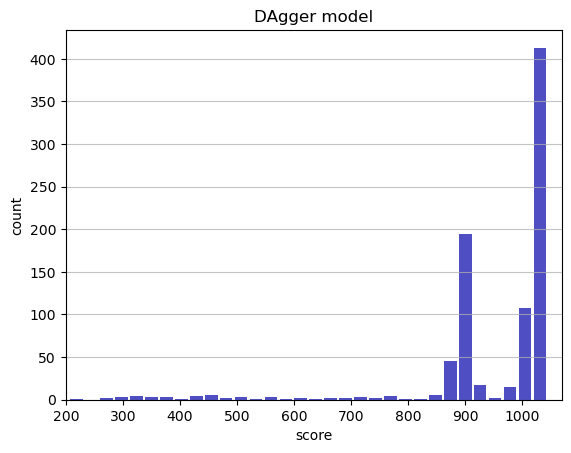

Track generation: 1191..1493 -> 302-tiles track
Epoch: 856
DAgger	mean: 951.04	variance: 136.26


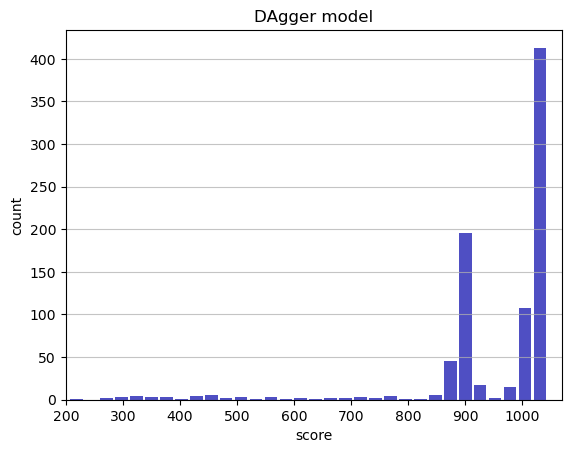

Track generation: 880..1109 -> 229-tiles track
Epoch: 857
DAgger	mean: 951.14	variance: 136.21


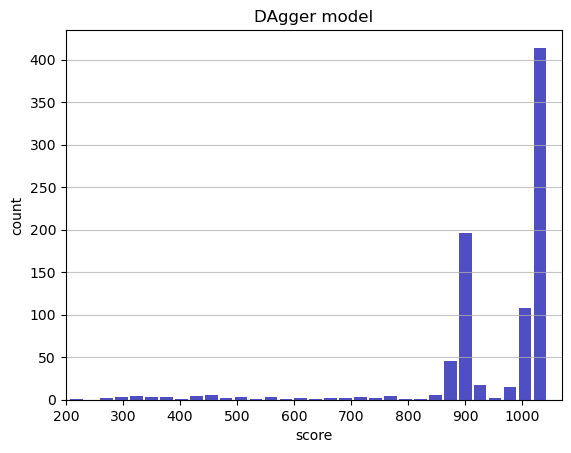

Track generation: 1050..1321 -> 271-tiles track
Epoch: 858
DAgger	mean: 951.24	variance: 136.16


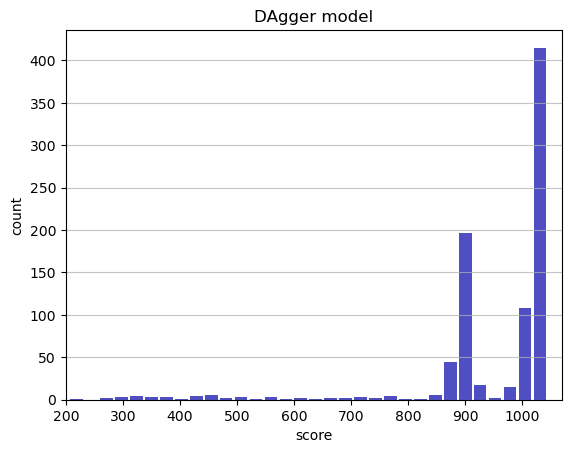

Track generation: 1184..1484 -> 300-tiles track
Epoch: 859
DAgger	mean: 951.32	variance: 136.10


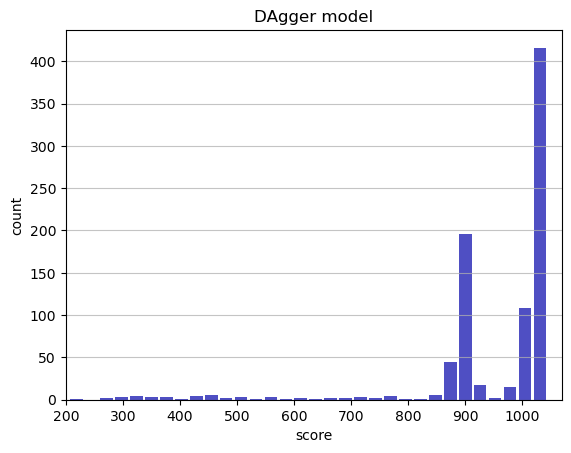

Track generation: 1192..1494 -> 302-tiles track
Epoch: 860
DAgger	mean: 951.41	variance: 136.05


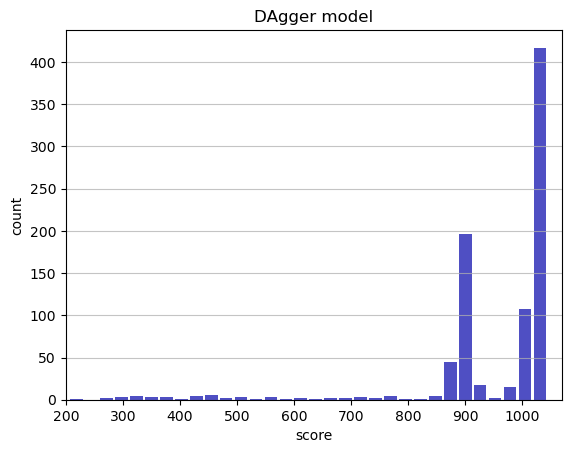

Track generation: 1130..1417 -> 287-tiles track
Epoch: 861
DAgger	mean: 951.49	variance: 135.99


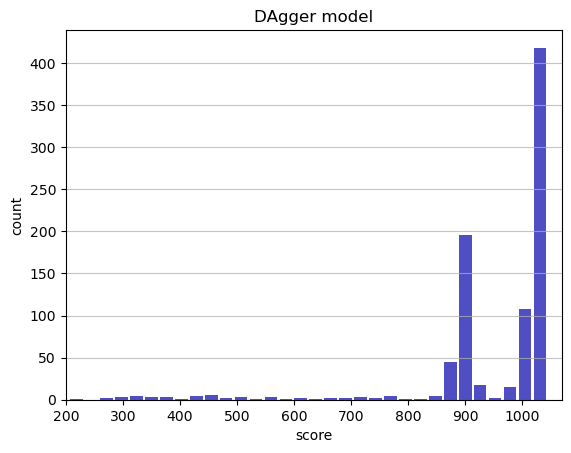

Track generation: 1104..1384 -> 280-tiles track
Epoch: 862
DAgger	mean: 951.45	variance: 135.91


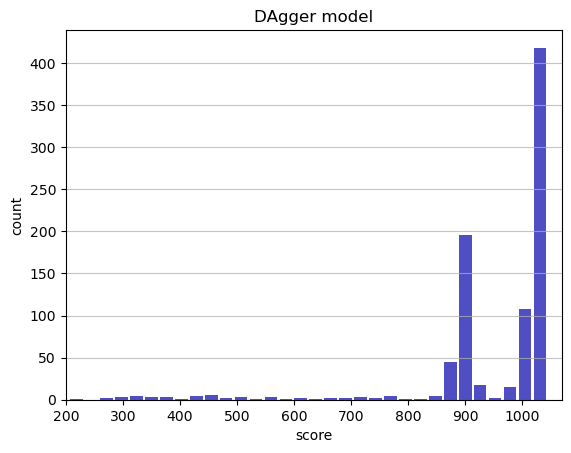

Track generation: 1002..1263 -> 261-tiles track
Epoch: 863
DAgger	mean: 951.54	variance: 135.86


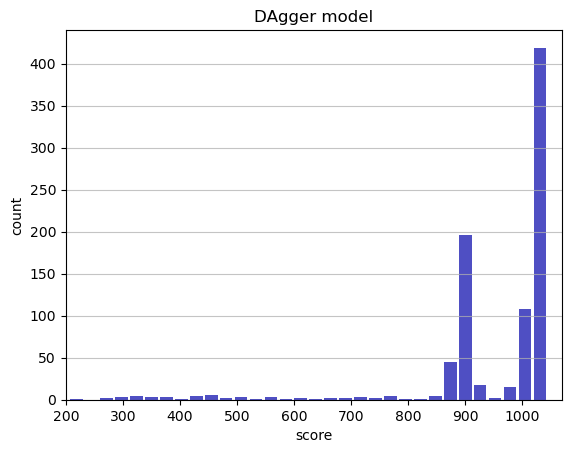

Track generation: 1081..1355 -> 274-tiles track
Epoch: 864
DAgger	mean: 951.63	variance: 135.81


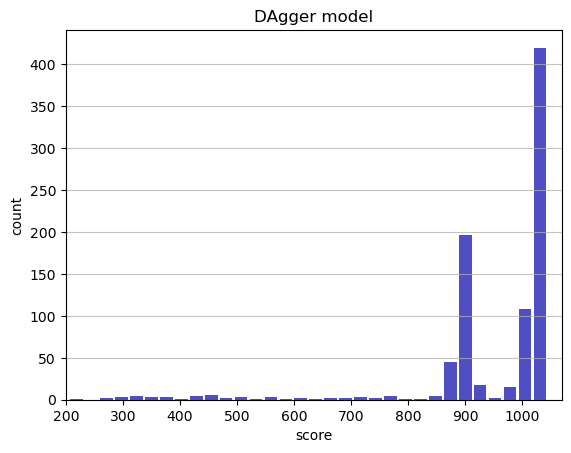

Track generation: 1214..1521 -> 307-tiles track
Epoch: 865
DAgger	mean: 951.71	variance: 135.75


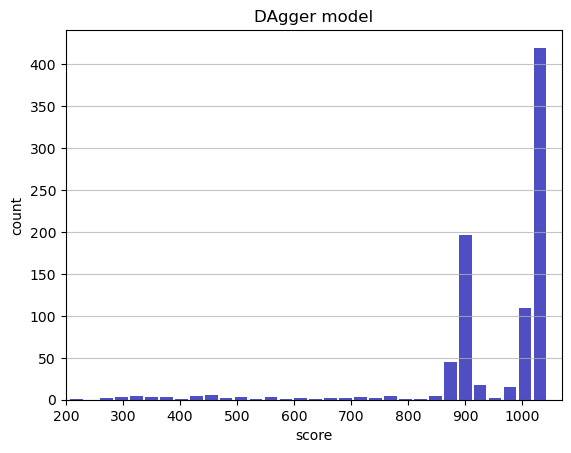

Track generation: 1160..1459 -> 299-tiles track
Epoch: 866
DAgger	mean: 951.79	variance: 135.69


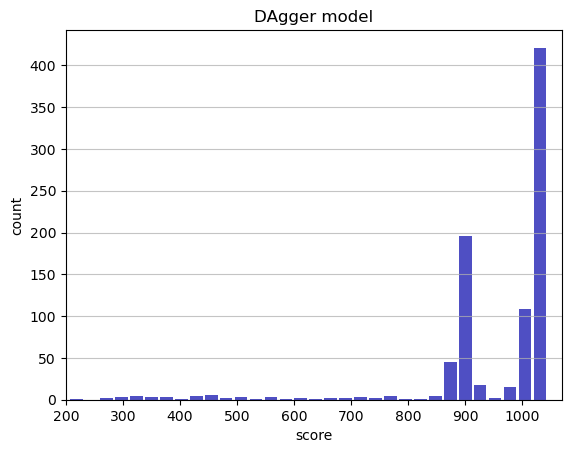

Track generation: 1083..1358 -> 275-tiles track
Epoch: 867
DAgger	mean: 951.89	variance: 135.64


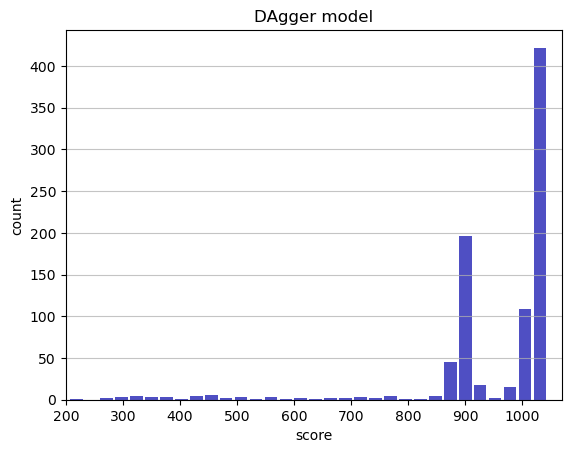

Track generation: 1199..1500 -> 301-tiles track
Epoch: 868
DAgger	mean: 951.97	variance: 135.59


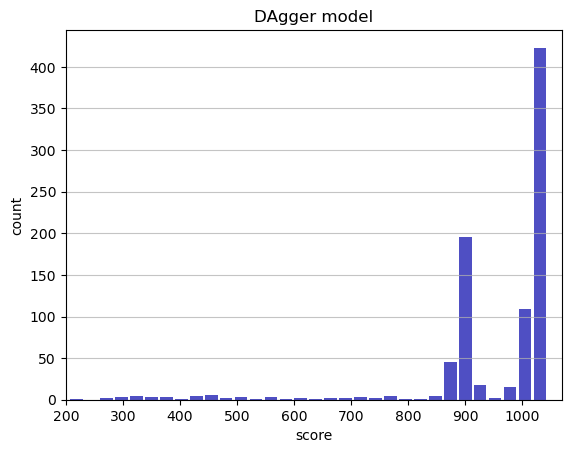

Track generation: 1039..1303 -> 264-tiles track
Epoch: 869
DAgger	mean: 952.06	variance: 135.54


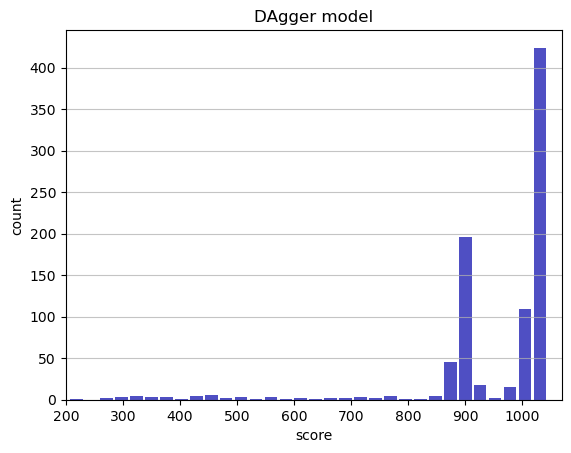

Track generation: 1200..1504 -> 304-tiles track
Epoch: 870
DAgger	mean: 952.14	variance: 135.48


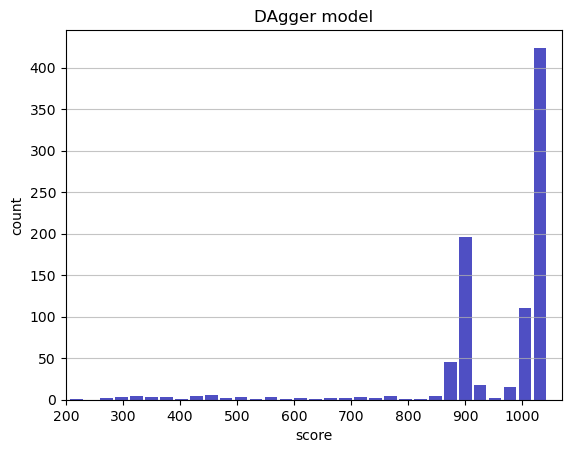

Track generation: 1071..1343 -> 272-tiles track
Epoch: 871
DAgger	mean: 952.08	variance: 135.41


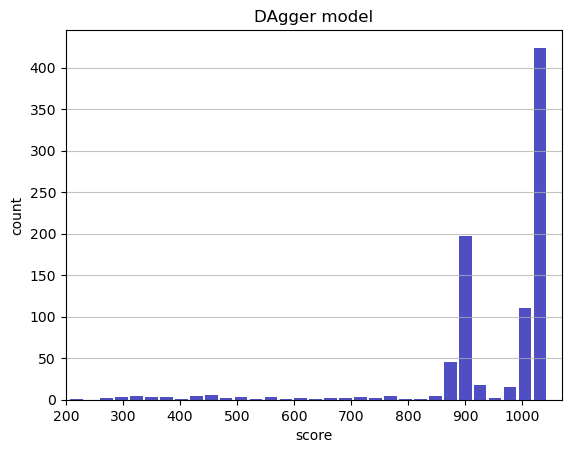

Track generation: 1237..1550 -> 313-tiles track
Epoch: 872
DAgger	mean: 952.16	variance: 135.35


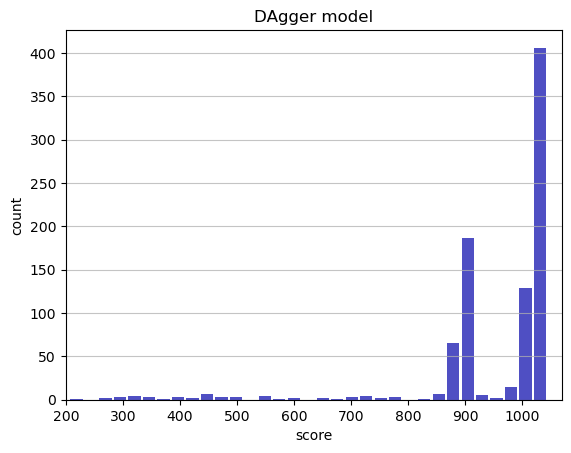

Track generation: 1326..1662 -> 336-tiles track
Epoch: 873
DAgger	mean: 951.47	variance: 136.79


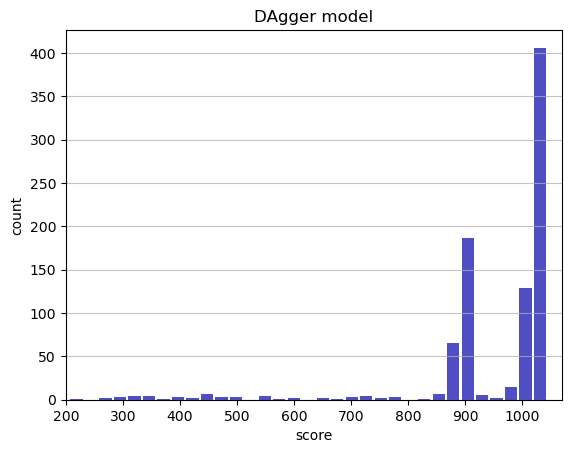

Track generation: 1083..1358 -> 275-tiles track
Epoch: 874
DAgger	mean: 951.56	variance: 136.73


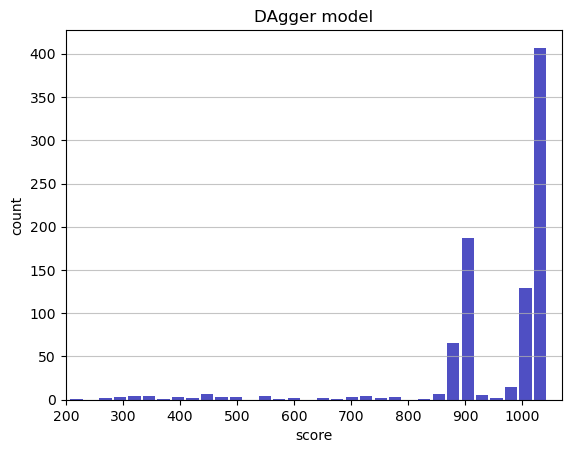

Track generation: 1196..1499 -> 303-tiles track
Epoch: 875
DAgger	mean: 951.64	variance: 136.67


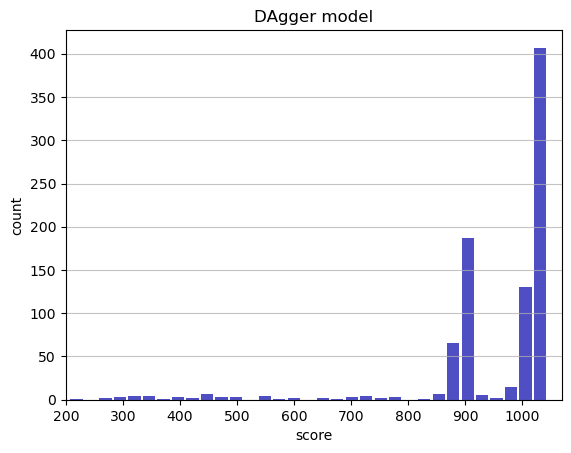

Track generation: 1192..1494 -> 302-tiles track
Epoch: 876
DAgger	mean: 951.58	variance: 136.61


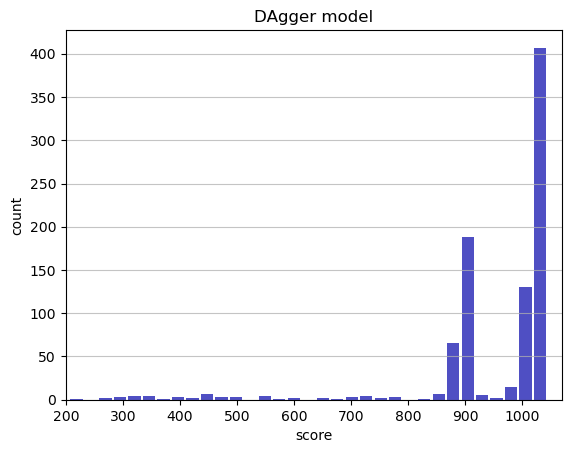

Track generation: 969..1225 -> 256-tiles track
Epoch: 877
DAgger	mean: 951.67	variance: 136.56


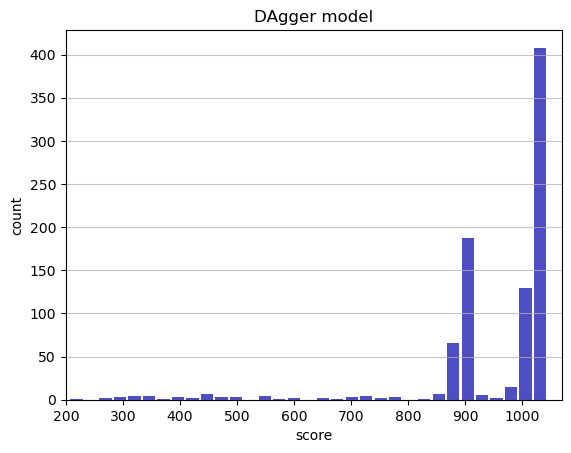

Track generation: 1463..1833 -> 370-tiles track
Epoch: 878
DAgger	mean: 950.90	variance: 138.37


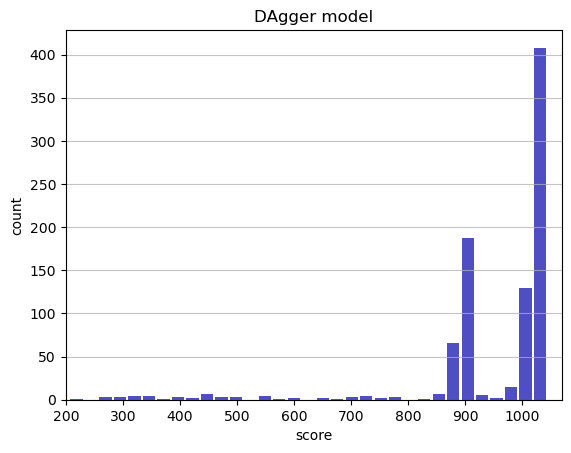

Track generation: 1112..1394 -> 282-tiles track
Epoch: 879
DAgger	mean: 950.86	variance: 138.30


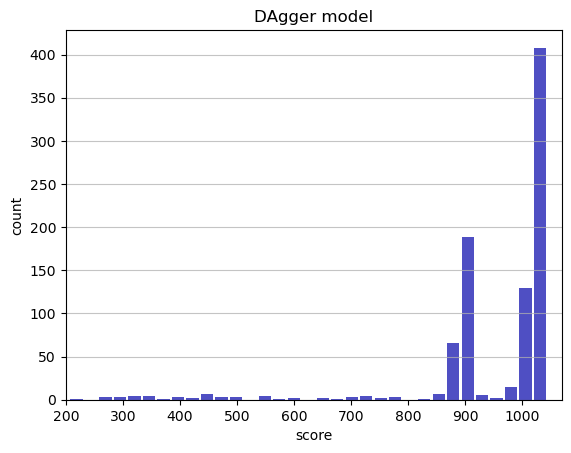

Track generation: 1164..1459 -> 295-tiles track
Epoch: 880
DAgger	mean: 950.80	variance: 138.23


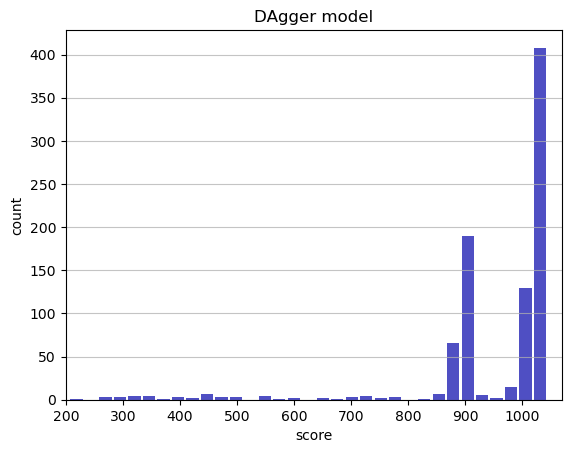

Track generation: 1120..1404 -> 284-tiles track
Epoch: 881
DAgger	mean: 950.73	variance: 138.17


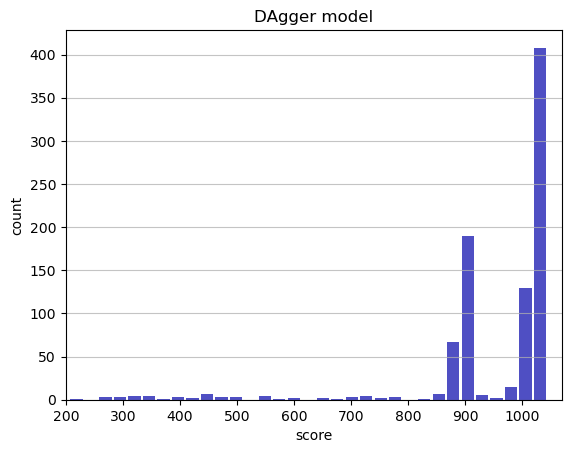

Track generation: 1071..1343 -> 272-tiles track
Epoch: 882
DAgger	mean: 950.82	variance: 138.12


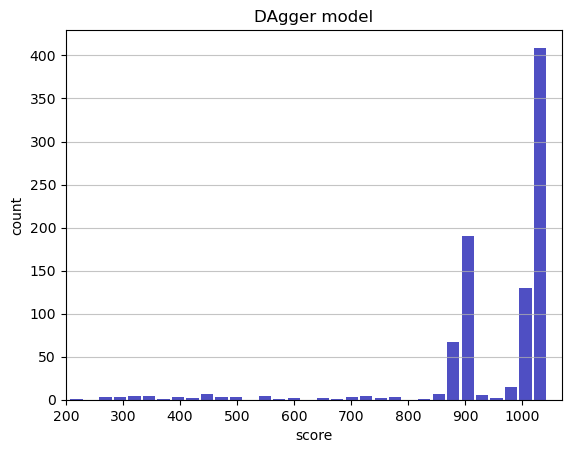

Track generation: 1311..1643 -> 332-tiles track
Epoch: 883
DAgger	mean: 950.76	variance: 138.05


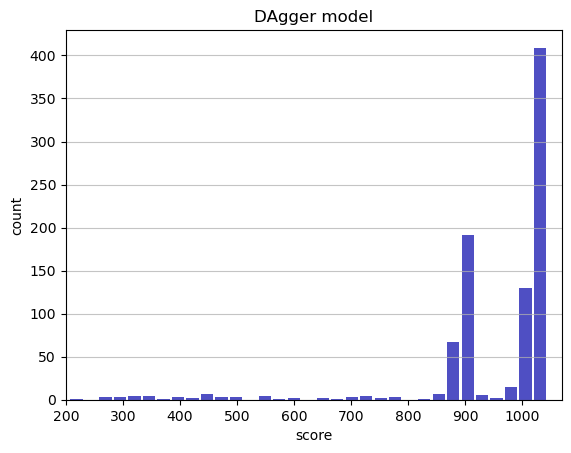

Track generation: 1295..1623 -> 328-tiles track
Epoch: 884
DAgger	mean: 950.84	variance: 137.99


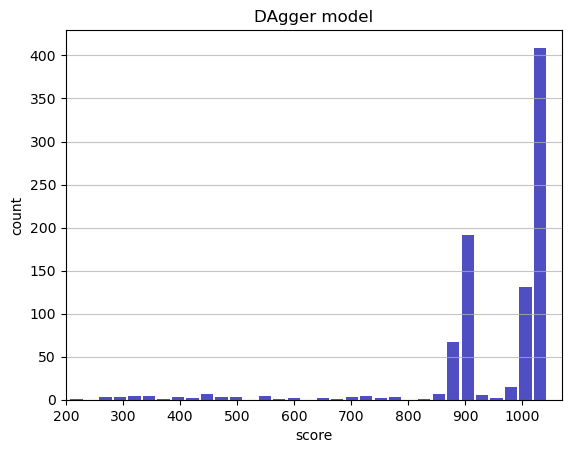

Track generation: 996..1254 -> 258-tiles track
Epoch: 885
DAgger	mean: 950.93	variance: 137.94


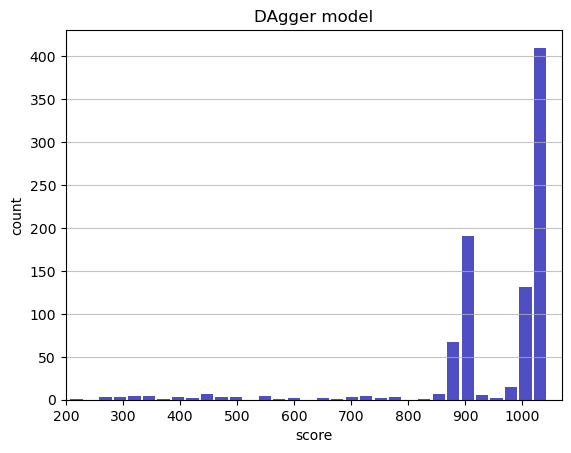

Track generation: 1040..1304 -> 264-tiles track
Epoch: 886
DAgger	mean: 951.02	variance: 137.89


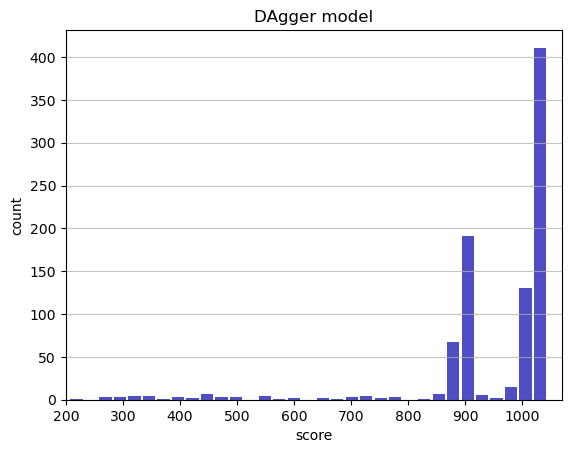

Track generation: 1171..1468 -> 297-tiles track
Epoch: 887
DAgger	mean: 951.10	variance: 137.83


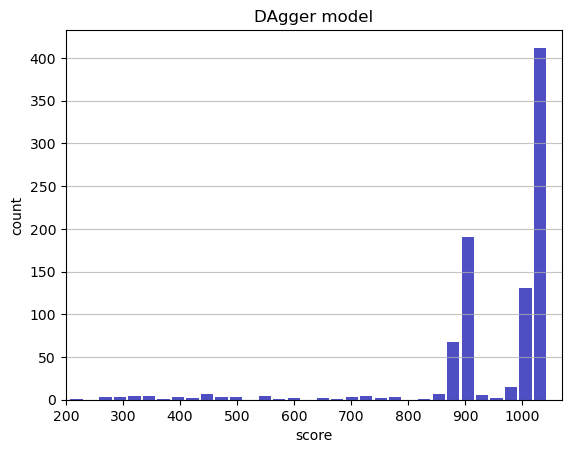

Track generation: 1099..1378 -> 279-tiles track
Epoch: 888
DAgger	mean: 951.20	variance: 137.78


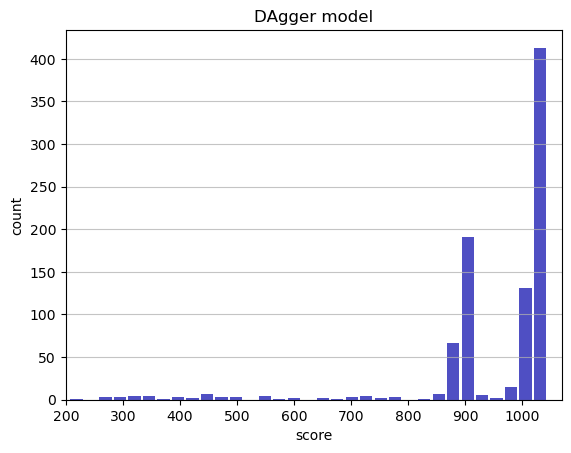

Track generation: 1286..1612 -> 326-tiles track
Epoch: 889
DAgger	mean: 951.27	variance: 137.72


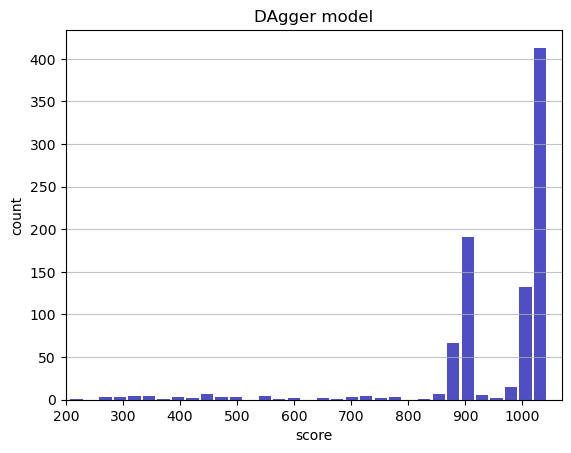

Track generation: 1196..1499 -> 303-tiles track
Epoch: 890
DAgger	mean: 951.22	variance: 137.65


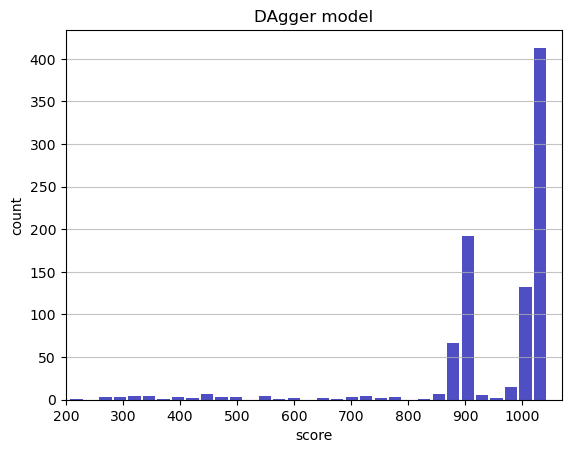

Track generation: 1103..1383 -> 280-tiles track
Epoch: 891
DAgger	mean: 951.15	variance: 137.59


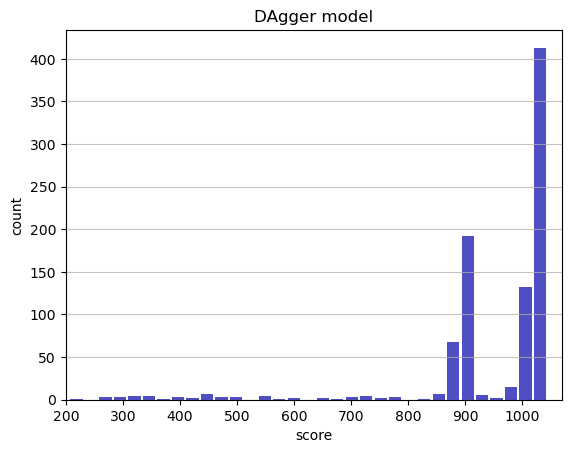

Track generation: 1228..1533 -> 305-tiles track
Epoch: 892
DAgger	mean: 951.23	variance: 137.53


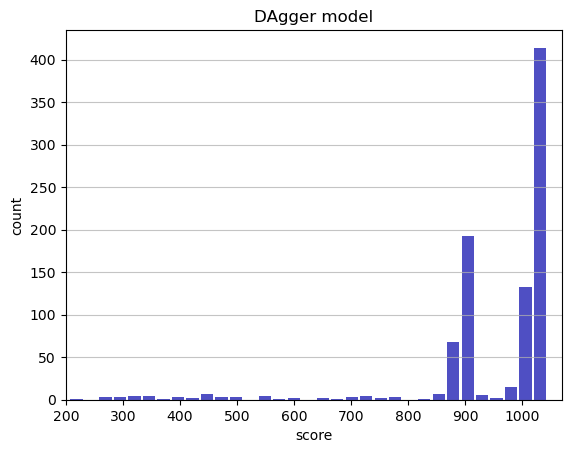

Track generation: 1147..1438 -> 291-tiles track
Epoch: 893
DAgger	mean: 951.17	variance: 137.46


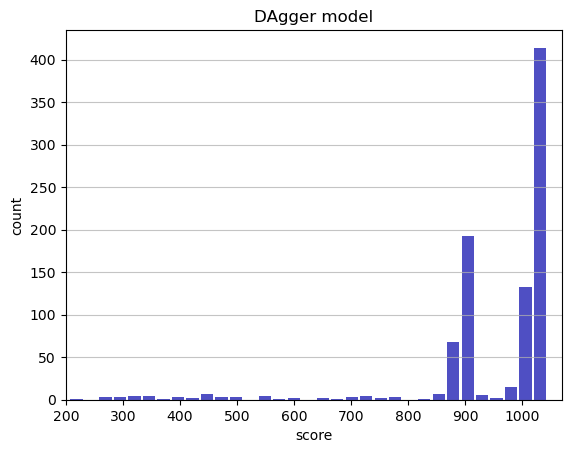

Track generation: 1156..1449 -> 293-tiles track
Epoch: 894
DAgger	mean: 951.13	variance: 137.39


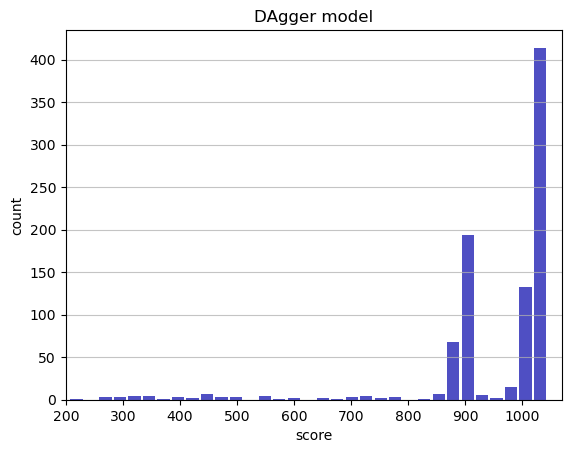

Track generation: 1241..1561 -> 320-tiles track
Epoch: 895
DAgger	mean: 951.20	variance: 137.33


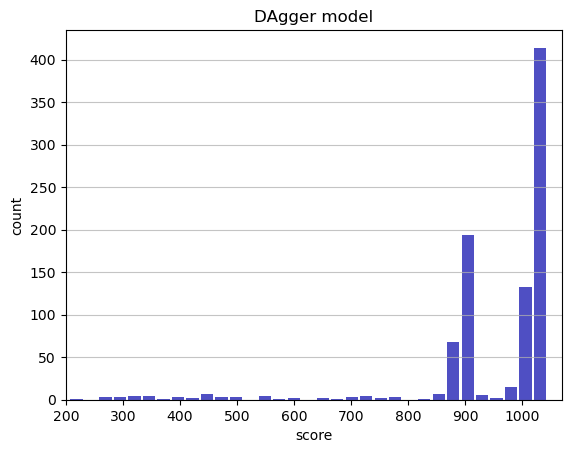

Track generation: 1141..1431 -> 290-tiles track
Epoch: 896
DAgger	mean: 951.12	variance: 137.28


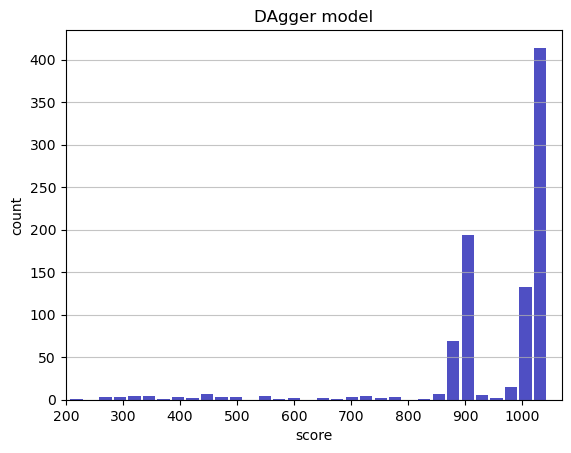

Track generation: 1046..1315 -> 269-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1171..1468 -> 297-tiles track
Epoch: 897
DAgger	mean: 951.07	variance: 137.21


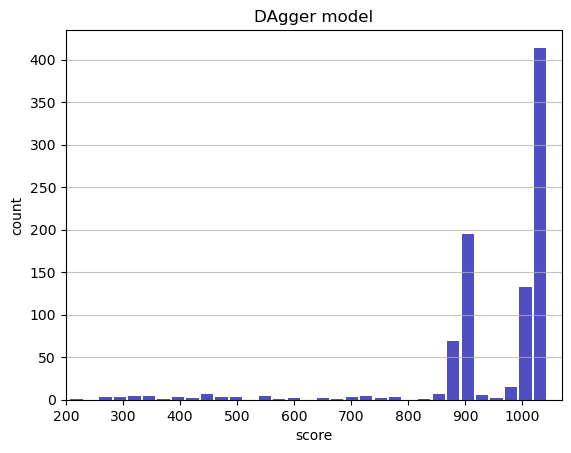

Track generation: 1035..1298 -> 263-tiles track
Epoch: 898
DAgger	mean: 951.17	variance: 137.17


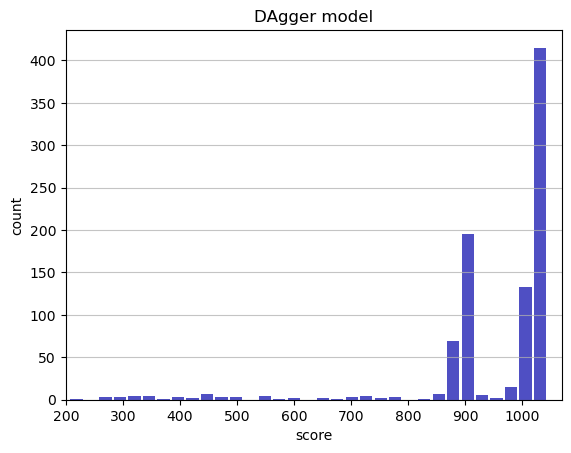

Track generation: 1247..1572 -> 325-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1252..1578 -> 326-tiles track
Epoch: 899
DAgger	mean: 951.23	variance: 137.10


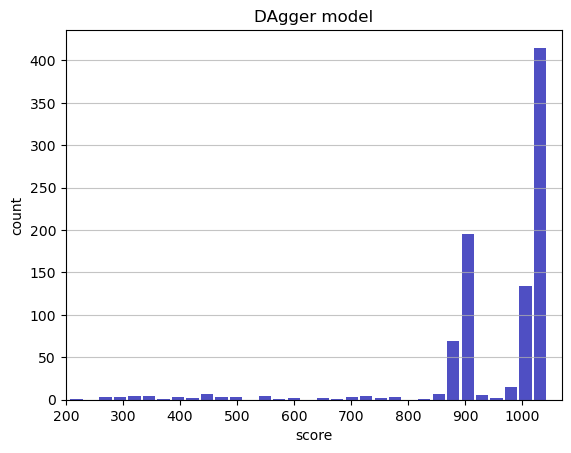

Track generation: 1079..1353 -> 274-tiles track
Epoch: 900
DAgger	mean: 951.20	variance: 137.03


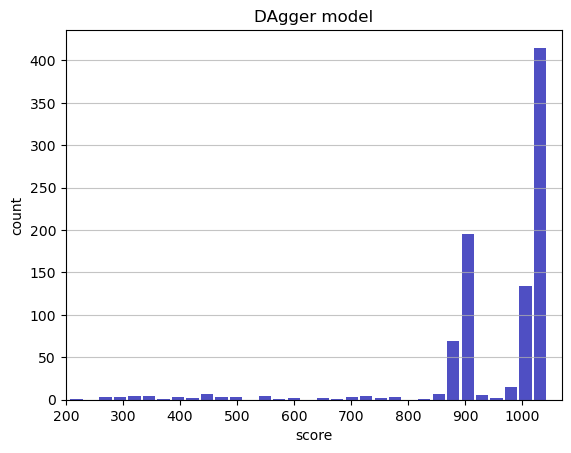

Track generation: 973..1220 -> 247-tiles track
Epoch: 901
DAgger	mean: 951.16	variance: 136.96


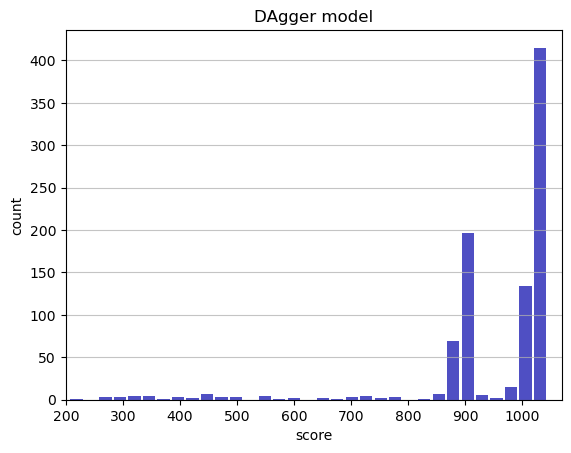

Track generation: 1171..1468 -> 297-tiles track
Epoch: 902
DAgger	mean: 951.25	variance: 136.91


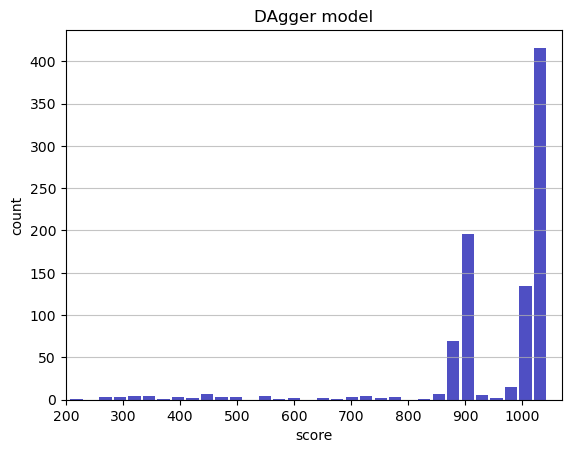

Track generation: 1228..1539 -> 311-tiles track
Epoch: 903
DAgger	mean: 951.18	variance: 136.85


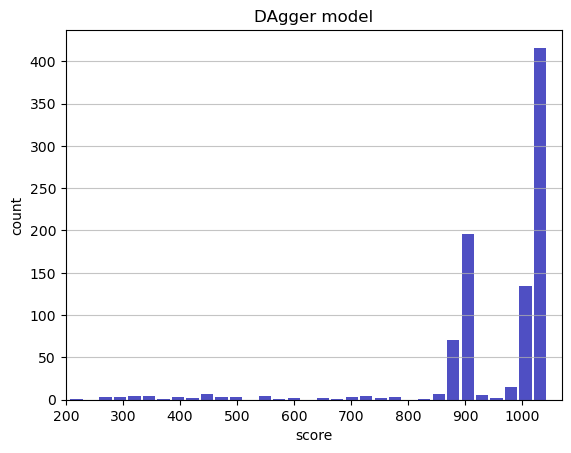

Track generation: 1265..1585 -> 320-tiles track
Epoch: 904
DAgger	mean: 951.12	variance: 136.78


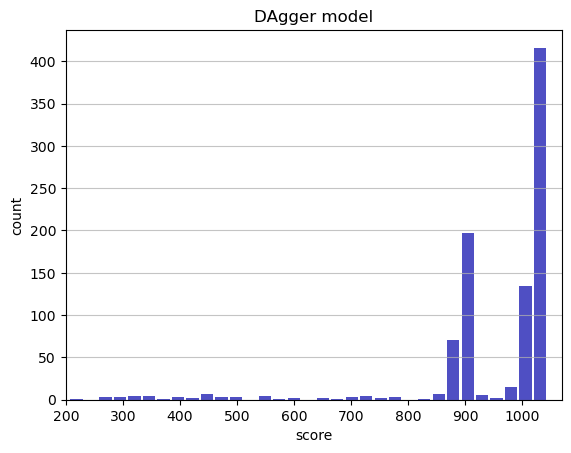

Track generation: 1270..1592 -> 322-tiles track
Epoch: 905
DAgger	mean: 951.03	variance: 136.73


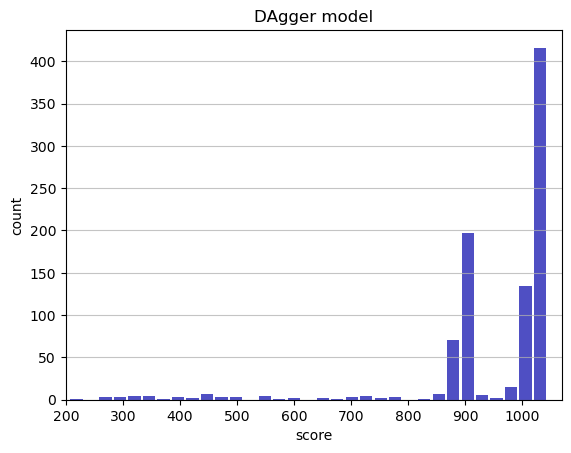

Track generation: 1146..1445 -> 299-tiles track
Epoch: 906
DAgger	mean: 950.52	variance: 137.53


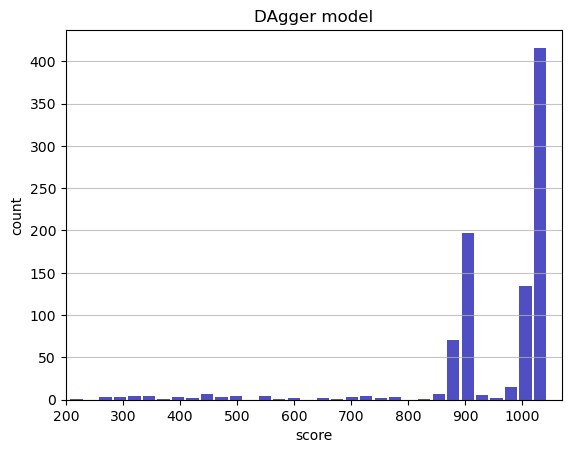

Track generation: 1273..1595 -> 322-tiles track
Epoch: 907
DAgger	mean: 950.60	variance: 137.47


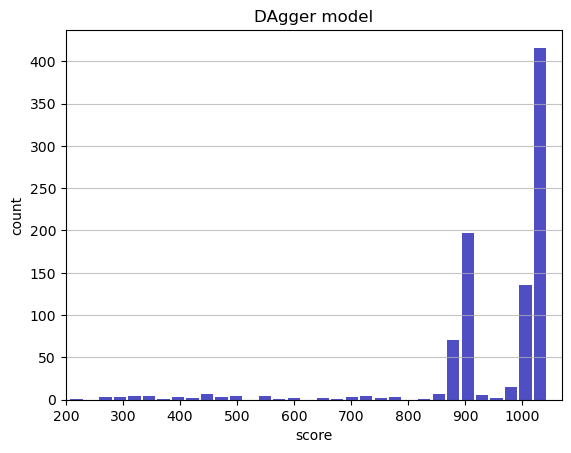

Track generation: 1175..1478 -> 303-tiles track
Epoch: 908
DAgger	mean: 950.67	variance: 137.42


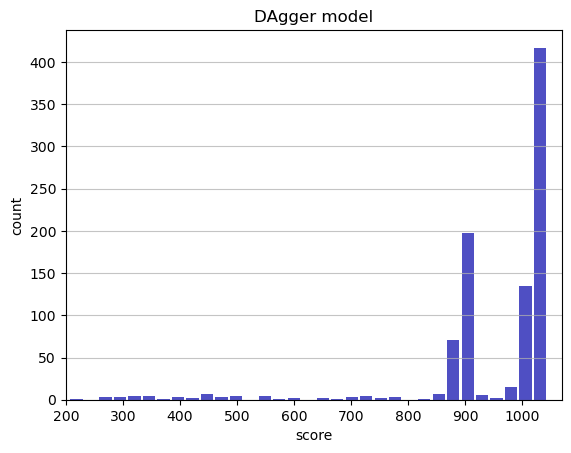

Track generation: 1235..1548 -> 313-tiles track
Epoch: 909
DAgger	mean: 950.61	variance: 137.35


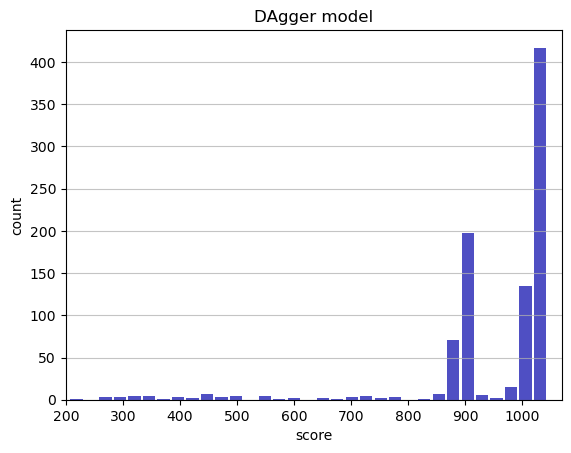

Track generation: 1212..1519 -> 307-tiles track
Epoch: 910
DAgger	mean: 950.69	variance: 137.30


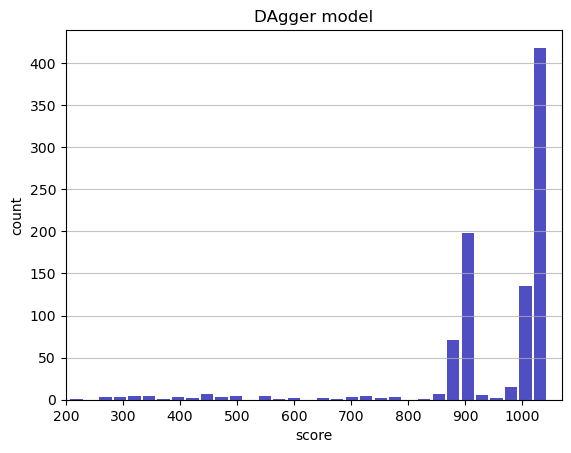

Track generation: 1135..1423 -> 288-tiles track
Epoch: 911
DAgger	mean: 950.64	variance: 137.23


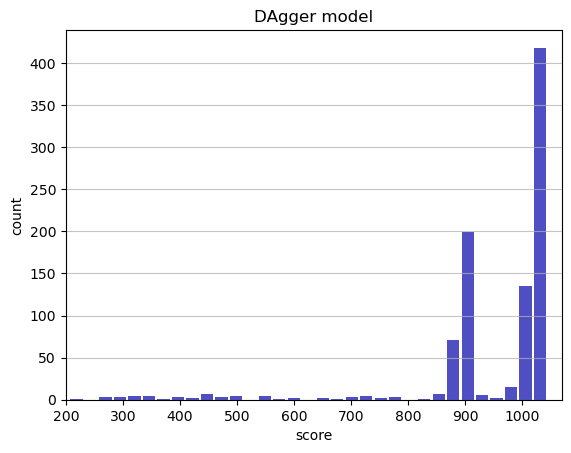

Track generation: 1413..1770 -> 357-tiles track
Epoch: 912
DAgger	mean: 950.70	variance: 137.17


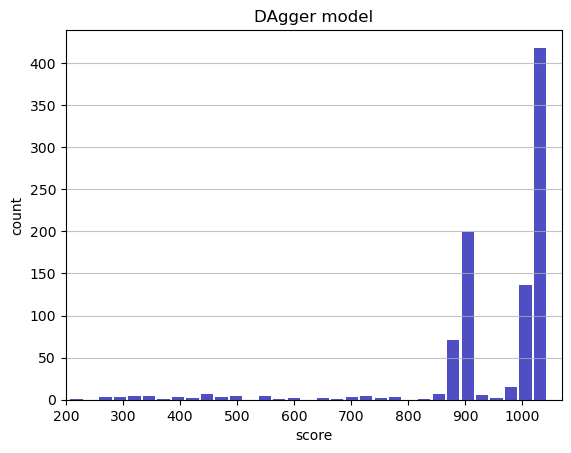

Track generation: 1114..1396 -> 282-tiles track
Epoch: 913
DAgger	mean: 950.78	variance: 137.11


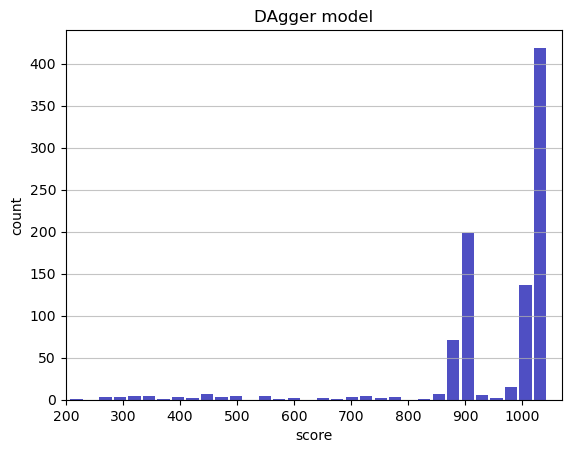

Track generation: 1064..1334 -> 270-tiles track
Epoch: 914
DAgger	mean: 950.87	variance: 137.06


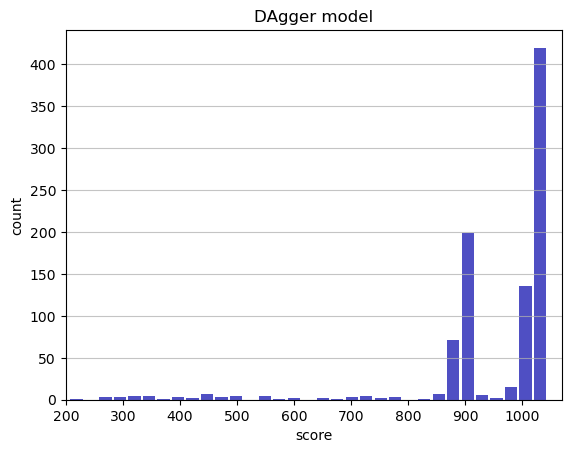

Track generation: 1109..1390 -> 281-tiles track
Epoch: 915
DAgger	mean: 950.82	variance: 137.00


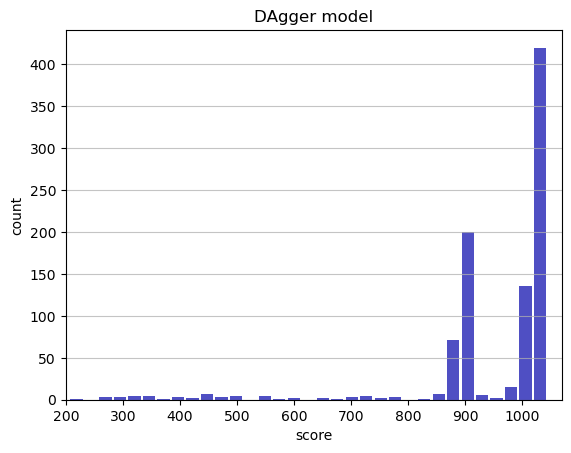

Track generation: 1235..1555 -> 320-tiles track
Epoch: 916
DAgger	mean: 950.26	variance: 137.95


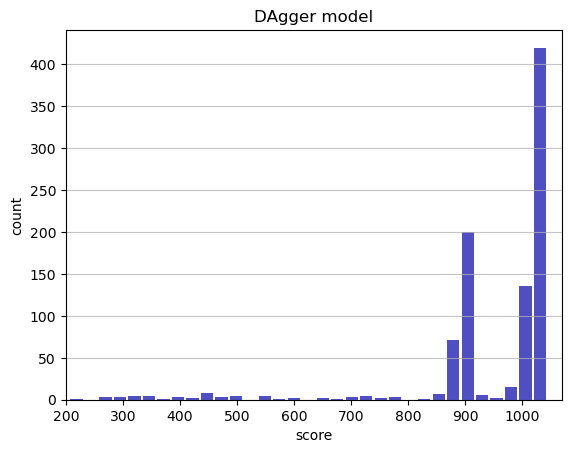

Track generation: 1025..1291 -> 266-tiles track
Epoch: 917
DAgger	mean: 950.36	variance: 137.91


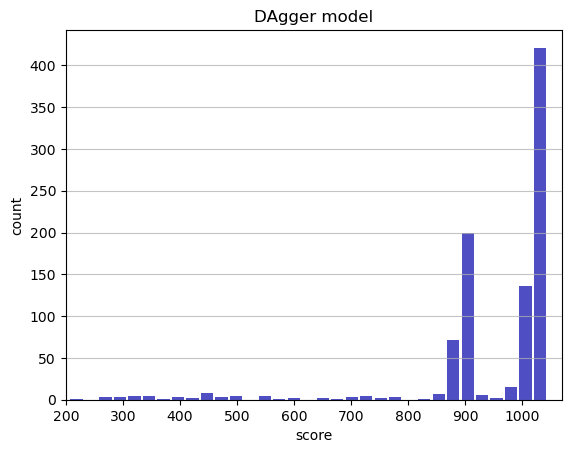

Track generation: 1187..1488 -> 301-tiles track
Epoch: 918
DAgger	mean: 950.31	variance: 137.84


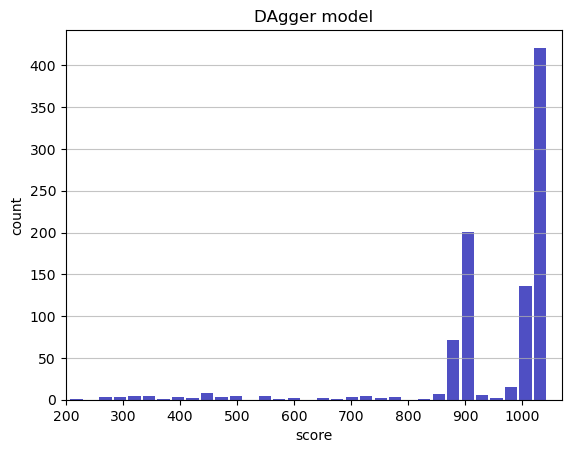

Track generation: 1102..1381 -> 279-tiles track
Epoch: 919
DAgger	mean: 950.39	variance: 137.79


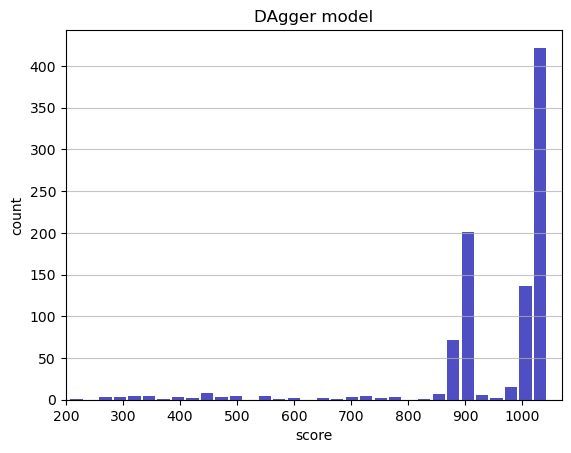

Track generation: 1004..1262 -> 258-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1059..1328 -> 269-tiles track
Epoch: 920
DAgger	mean: 949.89	variance: 138.56


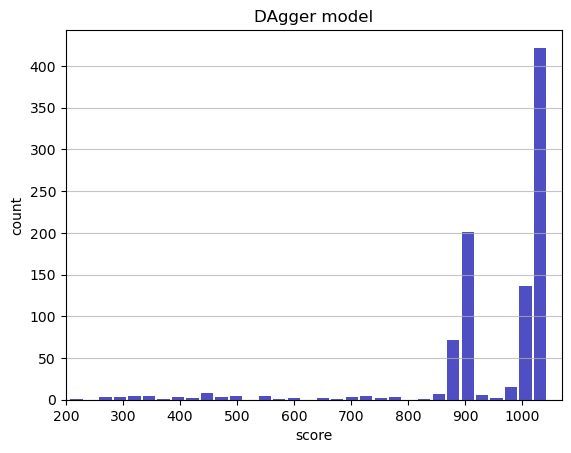

Track generation: 1057..1331 -> 274-tiles track
Epoch: 921
DAgger	mean: 949.97	variance: 138.51


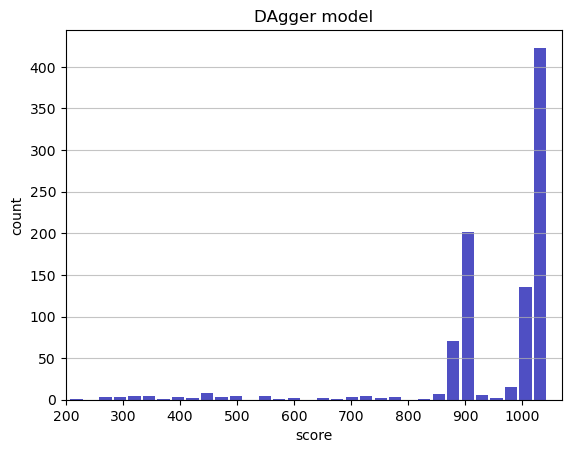

Track generation: 1105..1385 -> 280-tiles track
Epoch: 922
DAgger	mean: 949.91	variance: 138.44


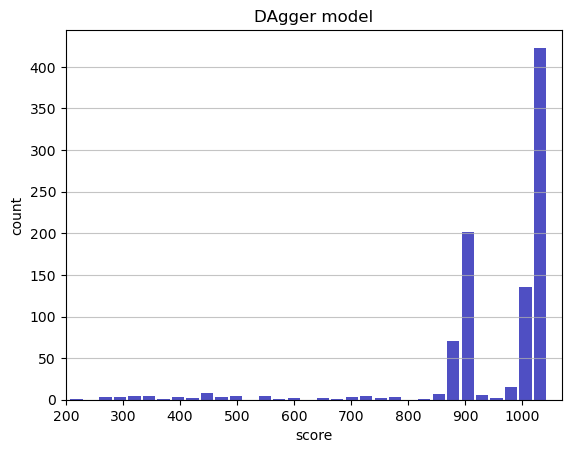

Track generation: 1098..1377 -> 279-tiles track
Epoch: 923
DAgger	mean: 949.83	variance: 138.39


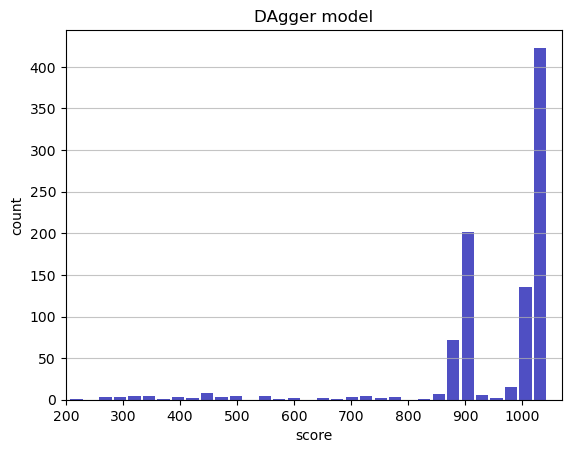

Track generation: 1140..1429 -> 289-tiles track
Epoch: 924
DAgger	mean: 949.78	variance: 138.32


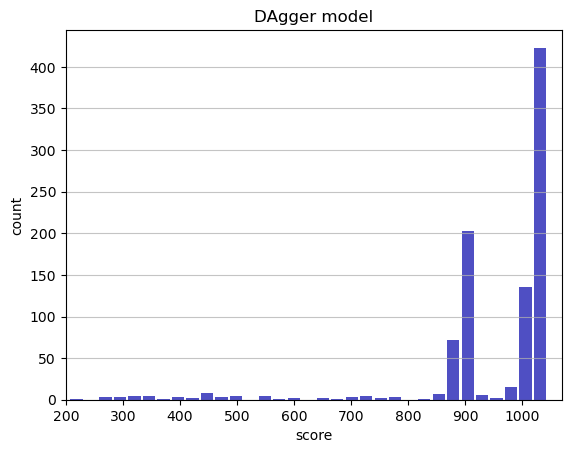

Track generation: 1104..1384 -> 280-tiles track
Epoch: 925
DAgger	mean: 949.86	variance: 138.27


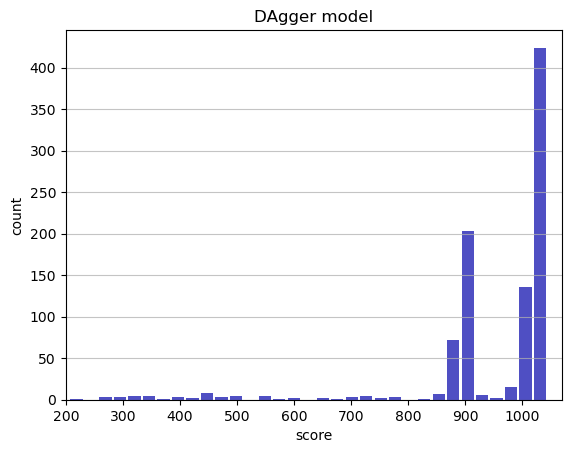

Track generation: 942..1187 -> 245-tiles track
Epoch: 926
DAgger	mean: 949.96	variance: 138.23


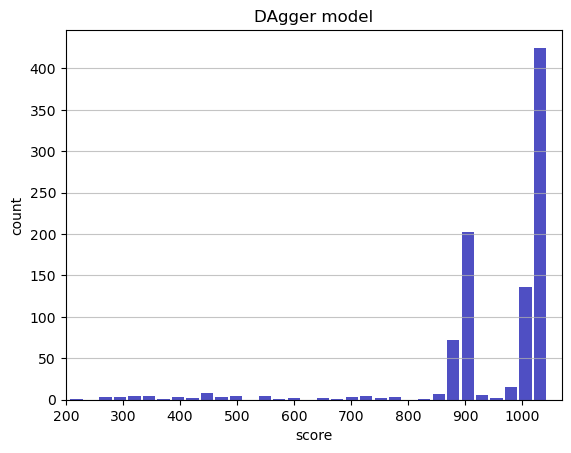

Track generation: 1206..1512 -> 306-tiles track
Epoch: 927
DAgger	mean: 949.88	variance: 138.17


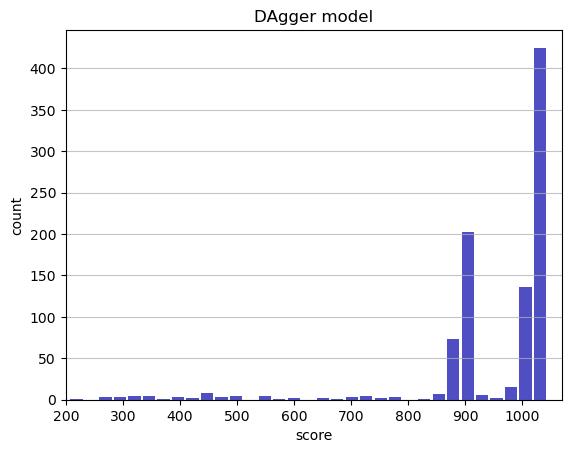

Track generation: 1076..1349 -> 273-tiles track
Epoch: 928
DAgger	mean: 949.97	variance: 138.13


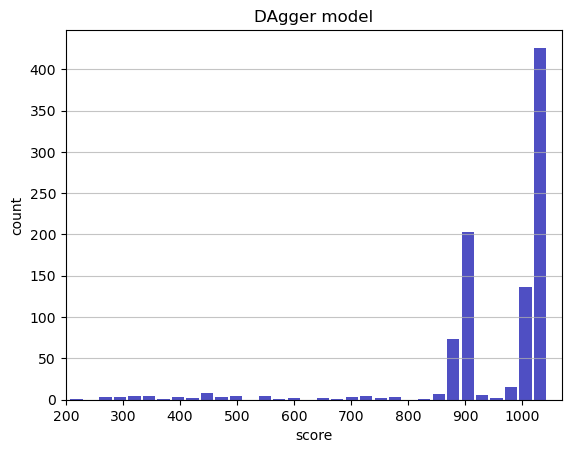

Track generation: 1092..1369 -> 277-tiles track
Epoch: 929
DAgger	mean: 949.92	variance: 138.06


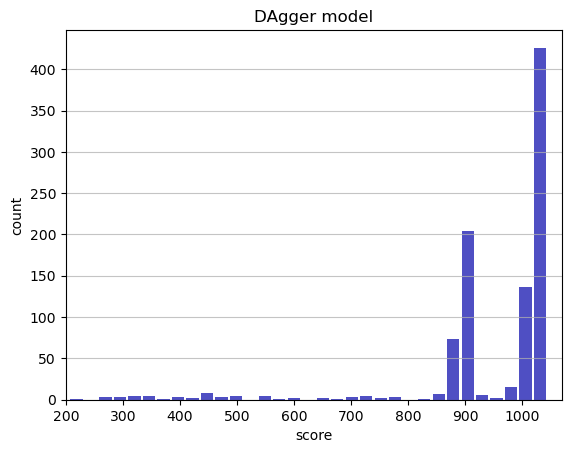

Track generation: 1212..1519 -> 307-tiles track
Epoch: 930
DAgger	mean: 949.86	variance: 138.00


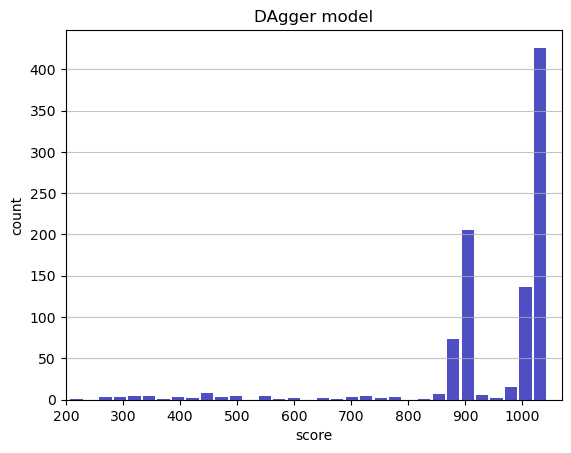

Track generation: 1160..1454 -> 294-tiles track
Epoch: 931
DAgger	mean: 949.94	variance: 137.95


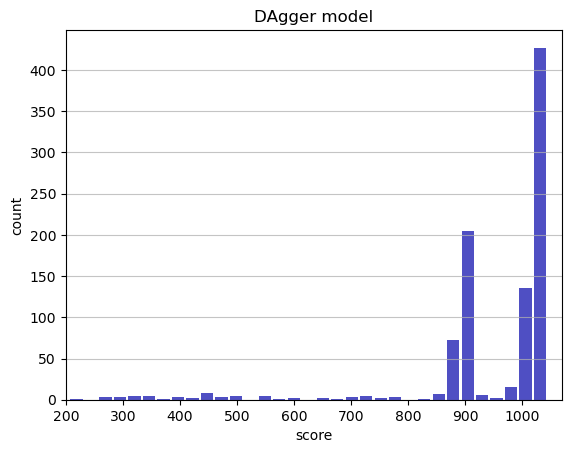

Track generation: 1147..1445 -> 298-tiles track
Epoch: 932
DAgger	mean: 950.02	variance: 137.89


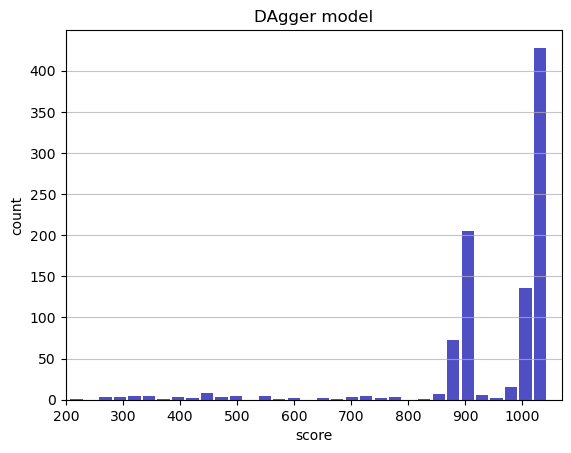

Track generation: 1135..1423 -> 288-tiles track
Epoch: 933
DAgger	mean: 950.10	variance: 137.84


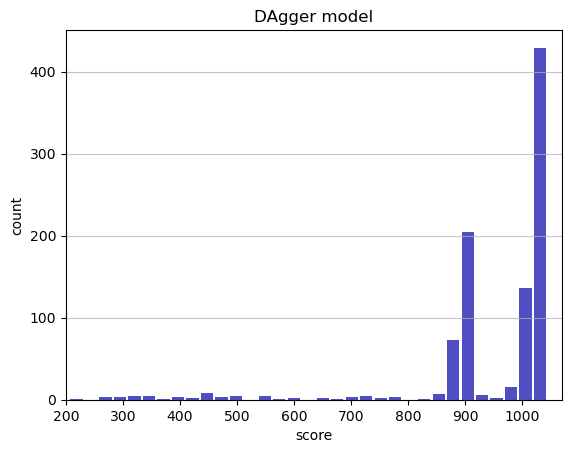

Track generation: 1180..1479 -> 299-tiles track
Epoch: 934
DAgger	mean: 950.04	variance: 137.78


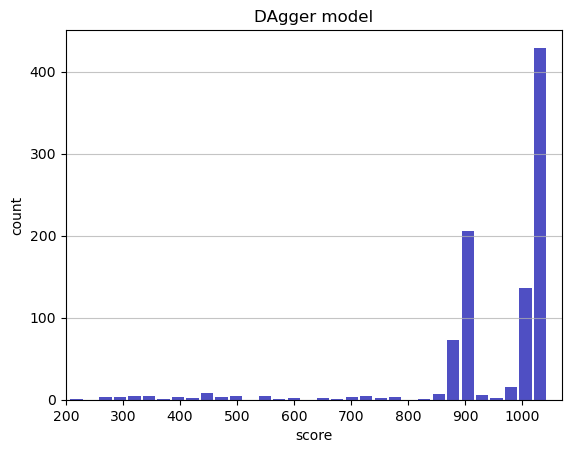

Track generation: 1120..1404 -> 284-tiles track
Epoch: 935
DAgger	mean: 949.94	variance: 137.74


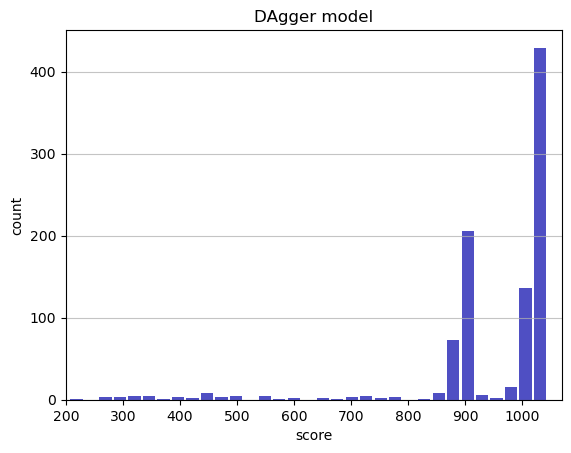

Track generation: 1127..1413 -> 286-tiles track
Epoch: 936
DAgger	mean: 950.03	variance: 137.69


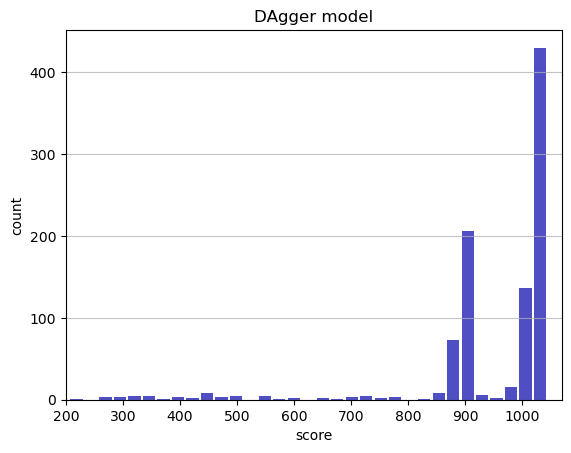

Track generation: 1304..1634 -> 330-tiles track
Epoch: 937
DAgger	mean: 950.10	variance: 137.63


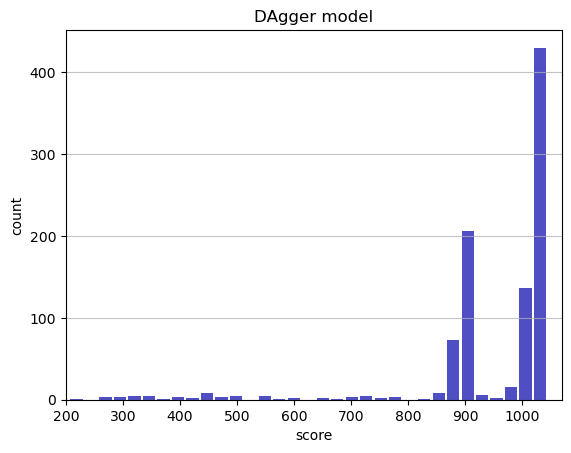

Track generation: 1052..1319 -> 267-tiles track
Epoch: 938
DAgger	mean: 950.06	variance: 137.56


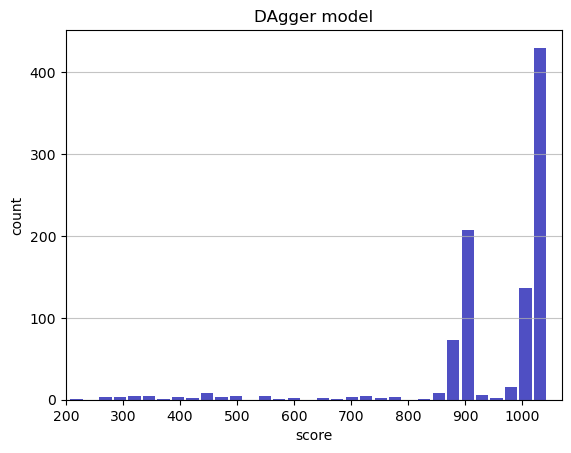

Track generation: 1147..1438 -> 291-tiles track
Epoch: 939
DAgger	mean: 950.00	variance: 137.50


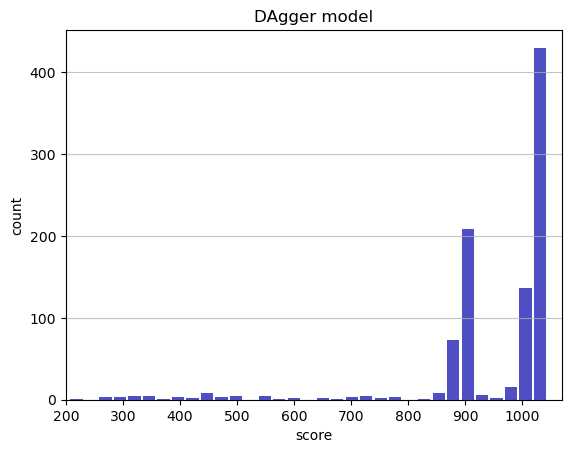

Track generation: 1135..1433 -> 298-tiles track
Epoch: 940
DAgger	mean: 950.08	variance: 137.45


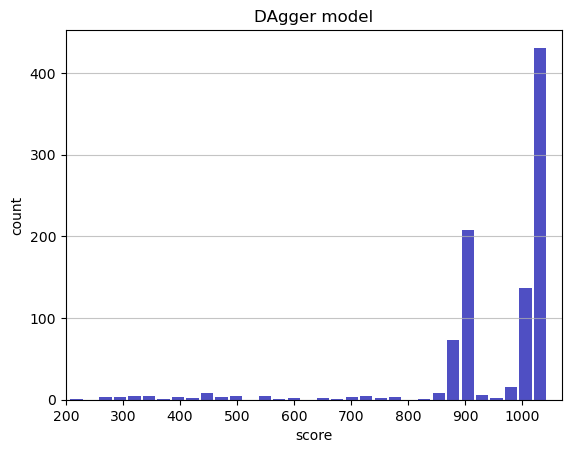

Track generation: 1046..1316 -> 270-tiles track
Epoch: 941
DAgger	mean: 950.17	variance: 137.40


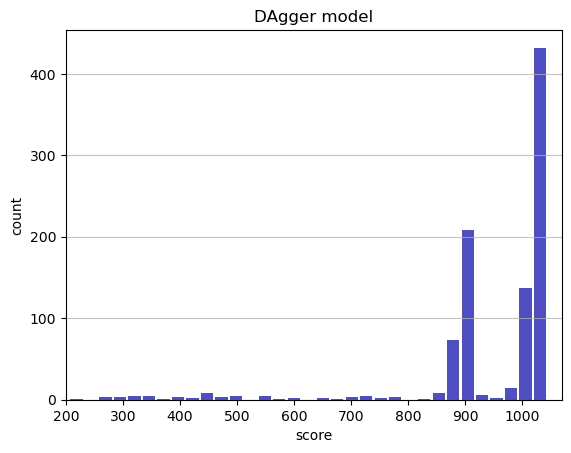

Track generation: 1187..1488 -> 301-tiles track
Epoch: 942
DAgger	mean: 950.11	variance: 137.34


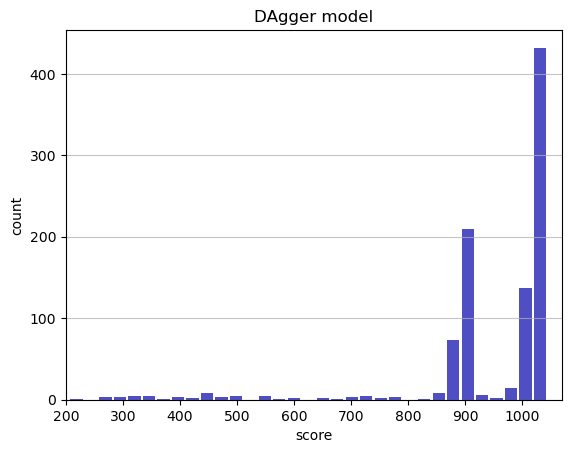

Track generation: 1169..1465 -> 296-tiles track
Epoch: 943
DAgger	mean: 950.07	variance: 137.28


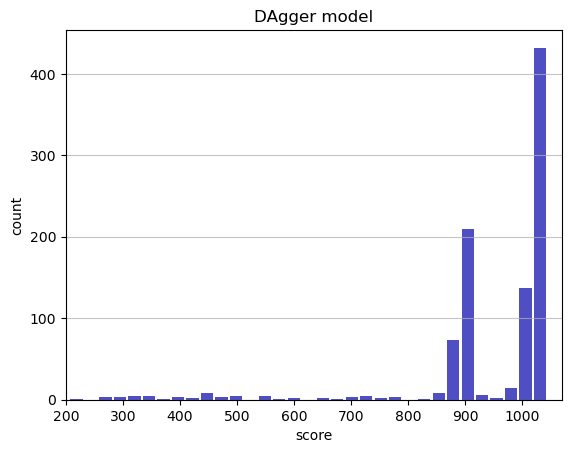

Track generation: 975..1229 -> 254-tiles track
Epoch: 944
DAgger	mean: 950.16	variance: 137.23


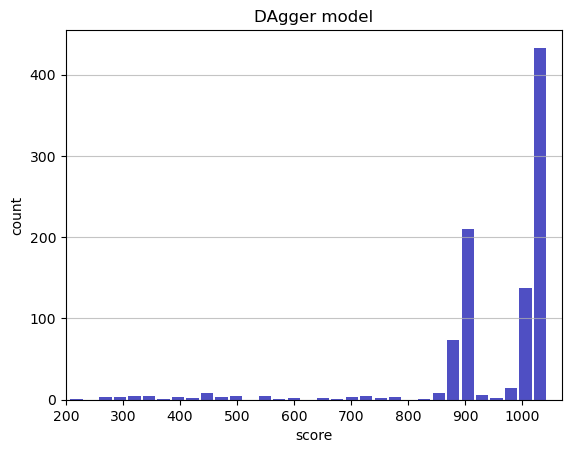

Track generation: 1008..1268 -> 260-tiles track
Epoch: 945
DAgger	mean: 949.84	variance: 137.51


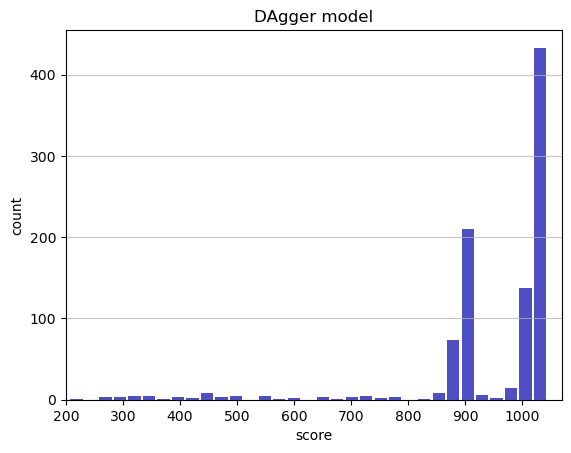

Track generation: 1088..1370 -> 282-tiles track
Epoch: 946
DAgger	mean: 949.92	variance: 137.46


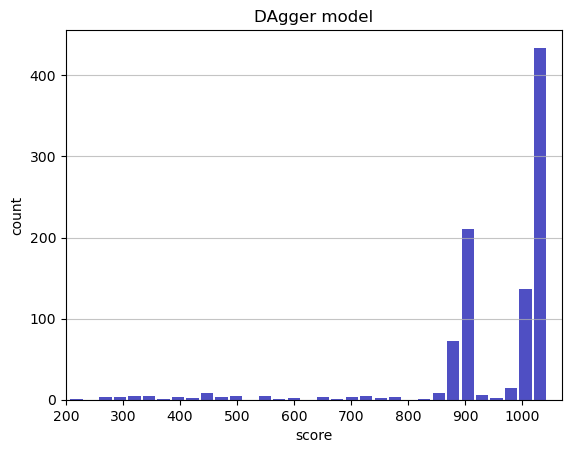

Track generation: 1076..1349 -> 273-tiles track
Epoch: 947
DAgger	mean: 950.01	variance: 137.42


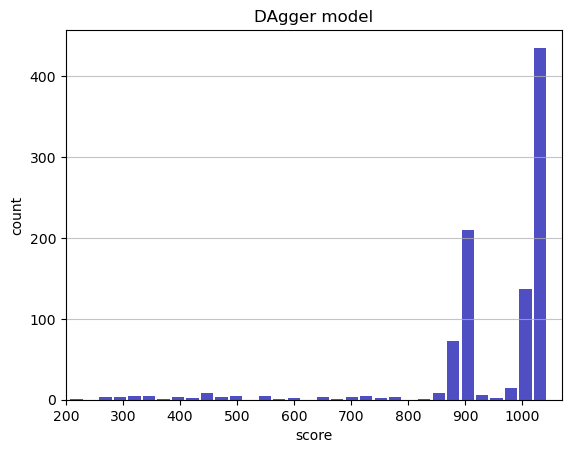

Track generation: 1417..1776 -> 359-tiles track
Epoch: 948
DAgger	mean: 950.03	variance: 137.35


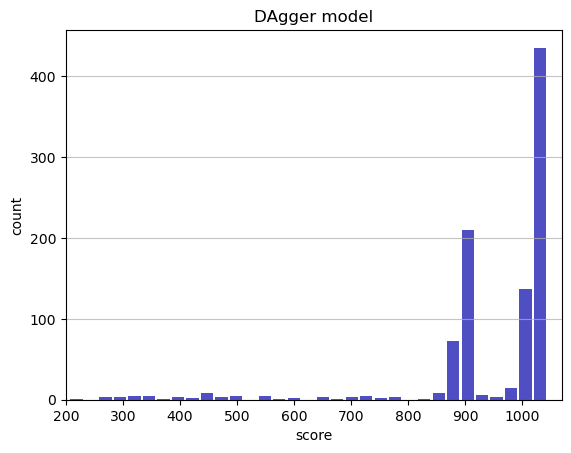

Track generation: 1144..1434 -> 290-tiles track
Epoch: 949
DAgger	mean: 949.97	variance: 137.28


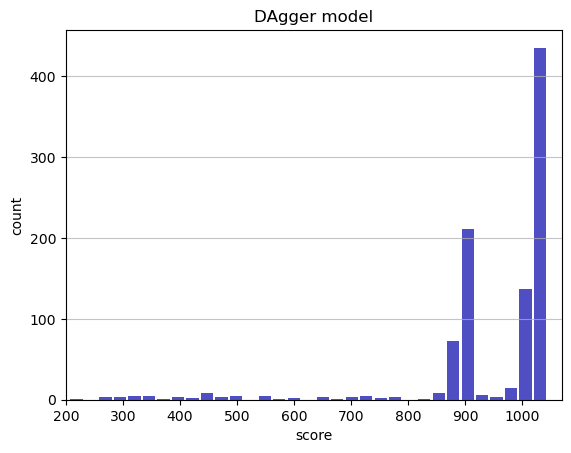

Track generation: 1360..1704 -> 344-tiles track
Epoch: 950
DAgger	mean: 949.32	variance: 138.69


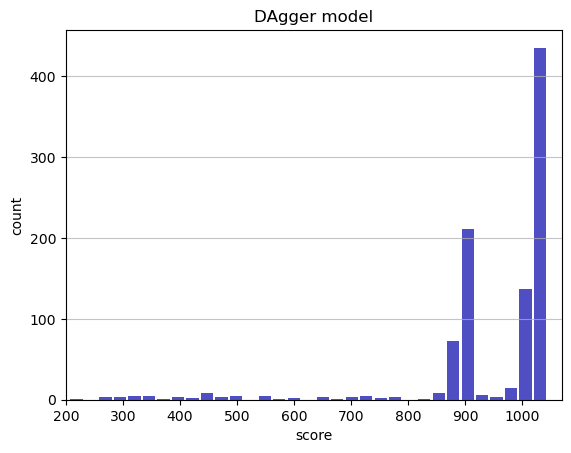

Track generation: 1075..1348 -> 273-tiles track
Epoch: 951
DAgger	mean: 949.41	variance: 138.64


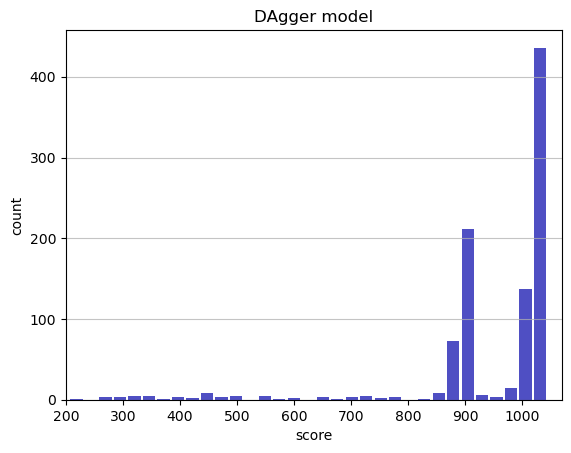

Track generation: 1201..1505 -> 304-tiles track
Epoch: 952
DAgger	mean: 949.49	variance: 138.59


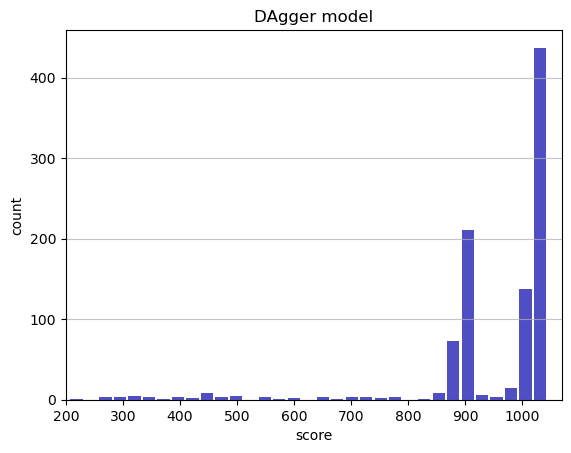

Track generation: 1144..1434 -> 290-tiles track
Epoch: 953
DAgger	mean: 949.44	variance: 138.52


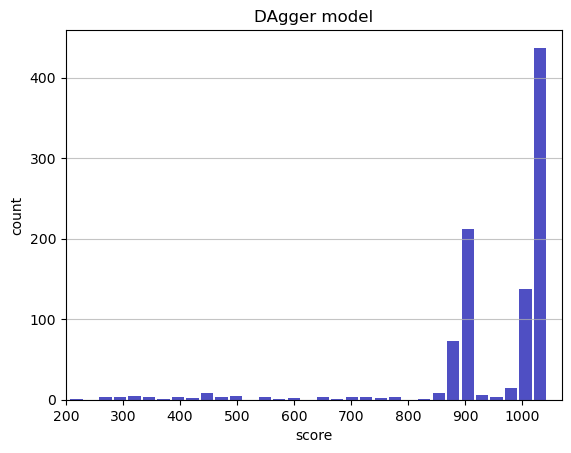

Track generation: 1100..1379 -> 279-tiles track
Epoch: 954
DAgger	mean: 949.53	variance: 138.48


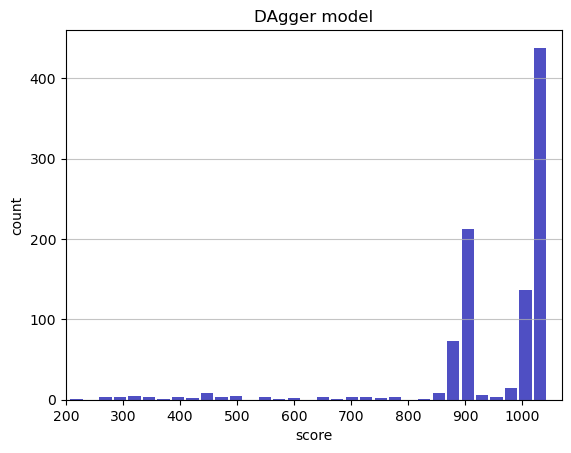

Track generation: 1212..1519 -> 307-tiles track
Epoch: 955
DAgger	mean: 949.48	variance: 138.41


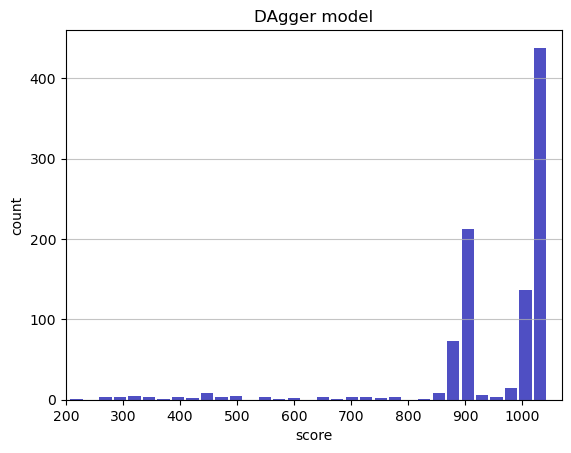

Track generation: 1195..1498 -> 303-tiles track
Epoch: 956
DAgger	mean: 949.56	variance: 138.36


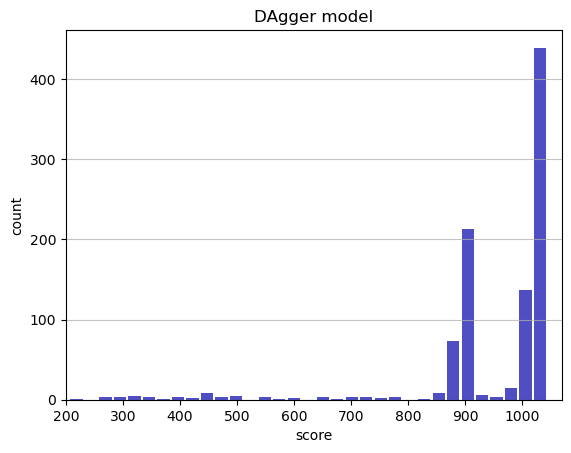

Track generation: 1124..1409 -> 285-tiles track
Epoch: 957
DAgger	mean: 949.50	variance: 138.30


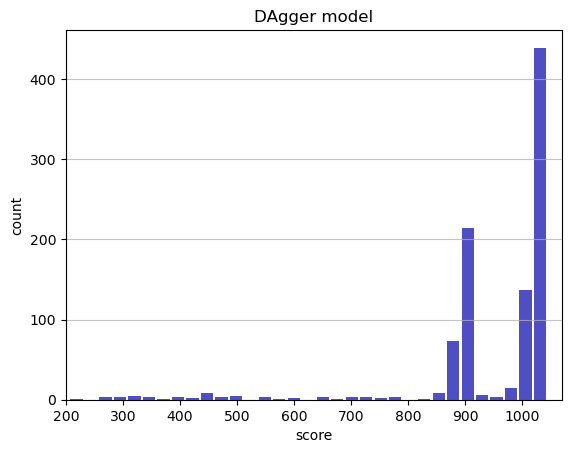

Track generation: 1156..1449 -> 293-tiles track
Epoch: 958
DAgger	mean: 949.44	variance: 138.24


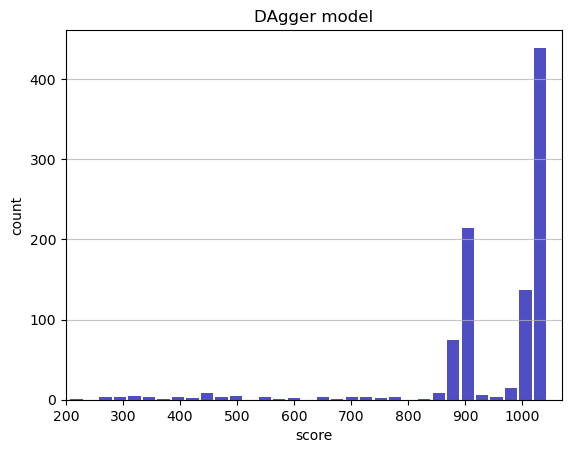

Track generation: 999..1253 -> 254-tiles track
Epoch: 959
DAgger	mean: 949.40	variance: 138.17


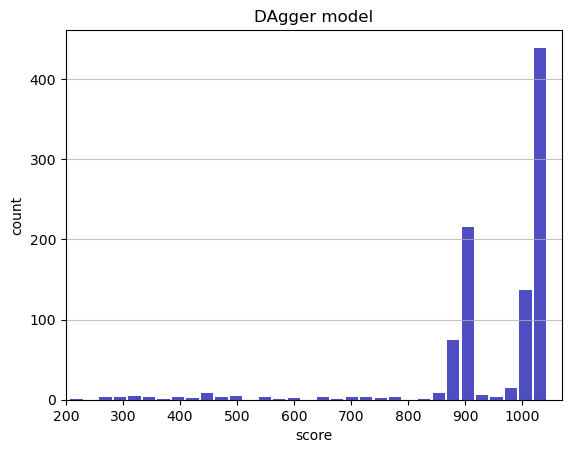

Track generation: 1073..1345 -> 272-tiles track
Epoch: 960
DAgger	mean: 949.49	variance: 138.13


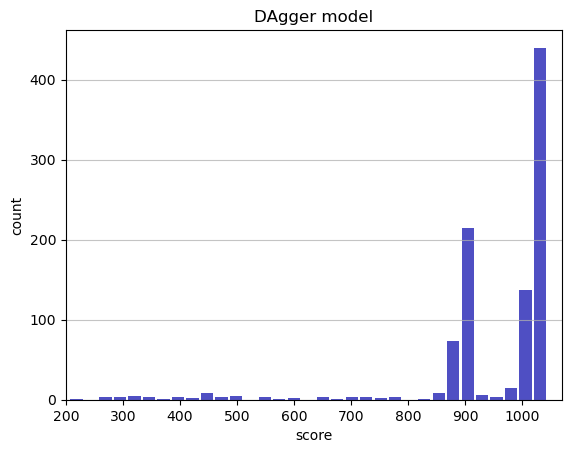

Track generation: 1033..1298 -> 265-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 1088..1364 -> 276-tiles track
Epoch: 961
DAgger	mean: 949.44	variance: 138.07


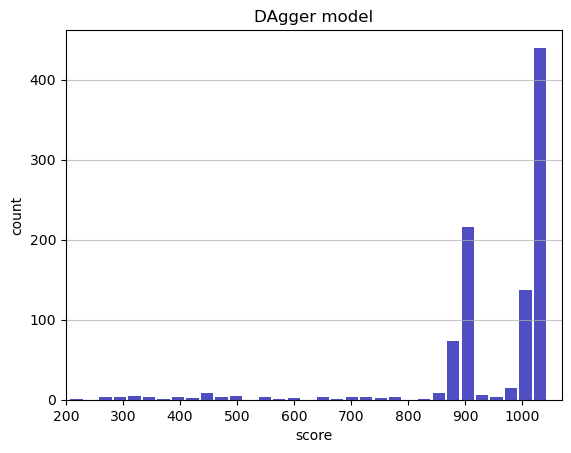

Track generation: 1223..1533 -> 310-tiles track
Epoch: 962
DAgger	mean: 949.46	variance: 138.00


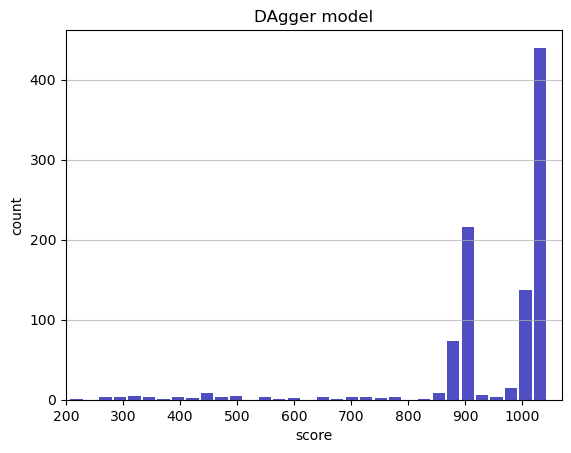

Track generation: 1044..1309 -> 265-tiles track
Epoch: 963
DAgger	mean: 949.55	variance: 137.95


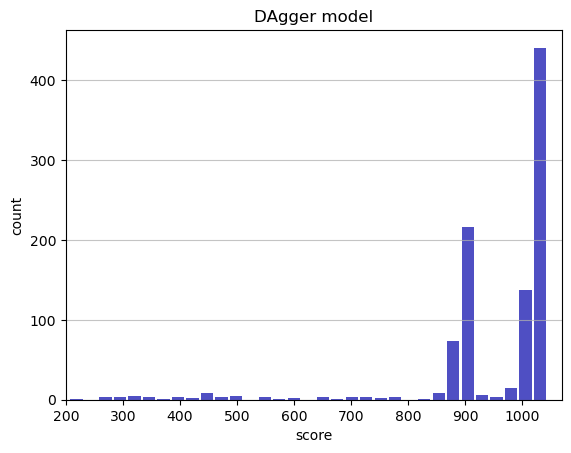

Track generation: 1219..1528 -> 309-tiles track
Epoch: 964
DAgger	mean: 949.31	variance: 138.08


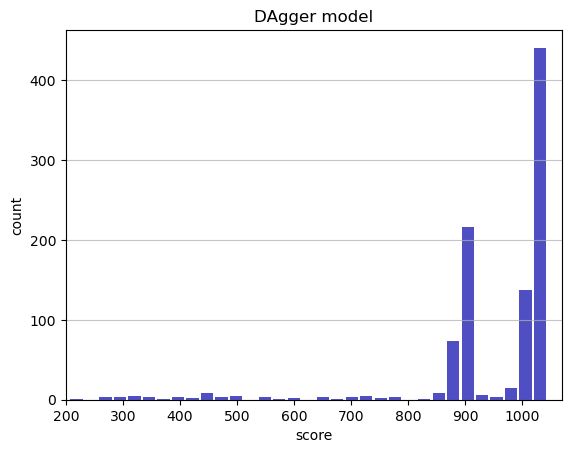

Track generation: 1244..1566 -> 322-tiles track
Epoch: 965
DAgger	mean: 949.38	variance: 138.02


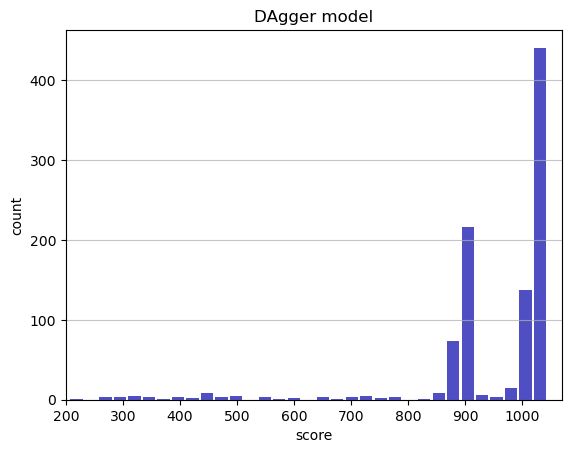

Track generation: 1280..1604 -> 324-tiles track
Epoch: 966
DAgger	mean: 949.32	variance: 137.96


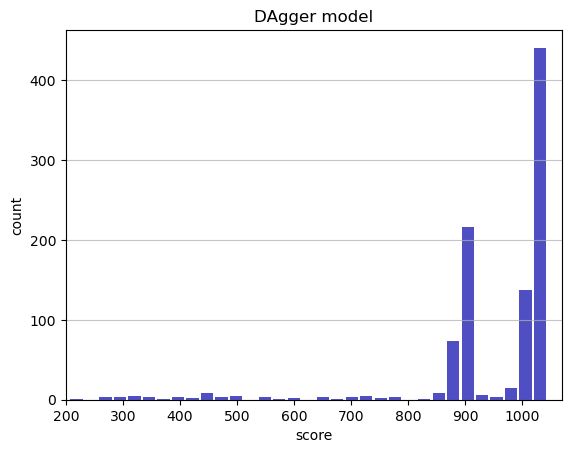

Track generation: 1056..1330 -> 274-tiles track
Epoch: 967
DAgger	mean: 949.41	variance: 137.92


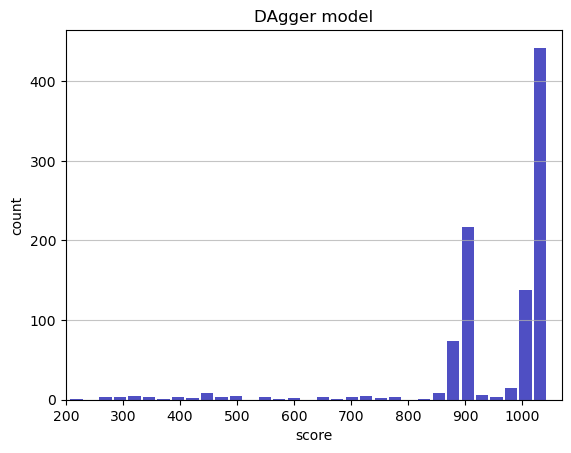

Track generation: 1099..1378 -> 279-tiles track
Epoch: 968
DAgger	mean: 949.49	variance: 137.87


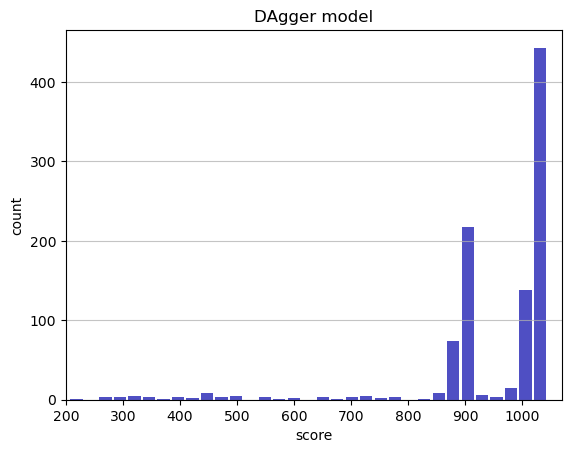

Track generation: 1128..1414 -> 286-tiles track
Epoch: 969
DAgger	mean: 949.57	variance: 137.82


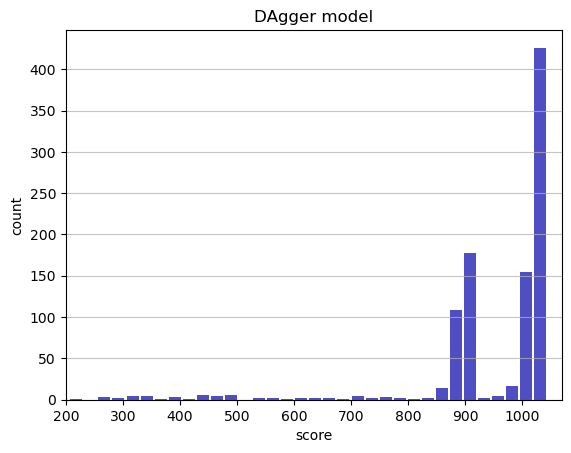

Track generation: 951..1200 -> 249-tiles track
Epoch: 970
DAgger	mean: 949.66	variance: 137.78


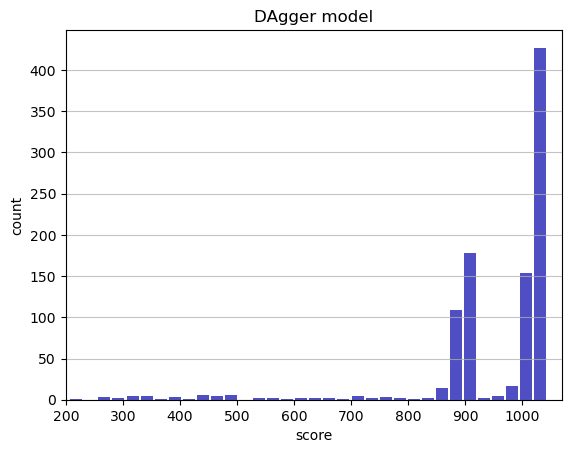

Track generation: 1214..1523 -> 309-tiles track
Epoch: 971
DAgger	mean: 949.73	variance: 137.72


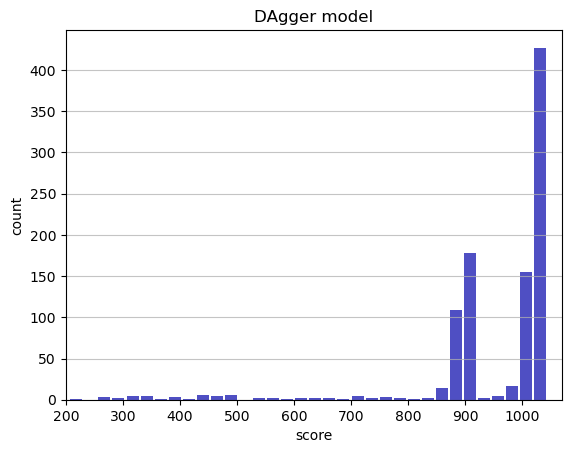

Track generation: 1173..1470 -> 297-tiles track
Epoch: 972
DAgger	mean: 949.67	variance: 137.66


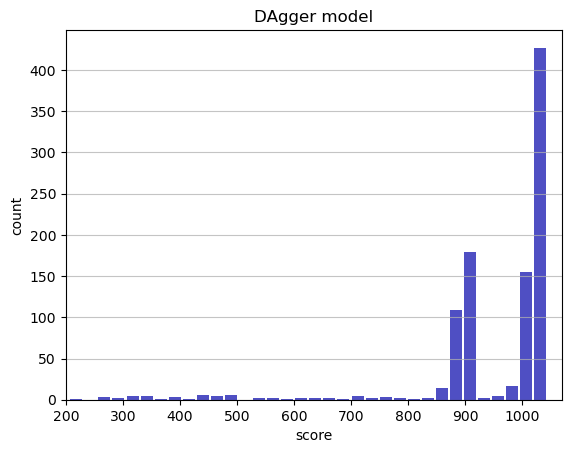

Track generation: 1090..1366 -> 276-tiles track
Epoch: 973
DAgger	mean: 949.75	variance: 137.61


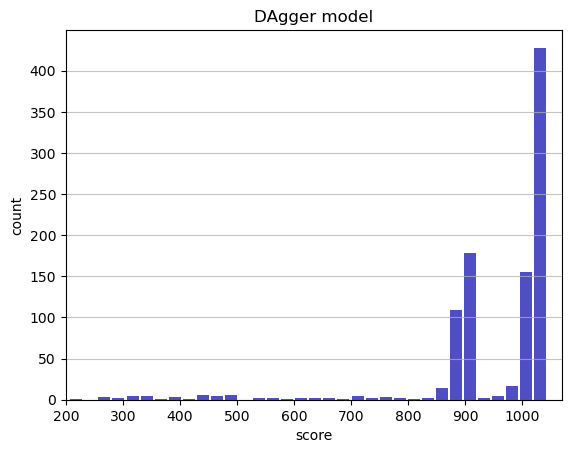

Track generation: 1325..1660 -> 335-tiles track
Epoch: 974
DAgger	mean: 949.79	variance: 137.55


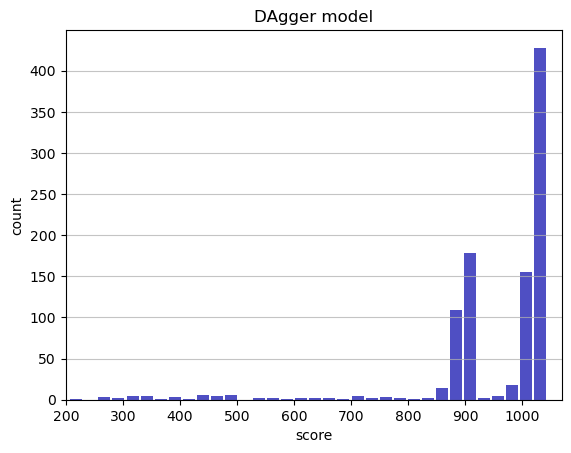

Track generation: 1186..1490 -> 304-tiles track
retry to generate track (normal if there are not manyinstances of this message)
Track generation: 992..1244 -> 252-tiles track
Epoch: 975
DAgger	mean: 949.88	variance: 137.51


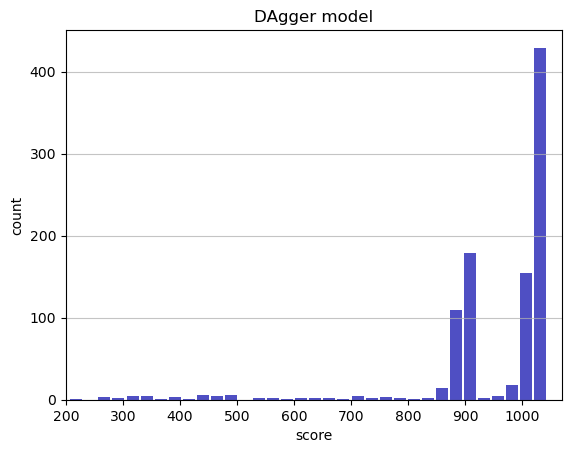

Track generation: 1011..1268 -> 257-tiles track
Epoch: 976
DAgger	mean: 949.97	variance: 137.46


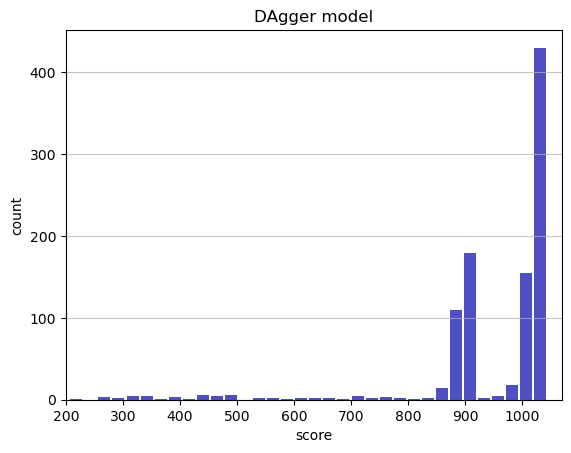

Track generation: 1164..1459 -> 295-tiles track
Epoch: 977
DAgger	mean: 949.90	variance: 137.41


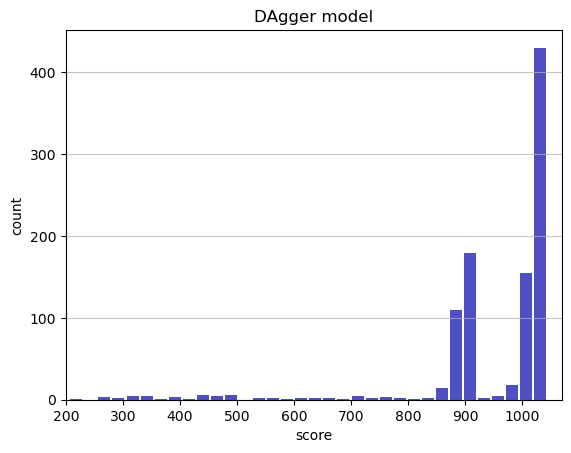

Track generation: 1148..1441 -> 293-tiles track
Epoch: 978
DAgger	mean: 949.97	variance: 137.36


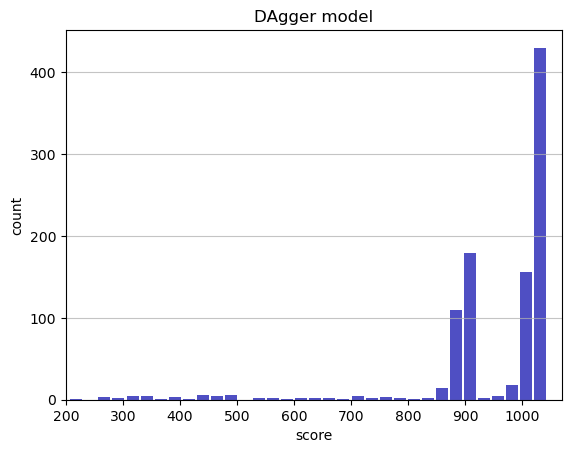

Track generation: 1182..1481 -> 299-tiles track
Epoch: 979
DAgger	mean: 949.93	variance: 137.29


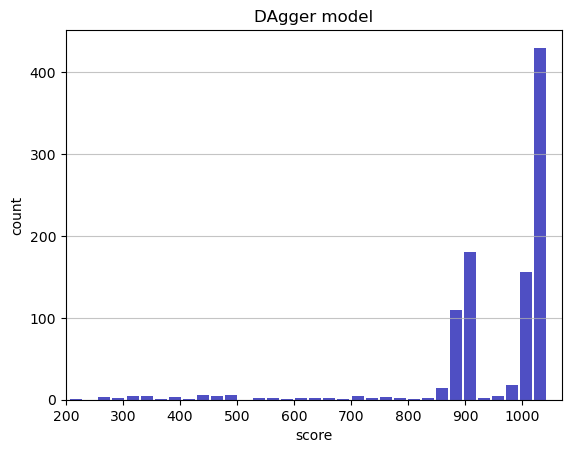

Track generation: 1187..1488 -> 301-tiles track
Epoch: 980
DAgger	mean: 950.01	variance: 137.24


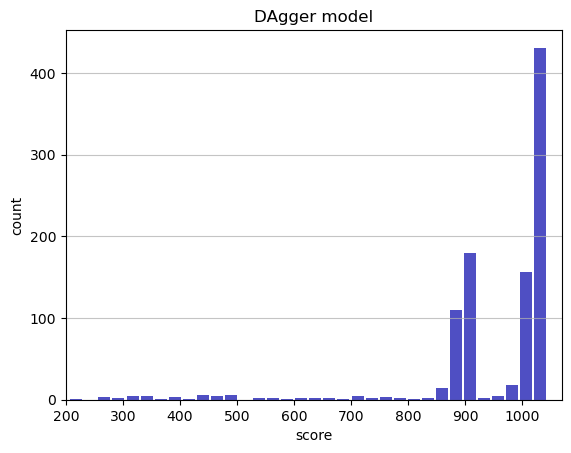

Track generation: 1020..1279 -> 259-tiles track
Epoch: 981
DAgger	mean: 950.09	variance: 137.20


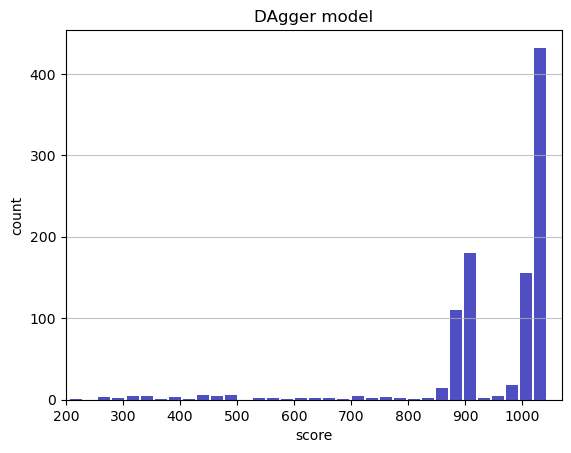

Track generation: 1030..1302 -> 272-tiles track
Epoch: 982
DAgger	mean: 950.17	variance: 137.15


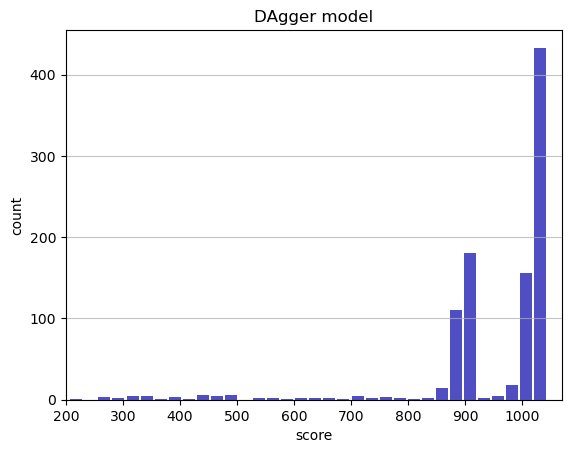

Track generation: 1132..1419 -> 287-tiles track
Epoch: 983
DAgger	mean: 950.11	variance: 137.09


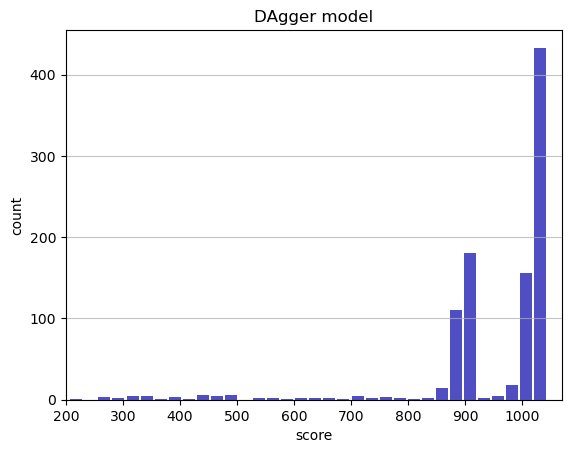

Track generation: 1104..1384 -> 280-tiles track
Epoch: 984
DAgger	mean: 950.07	variance: 137.03


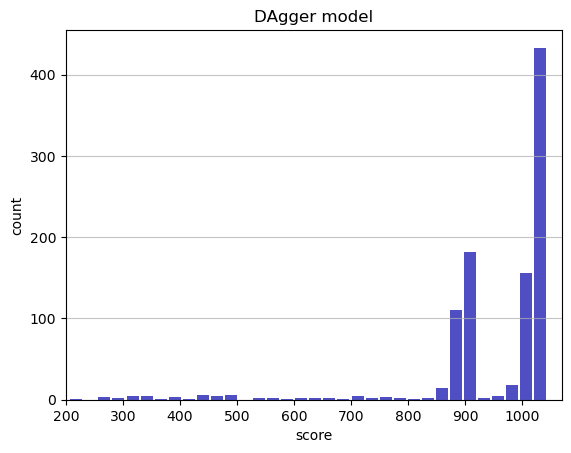

Track generation: 1250..1566 -> 316-tiles track
Epoch: 985
DAgger	mean: 950.13	variance: 136.97


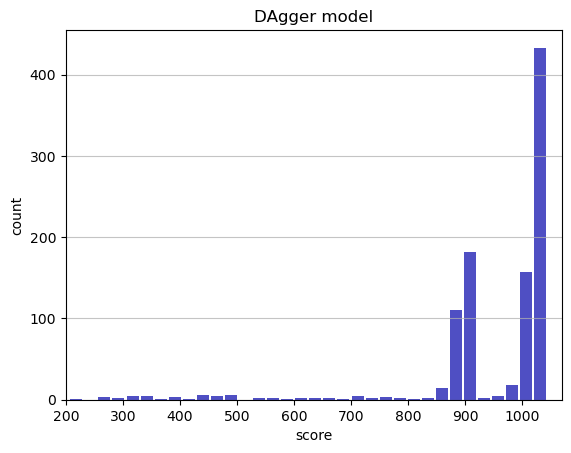

Track generation: 1036..1299 -> 263-tiles track
Epoch: 986
DAgger	mean: 950.22	variance: 136.93


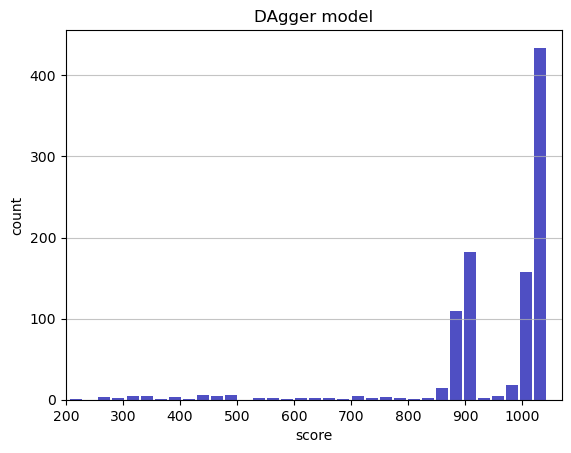

Track generation: 1109..1390 -> 281-tiles track
Epoch: 987
DAgger	mean: 950.29	variance: 136.88


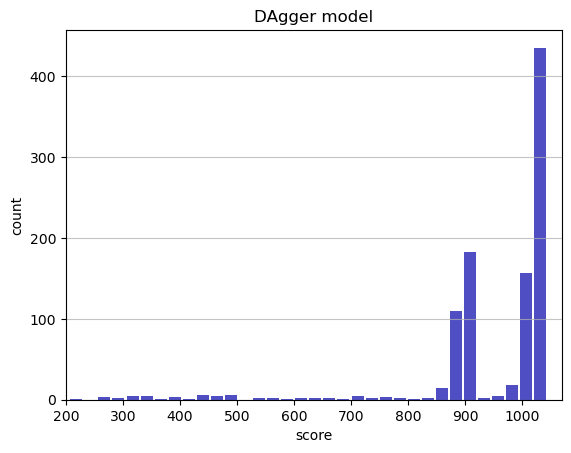

Track generation: 1432..1794 -> 362-tiles track
Epoch: 988
DAgger	mean: 950.35	variance: 136.82


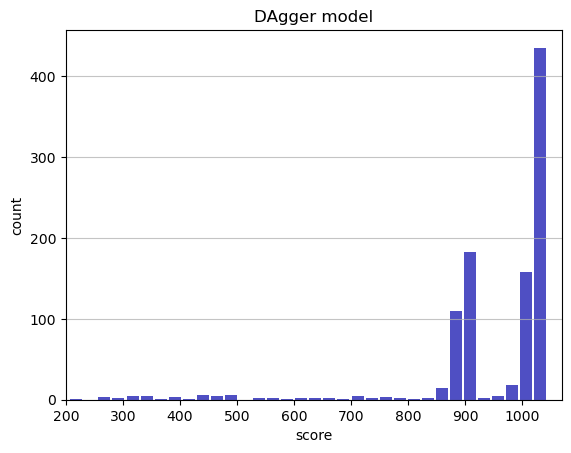

Track generation: 1067..1338 -> 271-tiles track
Epoch: 989
DAgger	mean: 950.29	variance: 136.77


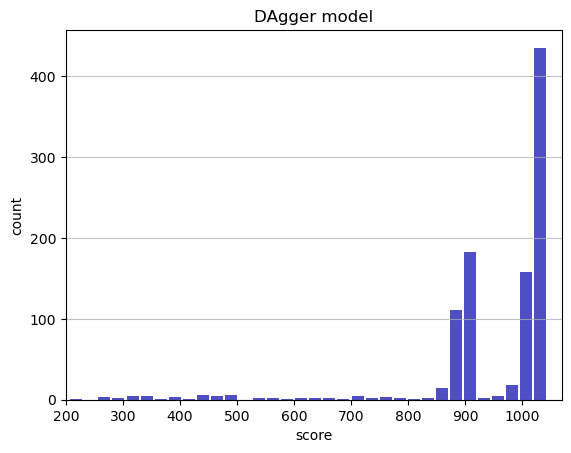

Track generation: 1238..1552 -> 314-tiles track
Epoch: 990
DAgger	mean: 950.36	variance: 136.72


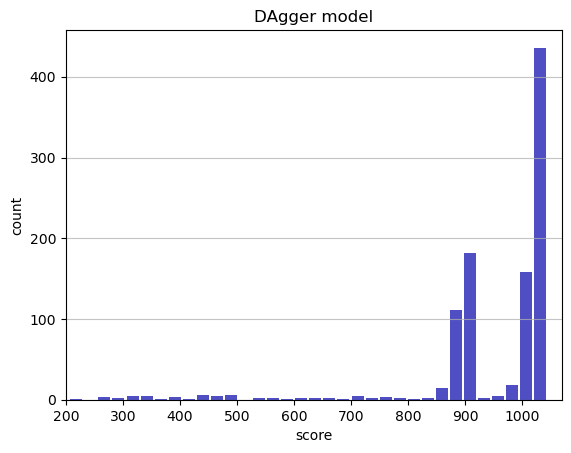

Track generation: 1168..1464 -> 296-tiles track
Epoch: 991
DAgger	mean: 950.31	variance: 136.66


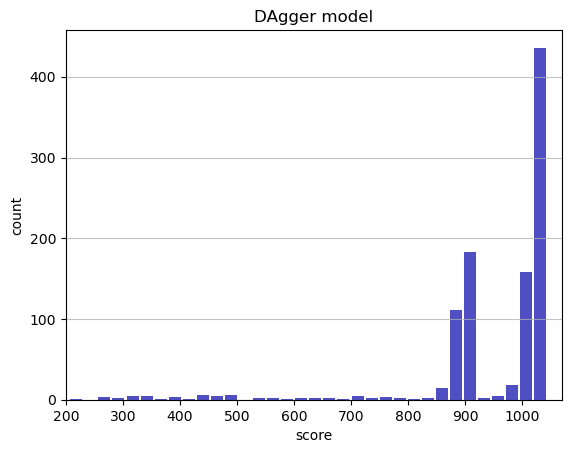

Track generation: 1098..1380 -> 282-tiles track
Epoch: 992
DAgger	mean: 950.22	variance: 136.62


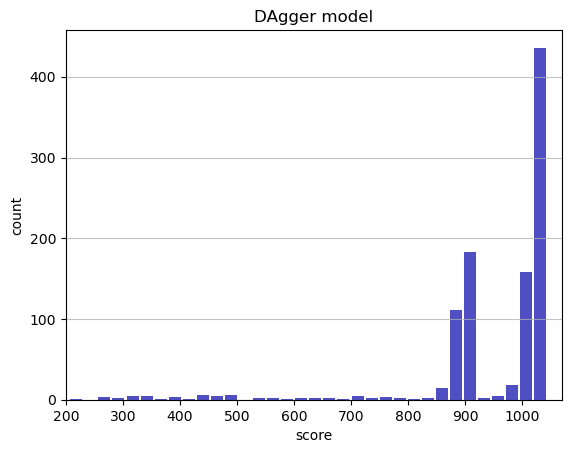

Track generation: 1012..1274 -> 262-tiles track
Epoch: 993
DAgger	mean: 950.30	variance: 136.57


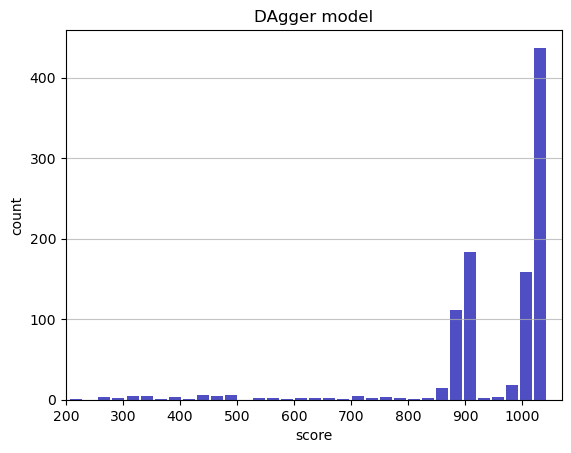

Track generation: 1166..1462 -> 296-tiles track
Epoch: 994
DAgger	mean: 950.37	variance: 136.52


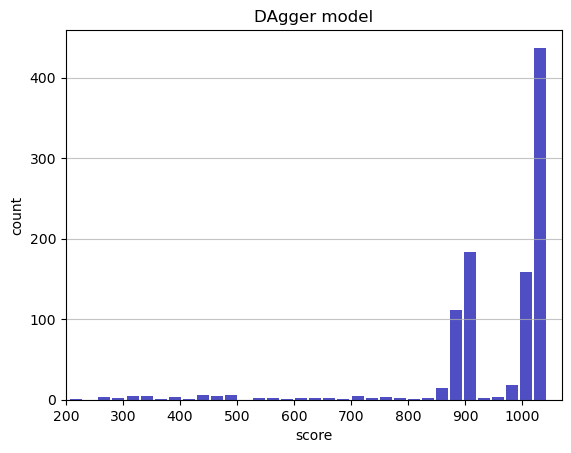

Track generation: 1089..1374 -> 285-tiles track
Epoch: 995
DAgger	mean: 950.31	variance: 136.46


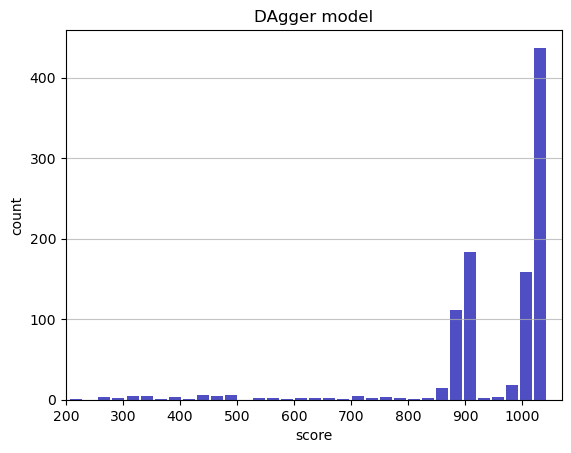

Track generation: 1151..1443 -> 292-tiles track
Epoch: 996
DAgger	mean: 950.25	variance: 136.40


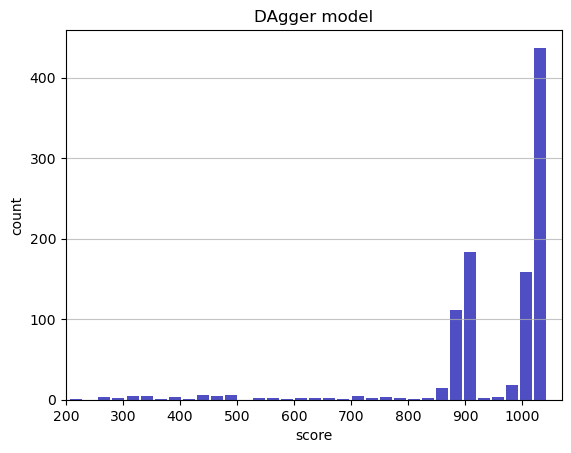

Track generation: 1055..1330 -> 275-tiles track
Epoch: 997
DAgger	mean: 950.33	variance: 136.36


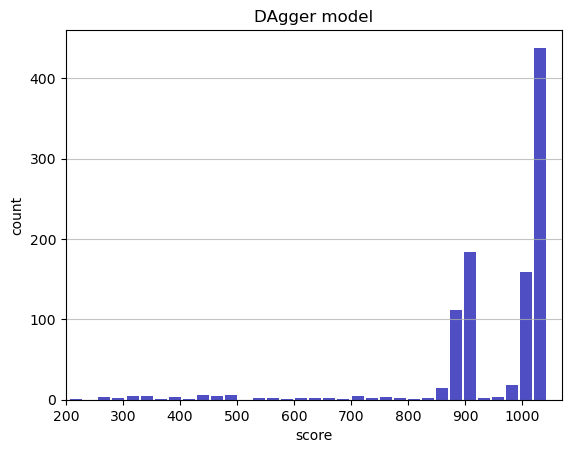

Track generation: 1185..1486 -> 301-tiles track
Epoch: 998
DAgger	mean: 950.27	variance: 136.31


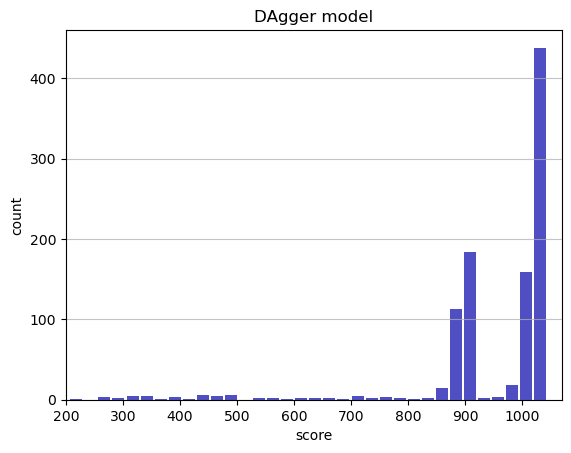

Track generation: 1055..1323 -> 268-tiles track
Epoch: 999
DAgger	mean: 950.21	variance: 136.25


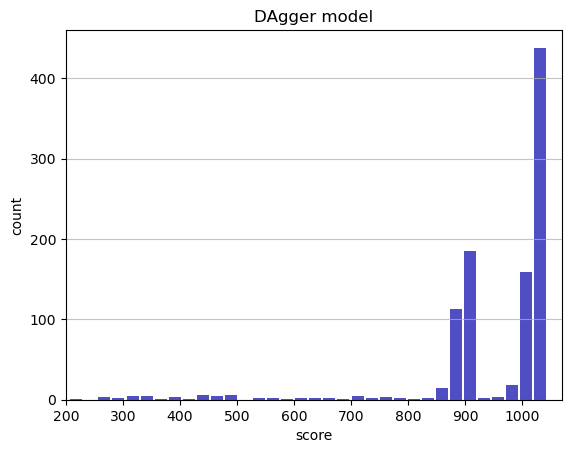

Track generation: 1235..1548 -> 313-tiles track
Epoch: 1000
DAgger	mean: 950.17	variance: 136.19


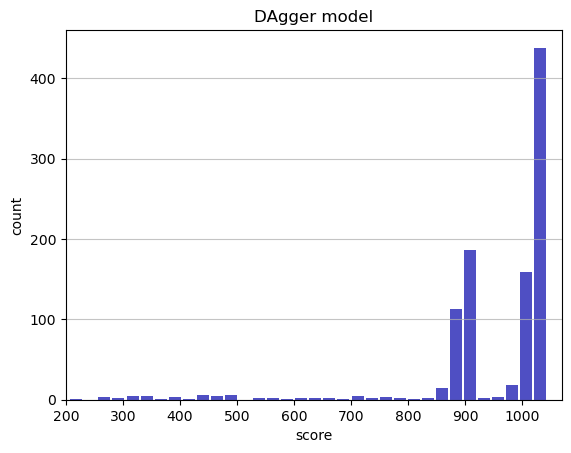

In [3]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

env = Env()
total_score = 0
scores = []

model = torch.load('./dagger_model/dagger_model26.pt')

epoch = 1000
for i_ep in range(1,epoch+1):
    score = 0
    state = env.reset()
    
    for t in range(1000):     
        action = model(torch.tensor(state.reshape(1,4,96,96)).cuda().float())[0].cpu().detach().numpy()
        
        state_, reward, done, die = env.step(action * np.array([2., 1., 1.]) + np.array([-1., 0., 0.]))
        
        env.render()
        score += reward
        state = state_
        if done or die:
            break
    
    total_score += score
    scores.append(score)
    
    print("Epoch: {}".format(i_ep))
    print('DAgger\tmean: {:.2f}\tvariance: {:.2f}'.format(np.array(scores).mean(), np.array(scores).std()))

    plt.figure()
    plt.hist(x=scores, bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlim(200,1070)
    plt.xlabel('score')
    plt.ylabel('count')
    plt.title('DAgger model')
    
    plt.show()
    
env.close()

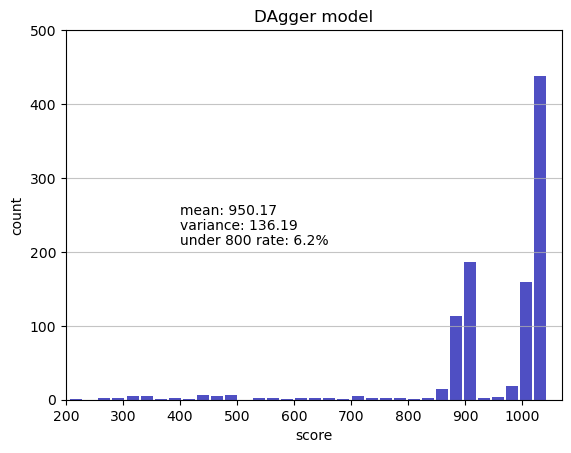

In [10]:
# np.save('./dagger_model/score.npy', scores)

scores = np.load('./dagger_model/score.npy')

plt.figure()
plt.hist(x=scores, bins='auto', color='#0504aa', alpha=0.7, rwidth=0.85)
plt.grid(axis='y', alpha=0.75)
plt.xlim(200,1070)
plt.ylim(0, 500)
plt.xlabel('score')
plt.ylabel('count')
plt.title('DAgger model')
plt.text(400, 250, 'mean: {:.2f}'.format(np.array(scores).mean()))
plt.text(400, 230, 'variance: {:.2f}'.format(np.array(scores).std()))
plt.text(400, 210, 'under 800 rate: {}%'.format(len(scores[scores < 800])/10))

plt.show()